In [1]:
import argparse
import os
import numpy as np
import math
import sys
import torch
import torch.distributions as distributions
import torchvision.transforms as transforms
from torchvision.utils import save_image
import torch.utils.data as Data
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch
from scipy.io import savemat
import scipy.io as sio
import sys
import importlib
import datetime
import itertools
import pickle
import scipy
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy.random import random
from scipy.linalg import sqrtm
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge

In [2]:
data_dir = "data/case30"
case_dir = os.path.join(data_dir)
number = 20000
train_index = 12000
valid_index = 16000
saveFile = "data/case30/RNN_LR_without/S1"

In [3]:
#input data
mat_input = os.path.join(case_dir, 'inputdata_sample.mat')
PQ_injection = np.transpose(scipy.io.loadmat(mat_input)['sampledata'])[0:number,:]
P_injection = PQ_injection.real
Q_injection = PQ_injection.imag
# print(Q_injection.shape)
pv = [1-1,2-1,13-1,22-1,23-1,27-1]
slack = 1-1
P_injection = np.delete(P_injection,slack,1)
Q_injection = np.delete(Q_injection,pv,1)
# print(Q_injection.shape)
PQ_injection = np.concatenate([P_injection, Q_injection], axis=1)
#noise = np.random.normal(0, 0.01, (number,28))
# print(np.mean(PQ_injection,0))
# print(np.std(PQ_injection,0))
#scaler = MinMaxScaler()
#PQ_injection = scaler.fit_transform(PQ_injection)        
print(PQ_injection.shape)
# print(noise.shape)
#PQ_injection_noise = PQ_injection + noise
# print('add noise')
# PQ_injection = PQ_injection_noise 
#print(PQ_injection_noise.shape)
#output data
mat_ang = os.path.join(case_dir, 'voltage_ang_reduced.mat')
mat_mag = os.path.join(case_dir, 'voltage_mag_reduced.mat')
voltage_ang = np.transpose(scipy.io.loadmat(mat_ang)['voltage_ang_reduced'])[0:number,:]
voltage_mag = np.transpose(scipy.io.loadmat(mat_mag)['voltage_mag_reduced'])[0:number,:]
voltage =  np.concatenate([voltage_ang,voltage_mag], axis=1) 
yTrain = torch.from_numpy(voltage[0:train_index,:])
xTrain = torch.from_numpy(PQ_injection[0:train_index,:])
yValid = torch.from_numpy(voltage[train_index:valid_index,:])
xValid = torch.from_numpy(PQ_injection[train_index:valid_index,:])
yTest = torch.from_numpy(voltage[valid_index:number,:])
xTest = torch.from_numpy(PQ_injection[valid_index:number,:])
dataset = torch.utils.data.TensorDataset(xTrain, yTrain)
print(xValid.shape)
print(xTrain.shape)
print(xTest.shape)

(20000, 53)
torch.Size([4000, 53])
torch.Size([12000, 53])
torch.Size([4000, 53])


In [4]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=500, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=32, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.00001, help="learning rate")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--labels_dim", type=int, default=53, help="dimensionality of the latent space")
parser.add_argument("--img_size", type=int, default=53, help="size of each image dimension")
parser.add_argument("--hidden1_dim", type=int, default=100, help="size of hidden_dim")
parser.add_argument("--output1_dim", type=int, default=100, help="size of hidden_dim")
opt = parser.parse_args(args=[])
print(opt)

Namespace(batch_size=32, hidden1_dim=100, img_size=53, labels_dim=53, lr=1e-05, n_cpu=8, n_epochs=500, output1_dim=100)


In [5]:
cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor


In [6]:
class BasicBlock(nn.Module):
    def __init__(self, in_feat, hidden_feat, out_feat):
        super(BasicBlock, self).__init__()
        self.layers = nn.Linear(opt.labels_dim, opt.img_size)
        self.layers1 = nn.Linear(opt.labels_dim, hidden_feat)
        self.relu = nn.ReLU(inplace=True)
        self.layers2 = nn.Linear(hidden_feat, hidden_feat)
        self.layers3 = nn.Linear(hidden_feat, out_feat)
    def forward(self, x):
        identity = self.layers(x)

        out = self.layers1(x)
        out = self.relu(out)

        out = self.layers2(out)
        out = self.relu(out)
        
        out = self.layers3(out)
        out = identity + out
        #out = self.relu(out)

        return out
class Resnet(nn.Module):
    def __init__(self, block):
        super(Resnet, self).__init__()
        self.layers = torch.nn.ModuleList()
        self.block = block
        self.model = nn.Sequential(
            block(opt.labels_dim,opt.hidden1_dim, opt.img_size),
            #block(opt.output1_dim,opt.hidden2_dim,opt.output2_dim),
            #block(opt.output1_dim,opt.hidden2_dim,opt.output2_dim),
            #nn.Linear(opt.output1_dim,opt.img_size),
        )   
    def forward(self, x):
        out = self.model(x)
        return out
MLP = Resnet(BasicBlock)

In [8]:
print(MLP.model[0].layers1.weight.detach().numpy())

[[-0.05200299  0.02728383  0.04013653 ...  0.08393042 -0.12673058
   0.05882348]
 [ 0.09046023 -0.12589039  0.12410666 ...  0.09298602  0.10310014
   0.01121207]
 [ 0.08110282  0.0468346   0.09211619 ...  0.05426043  0.13697653
   0.04141213]
 ...
 [ 0.04118758 -0.08843458 -0.10881097 ... -0.03945607  0.01716128
   0.0644504 ]
 [ 0.06352261 -0.06918027  0.00457728 ... -0.03837191  0.08653948
  -0.10591325]
 [ 0.09339687  0.13596652 -0.0209171  ... -0.02044551 -0.11059946
  -0.00478703]]


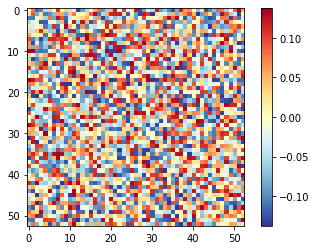

In [7]:
color_map = plt.imshow(MLP.model[0].layers.weight.detach().numpy())
color_map.set_cmap("RdYlBu_r")
plt.colorbar()
plt.show()

In [59]:
y_hat = MLP.model[0].layers(xTrain.float())
error = torch.sqrt(torch.mean((y_hat - yTrain.float())**2,axis = 0))
error_ang = torch.mean(error[0:29])
error_mag = torch.mean(error[29:53])
print(torch.mean(error))
print(error_ang)
print(error_mag)

tensor(0.4873, grad_fn=<MeanBackward0>)
tensor(0.1263, grad_fn=<MeanBackward0>)
tensor(0.9234, grad_fn=<MeanBackward0>)


In [9]:
# Initialize generator and discriminator
time = []
loss_train = []  
loss_valid = [] 
batch_loss_train = [] 
avg_train_losses = []
L2_loss = nn.MSELoss()
if cuda:
    MLP.cuda()
    L2_loss.cuda()
# Configure data loader
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=opt.batch_size,
    shuffle=True,
)

# Optimizers
optimizer = torch.optim.Adam(MLP.parameters(), lr=opt.lr)
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
# Create batch of latent vectors that we will use to check the progression of the generator
# ----------
#  Training
# ----------

batches_done = 0

for epoch in range(opt.n_epochs):

    for i, (xTrain, yTrain) in enumerate(dataloader):
        # Configure input
            # -----------------
            #  Train Generator
            # -----------------
            startTime = datetime.datetime.now()
            optimizer.zero_grad()
            # Generate a batch of images
            yHatTrain = MLP(xTrain.float())
            # Adversarial loss
            loss = L2_loss(yHatTrain,yTrain.float())
            loss.backward()
            optimizer.step()
            endTime = datetime.datetime.now()
            timeElapsed = abs(endTime - startTime).total_seconds()
            time.append(timeElapsed)
            batch_loss_train.append(loss.item()) 
            print(
                "[Epoch %d/%d] [Batch %d/%d][G loss: %.8f]"
                % (epoch, opt.n_epochs, batches_done % len(dataloader), len(dataloader), loss.item())
            )         
            if (batches_done % (len(yValid)//opt.batch_size) == 0):
                with torch.no_grad(): 
                    yHatValid = MLP(xValid.float()) 
                    # Compute loss
                    lossValueValid = L2_loss(yHatValid, yValid)
                    loss_valid.append(lossValueValid.item())
                if epoch > 799:
                    if (epoch == 800) & (i==0):
                        bestScore = lossValueValid
                        torch.save(MLP.state_dict(), saveFile +'Best'+'.ckpt')
                        torch.save(optimizer.state_dict(), saveFile+'Optim'+'Best'+'.ckpt')
                    else:
                        thisValidScore = lossValueValid
                        if thisValidScore < bestScore:
                            bestScore = thisValidScore
                            torch.save(MLP.state_dict(), saveFile + 'Best'+'.ckpt')
                            torch.save(optimizer.state_dict(), saveFile+'Optim'+'Best'+'.ckpt')                  
            batches_done += 1
    train_loss = np.average(batch_loss_train)
    avg_train_losses.append(train_loss)
    batch_loss_train = []


[Epoch 0/500] [Batch 0/375][G loss: 0.43956220]
[Epoch 0/500] [Batch 1/375][G loss: 0.43970263]
[Epoch 0/500] [Batch 2/375][G loss: 0.43823317]
[Epoch 0/500] [Batch 3/375][G loss: 0.43842822]
[Epoch 0/500] [Batch 4/375][G loss: 0.43806869]
[Epoch 0/500] [Batch 5/375][G loss: 0.43938157]
[Epoch 0/500] [Batch 6/375][G loss: 0.43893409]
[Epoch 0/500] [Batch 7/375][G loss: 0.43867162]
[Epoch 0/500] [Batch 8/375][G loss: 0.43970299]
[Epoch 0/500] [Batch 9/375][G loss: 0.43831372]
[Epoch 0/500] [Batch 10/375][G loss: 0.43973088]
[Epoch 0/500] [Batch 11/375][G loss: 0.43854338]
[Epoch 0/500] [Batch 12/375][G loss: 0.43795753]
[Epoch 0/500] [Batch 13/375][G loss: 0.43751180]
[Epoch 0/500] [Batch 14/375][G loss: 0.43863067]
[Epoch 0/500] [Batch 15/375][G loss: 0.43720332]
[Epoch 0/500] [Batch 16/375][G loss: 0.43790242]
[Epoch 0/500] [Batch 17/375][G loss: 0.43809265]
[Epoch 0/500] [Batch 18/375][G loss: 0.43745217]
[Epoch 0/500] [Batch 19/375][G loss: 0.43599612]
[Epoch 0/500] [Batch 20/375][G

[Epoch 0/500] [Batch 250/375][G loss: 0.40159693]
[Epoch 0/500] [Batch 251/375][G loss: 0.40075576]
[Epoch 0/500] [Batch 252/375][G loss: 0.40169454]
[Epoch 0/500] [Batch 253/375][G loss: 0.40142342]
[Epoch 0/500] [Batch 254/375][G loss: 0.40043131]
[Epoch 0/500] [Batch 255/375][G loss: 0.40104240]
[Epoch 0/500] [Batch 256/375][G loss: 0.40118065]
[Epoch 0/500] [Batch 257/375][G loss: 0.40018278]
[Epoch 0/500] [Batch 258/375][G loss: 0.39998275]
[Epoch 0/500] [Batch 259/375][G loss: 0.39841768]
[Epoch 0/500] [Batch 260/375][G loss: 0.39998230]
[Epoch 0/500] [Batch 261/375][G loss: 0.40071416]
[Epoch 0/500] [Batch 262/375][G loss: 0.39833429]
[Epoch 0/500] [Batch 263/375][G loss: 0.40031743]
[Epoch 0/500] [Batch 264/375][G loss: 0.39830625]
[Epoch 0/500] [Batch 265/375][G loss: 0.39831322]
[Epoch 0/500] [Batch 266/375][G loss: 0.39903292]
[Epoch 0/500] [Batch 267/375][G loss: 0.39778084]
[Epoch 0/500] [Batch 268/375][G loss: 0.39807740]
[Epoch 0/500] [Batch 269/375][G loss: 0.40005046]


[Epoch 1/500] [Batch 140/375][G loss: 0.35672322]
[Epoch 1/500] [Batch 141/375][G loss: 0.35408571]
[Epoch 1/500] [Batch 142/375][G loss: 0.35458931]
[Epoch 1/500] [Batch 143/375][G loss: 0.35433295]
[Epoch 1/500] [Batch 144/375][G loss: 0.35654104]
[Epoch 1/500] [Batch 145/375][G loss: 0.35273749]
[Epoch 1/500] [Batch 146/375][G loss: 0.35528249]
[Epoch 1/500] [Batch 147/375][G loss: 0.35473725]
[Epoch 1/500] [Batch 148/375][G loss: 0.35463935]
[Epoch 1/500] [Batch 149/375][G loss: 0.35271135]
[Epoch 1/500] [Batch 150/375][G loss: 0.35336986]
[Epoch 1/500] [Batch 151/375][G loss: 0.35326478]
[Epoch 1/500] [Batch 152/375][G loss: 0.35224262]
[Epoch 1/500] [Batch 153/375][G loss: 0.35238111]
[Epoch 1/500] [Batch 154/375][G loss: 0.35053751]
[Epoch 1/500] [Batch 155/375][G loss: 0.35163885]
[Epoch 1/500] [Batch 156/375][G loss: 0.35173243]
[Epoch 1/500] [Batch 157/375][G loss: 0.35148707]
[Epoch 1/500] [Batch 158/375][G loss: 0.35122228]
[Epoch 1/500] [Batch 159/375][G loss: 0.35238561]


[Epoch 2/500] [Batch 33/375][G loss: 0.29732069]
[Epoch 2/500] [Batch 34/375][G loss: 0.29683682]
[Epoch 2/500] [Batch 35/375][G loss: 0.29624882]
[Epoch 2/500] [Batch 36/375][G loss: 0.29769307]
[Epoch 2/500] [Batch 37/375][G loss: 0.29740223]
[Epoch 2/500] [Batch 38/375][G loss: 0.29755932]
[Epoch 2/500] [Batch 39/375][G loss: 0.29332927]
[Epoch 2/500] [Batch 40/375][G loss: 0.29526734]
[Epoch 2/500] [Batch 41/375][G loss: 0.29444706]
[Epoch 2/500] [Batch 42/375][G loss: 0.29692605]
[Epoch 2/500] [Batch 43/375][G loss: 0.29424167]
[Epoch 2/500] [Batch 44/375][G loss: 0.29465833]
[Epoch 2/500] [Batch 45/375][G loss: 0.29657972]
[Epoch 2/500] [Batch 46/375][G loss: 0.29467672]
[Epoch 2/500] [Batch 47/375][G loss: 0.29618290]
[Epoch 2/500] [Batch 48/375][G loss: 0.29284379]
[Epoch 2/500] [Batch 49/375][G loss: 0.29437411]
[Epoch 2/500] [Batch 50/375][G loss: 0.29161957]
[Epoch 2/500] [Batch 51/375][G loss: 0.29372469]
[Epoch 2/500] [Batch 52/375][G loss: 0.29205942]
[Epoch 2/500] [Batch

[Epoch 2/500] [Batch 302/375][G loss: 0.22597799]
[Epoch 2/500] [Batch 303/375][G loss: 0.22556254]
[Epoch 2/500] [Batch 304/375][G loss: 0.22689562]
[Epoch 2/500] [Batch 305/375][G loss: 0.22957322]
[Epoch 2/500] [Batch 306/375][G loss: 0.22838956]
[Epoch 2/500] [Batch 307/375][G loss: 0.22818841]
[Epoch 2/500] [Batch 308/375][G loss: 0.22610593]
[Epoch 2/500] [Batch 309/375][G loss: 0.23004836]
[Epoch 2/500] [Batch 310/375][G loss: 0.22729589]
[Epoch 2/500] [Batch 311/375][G loss: 0.22624481]
[Epoch 2/500] [Batch 312/375][G loss: 0.22436550]
[Epoch 2/500] [Batch 313/375][G loss: 0.22597685]
[Epoch 2/500] [Batch 314/375][G loss: 0.22283469]
[Epoch 2/500] [Batch 315/375][G loss: 0.22353919]
[Epoch 2/500] [Batch 316/375][G loss: 0.22655739]
[Epoch 2/500] [Batch 317/375][G loss: 0.22170457]
[Epoch 2/500] [Batch 318/375][G loss: 0.22297651]
[Epoch 2/500] [Batch 319/375][G loss: 0.22507378]
[Epoch 2/500] [Batch 320/375][G loss: 0.22148779]
[Epoch 2/500] [Batch 321/375][G loss: 0.22142628]


[Epoch 3/500] [Batch 190/375][G loss: 0.15892698]
[Epoch 3/500] [Batch 191/375][G loss: 0.15659282]
[Epoch 3/500] [Batch 192/375][G loss: 0.15500708]
[Epoch 3/500] [Batch 193/375][G loss: 0.15765235]
[Epoch 3/500] [Batch 194/375][G loss: 0.15453982]
[Epoch 3/500] [Batch 195/375][G loss: 0.15634805]
[Epoch 3/500] [Batch 196/375][G loss: 0.15775752]
[Epoch 3/500] [Batch 197/375][G loss: 0.15263079]
[Epoch 3/500] [Batch 198/375][G loss: 0.15435667]
[Epoch 3/500] [Batch 199/375][G loss: 0.15678070]
[Epoch 3/500] [Batch 200/375][G loss: 0.15256937]
[Epoch 3/500] [Batch 201/375][G loss: 0.15389526]
[Epoch 3/500] [Batch 202/375][G loss: 0.15481783]
[Epoch 3/500] [Batch 203/375][G loss: 0.15466811]
[Epoch 3/500] [Batch 204/375][G loss: 0.15435503]
[Epoch 3/500] [Batch 205/375][G loss: 0.15124118]
[Epoch 3/500] [Batch 206/375][G loss: 0.15220141]
[Epoch 3/500] [Batch 207/375][G loss: 0.15124869]
[Epoch 3/500] [Batch 208/375][G loss: 0.15200904]
[Epoch 3/500] [Batch 209/375][G loss: 0.15079458]


[Epoch 4/500] [Batch 64/375][G loss: 0.09752242]
[Epoch 4/500] [Batch 65/375][G loss: 0.09436574]
[Epoch 4/500] [Batch 66/375][G loss: 0.09673388]
[Epoch 4/500] [Batch 67/375][G loss: 0.09503320]
[Epoch 4/500] [Batch 68/375][G loss: 0.09497323]
[Epoch 4/500] [Batch 69/375][G loss: 0.09680983]
[Epoch 4/500] [Batch 70/375][G loss: 0.09415140]
[Epoch 4/500] [Batch 71/375][G loss: 0.09373539]
[Epoch 4/500] [Batch 72/375][G loss: 0.09485731]
[Epoch 4/500] [Batch 73/375][G loss: 0.09177209]
[Epoch 4/500] [Batch 74/375][G loss: 0.09318043]
[Epoch 4/500] [Batch 75/375][G loss: 0.09359492]
[Epoch 4/500] [Batch 76/375][G loss: 0.09427488]
[Epoch 4/500] [Batch 77/375][G loss: 0.09461469]
[Epoch 4/500] [Batch 78/375][G loss: 0.09321763]
[Epoch 4/500] [Batch 79/375][G loss: 0.09388886]
[Epoch 4/500] [Batch 80/375][G loss: 0.09379414]
[Epoch 4/500] [Batch 81/375][G loss: 0.09088352]
[Epoch 4/500] [Batch 82/375][G loss: 0.08927886]
[Epoch 4/500] [Batch 83/375][G loss: 0.08973581]
[Epoch 4/500] [Batch

[Epoch 4/500] [Batch 313/375][G loss: 0.04916280]
[Epoch 4/500] [Batch 314/375][G loss: 0.04897558]
[Epoch 4/500] [Batch 315/375][G loss: 0.04954835]
[Epoch 4/500] [Batch 316/375][G loss: 0.04892299]
[Epoch 4/500] [Batch 317/375][G loss: 0.05060265]
[Epoch 4/500] [Batch 318/375][G loss: 0.04964099]
[Epoch 4/500] [Batch 319/375][G loss: 0.05040151]
[Epoch 4/500] [Batch 320/375][G loss: 0.04966719]
[Epoch 4/500] [Batch 321/375][G loss: 0.04984822]
[Epoch 4/500] [Batch 322/375][G loss: 0.04734474]
[Epoch 4/500] [Batch 323/375][G loss: 0.04952819]
[Epoch 4/500] [Batch 324/375][G loss: 0.04945419]
[Epoch 4/500] [Batch 325/375][G loss: 0.04951703]
[Epoch 4/500] [Batch 326/375][G loss: 0.04827944]
[Epoch 4/500] [Batch 327/375][G loss: 0.04730703]
[Epoch 4/500] [Batch 328/375][G loss: 0.04673256]
[Epoch 4/500] [Batch 329/375][G loss: 0.04798069]
[Epoch 4/500] [Batch 330/375][G loss: 0.04917821]
[Epoch 4/500] [Batch 331/375][G loss: 0.04883119]
[Epoch 4/500] [Batch 332/375][G loss: 0.04961970]


[Epoch 5/500] [Batch 200/375][G loss: 0.02333979]
[Epoch 5/500] [Batch 201/375][G loss: 0.02247497]
[Epoch 5/500] [Batch 202/375][G loss: 0.02262588]
[Epoch 5/500] [Batch 203/375][G loss: 0.02120963]
[Epoch 5/500] [Batch 204/375][G loss: 0.02223487]
[Epoch 5/500] [Batch 205/375][G loss: 0.02336684]
[Epoch 5/500] [Batch 206/375][G loss: 0.02070856]
[Epoch 5/500] [Batch 207/375][G loss: 0.02106630]
[Epoch 5/500] [Batch 208/375][G loss: 0.01959897]
[Epoch 5/500] [Batch 209/375][G loss: 0.02140726]
[Epoch 5/500] [Batch 210/375][G loss: 0.02093851]
[Epoch 5/500] [Batch 211/375][G loss: 0.02153589]
[Epoch 5/500] [Batch 212/375][G loss: 0.02080203]
[Epoch 5/500] [Batch 213/375][G loss: 0.02111270]
[Epoch 5/500] [Batch 214/375][G loss: 0.02107039]
[Epoch 5/500] [Batch 215/375][G loss: 0.02024337]
[Epoch 5/500] [Batch 216/375][G loss: 0.02085840]
[Epoch 5/500] [Batch 217/375][G loss: 0.02086595]
[Epoch 5/500] [Batch 218/375][G loss: 0.02042756]
[Epoch 5/500] [Batch 219/375][G loss: 0.02223038]


[Epoch 6/500] [Batch 76/375][G loss: 0.00914984]
[Epoch 6/500] [Batch 77/375][G loss: 0.00931678]
[Epoch 6/500] [Batch 78/375][G loss: 0.00933731]
[Epoch 6/500] [Batch 79/375][G loss: 0.01003109]
[Epoch 6/500] [Batch 80/375][G loss: 0.00853570]
[Epoch 6/500] [Batch 81/375][G loss: 0.01106595]
[Epoch 6/500] [Batch 82/375][G loss: 0.01002211]
[Epoch 6/500] [Batch 83/375][G loss: 0.00860987]
[Epoch 6/500] [Batch 84/375][G loss: 0.00896208]
[Epoch 6/500] [Batch 85/375][G loss: 0.00884227]
[Epoch 6/500] [Batch 86/375][G loss: 0.00867502]
[Epoch 6/500] [Batch 87/375][G loss: 0.00904732]
[Epoch 6/500] [Batch 88/375][G loss: 0.00900831]
[Epoch 6/500] [Batch 89/375][G loss: 0.00902572]
[Epoch 6/500] [Batch 90/375][G loss: 0.00968643]
[Epoch 6/500] [Batch 91/375][G loss: 0.00864577]
[Epoch 6/500] [Batch 92/375][G loss: 0.00920049]
[Epoch 6/500] [Batch 93/375][G loss: 0.00841253]
[Epoch 6/500] [Batch 94/375][G loss: 0.00981132]
[Epoch 6/500] [Batch 95/375][G loss: 0.00814914]
[Epoch 6/500] [Batch

[Epoch 6/500] [Batch 333/375][G loss: 0.00441569]
[Epoch 6/500] [Batch 334/375][G loss: 0.00434903]
[Epoch 6/500] [Batch 335/375][G loss: 0.00469697]
[Epoch 6/500] [Batch 336/375][G loss: 0.00498413]
[Epoch 6/500] [Batch 337/375][G loss: 0.00440833]
[Epoch 6/500] [Batch 338/375][G loss: 0.00395767]
[Epoch 6/500] [Batch 339/375][G loss: 0.00379191]
[Epoch 6/500] [Batch 340/375][G loss: 0.00501035]
[Epoch 6/500] [Batch 341/375][G loss: 0.00530087]
[Epoch 6/500] [Batch 342/375][G loss: 0.00437099]
[Epoch 6/500] [Batch 343/375][G loss: 0.00394516]
[Epoch 6/500] [Batch 344/375][G loss: 0.00407658]
[Epoch 6/500] [Batch 345/375][G loss: 0.00418554]
[Epoch 6/500] [Batch 346/375][G loss: 0.00405340]
[Epoch 6/500] [Batch 347/375][G loss: 0.00492782]
[Epoch 6/500] [Batch 348/375][G loss: 0.00473909]
[Epoch 6/500] [Batch 349/375][G loss: 0.00427196]
[Epoch 6/500] [Batch 350/375][G loss: 0.00405599]
[Epoch 6/500] [Batch 351/375][G loss: 0.00419621]
[Epoch 6/500] [Batch 352/375][G loss: 0.00454919]


[Epoch 7/500] [Batch 206/375][G loss: 0.00297065]
[Epoch 7/500] [Batch 207/375][G loss: 0.00279588]
[Epoch 7/500] [Batch 208/375][G loss: 0.00231331]
[Epoch 7/500] [Batch 209/375][G loss: 0.00239201]
[Epoch 7/500] [Batch 210/375][G loss: 0.00258501]
[Epoch 7/500] [Batch 211/375][G loss: 0.00322938]
[Epoch 7/500] [Batch 212/375][G loss: 0.00294663]
[Epoch 7/500] [Batch 213/375][G loss: 0.00272735]
[Epoch 7/500] [Batch 214/375][G loss: 0.00225876]
[Epoch 7/500] [Batch 215/375][G loss: 0.00223449]
[Epoch 7/500] [Batch 216/375][G loss: 0.00291922]
[Epoch 7/500] [Batch 217/375][G loss: 0.00273415]
[Epoch 7/500] [Batch 218/375][G loss: 0.00243274]
[Epoch 7/500] [Batch 219/375][G loss: 0.00245044]
[Epoch 7/500] [Batch 220/375][G loss: 0.00230594]
[Epoch 7/500] [Batch 221/375][G loss: 0.00299792]
[Epoch 7/500] [Batch 222/375][G loss: 0.00235274]
[Epoch 7/500] [Batch 223/375][G loss: 0.00267895]
[Epoch 7/500] [Batch 224/375][G loss: 0.00281042]
[Epoch 7/500] [Batch 225/375][G loss: 0.00299623]


[Epoch 8/500] [Batch 79/375][G loss: 0.00238669]
[Epoch 8/500] [Batch 80/375][G loss: 0.00222184]
[Epoch 8/500] [Batch 81/375][G loss: 0.00213582]
[Epoch 8/500] [Batch 82/375][G loss: 0.00195410]
[Epoch 8/500] [Batch 83/375][G loss: 0.00234309]
[Epoch 8/500] [Batch 84/375][G loss: 0.00241811]
[Epoch 8/500] [Batch 85/375][G loss: 0.00229069]
[Epoch 8/500] [Batch 86/375][G loss: 0.00185293]
[Epoch 8/500] [Batch 87/375][G loss: 0.00176696]
[Epoch 8/500] [Batch 88/375][G loss: 0.00246642]
[Epoch 8/500] [Batch 89/375][G loss: 0.00216852]
[Epoch 8/500] [Batch 90/375][G loss: 0.00179162]
[Epoch 8/500] [Batch 91/375][G loss: 0.00209844]
[Epoch 8/500] [Batch 92/375][G loss: 0.00197634]
[Epoch 8/500] [Batch 93/375][G loss: 0.00228440]
[Epoch 8/500] [Batch 94/375][G loss: 0.00232716]
[Epoch 8/500] [Batch 95/375][G loss: 0.00251079]
[Epoch 8/500] [Batch 96/375][G loss: 0.00255186]
[Epoch 8/500] [Batch 97/375][G loss: 0.00205761]
[Epoch 8/500] [Batch 98/375][G loss: 0.00214268]
[Epoch 8/500] [Batch

[Epoch 8/500] [Batch 327/375][G loss: 0.00169670]
[Epoch 8/500] [Batch 328/375][G loss: 0.00229010]
[Epoch 8/500] [Batch 329/375][G loss: 0.00194744]
[Epoch 8/500] [Batch 330/375][G loss: 0.00244431]
[Epoch 8/500] [Batch 331/375][G loss: 0.00165977]
[Epoch 8/500] [Batch 332/375][G loss: 0.00186532]
[Epoch 8/500] [Batch 333/375][G loss: 0.00245026]
[Epoch 8/500] [Batch 334/375][G loss: 0.00227443]
[Epoch 8/500] [Batch 335/375][G loss: 0.00273234]
[Epoch 8/500] [Batch 336/375][G loss: 0.00152274]
[Epoch 8/500] [Batch 337/375][G loss: 0.00199632]
[Epoch 8/500] [Batch 338/375][G loss: 0.00204505]
[Epoch 8/500] [Batch 339/375][G loss: 0.00242397]
[Epoch 8/500] [Batch 340/375][G loss: 0.00197065]
[Epoch 8/500] [Batch 341/375][G loss: 0.00205177]
[Epoch 8/500] [Batch 342/375][G loss: 0.00174612]
[Epoch 8/500] [Batch 343/375][G loss: 0.00206047]
[Epoch 8/500] [Batch 344/375][G loss: 0.00181147]
[Epoch 8/500] [Batch 345/375][G loss: 0.00161300]
[Epoch 8/500] [Batch 346/375][G loss: 0.00230369]


[Epoch 9/500] [Batch 193/375][G loss: 0.00233846]
[Epoch 9/500] [Batch 194/375][G loss: 0.00142276]
[Epoch 9/500] [Batch 195/375][G loss: 0.00181209]
[Epoch 9/500] [Batch 196/375][G loss: 0.00215463]
[Epoch 9/500] [Batch 197/375][G loss: 0.00150267]
[Epoch 9/500] [Batch 198/375][G loss: 0.00138682]
[Epoch 9/500] [Batch 199/375][G loss: 0.00174466]
[Epoch 9/500] [Batch 200/375][G loss: 0.00186412]
[Epoch 9/500] [Batch 201/375][G loss: 0.00216450]
[Epoch 9/500] [Batch 202/375][G loss: 0.00150979]
[Epoch 9/500] [Batch 203/375][G loss: 0.00172531]
[Epoch 9/500] [Batch 204/375][G loss: 0.00191341]
[Epoch 9/500] [Batch 205/375][G loss: 0.00160111]
[Epoch 9/500] [Batch 206/375][G loss: 0.00117859]
[Epoch 9/500] [Batch 207/375][G loss: 0.00218089]
[Epoch 9/500] [Batch 208/375][G loss: 0.00207097]
[Epoch 9/500] [Batch 209/375][G loss: 0.00212945]
[Epoch 9/500] [Batch 210/375][G loss: 0.00195523]
[Epoch 9/500] [Batch 211/375][G loss: 0.00146844]
[Epoch 9/500] [Batch 212/375][G loss: 0.00185107]


[Epoch 10/500] [Batch 67/375][G loss: 0.00191764]
[Epoch 10/500] [Batch 68/375][G loss: 0.00228619]
[Epoch 10/500] [Batch 69/375][G loss: 0.00129661]
[Epoch 10/500] [Batch 70/375][G loss: 0.00153633]
[Epoch 10/500] [Batch 71/375][G loss: 0.00185297]
[Epoch 10/500] [Batch 72/375][G loss: 0.00132013]
[Epoch 10/500] [Batch 73/375][G loss: 0.00135286]
[Epoch 10/500] [Batch 74/375][G loss: 0.00178113]
[Epoch 10/500] [Batch 75/375][G loss: 0.00159608]
[Epoch 10/500] [Batch 76/375][G loss: 0.00195193]
[Epoch 10/500] [Batch 77/375][G loss: 0.00231153]
[Epoch 10/500] [Batch 78/375][G loss: 0.00200588]
[Epoch 10/500] [Batch 79/375][G loss: 0.00147139]
[Epoch 10/500] [Batch 80/375][G loss: 0.00208118]
[Epoch 10/500] [Batch 81/375][G loss: 0.00224580]
[Epoch 10/500] [Batch 82/375][G loss: 0.00146576]
[Epoch 10/500] [Batch 83/375][G loss: 0.00157366]
[Epoch 10/500] [Batch 84/375][G loss: 0.00204733]
[Epoch 10/500] [Batch 85/375][G loss: 0.00235353]
[Epoch 10/500] [Batch 86/375][G loss: 0.00217335]


[Epoch 10/500] [Batch 315/375][G loss: 0.00181118]
[Epoch 10/500] [Batch 316/375][G loss: 0.00146611]
[Epoch 10/500] [Batch 317/375][G loss: 0.00211459]
[Epoch 10/500] [Batch 318/375][G loss: 0.00166914]
[Epoch 10/500] [Batch 319/375][G loss: 0.00128383]
[Epoch 10/500] [Batch 320/375][G loss: 0.00250722]
[Epoch 10/500] [Batch 321/375][G loss: 0.00173780]
[Epoch 10/500] [Batch 322/375][G loss: 0.00158425]
[Epoch 10/500] [Batch 323/375][G loss: 0.00221953]
[Epoch 10/500] [Batch 324/375][G loss: 0.00166145]
[Epoch 10/500] [Batch 325/375][G loss: 0.00203359]
[Epoch 10/500] [Batch 326/375][G loss: 0.00193840]
[Epoch 10/500] [Batch 327/375][G loss: 0.00198602]
[Epoch 10/500] [Batch 328/375][G loss: 0.00190126]
[Epoch 10/500] [Batch 329/375][G loss: 0.00214975]
[Epoch 10/500] [Batch 330/375][G loss: 0.00210638]
[Epoch 10/500] [Batch 331/375][G loss: 0.00132178]
[Epoch 10/500] [Batch 332/375][G loss: 0.00160048]
[Epoch 10/500] [Batch 333/375][G loss: 0.00200708]
[Epoch 10/500] [Batch 334/375][

[Epoch 11/500] [Batch 186/375][G loss: 0.00203716]
[Epoch 11/500] [Batch 187/375][G loss: 0.00198644]
[Epoch 11/500] [Batch 188/375][G loss: 0.00198244]
[Epoch 11/500] [Batch 189/375][G loss: 0.00196968]
[Epoch 11/500] [Batch 190/375][G loss: 0.00158537]
[Epoch 11/500] [Batch 191/375][G loss: 0.00206804]
[Epoch 11/500] [Batch 192/375][G loss: 0.00179372]
[Epoch 11/500] [Batch 193/375][G loss: 0.00212396]
[Epoch 11/500] [Batch 194/375][G loss: 0.00209272]
[Epoch 11/500] [Batch 195/375][G loss: 0.00165213]
[Epoch 11/500] [Batch 196/375][G loss: 0.00145425]
[Epoch 11/500] [Batch 197/375][G loss: 0.00251766]
[Epoch 11/500] [Batch 198/375][G loss: 0.00179590]
[Epoch 11/500] [Batch 199/375][G loss: 0.00197937]
[Epoch 11/500] [Batch 200/375][G loss: 0.00204067]
[Epoch 11/500] [Batch 201/375][G loss: 0.00169199]
[Epoch 11/500] [Batch 202/375][G loss: 0.00161817]
[Epoch 11/500] [Batch 203/375][G loss: 0.00171845]
[Epoch 11/500] [Batch 204/375][G loss: 0.00177864]
[Epoch 11/500] [Batch 205/375][

[Epoch 12/500] [Batch 64/375][G loss: 0.00168956]
[Epoch 12/500] [Batch 65/375][G loss: 0.00220097]
[Epoch 12/500] [Batch 66/375][G loss: 0.00184261]
[Epoch 12/500] [Batch 67/375][G loss: 0.00173046]
[Epoch 12/500] [Batch 68/375][G loss: 0.00178653]
[Epoch 12/500] [Batch 69/375][G loss: 0.00142874]
[Epoch 12/500] [Batch 70/375][G loss: 0.00210558]
[Epoch 12/500] [Batch 71/375][G loss: 0.00177490]
[Epoch 12/500] [Batch 72/375][G loss: 0.00218043]
[Epoch 12/500] [Batch 73/375][G loss: 0.00170867]
[Epoch 12/500] [Batch 74/375][G loss: 0.00174710]
[Epoch 12/500] [Batch 75/375][G loss: 0.00177734]
[Epoch 12/500] [Batch 76/375][G loss: 0.00167364]
[Epoch 12/500] [Batch 77/375][G loss: 0.00223652]
[Epoch 12/500] [Batch 78/375][G loss: 0.00197431]
[Epoch 12/500] [Batch 79/375][G loss: 0.00140681]
[Epoch 12/500] [Batch 80/375][G loss: 0.00139461]
[Epoch 12/500] [Batch 81/375][G loss: 0.00165707]
[Epoch 12/500] [Batch 82/375][G loss: 0.00185914]
[Epoch 12/500] [Batch 83/375][G loss: 0.00180413]


[Epoch 12/500] [Batch 307/375][G loss: 0.00172129]
[Epoch 12/500] [Batch 308/375][G loss: 0.00187707]
[Epoch 12/500] [Batch 309/375][G loss: 0.00163663]
[Epoch 12/500] [Batch 310/375][G loss: 0.00154253]
[Epoch 12/500] [Batch 311/375][G loss: 0.00146740]
[Epoch 12/500] [Batch 312/375][G loss: 0.00159376]
[Epoch 12/500] [Batch 313/375][G loss: 0.00163034]
[Epoch 12/500] [Batch 314/375][G loss: 0.00142758]
[Epoch 12/500] [Batch 315/375][G loss: 0.00198132]
[Epoch 12/500] [Batch 316/375][G loss: 0.00137808]
[Epoch 12/500] [Batch 317/375][G loss: 0.00146785]
[Epoch 12/500] [Batch 318/375][G loss: 0.00171093]
[Epoch 12/500] [Batch 319/375][G loss: 0.00174051]
[Epoch 12/500] [Batch 320/375][G loss: 0.00157603]
[Epoch 12/500] [Batch 321/375][G loss: 0.00176215]
[Epoch 12/500] [Batch 322/375][G loss: 0.00165150]
[Epoch 12/500] [Batch 323/375][G loss: 0.00185775]
[Epoch 12/500] [Batch 324/375][G loss: 0.00127125]
[Epoch 12/500] [Batch 325/375][G loss: 0.00176198]
[Epoch 12/500] [Batch 326/375][

[Epoch 13/500] [Batch 174/375][G loss: 0.00168996]
[Epoch 13/500] [Batch 175/375][G loss: 0.00118832]
[Epoch 13/500] [Batch 176/375][G loss: 0.00175434]
[Epoch 13/500] [Batch 177/375][G loss: 0.00210865]
[Epoch 13/500] [Batch 178/375][G loss: 0.00240039]
[Epoch 13/500] [Batch 179/375][G loss: 0.00158810]
[Epoch 13/500] [Batch 180/375][G loss: 0.00164340]
[Epoch 13/500] [Batch 181/375][G loss: 0.00149494]
[Epoch 13/500] [Batch 182/375][G loss: 0.00161381]
[Epoch 13/500] [Batch 183/375][G loss: 0.00162039]
[Epoch 13/500] [Batch 184/375][G loss: 0.00144446]
[Epoch 13/500] [Batch 185/375][G loss: 0.00188768]
[Epoch 13/500] [Batch 186/375][G loss: 0.00182590]
[Epoch 13/500] [Batch 187/375][G loss: 0.00196361]
[Epoch 13/500] [Batch 188/375][G loss: 0.00190969]
[Epoch 13/500] [Batch 189/375][G loss: 0.00145143]
[Epoch 13/500] [Batch 190/375][G loss: 0.00205354]
[Epoch 13/500] [Batch 191/375][G loss: 0.00150828]
[Epoch 13/500] [Batch 192/375][G loss: 0.00175757]
[Epoch 13/500] [Batch 193/375][

[Epoch 14/500] [Batch 40/375][G loss: 0.00166461]
[Epoch 14/500] [Batch 41/375][G loss: 0.00196584]
[Epoch 14/500] [Batch 42/375][G loss: 0.00162596]
[Epoch 14/500] [Batch 43/375][G loss: 0.00233522]
[Epoch 14/500] [Batch 44/375][G loss: 0.00229404]
[Epoch 14/500] [Batch 45/375][G loss: 0.00205944]
[Epoch 14/500] [Batch 46/375][G loss: 0.00105862]
[Epoch 14/500] [Batch 47/375][G loss: 0.00187734]
[Epoch 14/500] [Batch 48/375][G loss: 0.00172988]
[Epoch 14/500] [Batch 49/375][G loss: 0.00153399]
[Epoch 14/500] [Batch 50/375][G loss: 0.00158474]
[Epoch 14/500] [Batch 51/375][G loss: 0.00153356]
[Epoch 14/500] [Batch 52/375][G loss: 0.00173357]
[Epoch 14/500] [Batch 53/375][G loss: 0.00202943]
[Epoch 14/500] [Batch 54/375][G loss: 0.00177503]
[Epoch 14/500] [Batch 55/375][G loss: 0.00165178]
[Epoch 14/500] [Batch 56/375][G loss: 0.00185721]
[Epoch 14/500] [Batch 57/375][G loss: 0.00244190]
[Epoch 14/500] [Batch 58/375][G loss: 0.00176334]
[Epoch 14/500] [Batch 59/375][G loss: 0.00196349]


[Epoch 14/500] [Batch 288/375][G loss: 0.00200930]
[Epoch 14/500] [Batch 289/375][G loss: 0.00156311]
[Epoch 14/500] [Batch 290/375][G loss: 0.00139996]
[Epoch 14/500] [Batch 291/375][G loss: 0.00244195]
[Epoch 14/500] [Batch 292/375][G loss: 0.00128438]
[Epoch 14/500] [Batch 293/375][G loss: 0.00205778]
[Epoch 14/500] [Batch 294/375][G loss: 0.00155707]
[Epoch 14/500] [Batch 295/375][G loss: 0.00137485]
[Epoch 14/500] [Batch 296/375][G loss: 0.00197157]
[Epoch 14/500] [Batch 297/375][G loss: 0.00143335]
[Epoch 14/500] [Batch 298/375][G loss: 0.00119894]
[Epoch 14/500] [Batch 299/375][G loss: 0.00176181]
[Epoch 14/500] [Batch 300/375][G loss: 0.00165812]
[Epoch 14/500] [Batch 301/375][G loss: 0.00148411]
[Epoch 14/500] [Batch 302/375][G loss: 0.00177816]
[Epoch 14/500] [Batch 303/375][G loss: 0.00194317]
[Epoch 14/500] [Batch 304/375][G loss: 0.00171350]
[Epoch 14/500] [Batch 305/375][G loss: 0.00168387]
[Epoch 14/500] [Batch 306/375][G loss: 0.00139520]
[Epoch 14/500] [Batch 307/375][

[Epoch 15/500] [Batch 162/375][G loss: 0.00164078]
[Epoch 15/500] [Batch 163/375][G loss: 0.00236594]
[Epoch 15/500] [Batch 164/375][G loss: 0.00148065]
[Epoch 15/500] [Batch 165/375][G loss: 0.00179715]
[Epoch 15/500] [Batch 166/375][G loss: 0.00232883]
[Epoch 15/500] [Batch 167/375][G loss: 0.00188405]
[Epoch 15/500] [Batch 168/375][G loss: 0.00167631]
[Epoch 15/500] [Batch 169/375][G loss: 0.00166769]
[Epoch 15/500] [Batch 170/375][G loss: 0.00167003]
[Epoch 15/500] [Batch 171/375][G loss: 0.00164951]
[Epoch 15/500] [Batch 172/375][G loss: 0.00167127]
[Epoch 15/500] [Batch 173/375][G loss: 0.00147465]
[Epoch 15/500] [Batch 174/375][G loss: 0.00164944]
[Epoch 15/500] [Batch 175/375][G loss: 0.00162105]
[Epoch 15/500] [Batch 176/375][G loss: 0.00151244]
[Epoch 15/500] [Batch 177/375][G loss: 0.00183082]
[Epoch 15/500] [Batch 178/375][G loss: 0.00165183]
[Epoch 15/500] [Batch 179/375][G loss: 0.00180810]
[Epoch 15/500] [Batch 180/375][G loss: 0.00168669]
[Epoch 15/500] [Batch 181/375][

[Epoch 16/500] [Batch 37/375][G loss: 0.00157582]
[Epoch 16/500] [Batch 38/375][G loss: 0.00187538]
[Epoch 16/500] [Batch 39/375][G loss: 0.00150277]
[Epoch 16/500] [Batch 40/375][G loss: 0.00195248]
[Epoch 16/500] [Batch 41/375][G loss: 0.00201708]
[Epoch 16/500] [Batch 42/375][G loss: 0.00179594]
[Epoch 16/500] [Batch 43/375][G loss: 0.00182224]
[Epoch 16/500] [Batch 44/375][G loss: 0.00195446]
[Epoch 16/500] [Batch 45/375][G loss: 0.00129809]
[Epoch 16/500] [Batch 46/375][G loss: 0.00135017]
[Epoch 16/500] [Batch 47/375][G loss: 0.00163689]
[Epoch 16/500] [Batch 48/375][G loss: 0.00186768]
[Epoch 16/500] [Batch 49/375][G loss: 0.00148877]
[Epoch 16/500] [Batch 50/375][G loss: 0.00170737]
[Epoch 16/500] [Batch 51/375][G loss: 0.00150230]
[Epoch 16/500] [Batch 52/375][G loss: 0.00175698]
[Epoch 16/500] [Batch 53/375][G loss: 0.00217222]
[Epoch 16/500] [Batch 54/375][G loss: 0.00128752]
[Epoch 16/500] [Batch 55/375][G loss: 0.00135696]
[Epoch 16/500] [Batch 56/375][G loss: 0.00171138]


[Epoch 16/500] [Batch 290/375][G loss: 0.00170686]
[Epoch 16/500] [Batch 291/375][G loss: 0.00173122]
[Epoch 16/500] [Batch 292/375][G loss: 0.00165118]
[Epoch 16/500] [Batch 293/375][G loss: 0.00191966]
[Epoch 16/500] [Batch 294/375][G loss: 0.00174107]
[Epoch 16/500] [Batch 295/375][G loss: 0.00139364]
[Epoch 16/500] [Batch 296/375][G loss: 0.00159072]
[Epoch 16/500] [Batch 297/375][G loss: 0.00139310]
[Epoch 16/500] [Batch 298/375][G loss: 0.00133846]
[Epoch 16/500] [Batch 299/375][G loss: 0.00161623]
[Epoch 16/500] [Batch 300/375][G loss: 0.00222335]
[Epoch 16/500] [Batch 301/375][G loss: 0.00164742]
[Epoch 16/500] [Batch 302/375][G loss: 0.00144628]
[Epoch 16/500] [Batch 303/375][G loss: 0.00104566]
[Epoch 16/500] [Batch 304/375][G loss: 0.00196862]
[Epoch 16/500] [Batch 305/375][G loss: 0.00136171]
[Epoch 16/500] [Batch 306/375][G loss: 0.00163860]
[Epoch 16/500] [Batch 307/375][G loss: 0.00149495]
[Epoch 16/500] [Batch 308/375][G loss: 0.00154579]
[Epoch 16/500] [Batch 309/375][

[Epoch 17/500] [Batch 170/375][G loss: 0.00135931]
[Epoch 17/500] [Batch 171/375][G loss: 0.00177491]
[Epoch 17/500] [Batch 172/375][G loss: 0.00149104]
[Epoch 17/500] [Batch 173/375][G loss: 0.00162813]
[Epoch 17/500] [Batch 174/375][G loss: 0.00146945]
[Epoch 17/500] [Batch 175/375][G loss: 0.00191376]
[Epoch 17/500] [Batch 176/375][G loss: 0.00161967]
[Epoch 17/500] [Batch 177/375][G loss: 0.00157532]
[Epoch 17/500] [Batch 178/375][G loss: 0.00177284]
[Epoch 17/500] [Batch 179/375][G loss: 0.00194337]
[Epoch 17/500] [Batch 180/375][G loss: 0.00169538]
[Epoch 17/500] [Batch 181/375][G loss: 0.00131138]
[Epoch 17/500] [Batch 182/375][G loss: 0.00160687]
[Epoch 17/500] [Batch 183/375][G loss: 0.00175809]
[Epoch 17/500] [Batch 184/375][G loss: 0.00129589]
[Epoch 17/500] [Batch 185/375][G loss: 0.00199057]
[Epoch 17/500] [Batch 186/375][G loss: 0.00154888]
[Epoch 17/500] [Batch 187/375][G loss: 0.00160162]
[Epoch 17/500] [Batch 188/375][G loss: 0.00122745]
[Epoch 17/500] [Batch 189/375][

[Epoch 18/500] [Batch 44/375][G loss: 0.00173785]
[Epoch 18/500] [Batch 45/375][G loss: 0.00181319]
[Epoch 18/500] [Batch 46/375][G loss: 0.00172062]
[Epoch 18/500] [Batch 47/375][G loss: 0.00154015]
[Epoch 18/500] [Batch 48/375][G loss: 0.00166853]
[Epoch 18/500] [Batch 49/375][G loss: 0.00200654]
[Epoch 18/500] [Batch 50/375][G loss: 0.00152488]
[Epoch 18/500] [Batch 51/375][G loss: 0.00184784]
[Epoch 18/500] [Batch 52/375][G loss: 0.00194188]
[Epoch 18/500] [Batch 53/375][G loss: 0.00161167]
[Epoch 18/500] [Batch 54/375][G loss: 0.00183938]
[Epoch 18/500] [Batch 55/375][G loss: 0.00120775]
[Epoch 18/500] [Batch 56/375][G loss: 0.00173017]
[Epoch 18/500] [Batch 57/375][G loss: 0.00150379]
[Epoch 18/500] [Batch 58/375][G loss: 0.00204041]
[Epoch 18/500] [Batch 59/375][G loss: 0.00142095]
[Epoch 18/500] [Batch 60/375][G loss: 0.00165326]
[Epoch 18/500] [Batch 61/375][G loss: 0.00145481]
[Epoch 18/500] [Batch 62/375][G loss: 0.00124123]
[Epoch 18/500] [Batch 63/375][G loss: 0.00146804]


[Epoch 18/500] [Batch 291/375][G loss: 0.00184430]
[Epoch 18/500] [Batch 292/375][G loss: 0.00113302]
[Epoch 18/500] [Batch 293/375][G loss: 0.00148793]
[Epoch 18/500] [Batch 294/375][G loss: 0.00132061]
[Epoch 18/500] [Batch 295/375][G loss: 0.00199660]
[Epoch 18/500] [Batch 296/375][G loss: 0.00173687]
[Epoch 18/500] [Batch 297/375][G loss: 0.00185873]
[Epoch 18/500] [Batch 298/375][G loss: 0.00112686]
[Epoch 18/500] [Batch 299/375][G loss: 0.00155866]
[Epoch 18/500] [Batch 300/375][G loss: 0.00150856]
[Epoch 18/500] [Batch 301/375][G loss: 0.00149374]
[Epoch 18/500] [Batch 302/375][G loss: 0.00172517]
[Epoch 18/500] [Batch 303/375][G loss: 0.00127219]
[Epoch 18/500] [Batch 304/375][G loss: 0.00147652]
[Epoch 18/500] [Batch 305/375][G loss: 0.00123691]
[Epoch 18/500] [Batch 306/375][G loss: 0.00171802]
[Epoch 18/500] [Batch 307/375][G loss: 0.00145747]
[Epoch 18/500] [Batch 308/375][G loss: 0.00100908]
[Epoch 18/500] [Batch 309/375][G loss: 0.00152331]
[Epoch 18/500] [Batch 310/375][

[Epoch 19/500] [Batch 169/375][G loss: 0.00137390]
[Epoch 19/500] [Batch 170/375][G loss: 0.00147249]
[Epoch 19/500] [Batch 171/375][G loss: 0.00134259]
[Epoch 19/500] [Batch 172/375][G loss: 0.00134061]
[Epoch 19/500] [Batch 173/375][G loss: 0.00164740]
[Epoch 19/500] [Batch 174/375][G loss: 0.00130658]
[Epoch 19/500] [Batch 175/375][G loss: 0.00129285]
[Epoch 19/500] [Batch 176/375][G loss: 0.00102009]
[Epoch 19/500] [Batch 177/375][G loss: 0.00147258]
[Epoch 19/500] [Batch 178/375][G loss: 0.00160206]
[Epoch 19/500] [Batch 179/375][G loss: 0.00159608]
[Epoch 19/500] [Batch 180/375][G loss: 0.00143912]
[Epoch 19/500] [Batch 181/375][G loss: 0.00182258]
[Epoch 19/500] [Batch 182/375][G loss: 0.00123896]
[Epoch 19/500] [Batch 183/375][G loss: 0.00114854]
[Epoch 19/500] [Batch 184/375][G loss: 0.00110895]
[Epoch 19/500] [Batch 185/375][G loss: 0.00179896]
[Epoch 19/500] [Batch 186/375][G loss: 0.00157663]
[Epoch 19/500] [Batch 187/375][G loss: 0.00198894]
[Epoch 19/500] [Batch 188/375][

[Epoch 20/500] [Batch 48/375][G loss: 0.00143228]
[Epoch 20/500] [Batch 49/375][G loss: 0.00164641]
[Epoch 20/500] [Batch 50/375][G loss: 0.00150292]
[Epoch 20/500] [Batch 51/375][G loss: 0.00141932]
[Epoch 20/500] [Batch 52/375][G loss: 0.00151747]
[Epoch 20/500] [Batch 53/375][G loss: 0.00152710]
[Epoch 20/500] [Batch 54/375][G loss: 0.00164690]
[Epoch 20/500] [Batch 55/375][G loss: 0.00189623]
[Epoch 20/500] [Batch 56/375][G loss: 0.00183497]
[Epoch 20/500] [Batch 57/375][G loss: 0.00155316]
[Epoch 20/500] [Batch 58/375][G loss: 0.00118307]
[Epoch 20/500] [Batch 59/375][G loss: 0.00137592]
[Epoch 20/500] [Batch 60/375][G loss: 0.00149213]
[Epoch 20/500] [Batch 61/375][G loss: 0.00149441]
[Epoch 20/500] [Batch 62/375][G loss: 0.00121911]
[Epoch 20/500] [Batch 63/375][G loss: 0.00139848]
[Epoch 20/500] [Batch 64/375][G loss: 0.00172905]
[Epoch 20/500] [Batch 65/375][G loss: 0.00170804]
[Epoch 20/500] [Batch 66/375][G loss: 0.00112298]
[Epoch 20/500] [Batch 67/375][G loss: 0.00154284]


[Epoch 20/500] [Batch 270/375][G loss: 0.00185981]
[Epoch 20/500] [Batch 271/375][G loss: 0.00181530]
[Epoch 20/500] [Batch 272/375][G loss: 0.00147039]
[Epoch 20/500] [Batch 273/375][G loss: 0.00129894]
[Epoch 20/500] [Batch 274/375][G loss: 0.00162930]
[Epoch 20/500] [Batch 275/375][G loss: 0.00142448]
[Epoch 20/500] [Batch 276/375][G loss: 0.00149620]
[Epoch 20/500] [Batch 277/375][G loss: 0.00162828]
[Epoch 20/500] [Batch 278/375][G loss: 0.00174079]
[Epoch 20/500] [Batch 279/375][G loss: 0.00206077]
[Epoch 20/500] [Batch 280/375][G loss: 0.00134473]
[Epoch 20/500] [Batch 281/375][G loss: 0.00139337]
[Epoch 20/500] [Batch 282/375][G loss: 0.00144448]
[Epoch 20/500] [Batch 283/375][G loss: 0.00129343]
[Epoch 20/500] [Batch 284/375][G loss: 0.00165457]
[Epoch 20/500] [Batch 285/375][G loss: 0.00169977]
[Epoch 20/500] [Batch 286/375][G loss: 0.00120102]
[Epoch 20/500] [Batch 287/375][G loss: 0.00111166]
[Epoch 20/500] [Batch 288/375][G loss: 0.00145835]
[Epoch 20/500] [Batch 289/375][

[Epoch 21/500] [Batch 137/375][G loss: 0.00140647]
[Epoch 21/500] [Batch 138/375][G loss: 0.00114680]
[Epoch 21/500] [Batch 139/375][G loss: 0.00132822]
[Epoch 21/500] [Batch 140/375][G loss: 0.00116556]
[Epoch 21/500] [Batch 141/375][G loss: 0.00201918]
[Epoch 21/500] [Batch 142/375][G loss: 0.00141098]
[Epoch 21/500] [Batch 143/375][G loss: 0.00095620]
[Epoch 21/500] [Batch 144/375][G loss: 0.00107297]
[Epoch 21/500] [Batch 145/375][G loss: 0.00142114]
[Epoch 21/500] [Batch 146/375][G loss: 0.00139138]
[Epoch 21/500] [Batch 147/375][G loss: 0.00110342]
[Epoch 21/500] [Batch 148/375][G loss: 0.00143742]
[Epoch 21/500] [Batch 149/375][G loss: 0.00167296]
[Epoch 21/500] [Batch 150/375][G loss: 0.00098644]
[Epoch 21/500] [Batch 151/375][G loss: 0.00106900]
[Epoch 21/500] [Batch 152/375][G loss: 0.00143308]
[Epoch 21/500] [Batch 153/375][G loss: 0.00106857]
[Epoch 21/500] [Batch 154/375][G loss: 0.00123719]
[Epoch 21/500] [Batch 155/375][G loss: 0.00135233]
[Epoch 21/500] [Batch 156/375][

[Epoch 22/500] [Batch 1/375][G loss: 0.00121715]
[Epoch 22/500] [Batch 2/375][G loss: 0.00155551]
[Epoch 22/500] [Batch 3/375][G loss: 0.00135081]
[Epoch 22/500] [Batch 4/375][G loss: 0.00117247]
[Epoch 22/500] [Batch 5/375][G loss: 0.00130992]
[Epoch 22/500] [Batch 6/375][G loss: 0.00106913]
[Epoch 22/500] [Batch 7/375][G loss: 0.00137659]
[Epoch 22/500] [Batch 8/375][G loss: 0.00155340]
[Epoch 22/500] [Batch 9/375][G loss: 0.00124498]
[Epoch 22/500] [Batch 10/375][G loss: 0.00134951]
[Epoch 22/500] [Batch 11/375][G loss: 0.00144886]
[Epoch 22/500] [Batch 12/375][G loss: 0.00177161]
[Epoch 22/500] [Batch 13/375][G loss: 0.00090599]
[Epoch 22/500] [Batch 14/375][G loss: 0.00122572]
[Epoch 22/500] [Batch 15/375][G loss: 0.00128472]
[Epoch 22/500] [Batch 16/375][G loss: 0.00166500]
[Epoch 22/500] [Batch 17/375][G loss: 0.00130280]
[Epoch 22/500] [Batch 18/375][G loss: 0.00093194]
[Epoch 22/500] [Batch 19/375][G loss: 0.00144872]
[Epoch 22/500] [Batch 20/375][G loss: 0.00106821]
[Epoch 22

[Epoch 22/500] [Batch 224/375][G loss: 0.00124343]
[Epoch 22/500] [Batch 225/375][G loss: 0.00120045]
[Epoch 22/500] [Batch 226/375][G loss: 0.00106989]
[Epoch 22/500] [Batch 227/375][G loss: 0.00129848]
[Epoch 22/500] [Batch 228/375][G loss: 0.00164785]
[Epoch 22/500] [Batch 229/375][G loss: 0.00186115]
[Epoch 22/500] [Batch 230/375][G loss: 0.00176364]
[Epoch 22/500] [Batch 231/375][G loss: 0.00134032]
[Epoch 22/500] [Batch 232/375][G loss: 0.00135954]
[Epoch 22/500] [Batch 233/375][G loss: 0.00115082]
[Epoch 22/500] [Batch 234/375][G loss: 0.00146189]
[Epoch 22/500] [Batch 235/375][G loss: 0.00104551]
[Epoch 22/500] [Batch 236/375][G loss: 0.00143053]
[Epoch 22/500] [Batch 237/375][G loss: 0.00158515]
[Epoch 22/500] [Batch 238/375][G loss: 0.00157358]
[Epoch 22/500] [Batch 239/375][G loss: 0.00158601]
[Epoch 22/500] [Batch 240/375][G loss: 0.00139978]
[Epoch 22/500] [Batch 241/375][G loss: 0.00146590]
[Epoch 22/500] [Batch 242/375][G loss: 0.00129113]
[Epoch 22/500] [Batch 243/375][

[Epoch 23/500] [Batch 90/375][G loss: 0.00128046]
[Epoch 23/500] [Batch 91/375][G loss: 0.00124745]
[Epoch 23/500] [Batch 92/375][G loss: 0.00090310]
[Epoch 23/500] [Batch 93/375][G loss: 0.00147399]
[Epoch 23/500] [Batch 94/375][G loss: 0.00136358]
[Epoch 23/500] [Batch 95/375][G loss: 0.00121023]
[Epoch 23/500] [Batch 96/375][G loss: 0.00117395]
[Epoch 23/500] [Batch 97/375][G loss: 0.00094336]
[Epoch 23/500] [Batch 98/375][G loss: 0.00126797]
[Epoch 23/500] [Batch 99/375][G loss: 0.00119942]
[Epoch 23/500] [Batch 100/375][G loss: 0.00130234]
[Epoch 23/500] [Batch 101/375][G loss: 0.00111368]
[Epoch 23/500] [Batch 102/375][G loss: 0.00126317]
[Epoch 23/500] [Batch 103/375][G loss: 0.00135717]
[Epoch 23/500] [Batch 104/375][G loss: 0.00123764]
[Epoch 23/500] [Batch 105/375][G loss: 0.00098380]
[Epoch 23/500] [Batch 106/375][G loss: 0.00130253]
[Epoch 23/500] [Batch 107/375][G loss: 0.00129115]
[Epoch 23/500] [Batch 108/375][G loss: 0.00154973]
[Epoch 23/500] [Batch 109/375][G loss: 0.

[Epoch 23/500] [Batch 330/375][G loss: 0.00146149]
[Epoch 23/500] [Batch 331/375][G loss: 0.00113220]
[Epoch 23/500] [Batch 332/375][G loss: 0.00147069]
[Epoch 23/500] [Batch 333/375][G loss: 0.00122999]
[Epoch 23/500] [Batch 334/375][G loss: 0.00139187]
[Epoch 23/500] [Batch 335/375][G loss: 0.00117522]
[Epoch 23/500] [Batch 336/375][G loss: 0.00110168]
[Epoch 23/500] [Batch 337/375][G loss: 0.00143536]
[Epoch 23/500] [Batch 338/375][G loss: 0.00134381]
[Epoch 23/500] [Batch 339/375][G loss: 0.00115072]
[Epoch 23/500] [Batch 340/375][G loss: 0.00119187]
[Epoch 23/500] [Batch 341/375][G loss: 0.00121603]
[Epoch 23/500] [Batch 342/375][G loss: 0.00097444]
[Epoch 23/500] [Batch 343/375][G loss: 0.00106364]
[Epoch 23/500] [Batch 344/375][G loss: 0.00149281]
[Epoch 23/500] [Batch 345/375][G loss: 0.00149825]
[Epoch 23/500] [Batch 346/375][G loss: 0.00128927]
[Epoch 23/500] [Batch 347/375][G loss: 0.00119375]
[Epoch 23/500] [Batch 348/375][G loss: 0.00114412]
[Epoch 23/500] [Batch 349/375][

[Epoch 24/500] [Batch 200/375][G loss: 0.00094467]
[Epoch 24/500] [Batch 201/375][G loss: 0.00131451]
[Epoch 24/500] [Batch 202/375][G loss: 0.00110833]
[Epoch 24/500] [Batch 203/375][G loss: 0.00112695]
[Epoch 24/500] [Batch 204/375][G loss: 0.00089696]
[Epoch 24/500] [Batch 205/375][G loss: 0.00073351]
[Epoch 24/500] [Batch 206/375][G loss: 0.00101145]
[Epoch 24/500] [Batch 207/375][G loss: 0.00144775]
[Epoch 24/500] [Batch 208/375][G loss: 0.00123979]
[Epoch 24/500] [Batch 209/375][G loss: 0.00115318]
[Epoch 24/500] [Batch 210/375][G loss: 0.00096586]
[Epoch 24/500] [Batch 211/375][G loss: 0.00115933]
[Epoch 24/500] [Batch 212/375][G loss: 0.00100846]
[Epoch 24/500] [Batch 213/375][G loss: 0.00113429]
[Epoch 24/500] [Batch 214/375][G loss: 0.00160434]
[Epoch 24/500] [Batch 215/375][G loss: 0.00130352]
[Epoch 24/500] [Batch 216/375][G loss: 0.00128022]
[Epoch 24/500] [Batch 217/375][G loss: 0.00113005]
[Epoch 24/500] [Batch 218/375][G loss: 0.00127358]
[Epoch 24/500] [Batch 219/375][

[Epoch 25/500] [Batch 71/375][G loss: 0.00131196]
[Epoch 25/500] [Batch 72/375][G loss: 0.00108205]
[Epoch 25/500] [Batch 73/375][G loss: 0.00115088]
[Epoch 25/500] [Batch 74/375][G loss: 0.00095111]
[Epoch 25/500] [Batch 75/375][G loss: 0.00131750]
[Epoch 25/500] [Batch 76/375][G loss: 0.00113820]
[Epoch 25/500] [Batch 77/375][G loss: 0.00082948]
[Epoch 25/500] [Batch 78/375][G loss: 0.00119253]
[Epoch 25/500] [Batch 79/375][G loss: 0.00132469]
[Epoch 25/500] [Batch 80/375][G loss: 0.00100451]
[Epoch 25/500] [Batch 81/375][G loss: 0.00103258]
[Epoch 25/500] [Batch 82/375][G loss: 0.00135927]
[Epoch 25/500] [Batch 83/375][G loss: 0.00138957]
[Epoch 25/500] [Batch 84/375][G loss: 0.00102259]
[Epoch 25/500] [Batch 85/375][G loss: 0.00140902]
[Epoch 25/500] [Batch 86/375][G loss: 0.00117542]
[Epoch 25/500] [Batch 87/375][G loss: 0.00094465]
[Epoch 25/500] [Batch 88/375][G loss: 0.00093586]
[Epoch 25/500] [Batch 89/375][G loss: 0.00112866]
[Epoch 25/500] [Batch 90/375][G loss: 0.00091592]


[Epoch 25/500] [Batch 316/375][G loss: 0.00110132]
[Epoch 25/500] [Batch 317/375][G loss: 0.00099827]
[Epoch 25/500] [Batch 318/375][G loss: 0.00104081]
[Epoch 25/500] [Batch 319/375][G loss: 0.00115744]
[Epoch 25/500] [Batch 320/375][G loss: 0.00108956]
[Epoch 25/500] [Batch 321/375][G loss: 0.00137946]
[Epoch 25/500] [Batch 322/375][G loss: 0.00098758]
[Epoch 25/500] [Batch 323/375][G loss: 0.00107041]
[Epoch 25/500] [Batch 324/375][G loss: 0.00086691]
[Epoch 25/500] [Batch 325/375][G loss: 0.00100077]
[Epoch 25/500] [Batch 326/375][G loss: 0.00095036]
[Epoch 25/500] [Batch 327/375][G loss: 0.00097986]
[Epoch 25/500] [Batch 328/375][G loss: 0.00087009]
[Epoch 25/500] [Batch 329/375][G loss: 0.00107152]
[Epoch 25/500] [Batch 330/375][G loss: 0.00110347]
[Epoch 25/500] [Batch 331/375][G loss: 0.00132566]
[Epoch 25/500] [Batch 332/375][G loss: 0.00113198]
[Epoch 25/500] [Batch 333/375][G loss: 0.00109517]
[Epoch 25/500] [Batch 334/375][G loss: 0.00118511]
[Epoch 25/500] [Batch 335/375][

[Epoch 26/500] [Batch 186/375][G loss: 0.00110424]
[Epoch 26/500] [Batch 187/375][G loss: 0.00124147]
[Epoch 26/500] [Batch 188/375][G loss: 0.00078815]
[Epoch 26/500] [Batch 189/375][G loss: 0.00149324]
[Epoch 26/500] [Batch 190/375][G loss: 0.00106102]
[Epoch 26/500] [Batch 191/375][G loss: 0.00118343]
[Epoch 26/500] [Batch 192/375][G loss: 0.00079619]
[Epoch 26/500] [Batch 193/375][G loss: 0.00112868]
[Epoch 26/500] [Batch 194/375][G loss: 0.00121977]
[Epoch 26/500] [Batch 195/375][G loss: 0.00083705]
[Epoch 26/500] [Batch 196/375][G loss: 0.00144134]
[Epoch 26/500] [Batch 197/375][G loss: 0.00102937]
[Epoch 26/500] [Batch 198/375][G loss: 0.00075444]
[Epoch 26/500] [Batch 199/375][G loss: 0.00087504]
[Epoch 26/500] [Batch 200/375][G loss: 0.00087763]
[Epoch 26/500] [Batch 201/375][G loss: 0.00112831]
[Epoch 26/500] [Batch 202/375][G loss: 0.00082426]
[Epoch 26/500] [Batch 203/375][G loss: 0.00118120]
[Epoch 26/500] [Batch 204/375][G loss: 0.00093609]
[Epoch 26/500] [Batch 205/375][

[Epoch 27/500] [Batch 52/375][G loss: 0.00094336]
[Epoch 27/500] [Batch 53/375][G loss: 0.00129146]
[Epoch 27/500] [Batch 54/375][G loss: 0.00110337]
[Epoch 27/500] [Batch 55/375][G loss: 0.00124276]
[Epoch 27/500] [Batch 56/375][G loss: 0.00134910]
[Epoch 27/500] [Batch 57/375][G loss: 0.00096170]
[Epoch 27/500] [Batch 58/375][G loss: 0.00113170]
[Epoch 27/500] [Batch 59/375][G loss: 0.00105653]
[Epoch 27/500] [Batch 60/375][G loss: 0.00106886]
[Epoch 27/500] [Batch 61/375][G loss: 0.00113452]
[Epoch 27/500] [Batch 62/375][G loss: 0.00100660]
[Epoch 27/500] [Batch 63/375][G loss: 0.00123619]
[Epoch 27/500] [Batch 64/375][G loss: 0.00116953]
[Epoch 27/500] [Batch 65/375][G loss: 0.00107609]
[Epoch 27/500] [Batch 66/375][G loss: 0.00081723]
[Epoch 27/500] [Batch 67/375][G loss: 0.00124830]
[Epoch 27/500] [Batch 68/375][G loss: 0.00106775]
[Epoch 27/500] [Batch 69/375][G loss: 0.00101267]
[Epoch 27/500] [Batch 70/375][G loss: 0.00105842]
[Epoch 27/500] [Batch 71/375][G loss: 0.00088762]


[Epoch 27/500] [Batch 299/375][G loss: 0.00100698]
[Epoch 27/500] [Batch 300/375][G loss: 0.00115104]
[Epoch 27/500] [Batch 301/375][G loss: 0.00094976]
[Epoch 27/500] [Batch 302/375][G loss: 0.00107428]
[Epoch 27/500] [Batch 303/375][G loss: 0.00118993]
[Epoch 27/500] [Batch 304/375][G loss: 0.00106745]
[Epoch 27/500] [Batch 305/375][G loss: 0.00122226]
[Epoch 27/500] [Batch 306/375][G loss: 0.00084286]
[Epoch 27/500] [Batch 307/375][G loss: 0.00084694]
[Epoch 27/500] [Batch 308/375][G loss: 0.00089499]
[Epoch 27/500] [Batch 309/375][G loss: 0.00097112]
[Epoch 27/500] [Batch 310/375][G loss: 0.00095212]
[Epoch 27/500] [Batch 311/375][G loss: 0.00097051]
[Epoch 27/500] [Batch 312/375][G loss: 0.00065156]
[Epoch 27/500] [Batch 313/375][G loss: 0.00089225]
[Epoch 27/500] [Batch 314/375][G loss: 0.00130646]
[Epoch 27/500] [Batch 315/375][G loss: 0.00101794]
[Epoch 27/500] [Batch 316/375][G loss: 0.00112228]
[Epoch 27/500] [Batch 317/375][G loss: 0.00079223]
[Epoch 27/500] [Batch 318/375][

[Epoch 28/500] [Batch 167/375][G loss: 0.00086127]
[Epoch 28/500] [Batch 168/375][G loss: 0.00088928]
[Epoch 28/500] [Batch 169/375][G loss: 0.00088244]
[Epoch 28/500] [Batch 170/375][G loss: 0.00085714]
[Epoch 28/500] [Batch 171/375][G loss: 0.00088128]
[Epoch 28/500] [Batch 172/375][G loss: 0.00086042]
[Epoch 28/500] [Batch 173/375][G loss: 0.00107018]
[Epoch 28/500] [Batch 174/375][G loss: 0.00117104]
[Epoch 28/500] [Batch 175/375][G loss: 0.00081541]
[Epoch 28/500] [Batch 176/375][G loss: 0.00108835]
[Epoch 28/500] [Batch 177/375][G loss: 0.00081079]
[Epoch 28/500] [Batch 178/375][G loss: 0.00083837]
[Epoch 28/500] [Batch 179/375][G loss: 0.00103714]
[Epoch 28/500] [Batch 180/375][G loss: 0.00103451]
[Epoch 28/500] [Batch 181/375][G loss: 0.00094314]
[Epoch 28/500] [Batch 182/375][G loss: 0.00097394]
[Epoch 28/500] [Batch 183/375][G loss: 0.00076136]
[Epoch 28/500] [Batch 184/375][G loss: 0.00098621]
[Epoch 28/500] [Batch 185/375][G loss: 0.00106919]
[Epoch 28/500] [Batch 186/375][

[Epoch 29/500] [Batch 37/375][G loss: 0.00079931]
[Epoch 29/500] [Batch 38/375][G loss: 0.00083555]
[Epoch 29/500] [Batch 39/375][G loss: 0.00094054]
[Epoch 29/500] [Batch 40/375][G loss: 0.00097788]
[Epoch 29/500] [Batch 41/375][G loss: 0.00094729]
[Epoch 29/500] [Batch 42/375][G loss: 0.00101157]
[Epoch 29/500] [Batch 43/375][G loss: 0.00112981]
[Epoch 29/500] [Batch 44/375][G loss: 0.00072553]
[Epoch 29/500] [Batch 45/375][G loss: 0.00070783]
[Epoch 29/500] [Batch 46/375][G loss: 0.00105630]
[Epoch 29/500] [Batch 47/375][G loss: 0.00090520]
[Epoch 29/500] [Batch 48/375][G loss: 0.00126309]
[Epoch 29/500] [Batch 49/375][G loss: 0.00078541]
[Epoch 29/500] [Batch 50/375][G loss: 0.00073942]
[Epoch 29/500] [Batch 51/375][G loss: 0.00103528]
[Epoch 29/500] [Batch 52/375][G loss: 0.00096148]
[Epoch 29/500] [Batch 53/375][G loss: 0.00081028]
[Epoch 29/500] [Batch 54/375][G loss: 0.00073307]
[Epoch 29/500] [Batch 55/375][G loss: 0.00083195]
[Epoch 29/500] [Batch 56/375][G loss: 0.00073450]


[Epoch 29/500] [Batch 284/375][G loss: 0.00073684]
[Epoch 29/500] [Batch 285/375][G loss: 0.00090097]
[Epoch 29/500] [Batch 286/375][G loss: 0.00108579]
[Epoch 29/500] [Batch 287/375][G loss: 0.00087904]
[Epoch 29/500] [Batch 288/375][G loss: 0.00101053]
[Epoch 29/500] [Batch 289/375][G loss: 0.00090777]
[Epoch 29/500] [Batch 290/375][G loss: 0.00089380]
[Epoch 29/500] [Batch 291/375][G loss: 0.00081385]
[Epoch 29/500] [Batch 292/375][G loss: 0.00096615]
[Epoch 29/500] [Batch 293/375][G loss: 0.00092715]
[Epoch 29/500] [Batch 294/375][G loss: 0.00093949]
[Epoch 29/500] [Batch 295/375][G loss: 0.00076810]
[Epoch 29/500] [Batch 296/375][G loss: 0.00087194]
[Epoch 29/500] [Batch 297/375][G loss: 0.00078005]
[Epoch 29/500] [Batch 298/375][G loss: 0.00081708]
[Epoch 29/500] [Batch 299/375][G loss: 0.00085673]
[Epoch 29/500] [Batch 300/375][G loss: 0.00086400]
[Epoch 29/500] [Batch 301/375][G loss: 0.00093775]
[Epoch 29/500] [Batch 302/375][G loss: 0.00094132]
[Epoch 29/500] [Batch 303/375][

[Epoch 30/500] [Batch 156/375][G loss: 0.00095578]
[Epoch 30/500] [Batch 157/375][G loss: 0.00079678]
[Epoch 30/500] [Batch 158/375][G loss: 0.00092626]
[Epoch 30/500] [Batch 159/375][G loss: 0.00087478]
[Epoch 30/500] [Batch 160/375][G loss: 0.00087667]
[Epoch 30/500] [Batch 161/375][G loss: 0.00076113]
[Epoch 30/500] [Batch 162/375][G loss: 0.00082805]
[Epoch 30/500] [Batch 163/375][G loss: 0.00077851]
[Epoch 30/500] [Batch 164/375][G loss: 0.00102593]
[Epoch 30/500] [Batch 165/375][G loss: 0.00096113]
[Epoch 30/500] [Batch 166/375][G loss: 0.00095002]
[Epoch 30/500] [Batch 167/375][G loss: 0.00069954]
[Epoch 30/500] [Batch 168/375][G loss: 0.00091668]
[Epoch 30/500] [Batch 169/375][G loss: 0.00077668]
[Epoch 30/500] [Batch 170/375][G loss: 0.00106878]
[Epoch 30/500] [Batch 171/375][G loss: 0.00082433]
[Epoch 30/500] [Batch 172/375][G loss: 0.00103668]
[Epoch 30/500] [Batch 173/375][G loss: 0.00073873]
[Epoch 30/500] [Batch 174/375][G loss: 0.00101591]
[Epoch 30/500] [Batch 175/375][

[Epoch 31/500] [Batch 25/375][G loss: 0.00088970]
[Epoch 31/500] [Batch 26/375][G loss: 0.00076259]
[Epoch 31/500] [Batch 27/375][G loss: 0.00091198]
[Epoch 31/500] [Batch 28/375][G loss: 0.00084346]
[Epoch 31/500] [Batch 29/375][G loss: 0.00073278]
[Epoch 31/500] [Batch 30/375][G loss: 0.00073290]
[Epoch 31/500] [Batch 31/375][G loss: 0.00071829]
[Epoch 31/500] [Batch 32/375][G loss: 0.00072857]
[Epoch 31/500] [Batch 33/375][G loss: 0.00084145]
[Epoch 31/500] [Batch 34/375][G loss: 0.00074447]
[Epoch 31/500] [Batch 35/375][G loss: 0.00099811]
[Epoch 31/500] [Batch 36/375][G loss: 0.00073939]
[Epoch 31/500] [Batch 37/375][G loss: 0.00082612]
[Epoch 31/500] [Batch 38/375][G loss: 0.00080117]
[Epoch 31/500] [Batch 39/375][G loss: 0.00079880]
[Epoch 31/500] [Batch 40/375][G loss: 0.00091438]
[Epoch 31/500] [Batch 41/375][G loss: 0.00093898]
[Epoch 31/500] [Batch 42/375][G loss: 0.00093921]
[Epoch 31/500] [Batch 43/375][G loss: 0.00081135]
[Epoch 31/500] [Batch 44/375][G loss: 0.00084486]


[Epoch 31/500] [Batch 271/375][G loss: 0.00084643]
[Epoch 31/500] [Batch 272/375][G loss: 0.00067565]
[Epoch 31/500] [Batch 273/375][G loss: 0.00081083]
[Epoch 31/500] [Batch 274/375][G loss: 0.00079042]
[Epoch 31/500] [Batch 275/375][G loss: 0.00077294]
[Epoch 31/500] [Batch 276/375][G loss: 0.00068931]
[Epoch 31/500] [Batch 277/375][G loss: 0.00075108]
[Epoch 31/500] [Batch 278/375][G loss: 0.00070792]
[Epoch 31/500] [Batch 279/375][G loss: 0.00071194]
[Epoch 31/500] [Batch 280/375][G loss: 0.00069381]
[Epoch 31/500] [Batch 281/375][G loss: 0.00068224]
[Epoch 31/500] [Batch 282/375][G loss: 0.00098446]
[Epoch 31/500] [Batch 283/375][G loss: 0.00085292]
[Epoch 31/500] [Batch 284/375][G loss: 0.00084177]
[Epoch 31/500] [Batch 285/375][G loss: 0.00078690]
[Epoch 31/500] [Batch 286/375][G loss: 0.00079229]
[Epoch 31/500] [Batch 287/375][G loss: 0.00079473]
[Epoch 31/500] [Batch 288/375][G loss: 0.00072251]
[Epoch 31/500] [Batch 289/375][G loss: 0.00074860]
[Epoch 31/500] [Batch 290/375][

[Epoch 32/500] [Batch 142/375][G loss: 0.00068619]
[Epoch 32/500] [Batch 143/375][G loss: 0.00080387]
[Epoch 32/500] [Batch 144/375][G loss: 0.00072561]
[Epoch 32/500] [Batch 145/375][G loss: 0.00062950]
[Epoch 32/500] [Batch 146/375][G loss: 0.00078629]
[Epoch 32/500] [Batch 147/375][G loss: 0.00076818]
[Epoch 32/500] [Batch 148/375][G loss: 0.00065003]
[Epoch 32/500] [Batch 149/375][G loss: 0.00080817]
[Epoch 32/500] [Batch 150/375][G loss: 0.00081966]
[Epoch 32/500] [Batch 151/375][G loss: 0.00067299]
[Epoch 32/500] [Batch 152/375][G loss: 0.00064745]
[Epoch 32/500] [Batch 153/375][G loss: 0.00070562]
[Epoch 32/500] [Batch 154/375][G loss: 0.00077218]
[Epoch 32/500] [Batch 155/375][G loss: 0.00077386]
[Epoch 32/500] [Batch 156/375][G loss: 0.00076889]
[Epoch 32/500] [Batch 157/375][G loss: 0.00079666]
[Epoch 32/500] [Batch 158/375][G loss: 0.00080517]
[Epoch 32/500] [Batch 159/375][G loss: 0.00092881]
[Epoch 32/500] [Batch 160/375][G loss: 0.00093016]
[Epoch 32/500] [Batch 161/375][

[Epoch 33/500] [Batch 14/375][G loss: 0.00064231]
[Epoch 33/500] [Batch 15/375][G loss: 0.00081547]
[Epoch 33/500] [Batch 16/375][G loss: 0.00094020]
[Epoch 33/500] [Batch 17/375][G loss: 0.00073703]
[Epoch 33/500] [Batch 18/375][G loss: 0.00077024]
[Epoch 33/500] [Batch 19/375][G loss: 0.00062686]
[Epoch 33/500] [Batch 20/375][G loss: 0.00059864]
[Epoch 33/500] [Batch 21/375][G loss: 0.00076227]
[Epoch 33/500] [Batch 22/375][G loss: 0.00065215]
[Epoch 33/500] [Batch 23/375][G loss: 0.00073336]
[Epoch 33/500] [Batch 24/375][G loss: 0.00077006]
[Epoch 33/500] [Batch 25/375][G loss: 0.00079445]
[Epoch 33/500] [Batch 26/375][G loss: 0.00064184]
[Epoch 33/500] [Batch 27/375][G loss: 0.00065419]
[Epoch 33/500] [Batch 28/375][G loss: 0.00064400]
[Epoch 33/500] [Batch 29/375][G loss: 0.00080475]
[Epoch 33/500] [Batch 30/375][G loss: 0.00081608]
[Epoch 33/500] [Batch 31/375][G loss: 0.00070687]
[Epoch 33/500] [Batch 32/375][G loss: 0.00063931]
[Epoch 33/500] [Batch 33/375][G loss: 0.00067853]


[Epoch 33/500] [Batch 260/375][G loss: 0.00078735]
[Epoch 33/500] [Batch 261/375][G loss: 0.00064925]
[Epoch 33/500] [Batch 262/375][G loss: 0.00065732]
[Epoch 33/500] [Batch 263/375][G loss: 0.00060369]
[Epoch 33/500] [Batch 264/375][G loss: 0.00062521]
[Epoch 33/500] [Batch 265/375][G loss: 0.00073522]
[Epoch 33/500] [Batch 266/375][G loss: 0.00066902]
[Epoch 33/500] [Batch 267/375][G loss: 0.00070481]
[Epoch 33/500] [Batch 268/375][G loss: 0.00058532]
[Epoch 33/500] [Batch 269/375][G loss: 0.00083358]
[Epoch 33/500] [Batch 270/375][G loss: 0.00080984]
[Epoch 33/500] [Batch 271/375][G loss: 0.00058100]
[Epoch 33/500] [Batch 272/375][G loss: 0.00063348]
[Epoch 33/500] [Batch 273/375][G loss: 0.00066546]
[Epoch 33/500] [Batch 274/375][G loss: 0.00068508]
[Epoch 33/500] [Batch 275/375][G loss: 0.00058493]
[Epoch 33/500] [Batch 276/375][G loss: 0.00075773]
[Epoch 33/500] [Batch 277/375][G loss: 0.00074096]
[Epoch 33/500] [Batch 278/375][G loss: 0.00078983]
[Epoch 33/500] [Batch 279/375][

[Epoch 34/500] [Batch 132/375][G loss: 0.00071189]
[Epoch 34/500] [Batch 133/375][G loss: 0.00055592]
[Epoch 34/500] [Batch 134/375][G loss: 0.00064094]
[Epoch 34/500] [Batch 135/375][G loss: 0.00078338]
[Epoch 34/500] [Batch 136/375][G loss: 0.00074566]
[Epoch 34/500] [Batch 137/375][G loss: 0.00060803]
[Epoch 34/500] [Batch 138/375][G loss: 0.00067954]
[Epoch 34/500] [Batch 139/375][G loss: 0.00054812]
[Epoch 34/500] [Batch 140/375][G loss: 0.00066060]
[Epoch 34/500] [Batch 141/375][G loss: 0.00076369]
[Epoch 34/500] [Batch 142/375][G loss: 0.00066025]
[Epoch 34/500] [Batch 143/375][G loss: 0.00057134]
[Epoch 34/500] [Batch 144/375][G loss: 0.00080076]
[Epoch 34/500] [Batch 145/375][G loss: 0.00066931]
[Epoch 34/500] [Batch 146/375][G loss: 0.00064519]
[Epoch 34/500] [Batch 147/375][G loss: 0.00086374]
[Epoch 34/500] [Batch 148/375][G loss: 0.00066714]
[Epoch 34/500] [Batch 149/375][G loss: 0.00058207]
[Epoch 34/500] [Batch 150/375][G loss: 0.00082706]
[Epoch 34/500] [Batch 151/375][

[Epoch 35/500] [Batch 2/375][G loss: 0.00066677]
[Epoch 35/500] [Batch 3/375][G loss: 0.00072923]
[Epoch 35/500] [Batch 4/375][G loss: 0.00072026]
[Epoch 35/500] [Batch 5/375][G loss: 0.00077061]
[Epoch 35/500] [Batch 6/375][G loss: 0.00068199]
[Epoch 35/500] [Batch 7/375][G loss: 0.00058708]
[Epoch 35/500] [Batch 8/375][G loss: 0.00052849]
[Epoch 35/500] [Batch 9/375][G loss: 0.00061045]
[Epoch 35/500] [Batch 10/375][G loss: 0.00068929]
[Epoch 35/500] [Batch 11/375][G loss: 0.00065530]
[Epoch 35/500] [Batch 12/375][G loss: 0.00062644]
[Epoch 35/500] [Batch 13/375][G loss: 0.00063757]
[Epoch 35/500] [Batch 14/375][G loss: 0.00071614]
[Epoch 35/500] [Batch 15/375][G loss: 0.00070899]
[Epoch 35/500] [Batch 16/375][G loss: 0.00053829]
[Epoch 35/500] [Batch 17/375][G loss: 0.00078691]
[Epoch 35/500] [Batch 18/375][G loss: 0.00062215]
[Epoch 35/500] [Batch 19/375][G loss: 0.00062381]
[Epoch 35/500] [Batch 20/375][G loss: 0.00069704]
[Epoch 35/500] [Batch 21/375][G loss: 0.00063595]
[Epoch 3

[Epoch 35/500] [Batch 251/375][G loss: 0.00056489]
[Epoch 35/500] [Batch 252/375][G loss: 0.00073350]
[Epoch 35/500] [Batch 253/375][G loss: 0.00064948]
[Epoch 35/500] [Batch 254/375][G loss: 0.00064817]
[Epoch 35/500] [Batch 255/375][G loss: 0.00068444]
[Epoch 35/500] [Batch 256/375][G loss: 0.00072889]
[Epoch 35/500] [Batch 257/375][G loss: 0.00061887]
[Epoch 35/500] [Batch 258/375][G loss: 0.00059730]
[Epoch 35/500] [Batch 259/375][G loss: 0.00059827]
[Epoch 35/500] [Batch 260/375][G loss: 0.00064315]
[Epoch 35/500] [Batch 261/375][G loss: 0.00059361]
[Epoch 35/500] [Batch 262/375][G loss: 0.00051392]
[Epoch 35/500] [Batch 263/375][G loss: 0.00059722]
[Epoch 35/500] [Batch 264/375][G loss: 0.00052151]
[Epoch 35/500] [Batch 265/375][G loss: 0.00069374]
[Epoch 35/500] [Batch 266/375][G loss: 0.00056496]
[Epoch 35/500] [Batch 267/375][G loss: 0.00059066]
[Epoch 35/500] [Batch 268/375][G loss: 0.00053764]
[Epoch 35/500] [Batch 269/375][G loss: 0.00060630]
[Epoch 35/500] [Batch 270/375][

[Epoch 36/500] [Batch 126/375][G loss: 0.00064761]
[Epoch 36/500] [Batch 127/375][G loss: 0.00056383]
[Epoch 36/500] [Batch 128/375][G loss: 0.00070162]
[Epoch 36/500] [Batch 129/375][G loss: 0.00052063]
[Epoch 36/500] [Batch 130/375][G loss: 0.00057213]
[Epoch 36/500] [Batch 131/375][G loss: 0.00058180]
[Epoch 36/500] [Batch 132/375][G loss: 0.00071482]
[Epoch 36/500] [Batch 133/375][G loss: 0.00083223]
[Epoch 36/500] [Batch 134/375][G loss: 0.00060360]
[Epoch 36/500] [Batch 135/375][G loss: 0.00061754]
[Epoch 36/500] [Batch 136/375][G loss: 0.00052241]
[Epoch 36/500] [Batch 137/375][G loss: 0.00047729]
[Epoch 36/500] [Batch 138/375][G loss: 0.00064369]
[Epoch 36/500] [Batch 139/375][G loss: 0.00061637]
[Epoch 36/500] [Batch 140/375][G loss: 0.00063772]
[Epoch 36/500] [Batch 141/375][G loss: 0.00051104]
[Epoch 36/500] [Batch 142/375][G loss: 0.00076122]
[Epoch 36/500] [Batch 143/375][G loss: 0.00066005]
[Epoch 36/500] [Batch 144/375][G loss: 0.00069567]
[Epoch 36/500] [Batch 145/375][

[Epoch 37/500] [Batch 1/375][G loss: 0.00049153]
[Epoch 37/500] [Batch 2/375][G loss: 0.00065034]
[Epoch 37/500] [Batch 3/375][G loss: 0.00051074]
[Epoch 37/500] [Batch 4/375][G loss: 0.00080702]
[Epoch 37/500] [Batch 5/375][G loss: 0.00058420]
[Epoch 37/500] [Batch 6/375][G loss: 0.00064925]
[Epoch 37/500] [Batch 7/375][G loss: 0.00048974]
[Epoch 37/500] [Batch 8/375][G loss: 0.00048298]
[Epoch 37/500] [Batch 9/375][G loss: 0.00061958]
[Epoch 37/500] [Batch 10/375][G loss: 0.00055436]
[Epoch 37/500] [Batch 11/375][G loss: 0.00062873]
[Epoch 37/500] [Batch 12/375][G loss: 0.00060371]
[Epoch 37/500] [Batch 13/375][G loss: 0.00046416]
[Epoch 37/500] [Batch 14/375][G loss: 0.00065983]
[Epoch 37/500] [Batch 15/375][G loss: 0.00052832]
[Epoch 37/500] [Batch 16/375][G loss: 0.00066483]
[Epoch 37/500] [Batch 17/375][G loss: 0.00050011]
[Epoch 37/500] [Batch 18/375][G loss: 0.00052339]
[Epoch 37/500] [Batch 19/375][G loss: 0.00059530]
[Epoch 37/500] [Batch 20/375][G loss: 0.00051142]
[Epoch 37

[Epoch 37/500] [Batch 251/375][G loss: 0.00070636]
[Epoch 37/500] [Batch 252/375][G loss: 0.00047915]
[Epoch 37/500] [Batch 253/375][G loss: 0.00056120]
[Epoch 37/500] [Batch 254/375][G loss: 0.00050321]
[Epoch 37/500] [Batch 255/375][G loss: 0.00059113]
[Epoch 37/500] [Batch 256/375][G loss: 0.00049422]
[Epoch 37/500] [Batch 257/375][G loss: 0.00053228]
[Epoch 37/500] [Batch 258/375][G loss: 0.00057230]
[Epoch 37/500] [Batch 259/375][G loss: 0.00048860]
[Epoch 37/500] [Batch 260/375][G loss: 0.00076004]
[Epoch 37/500] [Batch 261/375][G loss: 0.00047089]
[Epoch 37/500] [Batch 262/375][G loss: 0.00055425]
[Epoch 37/500] [Batch 263/375][G loss: 0.00053083]
[Epoch 37/500] [Batch 264/375][G loss: 0.00059534]
[Epoch 37/500] [Batch 265/375][G loss: 0.00051172]
[Epoch 37/500] [Batch 266/375][G loss: 0.00047408]
[Epoch 37/500] [Batch 267/375][G loss: 0.00060176]
[Epoch 37/500] [Batch 268/375][G loss: 0.00051818]
[Epoch 37/500] [Batch 269/375][G loss: 0.00045587]
[Epoch 37/500] [Batch 270/375][

[Epoch 38/500] [Batch 111/375][G loss: 0.00048620]
[Epoch 38/500] [Batch 112/375][G loss: 0.00054369]
[Epoch 38/500] [Batch 113/375][G loss: 0.00047538]
[Epoch 38/500] [Batch 114/375][G loss: 0.00066644]
[Epoch 38/500] [Batch 115/375][G loss: 0.00064929]
[Epoch 38/500] [Batch 116/375][G loss: 0.00045877]
[Epoch 38/500] [Batch 117/375][G loss: 0.00047522]
[Epoch 38/500] [Batch 118/375][G loss: 0.00053250]
[Epoch 38/500] [Batch 119/375][G loss: 0.00057841]
[Epoch 38/500] [Batch 120/375][G loss: 0.00051720]
[Epoch 38/500] [Batch 121/375][G loss: 0.00055699]
[Epoch 38/500] [Batch 122/375][G loss: 0.00044772]
[Epoch 38/500] [Batch 123/375][G loss: 0.00048111]
[Epoch 38/500] [Batch 124/375][G loss: 0.00054072]
[Epoch 38/500] [Batch 125/375][G loss: 0.00052777]
[Epoch 38/500] [Batch 126/375][G loss: 0.00044920]
[Epoch 38/500] [Batch 127/375][G loss: 0.00052701]
[Epoch 38/500] [Batch 128/375][G loss: 0.00046208]
[Epoch 38/500] [Batch 129/375][G loss: 0.00054756]
[Epoch 38/500] [Batch 130/375][

[Epoch 38/500] [Batch 347/375][G loss: 0.00048251]
[Epoch 38/500] [Batch 348/375][G loss: 0.00052587]
[Epoch 38/500] [Batch 349/375][G loss: 0.00066503]
[Epoch 38/500] [Batch 350/375][G loss: 0.00055395]
[Epoch 38/500] [Batch 351/375][G loss: 0.00048759]
[Epoch 38/500] [Batch 352/375][G loss: 0.00048520]
[Epoch 38/500] [Batch 353/375][G loss: 0.00058263]
[Epoch 38/500] [Batch 354/375][G loss: 0.00059507]
[Epoch 38/500] [Batch 355/375][G loss: 0.00052393]
[Epoch 38/500] [Batch 356/375][G loss: 0.00042901]
[Epoch 38/500] [Batch 357/375][G loss: 0.00056837]
[Epoch 38/500] [Batch 358/375][G loss: 0.00042912]
[Epoch 38/500] [Batch 359/375][G loss: 0.00048132]
[Epoch 38/500] [Batch 360/375][G loss: 0.00062998]
[Epoch 38/500] [Batch 361/375][G loss: 0.00033825]
[Epoch 38/500] [Batch 362/375][G loss: 0.00037922]
[Epoch 38/500] [Batch 363/375][G loss: 0.00055710]
[Epoch 38/500] [Batch 364/375][G loss: 0.00040748]
[Epoch 38/500] [Batch 365/375][G loss: 0.00053011]
[Epoch 38/500] [Batch 366/375][

[Epoch 39/500] [Batch 205/375][G loss: 0.00045246]
[Epoch 39/500] [Batch 206/375][G loss: 0.00051235]
[Epoch 39/500] [Batch 207/375][G loss: 0.00049182]
[Epoch 39/500] [Batch 208/375][G loss: 0.00042359]
[Epoch 39/500] [Batch 209/375][G loss: 0.00049125]
[Epoch 39/500] [Batch 210/375][G loss: 0.00043601]
[Epoch 39/500] [Batch 211/375][G loss: 0.00053046]
[Epoch 39/500] [Batch 212/375][G loss: 0.00040662]
[Epoch 39/500] [Batch 213/375][G loss: 0.00047125]
[Epoch 39/500] [Batch 214/375][G loss: 0.00048609]
[Epoch 39/500] [Batch 215/375][G loss: 0.00053039]
[Epoch 39/500] [Batch 216/375][G loss: 0.00059132]
[Epoch 39/500] [Batch 217/375][G loss: 0.00048679]
[Epoch 39/500] [Batch 218/375][G loss: 0.00054884]
[Epoch 39/500] [Batch 219/375][G loss: 0.00049368]
[Epoch 39/500] [Batch 220/375][G loss: 0.00044245]
[Epoch 39/500] [Batch 221/375][G loss: 0.00045140]
[Epoch 39/500] [Batch 222/375][G loss: 0.00060084]
[Epoch 39/500] [Batch 223/375][G loss: 0.00047792]
[Epoch 39/500] [Batch 224/375][

[Epoch 40/500] [Batch 55/375][G loss: 0.00049621]
[Epoch 40/500] [Batch 56/375][G loss: 0.00046144]
[Epoch 40/500] [Batch 57/375][G loss: 0.00046318]
[Epoch 40/500] [Batch 58/375][G loss: 0.00044432]
[Epoch 40/500] [Batch 59/375][G loss: 0.00049289]
[Epoch 40/500] [Batch 60/375][G loss: 0.00040900]
[Epoch 40/500] [Batch 61/375][G loss: 0.00039212]
[Epoch 40/500] [Batch 62/375][G loss: 0.00046875]
[Epoch 40/500] [Batch 63/375][G loss: 0.00042918]
[Epoch 40/500] [Batch 64/375][G loss: 0.00046584]
[Epoch 40/500] [Batch 65/375][G loss: 0.00051480]
[Epoch 40/500] [Batch 66/375][G loss: 0.00063491]
[Epoch 40/500] [Batch 67/375][G loss: 0.00047089]
[Epoch 40/500] [Batch 68/375][G loss: 0.00051342]
[Epoch 40/500] [Batch 69/375][G loss: 0.00049895]
[Epoch 40/500] [Batch 70/375][G loss: 0.00048361]
[Epoch 40/500] [Batch 71/375][G loss: 0.00048886]
[Epoch 40/500] [Batch 72/375][G loss: 0.00050685]
[Epoch 40/500] [Batch 73/375][G loss: 0.00060938]
[Epoch 40/500] [Batch 74/375][G loss: 0.00045736]


[Epoch 40/500] [Batch 289/375][G loss: 0.00042256]
[Epoch 40/500] [Batch 290/375][G loss: 0.00044050]
[Epoch 40/500] [Batch 291/375][G loss: 0.00041276]
[Epoch 40/500] [Batch 292/375][G loss: 0.00039960]
[Epoch 40/500] [Batch 293/375][G loss: 0.00049425]
[Epoch 40/500] [Batch 294/375][G loss: 0.00047522]
[Epoch 40/500] [Batch 295/375][G loss: 0.00049052]
[Epoch 40/500] [Batch 296/375][G loss: 0.00037229]
[Epoch 40/500] [Batch 297/375][G loss: 0.00045284]
[Epoch 40/500] [Batch 298/375][G loss: 0.00046852]
[Epoch 40/500] [Batch 299/375][G loss: 0.00037322]
[Epoch 40/500] [Batch 300/375][G loss: 0.00039063]
[Epoch 40/500] [Batch 301/375][G loss: 0.00045647]
[Epoch 40/500] [Batch 302/375][G loss: 0.00038959]
[Epoch 40/500] [Batch 303/375][G loss: 0.00033452]
[Epoch 40/500] [Batch 304/375][G loss: 0.00046954]
[Epoch 40/500] [Batch 305/375][G loss: 0.00037931]
[Epoch 40/500] [Batch 306/375][G loss: 0.00050877]
[Epoch 40/500] [Batch 307/375][G loss: 0.00041312]
[Epoch 40/500] [Batch 308/375][

[Epoch 41/500] [Batch 144/375][G loss: 0.00044323]
[Epoch 41/500] [Batch 145/375][G loss: 0.00049498]
[Epoch 41/500] [Batch 146/375][G loss: 0.00053925]
[Epoch 41/500] [Batch 147/375][G loss: 0.00047606]
[Epoch 41/500] [Batch 148/375][G loss: 0.00038850]
[Epoch 41/500] [Batch 149/375][G loss: 0.00040267]
[Epoch 41/500] [Batch 150/375][G loss: 0.00041664]
[Epoch 41/500] [Batch 151/375][G loss: 0.00045500]
[Epoch 41/500] [Batch 152/375][G loss: 0.00039668]
[Epoch 41/500] [Batch 153/375][G loss: 0.00054762]
[Epoch 41/500] [Batch 154/375][G loss: 0.00042634]
[Epoch 41/500] [Batch 155/375][G loss: 0.00043770]
[Epoch 41/500] [Batch 156/375][G loss: 0.00041612]
[Epoch 41/500] [Batch 157/375][G loss: 0.00045809]
[Epoch 41/500] [Batch 158/375][G loss: 0.00049888]
[Epoch 41/500] [Batch 159/375][G loss: 0.00051191]
[Epoch 41/500] [Batch 160/375][G loss: 0.00049472]
[Epoch 41/500] [Batch 161/375][G loss: 0.00044032]
[Epoch 41/500] [Batch 162/375][G loss: 0.00043957]
[Epoch 41/500] [Batch 163/375][

[Epoch 42/500] [Batch 8/375][G loss: 0.00042763]
[Epoch 42/500] [Batch 9/375][G loss: 0.00046848]
[Epoch 42/500] [Batch 10/375][G loss: 0.00039295]
[Epoch 42/500] [Batch 11/375][G loss: 0.00040296]
[Epoch 42/500] [Batch 12/375][G loss: 0.00045897]
[Epoch 42/500] [Batch 13/375][G loss: 0.00048374]
[Epoch 42/500] [Batch 14/375][G loss: 0.00034651]
[Epoch 42/500] [Batch 15/375][G loss: 0.00044321]
[Epoch 42/500] [Batch 16/375][G loss: 0.00041932]
[Epoch 42/500] [Batch 17/375][G loss: 0.00036574]
[Epoch 42/500] [Batch 18/375][G loss: 0.00044705]
[Epoch 42/500] [Batch 19/375][G loss: 0.00041528]
[Epoch 42/500] [Batch 20/375][G loss: 0.00045444]
[Epoch 42/500] [Batch 21/375][G loss: 0.00045136]
[Epoch 42/500] [Batch 22/375][G loss: 0.00042242]
[Epoch 42/500] [Batch 23/375][G loss: 0.00042503]
[Epoch 42/500] [Batch 24/375][G loss: 0.00036107]
[Epoch 42/500] [Batch 25/375][G loss: 0.00040320]
[Epoch 42/500] [Batch 26/375][G loss: 0.00038523]
[Epoch 42/500] [Batch 27/375][G loss: 0.00047228]
[E

[Epoch 42/500] [Batch 251/375][G loss: 0.00038173]
[Epoch 42/500] [Batch 252/375][G loss: 0.00040130]
[Epoch 42/500] [Batch 253/375][G loss: 0.00044171]
[Epoch 42/500] [Batch 254/375][G loss: 0.00039636]
[Epoch 42/500] [Batch 255/375][G loss: 0.00042590]
[Epoch 42/500] [Batch 256/375][G loss: 0.00034521]
[Epoch 42/500] [Batch 257/375][G loss: 0.00037635]
[Epoch 42/500] [Batch 258/375][G loss: 0.00027967]
[Epoch 42/500] [Batch 259/375][G loss: 0.00045300]
[Epoch 42/500] [Batch 260/375][G loss: 0.00040610]
[Epoch 42/500] [Batch 261/375][G loss: 0.00040890]
[Epoch 42/500] [Batch 262/375][G loss: 0.00047575]
[Epoch 42/500] [Batch 263/375][G loss: 0.00035612]
[Epoch 42/500] [Batch 264/375][G loss: 0.00047901]
[Epoch 42/500] [Batch 265/375][G loss: 0.00040550]
[Epoch 42/500] [Batch 266/375][G loss: 0.00036236]
[Epoch 42/500] [Batch 267/375][G loss: 0.00040651]
[Epoch 42/500] [Batch 268/375][G loss: 0.00044583]
[Epoch 42/500] [Batch 269/375][G loss: 0.00040679]
[Epoch 42/500] [Batch 270/375][

[Epoch 43/500] [Batch 119/375][G loss: 0.00040991]
[Epoch 43/500] [Batch 120/375][G loss: 0.00042294]
[Epoch 43/500] [Batch 121/375][G loss: 0.00048814]
[Epoch 43/500] [Batch 122/375][G loss: 0.00046676]
[Epoch 43/500] [Batch 123/375][G loss: 0.00035861]
[Epoch 43/500] [Batch 124/375][G loss: 0.00046292]
[Epoch 43/500] [Batch 125/375][G loss: 0.00040606]
[Epoch 43/500] [Batch 126/375][G loss: 0.00029407]
[Epoch 43/500] [Batch 127/375][G loss: 0.00040387]
[Epoch 43/500] [Batch 128/375][G loss: 0.00042818]
[Epoch 43/500] [Batch 129/375][G loss: 0.00037485]
[Epoch 43/500] [Batch 130/375][G loss: 0.00039257]
[Epoch 43/500] [Batch 131/375][G loss: 0.00031809]
[Epoch 43/500] [Batch 132/375][G loss: 0.00039173]
[Epoch 43/500] [Batch 133/375][G loss: 0.00041952]
[Epoch 43/500] [Batch 134/375][G loss: 0.00042517]
[Epoch 43/500] [Batch 135/375][G loss: 0.00044877]
[Epoch 43/500] [Batch 136/375][G loss: 0.00038797]
[Epoch 43/500] [Batch 137/375][G loss: 0.00041775]
[Epoch 43/500] [Batch 138/375][

[Epoch 43/500] [Batch 363/375][G loss: 0.00039400]
[Epoch 43/500] [Batch 364/375][G loss: 0.00031624]
[Epoch 43/500] [Batch 365/375][G loss: 0.00031682]
[Epoch 43/500] [Batch 366/375][G loss: 0.00031219]
[Epoch 43/500] [Batch 367/375][G loss: 0.00033467]
[Epoch 43/500] [Batch 368/375][G loss: 0.00035812]
[Epoch 43/500] [Batch 369/375][G loss: 0.00037818]
[Epoch 43/500] [Batch 370/375][G loss: 0.00034514]
[Epoch 43/500] [Batch 371/375][G loss: 0.00034532]
[Epoch 43/500] [Batch 372/375][G loss: 0.00029582]
[Epoch 43/500] [Batch 373/375][G loss: 0.00045351]
[Epoch 43/500] [Batch 374/375][G loss: 0.00045295]
[Epoch 44/500] [Batch 0/375][G loss: 0.00038617]
[Epoch 44/500] [Batch 1/375][G loss: 0.00031517]
[Epoch 44/500] [Batch 2/375][G loss: 0.00038376]
[Epoch 44/500] [Batch 3/375][G loss: 0.00044790]
[Epoch 44/500] [Batch 4/375][G loss: 0.00044659]
[Epoch 44/500] [Batch 5/375][G loss: 0.00032865]
[Epoch 44/500] [Batch 6/375][G loss: 0.00039821]
[Epoch 44/500] [Batch 7/375][G loss: 0.000363

[Epoch 44/500] [Batch 231/375][G loss: 0.00026863]
[Epoch 44/500] [Batch 232/375][G loss: 0.00033517]
[Epoch 44/500] [Batch 233/375][G loss: 0.00037717]
[Epoch 44/500] [Batch 234/375][G loss: 0.00039900]
[Epoch 44/500] [Batch 235/375][G loss: 0.00036670]
[Epoch 44/500] [Batch 236/375][G loss: 0.00034576]
[Epoch 44/500] [Batch 237/375][G loss: 0.00032435]
[Epoch 44/500] [Batch 238/375][G loss: 0.00033938]
[Epoch 44/500] [Batch 239/375][G loss: 0.00032089]
[Epoch 44/500] [Batch 240/375][G loss: 0.00028214]
[Epoch 44/500] [Batch 241/375][G loss: 0.00035120]
[Epoch 44/500] [Batch 242/375][G loss: 0.00036040]
[Epoch 44/500] [Batch 243/375][G loss: 0.00033443]
[Epoch 44/500] [Batch 244/375][G loss: 0.00033772]
[Epoch 44/500] [Batch 245/375][G loss: 0.00032121]
[Epoch 44/500] [Batch 246/375][G loss: 0.00045271]
[Epoch 44/500] [Batch 247/375][G loss: 0.00039306]
[Epoch 44/500] [Batch 248/375][G loss: 0.00034375]
[Epoch 44/500] [Batch 249/375][G loss: 0.00029640]
[Epoch 44/500] [Batch 250/375][

[Epoch 45/500] [Batch 96/375][G loss: 0.00046330]
[Epoch 45/500] [Batch 97/375][G loss: 0.00031800]
[Epoch 45/500] [Batch 98/375][G loss: 0.00039908]
[Epoch 45/500] [Batch 99/375][G loss: 0.00042794]
[Epoch 45/500] [Batch 100/375][G loss: 0.00031116]
[Epoch 45/500] [Batch 101/375][G loss: 0.00035150]
[Epoch 45/500] [Batch 102/375][G loss: 0.00036425]
[Epoch 45/500] [Batch 103/375][G loss: 0.00037805]
[Epoch 45/500] [Batch 104/375][G loss: 0.00034654]
[Epoch 45/500] [Batch 105/375][G loss: 0.00035030]
[Epoch 45/500] [Batch 106/375][G loss: 0.00038726]
[Epoch 45/500] [Batch 107/375][G loss: 0.00043736]
[Epoch 45/500] [Batch 108/375][G loss: 0.00033525]
[Epoch 45/500] [Batch 109/375][G loss: 0.00031433]
[Epoch 45/500] [Batch 110/375][G loss: 0.00033787]
[Epoch 45/500] [Batch 111/375][G loss: 0.00033585]
[Epoch 45/500] [Batch 112/375][G loss: 0.00039084]
[Epoch 45/500] [Batch 113/375][G loss: 0.00034236]
[Epoch 45/500] [Batch 114/375][G loss: 0.00035790]
[Epoch 45/500] [Batch 115/375][G lo

[Epoch 45/500] [Batch 336/375][G loss: 0.00032823]
[Epoch 45/500] [Batch 337/375][G loss: 0.00034983]
[Epoch 45/500] [Batch 338/375][G loss: 0.00033853]
[Epoch 45/500] [Batch 339/375][G loss: 0.00028540]
[Epoch 45/500] [Batch 340/375][G loss: 0.00034354]
[Epoch 45/500] [Batch 341/375][G loss: 0.00034157]
[Epoch 45/500] [Batch 342/375][G loss: 0.00032867]
[Epoch 45/500] [Batch 343/375][G loss: 0.00039866]
[Epoch 45/500] [Batch 344/375][G loss: 0.00030877]
[Epoch 45/500] [Batch 345/375][G loss: 0.00034600]
[Epoch 45/500] [Batch 346/375][G loss: 0.00035694]
[Epoch 45/500] [Batch 347/375][G loss: 0.00031950]
[Epoch 45/500] [Batch 348/375][G loss: 0.00032772]
[Epoch 45/500] [Batch 349/375][G loss: 0.00038068]
[Epoch 45/500] [Batch 350/375][G loss: 0.00033583]
[Epoch 45/500] [Batch 351/375][G loss: 0.00024956]
[Epoch 45/500] [Batch 352/375][G loss: 0.00034611]
[Epoch 45/500] [Batch 353/375][G loss: 0.00027654]
[Epoch 45/500] [Batch 354/375][G loss: 0.00040097]
[Epoch 45/500] [Batch 355/375][

[Epoch 46/500] [Batch 207/375][G loss: 0.00034223]
[Epoch 46/500] [Batch 208/375][G loss: 0.00039264]
[Epoch 46/500] [Batch 209/375][G loss: 0.00036350]
[Epoch 46/500] [Batch 210/375][G loss: 0.00036515]
[Epoch 46/500] [Batch 211/375][G loss: 0.00026180]
[Epoch 46/500] [Batch 212/375][G loss: 0.00039336]
[Epoch 46/500] [Batch 213/375][G loss: 0.00028622]
[Epoch 46/500] [Batch 214/375][G loss: 0.00037850]
[Epoch 46/500] [Batch 215/375][G loss: 0.00030543]
[Epoch 46/500] [Batch 216/375][G loss: 0.00033700]
[Epoch 46/500] [Batch 217/375][G loss: 0.00033239]
[Epoch 46/500] [Batch 218/375][G loss: 0.00031481]
[Epoch 46/500] [Batch 219/375][G loss: 0.00032605]
[Epoch 46/500] [Batch 220/375][G loss: 0.00026227]
[Epoch 46/500] [Batch 221/375][G loss: 0.00029241]
[Epoch 46/500] [Batch 222/375][G loss: 0.00031768]
[Epoch 46/500] [Batch 223/375][G loss: 0.00030070]
[Epoch 46/500] [Batch 224/375][G loss: 0.00043214]
[Epoch 46/500] [Batch 225/375][G loss: 0.00034040]
[Epoch 46/500] [Batch 226/375][

[Epoch 47/500] [Batch 78/375][G loss: 0.00028057]
[Epoch 47/500] [Batch 79/375][G loss: 0.00030362]
[Epoch 47/500] [Batch 80/375][G loss: 0.00035190]
[Epoch 47/500] [Batch 81/375][G loss: 0.00023771]
[Epoch 47/500] [Batch 82/375][G loss: 0.00034663]
[Epoch 47/500] [Batch 83/375][G loss: 0.00030061]
[Epoch 47/500] [Batch 84/375][G loss: 0.00028310]
[Epoch 47/500] [Batch 85/375][G loss: 0.00033861]
[Epoch 47/500] [Batch 86/375][G loss: 0.00028731]
[Epoch 47/500] [Batch 87/375][G loss: 0.00029551]
[Epoch 47/500] [Batch 88/375][G loss: 0.00031255]
[Epoch 47/500] [Batch 89/375][G loss: 0.00027404]
[Epoch 47/500] [Batch 90/375][G loss: 0.00026292]
[Epoch 47/500] [Batch 91/375][G loss: 0.00036079]
[Epoch 47/500] [Batch 92/375][G loss: 0.00028323]
[Epoch 47/500] [Batch 93/375][G loss: 0.00032485]
[Epoch 47/500] [Batch 94/375][G loss: 0.00037879]
[Epoch 47/500] [Batch 95/375][G loss: 0.00029355]
[Epoch 47/500] [Batch 96/375][G loss: 0.00033065]
[Epoch 47/500] [Batch 97/375][G loss: 0.00030124]


[Epoch 47/500] [Batch 323/375][G loss: 0.00025836]
[Epoch 47/500] [Batch 324/375][G loss: 0.00030993]
[Epoch 47/500] [Batch 325/375][G loss: 0.00029284]
[Epoch 47/500] [Batch 326/375][G loss: 0.00025468]
[Epoch 47/500] [Batch 327/375][G loss: 0.00024750]
[Epoch 47/500] [Batch 328/375][G loss: 0.00026088]
[Epoch 47/500] [Batch 329/375][G loss: 0.00026376]
[Epoch 47/500] [Batch 330/375][G loss: 0.00031431]
[Epoch 47/500] [Batch 331/375][G loss: 0.00027887]
[Epoch 47/500] [Batch 332/375][G loss: 0.00025534]
[Epoch 47/500] [Batch 333/375][G loss: 0.00034763]
[Epoch 47/500] [Batch 334/375][G loss: 0.00025061]
[Epoch 47/500] [Batch 335/375][G loss: 0.00031702]
[Epoch 47/500] [Batch 336/375][G loss: 0.00032096]
[Epoch 47/500] [Batch 337/375][G loss: 0.00022860]
[Epoch 47/500] [Batch 338/375][G loss: 0.00023771]
[Epoch 47/500] [Batch 339/375][G loss: 0.00026677]
[Epoch 47/500] [Batch 340/375][G loss: 0.00028792]
[Epoch 47/500] [Batch 341/375][G loss: 0.00038294]
[Epoch 47/500] [Batch 342/375][

[Epoch 48/500] [Batch 194/375][G loss: 0.00028113]
[Epoch 48/500] [Batch 195/375][G loss: 0.00030061]
[Epoch 48/500] [Batch 196/375][G loss: 0.00031228]
[Epoch 48/500] [Batch 197/375][G loss: 0.00021590]
[Epoch 48/500] [Batch 198/375][G loss: 0.00034171]
[Epoch 48/500] [Batch 199/375][G loss: 0.00026687]
[Epoch 48/500] [Batch 200/375][G loss: 0.00033838]
[Epoch 48/500] [Batch 201/375][G loss: 0.00032122]
[Epoch 48/500] [Batch 202/375][G loss: 0.00025588]
[Epoch 48/500] [Batch 203/375][G loss: 0.00027813]
[Epoch 48/500] [Batch 204/375][G loss: 0.00025909]
[Epoch 48/500] [Batch 205/375][G loss: 0.00030881]
[Epoch 48/500] [Batch 206/375][G loss: 0.00029925]
[Epoch 48/500] [Batch 207/375][G loss: 0.00029321]
[Epoch 48/500] [Batch 208/375][G loss: 0.00026250]
[Epoch 48/500] [Batch 209/375][G loss: 0.00029838]
[Epoch 48/500] [Batch 210/375][G loss: 0.00029549]
[Epoch 48/500] [Batch 211/375][G loss: 0.00026805]
[Epoch 48/500] [Batch 212/375][G loss: 0.00029340]
[Epoch 48/500] [Batch 213/375][

[Epoch 49/500] [Batch 65/375][G loss: 0.00028645]
[Epoch 49/500] [Batch 66/375][G loss: 0.00023989]
[Epoch 49/500] [Batch 67/375][G loss: 0.00028473]
[Epoch 49/500] [Batch 68/375][G loss: 0.00027183]
[Epoch 49/500] [Batch 69/375][G loss: 0.00025212]
[Epoch 49/500] [Batch 70/375][G loss: 0.00024216]
[Epoch 49/500] [Batch 71/375][G loss: 0.00020897]
[Epoch 49/500] [Batch 72/375][G loss: 0.00028758]
[Epoch 49/500] [Batch 73/375][G loss: 0.00033202]
[Epoch 49/500] [Batch 74/375][G loss: 0.00030837]
[Epoch 49/500] [Batch 75/375][G loss: 0.00029185]
[Epoch 49/500] [Batch 76/375][G loss: 0.00025899]
[Epoch 49/500] [Batch 77/375][G loss: 0.00033280]
[Epoch 49/500] [Batch 78/375][G loss: 0.00024245]
[Epoch 49/500] [Batch 79/375][G loss: 0.00022161]
[Epoch 49/500] [Batch 80/375][G loss: 0.00029160]
[Epoch 49/500] [Batch 81/375][G loss: 0.00027328]
[Epoch 49/500] [Batch 82/375][G loss: 0.00031306]
[Epoch 49/500] [Batch 83/375][G loss: 0.00027448]
[Epoch 49/500] [Batch 84/375][G loss: 0.00025105]


[Epoch 49/500] [Batch 312/375][G loss: 0.00023687]
[Epoch 49/500] [Batch 313/375][G loss: 0.00022608]
[Epoch 49/500] [Batch 314/375][G loss: 0.00029091]
[Epoch 49/500] [Batch 315/375][G loss: 0.00026610]
[Epoch 49/500] [Batch 316/375][G loss: 0.00030470]
[Epoch 49/500] [Batch 317/375][G loss: 0.00019220]
[Epoch 49/500] [Batch 318/375][G loss: 0.00024213]
[Epoch 49/500] [Batch 319/375][G loss: 0.00029254]
[Epoch 49/500] [Batch 320/375][G loss: 0.00028240]
[Epoch 49/500] [Batch 321/375][G loss: 0.00026116]
[Epoch 49/500] [Batch 322/375][G loss: 0.00027584]
[Epoch 49/500] [Batch 323/375][G loss: 0.00022476]
[Epoch 49/500] [Batch 324/375][G loss: 0.00022499]
[Epoch 49/500] [Batch 325/375][G loss: 0.00026290]
[Epoch 49/500] [Batch 326/375][G loss: 0.00029792]
[Epoch 49/500] [Batch 327/375][G loss: 0.00023786]
[Epoch 49/500] [Batch 328/375][G loss: 0.00024696]
[Epoch 49/500] [Batch 329/375][G loss: 0.00031765]
[Epoch 49/500] [Batch 330/375][G loss: 0.00028215]
[Epoch 49/500] [Batch 331/375][

[Epoch 50/500] [Batch 184/375][G loss: 0.00026948]
[Epoch 50/500] [Batch 185/375][G loss: 0.00025120]
[Epoch 50/500] [Batch 186/375][G loss: 0.00026586]
[Epoch 50/500] [Batch 187/375][G loss: 0.00028020]
[Epoch 50/500] [Batch 188/375][G loss: 0.00032775]
[Epoch 50/500] [Batch 189/375][G loss: 0.00023618]
[Epoch 50/500] [Batch 190/375][G loss: 0.00027526]
[Epoch 50/500] [Batch 191/375][G loss: 0.00028769]
[Epoch 50/500] [Batch 192/375][G loss: 0.00025768]
[Epoch 50/500] [Batch 193/375][G loss: 0.00024599]
[Epoch 50/500] [Batch 194/375][G loss: 0.00028212]
[Epoch 50/500] [Batch 195/375][G loss: 0.00028710]
[Epoch 50/500] [Batch 196/375][G loss: 0.00028463]
[Epoch 50/500] [Batch 197/375][G loss: 0.00024503]
[Epoch 50/500] [Batch 198/375][G loss: 0.00023969]
[Epoch 50/500] [Batch 199/375][G loss: 0.00023625]
[Epoch 50/500] [Batch 200/375][G loss: 0.00025750]
[Epoch 50/500] [Batch 201/375][G loss: 0.00025259]
[Epoch 50/500] [Batch 202/375][G loss: 0.00021127]
[Epoch 50/500] [Batch 203/375][

[Epoch 51/500] [Batch 54/375][G loss: 0.00024196]
[Epoch 51/500] [Batch 55/375][G loss: 0.00028532]
[Epoch 51/500] [Batch 56/375][G loss: 0.00027436]
[Epoch 51/500] [Batch 57/375][G loss: 0.00026714]
[Epoch 51/500] [Batch 58/375][G loss: 0.00027718]
[Epoch 51/500] [Batch 59/375][G loss: 0.00021730]
[Epoch 51/500] [Batch 60/375][G loss: 0.00021833]
[Epoch 51/500] [Batch 61/375][G loss: 0.00025543]
[Epoch 51/500] [Batch 62/375][G loss: 0.00026571]
[Epoch 51/500] [Batch 63/375][G loss: 0.00025142]
[Epoch 51/500] [Batch 64/375][G loss: 0.00027659]
[Epoch 51/500] [Batch 65/375][G loss: 0.00027073]
[Epoch 51/500] [Batch 66/375][G loss: 0.00025575]
[Epoch 51/500] [Batch 67/375][G loss: 0.00026950]
[Epoch 51/500] [Batch 68/375][G loss: 0.00023750]
[Epoch 51/500] [Batch 69/375][G loss: 0.00028242]
[Epoch 51/500] [Batch 70/375][G loss: 0.00028554]
[Epoch 51/500] [Batch 71/375][G loss: 0.00025899]
[Epoch 51/500] [Batch 72/375][G loss: 0.00025300]
[Epoch 51/500] [Batch 73/375][G loss: 0.00022551]


[Epoch 51/500] [Batch 301/375][G loss: 0.00024440]
[Epoch 51/500] [Batch 302/375][G loss: 0.00023578]
[Epoch 51/500] [Batch 303/375][G loss: 0.00026733]
[Epoch 51/500] [Batch 304/375][G loss: 0.00022675]
[Epoch 51/500] [Batch 305/375][G loss: 0.00022227]
[Epoch 51/500] [Batch 306/375][G loss: 0.00019823]
[Epoch 51/500] [Batch 307/375][G loss: 0.00028503]
[Epoch 51/500] [Batch 308/375][G loss: 0.00025037]
[Epoch 51/500] [Batch 309/375][G loss: 0.00026741]
[Epoch 51/500] [Batch 310/375][G loss: 0.00024879]
[Epoch 51/500] [Batch 311/375][G loss: 0.00022198]
[Epoch 51/500] [Batch 312/375][G loss: 0.00028337]
[Epoch 51/500] [Batch 313/375][G loss: 0.00026165]
[Epoch 51/500] [Batch 314/375][G loss: 0.00022407]
[Epoch 51/500] [Batch 315/375][G loss: 0.00023655]
[Epoch 51/500] [Batch 316/375][G loss: 0.00020401]
[Epoch 51/500] [Batch 317/375][G loss: 0.00023652]
[Epoch 51/500] [Batch 318/375][G loss: 0.00021893]
[Epoch 51/500] [Batch 319/375][G loss: 0.00025998]
[Epoch 51/500] [Batch 320/375][

[Epoch 52/500] [Batch 169/375][G loss: 0.00020710]
[Epoch 52/500] [Batch 170/375][G loss: 0.00024306]
[Epoch 52/500] [Batch 171/375][G loss: 0.00023176]
[Epoch 52/500] [Batch 172/375][G loss: 0.00021377]
[Epoch 52/500] [Batch 173/375][G loss: 0.00018941]
[Epoch 52/500] [Batch 174/375][G loss: 0.00025656]
[Epoch 52/500] [Batch 175/375][G loss: 0.00021129]
[Epoch 52/500] [Batch 176/375][G loss: 0.00020838]
[Epoch 52/500] [Batch 177/375][G loss: 0.00026063]
[Epoch 52/500] [Batch 178/375][G loss: 0.00019553]
[Epoch 52/500] [Batch 179/375][G loss: 0.00019909]
[Epoch 52/500] [Batch 180/375][G loss: 0.00021053]
[Epoch 52/500] [Batch 181/375][G loss: 0.00022786]
[Epoch 52/500] [Batch 182/375][G loss: 0.00023131]
[Epoch 52/500] [Batch 183/375][G loss: 0.00021399]
[Epoch 52/500] [Batch 184/375][G loss: 0.00021478]
[Epoch 52/500] [Batch 185/375][G loss: 0.00019879]
[Epoch 52/500] [Batch 186/375][G loss: 0.00019892]
[Epoch 52/500] [Batch 187/375][G loss: 0.00022162]
[Epoch 52/500] [Batch 188/375][

[Epoch 53/500] [Batch 35/375][G loss: 0.00019060]
[Epoch 53/500] [Batch 36/375][G loss: 0.00024089]
[Epoch 53/500] [Batch 37/375][G loss: 0.00021392]
[Epoch 53/500] [Batch 38/375][G loss: 0.00020319]
[Epoch 53/500] [Batch 39/375][G loss: 0.00022482]
[Epoch 53/500] [Batch 40/375][G loss: 0.00024285]
[Epoch 53/500] [Batch 41/375][G loss: 0.00021398]
[Epoch 53/500] [Batch 42/375][G loss: 0.00021068]
[Epoch 53/500] [Batch 43/375][G loss: 0.00024586]
[Epoch 53/500] [Batch 44/375][G loss: 0.00021795]
[Epoch 53/500] [Batch 45/375][G loss: 0.00021008]
[Epoch 53/500] [Batch 46/375][G loss: 0.00020594]
[Epoch 53/500] [Batch 47/375][G loss: 0.00022819]
[Epoch 53/500] [Batch 48/375][G loss: 0.00018295]
[Epoch 53/500] [Batch 49/375][G loss: 0.00022193]
[Epoch 53/500] [Batch 50/375][G loss: 0.00026000]
[Epoch 53/500] [Batch 51/375][G loss: 0.00026227]
[Epoch 53/500] [Batch 52/375][G loss: 0.00022096]
[Epoch 53/500] [Batch 53/375][G loss: 0.00022548]
[Epoch 53/500] [Batch 54/375][G loss: 0.00021129]


[Epoch 53/500] [Batch 279/375][G loss: 0.00020655]
[Epoch 53/500] [Batch 280/375][G loss: 0.00022548]
[Epoch 53/500] [Batch 281/375][G loss: 0.00019015]
[Epoch 53/500] [Batch 282/375][G loss: 0.00022211]
[Epoch 53/500] [Batch 283/375][G loss: 0.00020844]
[Epoch 53/500] [Batch 284/375][G loss: 0.00025305]
[Epoch 53/500] [Batch 285/375][G loss: 0.00020014]
[Epoch 53/500] [Batch 286/375][G loss: 0.00020929]
[Epoch 53/500] [Batch 287/375][G loss: 0.00015210]
[Epoch 53/500] [Batch 288/375][G loss: 0.00021105]
[Epoch 53/500] [Batch 289/375][G loss: 0.00023197]
[Epoch 53/500] [Batch 290/375][G loss: 0.00022269]
[Epoch 53/500] [Batch 291/375][G loss: 0.00022978]
[Epoch 53/500] [Batch 292/375][G loss: 0.00024434]
[Epoch 53/500] [Batch 293/375][G loss: 0.00022722]
[Epoch 53/500] [Batch 294/375][G loss: 0.00017719]
[Epoch 53/500] [Batch 295/375][G loss: 0.00020665]
[Epoch 53/500] [Batch 296/375][G loss: 0.00021769]
[Epoch 53/500] [Batch 297/375][G loss: 0.00024568]
[Epoch 53/500] [Batch 298/375][

[Epoch 54/500] [Batch 149/375][G loss: 0.00022978]
[Epoch 54/500] [Batch 150/375][G loss: 0.00022689]
[Epoch 54/500] [Batch 151/375][G loss: 0.00021687]
[Epoch 54/500] [Batch 152/375][G loss: 0.00022554]
[Epoch 54/500] [Batch 153/375][G loss: 0.00018205]
[Epoch 54/500] [Batch 154/375][G loss: 0.00021277]
[Epoch 54/500] [Batch 155/375][G loss: 0.00026927]
[Epoch 54/500] [Batch 156/375][G loss: 0.00014776]
[Epoch 54/500] [Batch 157/375][G loss: 0.00019483]
[Epoch 54/500] [Batch 158/375][G loss: 0.00021621]
[Epoch 54/500] [Batch 159/375][G loss: 0.00025385]
[Epoch 54/500] [Batch 160/375][G loss: 0.00021112]
[Epoch 54/500] [Batch 161/375][G loss: 0.00021135]
[Epoch 54/500] [Batch 162/375][G loss: 0.00020949]
[Epoch 54/500] [Batch 163/375][G loss: 0.00019191]
[Epoch 54/500] [Batch 164/375][G loss: 0.00021621]
[Epoch 54/500] [Batch 165/375][G loss: 0.00016869]
[Epoch 54/500] [Batch 166/375][G loss: 0.00019423]
[Epoch 54/500] [Batch 167/375][G loss: 0.00017581]
[Epoch 54/500] [Batch 168/375][

[Epoch 55/500] [Batch 19/375][G loss: 0.00016868]
[Epoch 55/500] [Batch 20/375][G loss: 0.00022176]
[Epoch 55/500] [Batch 21/375][G loss: 0.00026034]
[Epoch 55/500] [Batch 22/375][G loss: 0.00016636]
[Epoch 55/500] [Batch 23/375][G loss: 0.00021072]
[Epoch 55/500] [Batch 24/375][G loss: 0.00020301]
[Epoch 55/500] [Batch 25/375][G loss: 0.00016919]
[Epoch 55/500] [Batch 26/375][G loss: 0.00023556]
[Epoch 55/500] [Batch 27/375][G loss: 0.00025487]
[Epoch 55/500] [Batch 28/375][G loss: 0.00020222]
[Epoch 55/500] [Batch 29/375][G loss: 0.00024632]
[Epoch 55/500] [Batch 30/375][G loss: 0.00021875]
[Epoch 55/500] [Batch 31/375][G loss: 0.00020954]
[Epoch 55/500] [Batch 32/375][G loss: 0.00022129]
[Epoch 55/500] [Batch 33/375][G loss: 0.00017686]
[Epoch 55/500] [Batch 34/375][G loss: 0.00017507]
[Epoch 55/500] [Batch 35/375][G loss: 0.00026831]
[Epoch 55/500] [Batch 36/375][G loss: 0.00020204]
[Epoch 55/500] [Batch 37/375][G loss: 0.00021031]
[Epoch 55/500] [Batch 38/375][G loss: 0.00021546]


[Epoch 55/500] [Batch 239/375][G loss: 0.00017960]
[Epoch 55/500] [Batch 240/375][G loss: 0.00019251]
[Epoch 55/500] [Batch 241/375][G loss: 0.00019718]
[Epoch 55/500] [Batch 242/375][G loss: 0.00023435]
[Epoch 55/500] [Batch 243/375][G loss: 0.00021268]
[Epoch 55/500] [Batch 244/375][G loss: 0.00018847]
[Epoch 55/500] [Batch 245/375][G loss: 0.00016185]
[Epoch 55/500] [Batch 246/375][G loss: 0.00019173]
[Epoch 55/500] [Batch 247/375][G loss: 0.00024564]
[Epoch 55/500] [Batch 248/375][G loss: 0.00019238]
[Epoch 55/500] [Batch 249/375][G loss: 0.00028826]
[Epoch 55/500] [Batch 250/375][G loss: 0.00017058]
[Epoch 55/500] [Batch 251/375][G loss: 0.00021724]
[Epoch 55/500] [Batch 252/375][G loss: 0.00020223]
[Epoch 55/500] [Batch 253/375][G loss: 0.00017508]
[Epoch 55/500] [Batch 254/375][G loss: 0.00020157]
[Epoch 55/500] [Batch 255/375][G loss: 0.00020960]
[Epoch 55/500] [Batch 256/375][G loss: 0.00019017]
[Epoch 55/500] [Batch 257/375][G loss: 0.00018371]
[Epoch 55/500] [Batch 258/375][

[Epoch 56/500] [Batch 103/375][G loss: 0.00017442]
[Epoch 56/500] [Batch 104/375][G loss: 0.00017710]
[Epoch 56/500] [Batch 105/375][G loss: 0.00018469]
[Epoch 56/500] [Batch 106/375][G loss: 0.00018719]
[Epoch 56/500] [Batch 107/375][G loss: 0.00024019]
[Epoch 56/500] [Batch 108/375][G loss: 0.00017505]
[Epoch 56/500] [Batch 109/375][G loss: 0.00018725]
[Epoch 56/500] [Batch 110/375][G loss: 0.00019096]
[Epoch 56/500] [Batch 111/375][G loss: 0.00019801]
[Epoch 56/500] [Batch 112/375][G loss: 0.00019846]
[Epoch 56/500] [Batch 113/375][G loss: 0.00017030]
[Epoch 56/500] [Batch 114/375][G loss: 0.00019185]
[Epoch 56/500] [Batch 115/375][G loss: 0.00020401]
[Epoch 56/500] [Batch 116/375][G loss: 0.00019521]
[Epoch 56/500] [Batch 117/375][G loss: 0.00024918]
[Epoch 56/500] [Batch 118/375][G loss: 0.00015046]
[Epoch 56/500] [Batch 119/375][G loss: 0.00017391]
[Epoch 56/500] [Batch 120/375][G loss: 0.00019257]
[Epoch 56/500] [Batch 121/375][G loss: 0.00018062]
[Epoch 56/500] [Batch 122/375][

[Epoch 56/500] [Batch 343/375][G loss: 0.00019162]
[Epoch 56/500] [Batch 344/375][G loss: 0.00019270]
[Epoch 56/500] [Batch 345/375][G loss: 0.00025840]
[Epoch 56/500] [Batch 346/375][G loss: 0.00016850]
[Epoch 56/500] [Batch 347/375][G loss: 0.00017561]
[Epoch 56/500] [Batch 348/375][G loss: 0.00018133]
[Epoch 56/500] [Batch 349/375][G loss: 0.00021024]
[Epoch 56/500] [Batch 350/375][G loss: 0.00023941]
[Epoch 56/500] [Batch 351/375][G loss: 0.00018661]
[Epoch 56/500] [Batch 352/375][G loss: 0.00015054]
[Epoch 56/500] [Batch 353/375][G loss: 0.00013820]
[Epoch 56/500] [Batch 354/375][G loss: 0.00018586]
[Epoch 56/500] [Batch 355/375][G loss: 0.00019362]
[Epoch 56/500] [Batch 356/375][G loss: 0.00017196]
[Epoch 56/500] [Batch 357/375][G loss: 0.00026256]
[Epoch 56/500] [Batch 358/375][G loss: 0.00022505]
[Epoch 56/500] [Batch 359/375][G loss: 0.00019550]
[Epoch 56/500] [Batch 360/375][G loss: 0.00019704]
[Epoch 56/500] [Batch 361/375][G loss: 0.00023178]
[Epoch 56/500] [Batch 362/375][

[Epoch 57/500] [Batch 205/375][G loss: 0.00016291]
[Epoch 57/500] [Batch 206/375][G loss: 0.00013513]
[Epoch 57/500] [Batch 207/375][G loss: 0.00017095]
[Epoch 57/500] [Batch 208/375][G loss: 0.00020190]
[Epoch 57/500] [Batch 209/375][G loss: 0.00017344]
[Epoch 57/500] [Batch 210/375][G loss: 0.00015109]
[Epoch 57/500] [Batch 211/375][G loss: 0.00016021]
[Epoch 57/500] [Batch 212/375][G loss: 0.00016489]
[Epoch 57/500] [Batch 213/375][G loss: 0.00017838]
[Epoch 57/500] [Batch 214/375][G loss: 0.00015710]
[Epoch 57/500] [Batch 215/375][G loss: 0.00017594]
[Epoch 57/500] [Batch 216/375][G loss: 0.00021251]
[Epoch 57/500] [Batch 217/375][G loss: 0.00018790]
[Epoch 57/500] [Batch 218/375][G loss: 0.00016489]
[Epoch 57/500] [Batch 219/375][G loss: 0.00018088]
[Epoch 57/500] [Batch 220/375][G loss: 0.00016929]
[Epoch 57/500] [Batch 221/375][G loss: 0.00020864]
[Epoch 57/500] [Batch 222/375][G loss: 0.00014958]
[Epoch 57/500] [Batch 223/375][G loss: 0.00020442]
[Epoch 57/500] [Batch 224/375][

[Epoch 58/500] [Batch 64/375][G loss: 0.00021562]
[Epoch 58/500] [Batch 65/375][G loss: 0.00020437]
[Epoch 58/500] [Batch 66/375][G loss: 0.00020249]
[Epoch 58/500] [Batch 67/375][G loss: 0.00016884]
[Epoch 58/500] [Batch 68/375][G loss: 0.00019090]
[Epoch 58/500] [Batch 69/375][G loss: 0.00018886]
[Epoch 58/500] [Batch 70/375][G loss: 0.00023019]
[Epoch 58/500] [Batch 71/375][G loss: 0.00017366]
[Epoch 58/500] [Batch 72/375][G loss: 0.00020062]
[Epoch 58/500] [Batch 73/375][G loss: 0.00017470]
[Epoch 58/500] [Batch 74/375][G loss: 0.00018636]
[Epoch 58/500] [Batch 75/375][G loss: 0.00019224]
[Epoch 58/500] [Batch 76/375][G loss: 0.00018025]
[Epoch 58/500] [Batch 77/375][G loss: 0.00016626]
[Epoch 58/500] [Batch 78/375][G loss: 0.00020670]
[Epoch 58/500] [Batch 79/375][G loss: 0.00023982]
[Epoch 58/500] [Batch 80/375][G loss: 0.00017525]
[Epoch 58/500] [Batch 81/375][G loss: 0.00018361]
[Epoch 58/500] [Batch 82/375][G loss: 0.00017592]
[Epoch 58/500] [Batch 83/375][G loss: 0.00015511]


[Epoch 58/500] [Batch 306/375][G loss: 0.00014248]
[Epoch 58/500] [Batch 307/375][G loss: 0.00021823]
[Epoch 58/500] [Batch 308/375][G loss: 0.00021956]
[Epoch 58/500] [Batch 309/375][G loss: 0.00019411]
[Epoch 58/500] [Batch 310/375][G loss: 0.00015665]
[Epoch 58/500] [Batch 311/375][G loss: 0.00014872]
[Epoch 58/500] [Batch 312/375][G loss: 0.00015425]
[Epoch 58/500] [Batch 313/375][G loss: 0.00015415]
[Epoch 58/500] [Batch 314/375][G loss: 0.00018826]
[Epoch 58/500] [Batch 315/375][G loss: 0.00013342]
[Epoch 58/500] [Batch 316/375][G loss: 0.00014799]
[Epoch 58/500] [Batch 317/375][G loss: 0.00016697]
[Epoch 58/500] [Batch 318/375][G loss: 0.00013761]
[Epoch 58/500] [Batch 319/375][G loss: 0.00017832]
[Epoch 58/500] [Batch 320/375][G loss: 0.00016836]
[Epoch 58/500] [Batch 321/375][G loss: 0.00015440]
[Epoch 58/500] [Batch 322/375][G loss: 0.00016394]
[Epoch 58/500] [Batch 323/375][G loss: 0.00016371]
[Epoch 58/500] [Batch 324/375][G loss: 0.00017932]
[Epoch 58/500] [Batch 325/375][

[Epoch 59/500] [Batch 169/375][G loss: 0.00014650]
[Epoch 59/500] [Batch 170/375][G loss: 0.00013029]
[Epoch 59/500] [Batch 171/375][G loss: 0.00015525]
[Epoch 59/500] [Batch 172/375][G loss: 0.00014296]
[Epoch 59/500] [Batch 173/375][G loss: 0.00017525]
[Epoch 59/500] [Batch 174/375][G loss: 0.00016792]
[Epoch 59/500] [Batch 175/375][G loss: 0.00016166]
[Epoch 59/500] [Batch 176/375][G loss: 0.00016972]
[Epoch 59/500] [Batch 177/375][G loss: 0.00015590]
[Epoch 59/500] [Batch 178/375][G loss: 0.00018170]
[Epoch 59/500] [Batch 179/375][G loss: 0.00018044]
[Epoch 59/500] [Batch 180/375][G loss: 0.00016327]
[Epoch 59/500] [Batch 181/375][G loss: 0.00017804]
[Epoch 59/500] [Batch 182/375][G loss: 0.00017192]
[Epoch 59/500] [Batch 183/375][G loss: 0.00020477]
[Epoch 59/500] [Batch 184/375][G loss: 0.00017078]
[Epoch 59/500] [Batch 185/375][G loss: 0.00015492]
[Epoch 59/500] [Batch 186/375][G loss: 0.00018181]
[Epoch 59/500] [Batch 187/375][G loss: 0.00015163]
[Epoch 59/500] [Batch 188/375][

[Epoch 60/500] [Batch 39/375][G loss: 0.00015799]
[Epoch 60/500] [Batch 40/375][G loss: 0.00014373]
[Epoch 60/500] [Batch 41/375][G loss: 0.00017449]
[Epoch 60/500] [Batch 42/375][G loss: 0.00016458]
[Epoch 60/500] [Batch 43/375][G loss: 0.00018263]
[Epoch 60/500] [Batch 44/375][G loss: 0.00015014]
[Epoch 60/500] [Batch 45/375][G loss: 0.00016084]
[Epoch 60/500] [Batch 46/375][G loss: 0.00016825]
[Epoch 60/500] [Batch 47/375][G loss: 0.00020270]
[Epoch 60/500] [Batch 48/375][G loss: 0.00012174]
[Epoch 60/500] [Batch 49/375][G loss: 0.00018114]
[Epoch 60/500] [Batch 50/375][G loss: 0.00016517]
[Epoch 60/500] [Batch 51/375][G loss: 0.00019255]
[Epoch 60/500] [Batch 52/375][G loss: 0.00013003]
[Epoch 60/500] [Batch 53/375][G loss: 0.00016909]
[Epoch 60/500] [Batch 54/375][G loss: 0.00016500]
[Epoch 60/500] [Batch 55/375][G loss: 0.00016534]
[Epoch 60/500] [Batch 56/375][G loss: 0.00018348]
[Epoch 60/500] [Batch 57/375][G loss: 0.00019331]
[Epoch 60/500] [Batch 58/375][G loss: 0.00019563]


[Epoch 60/500] [Batch 285/375][G loss: 0.00013926]
[Epoch 60/500] [Batch 286/375][G loss: 0.00013876]
[Epoch 60/500] [Batch 287/375][G loss: 0.00014009]
[Epoch 60/500] [Batch 288/375][G loss: 0.00012671]
[Epoch 60/500] [Batch 289/375][G loss: 0.00016679]
[Epoch 60/500] [Batch 290/375][G loss: 0.00015610]
[Epoch 60/500] [Batch 291/375][G loss: 0.00013857]
[Epoch 60/500] [Batch 292/375][G loss: 0.00015059]
[Epoch 60/500] [Batch 293/375][G loss: 0.00016464]
[Epoch 60/500] [Batch 294/375][G loss: 0.00017782]
[Epoch 60/500] [Batch 295/375][G loss: 0.00022307]
[Epoch 60/500] [Batch 296/375][G loss: 0.00015394]
[Epoch 60/500] [Batch 297/375][G loss: 0.00013230]
[Epoch 60/500] [Batch 298/375][G loss: 0.00017135]
[Epoch 60/500] [Batch 299/375][G loss: 0.00016601]
[Epoch 60/500] [Batch 300/375][G loss: 0.00017279]
[Epoch 60/500] [Batch 301/375][G loss: 0.00019316]
[Epoch 60/500] [Batch 302/375][G loss: 0.00014628]
[Epoch 60/500] [Batch 303/375][G loss: 0.00019675]
[Epoch 60/500] [Batch 304/375][

[Epoch 61/500] [Batch 155/375][G loss: 0.00014407]
[Epoch 61/500] [Batch 156/375][G loss: 0.00019649]
[Epoch 61/500] [Batch 157/375][G loss: 0.00013075]
[Epoch 61/500] [Batch 158/375][G loss: 0.00013133]
[Epoch 61/500] [Batch 159/375][G loss: 0.00017742]
[Epoch 61/500] [Batch 160/375][G loss: 0.00020562]
[Epoch 61/500] [Batch 161/375][G loss: 0.00014205]
[Epoch 61/500] [Batch 162/375][G loss: 0.00016760]
[Epoch 61/500] [Batch 163/375][G loss: 0.00015725]
[Epoch 61/500] [Batch 164/375][G loss: 0.00011726]
[Epoch 61/500] [Batch 165/375][G loss: 0.00013922]
[Epoch 61/500] [Batch 166/375][G loss: 0.00015921]
[Epoch 61/500] [Batch 167/375][G loss: 0.00016732]
[Epoch 61/500] [Batch 168/375][G loss: 0.00018445]
[Epoch 61/500] [Batch 169/375][G loss: 0.00014099]
[Epoch 61/500] [Batch 170/375][G loss: 0.00013744]
[Epoch 61/500] [Batch 171/375][G loss: 0.00013829]
[Epoch 61/500] [Batch 172/375][G loss: 0.00012824]
[Epoch 61/500] [Batch 173/375][G loss: 0.00014155]
[Epoch 61/500] [Batch 174/375][

[Epoch 62/500] [Batch 25/375][G loss: 0.00019198]
[Epoch 62/500] [Batch 26/375][G loss: 0.00015351]
[Epoch 62/500] [Batch 27/375][G loss: 0.00013648]
[Epoch 62/500] [Batch 28/375][G loss: 0.00014362]
[Epoch 62/500] [Batch 29/375][G loss: 0.00014005]
[Epoch 62/500] [Batch 30/375][G loss: 0.00019037]
[Epoch 62/500] [Batch 31/375][G loss: 0.00011119]
[Epoch 62/500] [Batch 32/375][G loss: 0.00014748]
[Epoch 62/500] [Batch 33/375][G loss: 0.00017012]
[Epoch 62/500] [Batch 34/375][G loss: 0.00015923]
[Epoch 62/500] [Batch 35/375][G loss: 0.00013237]
[Epoch 62/500] [Batch 36/375][G loss: 0.00015901]
[Epoch 62/500] [Batch 37/375][G loss: 0.00018087]
[Epoch 62/500] [Batch 38/375][G loss: 0.00013585]
[Epoch 62/500] [Batch 39/375][G loss: 0.00017306]
[Epoch 62/500] [Batch 40/375][G loss: 0.00013632]
[Epoch 62/500] [Batch 41/375][G loss: 0.00014727]
[Epoch 62/500] [Batch 42/375][G loss: 0.00014644]
[Epoch 62/500] [Batch 43/375][G loss: 0.00017221]
[Epoch 62/500] [Batch 44/375][G loss: 0.00014346]


[Epoch 62/500] [Batch 270/375][G loss: 0.00016024]
[Epoch 62/500] [Batch 271/375][G loss: 0.00012122]
[Epoch 62/500] [Batch 272/375][G loss: 0.00016868]
[Epoch 62/500] [Batch 273/375][G loss: 0.00016807]
[Epoch 62/500] [Batch 274/375][G loss: 0.00016317]
[Epoch 62/500] [Batch 275/375][G loss: 0.00013369]
[Epoch 62/500] [Batch 276/375][G loss: 0.00013367]
[Epoch 62/500] [Batch 277/375][G loss: 0.00015534]
[Epoch 62/500] [Batch 278/375][G loss: 0.00014052]
[Epoch 62/500] [Batch 279/375][G loss: 0.00012600]
[Epoch 62/500] [Batch 280/375][G loss: 0.00016295]
[Epoch 62/500] [Batch 281/375][G loss: 0.00013509]
[Epoch 62/500] [Batch 282/375][G loss: 0.00014930]
[Epoch 62/500] [Batch 283/375][G loss: 0.00015697]
[Epoch 62/500] [Batch 284/375][G loss: 0.00015510]
[Epoch 62/500] [Batch 285/375][G loss: 0.00016875]
[Epoch 62/500] [Batch 286/375][G loss: 0.00015210]
[Epoch 62/500] [Batch 287/375][G loss: 0.00015813]
[Epoch 62/500] [Batch 288/375][G loss: 0.00014982]
[Epoch 62/500] [Batch 289/375][

[Epoch 63/500] [Batch 128/375][G loss: 0.00013641]
[Epoch 63/500] [Batch 129/375][G loss: 0.00014089]
[Epoch 63/500] [Batch 130/375][G loss: 0.00015570]
[Epoch 63/500] [Batch 131/375][G loss: 0.00013325]
[Epoch 63/500] [Batch 132/375][G loss: 0.00013268]
[Epoch 63/500] [Batch 133/375][G loss: 0.00014995]
[Epoch 63/500] [Batch 134/375][G loss: 0.00013771]
[Epoch 63/500] [Batch 135/375][G loss: 0.00013807]
[Epoch 63/500] [Batch 136/375][G loss: 0.00013408]
[Epoch 63/500] [Batch 137/375][G loss: 0.00012676]
[Epoch 63/500] [Batch 138/375][G loss: 0.00013875]
[Epoch 63/500] [Batch 139/375][G loss: 0.00014563]
[Epoch 63/500] [Batch 140/375][G loss: 0.00015261]
[Epoch 63/500] [Batch 141/375][G loss: 0.00012554]
[Epoch 63/500] [Batch 142/375][G loss: 0.00011001]
[Epoch 63/500] [Batch 143/375][G loss: 0.00013968]
[Epoch 63/500] [Batch 144/375][G loss: 0.00013092]
[Epoch 63/500] [Batch 145/375][G loss: 0.00013193]
[Epoch 63/500] [Batch 146/375][G loss: 0.00014375]
[Epoch 63/500] [Batch 147/375][

[Epoch 63/500] [Batch 367/375][G loss: 0.00014962]
[Epoch 63/500] [Batch 368/375][G loss: 0.00016471]
[Epoch 63/500] [Batch 369/375][G loss: 0.00013884]
[Epoch 63/500] [Batch 370/375][G loss: 0.00011299]
[Epoch 63/500] [Batch 371/375][G loss: 0.00016143]
[Epoch 63/500] [Batch 372/375][G loss: 0.00012313]
[Epoch 63/500] [Batch 373/375][G loss: 0.00012613]
[Epoch 63/500] [Batch 374/375][G loss: 0.00013769]
[Epoch 64/500] [Batch 0/375][G loss: 0.00013020]
[Epoch 64/500] [Batch 1/375][G loss: 0.00013669]
[Epoch 64/500] [Batch 2/375][G loss: 0.00011724]
[Epoch 64/500] [Batch 3/375][G loss: 0.00012246]
[Epoch 64/500] [Batch 4/375][G loss: 0.00014100]
[Epoch 64/500] [Batch 5/375][G loss: 0.00013097]
[Epoch 64/500] [Batch 6/375][G loss: 0.00013220]
[Epoch 64/500] [Batch 7/375][G loss: 0.00014215]
[Epoch 64/500] [Batch 8/375][G loss: 0.00012544]
[Epoch 64/500] [Batch 9/375][G loss: 0.00012578]
[Epoch 64/500] [Batch 10/375][G loss: 0.00014056]
[Epoch 64/500] [Batch 11/375][G loss: 0.00013702]
[E

[Epoch 64/500] [Batch 226/375][G loss: 0.00014135]
[Epoch 64/500] [Batch 227/375][G loss: 0.00015982]
[Epoch 64/500] [Batch 228/375][G loss: 0.00010237]
[Epoch 64/500] [Batch 229/375][G loss: 0.00013486]
[Epoch 64/500] [Batch 230/375][G loss: 0.00012719]
[Epoch 64/500] [Batch 231/375][G loss: 0.00012015]
[Epoch 64/500] [Batch 232/375][G loss: 0.00013635]
[Epoch 64/500] [Batch 233/375][G loss: 0.00012592]
[Epoch 64/500] [Batch 234/375][G loss: 0.00014707]
[Epoch 64/500] [Batch 235/375][G loss: 0.00012735]
[Epoch 64/500] [Batch 236/375][G loss: 0.00012810]
[Epoch 64/500] [Batch 237/375][G loss: 0.00013218]
[Epoch 64/500] [Batch 238/375][G loss: 0.00013961]
[Epoch 64/500] [Batch 239/375][G loss: 0.00014923]
[Epoch 64/500] [Batch 240/375][G loss: 0.00011740]
[Epoch 64/500] [Batch 241/375][G loss: 0.00014243]
[Epoch 64/500] [Batch 242/375][G loss: 0.00015760]
[Epoch 64/500] [Batch 243/375][G loss: 0.00013361]
[Epoch 64/500] [Batch 244/375][G loss: 0.00014447]
[Epoch 64/500] [Batch 245/375][

[Epoch 65/500] [Batch 89/375][G loss: 0.00013199]
[Epoch 65/500] [Batch 90/375][G loss: 0.00013772]
[Epoch 65/500] [Batch 91/375][G loss: 0.00011550]
[Epoch 65/500] [Batch 92/375][G loss: 0.00013163]
[Epoch 65/500] [Batch 93/375][G loss: 0.00010180]
[Epoch 65/500] [Batch 94/375][G loss: 0.00012307]
[Epoch 65/500] [Batch 95/375][G loss: 0.00011834]
[Epoch 65/500] [Batch 96/375][G loss: 0.00016093]
[Epoch 65/500] [Batch 97/375][G loss: 0.00012647]
[Epoch 65/500] [Batch 98/375][G loss: 0.00011635]
[Epoch 65/500] [Batch 99/375][G loss: 0.00012197]
[Epoch 65/500] [Batch 100/375][G loss: 0.00014050]
[Epoch 65/500] [Batch 101/375][G loss: 0.00012621]
[Epoch 65/500] [Batch 102/375][G loss: 0.00010664]
[Epoch 65/500] [Batch 103/375][G loss: 0.00013156]
[Epoch 65/500] [Batch 104/375][G loss: 0.00014153]
[Epoch 65/500] [Batch 105/375][G loss: 0.00012394]
[Epoch 65/500] [Batch 106/375][G loss: 0.00012801]
[Epoch 65/500] [Batch 107/375][G loss: 0.00011978]
[Epoch 65/500] [Batch 108/375][G loss: 0.0

[Epoch 65/500] [Batch 334/375][G loss: 0.00010584]
[Epoch 65/500] [Batch 335/375][G loss: 0.00014067]
[Epoch 65/500] [Batch 336/375][G loss: 0.00011735]
[Epoch 65/500] [Batch 337/375][G loss: 0.00014385]
[Epoch 65/500] [Batch 338/375][G loss: 0.00014701]
[Epoch 65/500] [Batch 339/375][G loss: 0.00014782]
[Epoch 65/500] [Batch 340/375][G loss: 0.00013962]
[Epoch 65/500] [Batch 341/375][G loss: 0.00012325]
[Epoch 65/500] [Batch 342/375][G loss: 0.00012635]
[Epoch 65/500] [Batch 343/375][G loss: 0.00011437]
[Epoch 65/500] [Batch 344/375][G loss: 0.00013545]
[Epoch 65/500] [Batch 345/375][G loss: 0.00014407]
[Epoch 65/500] [Batch 346/375][G loss: 0.00014691]
[Epoch 65/500] [Batch 347/375][G loss: 0.00011122]
[Epoch 65/500] [Batch 348/375][G loss: 0.00012515]
[Epoch 65/500] [Batch 349/375][G loss: 0.00012527]
[Epoch 65/500] [Batch 350/375][G loss: 0.00011821]
[Epoch 65/500] [Batch 351/375][G loss: 0.00010437]
[Epoch 65/500] [Batch 352/375][G loss: 0.00012510]
[Epoch 65/500] [Batch 353/375][

[Epoch 66/500] [Batch 206/375][G loss: 0.00013118]
[Epoch 66/500] [Batch 207/375][G loss: 0.00010140]
[Epoch 66/500] [Batch 208/375][G loss: 0.00013144]
[Epoch 66/500] [Batch 209/375][G loss: 0.00015257]
[Epoch 66/500] [Batch 210/375][G loss: 0.00011749]
[Epoch 66/500] [Batch 211/375][G loss: 0.00014187]
[Epoch 66/500] [Batch 212/375][G loss: 0.00009922]
[Epoch 66/500] [Batch 213/375][G loss: 0.00012381]
[Epoch 66/500] [Batch 214/375][G loss: 0.00011226]
[Epoch 66/500] [Batch 215/375][G loss: 0.00015005]
[Epoch 66/500] [Batch 216/375][G loss: 0.00010123]
[Epoch 66/500] [Batch 217/375][G loss: 0.00012198]
[Epoch 66/500] [Batch 218/375][G loss: 0.00014049]
[Epoch 66/500] [Batch 219/375][G loss: 0.00016188]
[Epoch 66/500] [Batch 220/375][G loss: 0.00012596]
[Epoch 66/500] [Batch 221/375][G loss: 0.00013913]
[Epoch 66/500] [Batch 222/375][G loss: 0.00010302]
[Epoch 66/500] [Batch 223/375][G loss: 0.00012229]
[Epoch 66/500] [Batch 224/375][G loss: 0.00011881]
[Epoch 66/500] [Batch 225/375][

[Epoch 67/500] [Batch 70/375][G loss: 0.00010056]
[Epoch 67/500] [Batch 71/375][G loss: 0.00011548]
[Epoch 67/500] [Batch 72/375][G loss: 0.00014261]
[Epoch 67/500] [Batch 73/375][G loss: 0.00011406]
[Epoch 67/500] [Batch 74/375][G loss: 0.00012713]
[Epoch 67/500] [Batch 75/375][G loss: 0.00011985]
[Epoch 67/500] [Batch 76/375][G loss: 0.00011148]
[Epoch 67/500] [Batch 77/375][G loss: 0.00011852]
[Epoch 67/500] [Batch 78/375][G loss: 0.00012916]
[Epoch 67/500] [Batch 79/375][G loss: 0.00011395]
[Epoch 67/500] [Batch 80/375][G loss: 0.00010496]
[Epoch 67/500] [Batch 81/375][G loss: 0.00013042]
[Epoch 67/500] [Batch 82/375][G loss: 0.00012905]
[Epoch 67/500] [Batch 83/375][G loss: 0.00012041]
[Epoch 67/500] [Batch 84/375][G loss: 0.00010987]
[Epoch 67/500] [Batch 85/375][G loss: 0.00015340]
[Epoch 67/500] [Batch 86/375][G loss: 0.00008603]
[Epoch 67/500] [Batch 87/375][G loss: 0.00012869]
[Epoch 67/500] [Batch 88/375][G loss: 0.00014253]
[Epoch 67/500] [Batch 89/375][G loss: 0.00012076]


[Epoch 67/500] [Batch 314/375][G loss: 0.00014680]
[Epoch 67/500] [Batch 315/375][G loss: 0.00009838]
[Epoch 67/500] [Batch 316/375][G loss: 0.00015295]
[Epoch 67/500] [Batch 317/375][G loss: 0.00010664]
[Epoch 67/500] [Batch 318/375][G loss: 0.00012125]
[Epoch 67/500] [Batch 319/375][G loss: 0.00011410]
[Epoch 67/500] [Batch 320/375][G loss: 0.00010670]
[Epoch 67/500] [Batch 321/375][G loss: 0.00011862]
[Epoch 67/500] [Batch 322/375][G loss: 0.00012604]
[Epoch 67/500] [Batch 323/375][G loss: 0.00013156]
[Epoch 67/500] [Batch 324/375][G loss: 0.00011239]
[Epoch 67/500] [Batch 325/375][G loss: 0.00009777]
[Epoch 67/500] [Batch 326/375][G loss: 0.00010600]
[Epoch 67/500] [Batch 327/375][G loss: 0.00009840]
[Epoch 67/500] [Batch 328/375][G loss: 0.00012118]
[Epoch 67/500] [Batch 329/375][G loss: 0.00011334]
[Epoch 67/500] [Batch 330/375][G loss: 0.00012512]
[Epoch 67/500] [Batch 331/375][G loss: 0.00011594]
[Epoch 67/500] [Batch 332/375][G loss: 0.00012224]
[Epoch 67/500] [Batch 333/375][

[Epoch 68/500] [Batch 183/375][G loss: 0.00010711]
[Epoch 68/500] [Batch 184/375][G loss: 0.00011402]
[Epoch 68/500] [Batch 185/375][G loss: 0.00011953]
[Epoch 68/500] [Batch 186/375][G loss: 0.00013389]
[Epoch 68/500] [Batch 187/375][G loss: 0.00010136]
[Epoch 68/500] [Batch 188/375][G loss: 0.00010348]
[Epoch 68/500] [Batch 189/375][G loss: 0.00010987]
[Epoch 68/500] [Batch 190/375][G loss: 0.00011674]
[Epoch 68/500] [Batch 191/375][G loss: 0.00015291]
[Epoch 68/500] [Batch 192/375][G loss: 0.00010438]
[Epoch 68/500] [Batch 193/375][G loss: 0.00010670]
[Epoch 68/500] [Batch 194/375][G loss: 0.00014185]
[Epoch 68/500] [Batch 195/375][G loss: 0.00010943]
[Epoch 68/500] [Batch 196/375][G loss: 0.00013877]
[Epoch 68/500] [Batch 197/375][G loss: 0.00011892]
[Epoch 68/500] [Batch 198/375][G loss: 0.00010869]
[Epoch 68/500] [Batch 199/375][G loss: 0.00012707]
[Epoch 68/500] [Batch 200/375][G loss: 0.00009997]
[Epoch 68/500] [Batch 201/375][G loss: 0.00013058]
[Epoch 68/500] [Batch 202/375][

[Epoch 69/500] [Batch 53/375][G loss: 0.00013127]
[Epoch 69/500] [Batch 54/375][G loss: 0.00011700]
[Epoch 69/500] [Batch 55/375][G loss: 0.00013664]
[Epoch 69/500] [Batch 56/375][G loss: 0.00013371]
[Epoch 69/500] [Batch 57/375][G loss: 0.00012001]
[Epoch 69/500] [Batch 58/375][G loss: 0.00010558]
[Epoch 69/500] [Batch 59/375][G loss: 0.00013192]
[Epoch 69/500] [Batch 60/375][G loss: 0.00010416]
[Epoch 69/500] [Batch 61/375][G loss: 0.00009752]
[Epoch 69/500] [Batch 62/375][G loss: 0.00012045]
[Epoch 69/500] [Batch 63/375][G loss: 0.00011521]
[Epoch 69/500] [Batch 64/375][G loss: 0.00013513]
[Epoch 69/500] [Batch 65/375][G loss: 0.00011340]
[Epoch 69/500] [Batch 66/375][G loss: 0.00009569]
[Epoch 69/500] [Batch 67/375][G loss: 0.00010686]
[Epoch 69/500] [Batch 68/375][G loss: 0.00012443]
[Epoch 69/500] [Batch 69/375][G loss: 0.00008266]
[Epoch 69/500] [Batch 70/375][G loss: 0.00015338]
[Epoch 69/500] [Batch 71/375][G loss: 0.00011676]
[Epoch 69/500] [Batch 72/375][G loss: 0.00010536]


[Epoch 69/500] [Batch 297/375][G loss: 0.00009988]
[Epoch 69/500] [Batch 298/375][G loss: 0.00012273]
[Epoch 69/500] [Batch 299/375][G loss: 0.00012629]
[Epoch 69/500] [Batch 300/375][G loss: 0.00011535]
[Epoch 69/500] [Batch 301/375][G loss: 0.00010475]
[Epoch 69/500] [Batch 302/375][G loss: 0.00010935]
[Epoch 69/500] [Batch 303/375][G loss: 0.00009820]
[Epoch 69/500] [Batch 304/375][G loss: 0.00013099]
[Epoch 69/500] [Batch 305/375][G loss: 0.00012007]
[Epoch 69/500] [Batch 306/375][G loss: 0.00011082]
[Epoch 69/500] [Batch 307/375][G loss: 0.00011797]
[Epoch 69/500] [Batch 308/375][G loss: 0.00015171]
[Epoch 69/500] [Batch 309/375][G loss: 0.00011897]
[Epoch 69/500] [Batch 310/375][G loss: 0.00009953]
[Epoch 69/500] [Batch 311/375][G loss: 0.00008959]
[Epoch 69/500] [Batch 312/375][G loss: 0.00011602]
[Epoch 69/500] [Batch 313/375][G loss: 0.00011333]
[Epoch 69/500] [Batch 314/375][G loss: 0.00012809]
[Epoch 69/500] [Batch 315/375][G loss: 0.00009655]
[Epoch 69/500] [Batch 316/375][

[Epoch 70/500] [Batch 167/375][G loss: 0.00011166]
[Epoch 70/500] [Batch 168/375][G loss: 0.00010709]
[Epoch 70/500] [Batch 169/375][G loss: 0.00010842]
[Epoch 70/500] [Batch 170/375][G loss: 0.00013830]
[Epoch 70/500] [Batch 171/375][G loss: 0.00008542]
[Epoch 70/500] [Batch 172/375][G loss: 0.00009819]
[Epoch 70/500] [Batch 173/375][G loss: 0.00010609]
[Epoch 70/500] [Batch 174/375][G loss: 0.00015283]
[Epoch 70/500] [Batch 175/375][G loss: 0.00012307]
[Epoch 70/500] [Batch 176/375][G loss: 0.00010663]
[Epoch 70/500] [Batch 177/375][G loss: 0.00011024]
[Epoch 70/500] [Batch 178/375][G loss: 0.00011825]
[Epoch 70/500] [Batch 179/375][G loss: 0.00015033]
[Epoch 70/500] [Batch 180/375][G loss: 0.00009354]
[Epoch 70/500] [Batch 181/375][G loss: 0.00012810]
[Epoch 70/500] [Batch 182/375][G loss: 0.00008784]
[Epoch 70/500] [Batch 183/375][G loss: 0.00009799]
[Epoch 70/500] [Batch 184/375][G loss: 0.00011338]
[Epoch 70/500] [Batch 185/375][G loss: 0.00010516]
[Epoch 70/500] [Batch 186/375][

[Epoch 71/500] [Batch 39/375][G loss: 0.00010253]
[Epoch 71/500] [Batch 40/375][G loss: 0.00011203]
[Epoch 71/500] [Batch 41/375][G loss: 0.00010904]
[Epoch 71/500] [Batch 42/375][G loss: 0.00010007]
[Epoch 71/500] [Batch 43/375][G loss: 0.00010683]
[Epoch 71/500] [Batch 44/375][G loss: 0.00009492]
[Epoch 71/500] [Batch 45/375][G loss: 0.00009337]
[Epoch 71/500] [Batch 46/375][G loss: 0.00012845]
[Epoch 71/500] [Batch 47/375][G loss: 0.00011231]
[Epoch 71/500] [Batch 48/375][G loss: 0.00011580]
[Epoch 71/500] [Batch 49/375][G loss: 0.00008168]
[Epoch 71/500] [Batch 50/375][G loss: 0.00008903]
[Epoch 71/500] [Batch 51/375][G loss: 0.00011906]
[Epoch 71/500] [Batch 52/375][G loss: 0.00013069]
[Epoch 71/500] [Batch 53/375][G loss: 0.00011275]
[Epoch 71/500] [Batch 54/375][G loss: 0.00010562]
[Epoch 71/500] [Batch 55/375][G loss: 0.00009878]
[Epoch 71/500] [Batch 56/375][G loss: 0.00012318]
[Epoch 71/500] [Batch 57/375][G loss: 0.00011185]
[Epoch 71/500] [Batch 58/375][G loss: 0.00009269]


[Epoch 71/500] [Batch 268/375][G loss: 0.00010283]
[Epoch 71/500] [Batch 269/375][G loss: 0.00009645]
[Epoch 71/500] [Batch 270/375][G loss: 0.00010003]
[Epoch 71/500] [Batch 271/375][G loss: 0.00008727]
[Epoch 71/500] [Batch 272/375][G loss: 0.00010366]
[Epoch 71/500] [Batch 273/375][G loss: 0.00009530]
[Epoch 71/500] [Batch 274/375][G loss: 0.00011122]
[Epoch 71/500] [Batch 275/375][G loss: 0.00010987]
[Epoch 71/500] [Batch 276/375][G loss: 0.00010537]
[Epoch 71/500] [Batch 277/375][G loss: 0.00010056]
[Epoch 71/500] [Batch 278/375][G loss: 0.00010237]
[Epoch 71/500] [Batch 279/375][G loss: 0.00009784]
[Epoch 71/500] [Batch 280/375][G loss: 0.00009074]
[Epoch 71/500] [Batch 281/375][G loss: 0.00011218]
[Epoch 71/500] [Batch 282/375][G loss: 0.00010499]
[Epoch 71/500] [Batch 283/375][G loss: 0.00010000]
[Epoch 71/500] [Batch 284/375][G loss: 0.00008663]
[Epoch 71/500] [Batch 285/375][G loss: 0.00009112]
[Epoch 71/500] [Batch 286/375][G loss: 0.00009819]
[Epoch 71/500] [Batch 287/375][

[Epoch 72/500] [Batch 116/375][G loss: 0.00009976]
[Epoch 72/500] [Batch 117/375][G loss: 0.00009857]
[Epoch 72/500] [Batch 118/375][G loss: 0.00008437]
[Epoch 72/500] [Batch 119/375][G loss: 0.00008308]
[Epoch 72/500] [Batch 120/375][G loss: 0.00008727]
[Epoch 72/500] [Batch 121/375][G loss: 0.00010353]
[Epoch 72/500] [Batch 122/375][G loss: 0.00012400]
[Epoch 72/500] [Batch 123/375][G loss: 0.00009174]
[Epoch 72/500] [Batch 124/375][G loss: 0.00009117]
[Epoch 72/500] [Batch 125/375][G loss: 0.00011164]
[Epoch 72/500] [Batch 126/375][G loss: 0.00011991]
[Epoch 72/500] [Batch 127/375][G loss: 0.00009057]
[Epoch 72/500] [Batch 128/375][G loss: 0.00008865]
[Epoch 72/500] [Batch 129/375][G loss: 0.00011009]
[Epoch 72/500] [Batch 130/375][G loss: 0.00008457]
[Epoch 72/500] [Batch 131/375][G loss: 0.00010042]
[Epoch 72/500] [Batch 132/375][G loss: 0.00010976]
[Epoch 72/500] [Batch 133/375][G loss: 0.00008232]
[Epoch 72/500] [Batch 134/375][G loss: 0.00009849]
[Epoch 72/500] [Batch 135/375][

[Epoch 72/500] [Batch 338/375][G loss: 0.00008634]
[Epoch 72/500] [Batch 339/375][G loss: 0.00010793]
[Epoch 72/500] [Batch 340/375][G loss: 0.00008674]
[Epoch 72/500] [Batch 341/375][G loss: 0.00010535]
[Epoch 72/500] [Batch 342/375][G loss: 0.00011761]
[Epoch 72/500] [Batch 343/375][G loss: 0.00012026]
[Epoch 72/500] [Batch 344/375][G loss: 0.00009699]
[Epoch 72/500] [Batch 345/375][G loss: 0.00008982]
[Epoch 72/500] [Batch 346/375][G loss: 0.00009393]
[Epoch 72/500] [Batch 347/375][G loss: 0.00008962]
[Epoch 72/500] [Batch 348/375][G loss: 0.00010190]
[Epoch 72/500] [Batch 349/375][G loss: 0.00007091]
[Epoch 72/500] [Batch 350/375][G loss: 0.00009137]
[Epoch 72/500] [Batch 351/375][G loss: 0.00011233]
[Epoch 72/500] [Batch 352/375][G loss: 0.00009018]
[Epoch 72/500] [Batch 353/375][G loss: 0.00009325]
[Epoch 72/500] [Batch 354/375][G loss: 0.00009007]
[Epoch 72/500] [Batch 355/375][G loss: 0.00008460]
[Epoch 72/500] [Batch 356/375][G loss: 0.00008613]
[Epoch 72/500] [Batch 357/375][

[Epoch 73/500] [Batch 205/375][G loss: 0.00007608]
[Epoch 73/500] [Batch 206/375][G loss: 0.00009031]
[Epoch 73/500] [Batch 207/375][G loss: 0.00008170]
[Epoch 73/500] [Batch 208/375][G loss: 0.00008263]
[Epoch 73/500] [Batch 209/375][G loss: 0.00009484]
[Epoch 73/500] [Batch 210/375][G loss: 0.00009343]
[Epoch 73/500] [Batch 211/375][G loss: 0.00010612]
[Epoch 73/500] [Batch 212/375][G loss: 0.00011058]
[Epoch 73/500] [Batch 213/375][G loss: 0.00008680]
[Epoch 73/500] [Batch 214/375][G loss: 0.00010191]
[Epoch 73/500] [Batch 215/375][G loss: 0.00010181]
[Epoch 73/500] [Batch 216/375][G loss: 0.00009602]
[Epoch 73/500] [Batch 217/375][G loss: 0.00007523]
[Epoch 73/500] [Batch 218/375][G loss: 0.00009446]
[Epoch 73/500] [Batch 219/375][G loss: 0.00009750]
[Epoch 73/500] [Batch 220/375][G loss: 0.00011619]
[Epoch 73/500] [Batch 221/375][G loss: 0.00010694]
[Epoch 73/500] [Batch 222/375][G loss: 0.00010856]
[Epoch 73/500] [Batch 223/375][G loss: 0.00008886]
[Epoch 73/500] [Batch 224/375][

[Epoch 74/500] [Batch 75/375][G loss: 0.00009710]
[Epoch 74/500] [Batch 76/375][G loss: 0.00009714]
[Epoch 74/500] [Batch 77/375][G loss: 0.00009606]
[Epoch 74/500] [Batch 78/375][G loss: 0.00007968]
[Epoch 74/500] [Batch 79/375][G loss: 0.00009177]
[Epoch 74/500] [Batch 80/375][G loss: 0.00008735]
[Epoch 74/500] [Batch 81/375][G loss: 0.00008161]
[Epoch 74/500] [Batch 82/375][G loss: 0.00009672]
[Epoch 74/500] [Batch 83/375][G loss: 0.00008015]
[Epoch 74/500] [Batch 84/375][G loss: 0.00010046]
[Epoch 74/500] [Batch 85/375][G loss: 0.00010900]
[Epoch 74/500] [Batch 86/375][G loss: 0.00009414]
[Epoch 74/500] [Batch 87/375][G loss: 0.00010020]
[Epoch 74/500] [Batch 88/375][G loss: 0.00009433]
[Epoch 74/500] [Batch 89/375][G loss: 0.00009758]
[Epoch 74/500] [Batch 90/375][G loss: 0.00008777]
[Epoch 74/500] [Batch 91/375][G loss: 0.00007994]
[Epoch 74/500] [Batch 92/375][G loss: 0.00008782]
[Epoch 74/500] [Batch 93/375][G loss: 0.00008411]
[Epoch 74/500] [Batch 94/375][G loss: 0.00008609]


[Epoch 74/500] [Batch 293/375][G loss: 0.00008014]
[Epoch 74/500] [Batch 294/375][G loss: 0.00010444]
[Epoch 74/500] [Batch 295/375][G loss: 0.00010530]
[Epoch 74/500] [Batch 296/375][G loss: 0.00009310]
[Epoch 74/500] [Batch 297/375][G loss: 0.00010736]
[Epoch 74/500] [Batch 298/375][G loss: 0.00008726]
[Epoch 74/500] [Batch 299/375][G loss: 0.00008935]
[Epoch 74/500] [Batch 300/375][G loss: 0.00010325]
[Epoch 74/500] [Batch 301/375][G loss: 0.00009405]
[Epoch 74/500] [Batch 302/375][G loss: 0.00010559]
[Epoch 74/500] [Batch 303/375][G loss: 0.00010054]
[Epoch 74/500] [Batch 304/375][G loss: 0.00008481]
[Epoch 74/500] [Batch 305/375][G loss: 0.00009797]
[Epoch 74/500] [Batch 306/375][G loss: 0.00007910]
[Epoch 74/500] [Batch 307/375][G loss: 0.00007114]
[Epoch 74/500] [Batch 308/375][G loss: 0.00008461]
[Epoch 74/500] [Batch 309/375][G loss: 0.00008729]
[Epoch 74/500] [Batch 310/375][G loss: 0.00008710]
[Epoch 74/500] [Batch 311/375][G loss: 0.00008005]
[Epoch 74/500] [Batch 312/375][

[Epoch 75/500] [Batch 155/375][G loss: 0.00010562]
[Epoch 75/500] [Batch 156/375][G loss: 0.00011115]
[Epoch 75/500] [Batch 157/375][G loss: 0.00011714]
[Epoch 75/500] [Batch 158/375][G loss: 0.00009061]
[Epoch 75/500] [Batch 159/375][G loss: 0.00008490]
[Epoch 75/500] [Batch 160/375][G loss: 0.00008758]
[Epoch 75/500] [Batch 161/375][G loss: 0.00008419]
[Epoch 75/500] [Batch 162/375][G loss: 0.00008461]
[Epoch 75/500] [Batch 163/375][G loss: 0.00010119]
[Epoch 75/500] [Batch 164/375][G loss: 0.00007726]
[Epoch 75/500] [Batch 165/375][G loss: 0.00009587]
[Epoch 75/500] [Batch 166/375][G loss: 0.00009433]
[Epoch 75/500] [Batch 167/375][G loss: 0.00009736]
[Epoch 75/500] [Batch 168/375][G loss: 0.00008020]
[Epoch 75/500] [Batch 169/375][G loss: 0.00010297]
[Epoch 75/500] [Batch 170/375][G loss: 0.00010122]
[Epoch 75/500] [Batch 171/375][G loss: 0.00007586]
[Epoch 75/500] [Batch 172/375][G loss: 0.00006888]
[Epoch 75/500] [Batch 173/375][G loss: 0.00009113]
[Epoch 75/500] [Batch 174/375][

[Epoch 76/500] [Batch 14/375][G loss: 0.00008013]
[Epoch 76/500] [Batch 15/375][G loss: 0.00009690]
[Epoch 76/500] [Batch 16/375][G loss: 0.00006917]
[Epoch 76/500] [Batch 17/375][G loss: 0.00009172]
[Epoch 76/500] [Batch 18/375][G loss: 0.00008513]
[Epoch 76/500] [Batch 19/375][G loss: 0.00009877]
[Epoch 76/500] [Batch 20/375][G loss: 0.00007750]
[Epoch 76/500] [Batch 21/375][G loss: 0.00010249]
[Epoch 76/500] [Batch 22/375][G loss: 0.00006618]
[Epoch 76/500] [Batch 23/375][G loss: 0.00009115]
[Epoch 76/500] [Batch 24/375][G loss: 0.00008799]
[Epoch 76/500] [Batch 25/375][G loss: 0.00009767]
[Epoch 76/500] [Batch 26/375][G loss: 0.00009515]
[Epoch 76/500] [Batch 27/375][G loss: 0.00007958]
[Epoch 76/500] [Batch 28/375][G loss: 0.00008655]
[Epoch 76/500] [Batch 29/375][G loss: 0.00010639]
[Epoch 76/500] [Batch 30/375][G loss: 0.00008304]
[Epoch 76/500] [Batch 31/375][G loss: 0.00008206]
[Epoch 76/500] [Batch 32/375][G loss: 0.00007776]
[Epoch 76/500] [Batch 33/375][G loss: 0.00009247]


[Epoch 76/500] [Batch 253/375][G loss: 0.00007440]
[Epoch 76/500] [Batch 254/375][G loss: 0.00008314]
[Epoch 76/500] [Batch 255/375][G loss: 0.00009442]
[Epoch 76/500] [Batch 256/375][G loss: 0.00008385]
[Epoch 76/500] [Batch 257/375][G loss: 0.00009832]
[Epoch 76/500] [Batch 258/375][G loss: 0.00007533]
[Epoch 76/500] [Batch 259/375][G loss: 0.00007632]
[Epoch 76/500] [Batch 260/375][G loss: 0.00008891]
[Epoch 76/500] [Batch 261/375][G loss: 0.00010009]
[Epoch 76/500] [Batch 262/375][G loss: 0.00008105]
[Epoch 76/500] [Batch 263/375][G loss: 0.00007836]
[Epoch 76/500] [Batch 264/375][G loss: 0.00008166]
[Epoch 76/500] [Batch 265/375][G loss: 0.00010718]
[Epoch 76/500] [Batch 266/375][G loss: 0.00007776]
[Epoch 76/500] [Batch 267/375][G loss: 0.00009007]
[Epoch 76/500] [Batch 268/375][G loss: 0.00008243]
[Epoch 76/500] [Batch 269/375][G loss: 0.00008668]
[Epoch 76/500] [Batch 270/375][G loss: 0.00007413]
[Epoch 76/500] [Batch 271/375][G loss: 0.00008539]
[Epoch 76/500] [Batch 272/375][

[Epoch 77/500] [Batch 126/375][G loss: 0.00008897]
[Epoch 77/500] [Batch 127/375][G loss: 0.00008603]
[Epoch 77/500] [Batch 128/375][G loss: 0.00008497]
[Epoch 77/500] [Batch 129/375][G loss: 0.00008678]
[Epoch 77/500] [Batch 130/375][G loss: 0.00009606]
[Epoch 77/500] [Batch 131/375][G loss: 0.00007396]
[Epoch 77/500] [Batch 132/375][G loss: 0.00009965]
[Epoch 77/500] [Batch 133/375][G loss: 0.00007635]
[Epoch 77/500] [Batch 134/375][G loss: 0.00008059]
[Epoch 77/500] [Batch 135/375][G loss: 0.00010441]
[Epoch 77/500] [Batch 136/375][G loss: 0.00009032]
[Epoch 77/500] [Batch 137/375][G loss: 0.00009160]
[Epoch 77/500] [Batch 138/375][G loss: 0.00009064]
[Epoch 77/500] [Batch 139/375][G loss: 0.00008182]
[Epoch 77/500] [Batch 140/375][G loss: 0.00008779]
[Epoch 77/500] [Batch 141/375][G loss: 0.00009176]
[Epoch 77/500] [Batch 142/375][G loss: 0.00009039]
[Epoch 77/500] [Batch 143/375][G loss: 0.00010373]
[Epoch 77/500] [Batch 144/375][G loss: 0.00008516]
[Epoch 77/500] [Batch 145/375][

[Epoch 77/500] [Batch 373/375][G loss: 0.00006760]
[Epoch 77/500] [Batch 374/375][G loss: 0.00007545]
[Epoch 78/500] [Batch 0/375][G loss: 0.00007023]
[Epoch 78/500] [Batch 1/375][G loss: 0.00007707]
[Epoch 78/500] [Batch 2/375][G loss: 0.00008113]
[Epoch 78/500] [Batch 3/375][G loss: 0.00009953]
[Epoch 78/500] [Batch 4/375][G loss: 0.00005826]
[Epoch 78/500] [Batch 5/375][G loss: 0.00008143]
[Epoch 78/500] [Batch 6/375][G loss: 0.00010006]
[Epoch 78/500] [Batch 7/375][G loss: 0.00006934]
[Epoch 78/500] [Batch 8/375][G loss: 0.00009212]
[Epoch 78/500] [Batch 9/375][G loss: 0.00009164]
[Epoch 78/500] [Batch 10/375][G loss: 0.00009087]
[Epoch 78/500] [Batch 11/375][G loss: 0.00009463]
[Epoch 78/500] [Batch 12/375][G loss: 0.00008250]
[Epoch 78/500] [Batch 13/375][G loss: 0.00007874]
[Epoch 78/500] [Batch 14/375][G loss: 0.00007737]
[Epoch 78/500] [Batch 15/375][G loss: 0.00007001]
[Epoch 78/500] [Batch 16/375][G loss: 0.00007498]
[Epoch 78/500] [Batch 17/375][G loss: 0.00008587]
[Epoch 7

[Epoch 78/500] [Batch 237/375][G loss: 0.00006827]
[Epoch 78/500] [Batch 238/375][G loss: 0.00007351]
[Epoch 78/500] [Batch 239/375][G loss: 0.00008192]
[Epoch 78/500] [Batch 240/375][G loss: 0.00008672]
[Epoch 78/500] [Batch 241/375][G loss: 0.00008511]
[Epoch 78/500] [Batch 242/375][G loss: 0.00009373]
[Epoch 78/500] [Batch 243/375][G loss: 0.00008156]
[Epoch 78/500] [Batch 244/375][G loss: 0.00008886]
[Epoch 78/500] [Batch 245/375][G loss: 0.00009059]
[Epoch 78/500] [Batch 246/375][G loss: 0.00007604]
[Epoch 78/500] [Batch 247/375][G loss: 0.00007324]
[Epoch 78/500] [Batch 248/375][G loss: 0.00009035]
[Epoch 78/500] [Batch 249/375][G loss: 0.00007752]
[Epoch 78/500] [Batch 250/375][G loss: 0.00008804]
[Epoch 78/500] [Batch 251/375][G loss: 0.00008390]
[Epoch 78/500] [Batch 252/375][G loss: 0.00007406]
[Epoch 78/500] [Batch 253/375][G loss: 0.00008812]
[Epoch 78/500] [Batch 254/375][G loss: 0.00006026]
[Epoch 78/500] [Batch 255/375][G loss: 0.00009313]
[Epoch 78/500] [Batch 256/375][

[Epoch 79/500] [Batch 101/375][G loss: 0.00008291]
[Epoch 79/500] [Batch 102/375][G loss: 0.00007901]
[Epoch 79/500] [Batch 103/375][G loss: 0.00009423]
[Epoch 79/500] [Batch 104/375][G loss: 0.00008047]
[Epoch 79/500] [Batch 105/375][G loss: 0.00007045]
[Epoch 79/500] [Batch 106/375][G loss: 0.00009802]
[Epoch 79/500] [Batch 107/375][G loss: 0.00008345]
[Epoch 79/500] [Batch 108/375][G loss: 0.00006831]
[Epoch 79/500] [Batch 109/375][G loss: 0.00007242]
[Epoch 79/500] [Batch 110/375][G loss: 0.00007439]
[Epoch 79/500] [Batch 111/375][G loss: 0.00006464]
[Epoch 79/500] [Batch 112/375][G loss: 0.00008536]
[Epoch 79/500] [Batch 113/375][G loss: 0.00007829]
[Epoch 79/500] [Batch 114/375][G loss: 0.00008296]
[Epoch 79/500] [Batch 115/375][G loss: 0.00007004]
[Epoch 79/500] [Batch 116/375][G loss: 0.00008668]
[Epoch 79/500] [Batch 117/375][G loss: 0.00008457]
[Epoch 79/500] [Batch 118/375][G loss: 0.00008733]
[Epoch 79/500] [Batch 119/375][G loss: 0.00007964]
[Epoch 79/500] [Batch 120/375][

[Epoch 79/500] [Batch 347/375][G loss: 0.00007299]
[Epoch 79/500] [Batch 348/375][G loss: 0.00007716]
[Epoch 79/500] [Batch 349/375][G loss: 0.00006911]
[Epoch 79/500] [Batch 350/375][G loss: 0.00007846]
[Epoch 79/500] [Batch 351/375][G loss: 0.00007769]
[Epoch 79/500] [Batch 352/375][G loss: 0.00007656]
[Epoch 79/500] [Batch 353/375][G loss: 0.00008695]
[Epoch 79/500] [Batch 354/375][G loss: 0.00007561]
[Epoch 79/500] [Batch 355/375][G loss: 0.00008712]
[Epoch 79/500] [Batch 356/375][G loss: 0.00007590]
[Epoch 79/500] [Batch 357/375][G loss: 0.00007976]
[Epoch 79/500] [Batch 358/375][G loss: 0.00006644]
[Epoch 79/500] [Batch 359/375][G loss: 0.00006772]
[Epoch 79/500] [Batch 360/375][G loss: 0.00007438]
[Epoch 79/500] [Batch 361/375][G loss: 0.00008635]
[Epoch 79/500] [Batch 362/375][G loss: 0.00007466]
[Epoch 79/500] [Batch 363/375][G loss: 0.00006925]
[Epoch 79/500] [Batch 364/375][G loss: 0.00007724]
[Epoch 79/500] [Batch 365/375][G loss: 0.00006291]
[Epoch 79/500] [Batch 366/375][

[Epoch 80/500] [Batch 216/375][G loss: 0.00007656]
[Epoch 80/500] [Batch 217/375][G loss: 0.00009961]
[Epoch 80/500] [Batch 218/375][G loss: 0.00007424]
[Epoch 80/500] [Batch 219/375][G loss: 0.00008446]
[Epoch 80/500] [Batch 220/375][G loss: 0.00006901]
[Epoch 80/500] [Batch 221/375][G loss: 0.00008174]
[Epoch 80/500] [Batch 222/375][G loss: 0.00008037]
[Epoch 80/500] [Batch 223/375][G loss: 0.00009585]
[Epoch 80/500] [Batch 224/375][G loss: 0.00007697]
[Epoch 80/500] [Batch 225/375][G loss: 0.00008274]
[Epoch 80/500] [Batch 226/375][G loss: 0.00009548]
[Epoch 80/500] [Batch 227/375][G loss: 0.00008721]
[Epoch 80/500] [Batch 228/375][G loss: 0.00007286]
[Epoch 80/500] [Batch 229/375][G loss: 0.00006664]
[Epoch 80/500] [Batch 230/375][G loss: 0.00009137]
[Epoch 80/500] [Batch 231/375][G loss: 0.00006913]
[Epoch 80/500] [Batch 232/375][G loss: 0.00008846]
[Epoch 80/500] [Batch 233/375][G loss: 0.00006645]
[Epoch 80/500] [Batch 234/375][G loss: 0.00006341]
[Epoch 80/500] [Batch 235/375][

[Epoch 81/500] [Batch 86/375][G loss: 0.00007073]
[Epoch 81/500] [Batch 87/375][G loss: 0.00007063]
[Epoch 81/500] [Batch 88/375][G loss: 0.00008300]
[Epoch 81/500] [Batch 89/375][G loss: 0.00007187]
[Epoch 81/500] [Batch 90/375][G loss: 0.00006896]
[Epoch 81/500] [Batch 91/375][G loss: 0.00008510]
[Epoch 81/500] [Batch 92/375][G loss: 0.00008460]
[Epoch 81/500] [Batch 93/375][G loss: 0.00006112]
[Epoch 81/500] [Batch 94/375][G loss: 0.00006132]
[Epoch 81/500] [Batch 95/375][G loss: 0.00007261]
[Epoch 81/500] [Batch 96/375][G loss: 0.00006334]
[Epoch 81/500] [Batch 97/375][G loss: 0.00008214]
[Epoch 81/500] [Batch 98/375][G loss: 0.00007633]
[Epoch 81/500] [Batch 99/375][G loss: 0.00005989]
[Epoch 81/500] [Batch 100/375][G loss: 0.00006162]
[Epoch 81/500] [Batch 101/375][G loss: 0.00005433]
[Epoch 81/500] [Batch 102/375][G loss: 0.00006765]
[Epoch 81/500] [Batch 103/375][G loss: 0.00007676]
[Epoch 81/500] [Batch 104/375][G loss: 0.00007739]
[Epoch 81/500] [Batch 105/375][G loss: 0.0000

[Epoch 81/500] [Batch 333/375][G loss: 0.00006726]
[Epoch 81/500] [Batch 334/375][G loss: 0.00007889]
[Epoch 81/500] [Batch 335/375][G loss: 0.00008671]
[Epoch 81/500] [Batch 336/375][G loss: 0.00007789]
[Epoch 81/500] [Batch 337/375][G loss: 0.00007612]
[Epoch 81/500] [Batch 338/375][G loss: 0.00006239]
[Epoch 81/500] [Batch 339/375][G loss: 0.00006912]
[Epoch 81/500] [Batch 340/375][G loss: 0.00006291]
[Epoch 81/500] [Batch 341/375][G loss: 0.00007194]
[Epoch 81/500] [Batch 342/375][G loss: 0.00007487]
[Epoch 81/500] [Batch 343/375][G loss: 0.00008721]
[Epoch 81/500] [Batch 344/375][G loss: 0.00007644]
[Epoch 81/500] [Batch 345/375][G loss: 0.00006115]
[Epoch 81/500] [Batch 346/375][G loss: 0.00008844]
[Epoch 81/500] [Batch 347/375][G loss: 0.00006844]
[Epoch 81/500] [Batch 348/375][G loss: 0.00009413]
[Epoch 81/500] [Batch 349/375][G loss: 0.00006985]
[Epoch 81/500] [Batch 350/375][G loss: 0.00006684]
[Epoch 81/500] [Batch 351/375][G loss: 0.00007289]
[Epoch 81/500] [Batch 352/375][

[Epoch 82/500] [Batch 204/375][G loss: 0.00007803]
[Epoch 82/500] [Batch 205/375][G loss: 0.00007503]
[Epoch 82/500] [Batch 206/375][G loss: 0.00005709]
[Epoch 82/500] [Batch 207/375][G loss: 0.00007113]
[Epoch 82/500] [Batch 208/375][G loss: 0.00006181]
[Epoch 82/500] [Batch 209/375][G loss: 0.00008142]
[Epoch 82/500] [Batch 210/375][G loss: 0.00007227]
[Epoch 82/500] [Batch 211/375][G loss: 0.00007106]
[Epoch 82/500] [Batch 212/375][G loss: 0.00006198]
[Epoch 82/500] [Batch 213/375][G loss: 0.00007492]
[Epoch 82/500] [Batch 214/375][G loss: 0.00007438]
[Epoch 82/500] [Batch 215/375][G loss: 0.00006921]
[Epoch 82/500] [Batch 216/375][G loss: 0.00006192]
[Epoch 82/500] [Batch 217/375][G loss: 0.00008123]
[Epoch 82/500] [Batch 218/375][G loss: 0.00006342]
[Epoch 82/500] [Batch 219/375][G loss: 0.00007235]
[Epoch 82/500] [Batch 220/375][G loss: 0.00007937]
[Epoch 82/500] [Batch 221/375][G loss: 0.00005793]
[Epoch 82/500] [Batch 222/375][G loss: 0.00006314]
[Epoch 82/500] [Batch 223/375][

[Epoch 83/500] [Batch 73/375][G loss: 0.00006688]
[Epoch 83/500] [Batch 74/375][G loss: 0.00006359]
[Epoch 83/500] [Batch 75/375][G loss: 0.00009466]
[Epoch 83/500] [Batch 76/375][G loss: 0.00006061]
[Epoch 83/500] [Batch 77/375][G loss: 0.00006120]
[Epoch 83/500] [Batch 78/375][G loss: 0.00006950]
[Epoch 83/500] [Batch 79/375][G loss: 0.00006258]
[Epoch 83/500] [Batch 80/375][G loss: 0.00007791]
[Epoch 83/500] [Batch 81/375][G loss: 0.00006431]
[Epoch 83/500] [Batch 82/375][G loss: 0.00006240]
[Epoch 83/500] [Batch 83/375][G loss: 0.00005909]
[Epoch 83/500] [Batch 84/375][G loss: 0.00005776]
[Epoch 83/500] [Batch 85/375][G loss: 0.00007963]
[Epoch 83/500] [Batch 86/375][G loss: 0.00005900]
[Epoch 83/500] [Batch 87/375][G loss: 0.00006157]
[Epoch 83/500] [Batch 88/375][G loss: 0.00005893]
[Epoch 83/500] [Batch 89/375][G loss: 0.00006711]
[Epoch 83/500] [Batch 90/375][G loss: 0.00007530]
[Epoch 83/500] [Batch 91/375][G loss: 0.00007862]
[Epoch 83/500] [Batch 92/375][G loss: 0.00006176]


[Epoch 83/500] [Batch 319/375][G loss: 0.00007339]
[Epoch 83/500] [Batch 320/375][G loss: 0.00007640]
[Epoch 83/500] [Batch 321/375][G loss: 0.00005262]
[Epoch 83/500] [Batch 322/375][G loss: 0.00006191]
[Epoch 83/500] [Batch 323/375][G loss: 0.00007182]
[Epoch 83/500] [Batch 324/375][G loss: 0.00006660]
[Epoch 83/500] [Batch 325/375][G loss: 0.00007479]
[Epoch 83/500] [Batch 326/375][G loss: 0.00006958]
[Epoch 83/500] [Batch 327/375][G loss: 0.00007937]
[Epoch 83/500] [Batch 328/375][G loss: 0.00006096]
[Epoch 83/500] [Batch 329/375][G loss: 0.00007249]
[Epoch 83/500] [Batch 330/375][G loss: 0.00007041]
[Epoch 83/500] [Batch 331/375][G loss: 0.00006994]
[Epoch 83/500] [Batch 332/375][G loss: 0.00006070]
[Epoch 83/500] [Batch 333/375][G loss: 0.00006100]
[Epoch 83/500] [Batch 334/375][G loss: 0.00006166]
[Epoch 83/500] [Batch 335/375][G loss: 0.00006168]
[Epoch 83/500] [Batch 336/375][G loss: 0.00006155]
[Epoch 83/500] [Batch 337/375][G loss: 0.00006271]
[Epoch 83/500] [Batch 338/375][

[Epoch 84/500] [Batch 188/375][G loss: 0.00005157]
[Epoch 84/500] [Batch 189/375][G loss: 0.00008760]
[Epoch 84/500] [Batch 190/375][G loss: 0.00008565]
[Epoch 84/500] [Batch 191/375][G loss: 0.00006873]
[Epoch 84/500] [Batch 192/375][G loss: 0.00008168]
[Epoch 84/500] [Batch 193/375][G loss: 0.00006954]
[Epoch 84/500] [Batch 194/375][G loss: 0.00004954]
[Epoch 84/500] [Batch 195/375][G loss: 0.00007444]
[Epoch 84/500] [Batch 196/375][G loss: 0.00005439]
[Epoch 84/500] [Batch 197/375][G loss: 0.00006689]
[Epoch 84/500] [Batch 198/375][G loss: 0.00005513]
[Epoch 84/500] [Batch 199/375][G loss: 0.00006755]
[Epoch 84/500] [Batch 200/375][G loss: 0.00005738]
[Epoch 84/500] [Batch 201/375][G loss: 0.00007331]
[Epoch 84/500] [Batch 202/375][G loss: 0.00005763]
[Epoch 84/500] [Batch 203/375][G loss: 0.00004852]
[Epoch 84/500] [Batch 204/375][G loss: 0.00007015]
[Epoch 84/500] [Batch 205/375][G loss: 0.00007085]
[Epoch 84/500] [Batch 206/375][G loss: 0.00007199]
[Epoch 84/500] [Batch 207/375][

[Epoch 85/500] [Batch 55/375][G loss: 0.00005410]
[Epoch 85/500] [Batch 56/375][G loss: 0.00006076]
[Epoch 85/500] [Batch 57/375][G loss: 0.00007224]
[Epoch 85/500] [Batch 58/375][G loss: 0.00005770]
[Epoch 85/500] [Batch 59/375][G loss: 0.00006870]
[Epoch 85/500] [Batch 60/375][G loss: 0.00006254]
[Epoch 85/500] [Batch 61/375][G loss: 0.00007980]
[Epoch 85/500] [Batch 62/375][G loss: 0.00005931]
[Epoch 85/500] [Batch 63/375][G loss: 0.00005239]
[Epoch 85/500] [Batch 64/375][G loss: 0.00005213]
[Epoch 85/500] [Batch 65/375][G loss: 0.00008692]
[Epoch 85/500] [Batch 66/375][G loss: 0.00004987]
[Epoch 85/500] [Batch 67/375][G loss: 0.00006583]
[Epoch 85/500] [Batch 68/375][G loss: 0.00006590]
[Epoch 85/500] [Batch 69/375][G loss: 0.00006483]
[Epoch 85/500] [Batch 70/375][G loss: 0.00005516]
[Epoch 85/500] [Batch 71/375][G loss: 0.00008271]
[Epoch 85/500] [Batch 72/375][G loss: 0.00006192]
[Epoch 85/500] [Batch 73/375][G loss: 0.00007538]
[Epoch 85/500] [Batch 74/375][G loss: 0.00006002]


[Epoch 85/500] [Batch 297/375][G loss: 0.00007067]
[Epoch 85/500] [Batch 298/375][G loss: 0.00006059]
[Epoch 85/500] [Batch 299/375][G loss: 0.00007407]
[Epoch 85/500] [Batch 300/375][G loss: 0.00006648]
[Epoch 85/500] [Batch 301/375][G loss: 0.00006489]
[Epoch 85/500] [Batch 302/375][G loss: 0.00007002]
[Epoch 85/500] [Batch 303/375][G loss: 0.00006229]
[Epoch 85/500] [Batch 304/375][G loss: 0.00005689]
[Epoch 85/500] [Batch 305/375][G loss: 0.00006595]
[Epoch 85/500] [Batch 306/375][G loss: 0.00006304]
[Epoch 85/500] [Batch 307/375][G loss: 0.00005289]
[Epoch 85/500] [Batch 308/375][G loss: 0.00005930]
[Epoch 85/500] [Batch 309/375][G loss: 0.00005555]
[Epoch 85/500] [Batch 310/375][G loss: 0.00006085]
[Epoch 85/500] [Batch 311/375][G loss: 0.00005852]
[Epoch 85/500] [Batch 312/375][G loss: 0.00006539]
[Epoch 85/500] [Batch 313/375][G loss: 0.00004511]
[Epoch 85/500] [Batch 314/375][G loss: 0.00007197]
[Epoch 85/500] [Batch 315/375][G loss: 0.00005835]
[Epoch 85/500] [Batch 316/375][

[Epoch 86/500] [Batch 169/375][G loss: 0.00005865]
[Epoch 86/500] [Batch 170/375][G loss: 0.00007552]
[Epoch 86/500] [Batch 171/375][G loss: 0.00008318]
[Epoch 86/500] [Batch 172/375][G loss: 0.00006328]
[Epoch 86/500] [Batch 173/375][G loss: 0.00007421]
[Epoch 86/500] [Batch 174/375][G loss: 0.00005602]
[Epoch 86/500] [Batch 175/375][G loss: 0.00006829]
[Epoch 86/500] [Batch 176/375][G loss: 0.00005610]
[Epoch 86/500] [Batch 177/375][G loss: 0.00006581]
[Epoch 86/500] [Batch 178/375][G loss: 0.00007212]
[Epoch 86/500] [Batch 179/375][G loss: 0.00007571]
[Epoch 86/500] [Batch 180/375][G loss: 0.00005595]
[Epoch 86/500] [Batch 181/375][G loss: 0.00005956]
[Epoch 86/500] [Batch 182/375][G loss: 0.00005800]
[Epoch 86/500] [Batch 183/375][G loss: 0.00005187]
[Epoch 86/500] [Batch 184/375][G loss: 0.00006294]
[Epoch 86/500] [Batch 185/375][G loss: 0.00005971]
[Epoch 86/500] [Batch 186/375][G loss: 0.00006303]
[Epoch 86/500] [Batch 187/375][G loss: 0.00007372]
[Epoch 86/500] [Batch 188/375][

[Epoch 87/500] [Batch 41/375][G loss: 0.00007226]
[Epoch 87/500] [Batch 42/375][G loss: 0.00006185]
[Epoch 87/500] [Batch 43/375][G loss: 0.00006446]
[Epoch 87/500] [Batch 44/375][G loss: 0.00006077]
[Epoch 87/500] [Batch 45/375][G loss: 0.00008421]
[Epoch 87/500] [Batch 46/375][G loss: 0.00005164]
[Epoch 87/500] [Batch 47/375][G loss: 0.00006085]
[Epoch 87/500] [Batch 48/375][G loss: 0.00005544]
[Epoch 87/500] [Batch 49/375][G loss: 0.00005962]
[Epoch 87/500] [Batch 50/375][G loss: 0.00005331]
[Epoch 87/500] [Batch 51/375][G loss: 0.00006260]
[Epoch 87/500] [Batch 52/375][G loss: 0.00004733]
[Epoch 87/500] [Batch 53/375][G loss: 0.00005963]
[Epoch 87/500] [Batch 54/375][G loss: 0.00005613]
[Epoch 87/500] [Batch 55/375][G loss: 0.00005923]
[Epoch 87/500] [Batch 56/375][G loss: 0.00006968]
[Epoch 87/500] [Batch 57/375][G loss: 0.00006860]
[Epoch 87/500] [Batch 58/375][G loss: 0.00005062]
[Epoch 87/500] [Batch 59/375][G loss: 0.00005758]
[Epoch 87/500] [Batch 60/375][G loss: 0.00007100]


[Epoch 87/500] [Batch 285/375][G loss: 0.00007096]
[Epoch 87/500] [Batch 286/375][G loss: 0.00005351]
[Epoch 87/500] [Batch 287/375][G loss: 0.00006878]
[Epoch 87/500] [Batch 288/375][G loss: 0.00007218]
[Epoch 87/500] [Batch 289/375][G loss: 0.00007020]
[Epoch 87/500] [Batch 290/375][G loss: 0.00005222]
[Epoch 87/500] [Batch 291/375][G loss: 0.00005126]
[Epoch 87/500] [Batch 292/375][G loss: 0.00005801]
[Epoch 87/500] [Batch 293/375][G loss: 0.00007077]
[Epoch 87/500] [Batch 294/375][G loss: 0.00007209]
[Epoch 87/500] [Batch 295/375][G loss: 0.00007778]
[Epoch 87/500] [Batch 296/375][G loss: 0.00005503]
[Epoch 87/500] [Batch 297/375][G loss: 0.00006739]
[Epoch 87/500] [Batch 298/375][G loss: 0.00006325]
[Epoch 87/500] [Batch 299/375][G loss: 0.00005018]
[Epoch 87/500] [Batch 300/375][G loss: 0.00005484]
[Epoch 87/500] [Batch 301/375][G loss: 0.00005318]
[Epoch 87/500] [Batch 302/375][G loss: 0.00005374]
[Epoch 87/500] [Batch 303/375][G loss: 0.00007585]
[Epoch 87/500] [Batch 304/375][

[Epoch 88/500] [Batch 156/375][G loss: 0.00005934]
[Epoch 88/500] [Batch 157/375][G loss: 0.00005137]
[Epoch 88/500] [Batch 158/375][G loss: 0.00004814]
[Epoch 88/500] [Batch 159/375][G loss: 0.00005792]
[Epoch 88/500] [Batch 160/375][G loss: 0.00005222]
[Epoch 88/500] [Batch 161/375][G loss: 0.00004969]
[Epoch 88/500] [Batch 162/375][G loss: 0.00005437]
[Epoch 88/500] [Batch 163/375][G loss: 0.00005091]
[Epoch 88/500] [Batch 164/375][G loss: 0.00006717]
[Epoch 88/500] [Batch 165/375][G loss: 0.00004652]
[Epoch 88/500] [Batch 166/375][G loss: 0.00006742]
[Epoch 88/500] [Batch 167/375][G loss: 0.00005991]
[Epoch 88/500] [Batch 168/375][G loss: 0.00005688]
[Epoch 88/500] [Batch 169/375][G loss: 0.00006089]
[Epoch 88/500] [Batch 170/375][G loss: 0.00005733]
[Epoch 88/500] [Batch 171/375][G loss: 0.00006211]
[Epoch 88/500] [Batch 172/375][G loss: 0.00005724]
[Epoch 88/500] [Batch 173/375][G loss: 0.00006393]
[Epoch 88/500] [Batch 174/375][G loss: 0.00004638]
[Epoch 88/500] [Batch 175/375][

[Epoch 89/500] [Batch 27/375][G loss: 0.00006361]
[Epoch 89/500] [Batch 28/375][G loss: 0.00005860]
[Epoch 89/500] [Batch 29/375][G loss: 0.00006550]
[Epoch 89/500] [Batch 30/375][G loss: 0.00004849]
[Epoch 89/500] [Batch 31/375][G loss: 0.00007603]
[Epoch 89/500] [Batch 32/375][G loss: 0.00005598]
[Epoch 89/500] [Batch 33/375][G loss: 0.00006347]
[Epoch 89/500] [Batch 34/375][G loss: 0.00005866]
[Epoch 89/500] [Batch 35/375][G loss: 0.00005286]
[Epoch 89/500] [Batch 36/375][G loss: 0.00005537]
[Epoch 89/500] [Batch 37/375][G loss: 0.00005845]
[Epoch 89/500] [Batch 38/375][G loss: 0.00005845]
[Epoch 89/500] [Batch 39/375][G loss: 0.00005612]
[Epoch 89/500] [Batch 40/375][G loss: 0.00006480]
[Epoch 89/500] [Batch 41/375][G loss: 0.00006333]
[Epoch 89/500] [Batch 42/375][G loss: 0.00005313]
[Epoch 89/500] [Batch 43/375][G loss: 0.00007433]
[Epoch 89/500] [Batch 44/375][G loss: 0.00004825]
[Epoch 89/500] [Batch 45/375][G loss: 0.00006922]
[Epoch 89/500] [Batch 46/375][G loss: 0.00006918]


[Epoch 89/500] [Batch 271/375][G loss: 0.00004916]
[Epoch 89/500] [Batch 272/375][G loss: 0.00005135]
[Epoch 89/500] [Batch 273/375][G loss: 0.00006045]
[Epoch 89/500] [Batch 274/375][G loss: 0.00005498]
[Epoch 89/500] [Batch 275/375][G loss: 0.00005015]
[Epoch 89/500] [Batch 276/375][G loss: 0.00005921]
[Epoch 89/500] [Batch 277/375][G loss: 0.00005628]
[Epoch 89/500] [Batch 278/375][G loss: 0.00006137]
[Epoch 89/500] [Batch 279/375][G loss: 0.00006598]
[Epoch 89/500] [Batch 280/375][G loss: 0.00005602]
[Epoch 89/500] [Batch 281/375][G loss: 0.00003917]
[Epoch 89/500] [Batch 282/375][G loss: 0.00006867]
[Epoch 89/500] [Batch 283/375][G loss: 0.00004980]
[Epoch 89/500] [Batch 284/375][G loss: 0.00005964]
[Epoch 89/500] [Batch 285/375][G loss: 0.00005353]
[Epoch 89/500] [Batch 286/375][G loss: 0.00005452]
[Epoch 89/500] [Batch 287/375][G loss: 0.00005312]
[Epoch 89/500] [Batch 288/375][G loss: 0.00005578]
[Epoch 89/500] [Batch 289/375][G loss: 0.00005991]
[Epoch 89/500] [Batch 290/375][

[Epoch 90/500] [Batch 141/375][G loss: 0.00006155]
[Epoch 90/500] [Batch 142/375][G loss: 0.00006043]
[Epoch 90/500] [Batch 143/375][G loss: 0.00005269]
[Epoch 90/500] [Batch 144/375][G loss: 0.00005512]
[Epoch 90/500] [Batch 145/375][G loss: 0.00005696]
[Epoch 90/500] [Batch 146/375][G loss: 0.00006036]
[Epoch 90/500] [Batch 147/375][G loss: 0.00004923]
[Epoch 90/500] [Batch 148/375][G loss: 0.00005817]
[Epoch 90/500] [Batch 149/375][G loss: 0.00004992]
[Epoch 90/500] [Batch 150/375][G loss: 0.00005485]
[Epoch 90/500] [Batch 151/375][G loss: 0.00005186]
[Epoch 90/500] [Batch 152/375][G loss: 0.00005918]
[Epoch 90/500] [Batch 153/375][G loss: 0.00004843]
[Epoch 90/500] [Batch 154/375][G loss: 0.00004685]
[Epoch 90/500] [Batch 155/375][G loss: 0.00005448]
[Epoch 90/500] [Batch 156/375][G loss: 0.00005227]
[Epoch 90/500] [Batch 157/375][G loss: 0.00005191]
[Epoch 90/500] [Batch 158/375][G loss: 0.00005015]
[Epoch 90/500] [Batch 159/375][G loss: 0.00005653]
[Epoch 90/500] [Batch 160/375][

[Epoch 91/500] [Batch 8/375][G loss: 0.00004992]
[Epoch 91/500] [Batch 9/375][G loss: 0.00006543]
[Epoch 91/500] [Batch 10/375][G loss: 0.00005924]
[Epoch 91/500] [Batch 11/375][G loss: 0.00006216]
[Epoch 91/500] [Batch 12/375][G loss: 0.00005329]
[Epoch 91/500] [Batch 13/375][G loss: 0.00005893]
[Epoch 91/500] [Batch 14/375][G loss: 0.00005850]
[Epoch 91/500] [Batch 15/375][G loss: 0.00004477]
[Epoch 91/500] [Batch 16/375][G loss: 0.00005104]
[Epoch 91/500] [Batch 17/375][G loss: 0.00004508]
[Epoch 91/500] [Batch 18/375][G loss: 0.00004790]
[Epoch 91/500] [Batch 19/375][G loss: 0.00005220]
[Epoch 91/500] [Batch 20/375][G loss: 0.00004827]
[Epoch 91/500] [Batch 21/375][G loss: 0.00005730]
[Epoch 91/500] [Batch 22/375][G loss: 0.00006219]
[Epoch 91/500] [Batch 23/375][G loss: 0.00006251]
[Epoch 91/500] [Batch 24/375][G loss: 0.00005198]
[Epoch 91/500] [Batch 25/375][G loss: 0.00006548]
[Epoch 91/500] [Batch 26/375][G loss: 0.00004641]
[Epoch 91/500] [Batch 27/375][G loss: 0.00004739]
[E

[Epoch 91/500] [Batch 254/375][G loss: 0.00004760]
[Epoch 91/500] [Batch 255/375][G loss: 0.00005937]
[Epoch 91/500] [Batch 256/375][G loss: 0.00004988]
[Epoch 91/500] [Batch 257/375][G loss: 0.00004833]
[Epoch 91/500] [Batch 258/375][G loss: 0.00004629]
[Epoch 91/500] [Batch 259/375][G loss: 0.00005314]
[Epoch 91/500] [Batch 260/375][G loss: 0.00004932]
[Epoch 91/500] [Batch 261/375][G loss: 0.00005213]
[Epoch 91/500] [Batch 262/375][G loss: 0.00005653]
[Epoch 91/500] [Batch 263/375][G loss: 0.00004277]
[Epoch 91/500] [Batch 264/375][G loss: 0.00004814]
[Epoch 91/500] [Batch 265/375][G loss: 0.00006265]
[Epoch 91/500] [Batch 266/375][G loss: 0.00005683]
[Epoch 91/500] [Batch 267/375][G loss: 0.00004864]
[Epoch 91/500] [Batch 268/375][G loss: 0.00005739]
[Epoch 91/500] [Batch 269/375][G loss: 0.00005047]
[Epoch 91/500] [Batch 270/375][G loss: 0.00004658]
[Epoch 91/500] [Batch 271/375][G loss: 0.00004463]
[Epoch 91/500] [Batch 272/375][G loss: 0.00004405]
[Epoch 91/500] [Batch 273/375][

[Epoch 92/500] [Batch 126/375][G loss: 0.00005812]
[Epoch 92/500] [Batch 127/375][G loss: 0.00004220]
[Epoch 92/500] [Batch 128/375][G loss: 0.00005200]
[Epoch 92/500] [Batch 129/375][G loss: 0.00004359]
[Epoch 92/500] [Batch 130/375][G loss: 0.00005908]
[Epoch 92/500] [Batch 131/375][G loss: 0.00005827]
[Epoch 92/500] [Batch 132/375][G loss: 0.00004211]
[Epoch 92/500] [Batch 133/375][G loss: 0.00004602]
[Epoch 92/500] [Batch 134/375][G loss: 0.00005102]
[Epoch 92/500] [Batch 135/375][G loss: 0.00005634]
[Epoch 92/500] [Batch 136/375][G loss: 0.00005222]
[Epoch 92/500] [Batch 137/375][G loss: 0.00005183]
[Epoch 92/500] [Batch 138/375][G loss: 0.00004620]
[Epoch 92/500] [Batch 139/375][G loss: 0.00005702]
[Epoch 92/500] [Batch 140/375][G loss: 0.00005538]
[Epoch 92/500] [Batch 141/375][G loss: 0.00004467]
[Epoch 92/500] [Batch 142/375][G loss: 0.00005458]
[Epoch 92/500] [Batch 143/375][G loss: 0.00005505]
[Epoch 92/500] [Batch 144/375][G loss: 0.00005925]
[Epoch 92/500] [Batch 145/375][

[Epoch 93/500] [Batch 1/375][G loss: 0.00004752]
[Epoch 93/500] [Batch 2/375][G loss: 0.00005616]
[Epoch 93/500] [Batch 3/375][G loss: 0.00005160]
[Epoch 93/500] [Batch 4/375][G loss: 0.00005128]
[Epoch 93/500] [Batch 5/375][G loss: 0.00006707]
[Epoch 93/500] [Batch 6/375][G loss: 0.00005521]
[Epoch 93/500] [Batch 7/375][G loss: 0.00005563]
[Epoch 93/500] [Batch 8/375][G loss: 0.00005631]
[Epoch 93/500] [Batch 9/375][G loss: 0.00004034]
[Epoch 93/500] [Batch 10/375][G loss: 0.00005553]
[Epoch 93/500] [Batch 11/375][G loss: 0.00004213]
[Epoch 93/500] [Batch 12/375][G loss: 0.00004893]
[Epoch 93/500] [Batch 13/375][G loss: 0.00005460]
[Epoch 93/500] [Batch 14/375][G loss: 0.00005896]
[Epoch 93/500] [Batch 15/375][G loss: 0.00004121]
[Epoch 93/500] [Batch 16/375][G loss: 0.00004618]
[Epoch 93/500] [Batch 17/375][G loss: 0.00004300]
[Epoch 93/500] [Batch 18/375][G loss: 0.00004679]
[Epoch 93/500] [Batch 19/375][G loss: 0.00004931]
[Epoch 93/500] [Batch 20/375][G loss: 0.00005095]
[Epoch 93

[Epoch 93/500] [Batch 251/375][G loss: 0.00004370]
[Epoch 93/500] [Batch 252/375][G loss: 0.00005563]
[Epoch 93/500] [Batch 253/375][G loss: 0.00005592]
[Epoch 93/500] [Batch 254/375][G loss: 0.00004289]
[Epoch 93/500] [Batch 255/375][G loss: 0.00004360]
[Epoch 93/500] [Batch 256/375][G loss: 0.00005661]
[Epoch 93/500] [Batch 257/375][G loss: 0.00005373]
[Epoch 93/500] [Batch 258/375][G loss: 0.00005540]
[Epoch 93/500] [Batch 259/375][G loss: 0.00005754]
[Epoch 93/500] [Batch 260/375][G loss: 0.00006627]
[Epoch 93/500] [Batch 261/375][G loss: 0.00005676]
[Epoch 93/500] [Batch 262/375][G loss: 0.00004709]
[Epoch 93/500] [Batch 263/375][G loss: 0.00006077]
[Epoch 93/500] [Batch 264/375][G loss: 0.00004331]
[Epoch 93/500] [Batch 265/375][G loss: 0.00004504]
[Epoch 93/500] [Batch 266/375][G loss: 0.00003987]
[Epoch 93/500] [Batch 267/375][G loss: 0.00004998]
[Epoch 93/500] [Batch 268/375][G loss: 0.00005703]
[Epoch 93/500] [Batch 269/375][G loss: 0.00005015]
[Epoch 93/500] [Batch 270/375][

[Epoch 94/500] [Batch 126/375][G loss: 0.00003902]
[Epoch 94/500] [Batch 127/375][G loss: 0.00004071]
[Epoch 94/500] [Batch 128/375][G loss: 0.00004321]
[Epoch 94/500] [Batch 129/375][G loss: 0.00005681]
[Epoch 94/500] [Batch 130/375][G loss: 0.00004904]
[Epoch 94/500] [Batch 131/375][G loss: 0.00005487]
[Epoch 94/500] [Batch 132/375][G loss: 0.00004467]
[Epoch 94/500] [Batch 133/375][G loss: 0.00004128]
[Epoch 94/500] [Batch 134/375][G loss: 0.00004970]
[Epoch 94/500] [Batch 135/375][G loss: 0.00005268]
[Epoch 94/500] [Batch 136/375][G loss: 0.00003706]
[Epoch 94/500] [Batch 137/375][G loss: 0.00005037]
[Epoch 94/500] [Batch 138/375][G loss: 0.00004962]
[Epoch 94/500] [Batch 139/375][G loss: 0.00004434]
[Epoch 94/500] [Batch 140/375][G loss: 0.00007336]
[Epoch 94/500] [Batch 141/375][G loss: 0.00004426]
[Epoch 94/500] [Batch 142/375][G loss: 0.00004285]
[Epoch 94/500] [Batch 143/375][G loss: 0.00004601]
[Epoch 94/500] [Batch 144/375][G loss: 0.00004228]
[Epoch 94/500] [Batch 145/375][

[Epoch 95/500] [Batch 1/375][G loss: 0.00005962]
[Epoch 95/500] [Batch 2/375][G loss: 0.00004372]
[Epoch 95/500] [Batch 3/375][G loss: 0.00005446]
[Epoch 95/500] [Batch 4/375][G loss: 0.00005351]
[Epoch 95/500] [Batch 5/375][G loss: 0.00005362]
[Epoch 95/500] [Batch 6/375][G loss: 0.00004316]
[Epoch 95/500] [Batch 7/375][G loss: 0.00005391]
[Epoch 95/500] [Batch 8/375][G loss: 0.00004795]
[Epoch 95/500] [Batch 9/375][G loss: 0.00003833]
[Epoch 95/500] [Batch 10/375][G loss: 0.00005110]
[Epoch 95/500] [Batch 11/375][G loss: 0.00006116]
[Epoch 95/500] [Batch 12/375][G loss: 0.00004840]
[Epoch 95/500] [Batch 13/375][G loss: 0.00004883]
[Epoch 95/500] [Batch 14/375][G loss: 0.00004284]
[Epoch 95/500] [Batch 15/375][G loss: 0.00004333]
[Epoch 95/500] [Batch 16/375][G loss: 0.00004060]
[Epoch 95/500] [Batch 17/375][G loss: 0.00004593]
[Epoch 95/500] [Batch 18/375][G loss: 0.00004711]
[Epoch 95/500] [Batch 19/375][G loss: 0.00005503]
[Epoch 95/500] [Batch 20/375][G loss: 0.00005206]
[Epoch 95

[Epoch 95/500] [Batch 242/375][G loss: 0.00005568]
[Epoch 95/500] [Batch 243/375][G loss: 0.00004852]
[Epoch 95/500] [Batch 244/375][G loss: 0.00004653]
[Epoch 95/500] [Batch 245/375][G loss: 0.00004643]
[Epoch 95/500] [Batch 246/375][G loss: 0.00003880]
[Epoch 95/500] [Batch 247/375][G loss: 0.00005219]
[Epoch 95/500] [Batch 248/375][G loss: 0.00004608]
[Epoch 95/500] [Batch 249/375][G loss: 0.00005697]
[Epoch 95/500] [Batch 250/375][G loss: 0.00003198]
[Epoch 95/500] [Batch 251/375][G loss: 0.00006391]
[Epoch 95/500] [Batch 252/375][G loss: 0.00004608]
[Epoch 95/500] [Batch 253/375][G loss: 0.00005144]
[Epoch 95/500] [Batch 254/375][G loss: 0.00004060]
[Epoch 95/500] [Batch 255/375][G loss: 0.00005130]
[Epoch 95/500] [Batch 256/375][G loss: 0.00004097]
[Epoch 95/500] [Batch 257/375][G loss: 0.00006262]
[Epoch 95/500] [Batch 258/375][G loss: 0.00004713]
[Epoch 95/500] [Batch 259/375][G loss: 0.00005284]
[Epoch 95/500] [Batch 260/375][G loss: 0.00005064]
[Epoch 95/500] [Batch 261/375][

[Epoch 96/500] [Batch 105/375][G loss: 0.00003875]
[Epoch 96/500] [Batch 106/375][G loss: 0.00003955]
[Epoch 96/500] [Batch 107/375][G loss: 0.00004129]
[Epoch 96/500] [Batch 108/375][G loss: 0.00003081]
[Epoch 96/500] [Batch 109/375][G loss: 0.00004835]
[Epoch 96/500] [Batch 110/375][G loss: 0.00004843]
[Epoch 96/500] [Batch 111/375][G loss: 0.00004075]
[Epoch 96/500] [Batch 112/375][G loss: 0.00004559]
[Epoch 96/500] [Batch 113/375][G loss: 0.00006126]
[Epoch 96/500] [Batch 114/375][G loss: 0.00005142]
[Epoch 96/500] [Batch 115/375][G loss: 0.00003769]
[Epoch 96/500] [Batch 116/375][G loss: 0.00003908]
[Epoch 96/500] [Batch 117/375][G loss: 0.00003573]
[Epoch 96/500] [Batch 118/375][G loss: 0.00004792]
[Epoch 96/500] [Batch 119/375][G loss: 0.00005334]
[Epoch 96/500] [Batch 120/375][G loss: 0.00004275]
[Epoch 96/500] [Batch 121/375][G loss: 0.00004915]
[Epoch 96/500] [Batch 122/375][G loss: 0.00004975]
[Epoch 96/500] [Batch 123/375][G loss: 0.00005039]
[Epoch 96/500] [Batch 124/375][

[Epoch 96/500] [Batch 346/375][G loss: 0.00004685]
[Epoch 96/500] [Batch 347/375][G loss: 0.00004928]
[Epoch 96/500] [Batch 348/375][G loss: 0.00003709]
[Epoch 96/500] [Batch 349/375][G loss: 0.00005721]
[Epoch 96/500] [Batch 350/375][G loss: 0.00004989]
[Epoch 96/500] [Batch 351/375][G loss: 0.00005276]
[Epoch 96/500] [Batch 352/375][G loss: 0.00004712]
[Epoch 96/500] [Batch 353/375][G loss: 0.00005516]
[Epoch 96/500] [Batch 354/375][G loss: 0.00004555]
[Epoch 96/500] [Batch 355/375][G loss: 0.00004064]
[Epoch 96/500] [Batch 356/375][G loss: 0.00006329]
[Epoch 96/500] [Batch 357/375][G loss: 0.00004101]
[Epoch 96/500] [Batch 358/375][G loss: 0.00004122]
[Epoch 96/500] [Batch 359/375][G loss: 0.00004611]
[Epoch 96/500] [Batch 360/375][G loss: 0.00005149]
[Epoch 96/500] [Batch 361/375][G loss: 0.00004889]
[Epoch 96/500] [Batch 362/375][G loss: 0.00004807]
[Epoch 96/500] [Batch 363/375][G loss: 0.00004081]
[Epoch 96/500] [Batch 364/375][G loss: 0.00005838]
[Epoch 96/500] [Batch 365/375][

[Epoch 97/500] [Batch 210/375][G loss: 0.00004195]
[Epoch 97/500] [Batch 211/375][G loss: 0.00004341]
[Epoch 97/500] [Batch 212/375][G loss: 0.00004117]
[Epoch 97/500] [Batch 213/375][G loss: 0.00004933]
[Epoch 97/500] [Batch 214/375][G loss: 0.00004436]
[Epoch 97/500] [Batch 215/375][G loss: 0.00006111]
[Epoch 97/500] [Batch 216/375][G loss: 0.00003883]
[Epoch 97/500] [Batch 217/375][G loss: 0.00003650]
[Epoch 97/500] [Batch 218/375][G loss: 0.00005008]
[Epoch 97/500] [Batch 219/375][G loss: 0.00004717]
[Epoch 97/500] [Batch 220/375][G loss: 0.00005388]
[Epoch 97/500] [Batch 221/375][G loss: 0.00004557]
[Epoch 97/500] [Batch 222/375][G loss: 0.00004367]
[Epoch 97/500] [Batch 223/375][G loss: 0.00004578]
[Epoch 97/500] [Batch 224/375][G loss: 0.00004877]
[Epoch 97/500] [Batch 225/375][G loss: 0.00003951]
[Epoch 97/500] [Batch 226/375][G loss: 0.00004578]
[Epoch 97/500] [Batch 227/375][G loss: 0.00003555]
[Epoch 97/500] [Batch 228/375][G loss: 0.00004302]
[Epoch 97/500] [Batch 229/375][

[Epoch 98/500] [Batch 75/375][G loss: 0.00004775]
[Epoch 98/500] [Batch 76/375][G loss: 0.00003755]
[Epoch 98/500] [Batch 77/375][G loss: 0.00006123]
[Epoch 98/500] [Batch 78/375][G loss: 0.00004384]
[Epoch 98/500] [Batch 79/375][G loss: 0.00003555]
[Epoch 98/500] [Batch 80/375][G loss: 0.00004506]
[Epoch 98/500] [Batch 81/375][G loss: 0.00005205]
[Epoch 98/500] [Batch 82/375][G loss: 0.00004864]
[Epoch 98/500] [Batch 83/375][G loss: 0.00004410]
[Epoch 98/500] [Batch 84/375][G loss: 0.00004078]
[Epoch 98/500] [Batch 85/375][G loss: 0.00004287]
[Epoch 98/500] [Batch 86/375][G loss: 0.00004534]
[Epoch 98/500] [Batch 87/375][G loss: 0.00004241]
[Epoch 98/500] [Batch 88/375][G loss: 0.00004240]
[Epoch 98/500] [Batch 89/375][G loss: 0.00004443]
[Epoch 98/500] [Batch 90/375][G loss: 0.00005367]
[Epoch 98/500] [Batch 91/375][G loss: 0.00003367]
[Epoch 98/500] [Batch 92/375][G loss: 0.00004422]
[Epoch 98/500] [Batch 93/375][G loss: 0.00004537]
[Epoch 98/500] [Batch 94/375][G loss: 0.00003873]


[Epoch 98/500] [Batch 306/375][G loss: 0.00004587]
[Epoch 98/500] [Batch 307/375][G loss: 0.00005009]
[Epoch 98/500] [Batch 308/375][G loss: 0.00003117]
[Epoch 98/500] [Batch 309/375][G loss: 0.00003902]
[Epoch 98/500] [Batch 310/375][G loss: 0.00003779]
[Epoch 98/500] [Batch 311/375][G loss: 0.00005003]
[Epoch 98/500] [Batch 312/375][G loss: 0.00003818]
[Epoch 98/500] [Batch 313/375][G loss: 0.00004848]
[Epoch 98/500] [Batch 314/375][G loss: 0.00003749]
[Epoch 98/500] [Batch 315/375][G loss: 0.00005630]
[Epoch 98/500] [Batch 316/375][G loss: 0.00004438]
[Epoch 98/500] [Batch 317/375][G loss: 0.00004706]
[Epoch 98/500] [Batch 318/375][G loss: 0.00003779]
[Epoch 98/500] [Batch 319/375][G loss: 0.00005164]
[Epoch 98/500] [Batch 320/375][G loss: 0.00004514]
[Epoch 98/500] [Batch 321/375][G loss: 0.00004216]
[Epoch 98/500] [Batch 322/375][G loss: 0.00005225]
[Epoch 98/500] [Batch 323/375][G loss: 0.00003983]
[Epoch 98/500] [Batch 324/375][G loss: 0.00003958]
[Epoch 98/500] [Batch 325/375][

[Epoch 99/500] [Batch 170/375][G loss: 0.00004238]
[Epoch 99/500] [Batch 171/375][G loss: 0.00003504]
[Epoch 99/500] [Batch 172/375][G loss: 0.00004030]
[Epoch 99/500] [Batch 173/375][G loss: 0.00005038]
[Epoch 99/500] [Batch 174/375][G loss: 0.00003427]
[Epoch 99/500] [Batch 175/375][G loss: 0.00004076]
[Epoch 99/500] [Batch 176/375][G loss: 0.00003832]
[Epoch 99/500] [Batch 177/375][G loss: 0.00004470]
[Epoch 99/500] [Batch 178/375][G loss: 0.00003657]
[Epoch 99/500] [Batch 179/375][G loss: 0.00003653]
[Epoch 99/500] [Batch 180/375][G loss: 0.00004154]
[Epoch 99/500] [Batch 181/375][G loss: 0.00005208]
[Epoch 99/500] [Batch 182/375][G loss: 0.00004346]
[Epoch 99/500] [Batch 183/375][G loss: 0.00004237]
[Epoch 99/500] [Batch 184/375][G loss: 0.00004713]
[Epoch 99/500] [Batch 185/375][G loss: 0.00005686]
[Epoch 99/500] [Batch 186/375][G loss: 0.00004486]
[Epoch 99/500] [Batch 187/375][G loss: 0.00004372]
[Epoch 99/500] [Batch 188/375][G loss: 0.00004464]
[Epoch 99/500] [Batch 189/375][

[Epoch 100/500] [Batch 31/375][G loss: 0.00003768]
[Epoch 100/500] [Batch 32/375][G loss: 0.00004144]
[Epoch 100/500] [Batch 33/375][G loss: 0.00004578]
[Epoch 100/500] [Batch 34/375][G loss: 0.00004092]
[Epoch 100/500] [Batch 35/375][G loss: 0.00005189]
[Epoch 100/500] [Batch 36/375][G loss: 0.00004304]
[Epoch 100/500] [Batch 37/375][G loss: 0.00003938]
[Epoch 100/500] [Batch 38/375][G loss: 0.00003701]
[Epoch 100/500] [Batch 39/375][G loss: 0.00003732]
[Epoch 100/500] [Batch 40/375][G loss: 0.00004067]
[Epoch 100/500] [Batch 41/375][G loss: 0.00003685]
[Epoch 100/500] [Batch 42/375][G loss: 0.00004013]
[Epoch 100/500] [Batch 43/375][G loss: 0.00003929]
[Epoch 100/500] [Batch 44/375][G loss: 0.00003870]
[Epoch 100/500] [Batch 45/375][G loss: 0.00003385]
[Epoch 100/500] [Batch 46/375][G loss: 0.00003151]
[Epoch 100/500] [Batch 47/375][G loss: 0.00004337]
[Epoch 100/500] [Batch 48/375][G loss: 0.00003854]
[Epoch 100/500] [Batch 49/375][G loss: 0.00004145]
[Epoch 100/500] [Batch 50/375][

[Epoch 100/500] [Batch 275/375][G loss: 0.00003400]
[Epoch 100/500] [Batch 276/375][G loss: 0.00003944]
[Epoch 100/500] [Batch 277/375][G loss: 0.00003815]
[Epoch 100/500] [Batch 278/375][G loss: 0.00004466]
[Epoch 100/500] [Batch 279/375][G loss: 0.00003899]
[Epoch 100/500] [Batch 280/375][G loss: 0.00003279]
[Epoch 100/500] [Batch 281/375][G loss: 0.00003935]
[Epoch 100/500] [Batch 282/375][G loss: 0.00003701]
[Epoch 100/500] [Batch 283/375][G loss: 0.00005032]
[Epoch 100/500] [Batch 284/375][G loss: 0.00003964]
[Epoch 100/500] [Batch 285/375][G loss: 0.00003776]
[Epoch 100/500] [Batch 286/375][G loss: 0.00003845]
[Epoch 100/500] [Batch 287/375][G loss: 0.00004876]
[Epoch 100/500] [Batch 288/375][G loss: 0.00003395]
[Epoch 100/500] [Batch 289/375][G loss: 0.00004255]
[Epoch 100/500] [Batch 290/375][G loss: 0.00004392]
[Epoch 100/500] [Batch 291/375][G loss: 0.00003396]
[Epoch 100/500] [Batch 292/375][G loss: 0.00004551]
[Epoch 100/500] [Batch 293/375][G loss: 0.00004621]
[Epoch 100/5

[Epoch 101/500] [Batch 144/375][G loss: 0.00003590]
[Epoch 101/500] [Batch 145/375][G loss: 0.00003775]
[Epoch 101/500] [Batch 146/375][G loss: 0.00003832]
[Epoch 101/500] [Batch 147/375][G loss: 0.00004982]
[Epoch 101/500] [Batch 148/375][G loss: 0.00004358]
[Epoch 101/500] [Batch 149/375][G loss: 0.00004340]
[Epoch 101/500] [Batch 150/375][G loss: 0.00004106]
[Epoch 101/500] [Batch 151/375][G loss: 0.00003790]
[Epoch 101/500] [Batch 152/375][G loss: 0.00003518]
[Epoch 101/500] [Batch 153/375][G loss: 0.00003938]
[Epoch 101/500] [Batch 154/375][G loss: 0.00003957]
[Epoch 101/500] [Batch 155/375][G loss: 0.00003965]
[Epoch 101/500] [Batch 156/375][G loss: 0.00004042]
[Epoch 101/500] [Batch 157/375][G loss: 0.00003700]
[Epoch 101/500] [Batch 158/375][G loss: 0.00003778]
[Epoch 101/500] [Batch 159/375][G loss: 0.00004128]
[Epoch 101/500] [Batch 160/375][G loss: 0.00005077]
[Epoch 101/500] [Batch 161/375][G loss: 0.00003225]
[Epoch 101/500] [Batch 162/375][G loss: 0.00004317]
[Epoch 101/5

[Epoch 102/500] [Batch 13/375][G loss: 0.00003716]
[Epoch 102/500] [Batch 14/375][G loss: 0.00005733]
[Epoch 102/500] [Batch 15/375][G loss: 0.00004136]
[Epoch 102/500] [Batch 16/375][G loss: 0.00003705]
[Epoch 102/500] [Batch 17/375][G loss: 0.00003576]
[Epoch 102/500] [Batch 18/375][G loss: 0.00004719]
[Epoch 102/500] [Batch 19/375][G loss: 0.00004024]
[Epoch 102/500] [Batch 20/375][G loss: 0.00003803]
[Epoch 102/500] [Batch 21/375][G loss: 0.00004221]
[Epoch 102/500] [Batch 22/375][G loss: 0.00003363]
[Epoch 102/500] [Batch 23/375][G loss: 0.00003396]
[Epoch 102/500] [Batch 24/375][G loss: 0.00004116]
[Epoch 102/500] [Batch 25/375][G loss: 0.00003542]
[Epoch 102/500] [Batch 26/375][G loss: 0.00004626]
[Epoch 102/500] [Batch 27/375][G loss: 0.00004490]
[Epoch 102/500] [Batch 28/375][G loss: 0.00003095]
[Epoch 102/500] [Batch 29/375][G loss: 0.00003249]
[Epoch 102/500] [Batch 30/375][G loss: 0.00004939]
[Epoch 102/500] [Batch 31/375][G loss: 0.00003293]
[Epoch 102/500] [Batch 32/375][

[Epoch 102/500] [Batch 261/375][G loss: 0.00004124]
[Epoch 102/500] [Batch 262/375][G loss: 0.00004009]
[Epoch 102/500] [Batch 263/375][G loss: 0.00004719]
[Epoch 102/500] [Batch 264/375][G loss: 0.00004380]
[Epoch 102/500] [Batch 265/375][G loss: 0.00003516]
[Epoch 102/500] [Batch 266/375][G loss: 0.00003660]
[Epoch 102/500] [Batch 267/375][G loss: 0.00003216]
[Epoch 102/500] [Batch 268/375][G loss: 0.00004842]
[Epoch 102/500] [Batch 269/375][G loss: 0.00003627]
[Epoch 102/500] [Batch 270/375][G loss: 0.00003006]
[Epoch 102/500] [Batch 271/375][G loss: 0.00004457]
[Epoch 102/500] [Batch 272/375][G loss: 0.00004137]
[Epoch 102/500] [Batch 273/375][G loss: 0.00003871]
[Epoch 102/500] [Batch 274/375][G loss: 0.00003098]
[Epoch 102/500] [Batch 275/375][G loss: 0.00004823]
[Epoch 102/500] [Batch 276/375][G loss: 0.00004691]
[Epoch 102/500] [Batch 277/375][G loss: 0.00003350]
[Epoch 102/500] [Batch 278/375][G loss: 0.00003703]
[Epoch 102/500] [Batch 279/375][G loss: 0.00004480]
[Epoch 102/5

[Epoch 103/500] [Batch 132/375][G loss: 0.00004115]
[Epoch 103/500] [Batch 133/375][G loss: 0.00004386]
[Epoch 103/500] [Batch 134/375][G loss: 0.00004140]
[Epoch 103/500] [Batch 135/375][G loss: 0.00003408]
[Epoch 103/500] [Batch 136/375][G loss: 0.00003711]
[Epoch 103/500] [Batch 137/375][G loss: 0.00003645]
[Epoch 103/500] [Batch 138/375][G loss: 0.00004630]
[Epoch 103/500] [Batch 139/375][G loss: 0.00003036]
[Epoch 103/500] [Batch 140/375][G loss: 0.00004248]
[Epoch 103/500] [Batch 141/375][G loss: 0.00004431]
[Epoch 103/500] [Batch 142/375][G loss: 0.00003991]
[Epoch 103/500] [Batch 143/375][G loss: 0.00003445]
[Epoch 103/500] [Batch 144/375][G loss: 0.00003200]
[Epoch 103/500] [Batch 145/375][G loss: 0.00003709]
[Epoch 103/500] [Batch 146/375][G loss: 0.00003664]
[Epoch 103/500] [Batch 147/375][G loss: 0.00003694]
[Epoch 103/500] [Batch 148/375][G loss: 0.00003196]
[Epoch 103/500] [Batch 149/375][G loss: 0.00004004]
[Epoch 103/500] [Batch 150/375][G loss: 0.00004944]
[Epoch 103/5

[Epoch 104/500] [Batch 1/375][G loss: 0.00003934]
[Epoch 104/500] [Batch 2/375][G loss: 0.00003317]
[Epoch 104/500] [Batch 3/375][G loss: 0.00004046]
[Epoch 104/500] [Batch 4/375][G loss: 0.00003553]
[Epoch 104/500] [Batch 5/375][G loss: 0.00003946]
[Epoch 104/500] [Batch 6/375][G loss: 0.00003342]
[Epoch 104/500] [Batch 7/375][G loss: 0.00003878]
[Epoch 104/500] [Batch 8/375][G loss: 0.00003642]
[Epoch 104/500] [Batch 9/375][G loss: 0.00003035]
[Epoch 104/500] [Batch 10/375][G loss: 0.00004551]
[Epoch 104/500] [Batch 11/375][G loss: 0.00005789]
[Epoch 104/500] [Batch 12/375][G loss: 0.00004260]
[Epoch 104/500] [Batch 13/375][G loss: 0.00003254]
[Epoch 104/500] [Batch 14/375][G loss: 0.00003305]
[Epoch 104/500] [Batch 15/375][G loss: 0.00003683]
[Epoch 104/500] [Batch 16/375][G loss: 0.00003553]
[Epoch 104/500] [Batch 17/375][G loss: 0.00003061]
[Epoch 104/500] [Batch 18/375][G loss: 0.00003772]
[Epoch 104/500] [Batch 19/375][G loss: 0.00003018]
[Epoch 104/500] [Batch 20/375][G loss: 0

[Epoch 104/500] [Batch 251/375][G loss: 0.00003243]
[Epoch 104/500] [Batch 252/375][G loss: 0.00003144]
[Epoch 104/500] [Batch 253/375][G loss: 0.00003564]
[Epoch 104/500] [Batch 254/375][G loss: 0.00003881]
[Epoch 104/500] [Batch 255/375][G loss: 0.00004277]
[Epoch 104/500] [Batch 256/375][G loss: 0.00003250]
[Epoch 104/500] [Batch 257/375][G loss: 0.00004371]
[Epoch 104/500] [Batch 258/375][G loss: 0.00003508]
[Epoch 104/500] [Batch 259/375][G loss: 0.00003658]
[Epoch 104/500] [Batch 260/375][G loss: 0.00003777]
[Epoch 104/500] [Batch 261/375][G loss: 0.00003866]
[Epoch 104/500] [Batch 262/375][G loss: 0.00003931]
[Epoch 104/500] [Batch 263/375][G loss: 0.00004647]
[Epoch 104/500] [Batch 264/375][G loss: 0.00003980]
[Epoch 104/500] [Batch 265/375][G loss: 0.00002914]
[Epoch 104/500] [Batch 266/375][G loss: 0.00003504]
[Epoch 104/500] [Batch 267/375][G loss: 0.00004434]
[Epoch 104/500] [Batch 268/375][G loss: 0.00004082]
[Epoch 104/500] [Batch 269/375][G loss: 0.00004618]
[Epoch 104/5

[Epoch 105/500] [Batch 126/375][G loss: 0.00003812]
[Epoch 105/500] [Batch 127/375][G loss: 0.00004195]
[Epoch 105/500] [Batch 128/375][G loss: 0.00003544]
[Epoch 105/500] [Batch 129/375][G loss: 0.00003044]
[Epoch 105/500] [Batch 130/375][G loss: 0.00003713]
[Epoch 105/500] [Batch 131/375][G loss: 0.00003817]
[Epoch 105/500] [Batch 132/375][G loss: 0.00003708]
[Epoch 105/500] [Batch 133/375][G loss: 0.00004130]
[Epoch 105/500] [Batch 134/375][G loss: 0.00004018]
[Epoch 105/500] [Batch 135/375][G loss: 0.00003362]
[Epoch 105/500] [Batch 136/375][G loss: 0.00003132]
[Epoch 105/500] [Batch 137/375][G loss: 0.00003335]
[Epoch 105/500] [Batch 138/375][G loss: 0.00003541]
[Epoch 105/500] [Batch 139/375][G loss: 0.00003954]
[Epoch 105/500] [Batch 140/375][G loss: 0.00003154]
[Epoch 105/500] [Batch 141/375][G loss: 0.00002931]
[Epoch 105/500] [Batch 142/375][G loss: 0.00004470]
[Epoch 105/500] [Batch 143/375][G loss: 0.00004751]
[Epoch 105/500] [Batch 144/375][G loss: 0.00004809]
[Epoch 105/5

[Epoch 105/500] [Batch 370/375][G loss: 0.00003734]
[Epoch 105/500] [Batch 371/375][G loss: 0.00004158]
[Epoch 105/500] [Batch 372/375][G loss: 0.00003183]
[Epoch 105/500] [Batch 373/375][G loss: 0.00004278]
[Epoch 105/500] [Batch 374/375][G loss: 0.00003477]
[Epoch 106/500] [Batch 0/375][G loss: 0.00003588]
[Epoch 106/500] [Batch 1/375][G loss: 0.00003897]
[Epoch 106/500] [Batch 2/375][G loss: 0.00002834]
[Epoch 106/500] [Batch 3/375][G loss: 0.00003715]
[Epoch 106/500] [Batch 4/375][G loss: 0.00003580]
[Epoch 106/500] [Batch 5/375][G loss: 0.00003699]
[Epoch 106/500] [Batch 6/375][G loss: 0.00002943]
[Epoch 106/500] [Batch 7/375][G loss: 0.00004603]
[Epoch 106/500] [Batch 8/375][G loss: 0.00003794]
[Epoch 106/500] [Batch 9/375][G loss: 0.00003723]
[Epoch 106/500] [Batch 10/375][G loss: 0.00003670]
[Epoch 106/500] [Batch 11/375][G loss: 0.00003712]
[Epoch 106/500] [Batch 12/375][G loss: 0.00003739]
[Epoch 106/500] [Batch 13/375][G loss: 0.00003759]
[Epoch 106/500] [Batch 14/375][G los

[Epoch 106/500] [Batch 235/375][G loss: 0.00004566]
[Epoch 106/500] [Batch 236/375][G loss: 0.00003795]
[Epoch 106/500] [Batch 237/375][G loss: 0.00002910]
[Epoch 106/500] [Batch 238/375][G loss: 0.00002765]
[Epoch 106/500] [Batch 239/375][G loss: 0.00003614]
[Epoch 106/500] [Batch 240/375][G loss: 0.00002687]
[Epoch 106/500] [Batch 241/375][G loss: 0.00002609]
[Epoch 106/500] [Batch 242/375][G loss: 0.00003069]
[Epoch 106/500] [Batch 243/375][G loss: 0.00002987]
[Epoch 106/500] [Batch 244/375][G loss: 0.00004755]
[Epoch 106/500] [Batch 245/375][G loss: 0.00003761]
[Epoch 106/500] [Batch 246/375][G loss: 0.00002749]
[Epoch 106/500] [Batch 247/375][G loss: 0.00003494]
[Epoch 106/500] [Batch 248/375][G loss: 0.00002815]
[Epoch 106/500] [Batch 249/375][G loss: 0.00003370]
[Epoch 106/500] [Batch 250/375][G loss: 0.00003421]
[Epoch 106/500] [Batch 251/375][G loss: 0.00003952]
[Epoch 106/500] [Batch 252/375][G loss: 0.00003493]
[Epoch 106/500] [Batch 253/375][G loss: 0.00003933]
[Epoch 106/5

[Epoch 107/500] [Batch 97/375][G loss: 0.00003037]
[Epoch 107/500] [Batch 98/375][G loss: 0.00002987]
[Epoch 107/500] [Batch 99/375][G loss: 0.00003139]
[Epoch 107/500] [Batch 100/375][G loss: 0.00003272]
[Epoch 107/500] [Batch 101/375][G loss: 0.00003416]
[Epoch 107/500] [Batch 102/375][G loss: 0.00003822]
[Epoch 107/500] [Batch 103/375][G loss: 0.00003951]
[Epoch 107/500] [Batch 104/375][G loss: 0.00003713]
[Epoch 107/500] [Batch 105/375][G loss: 0.00002760]
[Epoch 107/500] [Batch 106/375][G loss: 0.00003688]
[Epoch 107/500] [Batch 107/375][G loss: 0.00003336]
[Epoch 107/500] [Batch 108/375][G loss: 0.00003350]
[Epoch 107/500] [Batch 109/375][G loss: 0.00002669]
[Epoch 107/500] [Batch 110/375][G loss: 0.00003217]
[Epoch 107/500] [Batch 111/375][G loss: 0.00002808]
[Epoch 107/500] [Batch 112/375][G loss: 0.00004006]
[Epoch 107/500] [Batch 113/375][G loss: 0.00004069]
[Epoch 107/500] [Batch 114/375][G loss: 0.00003610]
[Epoch 107/500] [Batch 115/375][G loss: 0.00003698]
[Epoch 107/500]

[Epoch 107/500] [Batch 338/375][G loss: 0.00003690]
[Epoch 107/500] [Batch 339/375][G loss: 0.00003460]
[Epoch 107/500] [Batch 340/375][G loss: 0.00003179]
[Epoch 107/500] [Batch 341/375][G loss: 0.00003783]
[Epoch 107/500] [Batch 342/375][G loss: 0.00002854]
[Epoch 107/500] [Batch 343/375][G loss: 0.00003819]
[Epoch 107/500] [Batch 344/375][G loss: 0.00002904]
[Epoch 107/500] [Batch 345/375][G loss: 0.00002889]
[Epoch 107/500] [Batch 346/375][G loss: 0.00002526]
[Epoch 107/500] [Batch 347/375][G loss: 0.00003326]
[Epoch 107/500] [Batch 348/375][G loss: 0.00003696]
[Epoch 107/500] [Batch 349/375][G loss: 0.00003369]
[Epoch 107/500] [Batch 350/375][G loss: 0.00003031]
[Epoch 107/500] [Batch 351/375][G loss: 0.00003225]
[Epoch 107/500] [Batch 352/375][G loss: 0.00003175]
[Epoch 107/500] [Batch 353/375][G loss: 0.00003030]
[Epoch 107/500] [Batch 354/375][G loss: 0.00003766]
[Epoch 107/500] [Batch 355/375][G loss: 0.00003930]
[Epoch 107/500] [Batch 356/375][G loss: 0.00003182]
[Epoch 107/5

[Epoch 108/500] [Batch 201/375][G loss: 0.00004453]
[Epoch 108/500] [Batch 202/375][G loss: 0.00003370]
[Epoch 108/500] [Batch 203/375][G loss: 0.00003771]
[Epoch 108/500] [Batch 204/375][G loss: 0.00002895]
[Epoch 108/500] [Batch 205/375][G loss: 0.00003046]
[Epoch 108/500] [Batch 206/375][G loss: 0.00003292]
[Epoch 108/500] [Batch 207/375][G loss: 0.00003347]
[Epoch 108/500] [Batch 208/375][G loss: 0.00002662]
[Epoch 108/500] [Batch 209/375][G loss: 0.00003733]
[Epoch 108/500] [Batch 210/375][G loss: 0.00003014]
[Epoch 108/500] [Batch 211/375][G loss: 0.00003356]
[Epoch 108/500] [Batch 212/375][G loss: 0.00002720]
[Epoch 108/500] [Batch 213/375][G loss: 0.00002976]
[Epoch 108/500] [Batch 214/375][G loss: 0.00003560]
[Epoch 108/500] [Batch 215/375][G loss: 0.00002725]
[Epoch 108/500] [Batch 216/375][G loss: 0.00002781]
[Epoch 108/500] [Batch 217/375][G loss: 0.00003073]
[Epoch 108/500] [Batch 218/375][G loss: 0.00002989]
[Epoch 108/500] [Batch 219/375][G loss: 0.00003830]
[Epoch 108/5

[Epoch 109/500] [Batch 66/375][G loss: 0.00002940]
[Epoch 109/500] [Batch 67/375][G loss: 0.00003143]
[Epoch 109/500] [Batch 68/375][G loss: 0.00003585]
[Epoch 109/500] [Batch 69/375][G loss: 0.00003561]
[Epoch 109/500] [Batch 70/375][G loss: 0.00003166]
[Epoch 109/500] [Batch 71/375][G loss: 0.00003901]
[Epoch 109/500] [Batch 72/375][G loss: 0.00003547]
[Epoch 109/500] [Batch 73/375][G loss: 0.00003618]
[Epoch 109/500] [Batch 74/375][G loss: 0.00002734]
[Epoch 109/500] [Batch 75/375][G loss: 0.00003535]
[Epoch 109/500] [Batch 76/375][G loss: 0.00003502]
[Epoch 109/500] [Batch 77/375][G loss: 0.00003606]
[Epoch 109/500] [Batch 78/375][G loss: 0.00002920]
[Epoch 109/500] [Batch 79/375][G loss: 0.00003534]
[Epoch 109/500] [Batch 80/375][G loss: 0.00002928]
[Epoch 109/500] [Batch 81/375][G loss: 0.00003197]
[Epoch 109/500] [Batch 82/375][G loss: 0.00003036]
[Epoch 109/500] [Batch 83/375][G loss: 0.00003223]
[Epoch 109/500] [Batch 84/375][G loss: 0.00003143]
[Epoch 109/500] [Batch 85/375][

[Epoch 109/500] [Batch 307/375][G loss: 0.00003615]
[Epoch 109/500] [Batch 308/375][G loss: 0.00003418]
[Epoch 109/500] [Batch 309/375][G loss: 0.00003008]
[Epoch 109/500] [Batch 310/375][G loss: 0.00002966]
[Epoch 109/500] [Batch 311/375][G loss: 0.00002663]
[Epoch 109/500] [Batch 312/375][G loss: 0.00003072]
[Epoch 109/500] [Batch 313/375][G loss: 0.00003766]
[Epoch 109/500] [Batch 314/375][G loss: 0.00002801]
[Epoch 109/500] [Batch 315/375][G loss: 0.00003711]
[Epoch 109/500] [Batch 316/375][G loss: 0.00003101]
[Epoch 109/500] [Batch 317/375][G loss: 0.00003649]
[Epoch 109/500] [Batch 318/375][G loss: 0.00003517]
[Epoch 109/500] [Batch 319/375][G loss: 0.00002841]
[Epoch 109/500] [Batch 320/375][G loss: 0.00003870]
[Epoch 109/500] [Batch 321/375][G loss: 0.00002758]
[Epoch 109/500] [Batch 322/375][G loss: 0.00003114]
[Epoch 109/500] [Batch 323/375][G loss: 0.00003350]
[Epoch 109/500] [Batch 324/375][G loss: 0.00003460]
[Epoch 109/500] [Batch 325/375][G loss: 0.00002737]
[Epoch 109/5

[Epoch 110/500] [Batch 170/375][G loss: 0.00002935]
[Epoch 110/500] [Batch 171/375][G loss: 0.00003887]
[Epoch 110/500] [Batch 172/375][G loss: 0.00003412]
[Epoch 110/500] [Batch 173/375][G loss: 0.00003858]
[Epoch 110/500] [Batch 174/375][G loss: 0.00003270]
[Epoch 110/500] [Batch 175/375][G loss: 0.00002981]
[Epoch 110/500] [Batch 176/375][G loss: 0.00003405]
[Epoch 110/500] [Batch 177/375][G loss: 0.00003097]
[Epoch 110/500] [Batch 178/375][G loss: 0.00002971]
[Epoch 110/500] [Batch 179/375][G loss: 0.00003503]
[Epoch 110/500] [Batch 180/375][G loss: 0.00002973]
[Epoch 110/500] [Batch 181/375][G loss: 0.00003308]
[Epoch 110/500] [Batch 182/375][G loss: 0.00004015]
[Epoch 110/500] [Batch 183/375][G loss: 0.00003211]
[Epoch 110/500] [Batch 184/375][G loss: 0.00003501]
[Epoch 110/500] [Batch 185/375][G loss: 0.00002647]
[Epoch 110/500] [Batch 186/375][G loss: 0.00002974]
[Epoch 110/500] [Batch 187/375][G loss: 0.00003162]
[Epoch 110/500] [Batch 188/375][G loss: 0.00003028]
[Epoch 110/5

[Epoch 111/500] [Batch 36/375][G loss: 0.00003183]
[Epoch 111/500] [Batch 37/375][G loss: 0.00003180]
[Epoch 111/500] [Batch 38/375][G loss: 0.00003312]
[Epoch 111/500] [Batch 39/375][G loss: 0.00003931]
[Epoch 111/500] [Batch 40/375][G loss: 0.00003177]
[Epoch 111/500] [Batch 41/375][G loss: 0.00003548]
[Epoch 111/500] [Batch 42/375][G loss: 0.00002887]
[Epoch 111/500] [Batch 43/375][G loss: 0.00003111]
[Epoch 111/500] [Batch 44/375][G loss: 0.00002888]
[Epoch 111/500] [Batch 45/375][G loss: 0.00003521]
[Epoch 111/500] [Batch 46/375][G loss: 0.00004346]
[Epoch 111/500] [Batch 47/375][G loss: 0.00002695]
[Epoch 111/500] [Batch 48/375][G loss: 0.00003732]
[Epoch 111/500] [Batch 49/375][G loss: 0.00003651]
[Epoch 111/500] [Batch 50/375][G loss: 0.00003784]
[Epoch 111/500] [Batch 51/375][G loss: 0.00003694]
[Epoch 111/500] [Batch 52/375][G loss: 0.00003161]
[Epoch 111/500] [Batch 53/375][G loss: 0.00003627]
[Epoch 111/500] [Batch 54/375][G loss: 0.00002597]
[Epoch 111/500] [Batch 55/375][

[Epoch 111/500] [Batch 278/375][G loss: 0.00002980]
[Epoch 111/500] [Batch 279/375][G loss: 0.00002841]
[Epoch 111/500] [Batch 280/375][G loss: 0.00003390]
[Epoch 111/500] [Batch 281/375][G loss: 0.00003201]
[Epoch 111/500] [Batch 282/375][G loss: 0.00003163]
[Epoch 111/500] [Batch 283/375][G loss: 0.00003390]
[Epoch 111/500] [Batch 284/375][G loss: 0.00003411]
[Epoch 111/500] [Batch 285/375][G loss: 0.00003233]
[Epoch 111/500] [Batch 286/375][G loss: 0.00003759]
[Epoch 111/500] [Batch 287/375][G loss: 0.00003244]
[Epoch 111/500] [Batch 288/375][G loss: 0.00003458]
[Epoch 111/500] [Batch 289/375][G loss: 0.00002770]
[Epoch 111/500] [Batch 290/375][G loss: 0.00003172]
[Epoch 111/500] [Batch 291/375][G loss: 0.00003375]
[Epoch 111/500] [Batch 292/375][G loss: 0.00003183]
[Epoch 111/500] [Batch 293/375][G loss: 0.00002704]
[Epoch 111/500] [Batch 294/375][G loss: 0.00003131]
[Epoch 111/500] [Batch 295/375][G loss: 0.00003031]
[Epoch 111/500] [Batch 296/375][G loss: 0.00002376]
[Epoch 111/5

[Epoch 112/500] [Batch 146/375][G loss: 0.00003096]
[Epoch 112/500] [Batch 147/375][G loss: 0.00003580]
[Epoch 112/500] [Batch 148/375][G loss: 0.00003561]
[Epoch 112/500] [Batch 149/375][G loss: 0.00003438]
[Epoch 112/500] [Batch 150/375][G loss: 0.00002929]
[Epoch 112/500] [Batch 151/375][G loss: 0.00003014]
[Epoch 112/500] [Batch 152/375][G loss: 0.00002673]
[Epoch 112/500] [Batch 153/375][G loss: 0.00002640]
[Epoch 112/500] [Batch 154/375][G loss: 0.00003064]
[Epoch 112/500] [Batch 155/375][G loss: 0.00003065]
[Epoch 112/500] [Batch 156/375][G loss: 0.00003267]
[Epoch 112/500] [Batch 157/375][G loss: 0.00002371]
[Epoch 112/500] [Batch 158/375][G loss: 0.00002868]
[Epoch 112/500] [Batch 159/375][G loss: 0.00003031]
[Epoch 112/500] [Batch 160/375][G loss: 0.00002936]
[Epoch 112/500] [Batch 161/375][G loss: 0.00002711]
[Epoch 112/500] [Batch 162/375][G loss: 0.00002748]
[Epoch 112/500] [Batch 163/375][G loss: 0.00002473]
[Epoch 112/500] [Batch 164/375][G loss: 0.00003800]
[Epoch 112/5

[Epoch 113/500] [Batch 16/375][G loss: 0.00003053]
[Epoch 113/500] [Batch 17/375][G loss: 0.00002540]
[Epoch 113/500] [Batch 18/375][G loss: 0.00003497]
[Epoch 113/500] [Batch 19/375][G loss: 0.00003309]
[Epoch 113/500] [Batch 20/375][G loss: 0.00002749]
[Epoch 113/500] [Batch 21/375][G loss: 0.00002995]
[Epoch 113/500] [Batch 22/375][G loss: 0.00002809]
[Epoch 113/500] [Batch 23/375][G loss: 0.00002831]
[Epoch 113/500] [Batch 24/375][G loss: 0.00002989]
[Epoch 113/500] [Batch 25/375][G loss: 0.00002720]
[Epoch 113/500] [Batch 26/375][G loss: 0.00002806]
[Epoch 113/500] [Batch 27/375][G loss: 0.00002626]
[Epoch 113/500] [Batch 28/375][G loss: 0.00002236]
[Epoch 113/500] [Batch 29/375][G loss: 0.00002932]
[Epoch 113/500] [Batch 30/375][G loss: 0.00003253]
[Epoch 113/500] [Batch 31/375][G loss: 0.00003327]
[Epoch 113/500] [Batch 32/375][G loss: 0.00003793]
[Epoch 113/500] [Batch 33/375][G loss: 0.00004082]
[Epoch 113/500] [Batch 34/375][G loss: 0.00003158]
[Epoch 113/500] [Batch 35/375][

[Epoch 113/500] [Batch 256/375][G loss: 0.00003114]
[Epoch 113/500] [Batch 257/375][G loss: 0.00002845]
[Epoch 113/500] [Batch 258/375][G loss: 0.00003395]
[Epoch 113/500] [Batch 259/375][G loss: 0.00003270]
[Epoch 113/500] [Batch 260/375][G loss: 0.00002067]
[Epoch 113/500] [Batch 261/375][G loss: 0.00003038]
[Epoch 113/500] [Batch 262/375][G loss: 0.00002904]
[Epoch 113/500] [Batch 263/375][G loss: 0.00002892]
[Epoch 113/500] [Batch 264/375][G loss: 0.00003283]
[Epoch 113/500] [Batch 265/375][G loss: 0.00002395]
[Epoch 113/500] [Batch 266/375][G loss: 0.00003828]
[Epoch 113/500] [Batch 267/375][G loss: 0.00002724]
[Epoch 113/500] [Batch 268/375][G loss: 0.00002651]
[Epoch 113/500] [Batch 269/375][G loss: 0.00002706]
[Epoch 113/500] [Batch 270/375][G loss: 0.00002747]
[Epoch 113/500] [Batch 271/375][G loss: 0.00002925]
[Epoch 113/500] [Batch 272/375][G loss: 0.00002600]
[Epoch 113/500] [Batch 273/375][G loss: 0.00002493]
[Epoch 113/500] [Batch 274/375][G loss: 0.00002253]
[Epoch 113/5

[Epoch 114/500] [Batch 126/375][G loss: 0.00002867]
[Epoch 114/500] [Batch 127/375][G loss: 0.00002636]
[Epoch 114/500] [Batch 128/375][G loss: 0.00002970]
[Epoch 114/500] [Batch 129/375][G loss: 0.00002533]
[Epoch 114/500] [Batch 130/375][G loss: 0.00002974]
[Epoch 114/500] [Batch 131/375][G loss: 0.00002518]
[Epoch 114/500] [Batch 132/375][G loss: 0.00002468]
[Epoch 114/500] [Batch 133/375][G loss: 0.00002557]
[Epoch 114/500] [Batch 134/375][G loss: 0.00002783]
[Epoch 114/500] [Batch 135/375][G loss: 0.00002810]
[Epoch 114/500] [Batch 136/375][G loss: 0.00002796]
[Epoch 114/500] [Batch 137/375][G loss: 0.00003665]
[Epoch 114/500] [Batch 138/375][G loss: 0.00002829]
[Epoch 114/500] [Batch 139/375][G loss: 0.00002666]
[Epoch 114/500] [Batch 140/375][G loss: 0.00002780]
[Epoch 114/500] [Batch 141/375][G loss: 0.00003163]
[Epoch 114/500] [Batch 142/375][G loss: 0.00002619]
[Epoch 114/500] [Batch 143/375][G loss: 0.00002799]
[Epoch 114/500] [Batch 144/375][G loss: 0.00002689]
[Epoch 114/5

[Epoch 115/500] [Batch 0/375][G loss: 0.00002592]
[Epoch 115/500] [Batch 1/375][G loss: 0.00003303]
[Epoch 115/500] [Batch 2/375][G loss: 0.00002578]
[Epoch 115/500] [Batch 3/375][G loss: 0.00003398]
[Epoch 115/500] [Batch 4/375][G loss: 0.00002016]
[Epoch 115/500] [Batch 5/375][G loss: 0.00003362]
[Epoch 115/500] [Batch 6/375][G loss: 0.00002646]
[Epoch 115/500] [Batch 7/375][G loss: 0.00003613]
[Epoch 115/500] [Batch 8/375][G loss: 0.00002901]
[Epoch 115/500] [Batch 9/375][G loss: 0.00003025]
[Epoch 115/500] [Batch 10/375][G loss: 0.00001923]
[Epoch 115/500] [Batch 11/375][G loss: 0.00003135]
[Epoch 115/500] [Batch 12/375][G loss: 0.00002533]
[Epoch 115/500] [Batch 13/375][G loss: 0.00002606]
[Epoch 115/500] [Batch 14/375][G loss: 0.00003165]
[Epoch 115/500] [Batch 15/375][G loss: 0.00002768]
[Epoch 115/500] [Batch 16/375][G loss: 0.00002780]
[Epoch 115/500] [Batch 17/375][G loss: 0.00003181]
[Epoch 115/500] [Batch 18/375][G loss: 0.00003218]
[Epoch 115/500] [Batch 19/375][G loss: 0.

[Epoch 115/500] [Batch 247/375][G loss: 0.00003240]
[Epoch 115/500] [Batch 248/375][G loss: 0.00002397]
[Epoch 115/500] [Batch 249/375][G loss: 0.00002888]
[Epoch 115/500] [Batch 250/375][G loss: 0.00002503]
[Epoch 115/500] [Batch 251/375][G loss: 0.00002965]
[Epoch 115/500] [Batch 252/375][G loss: 0.00002357]
[Epoch 115/500] [Batch 253/375][G loss: 0.00002736]
[Epoch 115/500] [Batch 254/375][G loss: 0.00002565]
[Epoch 115/500] [Batch 255/375][G loss: 0.00002701]
[Epoch 115/500] [Batch 256/375][G loss: 0.00002930]
[Epoch 115/500] [Batch 257/375][G loss: 0.00002845]
[Epoch 115/500] [Batch 258/375][G loss: 0.00002794]
[Epoch 115/500] [Batch 259/375][G loss: 0.00003289]
[Epoch 115/500] [Batch 260/375][G loss: 0.00003438]
[Epoch 115/500] [Batch 261/375][G loss: 0.00002275]
[Epoch 115/500] [Batch 262/375][G loss: 0.00002791]
[Epoch 115/500] [Batch 263/375][G loss: 0.00003338]
[Epoch 115/500] [Batch 264/375][G loss: 0.00003469]
[Epoch 115/500] [Batch 265/375][G loss: 0.00002591]
[Epoch 115/5

[Epoch 116/500] [Batch 112/375][G loss: 0.00002961]
[Epoch 116/500] [Batch 113/375][G loss: 0.00003199]
[Epoch 116/500] [Batch 114/375][G loss: 0.00002790]
[Epoch 116/500] [Batch 115/375][G loss: 0.00003164]
[Epoch 116/500] [Batch 116/375][G loss: 0.00002171]
[Epoch 116/500] [Batch 117/375][G loss: 0.00002877]
[Epoch 116/500] [Batch 118/375][G loss: 0.00001992]
[Epoch 116/500] [Batch 119/375][G loss: 0.00002211]
[Epoch 116/500] [Batch 120/375][G loss: 0.00003018]
[Epoch 116/500] [Batch 121/375][G loss: 0.00002682]
[Epoch 116/500] [Batch 122/375][G loss: 0.00003182]
[Epoch 116/500] [Batch 123/375][G loss: 0.00002557]
[Epoch 116/500] [Batch 124/375][G loss: 0.00003104]
[Epoch 116/500] [Batch 125/375][G loss: 0.00002702]
[Epoch 116/500] [Batch 126/375][G loss: 0.00003486]
[Epoch 116/500] [Batch 127/375][G loss: 0.00002614]
[Epoch 116/500] [Batch 128/375][G loss: 0.00003016]
[Epoch 116/500] [Batch 129/375][G loss: 0.00003138]
[Epoch 116/500] [Batch 130/375][G loss: 0.00002746]
[Epoch 116/5

[Epoch 116/500] [Batch 353/375][G loss: 0.00002191]
[Epoch 116/500] [Batch 354/375][G loss: 0.00002069]
[Epoch 116/500] [Batch 355/375][G loss: 0.00002465]
[Epoch 116/500] [Batch 356/375][G loss: 0.00002533]
[Epoch 116/500] [Batch 357/375][G loss: 0.00003142]
[Epoch 116/500] [Batch 358/375][G loss: 0.00002741]
[Epoch 116/500] [Batch 359/375][G loss: 0.00002499]
[Epoch 116/500] [Batch 360/375][G loss: 0.00002915]
[Epoch 116/500] [Batch 361/375][G loss: 0.00002791]
[Epoch 116/500] [Batch 362/375][G loss: 0.00002556]
[Epoch 116/500] [Batch 363/375][G loss: 0.00002795]
[Epoch 116/500] [Batch 364/375][G loss: 0.00002766]
[Epoch 116/500] [Batch 365/375][G loss: 0.00002673]
[Epoch 116/500] [Batch 366/375][G loss: 0.00003115]
[Epoch 116/500] [Batch 367/375][G loss: 0.00002706]
[Epoch 116/500] [Batch 368/375][G loss: 0.00002284]
[Epoch 116/500] [Batch 369/375][G loss: 0.00002463]
[Epoch 116/500] [Batch 370/375][G loss: 0.00003128]
[Epoch 116/500] [Batch 371/375][G loss: 0.00002320]
[Epoch 116/5

[Epoch 117/500] [Batch 216/375][G loss: 0.00002352]
[Epoch 117/500] [Batch 217/375][G loss: 0.00003403]
[Epoch 117/500] [Batch 218/375][G loss: 0.00002825]
[Epoch 117/500] [Batch 219/375][G loss: 0.00002632]
[Epoch 117/500] [Batch 220/375][G loss: 0.00003035]
[Epoch 117/500] [Batch 221/375][G loss: 0.00002989]
[Epoch 117/500] [Batch 222/375][G loss: 0.00002981]
[Epoch 117/500] [Batch 223/375][G loss: 0.00002625]
[Epoch 117/500] [Batch 224/375][G loss: 0.00002343]
[Epoch 117/500] [Batch 225/375][G loss: 0.00002519]
[Epoch 117/500] [Batch 226/375][G loss: 0.00002413]
[Epoch 117/500] [Batch 227/375][G loss: 0.00003072]
[Epoch 117/500] [Batch 228/375][G loss: 0.00003021]
[Epoch 117/500] [Batch 229/375][G loss: 0.00002501]
[Epoch 117/500] [Batch 230/375][G loss: 0.00002719]
[Epoch 117/500] [Batch 231/375][G loss: 0.00001736]
[Epoch 117/500] [Batch 232/375][G loss: 0.00002860]
[Epoch 117/500] [Batch 233/375][G loss: 0.00002343]
[Epoch 117/500] [Batch 234/375][G loss: 0.00002875]
[Epoch 117/5

[Epoch 118/500] [Batch 81/375][G loss: 0.00002652]
[Epoch 118/500] [Batch 82/375][G loss: 0.00002026]
[Epoch 118/500] [Batch 83/375][G loss: 0.00002941]
[Epoch 118/500] [Batch 84/375][G loss: 0.00003233]
[Epoch 118/500] [Batch 85/375][G loss: 0.00003085]
[Epoch 118/500] [Batch 86/375][G loss: 0.00002456]
[Epoch 118/500] [Batch 87/375][G loss: 0.00002974]
[Epoch 118/500] [Batch 88/375][G loss: 0.00002992]
[Epoch 118/500] [Batch 89/375][G loss: 0.00002416]
[Epoch 118/500] [Batch 90/375][G loss: 0.00003029]
[Epoch 118/500] [Batch 91/375][G loss: 0.00002367]
[Epoch 118/500] [Batch 92/375][G loss: 0.00002277]
[Epoch 118/500] [Batch 93/375][G loss: 0.00002333]
[Epoch 118/500] [Batch 94/375][G loss: 0.00002302]
[Epoch 118/500] [Batch 95/375][G loss: 0.00002519]
[Epoch 118/500] [Batch 96/375][G loss: 0.00002011]
[Epoch 118/500] [Batch 97/375][G loss: 0.00001997]
[Epoch 118/500] [Batch 98/375][G loss: 0.00002485]
[Epoch 118/500] [Batch 99/375][G loss: 0.00002440]
[Epoch 118/500] [Batch 100/375]

[Epoch 118/500] [Batch 322/375][G loss: 0.00002231]
[Epoch 118/500] [Batch 323/375][G loss: 0.00002595]
[Epoch 118/500] [Batch 324/375][G loss: 0.00002458]
[Epoch 118/500] [Batch 325/375][G loss: 0.00002905]
[Epoch 118/500] [Batch 326/375][G loss: 0.00003379]
[Epoch 118/500] [Batch 327/375][G loss: 0.00003030]
[Epoch 118/500] [Batch 328/375][G loss: 0.00002179]
[Epoch 118/500] [Batch 329/375][G loss: 0.00002999]
[Epoch 118/500] [Batch 330/375][G loss: 0.00002303]
[Epoch 118/500] [Batch 331/375][G loss: 0.00003029]
[Epoch 118/500] [Batch 332/375][G loss: 0.00002805]
[Epoch 118/500] [Batch 333/375][G loss: 0.00002970]
[Epoch 118/500] [Batch 334/375][G loss: 0.00002762]
[Epoch 118/500] [Batch 335/375][G loss: 0.00002844]
[Epoch 118/500] [Batch 336/375][G loss: 0.00002972]
[Epoch 118/500] [Batch 337/375][G loss: 0.00003643]
[Epoch 118/500] [Batch 338/375][G loss: 0.00002193]
[Epoch 118/500] [Batch 339/375][G loss: 0.00002417]
[Epoch 118/500] [Batch 340/375][G loss: 0.00001839]
[Epoch 118/5

[Epoch 119/500] [Batch 178/375][G loss: 0.00002498]
[Epoch 119/500] [Batch 179/375][G loss: 0.00002463]
[Epoch 119/500] [Batch 180/375][G loss: 0.00002710]
[Epoch 119/500] [Batch 181/375][G loss: 0.00002030]
[Epoch 119/500] [Batch 182/375][G loss: 0.00003171]
[Epoch 119/500] [Batch 183/375][G loss: 0.00003551]
[Epoch 119/500] [Batch 184/375][G loss: 0.00001840]
[Epoch 119/500] [Batch 185/375][G loss: 0.00001939]
[Epoch 119/500] [Batch 186/375][G loss: 0.00002259]
[Epoch 119/500] [Batch 187/375][G loss: 0.00002236]
[Epoch 119/500] [Batch 188/375][G loss: 0.00002958]
[Epoch 119/500] [Batch 189/375][G loss: 0.00002701]
[Epoch 119/500] [Batch 190/375][G loss: 0.00002573]
[Epoch 119/500] [Batch 191/375][G loss: 0.00002409]
[Epoch 119/500] [Batch 192/375][G loss: 0.00002286]
[Epoch 119/500] [Batch 193/375][G loss: 0.00002907]
[Epoch 119/500] [Batch 194/375][G loss: 0.00002267]
[Epoch 119/500] [Batch 195/375][G loss: 0.00002110]
[Epoch 119/500] [Batch 196/375][G loss: 0.00002965]
[Epoch 119/5

[Epoch 120/500] [Batch 41/375][G loss: 0.00002170]
[Epoch 120/500] [Batch 42/375][G loss: 0.00002934]
[Epoch 120/500] [Batch 43/375][G loss: 0.00003229]
[Epoch 120/500] [Batch 44/375][G loss: 0.00002435]
[Epoch 120/500] [Batch 45/375][G loss: 0.00002341]
[Epoch 120/500] [Batch 46/375][G loss: 0.00002591]
[Epoch 120/500] [Batch 47/375][G loss: 0.00003078]
[Epoch 120/500] [Batch 48/375][G loss: 0.00003019]
[Epoch 120/500] [Batch 49/375][G loss: 0.00002746]
[Epoch 120/500] [Batch 50/375][G loss: 0.00002353]
[Epoch 120/500] [Batch 51/375][G loss: 0.00002004]
[Epoch 120/500] [Batch 52/375][G loss: 0.00002595]
[Epoch 120/500] [Batch 53/375][G loss: 0.00002531]
[Epoch 120/500] [Batch 54/375][G loss: 0.00002430]
[Epoch 120/500] [Batch 55/375][G loss: 0.00002474]
[Epoch 120/500] [Batch 56/375][G loss: 0.00002774]
[Epoch 120/500] [Batch 57/375][G loss: 0.00002678]
[Epoch 120/500] [Batch 58/375][G loss: 0.00002769]
[Epoch 120/500] [Batch 59/375][G loss: 0.00001769]
[Epoch 120/500] [Batch 60/375][

[Epoch 120/500] [Batch 282/375][G loss: 0.00002028]
[Epoch 120/500] [Batch 283/375][G loss: 0.00002213]
[Epoch 120/500] [Batch 284/375][G loss: 0.00001993]
[Epoch 120/500] [Batch 285/375][G loss: 0.00002011]
[Epoch 120/500] [Batch 286/375][G loss: 0.00002564]
[Epoch 120/500] [Batch 287/375][G loss: 0.00002125]
[Epoch 120/500] [Batch 288/375][G loss: 0.00002718]
[Epoch 120/500] [Batch 289/375][G loss: 0.00002410]
[Epoch 120/500] [Batch 290/375][G loss: 0.00002812]
[Epoch 120/500] [Batch 291/375][G loss: 0.00002345]
[Epoch 120/500] [Batch 292/375][G loss: 0.00002014]
[Epoch 120/500] [Batch 293/375][G loss: 0.00002431]
[Epoch 120/500] [Batch 294/375][G loss: 0.00002665]
[Epoch 120/500] [Batch 295/375][G loss: 0.00002935]
[Epoch 120/500] [Batch 296/375][G loss: 0.00002006]
[Epoch 120/500] [Batch 297/375][G loss: 0.00002527]
[Epoch 120/500] [Batch 298/375][G loss: 0.00001988]
[Epoch 120/500] [Batch 299/375][G loss: 0.00002744]
[Epoch 120/500] [Batch 300/375][G loss: 0.00001698]
[Epoch 120/5

[Epoch 121/500] [Batch 144/375][G loss: 0.00002395]
[Epoch 121/500] [Batch 145/375][G loss: 0.00002860]
[Epoch 121/500] [Batch 146/375][G loss: 0.00002614]
[Epoch 121/500] [Batch 147/375][G loss: 0.00002317]
[Epoch 121/500] [Batch 148/375][G loss: 0.00003051]
[Epoch 121/500] [Batch 149/375][G loss: 0.00002275]
[Epoch 121/500] [Batch 150/375][G loss: 0.00002607]
[Epoch 121/500] [Batch 151/375][G loss: 0.00002268]
[Epoch 121/500] [Batch 152/375][G loss: 0.00002465]
[Epoch 121/500] [Batch 153/375][G loss: 0.00002046]
[Epoch 121/500] [Batch 154/375][G loss: 0.00001790]
[Epoch 121/500] [Batch 155/375][G loss: 0.00002752]
[Epoch 121/500] [Batch 156/375][G loss: 0.00002631]
[Epoch 121/500] [Batch 157/375][G loss: 0.00002053]
[Epoch 121/500] [Batch 158/375][G loss: 0.00002842]
[Epoch 121/500] [Batch 159/375][G loss: 0.00002824]
[Epoch 121/500] [Batch 160/375][G loss: 0.00002245]
[Epoch 121/500] [Batch 161/375][G loss: 0.00003050]
[Epoch 121/500] [Batch 162/375][G loss: 0.00002372]
[Epoch 121/5

[Epoch 122/500] [Batch 8/375][G loss: 0.00002430]
[Epoch 122/500] [Batch 9/375][G loss: 0.00002331]
[Epoch 122/500] [Batch 10/375][G loss: 0.00002222]
[Epoch 122/500] [Batch 11/375][G loss: 0.00002309]
[Epoch 122/500] [Batch 12/375][G loss: 0.00002455]
[Epoch 122/500] [Batch 13/375][G loss: 0.00002044]
[Epoch 122/500] [Batch 14/375][G loss: 0.00002378]
[Epoch 122/500] [Batch 15/375][G loss: 0.00002138]
[Epoch 122/500] [Batch 16/375][G loss: 0.00002423]
[Epoch 122/500] [Batch 17/375][G loss: 0.00002126]
[Epoch 122/500] [Batch 18/375][G loss: 0.00002718]
[Epoch 122/500] [Batch 19/375][G loss: 0.00002023]
[Epoch 122/500] [Batch 20/375][G loss: 0.00002383]
[Epoch 122/500] [Batch 21/375][G loss: 0.00002466]
[Epoch 122/500] [Batch 22/375][G loss: 0.00002548]
[Epoch 122/500] [Batch 23/375][G loss: 0.00002279]
[Epoch 122/500] [Batch 24/375][G loss: 0.00002187]
[Epoch 122/500] [Batch 25/375][G loss: 0.00002323]
[Epoch 122/500] [Batch 26/375][G loss: 0.00002716]
[Epoch 122/500] [Batch 27/375][G 

[Epoch 122/500] [Batch 251/375][G loss: 0.00002168]
[Epoch 122/500] [Batch 252/375][G loss: 0.00002084]
[Epoch 122/500] [Batch 253/375][G loss: 0.00002231]
[Epoch 122/500] [Batch 254/375][G loss: 0.00002169]
[Epoch 122/500] [Batch 255/375][G loss: 0.00002658]
[Epoch 122/500] [Batch 256/375][G loss: 0.00002723]
[Epoch 122/500] [Batch 257/375][G loss: 0.00002201]
[Epoch 122/500] [Batch 258/375][G loss: 0.00002697]
[Epoch 122/500] [Batch 259/375][G loss: 0.00002608]
[Epoch 122/500] [Batch 260/375][G loss: 0.00002333]
[Epoch 122/500] [Batch 261/375][G loss: 0.00001929]
[Epoch 122/500] [Batch 262/375][G loss: 0.00002197]
[Epoch 122/500] [Batch 263/375][G loss: 0.00002488]
[Epoch 122/500] [Batch 264/375][G loss: 0.00003080]
[Epoch 122/500] [Batch 265/375][G loss: 0.00002055]
[Epoch 122/500] [Batch 266/375][G loss: 0.00002308]
[Epoch 122/500] [Batch 267/375][G loss: 0.00002419]
[Epoch 122/500] [Batch 268/375][G loss: 0.00002324]
[Epoch 122/500] [Batch 269/375][G loss: 0.00002313]
[Epoch 122/5

[Epoch 123/500] [Batch 118/375][G loss: 0.00002183]
[Epoch 123/500] [Batch 119/375][G loss: 0.00002169]
[Epoch 123/500] [Batch 120/375][G loss: 0.00002379]
[Epoch 123/500] [Batch 121/375][G loss: 0.00001704]
[Epoch 123/500] [Batch 122/375][G loss: 0.00002400]
[Epoch 123/500] [Batch 123/375][G loss: 0.00002375]
[Epoch 123/500] [Batch 124/375][G loss: 0.00002460]
[Epoch 123/500] [Batch 125/375][G loss: 0.00002429]
[Epoch 123/500] [Batch 126/375][G loss: 0.00002380]
[Epoch 123/500] [Batch 127/375][G loss: 0.00001791]
[Epoch 123/500] [Batch 128/375][G loss: 0.00003113]
[Epoch 123/500] [Batch 129/375][G loss: 0.00001745]
[Epoch 123/500] [Batch 130/375][G loss: 0.00003011]
[Epoch 123/500] [Batch 131/375][G loss: 0.00002660]
[Epoch 123/500] [Batch 132/375][G loss: 0.00002513]
[Epoch 123/500] [Batch 133/375][G loss: 0.00002792]
[Epoch 123/500] [Batch 134/375][G loss: 0.00002241]
[Epoch 123/500] [Batch 135/375][G loss: 0.00002014]
[Epoch 123/500] [Batch 136/375][G loss: 0.00002162]
[Epoch 123/5

[Epoch 123/500] [Batch 361/375][G loss: 0.00002562]
[Epoch 123/500] [Batch 362/375][G loss: 0.00002566]
[Epoch 123/500] [Batch 363/375][G loss: 0.00002745]
[Epoch 123/500] [Batch 364/375][G loss: 0.00002278]
[Epoch 123/500] [Batch 365/375][G loss: 0.00002563]
[Epoch 123/500] [Batch 366/375][G loss: 0.00002399]
[Epoch 123/500] [Batch 367/375][G loss: 0.00002534]
[Epoch 123/500] [Batch 368/375][G loss: 0.00002524]
[Epoch 123/500] [Batch 369/375][G loss: 0.00002173]
[Epoch 123/500] [Batch 370/375][G loss: 0.00001824]
[Epoch 123/500] [Batch 371/375][G loss: 0.00002007]
[Epoch 123/500] [Batch 372/375][G loss: 0.00002582]
[Epoch 123/500] [Batch 373/375][G loss: 0.00001910]
[Epoch 123/500] [Batch 374/375][G loss: 0.00002036]
[Epoch 124/500] [Batch 0/375][G loss: 0.00002155]
[Epoch 124/500] [Batch 1/375][G loss: 0.00002610]
[Epoch 124/500] [Batch 2/375][G loss: 0.00001956]
[Epoch 124/500] [Batch 3/375][G loss: 0.00002421]
[Epoch 124/500] [Batch 4/375][G loss: 0.00001624]
[Epoch 124/500] [Batch

[Epoch 124/500] [Batch 230/375][G loss: 0.00001967]
[Epoch 124/500] [Batch 231/375][G loss: 0.00002182]
[Epoch 124/500] [Batch 232/375][G loss: 0.00002341]
[Epoch 124/500] [Batch 233/375][G loss: 0.00001740]
[Epoch 124/500] [Batch 234/375][G loss: 0.00002517]
[Epoch 124/500] [Batch 235/375][G loss: 0.00002038]
[Epoch 124/500] [Batch 236/375][G loss: 0.00002103]
[Epoch 124/500] [Batch 237/375][G loss: 0.00002428]
[Epoch 124/500] [Batch 238/375][G loss: 0.00002228]
[Epoch 124/500] [Batch 239/375][G loss: 0.00002388]
[Epoch 124/500] [Batch 240/375][G loss: 0.00002235]
[Epoch 124/500] [Batch 241/375][G loss: 0.00002142]
[Epoch 124/500] [Batch 242/375][G loss: 0.00002317]
[Epoch 124/500] [Batch 243/375][G loss: 0.00002824]
[Epoch 124/500] [Batch 244/375][G loss: 0.00002211]
[Epoch 124/500] [Batch 245/375][G loss: 0.00002020]
[Epoch 124/500] [Batch 246/375][G loss: 0.00003066]
[Epoch 124/500] [Batch 247/375][G loss: 0.00001954]
[Epoch 124/500] [Batch 248/375][G loss: 0.00002188]
[Epoch 124/5

[Epoch 125/500] [Batch 101/375][G loss: 0.00002193]
[Epoch 125/500] [Batch 102/375][G loss: 0.00002373]
[Epoch 125/500] [Batch 103/375][G loss: 0.00002374]
[Epoch 125/500] [Batch 104/375][G loss: 0.00002142]
[Epoch 125/500] [Batch 105/375][G loss: 0.00002237]
[Epoch 125/500] [Batch 106/375][G loss: 0.00002419]
[Epoch 125/500] [Batch 107/375][G loss: 0.00002170]
[Epoch 125/500] [Batch 108/375][G loss: 0.00002476]
[Epoch 125/500] [Batch 109/375][G loss: 0.00001653]
[Epoch 125/500] [Batch 110/375][G loss: 0.00002238]
[Epoch 125/500] [Batch 111/375][G loss: 0.00002397]
[Epoch 125/500] [Batch 112/375][G loss: 0.00001857]
[Epoch 125/500] [Batch 113/375][G loss: 0.00002100]
[Epoch 125/500] [Batch 114/375][G loss: 0.00002245]
[Epoch 125/500] [Batch 115/375][G loss: 0.00001798]
[Epoch 125/500] [Batch 116/375][G loss: 0.00002480]
[Epoch 125/500] [Batch 117/375][G loss: 0.00001998]
[Epoch 125/500] [Batch 118/375][G loss: 0.00002130]
[Epoch 125/500] [Batch 119/375][G loss: 0.00002407]
[Epoch 125/5

[Epoch 125/500] [Batch 345/375][G loss: 0.00002240]
[Epoch 125/500] [Batch 346/375][G loss: 0.00002211]
[Epoch 125/500] [Batch 347/375][G loss: 0.00002030]
[Epoch 125/500] [Batch 348/375][G loss: 0.00002102]
[Epoch 125/500] [Batch 349/375][G loss: 0.00001513]
[Epoch 125/500] [Batch 350/375][G loss: 0.00001849]
[Epoch 125/500] [Batch 351/375][G loss: 0.00002773]
[Epoch 125/500] [Batch 352/375][G loss: 0.00002435]
[Epoch 125/500] [Batch 353/375][G loss: 0.00001570]
[Epoch 125/500] [Batch 354/375][G loss: 0.00001756]
[Epoch 125/500] [Batch 355/375][G loss: 0.00002406]
[Epoch 125/500] [Batch 356/375][G loss: 0.00001879]
[Epoch 125/500] [Batch 357/375][G loss: 0.00002185]
[Epoch 125/500] [Batch 358/375][G loss: 0.00002366]
[Epoch 125/500] [Batch 359/375][G loss: 0.00001835]
[Epoch 125/500] [Batch 360/375][G loss: 0.00002131]
[Epoch 125/500] [Batch 361/375][G loss: 0.00002540]
[Epoch 125/500] [Batch 362/375][G loss: 0.00001905]
[Epoch 125/500] [Batch 363/375][G loss: 0.00001798]
[Epoch 125/5

[Epoch 126/500] [Batch 216/375][G loss: 0.00001946]
[Epoch 126/500] [Batch 217/375][G loss: 0.00001963]
[Epoch 126/500] [Batch 218/375][G loss: 0.00002330]
[Epoch 126/500] [Batch 219/375][G loss: 0.00002100]
[Epoch 126/500] [Batch 220/375][G loss: 0.00001912]
[Epoch 126/500] [Batch 221/375][G loss: 0.00002063]
[Epoch 126/500] [Batch 222/375][G loss: 0.00002740]
[Epoch 126/500] [Batch 223/375][G loss: 0.00001778]
[Epoch 126/500] [Batch 224/375][G loss: 0.00002192]
[Epoch 126/500] [Batch 225/375][G loss: 0.00001982]
[Epoch 126/500] [Batch 226/375][G loss: 0.00002099]
[Epoch 126/500] [Batch 227/375][G loss: 0.00002249]
[Epoch 126/500] [Batch 228/375][G loss: 0.00001718]
[Epoch 126/500] [Batch 229/375][G loss: 0.00002281]
[Epoch 126/500] [Batch 230/375][G loss: 0.00002260]
[Epoch 126/500] [Batch 231/375][G loss: 0.00002112]
[Epoch 126/500] [Batch 232/375][G loss: 0.00002454]
[Epoch 126/500] [Batch 233/375][G loss: 0.00002250]
[Epoch 126/500] [Batch 234/375][G loss: 0.00002220]
[Epoch 126/5

[Epoch 127/500] [Batch 86/375][G loss: 0.00002260]
[Epoch 127/500] [Batch 87/375][G loss: 0.00002226]
[Epoch 127/500] [Batch 88/375][G loss: 0.00002118]
[Epoch 127/500] [Batch 89/375][G loss: 0.00002204]
[Epoch 127/500] [Batch 90/375][G loss: 0.00001956]
[Epoch 127/500] [Batch 91/375][G loss: 0.00002021]
[Epoch 127/500] [Batch 92/375][G loss: 0.00001783]
[Epoch 127/500] [Batch 93/375][G loss: 0.00001977]
[Epoch 127/500] [Batch 94/375][G loss: 0.00001857]
[Epoch 127/500] [Batch 95/375][G loss: 0.00001727]
[Epoch 127/500] [Batch 96/375][G loss: 0.00002351]
[Epoch 127/500] [Batch 97/375][G loss: 0.00001901]
[Epoch 127/500] [Batch 98/375][G loss: 0.00002454]
[Epoch 127/500] [Batch 99/375][G loss: 0.00002074]
[Epoch 127/500] [Batch 100/375][G loss: 0.00001712]
[Epoch 127/500] [Batch 101/375][G loss: 0.00002239]
[Epoch 127/500] [Batch 102/375][G loss: 0.00002094]
[Epoch 127/500] [Batch 103/375][G loss: 0.00002524]
[Epoch 127/500] [Batch 104/375][G loss: 0.00001950]
[Epoch 127/500] [Batch 105

[Epoch 127/500] [Batch 331/375][G loss: 0.00001874]
[Epoch 127/500] [Batch 332/375][G loss: 0.00002031]
[Epoch 127/500] [Batch 333/375][G loss: 0.00002399]
[Epoch 127/500] [Batch 334/375][G loss: 0.00001805]
[Epoch 127/500] [Batch 335/375][G loss: 0.00001755]
[Epoch 127/500] [Batch 336/375][G loss: 0.00001880]
[Epoch 127/500] [Batch 337/375][G loss: 0.00001758]
[Epoch 127/500] [Batch 338/375][G loss: 0.00001867]
[Epoch 127/500] [Batch 339/375][G loss: 0.00002066]
[Epoch 127/500] [Batch 340/375][G loss: 0.00002306]
[Epoch 127/500] [Batch 341/375][G loss: 0.00002063]
[Epoch 127/500] [Batch 342/375][G loss: 0.00002148]
[Epoch 127/500] [Batch 343/375][G loss: 0.00001720]
[Epoch 127/500] [Batch 344/375][G loss: 0.00002407]
[Epoch 127/500] [Batch 345/375][G loss: 0.00002225]
[Epoch 127/500] [Batch 346/375][G loss: 0.00002171]
[Epoch 127/500] [Batch 347/375][G loss: 0.00002382]
[Epoch 127/500] [Batch 348/375][G loss: 0.00002458]
[Epoch 127/500] [Batch 349/375][G loss: 0.00001677]
[Epoch 127/5

[Epoch 128/500] [Batch 204/375][G loss: 0.00002002]
[Epoch 128/500] [Batch 205/375][G loss: 0.00001645]
[Epoch 128/500] [Batch 206/375][G loss: 0.00002205]
[Epoch 128/500] [Batch 207/375][G loss: 0.00001729]
[Epoch 128/500] [Batch 208/375][G loss: 0.00001981]
[Epoch 128/500] [Batch 209/375][G loss: 0.00002284]
[Epoch 128/500] [Batch 210/375][G loss: 0.00001651]
[Epoch 128/500] [Batch 211/375][G loss: 0.00002021]
[Epoch 128/500] [Batch 212/375][G loss: 0.00001715]
[Epoch 128/500] [Batch 213/375][G loss: 0.00002754]
[Epoch 128/500] [Batch 214/375][G loss: 0.00002331]
[Epoch 128/500] [Batch 215/375][G loss: 0.00003084]
[Epoch 128/500] [Batch 216/375][G loss: 0.00002340]
[Epoch 128/500] [Batch 217/375][G loss: 0.00002205]
[Epoch 128/500] [Batch 218/375][G loss: 0.00001760]
[Epoch 128/500] [Batch 219/375][G loss: 0.00001550]
[Epoch 128/500] [Batch 220/375][G loss: 0.00001852]
[Epoch 128/500] [Batch 221/375][G loss: 0.00001591]
[Epoch 128/500] [Batch 222/375][G loss: 0.00002128]
[Epoch 128/5

[Epoch 129/500] [Batch 69/375][G loss: 0.00001920]
[Epoch 129/500] [Batch 70/375][G loss: 0.00001417]
[Epoch 129/500] [Batch 71/375][G loss: 0.00001634]
[Epoch 129/500] [Batch 72/375][G loss: 0.00001855]
[Epoch 129/500] [Batch 73/375][G loss: 0.00001796]
[Epoch 129/500] [Batch 74/375][G loss: 0.00002011]
[Epoch 129/500] [Batch 75/375][G loss: 0.00001814]
[Epoch 129/500] [Batch 76/375][G loss: 0.00002373]
[Epoch 129/500] [Batch 77/375][G loss: 0.00002489]
[Epoch 129/500] [Batch 78/375][G loss: 0.00001818]
[Epoch 129/500] [Batch 79/375][G loss: 0.00001932]
[Epoch 129/500] [Batch 80/375][G loss: 0.00001650]
[Epoch 129/500] [Batch 81/375][G loss: 0.00002043]
[Epoch 129/500] [Batch 82/375][G loss: 0.00001999]
[Epoch 129/500] [Batch 83/375][G loss: 0.00001698]
[Epoch 129/500] [Batch 84/375][G loss: 0.00001950]
[Epoch 129/500] [Batch 85/375][G loss: 0.00001704]
[Epoch 129/500] [Batch 86/375][G loss: 0.00001981]
[Epoch 129/500] [Batch 87/375][G loss: 0.00001991]
[Epoch 129/500] [Batch 88/375][

[Epoch 129/500] [Batch 309/375][G loss: 0.00002268]
[Epoch 129/500] [Batch 310/375][G loss: 0.00001729]
[Epoch 129/500] [Batch 311/375][G loss: 0.00001862]
[Epoch 129/500] [Batch 312/375][G loss: 0.00002148]
[Epoch 129/500] [Batch 313/375][G loss: 0.00002120]
[Epoch 129/500] [Batch 314/375][G loss: 0.00002057]
[Epoch 129/500] [Batch 315/375][G loss: 0.00002137]
[Epoch 129/500] [Batch 316/375][G loss: 0.00001818]
[Epoch 129/500] [Batch 317/375][G loss: 0.00002079]
[Epoch 129/500] [Batch 318/375][G loss: 0.00001504]
[Epoch 129/500] [Batch 319/375][G loss: 0.00002136]
[Epoch 129/500] [Batch 320/375][G loss: 0.00002268]
[Epoch 129/500] [Batch 321/375][G loss: 0.00002632]
[Epoch 129/500] [Batch 322/375][G loss: 0.00002246]
[Epoch 129/500] [Batch 323/375][G loss: 0.00002074]
[Epoch 129/500] [Batch 324/375][G loss: 0.00002100]
[Epoch 129/500] [Batch 325/375][G loss: 0.00001673]
[Epoch 129/500] [Batch 326/375][G loss: 0.00002333]
[Epoch 129/500] [Batch 327/375][G loss: 0.00001776]
[Epoch 129/5

[Epoch 130/500] [Batch 174/375][G loss: 0.00002198]
[Epoch 130/500] [Batch 175/375][G loss: 0.00002258]
[Epoch 130/500] [Batch 176/375][G loss: 0.00001926]
[Epoch 130/500] [Batch 177/375][G loss: 0.00001674]
[Epoch 130/500] [Batch 178/375][G loss: 0.00002275]
[Epoch 130/500] [Batch 179/375][G loss: 0.00001706]
[Epoch 130/500] [Batch 180/375][G loss: 0.00001555]
[Epoch 130/500] [Batch 181/375][G loss: 0.00002172]
[Epoch 130/500] [Batch 182/375][G loss: 0.00002278]
[Epoch 130/500] [Batch 183/375][G loss: 0.00001997]
[Epoch 130/500] [Batch 184/375][G loss: 0.00002014]
[Epoch 130/500] [Batch 185/375][G loss: 0.00001874]
[Epoch 130/500] [Batch 186/375][G loss: 0.00001612]
[Epoch 130/500] [Batch 187/375][G loss: 0.00001775]
[Epoch 130/500] [Batch 188/375][G loss: 0.00001831]
[Epoch 130/500] [Batch 189/375][G loss: 0.00002338]
[Epoch 130/500] [Batch 190/375][G loss: 0.00002331]
[Epoch 130/500] [Batch 191/375][G loss: 0.00001711]
[Epoch 130/500] [Batch 192/375][G loss: 0.00001764]
[Epoch 130/5

[Epoch 131/500] [Batch 39/375][G loss: 0.00002140]
[Epoch 131/500] [Batch 40/375][G loss: 0.00002085]
[Epoch 131/500] [Batch 41/375][G loss: 0.00001730]
[Epoch 131/500] [Batch 42/375][G loss: 0.00001832]
[Epoch 131/500] [Batch 43/375][G loss: 0.00001949]
[Epoch 131/500] [Batch 44/375][G loss: 0.00002078]
[Epoch 131/500] [Batch 45/375][G loss: 0.00001815]
[Epoch 131/500] [Batch 46/375][G loss: 0.00002288]
[Epoch 131/500] [Batch 47/375][G loss: 0.00002094]
[Epoch 131/500] [Batch 48/375][G loss: 0.00001797]
[Epoch 131/500] [Batch 49/375][G loss: 0.00002066]
[Epoch 131/500] [Batch 50/375][G loss: 0.00001488]
[Epoch 131/500] [Batch 51/375][G loss: 0.00001736]
[Epoch 131/500] [Batch 52/375][G loss: 0.00001777]
[Epoch 131/500] [Batch 53/375][G loss: 0.00001933]
[Epoch 131/500] [Batch 54/375][G loss: 0.00002053]
[Epoch 131/500] [Batch 55/375][G loss: 0.00002029]
[Epoch 131/500] [Batch 56/375][G loss: 0.00001751]
[Epoch 131/500] [Batch 57/375][G loss: 0.00002115]
[Epoch 131/500] [Batch 58/375][

[Epoch 131/500] [Batch 281/375][G loss: 0.00002807]
[Epoch 131/500] [Batch 282/375][G loss: 0.00001680]
[Epoch 131/500] [Batch 283/375][G loss: 0.00002012]
[Epoch 131/500] [Batch 284/375][G loss: 0.00002138]
[Epoch 131/500] [Batch 285/375][G loss: 0.00001874]
[Epoch 131/500] [Batch 286/375][G loss: 0.00001710]
[Epoch 131/500] [Batch 287/375][G loss: 0.00001839]
[Epoch 131/500] [Batch 288/375][G loss: 0.00002003]
[Epoch 131/500] [Batch 289/375][G loss: 0.00001381]
[Epoch 131/500] [Batch 290/375][G loss: 0.00002099]
[Epoch 131/500] [Batch 291/375][G loss: 0.00001564]
[Epoch 131/500] [Batch 292/375][G loss: 0.00001646]
[Epoch 131/500] [Batch 293/375][G loss: 0.00001794]
[Epoch 131/500] [Batch 294/375][G loss: 0.00001908]
[Epoch 131/500] [Batch 295/375][G loss: 0.00001615]
[Epoch 131/500] [Batch 296/375][G loss: 0.00001272]
[Epoch 131/500] [Batch 297/375][G loss: 0.00001862]
[Epoch 131/500] [Batch 298/375][G loss: 0.00001721]
[Epoch 131/500] [Batch 299/375][G loss: 0.00002000]
[Epoch 131/5

[Epoch 132/500] [Batch 144/375][G loss: 0.00001632]
[Epoch 132/500] [Batch 145/375][G loss: 0.00002204]
[Epoch 132/500] [Batch 146/375][G loss: 0.00001756]
[Epoch 132/500] [Batch 147/375][G loss: 0.00002366]
[Epoch 132/500] [Batch 148/375][G loss: 0.00001245]
[Epoch 132/500] [Batch 149/375][G loss: 0.00002082]
[Epoch 132/500] [Batch 150/375][G loss: 0.00001828]
[Epoch 132/500] [Batch 151/375][G loss: 0.00001781]
[Epoch 132/500] [Batch 152/375][G loss: 0.00001776]
[Epoch 132/500] [Batch 153/375][G loss: 0.00001440]
[Epoch 132/500] [Batch 154/375][G loss: 0.00001817]
[Epoch 132/500] [Batch 155/375][G loss: 0.00001429]
[Epoch 132/500] [Batch 156/375][G loss: 0.00001772]
[Epoch 132/500] [Batch 157/375][G loss: 0.00001527]
[Epoch 132/500] [Batch 158/375][G loss: 0.00001521]
[Epoch 132/500] [Batch 159/375][G loss: 0.00001551]
[Epoch 132/500] [Batch 160/375][G loss: 0.00001805]
[Epoch 132/500] [Batch 161/375][G loss: 0.00001961]
[Epoch 132/500] [Batch 162/375][G loss: 0.00001495]
[Epoch 132/5

[Epoch 133/500] [Batch 9/375][G loss: 0.00001787]
[Epoch 133/500] [Batch 10/375][G loss: 0.00002094]
[Epoch 133/500] [Batch 11/375][G loss: 0.00001436]
[Epoch 133/500] [Batch 12/375][G loss: 0.00001510]
[Epoch 133/500] [Batch 13/375][G loss: 0.00001900]
[Epoch 133/500] [Batch 14/375][G loss: 0.00002137]
[Epoch 133/500] [Batch 15/375][G loss: 0.00001523]
[Epoch 133/500] [Batch 16/375][G loss: 0.00001810]
[Epoch 133/500] [Batch 17/375][G loss: 0.00001672]
[Epoch 133/500] [Batch 18/375][G loss: 0.00002055]
[Epoch 133/500] [Batch 19/375][G loss: 0.00002112]
[Epoch 133/500] [Batch 20/375][G loss: 0.00002066]
[Epoch 133/500] [Batch 21/375][G loss: 0.00001686]
[Epoch 133/500] [Batch 22/375][G loss: 0.00001770]
[Epoch 133/500] [Batch 23/375][G loss: 0.00001621]
[Epoch 133/500] [Batch 24/375][G loss: 0.00002292]
[Epoch 133/500] [Batch 25/375][G loss: 0.00001987]
[Epoch 133/500] [Batch 26/375][G loss: 0.00001649]
[Epoch 133/500] [Batch 27/375][G loss: 0.00002137]
[Epoch 133/500] [Batch 28/375][G

[Epoch 133/500] [Batch 251/375][G loss: 0.00001708]
[Epoch 133/500] [Batch 252/375][G loss: 0.00001578]
[Epoch 133/500] [Batch 253/375][G loss: 0.00001707]
[Epoch 133/500] [Batch 254/375][G loss: 0.00002260]
[Epoch 133/500] [Batch 255/375][G loss: 0.00001692]
[Epoch 133/500] [Batch 256/375][G loss: 0.00001726]
[Epoch 133/500] [Batch 257/375][G loss: 0.00001553]
[Epoch 133/500] [Batch 258/375][G loss: 0.00001936]
[Epoch 133/500] [Batch 259/375][G loss: 0.00001802]
[Epoch 133/500] [Batch 260/375][G loss: 0.00001925]
[Epoch 133/500] [Batch 261/375][G loss: 0.00001619]
[Epoch 133/500] [Batch 262/375][G loss: 0.00001883]
[Epoch 133/500] [Batch 263/375][G loss: 0.00001653]
[Epoch 133/500] [Batch 264/375][G loss: 0.00002025]
[Epoch 133/500] [Batch 265/375][G loss: 0.00001605]
[Epoch 133/500] [Batch 266/375][G loss: 0.00002042]
[Epoch 133/500] [Batch 267/375][G loss: 0.00001328]
[Epoch 133/500] [Batch 268/375][G loss: 0.00001772]
[Epoch 133/500] [Batch 269/375][G loss: 0.00001928]
[Epoch 133/5

[Epoch 134/500] [Batch 117/375][G loss: 0.00001264]
[Epoch 134/500] [Batch 118/375][G loss: 0.00001956]
[Epoch 134/500] [Batch 119/375][G loss: 0.00001916]
[Epoch 134/500] [Batch 120/375][G loss: 0.00001680]
[Epoch 134/500] [Batch 121/375][G loss: 0.00001544]
[Epoch 134/500] [Batch 122/375][G loss: 0.00001404]
[Epoch 134/500] [Batch 123/375][G loss: 0.00001844]
[Epoch 134/500] [Batch 124/375][G loss: 0.00001601]
[Epoch 134/500] [Batch 125/375][G loss: 0.00001348]
[Epoch 134/500] [Batch 126/375][G loss: 0.00001806]
[Epoch 134/500] [Batch 127/375][G loss: 0.00001594]
[Epoch 134/500] [Batch 128/375][G loss: 0.00001859]
[Epoch 134/500] [Batch 129/375][G loss: 0.00001707]
[Epoch 134/500] [Batch 130/375][G loss: 0.00001622]
[Epoch 134/500] [Batch 131/375][G loss: 0.00002050]
[Epoch 134/500] [Batch 132/375][G loss: 0.00001670]
[Epoch 134/500] [Batch 133/375][G loss: 0.00001884]
[Epoch 134/500] [Batch 134/375][G loss: 0.00001289]
[Epoch 134/500] [Batch 135/375][G loss: 0.00001623]
[Epoch 134/5

[Epoch 134/500] [Batch 358/375][G loss: 0.00001694]
[Epoch 134/500] [Batch 359/375][G loss: 0.00001680]
[Epoch 134/500] [Batch 360/375][G loss: 0.00001748]
[Epoch 134/500] [Batch 361/375][G loss: 0.00001444]
[Epoch 134/500] [Batch 362/375][G loss: 0.00001747]
[Epoch 134/500] [Batch 363/375][G loss: 0.00001734]
[Epoch 134/500] [Batch 364/375][G loss: 0.00001693]
[Epoch 134/500] [Batch 365/375][G loss: 0.00001742]
[Epoch 134/500] [Batch 366/375][G loss: 0.00001660]
[Epoch 134/500] [Batch 367/375][G loss: 0.00001788]
[Epoch 134/500] [Batch 368/375][G loss: 0.00001423]
[Epoch 134/500] [Batch 369/375][G loss: 0.00001629]
[Epoch 134/500] [Batch 370/375][G loss: 0.00001660]
[Epoch 134/500] [Batch 371/375][G loss: 0.00001572]
[Epoch 134/500] [Batch 372/375][G loss: 0.00002157]
[Epoch 134/500] [Batch 373/375][G loss: 0.00001566]
[Epoch 134/500] [Batch 374/375][G loss: 0.00001844]
[Epoch 135/500] [Batch 0/375][G loss: 0.00001597]
[Epoch 135/500] [Batch 1/375][G loss: 0.00001482]
[Epoch 135/500] 

[Epoch 135/500] [Batch 221/375][G loss: 0.00001492]
[Epoch 135/500] [Batch 222/375][G loss: 0.00001499]
[Epoch 135/500] [Batch 223/375][G loss: 0.00001253]
[Epoch 135/500] [Batch 224/375][G loss: 0.00001691]
[Epoch 135/500] [Batch 225/375][G loss: 0.00001641]
[Epoch 135/500] [Batch 226/375][G loss: 0.00001603]
[Epoch 135/500] [Batch 227/375][G loss: 0.00001310]
[Epoch 135/500] [Batch 228/375][G loss: 0.00001824]
[Epoch 135/500] [Batch 229/375][G loss: 0.00001877]
[Epoch 135/500] [Batch 230/375][G loss: 0.00001670]
[Epoch 135/500] [Batch 231/375][G loss: 0.00002087]
[Epoch 135/500] [Batch 232/375][G loss: 0.00001546]
[Epoch 135/500] [Batch 233/375][G loss: 0.00001429]
[Epoch 135/500] [Batch 234/375][G loss: 0.00002118]
[Epoch 135/500] [Batch 235/375][G loss: 0.00001722]
[Epoch 135/500] [Batch 236/375][G loss: 0.00002091]
[Epoch 135/500] [Batch 237/375][G loss: 0.00001565]
[Epoch 135/500] [Batch 238/375][G loss: 0.00001737]
[Epoch 135/500] [Batch 239/375][G loss: 0.00001925]
[Epoch 135/5

[Epoch 136/500] [Batch 90/375][G loss: 0.00001375]
[Epoch 136/500] [Batch 91/375][G loss: 0.00001362]
[Epoch 136/500] [Batch 92/375][G loss: 0.00001428]
[Epoch 136/500] [Batch 93/375][G loss: 0.00001653]
[Epoch 136/500] [Batch 94/375][G loss: 0.00001452]
[Epoch 136/500] [Batch 95/375][G loss: 0.00001514]
[Epoch 136/500] [Batch 96/375][G loss: 0.00001674]
[Epoch 136/500] [Batch 97/375][G loss: 0.00001607]
[Epoch 136/500] [Batch 98/375][G loss: 0.00001281]
[Epoch 136/500] [Batch 99/375][G loss: 0.00001734]
[Epoch 136/500] [Batch 100/375][G loss: 0.00002349]
[Epoch 136/500] [Batch 101/375][G loss: 0.00001686]
[Epoch 136/500] [Batch 102/375][G loss: 0.00001592]
[Epoch 136/500] [Batch 103/375][G loss: 0.00001622]
[Epoch 136/500] [Batch 104/375][G loss: 0.00001614]
[Epoch 136/500] [Batch 105/375][G loss: 0.00002088]
[Epoch 136/500] [Batch 106/375][G loss: 0.00001810]
[Epoch 136/500] [Batch 107/375][G loss: 0.00001766]
[Epoch 136/500] [Batch 108/375][G loss: 0.00001446]
[Epoch 136/500] [Batch

[Epoch 136/500] [Batch 332/375][G loss: 0.00001973]
[Epoch 136/500] [Batch 333/375][G loss: 0.00001583]
[Epoch 136/500] [Batch 334/375][G loss: 0.00001496]
[Epoch 136/500] [Batch 335/375][G loss: 0.00001437]
[Epoch 136/500] [Batch 336/375][G loss: 0.00001657]
[Epoch 136/500] [Batch 337/375][G loss: 0.00001369]
[Epoch 136/500] [Batch 338/375][G loss: 0.00001359]
[Epoch 136/500] [Batch 339/375][G loss: 0.00001467]
[Epoch 136/500] [Batch 340/375][G loss: 0.00001504]
[Epoch 136/500] [Batch 341/375][G loss: 0.00001753]
[Epoch 136/500] [Batch 342/375][G loss: 0.00001566]
[Epoch 136/500] [Batch 343/375][G loss: 0.00001589]
[Epoch 136/500] [Batch 344/375][G loss: 0.00001553]
[Epoch 136/500] [Batch 345/375][G loss: 0.00001405]
[Epoch 136/500] [Batch 346/375][G loss: 0.00001668]
[Epoch 136/500] [Batch 347/375][G loss: 0.00001531]
[Epoch 136/500] [Batch 348/375][G loss: 0.00001998]
[Epoch 136/500] [Batch 349/375][G loss: 0.00002026]
[Epoch 136/500] [Batch 350/375][G loss: 0.00001355]
[Epoch 136/5

[Epoch 137/500] [Batch 202/375][G loss: 0.00001684]
[Epoch 137/500] [Batch 203/375][G loss: 0.00001345]
[Epoch 137/500] [Batch 204/375][G loss: 0.00001456]
[Epoch 137/500] [Batch 205/375][G loss: 0.00001597]
[Epoch 137/500] [Batch 206/375][G loss: 0.00001661]
[Epoch 137/500] [Batch 207/375][G loss: 0.00001976]
[Epoch 137/500] [Batch 208/375][G loss: 0.00001634]
[Epoch 137/500] [Batch 209/375][G loss: 0.00001322]
[Epoch 137/500] [Batch 210/375][G loss: 0.00001277]
[Epoch 137/500] [Batch 211/375][G loss: 0.00001205]
[Epoch 137/500] [Batch 212/375][G loss: 0.00001818]
[Epoch 137/500] [Batch 213/375][G loss: 0.00001693]
[Epoch 137/500] [Batch 214/375][G loss: 0.00001556]
[Epoch 137/500] [Batch 215/375][G loss: 0.00001673]
[Epoch 137/500] [Batch 216/375][G loss: 0.00001332]
[Epoch 137/500] [Batch 217/375][G loss: 0.00001473]
[Epoch 137/500] [Batch 218/375][G loss: 0.00001433]
[Epoch 137/500] [Batch 219/375][G loss: 0.00001499]
[Epoch 137/500] [Batch 220/375][G loss: 0.00001719]
[Epoch 137/5

[Epoch 138/500] [Batch 71/375][G loss: 0.00001513]
[Epoch 138/500] [Batch 72/375][G loss: 0.00001415]
[Epoch 138/500] [Batch 73/375][G loss: 0.00001391]
[Epoch 138/500] [Batch 74/375][G loss: 0.00001443]
[Epoch 138/500] [Batch 75/375][G loss: 0.00001536]
[Epoch 138/500] [Batch 76/375][G loss: 0.00001739]
[Epoch 138/500] [Batch 77/375][G loss: 0.00001653]
[Epoch 138/500] [Batch 78/375][G loss: 0.00001618]
[Epoch 138/500] [Batch 79/375][G loss: 0.00001420]
[Epoch 138/500] [Batch 80/375][G loss: 0.00001689]
[Epoch 138/500] [Batch 81/375][G loss: 0.00001656]
[Epoch 138/500] [Batch 82/375][G loss: 0.00001779]
[Epoch 138/500] [Batch 83/375][G loss: 0.00001800]
[Epoch 138/500] [Batch 84/375][G loss: 0.00001818]
[Epoch 138/500] [Batch 85/375][G loss: 0.00001167]
[Epoch 138/500] [Batch 86/375][G loss: 0.00001533]
[Epoch 138/500] [Batch 87/375][G loss: 0.00001572]
[Epoch 138/500] [Batch 88/375][G loss: 0.00001587]
[Epoch 138/500] [Batch 89/375][G loss: 0.00001249]
[Epoch 138/500] [Batch 90/375][

[Epoch 138/500] [Batch 314/375][G loss: 0.00001351]
[Epoch 138/500] [Batch 315/375][G loss: 0.00001845]
[Epoch 138/500] [Batch 316/375][G loss: 0.00001820]
[Epoch 138/500] [Batch 317/375][G loss: 0.00001551]
[Epoch 138/500] [Batch 318/375][G loss: 0.00001563]
[Epoch 138/500] [Batch 319/375][G loss: 0.00001580]
[Epoch 138/500] [Batch 320/375][G loss: 0.00001435]
[Epoch 138/500] [Batch 321/375][G loss: 0.00001755]
[Epoch 138/500] [Batch 322/375][G loss: 0.00001533]
[Epoch 138/500] [Batch 323/375][G loss: 0.00001563]
[Epoch 138/500] [Batch 324/375][G loss: 0.00001622]
[Epoch 138/500] [Batch 325/375][G loss: 0.00001394]
[Epoch 138/500] [Batch 326/375][G loss: 0.00001206]
[Epoch 138/500] [Batch 327/375][G loss: 0.00001984]
[Epoch 138/500] [Batch 328/375][G loss: 0.00001444]
[Epoch 138/500] [Batch 329/375][G loss: 0.00001574]
[Epoch 138/500] [Batch 330/375][G loss: 0.00001542]
[Epoch 138/500] [Batch 331/375][G loss: 0.00001272]
[Epoch 138/500] [Batch 332/375][G loss: 0.00001607]
[Epoch 138/5

[Epoch 139/500] [Batch 182/375][G loss: 0.00001726]
[Epoch 139/500] [Batch 183/375][G loss: 0.00001430]
[Epoch 139/500] [Batch 184/375][G loss: 0.00001598]
[Epoch 139/500] [Batch 185/375][G loss: 0.00001776]
[Epoch 139/500] [Batch 186/375][G loss: 0.00001445]
[Epoch 139/500] [Batch 187/375][G loss: 0.00001898]
[Epoch 139/500] [Batch 188/375][G loss: 0.00001454]
[Epoch 139/500] [Batch 189/375][G loss: 0.00001442]
[Epoch 139/500] [Batch 190/375][G loss: 0.00001509]
[Epoch 139/500] [Batch 191/375][G loss: 0.00001340]
[Epoch 139/500] [Batch 192/375][G loss: 0.00001811]
[Epoch 139/500] [Batch 193/375][G loss: 0.00001677]
[Epoch 139/500] [Batch 194/375][G loss: 0.00001618]
[Epoch 139/500] [Batch 195/375][G loss: 0.00001842]
[Epoch 139/500] [Batch 196/375][G loss: 0.00001596]
[Epoch 139/500] [Batch 197/375][G loss: 0.00001576]
[Epoch 139/500] [Batch 198/375][G loss: 0.00001570]
[Epoch 139/500] [Batch 199/375][G loss: 0.00001389]
[Epoch 139/500] [Batch 200/375][G loss: 0.00001844]
[Epoch 139/5

[Epoch 140/500] [Batch 46/375][G loss: 0.00001438]
[Epoch 140/500] [Batch 47/375][G loss: 0.00001169]
[Epoch 140/500] [Batch 48/375][G loss: 0.00001535]
[Epoch 140/500] [Batch 49/375][G loss: 0.00001843]
[Epoch 140/500] [Batch 50/375][G loss: 0.00001792]
[Epoch 140/500] [Batch 51/375][G loss: 0.00001326]
[Epoch 140/500] [Batch 52/375][G loss: 0.00001695]
[Epoch 140/500] [Batch 53/375][G loss: 0.00001401]
[Epoch 140/500] [Batch 54/375][G loss: 0.00001251]
[Epoch 140/500] [Batch 55/375][G loss: 0.00001224]
[Epoch 140/500] [Batch 56/375][G loss: 0.00001576]
[Epoch 140/500] [Batch 57/375][G loss: 0.00001643]
[Epoch 140/500] [Batch 58/375][G loss: 0.00001312]
[Epoch 140/500] [Batch 59/375][G loss: 0.00001428]
[Epoch 140/500] [Batch 60/375][G loss: 0.00001574]
[Epoch 140/500] [Batch 61/375][G loss: 0.00001697]
[Epoch 140/500] [Batch 62/375][G loss: 0.00001369]
[Epoch 140/500] [Batch 63/375][G loss: 0.00001554]
[Epoch 140/500] [Batch 64/375][G loss: 0.00001733]
[Epoch 140/500] [Batch 65/375][

[Epoch 140/500] [Batch 284/375][G loss: 0.00001464]
[Epoch 140/500] [Batch 285/375][G loss: 0.00001492]
[Epoch 140/500] [Batch 286/375][G loss: 0.00001958]
[Epoch 140/500] [Batch 287/375][G loss: 0.00001444]
[Epoch 140/500] [Batch 288/375][G loss: 0.00001557]
[Epoch 140/500] [Batch 289/375][G loss: 0.00001443]
[Epoch 140/500] [Batch 290/375][G loss: 0.00001267]
[Epoch 140/500] [Batch 291/375][G loss: 0.00001430]
[Epoch 140/500] [Batch 292/375][G loss: 0.00001414]
[Epoch 140/500] [Batch 293/375][G loss: 0.00001555]
[Epoch 140/500] [Batch 294/375][G loss: 0.00001788]
[Epoch 140/500] [Batch 295/375][G loss: 0.00001001]
[Epoch 140/500] [Batch 296/375][G loss: 0.00001298]
[Epoch 140/500] [Batch 297/375][G loss: 0.00001478]
[Epoch 140/500] [Batch 298/375][G loss: 0.00002201]
[Epoch 140/500] [Batch 299/375][G loss: 0.00001417]
[Epoch 140/500] [Batch 300/375][G loss: 0.00001334]
[Epoch 140/500] [Batch 301/375][G loss: 0.00001705]
[Epoch 140/500] [Batch 302/375][G loss: 0.00001307]
[Epoch 140/5

[Epoch 141/500] [Batch 147/375][G loss: 0.00001496]
[Epoch 141/500] [Batch 148/375][G loss: 0.00001876]
[Epoch 141/500] [Batch 149/375][G loss: 0.00001670]
[Epoch 141/500] [Batch 150/375][G loss: 0.00001437]
[Epoch 141/500] [Batch 151/375][G loss: 0.00001724]
[Epoch 141/500] [Batch 152/375][G loss: 0.00001637]
[Epoch 141/500] [Batch 153/375][G loss: 0.00001042]
[Epoch 141/500] [Batch 154/375][G loss: 0.00001426]
[Epoch 141/500] [Batch 155/375][G loss: 0.00001356]
[Epoch 141/500] [Batch 156/375][G loss: 0.00001650]
[Epoch 141/500] [Batch 157/375][G loss: 0.00001556]
[Epoch 141/500] [Batch 158/375][G loss: 0.00001072]
[Epoch 141/500] [Batch 159/375][G loss: 0.00001597]
[Epoch 141/500] [Batch 160/375][G loss: 0.00001134]
[Epoch 141/500] [Batch 161/375][G loss: 0.00001516]
[Epoch 141/500] [Batch 162/375][G loss: 0.00001406]
[Epoch 141/500] [Batch 163/375][G loss: 0.00001564]
[Epoch 141/500] [Batch 164/375][G loss: 0.00001499]
[Epoch 141/500] [Batch 165/375][G loss: 0.00001516]
[Epoch 141/5

[Epoch 142/500] [Batch 8/375][G loss: 0.00001327]
[Epoch 142/500] [Batch 9/375][G loss: 0.00001378]
[Epoch 142/500] [Batch 10/375][G loss: 0.00001393]
[Epoch 142/500] [Batch 11/375][G loss: 0.00001517]
[Epoch 142/500] [Batch 12/375][G loss: 0.00001826]
[Epoch 142/500] [Batch 13/375][G loss: 0.00001478]
[Epoch 142/500] [Batch 14/375][G loss: 0.00001349]
[Epoch 142/500] [Batch 15/375][G loss: 0.00001185]
[Epoch 142/500] [Batch 16/375][G loss: 0.00001251]
[Epoch 142/500] [Batch 17/375][G loss: 0.00001641]
[Epoch 142/500] [Batch 18/375][G loss: 0.00001592]
[Epoch 142/500] [Batch 19/375][G loss: 0.00001296]
[Epoch 142/500] [Batch 20/375][G loss: 0.00001356]
[Epoch 142/500] [Batch 21/375][G loss: 0.00001735]
[Epoch 142/500] [Batch 22/375][G loss: 0.00001610]
[Epoch 142/500] [Batch 23/375][G loss: 0.00001722]
[Epoch 142/500] [Batch 24/375][G loss: 0.00001569]
[Epoch 142/500] [Batch 25/375][G loss: 0.00001913]
[Epoch 142/500] [Batch 26/375][G loss: 0.00001168]
[Epoch 142/500] [Batch 27/375][G 

[Epoch 142/500] [Batch 251/375][G loss: 0.00001216]
[Epoch 142/500] [Batch 252/375][G loss: 0.00001433]
[Epoch 142/500] [Batch 253/375][G loss: 0.00001434]
[Epoch 142/500] [Batch 254/375][G loss: 0.00001597]
[Epoch 142/500] [Batch 255/375][G loss: 0.00001742]
[Epoch 142/500] [Batch 256/375][G loss: 0.00001534]
[Epoch 142/500] [Batch 257/375][G loss: 0.00001321]
[Epoch 142/500] [Batch 258/375][G loss: 0.00001509]
[Epoch 142/500] [Batch 259/375][G loss: 0.00001176]
[Epoch 142/500] [Batch 260/375][G loss: 0.00001369]
[Epoch 142/500] [Batch 261/375][G loss: 0.00001471]
[Epoch 142/500] [Batch 262/375][G loss: 0.00001168]
[Epoch 142/500] [Batch 263/375][G loss: 0.00001589]
[Epoch 142/500] [Batch 264/375][G loss: 0.00001412]
[Epoch 142/500] [Batch 265/375][G loss: 0.00001577]
[Epoch 142/500] [Batch 266/375][G loss: 0.00001167]
[Epoch 142/500] [Batch 267/375][G loss: 0.00001360]
[Epoch 142/500] [Batch 268/375][G loss: 0.00001340]
[Epoch 142/500] [Batch 269/375][G loss: 0.00001264]
[Epoch 142/5

[Epoch 143/500] [Batch 117/375][G loss: 0.00001683]
[Epoch 143/500] [Batch 118/375][G loss: 0.00001380]
[Epoch 143/500] [Batch 119/375][G loss: 0.00001311]
[Epoch 143/500] [Batch 120/375][G loss: 0.00001023]
[Epoch 143/500] [Batch 121/375][G loss: 0.00001444]
[Epoch 143/500] [Batch 122/375][G loss: 0.00001377]
[Epoch 143/500] [Batch 123/375][G loss: 0.00001358]
[Epoch 143/500] [Batch 124/375][G loss: 0.00001505]
[Epoch 143/500] [Batch 125/375][G loss: 0.00001682]
[Epoch 143/500] [Batch 126/375][G loss: 0.00001720]
[Epoch 143/500] [Batch 127/375][G loss: 0.00001378]
[Epoch 143/500] [Batch 128/375][G loss: 0.00001369]
[Epoch 143/500] [Batch 129/375][G loss: 0.00001525]
[Epoch 143/500] [Batch 130/375][G loss: 0.00001128]
[Epoch 143/500] [Batch 131/375][G loss: 0.00001238]
[Epoch 143/500] [Batch 132/375][G loss: 0.00001234]
[Epoch 143/500] [Batch 133/375][G loss: 0.00001584]
[Epoch 143/500] [Batch 134/375][G loss: 0.00001243]
[Epoch 143/500] [Batch 135/375][G loss: 0.00001323]
[Epoch 143/5

[Epoch 143/500] [Batch 356/375][G loss: 0.00001494]
[Epoch 143/500] [Batch 357/375][G loss: 0.00001263]
[Epoch 143/500] [Batch 358/375][G loss: 0.00001459]
[Epoch 143/500] [Batch 359/375][G loss: 0.00001303]
[Epoch 143/500] [Batch 360/375][G loss: 0.00001228]
[Epoch 143/500] [Batch 361/375][G loss: 0.00001403]
[Epoch 143/500] [Batch 362/375][G loss: 0.00001379]
[Epoch 143/500] [Batch 363/375][G loss: 0.00001504]
[Epoch 143/500] [Batch 364/375][G loss: 0.00001348]
[Epoch 143/500] [Batch 365/375][G loss: 0.00001495]
[Epoch 143/500] [Batch 366/375][G loss: 0.00001492]
[Epoch 143/500] [Batch 367/375][G loss: 0.00001564]
[Epoch 143/500] [Batch 368/375][G loss: 0.00001670]
[Epoch 143/500] [Batch 369/375][G loss: 0.00001705]
[Epoch 143/500] [Batch 370/375][G loss: 0.00001465]
[Epoch 143/500] [Batch 371/375][G loss: 0.00001436]
[Epoch 143/500] [Batch 372/375][G loss: 0.00001212]
[Epoch 143/500] [Batch 373/375][G loss: 0.00001199]
[Epoch 143/500] [Batch 374/375][G loss: 0.00001695]
[Epoch 144/5

[Epoch 144/500] [Batch 218/375][G loss: 0.00001427]
[Epoch 144/500] [Batch 219/375][G loss: 0.00001325]
[Epoch 144/500] [Batch 220/375][G loss: 0.00001482]
[Epoch 144/500] [Batch 221/375][G loss: 0.00001295]
[Epoch 144/500] [Batch 222/375][G loss: 0.00001019]
[Epoch 144/500] [Batch 223/375][G loss: 0.00001478]
[Epoch 144/500] [Batch 224/375][G loss: 0.00001279]
[Epoch 144/500] [Batch 225/375][G loss: 0.00001383]
[Epoch 144/500] [Batch 226/375][G loss: 0.00001202]
[Epoch 144/500] [Batch 227/375][G loss: 0.00001259]
[Epoch 144/500] [Batch 228/375][G loss: 0.00001506]
[Epoch 144/500] [Batch 229/375][G loss: 0.00001410]
[Epoch 144/500] [Batch 230/375][G loss: 0.00001763]
[Epoch 144/500] [Batch 231/375][G loss: 0.00001514]
[Epoch 144/500] [Batch 232/375][G loss: 0.00001186]
[Epoch 144/500] [Batch 233/375][G loss: 0.00001371]
[Epoch 144/500] [Batch 234/375][G loss: 0.00001346]
[Epoch 144/500] [Batch 235/375][G loss: 0.00001688]
[Epoch 144/500] [Batch 236/375][G loss: 0.00001265]
[Epoch 144/5

[Epoch 145/500] [Batch 82/375][G loss: 0.00001213]
[Epoch 145/500] [Batch 83/375][G loss: 0.00001447]
[Epoch 145/500] [Batch 84/375][G loss: 0.00000994]
[Epoch 145/500] [Batch 85/375][G loss: 0.00001246]
[Epoch 145/500] [Batch 86/375][G loss: 0.00001395]
[Epoch 145/500] [Batch 87/375][G loss: 0.00001271]
[Epoch 145/500] [Batch 88/375][G loss: 0.00000992]
[Epoch 145/500] [Batch 89/375][G loss: 0.00001275]
[Epoch 145/500] [Batch 90/375][G loss: 0.00001273]
[Epoch 145/500] [Batch 91/375][G loss: 0.00001298]
[Epoch 145/500] [Batch 92/375][G loss: 0.00001003]
[Epoch 145/500] [Batch 93/375][G loss: 0.00001058]
[Epoch 145/500] [Batch 94/375][G loss: 0.00001319]
[Epoch 145/500] [Batch 95/375][G loss: 0.00001290]
[Epoch 145/500] [Batch 96/375][G loss: 0.00001249]
[Epoch 145/500] [Batch 97/375][G loss: 0.00001494]
[Epoch 145/500] [Batch 98/375][G loss: 0.00001301]
[Epoch 145/500] [Batch 99/375][G loss: 0.00001264]
[Epoch 145/500] [Batch 100/375][G loss: 0.00001506]
[Epoch 145/500] [Batch 101/375

[Epoch 145/500] [Batch 320/375][G loss: 0.00000923]
[Epoch 145/500] [Batch 321/375][G loss: 0.00001190]
[Epoch 145/500] [Batch 322/375][G loss: 0.00001579]
[Epoch 145/500] [Batch 323/375][G loss: 0.00001477]
[Epoch 145/500] [Batch 324/375][G loss: 0.00001020]
[Epoch 145/500] [Batch 325/375][G loss: 0.00001452]
[Epoch 145/500] [Batch 326/375][G loss: 0.00001178]
[Epoch 145/500] [Batch 327/375][G loss: 0.00001189]
[Epoch 145/500] [Batch 328/375][G loss: 0.00001363]
[Epoch 145/500] [Batch 329/375][G loss: 0.00001094]
[Epoch 145/500] [Batch 330/375][G loss: 0.00001172]
[Epoch 145/500] [Batch 331/375][G loss: 0.00001091]
[Epoch 145/500] [Batch 332/375][G loss: 0.00001204]
[Epoch 145/500] [Batch 333/375][G loss: 0.00001142]
[Epoch 145/500] [Batch 334/375][G loss: 0.00000924]
[Epoch 145/500] [Batch 335/375][G loss: 0.00001173]
[Epoch 145/500] [Batch 336/375][G loss: 0.00001254]
[Epoch 145/500] [Batch 337/375][G loss: 0.00001124]
[Epoch 145/500] [Batch 338/375][G loss: 0.00001212]
[Epoch 145/5

[Epoch 146/500] [Batch 184/375][G loss: 0.00001493]
[Epoch 146/500] [Batch 185/375][G loss: 0.00001046]
[Epoch 146/500] [Batch 186/375][G loss: 0.00000899]
[Epoch 146/500] [Batch 187/375][G loss: 0.00001334]
[Epoch 146/500] [Batch 188/375][G loss: 0.00001034]
[Epoch 146/500] [Batch 189/375][G loss: 0.00001116]
[Epoch 146/500] [Batch 190/375][G loss: 0.00001313]
[Epoch 146/500] [Batch 191/375][G loss: 0.00001343]
[Epoch 146/500] [Batch 192/375][G loss: 0.00001272]
[Epoch 146/500] [Batch 193/375][G loss: 0.00000773]
[Epoch 146/500] [Batch 194/375][G loss: 0.00000996]
[Epoch 146/500] [Batch 195/375][G loss: 0.00001317]
[Epoch 146/500] [Batch 196/375][G loss: 0.00001441]
[Epoch 146/500] [Batch 197/375][G loss: 0.00001144]
[Epoch 146/500] [Batch 198/375][G loss: 0.00001384]
[Epoch 146/500] [Batch 199/375][G loss: 0.00001269]
[Epoch 146/500] [Batch 200/375][G loss: 0.00001093]
[Epoch 146/500] [Batch 201/375][G loss: 0.00001262]
[Epoch 146/500] [Batch 202/375][G loss: 0.00001208]
[Epoch 146/5

[Epoch 147/500] [Batch 47/375][G loss: 0.00001666]
[Epoch 147/500] [Batch 48/375][G loss: 0.00001065]
[Epoch 147/500] [Batch 49/375][G loss: 0.00001284]
[Epoch 147/500] [Batch 50/375][G loss: 0.00001105]
[Epoch 147/500] [Batch 51/375][G loss: 0.00001232]
[Epoch 147/500] [Batch 52/375][G loss: 0.00001583]
[Epoch 147/500] [Batch 53/375][G loss: 0.00001199]
[Epoch 147/500] [Batch 54/375][G loss: 0.00000918]
[Epoch 147/500] [Batch 55/375][G loss: 0.00001325]
[Epoch 147/500] [Batch 56/375][G loss: 0.00001108]
[Epoch 147/500] [Batch 57/375][G loss: 0.00000865]
[Epoch 147/500] [Batch 58/375][G loss: 0.00001019]
[Epoch 147/500] [Batch 59/375][G loss: 0.00001238]
[Epoch 147/500] [Batch 60/375][G loss: 0.00001270]
[Epoch 147/500] [Batch 61/375][G loss: 0.00001322]
[Epoch 147/500] [Batch 62/375][G loss: 0.00001592]
[Epoch 147/500] [Batch 63/375][G loss: 0.00001283]
[Epoch 147/500] [Batch 64/375][G loss: 0.00000992]
[Epoch 147/500] [Batch 65/375][G loss: 0.00001189]
[Epoch 147/500] [Batch 66/375][

[Epoch 147/500] [Batch 289/375][G loss: 0.00001086]
[Epoch 147/500] [Batch 290/375][G loss: 0.00001101]
[Epoch 147/500] [Batch 291/375][G loss: 0.00001257]
[Epoch 147/500] [Batch 292/375][G loss: 0.00001177]
[Epoch 147/500] [Batch 293/375][G loss: 0.00001224]
[Epoch 147/500] [Batch 294/375][G loss: 0.00001300]
[Epoch 147/500] [Batch 295/375][G loss: 0.00001132]
[Epoch 147/500] [Batch 296/375][G loss: 0.00001067]
[Epoch 147/500] [Batch 297/375][G loss: 0.00001233]
[Epoch 147/500] [Batch 298/375][G loss: 0.00001770]
[Epoch 147/500] [Batch 299/375][G loss: 0.00001154]
[Epoch 147/500] [Batch 300/375][G loss: 0.00001084]
[Epoch 147/500] [Batch 301/375][G loss: 0.00001266]
[Epoch 147/500] [Batch 302/375][G loss: 0.00001122]
[Epoch 147/500] [Batch 303/375][G loss: 0.00001666]
[Epoch 147/500] [Batch 304/375][G loss: 0.00001136]
[Epoch 147/500] [Batch 305/375][G loss: 0.00001367]
[Epoch 147/500] [Batch 306/375][G loss: 0.00001088]
[Epoch 147/500] [Batch 307/375][G loss: 0.00001142]
[Epoch 147/5

[Epoch 148/500] [Batch 157/375][G loss: 0.00001111]
[Epoch 148/500] [Batch 158/375][G loss: 0.00001426]
[Epoch 148/500] [Batch 159/375][G loss: 0.00001242]
[Epoch 148/500] [Batch 160/375][G loss: 0.00001381]
[Epoch 148/500] [Batch 161/375][G loss: 0.00001142]
[Epoch 148/500] [Batch 162/375][G loss: 0.00001462]
[Epoch 148/500] [Batch 163/375][G loss: 0.00001115]
[Epoch 148/500] [Batch 164/375][G loss: 0.00001464]
[Epoch 148/500] [Batch 165/375][G loss: 0.00000985]
[Epoch 148/500] [Batch 166/375][G loss: 0.00001102]
[Epoch 148/500] [Batch 167/375][G loss: 0.00001220]
[Epoch 148/500] [Batch 168/375][G loss: 0.00001071]
[Epoch 148/500] [Batch 169/375][G loss: 0.00001387]
[Epoch 148/500] [Batch 170/375][G loss: 0.00001113]
[Epoch 148/500] [Batch 171/375][G loss: 0.00000920]
[Epoch 148/500] [Batch 172/375][G loss: 0.00001195]
[Epoch 148/500] [Batch 173/375][G loss: 0.00000992]
[Epoch 148/500] [Batch 174/375][G loss: 0.00001152]
[Epoch 148/500] [Batch 175/375][G loss: 0.00001298]
[Epoch 148/5

[Epoch 149/500] [Batch 26/375][G loss: 0.00001047]
[Epoch 149/500] [Batch 27/375][G loss: 0.00001429]
[Epoch 149/500] [Batch 28/375][G loss: 0.00001078]
[Epoch 149/500] [Batch 29/375][G loss: 0.00001346]
[Epoch 149/500] [Batch 30/375][G loss: 0.00001203]
[Epoch 149/500] [Batch 31/375][G loss: 0.00001034]
[Epoch 149/500] [Batch 32/375][G loss: 0.00001450]
[Epoch 149/500] [Batch 33/375][G loss: 0.00001199]
[Epoch 149/500] [Batch 34/375][G loss: 0.00001149]
[Epoch 149/500] [Batch 35/375][G loss: 0.00001226]
[Epoch 149/500] [Batch 36/375][G loss: 0.00000977]
[Epoch 149/500] [Batch 37/375][G loss: 0.00001306]
[Epoch 149/500] [Batch 38/375][G loss: 0.00001495]
[Epoch 149/500] [Batch 39/375][G loss: 0.00001014]
[Epoch 149/500] [Batch 40/375][G loss: 0.00001078]
[Epoch 149/500] [Batch 41/375][G loss: 0.00001093]
[Epoch 149/500] [Batch 42/375][G loss: 0.00001197]
[Epoch 149/500] [Batch 43/375][G loss: 0.00001266]
[Epoch 149/500] [Batch 44/375][G loss: 0.00001305]
[Epoch 149/500] [Batch 45/375][

[Epoch 149/500] [Batch 270/375][G loss: 0.00001279]
[Epoch 149/500] [Batch 271/375][G loss: 0.00001198]
[Epoch 149/500] [Batch 272/375][G loss: 0.00001053]
[Epoch 149/500] [Batch 273/375][G loss: 0.00001319]
[Epoch 149/500] [Batch 274/375][G loss: 0.00001320]
[Epoch 149/500] [Batch 275/375][G loss: 0.00001275]
[Epoch 149/500] [Batch 276/375][G loss: 0.00001254]
[Epoch 149/500] [Batch 277/375][G loss: 0.00001303]
[Epoch 149/500] [Batch 278/375][G loss: 0.00001065]
[Epoch 149/500] [Batch 279/375][G loss: 0.00001102]
[Epoch 149/500] [Batch 280/375][G loss: 0.00001027]
[Epoch 149/500] [Batch 281/375][G loss: 0.00001089]
[Epoch 149/500] [Batch 282/375][G loss: 0.00001189]
[Epoch 149/500] [Batch 283/375][G loss: 0.00001095]
[Epoch 149/500] [Batch 284/375][G loss: 0.00001318]
[Epoch 149/500] [Batch 285/375][G loss: 0.00001195]
[Epoch 149/500] [Batch 286/375][G loss: 0.00001431]
[Epoch 149/500] [Batch 287/375][G loss: 0.00001065]
[Epoch 149/500] [Batch 288/375][G loss: 0.00000896]
[Epoch 149/5

[Epoch 150/500] [Batch 138/375][G loss: 0.00001045]
[Epoch 150/500] [Batch 139/375][G loss: 0.00001295]
[Epoch 150/500] [Batch 140/375][G loss: 0.00001089]
[Epoch 150/500] [Batch 141/375][G loss: 0.00001363]
[Epoch 150/500] [Batch 142/375][G loss: 0.00001422]
[Epoch 150/500] [Batch 143/375][G loss: 0.00001100]
[Epoch 150/500] [Batch 144/375][G loss: 0.00001227]
[Epoch 150/500] [Batch 145/375][G loss: 0.00001088]
[Epoch 150/500] [Batch 146/375][G loss: 0.00001548]
[Epoch 150/500] [Batch 147/375][G loss: 0.00000945]
[Epoch 150/500] [Batch 148/375][G loss: 0.00001183]
[Epoch 150/500] [Batch 149/375][G loss: 0.00001065]
[Epoch 150/500] [Batch 150/375][G loss: 0.00001155]
[Epoch 150/500] [Batch 151/375][G loss: 0.00001007]
[Epoch 150/500] [Batch 152/375][G loss: 0.00001404]
[Epoch 150/500] [Batch 153/375][G loss: 0.00000982]
[Epoch 150/500] [Batch 154/375][G loss: 0.00001293]
[Epoch 150/500] [Batch 155/375][G loss: 0.00001113]
[Epoch 150/500] [Batch 156/375][G loss: 0.00001107]
[Epoch 150/5

[Epoch 151/500] [Batch 8/375][G loss: 0.00001164]
[Epoch 151/500] [Batch 9/375][G loss: 0.00001512]
[Epoch 151/500] [Batch 10/375][G loss: 0.00001159]
[Epoch 151/500] [Batch 11/375][G loss: 0.00001126]
[Epoch 151/500] [Batch 12/375][G loss: 0.00001145]
[Epoch 151/500] [Batch 13/375][G loss: 0.00000984]
[Epoch 151/500] [Batch 14/375][G loss: 0.00001037]
[Epoch 151/500] [Batch 15/375][G loss: 0.00001100]
[Epoch 151/500] [Batch 16/375][G loss: 0.00001153]
[Epoch 151/500] [Batch 17/375][G loss: 0.00001215]
[Epoch 151/500] [Batch 18/375][G loss: 0.00001460]
[Epoch 151/500] [Batch 19/375][G loss: 0.00001023]
[Epoch 151/500] [Batch 20/375][G loss: 0.00000997]
[Epoch 151/500] [Batch 21/375][G loss: 0.00001161]
[Epoch 151/500] [Batch 22/375][G loss: 0.00001268]
[Epoch 151/500] [Batch 23/375][G loss: 0.00001017]
[Epoch 151/500] [Batch 24/375][G loss: 0.00001159]
[Epoch 151/500] [Batch 25/375][G loss: 0.00001159]
[Epoch 151/500] [Batch 26/375][G loss: 0.00001346]
[Epoch 151/500] [Batch 27/375][G 

[Epoch 151/500] [Batch 251/375][G loss: 0.00001049]
[Epoch 151/500] [Batch 252/375][G loss: 0.00001166]
[Epoch 151/500] [Batch 253/375][G loss: 0.00001070]
[Epoch 151/500] [Batch 254/375][G loss: 0.00000927]
[Epoch 151/500] [Batch 255/375][G loss: 0.00000880]
[Epoch 151/500] [Batch 256/375][G loss: 0.00000989]
[Epoch 151/500] [Batch 257/375][G loss: 0.00001042]
[Epoch 151/500] [Batch 258/375][G loss: 0.00001222]
[Epoch 151/500] [Batch 259/375][G loss: 0.00001099]
[Epoch 151/500] [Batch 260/375][G loss: 0.00001124]
[Epoch 151/500] [Batch 261/375][G loss: 0.00001077]
[Epoch 151/500] [Batch 262/375][G loss: 0.00000987]
[Epoch 151/500] [Batch 263/375][G loss: 0.00001082]
[Epoch 151/500] [Batch 264/375][G loss: 0.00000968]
[Epoch 151/500] [Batch 265/375][G loss: 0.00001103]
[Epoch 151/500] [Batch 266/375][G loss: 0.00001068]
[Epoch 151/500] [Batch 267/375][G loss: 0.00001083]
[Epoch 151/500] [Batch 268/375][G loss: 0.00001459]
[Epoch 151/500] [Batch 269/375][G loss: 0.00001090]
[Epoch 151/5

[Epoch 152/500] [Batch 118/375][G loss: 0.00001036]
[Epoch 152/500] [Batch 119/375][G loss: 0.00001068]
[Epoch 152/500] [Batch 120/375][G loss: 0.00001143]
[Epoch 152/500] [Batch 121/375][G loss: 0.00000868]
[Epoch 152/500] [Batch 122/375][G loss: 0.00001118]
[Epoch 152/500] [Batch 123/375][G loss: 0.00000879]
[Epoch 152/500] [Batch 124/375][G loss: 0.00001229]
[Epoch 152/500] [Batch 125/375][G loss: 0.00000978]
[Epoch 152/500] [Batch 126/375][G loss: 0.00001419]
[Epoch 152/500] [Batch 127/375][G loss: 0.00001332]
[Epoch 152/500] [Batch 128/375][G loss: 0.00001024]
[Epoch 152/500] [Batch 129/375][G loss: 0.00001197]
[Epoch 152/500] [Batch 130/375][G loss: 0.00001122]
[Epoch 152/500] [Batch 131/375][G loss: 0.00001136]
[Epoch 152/500] [Batch 132/375][G loss: 0.00001113]
[Epoch 152/500] [Batch 133/375][G loss: 0.00001111]
[Epoch 152/500] [Batch 134/375][G loss: 0.00001201]
[Epoch 152/500] [Batch 135/375][G loss: 0.00001269]
[Epoch 152/500] [Batch 136/375][G loss: 0.00001052]
[Epoch 152/5

[Epoch 152/500] [Batch 358/375][G loss: 0.00001131]
[Epoch 152/500] [Batch 359/375][G loss: 0.00000915]
[Epoch 152/500] [Batch 360/375][G loss: 0.00001146]
[Epoch 152/500] [Batch 361/375][G loss: 0.00001163]
[Epoch 152/500] [Batch 362/375][G loss: 0.00001008]
[Epoch 152/500] [Batch 363/375][G loss: 0.00001107]
[Epoch 152/500] [Batch 364/375][G loss: 0.00000954]
[Epoch 152/500] [Batch 365/375][G loss: 0.00000811]
[Epoch 152/500] [Batch 366/375][G loss: 0.00001326]
[Epoch 152/500] [Batch 367/375][G loss: 0.00001098]
[Epoch 152/500] [Batch 368/375][G loss: 0.00001134]
[Epoch 152/500] [Batch 369/375][G loss: 0.00001091]
[Epoch 152/500] [Batch 370/375][G loss: 0.00001018]
[Epoch 152/500] [Batch 371/375][G loss: 0.00000921]
[Epoch 152/500] [Batch 372/375][G loss: 0.00001056]
[Epoch 152/500] [Batch 373/375][G loss: 0.00001197]
[Epoch 152/500] [Batch 374/375][G loss: 0.00000893]
[Epoch 153/500] [Batch 0/375][G loss: 0.00001126]
[Epoch 153/500] [Batch 1/375][G loss: 0.00001095]
[Epoch 153/500] 

[Epoch 153/500] [Batch 217/375][G loss: 0.00001066]
[Epoch 153/500] [Batch 218/375][G loss: 0.00000905]
[Epoch 153/500] [Batch 219/375][G loss: 0.00001020]
[Epoch 153/500] [Batch 220/375][G loss: 0.00000923]
[Epoch 153/500] [Batch 221/375][G loss: 0.00001171]
[Epoch 153/500] [Batch 222/375][G loss: 0.00000761]
[Epoch 153/500] [Batch 223/375][G loss: 0.00000830]
[Epoch 153/500] [Batch 224/375][G loss: 0.00000983]
[Epoch 153/500] [Batch 225/375][G loss: 0.00001053]
[Epoch 153/500] [Batch 226/375][G loss: 0.00001317]
[Epoch 153/500] [Batch 227/375][G loss: 0.00000961]
[Epoch 153/500] [Batch 228/375][G loss: 0.00001456]
[Epoch 153/500] [Batch 229/375][G loss: 0.00000938]
[Epoch 153/500] [Batch 230/375][G loss: 0.00001178]
[Epoch 153/500] [Batch 231/375][G loss: 0.00001066]
[Epoch 153/500] [Batch 232/375][G loss: 0.00000970]
[Epoch 153/500] [Batch 233/375][G loss: 0.00001382]
[Epoch 153/500] [Batch 234/375][G loss: 0.00000953]
[Epoch 153/500] [Batch 235/375][G loss: 0.00001144]
[Epoch 153/5

[Epoch 154/500] [Batch 79/375][G loss: 0.00000703]
[Epoch 154/500] [Batch 80/375][G loss: 0.00001002]
[Epoch 154/500] [Batch 81/375][G loss: 0.00001056]
[Epoch 154/500] [Batch 82/375][G loss: 0.00001210]
[Epoch 154/500] [Batch 83/375][G loss: 0.00000998]
[Epoch 154/500] [Batch 84/375][G loss: 0.00001056]
[Epoch 154/500] [Batch 85/375][G loss: 0.00000956]
[Epoch 154/500] [Batch 86/375][G loss: 0.00001251]
[Epoch 154/500] [Batch 87/375][G loss: 0.00001110]
[Epoch 154/500] [Batch 88/375][G loss: 0.00000918]
[Epoch 154/500] [Batch 89/375][G loss: 0.00000942]
[Epoch 154/500] [Batch 90/375][G loss: 0.00001267]
[Epoch 154/500] [Batch 91/375][G loss: 0.00000938]
[Epoch 154/500] [Batch 92/375][G loss: 0.00001000]
[Epoch 154/500] [Batch 93/375][G loss: 0.00001353]
[Epoch 154/500] [Batch 94/375][G loss: 0.00001042]
[Epoch 154/500] [Batch 95/375][G loss: 0.00001447]
[Epoch 154/500] [Batch 96/375][G loss: 0.00000920]
[Epoch 154/500] [Batch 97/375][G loss: 0.00001169]
[Epoch 154/500] [Batch 98/375][

[Epoch 154/500] [Batch 314/375][G loss: 0.00001064]
[Epoch 154/500] [Batch 315/375][G loss: 0.00001037]
[Epoch 154/500] [Batch 316/375][G loss: 0.00000943]
[Epoch 154/500] [Batch 317/375][G loss: 0.00001205]
[Epoch 154/500] [Batch 318/375][G loss: 0.00001557]
[Epoch 154/500] [Batch 319/375][G loss: 0.00001015]
[Epoch 154/500] [Batch 320/375][G loss: 0.00001005]
[Epoch 154/500] [Batch 321/375][G loss: 0.00001262]
[Epoch 154/500] [Batch 322/375][G loss: 0.00001191]
[Epoch 154/500] [Batch 323/375][G loss: 0.00001185]
[Epoch 154/500] [Batch 324/375][G loss: 0.00001023]
[Epoch 154/500] [Batch 325/375][G loss: 0.00000980]
[Epoch 154/500] [Batch 326/375][G loss: 0.00001022]
[Epoch 154/500] [Batch 327/375][G loss: 0.00000976]
[Epoch 154/500] [Batch 328/375][G loss: 0.00001196]
[Epoch 154/500] [Batch 329/375][G loss: 0.00001098]
[Epoch 154/500] [Batch 330/375][G loss: 0.00000957]
[Epoch 154/500] [Batch 331/375][G loss: 0.00001000]
[Epoch 154/500] [Batch 332/375][G loss: 0.00001132]
[Epoch 154/5

[Epoch 155/500] [Batch 178/375][G loss: 0.00000826]
[Epoch 155/500] [Batch 179/375][G loss: 0.00001104]
[Epoch 155/500] [Batch 180/375][G loss: 0.00001041]
[Epoch 155/500] [Batch 181/375][G loss: 0.00001051]
[Epoch 155/500] [Batch 182/375][G loss: 0.00000894]
[Epoch 155/500] [Batch 183/375][G loss: 0.00000934]
[Epoch 155/500] [Batch 184/375][G loss: 0.00000814]
[Epoch 155/500] [Batch 185/375][G loss: 0.00001023]
[Epoch 155/500] [Batch 186/375][G loss: 0.00000979]
[Epoch 155/500] [Batch 187/375][G loss: 0.00000814]
[Epoch 155/500] [Batch 188/375][G loss: 0.00000920]
[Epoch 155/500] [Batch 189/375][G loss: 0.00000813]
[Epoch 155/500] [Batch 190/375][G loss: 0.00000782]
[Epoch 155/500] [Batch 191/375][G loss: 0.00001060]
[Epoch 155/500] [Batch 192/375][G loss: 0.00000970]
[Epoch 155/500] [Batch 193/375][G loss: 0.00000990]
[Epoch 155/500] [Batch 194/375][G loss: 0.00001059]
[Epoch 155/500] [Batch 195/375][G loss: 0.00000995]
[Epoch 155/500] [Batch 196/375][G loss: 0.00001284]
[Epoch 155/5

[Epoch 156/500] [Batch 40/375][G loss: 0.00000886]
[Epoch 156/500] [Batch 41/375][G loss: 0.00001032]
[Epoch 156/500] [Batch 42/375][G loss: 0.00001004]
[Epoch 156/500] [Batch 43/375][G loss: 0.00000844]
[Epoch 156/500] [Batch 44/375][G loss: 0.00000948]
[Epoch 156/500] [Batch 45/375][G loss: 0.00000980]
[Epoch 156/500] [Batch 46/375][G loss: 0.00001037]
[Epoch 156/500] [Batch 47/375][G loss: 0.00000842]
[Epoch 156/500] [Batch 48/375][G loss: 0.00000996]
[Epoch 156/500] [Batch 49/375][G loss: 0.00000938]
[Epoch 156/500] [Batch 50/375][G loss: 0.00001086]
[Epoch 156/500] [Batch 51/375][G loss: 0.00000861]
[Epoch 156/500] [Batch 52/375][G loss: 0.00000886]
[Epoch 156/500] [Batch 53/375][G loss: 0.00001118]
[Epoch 156/500] [Batch 54/375][G loss: 0.00000867]
[Epoch 156/500] [Batch 55/375][G loss: 0.00000977]
[Epoch 156/500] [Batch 56/375][G loss: 0.00001039]
[Epoch 156/500] [Batch 57/375][G loss: 0.00000827]
[Epoch 156/500] [Batch 58/375][G loss: 0.00001124]
[Epoch 156/500] [Batch 59/375][

[Epoch 156/500] [Batch 276/375][G loss: 0.00000828]
[Epoch 156/500] [Batch 277/375][G loss: 0.00001156]
[Epoch 156/500] [Batch 278/375][G loss: 0.00001165]
[Epoch 156/500] [Batch 279/375][G loss: 0.00001032]
[Epoch 156/500] [Batch 280/375][G loss: 0.00001113]
[Epoch 156/500] [Batch 281/375][G loss: 0.00001103]
[Epoch 156/500] [Batch 282/375][G loss: 0.00001052]
[Epoch 156/500] [Batch 283/375][G loss: 0.00000764]
[Epoch 156/500] [Batch 284/375][G loss: 0.00000946]
[Epoch 156/500] [Batch 285/375][G loss: 0.00000948]
[Epoch 156/500] [Batch 286/375][G loss: 0.00000900]
[Epoch 156/500] [Batch 287/375][G loss: 0.00001119]
[Epoch 156/500] [Batch 288/375][G loss: 0.00000960]
[Epoch 156/500] [Batch 289/375][G loss: 0.00001113]
[Epoch 156/500] [Batch 290/375][G loss: 0.00001066]
[Epoch 156/500] [Batch 291/375][G loss: 0.00000832]
[Epoch 156/500] [Batch 292/375][G loss: 0.00000797]
[Epoch 156/500] [Batch 293/375][G loss: 0.00001035]
[Epoch 156/500] [Batch 294/375][G loss: 0.00000849]
[Epoch 156/5

[Epoch 157/500] [Batch 137/375][G loss: 0.00001216]
[Epoch 157/500] [Batch 138/375][G loss: 0.00001040]
[Epoch 157/500] [Batch 139/375][G loss: 0.00000929]
[Epoch 157/500] [Batch 140/375][G loss: 0.00000825]
[Epoch 157/500] [Batch 141/375][G loss: 0.00001171]
[Epoch 157/500] [Batch 142/375][G loss: 0.00000734]
[Epoch 157/500] [Batch 143/375][G loss: 0.00000986]
[Epoch 157/500] [Batch 144/375][G loss: 0.00000872]
[Epoch 157/500] [Batch 145/375][G loss: 0.00001123]
[Epoch 157/500] [Batch 146/375][G loss: 0.00001157]
[Epoch 157/500] [Batch 147/375][G loss: 0.00000955]
[Epoch 157/500] [Batch 148/375][G loss: 0.00000851]
[Epoch 157/500] [Batch 149/375][G loss: 0.00000883]
[Epoch 157/500] [Batch 150/375][G loss: 0.00001074]
[Epoch 157/500] [Batch 151/375][G loss: 0.00000900]
[Epoch 157/500] [Batch 152/375][G loss: 0.00001013]
[Epoch 157/500] [Batch 153/375][G loss: 0.00000823]
[Epoch 157/500] [Batch 154/375][G loss: 0.00000984]
[Epoch 157/500] [Batch 155/375][G loss: 0.00000930]
[Epoch 157/5

[Epoch 158/500] [Batch 1/375][G loss: 0.00001123]
[Epoch 158/500] [Batch 2/375][G loss: 0.00000878]
[Epoch 158/500] [Batch 3/375][G loss: 0.00000874]
[Epoch 158/500] [Batch 4/375][G loss: 0.00001150]
[Epoch 158/500] [Batch 5/375][G loss: 0.00000974]
[Epoch 158/500] [Batch 6/375][G loss: 0.00001139]
[Epoch 158/500] [Batch 7/375][G loss: 0.00000770]
[Epoch 158/500] [Batch 8/375][G loss: 0.00001077]
[Epoch 158/500] [Batch 9/375][G loss: 0.00000805]
[Epoch 158/500] [Batch 10/375][G loss: 0.00000816]
[Epoch 158/500] [Batch 11/375][G loss: 0.00000836]
[Epoch 158/500] [Batch 12/375][G loss: 0.00000891]
[Epoch 158/500] [Batch 13/375][G loss: 0.00000996]
[Epoch 158/500] [Batch 14/375][G loss: 0.00000974]
[Epoch 158/500] [Batch 15/375][G loss: 0.00000702]
[Epoch 158/500] [Batch 16/375][G loss: 0.00001099]
[Epoch 158/500] [Batch 17/375][G loss: 0.00000935]
[Epoch 158/500] [Batch 18/375][G loss: 0.00001130]
[Epoch 158/500] [Batch 19/375][G loss: 0.00000892]
[Epoch 158/500] [Batch 20/375][G loss: 0

[Epoch 158/500] [Batch 242/375][G loss: 0.00000796]
[Epoch 158/500] [Batch 243/375][G loss: 0.00001034]
[Epoch 158/500] [Batch 244/375][G loss: 0.00000760]
[Epoch 158/500] [Batch 245/375][G loss: 0.00000852]
[Epoch 158/500] [Batch 246/375][G loss: 0.00000950]
[Epoch 158/500] [Batch 247/375][G loss: 0.00000793]
[Epoch 158/500] [Batch 248/375][G loss: 0.00000895]
[Epoch 158/500] [Batch 249/375][G loss: 0.00001077]
[Epoch 158/500] [Batch 250/375][G loss: 0.00000738]
[Epoch 158/500] [Batch 251/375][G loss: 0.00000855]
[Epoch 158/500] [Batch 252/375][G loss: 0.00000794]
[Epoch 158/500] [Batch 253/375][G loss: 0.00000957]
[Epoch 158/500] [Batch 254/375][G loss: 0.00000780]
[Epoch 158/500] [Batch 255/375][G loss: 0.00001163]
[Epoch 158/500] [Batch 256/375][G loss: 0.00001034]
[Epoch 158/500] [Batch 257/375][G loss: 0.00001000]
[Epoch 158/500] [Batch 258/375][G loss: 0.00001097]
[Epoch 158/500] [Batch 259/375][G loss: 0.00001092]
[Epoch 158/500] [Batch 260/375][G loss: 0.00000843]
[Epoch 158/5

[Epoch 159/500] [Batch 105/375][G loss: 0.00001255]
[Epoch 159/500] [Batch 106/375][G loss: 0.00000915]
[Epoch 159/500] [Batch 107/375][G loss: 0.00000953]
[Epoch 159/500] [Batch 108/375][G loss: 0.00000855]
[Epoch 159/500] [Batch 109/375][G loss: 0.00001003]
[Epoch 159/500] [Batch 110/375][G loss: 0.00000818]
[Epoch 159/500] [Batch 111/375][G loss: 0.00000725]
[Epoch 159/500] [Batch 112/375][G loss: 0.00000810]
[Epoch 159/500] [Batch 113/375][G loss: 0.00000984]
[Epoch 159/500] [Batch 114/375][G loss: 0.00000909]
[Epoch 159/500] [Batch 115/375][G loss: 0.00000906]
[Epoch 159/500] [Batch 116/375][G loss: 0.00000884]
[Epoch 159/500] [Batch 117/375][G loss: 0.00000953]
[Epoch 159/500] [Batch 118/375][G loss: 0.00000992]
[Epoch 159/500] [Batch 119/375][G loss: 0.00000665]
[Epoch 159/500] [Batch 120/375][G loss: 0.00001176]
[Epoch 159/500] [Batch 121/375][G loss: 0.00001003]
[Epoch 159/500] [Batch 122/375][G loss: 0.00000799]
[Epoch 159/500] [Batch 123/375][G loss: 0.00000915]
[Epoch 159/5

[Epoch 159/500] [Batch 347/375][G loss: 0.00001009]
[Epoch 159/500] [Batch 348/375][G loss: 0.00000967]
[Epoch 159/500] [Batch 349/375][G loss: 0.00001005]
[Epoch 159/500] [Batch 350/375][G loss: 0.00001011]
[Epoch 159/500] [Batch 351/375][G loss: 0.00001116]
[Epoch 159/500] [Batch 352/375][G loss: 0.00000856]
[Epoch 159/500] [Batch 353/375][G loss: 0.00000888]
[Epoch 159/500] [Batch 354/375][G loss: 0.00000930]
[Epoch 159/500] [Batch 355/375][G loss: 0.00000992]
[Epoch 159/500] [Batch 356/375][G loss: 0.00000949]
[Epoch 159/500] [Batch 357/375][G loss: 0.00000840]
[Epoch 159/500] [Batch 358/375][G loss: 0.00000767]
[Epoch 159/500] [Batch 359/375][G loss: 0.00001075]
[Epoch 159/500] [Batch 360/375][G loss: 0.00000929]
[Epoch 159/500] [Batch 361/375][G loss: 0.00000929]
[Epoch 159/500] [Batch 362/375][G loss: 0.00000958]
[Epoch 159/500] [Batch 363/375][G loss: 0.00000856]
[Epoch 159/500] [Batch 364/375][G loss: 0.00001163]
[Epoch 159/500] [Batch 365/375][G loss: 0.00001052]
[Epoch 159/5

[Epoch 160/500] [Batch 213/375][G loss: 0.00000769]
[Epoch 160/500] [Batch 214/375][G loss: 0.00000776]
[Epoch 160/500] [Batch 215/375][G loss: 0.00000814]
[Epoch 160/500] [Batch 216/375][G loss: 0.00000804]
[Epoch 160/500] [Batch 217/375][G loss: 0.00000909]
[Epoch 160/500] [Batch 218/375][G loss: 0.00000979]
[Epoch 160/500] [Batch 219/375][G loss: 0.00000798]
[Epoch 160/500] [Batch 220/375][G loss: 0.00000895]
[Epoch 160/500] [Batch 221/375][G loss: 0.00000863]
[Epoch 160/500] [Batch 222/375][G loss: 0.00001081]
[Epoch 160/500] [Batch 223/375][G loss: 0.00000897]
[Epoch 160/500] [Batch 224/375][G loss: 0.00000865]
[Epoch 160/500] [Batch 225/375][G loss: 0.00000943]
[Epoch 160/500] [Batch 226/375][G loss: 0.00000956]
[Epoch 160/500] [Batch 227/375][G loss: 0.00001139]
[Epoch 160/500] [Batch 228/375][G loss: 0.00001020]
[Epoch 160/500] [Batch 229/375][G loss: 0.00000716]
[Epoch 160/500] [Batch 230/375][G loss: 0.00000644]
[Epoch 160/500] [Batch 231/375][G loss: 0.00000976]
[Epoch 160/5

[Epoch 161/500] [Batch 79/375][G loss: 0.00000870]
[Epoch 161/500] [Batch 80/375][G loss: 0.00000843]
[Epoch 161/500] [Batch 81/375][G loss: 0.00000764]
[Epoch 161/500] [Batch 82/375][G loss: 0.00000843]
[Epoch 161/500] [Batch 83/375][G loss: 0.00000886]
[Epoch 161/500] [Batch 84/375][G loss: 0.00000901]
[Epoch 161/500] [Batch 85/375][G loss: 0.00000668]
[Epoch 161/500] [Batch 86/375][G loss: 0.00000591]
[Epoch 161/500] [Batch 87/375][G loss: 0.00000915]
[Epoch 161/500] [Batch 88/375][G loss: 0.00000867]
[Epoch 161/500] [Batch 89/375][G loss: 0.00000650]
[Epoch 161/500] [Batch 90/375][G loss: 0.00000876]
[Epoch 161/500] [Batch 91/375][G loss: 0.00000967]
[Epoch 161/500] [Batch 92/375][G loss: 0.00001031]
[Epoch 161/500] [Batch 93/375][G loss: 0.00000869]
[Epoch 161/500] [Batch 94/375][G loss: 0.00000870]
[Epoch 161/500] [Batch 95/375][G loss: 0.00000824]
[Epoch 161/500] [Batch 96/375][G loss: 0.00000915]
[Epoch 161/500] [Batch 97/375][G loss: 0.00000629]
[Epoch 161/500] [Batch 98/375][

[Epoch 161/500] [Batch 323/375][G loss: 0.00000856]
[Epoch 161/500] [Batch 324/375][G loss: 0.00000940]
[Epoch 161/500] [Batch 325/375][G loss: 0.00000867]
[Epoch 161/500] [Batch 326/375][G loss: 0.00000905]
[Epoch 161/500] [Batch 327/375][G loss: 0.00001065]
[Epoch 161/500] [Batch 328/375][G loss: 0.00000789]
[Epoch 161/500] [Batch 329/375][G loss: 0.00000853]
[Epoch 161/500] [Batch 330/375][G loss: 0.00000882]
[Epoch 161/500] [Batch 331/375][G loss: 0.00000925]
[Epoch 161/500] [Batch 332/375][G loss: 0.00000883]
[Epoch 161/500] [Batch 333/375][G loss: 0.00000856]
[Epoch 161/500] [Batch 334/375][G loss: 0.00000780]
[Epoch 161/500] [Batch 335/375][G loss: 0.00000869]
[Epoch 161/500] [Batch 336/375][G loss: 0.00000846]
[Epoch 161/500] [Batch 337/375][G loss: 0.00001102]
[Epoch 161/500] [Batch 338/375][G loss: 0.00000763]
[Epoch 161/500] [Batch 339/375][G loss: 0.00000893]
[Epoch 161/500] [Batch 340/375][G loss: 0.00000747]
[Epoch 161/500] [Batch 341/375][G loss: 0.00000805]
[Epoch 161/5

[Epoch 162/500] [Batch 189/375][G loss: 0.00000891]
[Epoch 162/500] [Batch 190/375][G loss: 0.00000784]
[Epoch 162/500] [Batch 191/375][G loss: 0.00000675]
[Epoch 162/500] [Batch 192/375][G loss: 0.00000977]
[Epoch 162/500] [Batch 193/375][G loss: 0.00000911]
[Epoch 162/500] [Batch 194/375][G loss: 0.00000865]
[Epoch 162/500] [Batch 195/375][G loss: 0.00001104]
[Epoch 162/500] [Batch 196/375][G loss: 0.00000939]
[Epoch 162/500] [Batch 197/375][G loss: 0.00000869]
[Epoch 162/500] [Batch 198/375][G loss: 0.00000736]
[Epoch 162/500] [Batch 199/375][G loss: 0.00001020]
[Epoch 162/500] [Batch 200/375][G loss: 0.00000919]
[Epoch 162/500] [Batch 201/375][G loss: 0.00000870]
[Epoch 162/500] [Batch 202/375][G loss: 0.00000791]
[Epoch 162/500] [Batch 203/375][G loss: 0.00000752]
[Epoch 162/500] [Batch 204/375][G loss: 0.00000899]
[Epoch 162/500] [Batch 205/375][G loss: 0.00000825]
[Epoch 162/500] [Batch 206/375][G loss: 0.00000687]
[Epoch 162/500] [Batch 207/375][G loss: 0.00001114]
[Epoch 162/5

[Epoch 163/500] [Batch 57/375][G loss: 0.00000521]
[Epoch 163/500] [Batch 58/375][G loss: 0.00001188]
[Epoch 163/500] [Batch 59/375][G loss: 0.00000818]
[Epoch 163/500] [Batch 60/375][G loss: 0.00000951]
[Epoch 163/500] [Batch 61/375][G loss: 0.00000876]
[Epoch 163/500] [Batch 62/375][G loss: 0.00000793]
[Epoch 163/500] [Batch 63/375][G loss: 0.00000833]
[Epoch 163/500] [Batch 64/375][G loss: 0.00000733]
[Epoch 163/500] [Batch 65/375][G loss: 0.00000846]
[Epoch 163/500] [Batch 66/375][G loss: 0.00000890]
[Epoch 163/500] [Batch 67/375][G loss: 0.00000999]
[Epoch 163/500] [Batch 68/375][G loss: 0.00000983]
[Epoch 163/500] [Batch 69/375][G loss: 0.00001009]
[Epoch 163/500] [Batch 70/375][G loss: 0.00000849]
[Epoch 163/500] [Batch 71/375][G loss: 0.00000851]
[Epoch 163/500] [Batch 72/375][G loss: 0.00000927]
[Epoch 163/500] [Batch 73/375][G loss: 0.00000882]
[Epoch 163/500] [Batch 74/375][G loss: 0.00000844]
[Epoch 163/500] [Batch 75/375][G loss: 0.00000864]
[Epoch 163/500] [Batch 76/375][

[Epoch 163/500] [Batch 295/375][G loss: 0.00000785]
[Epoch 163/500] [Batch 296/375][G loss: 0.00001100]
[Epoch 163/500] [Batch 297/375][G loss: 0.00000897]
[Epoch 163/500] [Batch 298/375][G loss: 0.00000816]
[Epoch 163/500] [Batch 299/375][G loss: 0.00001031]
[Epoch 163/500] [Batch 300/375][G loss: 0.00000845]
[Epoch 163/500] [Batch 301/375][G loss: 0.00000922]
[Epoch 163/500] [Batch 302/375][G loss: 0.00000695]
[Epoch 163/500] [Batch 303/375][G loss: 0.00000972]
[Epoch 163/500] [Batch 304/375][G loss: 0.00000828]
[Epoch 163/500] [Batch 305/375][G loss: 0.00000810]
[Epoch 163/500] [Batch 306/375][G loss: 0.00000825]
[Epoch 163/500] [Batch 307/375][G loss: 0.00000799]
[Epoch 163/500] [Batch 308/375][G loss: 0.00000711]
[Epoch 163/500] [Batch 309/375][G loss: 0.00000852]
[Epoch 163/500] [Batch 310/375][G loss: 0.00001011]
[Epoch 163/500] [Batch 311/375][G loss: 0.00000857]
[Epoch 163/500] [Batch 312/375][G loss: 0.00000790]
[Epoch 163/500] [Batch 313/375][G loss: 0.00000680]
[Epoch 163/5

[Epoch 164/500] [Batch 156/375][G loss: 0.00000712]
[Epoch 164/500] [Batch 157/375][G loss: 0.00000921]
[Epoch 164/500] [Batch 158/375][G loss: 0.00000771]
[Epoch 164/500] [Batch 159/375][G loss: 0.00000689]
[Epoch 164/500] [Batch 160/375][G loss: 0.00000800]
[Epoch 164/500] [Batch 161/375][G loss: 0.00000872]
[Epoch 164/500] [Batch 162/375][G loss: 0.00000770]
[Epoch 164/500] [Batch 163/375][G loss: 0.00000985]
[Epoch 164/500] [Batch 164/375][G loss: 0.00000830]
[Epoch 164/500] [Batch 165/375][G loss: 0.00000709]
[Epoch 164/500] [Batch 166/375][G loss: 0.00001019]
[Epoch 164/500] [Batch 167/375][G loss: 0.00000711]
[Epoch 164/500] [Batch 168/375][G loss: 0.00000704]
[Epoch 164/500] [Batch 169/375][G loss: 0.00000799]
[Epoch 164/500] [Batch 170/375][G loss: 0.00000735]
[Epoch 164/500] [Batch 171/375][G loss: 0.00000830]
[Epoch 164/500] [Batch 172/375][G loss: 0.00000850]
[Epoch 164/500] [Batch 173/375][G loss: 0.00000672]
[Epoch 164/500] [Batch 174/375][G loss: 0.00000706]
[Epoch 164/5

[Epoch 165/500] [Batch 18/375][G loss: 0.00000990]
[Epoch 165/500] [Batch 19/375][G loss: 0.00001026]
[Epoch 165/500] [Batch 20/375][G loss: 0.00000859]
[Epoch 165/500] [Batch 21/375][G loss: 0.00000823]
[Epoch 165/500] [Batch 22/375][G loss: 0.00000649]
[Epoch 165/500] [Batch 23/375][G loss: 0.00001003]
[Epoch 165/500] [Batch 24/375][G loss: 0.00000810]
[Epoch 165/500] [Batch 25/375][G loss: 0.00000728]
[Epoch 165/500] [Batch 26/375][G loss: 0.00000797]
[Epoch 165/500] [Batch 27/375][G loss: 0.00000802]
[Epoch 165/500] [Batch 28/375][G loss: 0.00000803]
[Epoch 165/500] [Batch 29/375][G loss: 0.00000973]
[Epoch 165/500] [Batch 30/375][G loss: 0.00000839]
[Epoch 165/500] [Batch 31/375][G loss: 0.00000889]
[Epoch 165/500] [Batch 32/375][G loss: 0.00000918]
[Epoch 165/500] [Batch 33/375][G loss: 0.00000728]
[Epoch 165/500] [Batch 34/375][G loss: 0.00000659]
[Epoch 165/500] [Batch 35/375][G loss: 0.00000958]
[Epoch 165/500] [Batch 36/375][G loss: 0.00000616]
[Epoch 165/500] [Batch 37/375][

[Epoch 165/500] [Batch 254/375][G loss: 0.00000598]
[Epoch 165/500] [Batch 255/375][G loss: 0.00000676]
[Epoch 165/500] [Batch 256/375][G loss: 0.00000965]
[Epoch 165/500] [Batch 257/375][G loss: 0.00000837]
[Epoch 165/500] [Batch 258/375][G loss: 0.00000599]
[Epoch 165/500] [Batch 259/375][G loss: 0.00000864]
[Epoch 165/500] [Batch 260/375][G loss: 0.00000885]
[Epoch 165/500] [Batch 261/375][G loss: 0.00001004]
[Epoch 165/500] [Batch 262/375][G loss: 0.00000808]
[Epoch 165/500] [Batch 263/375][G loss: 0.00000980]
[Epoch 165/500] [Batch 264/375][G loss: 0.00000601]
[Epoch 165/500] [Batch 265/375][G loss: 0.00000887]
[Epoch 165/500] [Batch 266/375][G loss: 0.00000762]
[Epoch 165/500] [Batch 267/375][G loss: 0.00000895]
[Epoch 165/500] [Batch 268/375][G loss: 0.00000853]
[Epoch 165/500] [Batch 269/375][G loss: 0.00000819]
[Epoch 165/500] [Batch 270/375][G loss: 0.00000773]
[Epoch 165/500] [Batch 271/375][G loss: 0.00000696]
[Epoch 165/500] [Batch 272/375][G loss: 0.00000731]
[Epoch 165/5

[Epoch 166/500] [Batch 119/375][G loss: 0.00000655]
[Epoch 166/500] [Batch 120/375][G loss: 0.00000764]
[Epoch 166/500] [Batch 121/375][G loss: 0.00000684]
[Epoch 166/500] [Batch 122/375][G loss: 0.00000811]
[Epoch 166/500] [Batch 123/375][G loss: 0.00000718]
[Epoch 166/500] [Batch 124/375][G loss: 0.00000826]
[Epoch 166/500] [Batch 125/375][G loss: 0.00000798]
[Epoch 166/500] [Batch 126/375][G loss: 0.00000739]
[Epoch 166/500] [Batch 127/375][G loss: 0.00000912]
[Epoch 166/500] [Batch 128/375][G loss: 0.00000701]
[Epoch 166/500] [Batch 129/375][G loss: 0.00000760]
[Epoch 166/500] [Batch 130/375][G loss: 0.00000754]
[Epoch 166/500] [Batch 131/375][G loss: 0.00000646]
[Epoch 166/500] [Batch 132/375][G loss: 0.00000649]
[Epoch 166/500] [Batch 133/375][G loss: 0.00000720]
[Epoch 166/500] [Batch 134/375][G loss: 0.00000821]
[Epoch 166/500] [Batch 135/375][G loss: 0.00000826]
[Epoch 166/500] [Batch 136/375][G loss: 0.00000932]
[Epoch 166/500] [Batch 137/375][G loss: 0.00000711]
[Epoch 166/5

[Epoch 166/500] [Batch 355/375][G loss: 0.00000906]
[Epoch 166/500] [Batch 356/375][G loss: 0.00000843]
[Epoch 166/500] [Batch 357/375][G loss: 0.00000631]
[Epoch 166/500] [Batch 358/375][G loss: 0.00000648]
[Epoch 166/500] [Batch 359/375][G loss: 0.00000894]
[Epoch 166/500] [Batch 360/375][G loss: 0.00001029]
[Epoch 166/500] [Batch 361/375][G loss: 0.00000829]
[Epoch 166/500] [Batch 362/375][G loss: 0.00000651]
[Epoch 166/500] [Batch 363/375][G loss: 0.00000941]
[Epoch 166/500] [Batch 364/375][G loss: 0.00000562]
[Epoch 166/500] [Batch 365/375][G loss: 0.00000771]
[Epoch 166/500] [Batch 366/375][G loss: 0.00000780]
[Epoch 166/500] [Batch 367/375][G loss: 0.00000619]
[Epoch 166/500] [Batch 368/375][G loss: 0.00000923]
[Epoch 166/500] [Batch 369/375][G loss: 0.00000774]
[Epoch 166/500] [Batch 370/375][G loss: 0.00000732]
[Epoch 166/500] [Batch 371/375][G loss: 0.00000741]
[Epoch 166/500] [Batch 372/375][G loss: 0.00000767]
[Epoch 166/500] [Batch 373/375][G loss: 0.00000606]
[Epoch 166/5

[Epoch 167/500] [Batch 211/375][G loss: 0.00000798]
[Epoch 167/500] [Batch 212/375][G loss: 0.00000904]
[Epoch 167/500] [Batch 213/375][G loss: 0.00000677]
[Epoch 167/500] [Batch 214/375][G loss: 0.00000721]
[Epoch 167/500] [Batch 215/375][G loss: 0.00000729]
[Epoch 167/500] [Batch 216/375][G loss: 0.00000926]
[Epoch 167/500] [Batch 217/375][G loss: 0.00000881]
[Epoch 167/500] [Batch 218/375][G loss: 0.00000862]
[Epoch 167/500] [Batch 219/375][G loss: 0.00000744]
[Epoch 167/500] [Batch 220/375][G loss: 0.00000757]
[Epoch 167/500] [Batch 221/375][G loss: 0.00000790]
[Epoch 167/500] [Batch 222/375][G loss: 0.00000824]
[Epoch 167/500] [Batch 223/375][G loss: 0.00000687]
[Epoch 167/500] [Batch 224/375][G loss: 0.00000704]
[Epoch 167/500] [Batch 225/375][G loss: 0.00001021]
[Epoch 167/500] [Batch 226/375][G loss: 0.00000622]
[Epoch 167/500] [Batch 227/375][G loss: 0.00000762]
[Epoch 167/500] [Batch 228/375][G loss: 0.00000729]
[Epoch 167/500] [Batch 229/375][G loss: 0.00000934]
[Epoch 167/5

[Epoch 168/500] [Batch 72/375][G loss: 0.00000835]
[Epoch 168/500] [Batch 73/375][G loss: 0.00000751]
[Epoch 168/500] [Batch 74/375][G loss: 0.00000969]
[Epoch 168/500] [Batch 75/375][G loss: 0.00000829]
[Epoch 168/500] [Batch 76/375][G loss: 0.00000711]
[Epoch 168/500] [Batch 77/375][G loss: 0.00000853]
[Epoch 168/500] [Batch 78/375][G loss: 0.00000873]
[Epoch 168/500] [Batch 79/375][G loss: 0.00000849]
[Epoch 168/500] [Batch 80/375][G loss: 0.00000668]
[Epoch 168/500] [Batch 81/375][G loss: 0.00000927]
[Epoch 168/500] [Batch 82/375][G loss: 0.00000667]
[Epoch 168/500] [Batch 83/375][G loss: 0.00000692]
[Epoch 168/500] [Batch 84/375][G loss: 0.00000801]
[Epoch 168/500] [Batch 85/375][G loss: 0.00000714]
[Epoch 168/500] [Batch 86/375][G loss: 0.00000579]
[Epoch 168/500] [Batch 87/375][G loss: 0.00000878]
[Epoch 168/500] [Batch 88/375][G loss: 0.00000697]
[Epoch 168/500] [Batch 89/375][G loss: 0.00000699]
[Epoch 168/500] [Batch 90/375][G loss: 0.00000664]
[Epoch 168/500] [Batch 91/375][

[Epoch 168/500] [Batch 309/375][G loss: 0.00000703]
[Epoch 168/500] [Batch 310/375][G loss: 0.00000880]
[Epoch 168/500] [Batch 311/375][G loss: 0.00000797]
[Epoch 168/500] [Batch 312/375][G loss: 0.00000660]
[Epoch 168/500] [Batch 313/375][G loss: 0.00001048]
[Epoch 168/500] [Batch 314/375][G loss: 0.00000778]
[Epoch 168/500] [Batch 315/375][G loss: 0.00000643]
[Epoch 168/500] [Batch 316/375][G loss: 0.00000768]
[Epoch 168/500] [Batch 317/375][G loss: 0.00000687]
[Epoch 168/500] [Batch 318/375][G loss: 0.00000647]
[Epoch 168/500] [Batch 319/375][G loss: 0.00001126]
[Epoch 168/500] [Batch 320/375][G loss: 0.00000866]
[Epoch 168/500] [Batch 321/375][G loss: 0.00000720]
[Epoch 168/500] [Batch 322/375][G loss: 0.00000655]
[Epoch 168/500] [Batch 323/375][G loss: 0.00000599]
[Epoch 168/500] [Batch 324/375][G loss: 0.00000677]
[Epoch 168/500] [Batch 325/375][G loss: 0.00000670]
[Epoch 168/500] [Batch 326/375][G loss: 0.00000677]
[Epoch 168/500] [Batch 327/375][G loss: 0.00000734]
[Epoch 168/5

[Epoch 169/500] [Batch 163/375][G loss: 0.00000666]
[Epoch 169/500] [Batch 164/375][G loss: 0.00000845]
[Epoch 169/500] [Batch 165/375][G loss: 0.00000711]
[Epoch 169/500] [Batch 166/375][G loss: 0.00000629]
[Epoch 169/500] [Batch 167/375][G loss: 0.00000724]
[Epoch 169/500] [Batch 168/375][G loss: 0.00000799]
[Epoch 169/500] [Batch 169/375][G loss: 0.00000657]
[Epoch 169/500] [Batch 170/375][G loss: 0.00000817]
[Epoch 169/500] [Batch 171/375][G loss: 0.00000765]
[Epoch 169/500] [Batch 172/375][G loss: 0.00000792]
[Epoch 169/500] [Batch 173/375][G loss: 0.00000662]
[Epoch 169/500] [Batch 174/375][G loss: 0.00000606]
[Epoch 169/500] [Batch 175/375][G loss: 0.00000806]
[Epoch 169/500] [Batch 176/375][G loss: 0.00000646]
[Epoch 169/500] [Batch 177/375][G loss: 0.00000636]
[Epoch 169/500] [Batch 178/375][G loss: 0.00000721]
[Epoch 169/500] [Batch 179/375][G loss: 0.00000642]
[Epoch 169/500] [Batch 180/375][G loss: 0.00000614]
[Epoch 169/500] [Batch 181/375][G loss: 0.00000620]
[Epoch 169/5

[Epoch 170/500] [Batch 23/375][G loss: 0.00000687]
[Epoch 170/500] [Batch 24/375][G loss: 0.00000659]
[Epoch 170/500] [Batch 25/375][G loss: 0.00000606]
[Epoch 170/500] [Batch 26/375][G loss: 0.00000596]
[Epoch 170/500] [Batch 27/375][G loss: 0.00000685]
[Epoch 170/500] [Batch 28/375][G loss: 0.00000917]
[Epoch 170/500] [Batch 29/375][G loss: 0.00000681]
[Epoch 170/500] [Batch 30/375][G loss: 0.00000741]
[Epoch 170/500] [Batch 31/375][G loss: 0.00000607]
[Epoch 170/500] [Batch 32/375][G loss: 0.00000712]
[Epoch 170/500] [Batch 33/375][G loss: 0.00000696]
[Epoch 170/500] [Batch 34/375][G loss: 0.00000660]
[Epoch 170/500] [Batch 35/375][G loss: 0.00000916]
[Epoch 170/500] [Batch 36/375][G loss: 0.00000644]
[Epoch 170/500] [Batch 37/375][G loss: 0.00000774]
[Epoch 170/500] [Batch 38/375][G loss: 0.00000745]
[Epoch 170/500] [Batch 39/375][G loss: 0.00000627]
[Epoch 170/500] [Batch 40/375][G loss: 0.00000791]
[Epoch 170/500] [Batch 41/375][G loss: 0.00000623]
[Epoch 170/500] [Batch 42/375][

[Epoch 170/500] [Batch 258/375][G loss: 0.00000732]
[Epoch 170/500] [Batch 259/375][G loss: 0.00000713]
[Epoch 170/500] [Batch 260/375][G loss: 0.00000617]
[Epoch 170/500] [Batch 261/375][G loss: 0.00000723]
[Epoch 170/500] [Batch 262/375][G loss: 0.00000628]
[Epoch 170/500] [Batch 263/375][G loss: 0.00000570]
[Epoch 170/500] [Batch 264/375][G loss: 0.00000799]
[Epoch 170/500] [Batch 265/375][G loss: 0.00000751]
[Epoch 170/500] [Batch 266/375][G loss: 0.00000473]
[Epoch 170/500] [Batch 267/375][G loss: 0.00000633]
[Epoch 170/500] [Batch 268/375][G loss: 0.00000656]
[Epoch 170/500] [Batch 269/375][G loss: 0.00000727]
[Epoch 170/500] [Batch 270/375][G loss: 0.00000813]
[Epoch 170/500] [Batch 271/375][G loss: 0.00000717]
[Epoch 170/500] [Batch 272/375][G loss: 0.00000596]
[Epoch 170/500] [Batch 273/375][G loss: 0.00000682]
[Epoch 170/500] [Batch 274/375][G loss: 0.00000709]
[Epoch 170/500] [Batch 275/375][G loss: 0.00000841]
[Epoch 170/500] [Batch 276/375][G loss: 0.00000709]
[Epoch 170/5

[Epoch 171/500] [Batch 122/375][G loss: 0.00000605]
[Epoch 171/500] [Batch 123/375][G loss: 0.00000737]
[Epoch 171/500] [Batch 124/375][G loss: 0.00000513]
[Epoch 171/500] [Batch 125/375][G loss: 0.00000631]
[Epoch 171/500] [Batch 126/375][G loss: 0.00000596]
[Epoch 171/500] [Batch 127/375][G loss: 0.00000796]
[Epoch 171/500] [Batch 128/375][G loss: 0.00000731]
[Epoch 171/500] [Batch 129/375][G loss: 0.00000729]
[Epoch 171/500] [Batch 130/375][G loss: 0.00000677]
[Epoch 171/500] [Batch 131/375][G loss: 0.00000680]
[Epoch 171/500] [Batch 132/375][G loss: 0.00000654]
[Epoch 171/500] [Batch 133/375][G loss: 0.00000612]
[Epoch 171/500] [Batch 134/375][G loss: 0.00000635]
[Epoch 171/500] [Batch 135/375][G loss: 0.00000721]
[Epoch 171/500] [Batch 136/375][G loss: 0.00000733]
[Epoch 171/500] [Batch 137/375][G loss: 0.00000747]
[Epoch 171/500] [Batch 138/375][G loss: 0.00000691]
[Epoch 171/500] [Batch 139/375][G loss: 0.00000586]
[Epoch 171/500] [Batch 140/375][G loss: 0.00000617]
[Epoch 171/5

[Epoch 171/500] [Batch 362/375][G loss: 0.00000539]
[Epoch 171/500] [Batch 363/375][G loss: 0.00000738]
[Epoch 171/500] [Batch 364/375][G loss: 0.00000552]
[Epoch 171/500] [Batch 365/375][G loss: 0.00000612]
[Epoch 171/500] [Batch 366/375][G loss: 0.00000570]
[Epoch 171/500] [Batch 367/375][G loss: 0.00000632]
[Epoch 171/500] [Batch 368/375][G loss: 0.00000593]
[Epoch 171/500] [Batch 369/375][G loss: 0.00000765]
[Epoch 171/500] [Batch 370/375][G loss: 0.00000718]
[Epoch 171/500] [Batch 371/375][G loss: 0.00000752]
[Epoch 171/500] [Batch 372/375][G loss: 0.00000710]
[Epoch 171/500] [Batch 373/375][G loss: 0.00000625]
[Epoch 171/500] [Batch 374/375][G loss: 0.00000648]
[Epoch 172/500] [Batch 0/375][G loss: 0.00000635]
[Epoch 172/500] [Batch 1/375][G loss: 0.00000830]
[Epoch 172/500] [Batch 2/375][G loss: 0.00000584]
[Epoch 172/500] [Batch 3/375][G loss: 0.00000764]
[Epoch 172/500] [Batch 4/375][G loss: 0.00000689]
[Epoch 172/500] [Batch 5/375][G loss: 0.00000668]
[Epoch 172/500] [Batch 6

[Epoch 172/500] [Batch 224/375][G loss: 0.00000561]
[Epoch 172/500] [Batch 225/375][G loss: 0.00000580]
[Epoch 172/500] [Batch 226/375][G loss: 0.00000565]
[Epoch 172/500] [Batch 227/375][G loss: 0.00000734]
[Epoch 172/500] [Batch 228/375][G loss: 0.00000680]
[Epoch 172/500] [Batch 229/375][G loss: 0.00000830]
[Epoch 172/500] [Batch 230/375][G loss: 0.00000641]
[Epoch 172/500] [Batch 231/375][G loss: 0.00000460]
[Epoch 172/500] [Batch 232/375][G loss: 0.00000847]
[Epoch 172/500] [Batch 233/375][G loss: 0.00000778]
[Epoch 172/500] [Batch 234/375][G loss: 0.00000537]
[Epoch 172/500] [Batch 235/375][G loss: 0.00000589]
[Epoch 172/500] [Batch 236/375][G loss: 0.00000704]
[Epoch 172/500] [Batch 237/375][G loss: 0.00000701]
[Epoch 172/500] [Batch 238/375][G loss: 0.00000596]
[Epoch 172/500] [Batch 239/375][G loss: 0.00000684]
[Epoch 172/500] [Batch 240/375][G loss: 0.00000563]
[Epoch 172/500] [Batch 241/375][G loss: 0.00000525]
[Epoch 172/500] [Batch 242/375][G loss: 0.00000746]
[Epoch 172/5

[Epoch 173/500] [Batch 91/375][G loss: 0.00000642]
[Epoch 173/500] [Batch 92/375][G loss: 0.00000592]
[Epoch 173/500] [Batch 93/375][G loss: 0.00000735]
[Epoch 173/500] [Batch 94/375][G loss: 0.00000672]
[Epoch 173/500] [Batch 95/375][G loss: 0.00000785]
[Epoch 173/500] [Batch 96/375][G loss: 0.00000602]
[Epoch 173/500] [Batch 97/375][G loss: 0.00000609]
[Epoch 173/500] [Batch 98/375][G loss: 0.00000683]
[Epoch 173/500] [Batch 99/375][G loss: 0.00000665]
[Epoch 173/500] [Batch 100/375][G loss: 0.00000666]
[Epoch 173/500] [Batch 101/375][G loss: 0.00000653]
[Epoch 173/500] [Batch 102/375][G loss: 0.00000633]
[Epoch 173/500] [Batch 103/375][G loss: 0.00000666]
[Epoch 173/500] [Batch 104/375][G loss: 0.00000726]
[Epoch 173/500] [Batch 105/375][G loss: 0.00000758]
[Epoch 173/500] [Batch 106/375][G loss: 0.00000724]
[Epoch 173/500] [Batch 107/375][G loss: 0.00000629]
[Epoch 173/500] [Batch 108/375][G loss: 0.00000734]
[Epoch 173/500] [Batch 109/375][G loss: 0.00000789]
[Epoch 173/500] [Batc

[Epoch 173/500] [Batch 331/375][G loss: 0.00000617]
[Epoch 173/500] [Batch 332/375][G loss: 0.00000499]
[Epoch 173/500] [Batch 333/375][G loss: 0.00000651]
[Epoch 173/500] [Batch 334/375][G loss: 0.00000588]
[Epoch 173/500] [Batch 335/375][G loss: 0.00000644]
[Epoch 173/500] [Batch 336/375][G loss: 0.00000508]
[Epoch 173/500] [Batch 337/375][G loss: 0.00000678]
[Epoch 173/500] [Batch 338/375][G loss: 0.00000774]
[Epoch 173/500] [Batch 339/375][G loss: 0.00000601]
[Epoch 173/500] [Batch 340/375][G loss: 0.00000624]
[Epoch 173/500] [Batch 341/375][G loss: 0.00000577]
[Epoch 173/500] [Batch 342/375][G loss: 0.00000660]
[Epoch 173/500] [Batch 343/375][G loss: 0.00000612]
[Epoch 173/500] [Batch 344/375][G loss: 0.00000587]
[Epoch 173/500] [Batch 345/375][G loss: 0.00000718]
[Epoch 173/500] [Batch 346/375][G loss: 0.00000625]
[Epoch 173/500] [Batch 347/375][G loss: 0.00000640]
[Epoch 173/500] [Batch 348/375][G loss: 0.00000656]
[Epoch 173/500] [Batch 349/375][G loss: 0.00000508]
[Epoch 173/5

[Epoch 174/500] [Batch 197/375][G loss: 0.00000696]
[Epoch 174/500] [Batch 198/375][G loss: 0.00000660]
[Epoch 174/500] [Batch 199/375][G loss: 0.00000546]
[Epoch 174/500] [Batch 200/375][G loss: 0.00000581]
[Epoch 174/500] [Batch 201/375][G loss: 0.00000553]
[Epoch 174/500] [Batch 202/375][G loss: 0.00000695]
[Epoch 174/500] [Batch 203/375][G loss: 0.00000542]
[Epoch 174/500] [Batch 204/375][G loss: 0.00000576]
[Epoch 174/500] [Batch 205/375][G loss: 0.00000665]
[Epoch 174/500] [Batch 206/375][G loss: 0.00000698]
[Epoch 174/500] [Batch 207/375][G loss: 0.00000567]
[Epoch 174/500] [Batch 208/375][G loss: 0.00000686]
[Epoch 174/500] [Batch 209/375][G loss: 0.00000609]
[Epoch 174/500] [Batch 210/375][G loss: 0.00000560]
[Epoch 174/500] [Batch 211/375][G loss: 0.00000721]
[Epoch 174/500] [Batch 212/375][G loss: 0.00000541]
[Epoch 174/500] [Batch 213/375][G loss: 0.00000490]
[Epoch 174/500] [Batch 214/375][G loss: 0.00000627]
[Epoch 174/500] [Batch 215/375][G loss: 0.00000713]
[Epoch 174/5

[Epoch 175/500] [Batch 62/375][G loss: 0.00000609]
[Epoch 175/500] [Batch 63/375][G loss: 0.00000613]
[Epoch 175/500] [Batch 64/375][G loss: 0.00000638]
[Epoch 175/500] [Batch 65/375][G loss: 0.00000680]
[Epoch 175/500] [Batch 66/375][G loss: 0.00000561]
[Epoch 175/500] [Batch 67/375][G loss: 0.00000743]
[Epoch 175/500] [Batch 68/375][G loss: 0.00000510]
[Epoch 175/500] [Batch 69/375][G loss: 0.00000534]
[Epoch 175/500] [Batch 70/375][G loss: 0.00000566]
[Epoch 175/500] [Batch 71/375][G loss: 0.00000664]
[Epoch 175/500] [Batch 72/375][G loss: 0.00000738]
[Epoch 175/500] [Batch 73/375][G loss: 0.00000662]
[Epoch 175/500] [Batch 74/375][G loss: 0.00000574]
[Epoch 175/500] [Batch 75/375][G loss: 0.00000504]
[Epoch 175/500] [Batch 76/375][G loss: 0.00000721]
[Epoch 175/500] [Batch 77/375][G loss: 0.00000628]
[Epoch 175/500] [Batch 78/375][G loss: 0.00000567]
[Epoch 175/500] [Batch 79/375][G loss: 0.00000577]
[Epoch 175/500] [Batch 80/375][G loss: 0.00000628]
[Epoch 175/500] [Batch 81/375][

[Epoch 175/500] [Batch 303/375][G loss: 0.00000537]
[Epoch 175/500] [Batch 304/375][G loss: 0.00000605]
[Epoch 175/500] [Batch 305/375][G loss: 0.00000540]
[Epoch 175/500] [Batch 306/375][G loss: 0.00000600]
[Epoch 175/500] [Batch 307/375][G loss: 0.00000468]
[Epoch 175/500] [Batch 308/375][G loss: 0.00000602]
[Epoch 175/500] [Batch 309/375][G loss: 0.00000571]
[Epoch 175/500] [Batch 310/375][G loss: 0.00000660]
[Epoch 175/500] [Batch 311/375][G loss: 0.00000649]
[Epoch 175/500] [Batch 312/375][G loss: 0.00000499]
[Epoch 175/500] [Batch 313/375][G loss: 0.00000585]
[Epoch 175/500] [Batch 314/375][G loss: 0.00000537]
[Epoch 175/500] [Batch 315/375][G loss: 0.00000537]
[Epoch 175/500] [Batch 316/375][G loss: 0.00000447]
[Epoch 175/500] [Batch 317/375][G loss: 0.00000656]
[Epoch 175/500] [Batch 318/375][G loss: 0.00000511]
[Epoch 175/500] [Batch 319/375][G loss: 0.00000613]
[Epoch 175/500] [Batch 320/375][G loss: 0.00000584]
[Epoch 175/500] [Batch 321/375][G loss: 0.00000649]
[Epoch 175/5

[Epoch 176/500] [Batch 164/375][G loss: 0.00000534]
[Epoch 176/500] [Batch 165/375][G loss: 0.00000661]
[Epoch 176/500] [Batch 166/375][G loss: 0.00000617]
[Epoch 176/500] [Batch 167/375][G loss: 0.00000559]
[Epoch 176/500] [Batch 168/375][G loss: 0.00000508]
[Epoch 176/500] [Batch 169/375][G loss: 0.00000652]
[Epoch 176/500] [Batch 170/375][G loss: 0.00000573]
[Epoch 176/500] [Batch 171/375][G loss: 0.00000544]
[Epoch 176/500] [Batch 172/375][G loss: 0.00000549]
[Epoch 176/500] [Batch 173/375][G loss: 0.00000646]
[Epoch 176/500] [Batch 174/375][G loss: 0.00000623]
[Epoch 176/500] [Batch 175/375][G loss: 0.00000529]
[Epoch 176/500] [Batch 176/375][G loss: 0.00000592]
[Epoch 176/500] [Batch 177/375][G loss: 0.00000573]
[Epoch 176/500] [Batch 178/375][G loss: 0.00000545]
[Epoch 176/500] [Batch 179/375][G loss: 0.00000670]
[Epoch 176/500] [Batch 180/375][G loss: 0.00000589]
[Epoch 176/500] [Batch 181/375][G loss: 0.00000479]
[Epoch 176/500] [Batch 182/375][G loss: 0.00000472]
[Epoch 176/5

[Epoch 177/500] [Batch 21/375][G loss: 0.00000507]
[Epoch 177/500] [Batch 22/375][G loss: 0.00000598]
[Epoch 177/500] [Batch 23/375][G loss: 0.00000619]
[Epoch 177/500] [Batch 24/375][G loss: 0.00000573]
[Epoch 177/500] [Batch 25/375][G loss: 0.00000733]
[Epoch 177/500] [Batch 26/375][G loss: 0.00000536]
[Epoch 177/500] [Batch 27/375][G loss: 0.00000604]
[Epoch 177/500] [Batch 28/375][G loss: 0.00000662]
[Epoch 177/500] [Batch 29/375][G loss: 0.00000467]
[Epoch 177/500] [Batch 30/375][G loss: 0.00000658]
[Epoch 177/500] [Batch 31/375][G loss: 0.00000684]
[Epoch 177/500] [Batch 32/375][G loss: 0.00000616]
[Epoch 177/500] [Batch 33/375][G loss: 0.00000672]
[Epoch 177/500] [Batch 34/375][G loss: 0.00000555]
[Epoch 177/500] [Batch 35/375][G loss: 0.00000447]
[Epoch 177/500] [Batch 36/375][G loss: 0.00000507]
[Epoch 177/500] [Batch 37/375][G loss: 0.00000589]
[Epoch 177/500] [Batch 38/375][G loss: 0.00000552]
[Epoch 177/500] [Batch 39/375][G loss: 0.00000518]
[Epoch 177/500] [Batch 40/375][

[Epoch 177/500] [Batch 256/375][G loss: 0.00000478]
[Epoch 177/500] [Batch 257/375][G loss: 0.00000577]
[Epoch 177/500] [Batch 258/375][G loss: 0.00000483]
[Epoch 177/500] [Batch 259/375][G loss: 0.00000718]
[Epoch 177/500] [Batch 260/375][G loss: 0.00000599]
[Epoch 177/500] [Batch 261/375][G loss: 0.00000554]
[Epoch 177/500] [Batch 262/375][G loss: 0.00000539]
[Epoch 177/500] [Batch 263/375][G loss: 0.00000504]
[Epoch 177/500] [Batch 264/375][G loss: 0.00000603]
[Epoch 177/500] [Batch 265/375][G loss: 0.00000491]
[Epoch 177/500] [Batch 266/375][G loss: 0.00000476]
[Epoch 177/500] [Batch 267/375][G loss: 0.00000568]
[Epoch 177/500] [Batch 268/375][G loss: 0.00000627]
[Epoch 177/500] [Batch 269/375][G loss: 0.00000397]
[Epoch 177/500] [Batch 270/375][G loss: 0.00000523]
[Epoch 177/500] [Batch 271/375][G loss: 0.00000576]
[Epoch 177/500] [Batch 272/375][G loss: 0.00000563]
[Epoch 177/500] [Batch 273/375][G loss: 0.00000673]
[Epoch 177/500] [Batch 274/375][G loss: 0.00000426]
[Epoch 177/5

[Epoch 178/500] [Batch 121/375][G loss: 0.00000475]
[Epoch 178/500] [Batch 122/375][G loss: 0.00000563]
[Epoch 178/500] [Batch 123/375][G loss: 0.00000511]
[Epoch 178/500] [Batch 124/375][G loss: 0.00000580]
[Epoch 178/500] [Batch 125/375][G loss: 0.00000507]
[Epoch 178/500] [Batch 126/375][G loss: 0.00000676]
[Epoch 178/500] [Batch 127/375][G loss: 0.00000768]
[Epoch 178/500] [Batch 128/375][G loss: 0.00000542]
[Epoch 178/500] [Batch 129/375][G loss: 0.00000638]
[Epoch 178/500] [Batch 130/375][G loss: 0.00000419]
[Epoch 178/500] [Batch 131/375][G loss: 0.00000438]
[Epoch 178/500] [Batch 132/375][G loss: 0.00000660]
[Epoch 178/500] [Batch 133/375][G loss: 0.00000568]
[Epoch 178/500] [Batch 134/375][G loss: 0.00000532]
[Epoch 178/500] [Batch 135/375][G loss: 0.00000532]
[Epoch 178/500] [Batch 136/375][G loss: 0.00000517]
[Epoch 178/500] [Batch 137/375][G loss: 0.00000388]
[Epoch 178/500] [Batch 138/375][G loss: 0.00000528]
[Epoch 178/500] [Batch 139/375][G loss: 0.00000581]
[Epoch 178/5

[Epoch 178/500] [Batch 356/375][G loss: 0.00000532]
[Epoch 178/500] [Batch 357/375][G loss: 0.00000578]
[Epoch 178/500] [Batch 358/375][G loss: 0.00000544]
[Epoch 178/500] [Batch 359/375][G loss: 0.00000626]
[Epoch 178/500] [Batch 360/375][G loss: 0.00000510]
[Epoch 178/500] [Batch 361/375][G loss: 0.00000464]
[Epoch 178/500] [Batch 362/375][G loss: 0.00000580]
[Epoch 178/500] [Batch 363/375][G loss: 0.00000583]
[Epoch 178/500] [Batch 364/375][G loss: 0.00000438]
[Epoch 178/500] [Batch 365/375][G loss: 0.00000502]
[Epoch 178/500] [Batch 366/375][G loss: 0.00000629]
[Epoch 178/500] [Batch 367/375][G loss: 0.00000761]
[Epoch 178/500] [Batch 368/375][G loss: 0.00000493]
[Epoch 178/500] [Batch 369/375][G loss: 0.00000528]
[Epoch 178/500] [Batch 370/375][G loss: 0.00000441]
[Epoch 178/500] [Batch 371/375][G loss: 0.00000544]
[Epoch 178/500] [Batch 372/375][G loss: 0.00000584]
[Epoch 178/500] [Batch 373/375][G loss: 0.00000451]
[Epoch 178/500] [Batch 374/375][G loss: 0.00000460]
[Epoch 179/5

[Epoch 179/500] [Batch 216/375][G loss: 0.00000543]
[Epoch 179/500] [Batch 217/375][G loss: 0.00000459]
[Epoch 179/500] [Batch 218/375][G loss: 0.00000497]
[Epoch 179/500] [Batch 219/375][G loss: 0.00000688]
[Epoch 179/500] [Batch 220/375][G loss: 0.00000566]
[Epoch 179/500] [Batch 221/375][G loss: 0.00000492]
[Epoch 179/500] [Batch 222/375][G loss: 0.00000711]
[Epoch 179/500] [Batch 223/375][G loss: 0.00000471]
[Epoch 179/500] [Batch 224/375][G loss: 0.00000510]
[Epoch 179/500] [Batch 225/375][G loss: 0.00000448]
[Epoch 179/500] [Batch 226/375][G loss: 0.00000562]
[Epoch 179/500] [Batch 227/375][G loss: 0.00000619]
[Epoch 179/500] [Batch 228/375][G loss: 0.00000472]
[Epoch 179/500] [Batch 229/375][G loss: 0.00000505]
[Epoch 179/500] [Batch 230/375][G loss: 0.00000530]
[Epoch 179/500] [Batch 231/375][G loss: 0.00000532]
[Epoch 179/500] [Batch 232/375][G loss: 0.00000462]
[Epoch 179/500] [Batch 233/375][G loss: 0.00000563]
[Epoch 179/500] [Batch 234/375][G loss: 0.00000573]
[Epoch 179/5

[Epoch 180/500] [Batch 75/375][G loss: 0.00000499]
[Epoch 180/500] [Batch 76/375][G loss: 0.00000477]
[Epoch 180/500] [Batch 77/375][G loss: 0.00000502]
[Epoch 180/500] [Batch 78/375][G loss: 0.00000534]
[Epoch 180/500] [Batch 79/375][G loss: 0.00000502]
[Epoch 180/500] [Batch 80/375][G loss: 0.00000619]
[Epoch 180/500] [Batch 81/375][G loss: 0.00000565]
[Epoch 180/500] [Batch 82/375][G loss: 0.00000369]
[Epoch 180/500] [Batch 83/375][G loss: 0.00000548]
[Epoch 180/500] [Batch 84/375][G loss: 0.00000617]
[Epoch 180/500] [Batch 85/375][G loss: 0.00000575]
[Epoch 180/500] [Batch 86/375][G loss: 0.00000460]
[Epoch 180/500] [Batch 87/375][G loss: 0.00000517]
[Epoch 180/500] [Batch 88/375][G loss: 0.00000439]
[Epoch 180/500] [Batch 89/375][G loss: 0.00000527]
[Epoch 180/500] [Batch 90/375][G loss: 0.00000578]
[Epoch 180/500] [Batch 91/375][G loss: 0.00000466]
[Epoch 180/500] [Batch 92/375][G loss: 0.00000551]
[Epoch 180/500] [Batch 93/375][G loss: 0.00000640]
[Epoch 180/500] [Batch 94/375][

[Epoch 180/500] [Batch 310/375][G loss: 0.00000461]
[Epoch 180/500] [Batch 311/375][G loss: 0.00000513]
[Epoch 180/500] [Batch 312/375][G loss: 0.00000523]
[Epoch 180/500] [Batch 313/375][G loss: 0.00000503]
[Epoch 180/500] [Batch 314/375][G loss: 0.00000531]
[Epoch 180/500] [Batch 315/375][G loss: 0.00000504]
[Epoch 180/500] [Batch 316/375][G loss: 0.00000446]
[Epoch 180/500] [Batch 317/375][G loss: 0.00000442]
[Epoch 180/500] [Batch 318/375][G loss: 0.00000548]
[Epoch 180/500] [Batch 319/375][G loss: 0.00000568]
[Epoch 180/500] [Batch 320/375][G loss: 0.00000541]
[Epoch 180/500] [Batch 321/375][G loss: 0.00000394]
[Epoch 180/500] [Batch 322/375][G loss: 0.00000497]
[Epoch 180/500] [Batch 323/375][G loss: 0.00000573]
[Epoch 180/500] [Batch 324/375][G loss: 0.00000563]
[Epoch 180/500] [Batch 325/375][G loss: 0.00000557]
[Epoch 180/500] [Batch 326/375][G loss: 0.00000460]
[Epoch 180/500] [Batch 327/375][G loss: 0.00000628]
[Epoch 180/500] [Batch 328/375][G loss: 0.00000451]
[Epoch 180/5

[Epoch 181/500] [Batch 169/375][G loss: 0.00000504]
[Epoch 181/500] [Batch 170/375][G loss: 0.00000437]
[Epoch 181/500] [Batch 171/375][G loss: 0.00000504]
[Epoch 181/500] [Batch 172/375][G loss: 0.00000514]
[Epoch 181/500] [Batch 173/375][G loss: 0.00000499]
[Epoch 181/500] [Batch 174/375][G loss: 0.00000455]
[Epoch 181/500] [Batch 175/375][G loss: 0.00000622]
[Epoch 181/500] [Batch 176/375][G loss: 0.00000586]
[Epoch 181/500] [Batch 177/375][G loss: 0.00000406]
[Epoch 181/500] [Batch 178/375][G loss: 0.00000470]
[Epoch 181/500] [Batch 179/375][G loss: 0.00000537]
[Epoch 181/500] [Batch 180/375][G loss: 0.00000484]
[Epoch 181/500] [Batch 181/375][G loss: 0.00000464]
[Epoch 181/500] [Batch 182/375][G loss: 0.00000442]
[Epoch 181/500] [Batch 183/375][G loss: 0.00000525]
[Epoch 181/500] [Batch 184/375][G loss: 0.00000454]
[Epoch 181/500] [Batch 185/375][G loss: 0.00000517]
[Epoch 181/500] [Batch 186/375][G loss: 0.00000505]
[Epoch 181/500] [Batch 187/375][G loss: 0.00000505]
[Epoch 181/5

[Epoch 182/500] [Batch 29/375][G loss: 0.00000541]
[Epoch 182/500] [Batch 30/375][G loss: 0.00000582]
[Epoch 182/500] [Batch 31/375][G loss: 0.00000452]
[Epoch 182/500] [Batch 32/375][G loss: 0.00000452]
[Epoch 182/500] [Batch 33/375][G loss: 0.00000539]
[Epoch 182/500] [Batch 34/375][G loss: 0.00000411]
[Epoch 182/500] [Batch 35/375][G loss: 0.00000373]
[Epoch 182/500] [Batch 36/375][G loss: 0.00000565]
[Epoch 182/500] [Batch 37/375][G loss: 0.00000630]
[Epoch 182/500] [Batch 38/375][G loss: 0.00000488]
[Epoch 182/500] [Batch 39/375][G loss: 0.00000518]
[Epoch 182/500] [Batch 40/375][G loss: 0.00000439]
[Epoch 182/500] [Batch 41/375][G loss: 0.00000506]
[Epoch 182/500] [Batch 42/375][G loss: 0.00000530]
[Epoch 182/500] [Batch 43/375][G loss: 0.00000413]
[Epoch 182/500] [Batch 44/375][G loss: 0.00000596]
[Epoch 182/500] [Batch 45/375][G loss: 0.00000521]
[Epoch 182/500] [Batch 46/375][G loss: 0.00000455]
[Epoch 182/500] [Batch 47/375][G loss: 0.00000478]
[Epoch 182/500] [Batch 48/375][

[Epoch 182/500] [Batch 264/375][G loss: 0.00000528]
[Epoch 182/500] [Batch 265/375][G loss: 0.00000468]
[Epoch 182/500] [Batch 266/375][G loss: 0.00000602]
[Epoch 182/500] [Batch 267/375][G loss: 0.00000551]
[Epoch 182/500] [Batch 268/375][G loss: 0.00000428]
[Epoch 182/500] [Batch 269/375][G loss: 0.00000510]
[Epoch 182/500] [Batch 270/375][G loss: 0.00000460]
[Epoch 182/500] [Batch 271/375][G loss: 0.00000422]
[Epoch 182/500] [Batch 272/375][G loss: 0.00000541]
[Epoch 182/500] [Batch 273/375][G loss: 0.00000475]
[Epoch 182/500] [Batch 274/375][G loss: 0.00000590]
[Epoch 182/500] [Batch 275/375][G loss: 0.00000380]
[Epoch 182/500] [Batch 276/375][G loss: 0.00000504]
[Epoch 182/500] [Batch 277/375][G loss: 0.00000487]
[Epoch 182/500] [Batch 278/375][G loss: 0.00000445]
[Epoch 182/500] [Batch 279/375][G loss: 0.00000505]
[Epoch 182/500] [Batch 280/375][G loss: 0.00000551]
[Epoch 182/500] [Batch 281/375][G loss: 0.00000455]
[Epoch 182/500] [Batch 282/375][G loss: 0.00000461]
[Epoch 182/5

[Epoch 183/500] [Batch 126/375][G loss: 0.00000422]
[Epoch 183/500] [Batch 127/375][G loss: 0.00000484]
[Epoch 183/500] [Batch 128/375][G loss: 0.00000416]
[Epoch 183/500] [Batch 129/375][G loss: 0.00000521]
[Epoch 183/500] [Batch 130/375][G loss: 0.00000586]
[Epoch 183/500] [Batch 131/375][G loss: 0.00000502]
[Epoch 183/500] [Batch 132/375][G loss: 0.00000372]
[Epoch 183/500] [Batch 133/375][G loss: 0.00000513]
[Epoch 183/500] [Batch 134/375][G loss: 0.00000457]
[Epoch 183/500] [Batch 135/375][G loss: 0.00000455]
[Epoch 183/500] [Batch 136/375][G loss: 0.00000473]
[Epoch 183/500] [Batch 137/375][G loss: 0.00000505]
[Epoch 183/500] [Batch 138/375][G loss: 0.00000450]
[Epoch 183/500] [Batch 139/375][G loss: 0.00000447]
[Epoch 183/500] [Batch 140/375][G loss: 0.00000493]
[Epoch 183/500] [Batch 141/375][G loss: 0.00000521]
[Epoch 183/500] [Batch 142/375][G loss: 0.00000612]
[Epoch 183/500] [Batch 143/375][G loss: 0.00000421]
[Epoch 183/500] [Batch 144/375][G loss: 0.00000507]
[Epoch 183/5

[Epoch 183/500] [Batch 367/375][G loss: 0.00000457]
[Epoch 183/500] [Batch 368/375][G loss: 0.00000537]
[Epoch 183/500] [Batch 369/375][G loss: 0.00000423]
[Epoch 183/500] [Batch 370/375][G loss: 0.00000585]
[Epoch 183/500] [Batch 371/375][G loss: 0.00000439]
[Epoch 183/500] [Batch 372/375][G loss: 0.00000575]
[Epoch 183/500] [Batch 373/375][G loss: 0.00000449]
[Epoch 183/500] [Batch 374/375][G loss: 0.00000553]
[Epoch 184/500] [Batch 0/375][G loss: 0.00000388]
[Epoch 184/500] [Batch 1/375][G loss: 0.00000590]
[Epoch 184/500] [Batch 2/375][G loss: 0.00000421]
[Epoch 184/500] [Batch 3/375][G loss: 0.00000413]
[Epoch 184/500] [Batch 4/375][G loss: 0.00000516]
[Epoch 184/500] [Batch 5/375][G loss: 0.00000503]
[Epoch 184/500] [Batch 6/375][G loss: 0.00000497]
[Epoch 184/500] [Batch 7/375][G loss: 0.00000398]
[Epoch 184/500] [Batch 8/375][G loss: 0.00000440]
[Epoch 184/500] [Batch 9/375][G loss: 0.00000473]
[Epoch 184/500] [Batch 10/375][G loss: 0.00000546]
[Epoch 184/500] [Batch 11/375][G 

[Epoch 184/500] [Batch 232/375][G loss: 0.00000443]
[Epoch 184/500] [Batch 233/375][G loss: 0.00000665]
[Epoch 184/500] [Batch 234/375][G loss: 0.00000446]
[Epoch 184/500] [Batch 235/375][G loss: 0.00000425]
[Epoch 184/500] [Batch 236/375][G loss: 0.00000417]
[Epoch 184/500] [Batch 237/375][G loss: 0.00000463]
[Epoch 184/500] [Batch 238/375][G loss: 0.00000442]
[Epoch 184/500] [Batch 239/375][G loss: 0.00000462]
[Epoch 184/500] [Batch 240/375][G loss: 0.00000383]
[Epoch 184/500] [Batch 241/375][G loss: 0.00000336]
[Epoch 184/500] [Batch 242/375][G loss: 0.00000417]
[Epoch 184/500] [Batch 243/375][G loss: 0.00000403]
[Epoch 184/500] [Batch 244/375][G loss: 0.00000366]
[Epoch 184/500] [Batch 245/375][G loss: 0.00000470]
[Epoch 184/500] [Batch 246/375][G loss: 0.00000435]
[Epoch 184/500] [Batch 247/375][G loss: 0.00000482]
[Epoch 184/500] [Batch 248/375][G loss: 0.00000456]
[Epoch 184/500] [Batch 249/375][G loss: 0.00000450]
[Epoch 184/500] [Batch 250/375][G loss: 0.00000358]
[Epoch 184/5

[Epoch 185/500] [Batch 97/375][G loss: 0.00000387]
[Epoch 185/500] [Batch 98/375][G loss: 0.00000831]
[Epoch 185/500] [Batch 99/375][G loss: 0.00000538]
[Epoch 185/500] [Batch 100/375][G loss: 0.00000403]
[Epoch 185/500] [Batch 101/375][G loss: 0.00000491]
[Epoch 185/500] [Batch 102/375][G loss: 0.00000454]
[Epoch 185/500] [Batch 103/375][G loss: 0.00000558]
[Epoch 185/500] [Batch 104/375][G loss: 0.00000478]
[Epoch 185/500] [Batch 105/375][G loss: 0.00000527]
[Epoch 185/500] [Batch 106/375][G loss: 0.00000464]
[Epoch 185/500] [Batch 107/375][G loss: 0.00000470]
[Epoch 185/500] [Batch 108/375][G loss: 0.00000567]
[Epoch 185/500] [Batch 109/375][G loss: 0.00000484]
[Epoch 185/500] [Batch 110/375][G loss: 0.00000465]
[Epoch 185/500] [Batch 111/375][G loss: 0.00000475]
[Epoch 185/500] [Batch 112/375][G loss: 0.00000478]
[Epoch 185/500] [Batch 113/375][G loss: 0.00000434]
[Epoch 185/500] [Batch 114/375][G loss: 0.00000408]
[Epoch 185/500] [Batch 115/375][G loss: 0.00000591]
[Epoch 185/500]

[Epoch 185/500] [Batch 336/375][G loss: 0.00000392]
[Epoch 185/500] [Batch 337/375][G loss: 0.00000523]
[Epoch 185/500] [Batch 338/375][G loss: 0.00000388]
[Epoch 185/500] [Batch 339/375][G loss: 0.00000514]
[Epoch 185/500] [Batch 340/375][G loss: 0.00000427]
[Epoch 185/500] [Batch 341/375][G loss: 0.00000410]
[Epoch 185/500] [Batch 342/375][G loss: 0.00000456]
[Epoch 185/500] [Batch 343/375][G loss: 0.00000470]
[Epoch 185/500] [Batch 344/375][G loss: 0.00000321]
[Epoch 185/500] [Batch 345/375][G loss: 0.00000383]
[Epoch 185/500] [Batch 346/375][G loss: 0.00000491]
[Epoch 185/500] [Batch 347/375][G loss: 0.00000472]
[Epoch 185/500] [Batch 348/375][G loss: 0.00000528]
[Epoch 185/500] [Batch 349/375][G loss: 0.00000428]
[Epoch 185/500] [Batch 350/375][G loss: 0.00000442]
[Epoch 185/500] [Batch 351/375][G loss: 0.00000421]
[Epoch 185/500] [Batch 352/375][G loss: 0.00000381]
[Epoch 185/500] [Batch 353/375][G loss: 0.00000389]
[Epoch 185/500] [Batch 354/375][G loss: 0.00000383]
[Epoch 185/5

[Epoch 186/500] [Batch 201/375][G loss: 0.00000360]
[Epoch 186/500] [Batch 202/375][G loss: 0.00000383]
[Epoch 186/500] [Batch 203/375][G loss: 0.00000372]
[Epoch 186/500] [Batch 204/375][G loss: 0.00000373]
[Epoch 186/500] [Batch 205/375][G loss: 0.00000545]
[Epoch 186/500] [Batch 206/375][G loss: 0.00000421]
[Epoch 186/500] [Batch 207/375][G loss: 0.00000494]
[Epoch 186/500] [Batch 208/375][G loss: 0.00000409]
[Epoch 186/500] [Batch 209/375][G loss: 0.00000398]
[Epoch 186/500] [Batch 210/375][G loss: 0.00000364]
[Epoch 186/500] [Batch 211/375][G loss: 0.00000420]
[Epoch 186/500] [Batch 212/375][G loss: 0.00000379]
[Epoch 186/500] [Batch 213/375][G loss: 0.00000390]
[Epoch 186/500] [Batch 214/375][G loss: 0.00000391]
[Epoch 186/500] [Batch 215/375][G loss: 0.00000400]
[Epoch 186/500] [Batch 216/375][G loss: 0.00000445]
[Epoch 186/500] [Batch 217/375][G loss: 0.00000341]
[Epoch 186/500] [Batch 218/375][G loss: 0.00000426]
[Epoch 186/500] [Batch 219/375][G loss: 0.00000342]
[Epoch 186/5

[Epoch 187/500] [Batch 66/375][G loss: 0.00000502]
[Epoch 187/500] [Batch 67/375][G loss: 0.00000397]
[Epoch 187/500] [Batch 68/375][G loss: 0.00000416]
[Epoch 187/500] [Batch 69/375][G loss: 0.00000428]
[Epoch 187/500] [Batch 70/375][G loss: 0.00000567]
[Epoch 187/500] [Batch 71/375][G loss: 0.00000459]
[Epoch 187/500] [Batch 72/375][G loss: 0.00000410]
[Epoch 187/500] [Batch 73/375][G loss: 0.00000396]
[Epoch 187/500] [Batch 74/375][G loss: 0.00000469]
[Epoch 187/500] [Batch 75/375][G loss: 0.00000395]
[Epoch 187/500] [Batch 76/375][G loss: 0.00000341]
[Epoch 187/500] [Batch 77/375][G loss: 0.00000423]
[Epoch 187/500] [Batch 78/375][G loss: 0.00000462]
[Epoch 187/500] [Batch 79/375][G loss: 0.00000509]
[Epoch 187/500] [Batch 80/375][G loss: 0.00000396]
[Epoch 187/500] [Batch 81/375][G loss: 0.00000503]
[Epoch 187/500] [Batch 82/375][G loss: 0.00000458]
[Epoch 187/500] [Batch 83/375][G loss: 0.00000431]
[Epoch 187/500] [Batch 84/375][G loss: 0.00000398]
[Epoch 187/500] [Batch 85/375][

[Epoch 187/500] [Batch 304/375][G loss: 0.00000483]
[Epoch 187/500] [Batch 305/375][G loss: 0.00000330]
[Epoch 187/500] [Batch 306/375][G loss: 0.00000407]
[Epoch 187/500] [Batch 307/375][G loss: 0.00000351]
[Epoch 187/500] [Batch 308/375][G loss: 0.00000356]
[Epoch 187/500] [Batch 309/375][G loss: 0.00000421]
[Epoch 187/500] [Batch 310/375][G loss: 0.00000461]
[Epoch 187/500] [Batch 311/375][G loss: 0.00000497]
[Epoch 187/500] [Batch 312/375][G loss: 0.00000339]
[Epoch 187/500] [Batch 313/375][G loss: 0.00000312]
[Epoch 187/500] [Batch 314/375][G loss: 0.00000502]
[Epoch 187/500] [Batch 315/375][G loss: 0.00000528]
[Epoch 187/500] [Batch 316/375][G loss: 0.00000345]
[Epoch 187/500] [Batch 317/375][G loss: 0.00000412]
[Epoch 187/500] [Batch 318/375][G loss: 0.00000460]
[Epoch 187/500] [Batch 319/375][G loss: 0.00000391]
[Epoch 187/500] [Batch 320/375][G loss: 0.00000426]
[Epoch 187/500] [Batch 321/375][G loss: 0.00000365]
[Epoch 187/500] [Batch 322/375][G loss: 0.00000425]
[Epoch 187/5

[Epoch 188/500] [Batch 163/375][G loss: 0.00000396]
[Epoch 188/500] [Batch 164/375][G loss: 0.00000416]
[Epoch 188/500] [Batch 165/375][G loss: 0.00000522]
[Epoch 188/500] [Batch 166/375][G loss: 0.00000517]
[Epoch 188/500] [Batch 167/375][G loss: 0.00000384]
[Epoch 188/500] [Batch 168/375][G loss: 0.00000346]
[Epoch 188/500] [Batch 169/375][G loss: 0.00000397]
[Epoch 188/500] [Batch 170/375][G loss: 0.00000425]
[Epoch 188/500] [Batch 171/375][G loss: 0.00000462]
[Epoch 188/500] [Batch 172/375][G loss: 0.00000387]
[Epoch 188/500] [Batch 173/375][G loss: 0.00000498]
[Epoch 188/500] [Batch 174/375][G loss: 0.00000501]
[Epoch 188/500] [Batch 175/375][G loss: 0.00000379]
[Epoch 188/500] [Batch 176/375][G loss: 0.00000429]
[Epoch 188/500] [Batch 177/375][G loss: 0.00000413]
[Epoch 188/500] [Batch 178/375][G loss: 0.00000347]
[Epoch 188/500] [Batch 179/375][G loss: 0.00000469]
[Epoch 188/500] [Batch 180/375][G loss: 0.00000397]
[Epoch 188/500] [Batch 181/375][G loss: 0.00000313]
[Epoch 188/5

[Epoch 189/500] [Batch 21/375][G loss: 0.00000418]
[Epoch 189/500] [Batch 22/375][G loss: 0.00000459]
[Epoch 189/500] [Batch 23/375][G loss: 0.00000506]
[Epoch 189/500] [Batch 24/375][G loss: 0.00000547]
[Epoch 189/500] [Batch 25/375][G loss: 0.00000588]
[Epoch 189/500] [Batch 26/375][G loss: 0.00000443]
[Epoch 189/500] [Batch 27/375][G loss: 0.00000386]
[Epoch 189/500] [Batch 28/375][G loss: 0.00000436]
[Epoch 189/500] [Batch 29/375][G loss: 0.00000414]
[Epoch 189/500] [Batch 30/375][G loss: 0.00000509]
[Epoch 189/500] [Batch 31/375][G loss: 0.00000405]
[Epoch 189/500] [Batch 32/375][G loss: 0.00000401]
[Epoch 189/500] [Batch 33/375][G loss: 0.00000343]
[Epoch 189/500] [Batch 34/375][G loss: 0.00000406]
[Epoch 189/500] [Batch 35/375][G loss: 0.00000352]
[Epoch 189/500] [Batch 36/375][G loss: 0.00000474]
[Epoch 189/500] [Batch 37/375][G loss: 0.00000462]
[Epoch 189/500] [Batch 38/375][G loss: 0.00000381]
[Epoch 189/500] [Batch 39/375][G loss: 0.00000451]
[Epoch 189/500] [Batch 40/375][

[Epoch 189/500] [Batch 256/375][G loss: 0.00000389]
[Epoch 189/500] [Batch 257/375][G loss: 0.00000682]
[Epoch 189/500] [Batch 258/375][G loss: 0.00000421]
[Epoch 189/500] [Batch 259/375][G loss: 0.00000471]
[Epoch 189/500] [Batch 260/375][G loss: 0.00000303]
[Epoch 189/500] [Batch 261/375][G loss: 0.00000345]
[Epoch 189/500] [Batch 262/375][G loss: 0.00000379]
[Epoch 189/500] [Batch 263/375][G loss: 0.00000385]
[Epoch 189/500] [Batch 264/375][G loss: 0.00000486]
[Epoch 189/500] [Batch 265/375][G loss: 0.00000315]
[Epoch 189/500] [Batch 266/375][G loss: 0.00000338]
[Epoch 189/500] [Batch 267/375][G loss: 0.00000356]
[Epoch 189/500] [Batch 268/375][G loss: 0.00000345]
[Epoch 189/500] [Batch 269/375][G loss: 0.00000484]
[Epoch 189/500] [Batch 270/375][G loss: 0.00000407]
[Epoch 189/500] [Batch 271/375][G loss: 0.00000347]
[Epoch 189/500] [Batch 272/375][G loss: 0.00000421]
[Epoch 189/500] [Batch 273/375][G loss: 0.00000385]
[Epoch 189/500] [Batch 274/375][G loss: 0.00000397]
[Epoch 189/5

[Epoch 190/500] [Batch 121/375][G loss: 0.00000354]
[Epoch 190/500] [Batch 122/375][G loss: 0.00000378]
[Epoch 190/500] [Batch 123/375][G loss: 0.00000417]
[Epoch 190/500] [Batch 124/375][G loss: 0.00000396]
[Epoch 190/500] [Batch 125/375][G loss: 0.00000417]
[Epoch 190/500] [Batch 126/375][G loss: 0.00000419]
[Epoch 190/500] [Batch 127/375][G loss: 0.00000297]
[Epoch 190/500] [Batch 128/375][G loss: 0.00000348]
[Epoch 190/500] [Batch 129/375][G loss: 0.00000315]
[Epoch 190/500] [Batch 130/375][G loss: 0.00000343]
[Epoch 190/500] [Batch 131/375][G loss: 0.00000343]
[Epoch 190/500] [Batch 132/375][G loss: 0.00000383]
[Epoch 190/500] [Batch 133/375][G loss: 0.00000511]
[Epoch 190/500] [Batch 134/375][G loss: 0.00000462]
[Epoch 190/500] [Batch 135/375][G loss: 0.00000369]
[Epoch 190/500] [Batch 136/375][G loss: 0.00000530]
[Epoch 190/500] [Batch 137/375][G loss: 0.00000404]
[Epoch 190/500] [Batch 138/375][G loss: 0.00000417]
[Epoch 190/500] [Batch 139/375][G loss: 0.00000426]
[Epoch 190/5

[Epoch 190/500] [Batch 353/375][G loss: 0.00000430]
[Epoch 190/500] [Batch 354/375][G loss: 0.00000407]
[Epoch 190/500] [Batch 355/375][G loss: 0.00000341]
[Epoch 190/500] [Batch 356/375][G loss: 0.00000412]
[Epoch 190/500] [Batch 357/375][G loss: 0.00000345]
[Epoch 190/500] [Batch 358/375][G loss: 0.00000393]
[Epoch 190/500] [Batch 359/375][G loss: 0.00000326]
[Epoch 190/500] [Batch 360/375][G loss: 0.00000415]
[Epoch 190/500] [Batch 361/375][G loss: 0.00000383]
[Epoch 190/500] [Batch 362/375][G loss: 0.00000339]
[Epoch 190/500] [Batch 363/375][G loss: 0.00000374]
[Epoch 190/500] [Batch 364/375][G loss: 0.00000395]
[Epoch 190/500] [Batch 365/375][G loss: 0.00000433]
[Epoch 190/500] [Batch 366/375][G loss: 0.00000435]
[Epoch 190/500] [Batch 367/375][G loss: 0.00000381]
[Epoch 190/500] [Batch 368/375][G loss: 0.00000429]
[Epoch 190/500] [Batch 369/375][G loss: 0.00000323]
[Epoch 190/500] [Batch 370/375][G loss: 0.00000305]
[Epoch 190/500] [Batch 371/375][G loss: 0.00000349]
[Epoch 190/5

[Epoch 191/500] [Batch 212/375][G loss: 0.00000449]
[Epoch 191/500] [Batch 213/375][G loss: 0.00000481]
[Epoch 191/500] [Batch 214/375][G loss: 0.00000461]
[Epoch 191/500] [Batch 215/375][G loss: 0.00000426]
[Epoch 191/500] [Batch 216/375][G loss: 0.00000400]
[Epoch 191/500] [Batch 217/375][G loss: 0.00000346]
[Epoch 191/500] [Batch 218/375][G loss: 0.00000361]
[Epoch 191/500] [Batch 219/375][G loss: 0.00000350]
[Epoch 191/500] [Batch 220/375][G loss: 0.00000401]
[Epoch 191/500] [Batch 221/375][G loss: 0.00000320]
[Epoch 191/500] [Batch 222/375][G loss: 0.00000374]
[Epoch 191/500] [Batch 223/375][G loss: 0.00000485]
[Epoch 191/500] [Batch 224/375][G loss: 0.00000387]
[Epoch 191/500] [Batch 225/375][G loss: 0.00000389]
[Epoch 191/500] [Batch 226/375][G loss: 0.00000413]
[Epoch 191/500] [Batch 227/375][G loss: 0.00000402]
[Epoch 191/500] [Batch 228/375][G loss: 0.00000305]
[Epoch 191/500] [Batch 229/375][G loss: 0.00000314]
[Epoch 191/500] [Batch 230/375][G loss: 0.00000350]
[Epoch 191/5

[Epoch 192/500] [Batch 72/375][G loss: 0.00000402]
[Epoch 192/500] [Batch 73/375][G loss: 0.00000374]
[Epoch 192/500] [Batch 74/375][G loss: 0.00000330]
[Epoch 192/500] [Batch 75/375][G loss: 0.00000433]
[Epoch 192/500] [Batch 76/375][G loss: 0.00000426]
[Epoch 192/500] [Batch 77/375][G loss: 0.00000318]
[Epoch 192/500] [Batch 78/375][G loss: 0.00000396]
[Epoch 192/500] [Batch 79/375][G loss: 0.00000363]
[Epoch 192/500] [Batch 80/375][G loss: 0.00000357]
[Epoch 192/500] [Batch 81/375][G loss: 0.00000350]
[Epoch 192/500] [Batch 82/375][G loss: 0.00000297]
[Epoch 192/500] [Batch 83/375][G loss: 0.00000408]
[Epoch 192/500] [Batch 84/375][G loss: 0.00000368]
[Epoch 192/500] [Batch 85/375][G loss: 0.00000344]
[Epoch 192/500] [Batch 86/375][G loss: 0.00000396]
[Epoch 192/500] [Batch 87/375][G loss: 0.00000328]
[Epoch 192/500] [Batch 88/375][G loss: 0.00000378]
[Epoch 192/500] [Batch 89/375][G loss: 0.00000334]
[Epoch 192/500] [Batch 90/375][G loss: 0.00000381]
[Epoch 192/500] [Batch 91/375][

[Epoch 192/500] [Batch 302/375][G loss: 0.00000367]
[Epoch 192/500] [Batch 303/375][G loss: 0.00000384]
[Epoch 192/500] [Batch 304/375][G loss: 0.00000384]
[Epoch 192/500] [Batch 305/375][G loss: 0.00000345]
[Epoch 192/500] [Batch 306/375][G loss: 0.00000457]
[Epoch 192/500] [Batch 307/375][G loss: 0.00000390]
[Epoch 192/500] [Batch 308/375][G loss: 0.00000330]
[Epoch 192/500] [Batch 309/375][G loss: 0.00000466]
[Epoch 192/500] [Batch 310/375][G loss: 0.00000390]
[Epoch 192/500] [Batch 311/375][G loss: 0.00000360]
[Epoch 192/500] [Batch 312/375][G loss: 0.00000361]
[Epoch 192/500] [Batch 313/375][G loss: 0.00000341]
[Epoch 192/500] [Batch 314/375][G loss: 0.00000315]
[Epoch 192/500] [Batch 315/375][G loss: 0.00000326]
[Epoch 192/500] [Batch 316/375][G loss: 0.00000337]
[Epoch 192/500] [Batch 317/375][G loss: 0.00000378]
[Epoch 192/500] [Batch 318/375][G loss: 0.00000425]
[Epoch 192/500] [Batch 319/375][G loss: 0.00000319]
[Epoch 192/500] [Batch 320/375][G loss: 0.00000381]
[Epoch 192/5

[Epoch 193/500] [Batch 157/375][G loss: 0.00000374]
[Epoch 193/500] [Batch 158/375][G loss: 0.00000308]
[Epoch 193/500] [Batch 159/375][G loss: 0.00000297]
[Epoch 193/500] [Batch 160/375][G loss: 0.00000369]
[Epoch 193/500] [Batch 161/375][G loss: 0.00000356]
[Epoch 193/500] [Batch 162/375][G loss: 0.00000328]
[Epoch 193/500] [Batch 163/375][G loss: 0.00000335]
[Epoch 193/500] [Batch 164/375][G loss: 0.00000337]
[Epoch 193/500] [Batch 165/375][G loss: 0.00000364]
[Epoch 193/500] [Batch 166/375][G loss: 0.00000311]
[Epoch 193/500] [Batch 167/375][G loss: 0.00000328]
[Epoch 193/500] [Batch 168/375][G loss: 0.00000289]
[Epoch 193/500] [Batch 169/375][G loss: 0.00000382]
[Epoch 193/500] [Batch 170/375][G loss: 0.00000344]
[Epoch 193/500] [Batch 171/375][G loss: 0.00000380]
[Epoch 193/500] [Batch 172/375][G loss: 0.00000322]
[Epoch 193/500] [Batch 173/375][G loss: 0.00000349]
[Epoch 193/500] [Batch 174/375][G loss: 0.00000329]
[Epoch 193/500] [Batch 175/375][G loss: 0.00000327]
[Epoch 193/5

[Epoch 194/500] [Batch 15/375][G loss: 0.00000313]
[Epoch 194/500] [Batch 16/375][G loss: 0.00000379]
[Epoch 194/500] [Batch 17/375][G loss: 0.00000364]
[Epoch 194/500] [Batch 18/375][G loss: 0.00000405]
[Epoch 194/500] [Batch 19/375][G loss: 0.00000421]
[Epoch 194/500] [Batch 20/375][G loss: 0.00000313]
[Epoch 194/500] [Batch 21/375][G loss: 0.00000298]
[Epoch 194/500] [Batch 22/375][G loss: 0.00000385]
[Epoch 194/500] [Batch 23/375][G loss: 0.00000336]
[Epoch 194/500] [Batch 24/375][G loss: 0.00000444]
[Epoch 194/500] [Batch 25/375][G loss: 0.00000403]
[Epoch 194/500] [Batch 26/375][G loss: 0.00000359]
[Epoch 194/500] [Batch 27/375][G loss: 0.00000358]
[Epoch 194/500] [Batch 28/375][G loss: 0.00000382]
[Epoch 194/500] [Batch 29/375][G loss: 0.00000373]
[Epoch 194/500] [Batch 30/375][G loss: 0.00000333]
[Epoch 194/500] [Batch 31/375][G loss: 0.00000275]
[Epoch 194/500] [Batch 32/375][G loss: 0.00000351]
[Epoch 194/500] [Batch 33/375][G loss: 0.00000319]
[Epoch 194/500] [Batch 34/375][

[Epoch 194/500] [Batch 251/375][G loss: 0.00000321]
[Epoch 194/500] [Batch 252/375][G loss: 0.00000385]
[Epoch 194/500] [Batch 253/375][G loss: 0.00000312]
[Epoch 194/500] [Batch 254/375][G loss: 0.00000361]
[Epoch 194/500] [Batch 255/375][G loss: 0.00000292]
[Epoch 194/500] [Batch 256/375][G loss: 0.00000321]
[Epoch 194/500] [Batch 257/375][G loss: 0.00000489]
[Epoch 194/500] [Batch 258/375][G loss: 0.00000334]
[Epoch 194/500] [Batch 259/375][G loss: 0.00000344]
[Epoch 194/500] [Batch 260/375][G loss: 0.00000406]
[Epoch 194/500] [Batch 261/375][G loss: 0.00000254]
[Epoch 194/500] [Batch 262/375][G loss: 0.00000343]
[Epoch 194/500] [Batch 263/375][G loss: 0.00000344]
[Epoch 194/500] [Batch 264/375][G loss: 0.00000331]
[Epoch 194/500] [Batch 265/375][G loss: 0.00000232]
[Epoch 194/500] [Batch 266/375][G loss: 0.00000334]
[Epoch 194/500] [Batch 267/375][G loss: 0.00000345]
[Epoch 194/500] [Batch 268/375][G loss: 0.00000438]
[Epoch 194/500] [Batch 269/375][G loss: 0.00000343]
[Epoch 194/5

[Epoch 195/500] [Batch 110/375][G loss: 0.00000446]
[Epoch 195/500] [Batch 111/375][G loss: 0.00000298]
[Epoch 195/500] [Batch 112/375][G loss: 0.00000321]
[Epoch 195/500] [Batch 113/375][G loss: 0.00000251]
[Epoch 195/500] [Batch 114/375][G loss: 0.00000279]
[Epoch 195/500] [Batch 115/375][G loss: 0.00000371]
[Epoch 195/500] [Batch 116/375][G loss: 0.00000333]
[Epoch 195/500] [Batch 117/375][G loss: 0.00000312]
[Epoch 195/500] [Batch 118/375][G loss: 0.00000329]
[Epoch 195/500] [Batch 119/375][G loss: 0.00000323]
[Epoch 195/500] [Batch 120/375][G loss: 0.00000296]
[Epoch 195/500] [Batch 121/375][G loss: 0.00000293]
[Epoch 195/500] [Batch 122/375][G loss: 0.00000358]
[Epoch 195/500] [Batch 123/375][G loss: 0.00000267]
[Epoch 195/500] [Batch 124/375][G loss: 0.00000323]
[Epoch 195/500] [Batch 125/375][G loss: 0.00000328]
[Epoch 195/500] [Batch 126/375][G loss: 0.00000405]
[Epoch 195/500] [Batch 127/375][G loss: 0.00000283]
[Epoch 195/500] [Batch 128/375][G loss: 0.00000307]
[Epoch 195/5

[Epoch 195/500] [Batch 348/375][G loss: 0.00000307]
[Epoch 195/500] [Batch 349/375][G loss: 0.00000307]
[Epoch 195/500] [Batch 350/375][G loss: 0.00000315]
[Epoch 195/500] [Batch 351/375][G loss: 0.00000375]
[Epoch 195/500] [Batch 352/375][G loss: 0.00000348]
[Epoch 195/500] [Batch 353/375][G loss: 0.00000337]
[Epoch 195/500] [Batch 354/375][G loss: 0.00000312]
[Epoch 195/500] [Batch 355/375][G loss: 0.00000424]
[Epoch 195/500] [Batch 356/375][G loss: 0.00000295]
[Epoch 195/500] [Batch 357/375][G loss: 0.00000356]
[Epoch 195/500] [Batch 358/375][G loss: 0.00000387]
[Epoch 195/500] [Batch 359/375][G loss: 0.00000372]
[Epoch 195/500] [Batch 360/375][G loss: 0.00000336]
[Epoch 195/500] [Batch 361/375][G loss: 0.00000352]
[Epoch 195/500] [Batch 362/375][G loss: 0.00000400]
[Epoch 195/500] [Batch 363/375][G loss: 0.00000302]
[Epoch 195/500] [Batch 364/375][G loss: 0.00000347]
[Epoch 195/500] [Batch 365/375][G loss: 0.00000332]
[Epoch 195/500] [Batch 366/375][G loss: 0.00000286]
[Epoch 195/5

[Epoch 196/500] [Batch 209/375][G loss: 0.00000391]
[Epoch 196/500] [Batch 210/375][G loss: 0.00000470]
[Epoch 196/500] [Batch 211/375][G loss: 0.00000342]
[Epoch 196/500] [Batch 212/375][G loss: 0.00000320]
[Epoch 196/500] [Batch 213/375][G loss: 0.00000295]
[Epoch 196/500] [Batch 214/375][G loss: 0.00000338]
[Epoch 196/500] [Batch 215/375][G loss: 0.00000423]
[Epoch 196/500] [Batch 216/375][G loss: 0.00000328]
[Epoch 196/500] [Batch 217/375][G loss: 0.00000347]
[Epoch 196/500] [Batch 218/375][G loss: 0.00000258]
[Epoch 196/500] [Batch 219/375][G loss: 0.00000290]
[Epoch 196/500] [Batch 220/375][G loss: 0.00000374]
[Epoch 196/500] [Batch 221/375][G loss: 0.00000297]
[Epoch 196/500] [Batch 222/375][G loss: 0.00000359]
[Epoch 196/500] [Batch 223/375][G loss: 0.00000334]
[Epoch 196/500] [Batch 224/375][G loss: 0.00000330]
[Epoch 196/500] [Batch 225/375][G loss: 0.00000295]
[Epoch 196/500] [Batch 226/375][G loss: 0.00000315]
[Epoch 196/500] [Batch 227/375][G loss: 0.00000316]
[Epoch 196/5

[Epoch 197/500] [Batch 72/375][G loss: 0.00000296]
[Epoch 197/500] [Batch 73/375][G loss: 0.00000269]
[Epoch 197/500] [Batch 74/375][G loss: 0.00000321]
[Epoch 197/500] [Batch 75/375][G loss: 0.00000349]
[Epoch 197/500] [Batch 76/375][G loss: 0.00000347]
[Epoch 197/500] [Batch 77/375][G loss: 0.00000339]
[Epoch 197/500] [Batch 78/375][G loss: 0.00000320]
[Epoch 197/500] [Batch 79/375][G loss: 0.00000321]
[Epoch 197/500] [Batch 80/375][G loss: 0.00000350]
[Epoch 197/500] [Batch 81/375][G loss: 0.00000275]
[Epoch 197/500] [Batch 82/375][G loss: 0.00000312]
[Epoch 197/500] [Batch 83/375][G loss: 0.00000395]
[Epoch 197/500] [Batch 84/375][G loss: 0.00000274]
[Epoch 197/500] [Batch 85/375][G loss: 0.00000337]
[Epoch 197/500] [Batch 86/375][G loss: 0.00000381]
[Epoch 197/500] [Batch 87/375][G loss: 0.00000294]
[Epoch 197/500] [Batch 88/375][G loss: 0.00000335]
[Epoch 197/500] [Batch 89/375][G loss: 0.00000318]
[Epoch 197/500] [Batch 90/375][G loss: 0.00000289]
[Epoch 197/500] [Batch 91/375][

[Epoch 197/500] [Batch 311/375][G loss: 0.00000331]
[Epoch 197/500] [Batch 312/375][G loss: 0.00000314]
[Epoch 197/500] [Batch 313/375][G loss: 0.00000277]
[Epoch 197/500] [Batch 314/375][G loss: 0.00000304]
[Epoch 197/500] [Batch 315/375][G loss: 0.00000320]
[Epoch 197/500] [Batch 316/375][G loss: 0.00000291]
[Epoch 197/500] [Batch 317/375][G loss: 0.00000246]
[Epoch 197/500] [Batch 318/375][G loss: 0.00000323]
[Epoch 197/500] [Batch 319/375][G loss: 0.00000296]
[Epoch 197/500] [Batch 320/375][G loss: 0.00000328]
[Epoch 197/500] [Batch 321/375][G loss: 0.00000297]
[Epoch 197/500] [Batch 322/375][G loss: 0.00000364]
[Epoch 197/500] [Batch 323/375][G loss: 0.00000395]
[Epoch 197/500] [Batch 324/375][G loss: 0.00000291]
[Epoch 197/500] [Batch 325/375][G loss: 0.00000340]
[Epoch 197/500] [Batch 326/375][G loss: 0.00000349]
[Epoch 197/500] [Batch 327/375][G loss: 0.00000329]
[Epoch 197/500] [Batch 328/375][G loss: 0.00000301]
[Epoch 197/500] [Batch 329/375][G loss: 0.00000332]
[Epoch 197/5

[Epoch 198/500] [Batch 175/375][G loss: 0.00000279]
[Epoch 198/500] [Batch 176/375][G loss: 0.00000346]
[Epoch 198/500] [Batch 177/375][G loss: 0.00000344]
[Epoch 198/500] [Batch 178/375][G loss: 0.00000368]
[Epoch 198/500] [Batch 179/375][G loss: 0.00000261]
[Epoch 198/500] [Batch 180/375][G loss: 0.00000322]
[Epoch 198/500] [Batch 181/375][G loss: 0.00000284]
[Epoch 198/500] [Batch 182/375][G loss: 0.00000344]
[Epoch 198/500] [Batch 183/375][G loss: 0.00000251]
[Epoch 198/500] [Batch 184/375][G loss: 0.00000298]
[Epoch 198/500] [Batch 185/375][G loss: 0.00000357]
[Epoch 198/500] [Batch 186/375][G loss: 0.00000326]
[Epoch 198/500] [Batch 187/375][G loss: 0.00000332]
[Epoch 198/500] [Batch 188/375][G loss: 0.00000246]
[Epoch 198/500] [Batch 189/375][G loss: 0.00000307]
[Epoch 198/500] [Batch 190/375][G loss: 0.00000303]
[Epoch 198/500] [Batch 191/375][G loss: 0.00000429]
[Epoch 198/500] [Batch 192/375][G loss: 0.00000293]
[Epoch 198/500] [Batch 193/375][G loss: 0.00000299]
[Epoch 198/5

[Epoch 199/500] [Batch 38/375][G loss: 0.00000297]
[Epoch 199/500] [Batch 39/375][G loss: 0.00000297]
[Epoch 199/500] [Batch 40/375][G loss: 0.00000260]
[Epoch 199/500] [Batch 41/375][G loss: 0.00000268]
[Epoch 199/500] [Batch 42/375][G loss: 0.00000323]
[Epoch 199/500] [Batch 43/375][G loss: 0.00000324]
[Epoch 199/500] [Batch 44/375][G loss: 0.00000389]
[Epoch 199/500] [Batch 45/375][G loss: 0.00000340]
[Epoch 199/500] [Batch 46/375][G loss: 0.00000288]
[Epoch 199/500] [Batch 47/375][G loss: 0.00000263]
[Epoch 199/500] [Batch 48/375][G loss: 0.00000237]
[Epoch 199/500] [Batch 49/375][G loss: 0.00000273]
[Epoch 199/500] [Batch 50/375][G loss: 0.00000304]
[Epoch 199/500] [Batch 51/375][G loss: 0.00000316]
[Epoch 199/500] [Batch 52/375][G loss: 0.00000252]
[Epoch 199/500] [Batch 53/375][G loss: 0.00000238]
[Epoch 199/500] [Batch 54/375][G loss: 0.00000230]
[Epoch 199/500] [Batch 55/375][G loss: 0.00000270]
[Epoch 199/500] [Batch 56/375][G loss: 0.00000344]
[Epoch 199/500] [Batch 57/375][

[Epoch 199/500] [Batch 274/375][G loss: 0.00000238]
[Epoch 199/500] [Batch 275/375][G loss: 0.00000289]
[Epoch 199/500] [Batch 276/375][G loss: 0.00000297]
[Epoch 199/500] [Batch 277/375][G loss: 0.00000297]
[Epoch 199/500] [Batch 278/375][G loss: 0.00000303]
[Epoch 199/500] [Batch 279/375][G loss: 0.00000252]
[Epoch 199/500] [Batch 280/375][G loss: 0.00000339]
[Epoch 199/500] [Batch 281/375][G loss: 0.00000243]
[Epoch 199/500] [Batch 282/375][G loss: 0.00000300]
[Epoch 199/500] [Batch 283/375][G loss: 0.00000289]
[Epoch 199/500] [Batch 284/375][G loss: 0.00000244]
[Epoch 199/500] [Batch 285/375][G loss: 0.00000300]
[Epoch 199/500] [Batch 286/375][G loss: 0.00000328]
[Epoch 199/500] [Batch 287/375][G loss: 0.00000291]
[Epoch 199/500] [Batch 288/375][G loss: 0.00000305]
[Epoch 199/500] [Batch 289/375][G loss: 0.00000274]
[Epoch 199/500] [Batch 290/375][G loss: 0.00000293]
[Epoch 199/500] [Batch 291/375][G loss: 0.00000311]
[Epoch 199/500] [Batch 292/375][G loss: 0.00000316]
[Epoch 199/5

[Epoch 200/500] [Batch 132/375][G loss: 0.00000345]
[Epoch 200/500] [Batch 133/375][G loss: 0.00000318]
[Epoch 200/500] [Batch 134/375][G loss: 0.00000251]
[Epoch 200/500] [Batch 135/375][G loss: 0.00000285]
[Epoch 200/500] [Batch 136/375][G loss: 0.00000323]
[Epoch 200/500] [Batch 137/375][G loss: 0.00000281]
[Epoch 200/500] [Batch 138/375][G loss: 0.00000363]
[Epoch 200/500] [Batch 139/375][G loss: 0.00000277]
[Epoch 200/500] [Batch 140/375][G loss: 0.00000252]
[Epoch 200/500] [Batch 141/375][G loss: 0.00000275]
[Epoch 200/500] [Batch 142/375][G loss: 0.00000302]
[Epoch 200/500] [Batch 143/375][G loss: 0.00000428]
[Epoch 200/500] [Batch 144/375][G loss: 0.00000238]
[Epoch 200/500] [Batch 145/375][G loss: 0.00000362]
[Epoch 200/500] [Batch 146/375][G loss: 0.00000283]
[Epoch 200/500] [Batch 147/375][G loss: 0.00000252]
[Epoch 200/500] [Batch 148/375][G loss: 0.00000211]
[Epoch 200/500] [Batch 149/375][G loss: 0.00000247]
[Epoch 200/500] [Batch 150/375][G loss: 0.00000264]
[Epoch 200/5

[Epoch 200/500] [Batch 371/375][G loss: 0.00000199]
[Epoch 200/500] [Batch 372/375][G loss: 0.00000302]
[Epoch 200/500] [Batch 373/375][G loss: 0.00000302]
[Epoch 200/500] [Batch 374/375][G loss: 0.00000299]
[Epoch 201/500] [Batch 0/375][G loss: 0.00000254]
[Epoch 201/500] [Batch 1/375][G loss: 0.00000303]
[Epoch 201/500] [Batch 2/375][G loss: 0.00000276]
[Epoch 201/500] [Batch 3/375][G loss: 0.00000332]
[Epoch 201/500] [Batch 4/375][G loss: 0.00000280]
[Epoch 201/500] [Batch 5/375][G loss: 0.00000370]
[Epoch 201/500] [Batch 6/375][G loss: 0.00000274]
[Epoch 201/500] [Batch 7/375][G loss: 0.00000282]
[Epoch 201/500] [Batch 8/375][G loss: 0.00000313]
[Epoch 201/500] [Batch 9/375][G loss: 0.00000239]
[Epoch 201/500] [Batch 10/375][G loss: 0.00000341]
[Epoch 201/500] [Batch 11/375][G loss: 0.00000347]
[Epoch 201/500] [Batch 12/375][G loss: 0.00000278]
[Epoch 201/500] [Batch 13/375][G loss: 0.00000359]
[Epoch 201/500] [Batch 14/375][G loss: 0.00000234]
[Epoch 201/500] [Batch 15/375][G loss

[Epoch 201/500] [Batch 230/375][G loss: 0.00000289]
[Epoch 201/500] [Batch 231/375][G loss: 0.00000281]
[Epoch 201/500] [Batch 232/375][G loss: 0.00000270]
[Epoch 201/500] [Batch 233/375][G loss: 0.00000279]
[Epoch 201/500] [Batch 234/375][G loss: 0.00000288]
[Epoch 201/500] [Batch 235/375][G loss: 0.00000239]
[Epoch 201/500] [Batch 236/375][G loss: 0.00000378]
[Epoch 201/500] [Batch 237/375][G loss: 0.00000240]
[Epoch 201/500] [Batch 238/375][G loss: 0.00000296]
[Epoch 201/500] [Batch 239/375][G loss: 0.00000233]
[Epoch 201/500] [Batch 240/375][G loss: 0.00000226]
[Epoch 201/500] [Batch 241/375][G loss: 0.00000287]
[Epoch 201/500] [Batch 242/375][G loss: 0.00000295]
[Epoch 201/500] [Batch 243/375][G loss: 0.00000318]
[Epoch 201/500] [Batch 244/375][G loss: 0.00000298]
[Epoch 201/500] [Batch 245/375][G loss: 0.00000319]
[Epoch 201/500] [Batch 246/375][G loss: 0.00000318]
[Epoch 201/500] [Batch 247/375][G loss: 0.00000263]
[Epoch 201/500] [Batch 248/375][G loss: 0.00000363]
[Epoch 201/5

[Epoch 202/500] [Batch 88/375][G loss: 0.00000229]
[Epoch 202/500] [Batch 89/375][G loss: 0.00000290]
[Epoch 202/500] [Batch 90/375][G loss: 0.00000260]
[Epoch 202/500] [Batch 91/375][G loss: 0.00000236]
[Epoch 202/500] [Batch 92/375][G loss: 0.00000300]
[Epoch 202/500] [Batch 93/375][G loss: 0.00000332]
[Epoch 202/500] [Batch 94/375][G loss: 0.00000267]
[Epoch 202/500] [Batch 95/375][G loss: 0.00000249]
[Epoch 202/500] [Batch 96/375][G loss: 0.00000229]
[Epoch 202/500] [Batch 97/375][G loss: 0.00000341]
[Epoch 202/500] [Batch 98/375][G loss: 0.00000275]
[Epoch 202/500] [Batch 99/375][G loss: 0.00000256]
[Epoch 202/500] [Batch 100/375][G loss: 0.00000313]
[Epoch 202/500] [Batch 101/375][G loss: 0.00000250]
[Epoch 202/500] [Batch 102/375][G loss: 0.00000248]
[Epoch 202/500] [Batch 103/375][G loss: 0.00000272]
[Epoch 202/500] [Batch 104/375][G loss: 0.00000319]
[Epoch 202/500] [Batch 105/375][G loss: 0.00000243]
[Epoch 202/500] [Batch 106/375][G loss: 0.00000301]
[Epoch 202/500] [Batch 1

[Epoch 202/500] [Batch 322/375][G loss: 0.00000297]
[Epoch 202/500] [Batch 323/375][G loss: 0.00000256]
[Epoch 202/500] [Batch 324/375][G loss: 0.00000321]
[Epoch 202/500] [Batch 325/375][G loss: 0.00000289]
[Epoch 202/500] [Batch 326/375][G loss: 0.00000280]
[Epoch 202/500] [Batch 327/375][G loss: 0.00000227]
[Epoch 202/500] [Batch 328/375][G loss: 0.00000243]
[Epoch 202/500] [Batch 329/375][G loss: 0.00000272]
[Epoch 202/500] [Batch 330/375][G loss: 0.00000302]
[Epoch 202/500] [Batch 331/375][G loss: 0.00000252]
[Epoch 202/500] [Batch 332/375][G loss: 0.00000257]
[Epoch 202/500] [Batch 333/375][G loss: 0.00000310]
[Epoch 202/500] [Batch 334/375][G loss: 0.00000333]
[Epoch 202/500] [Batch 335/375][G loss: 0.00000275]
[Epoch 202/500] [Batch 336/375][G loss: 0.00000347]
[Epoch 202/500] [Batch 337/375][G loss: 0.00000231]
[Epoch 202/500] [Batch 338/375][G loss: 0.00000252]
[Epoch 202/500] [Batch 339/375][G loss: 0.00000263]
[Epoch 202/500] [Batch 340/375][G loss: 0.00000257]
[Epoch 202/5

[Epoch 203/500] [Batch 180/375][G loss: 0.00000284]
[Epoch 203/500] [Batch 181/375][G loss: 0.00000240]
[Epoch 203/500] [Batch 182/375][G loss: 0.00000319]
[Epoch 203/500] [Batch 183/375][G loss: 0.00000303]
[Epoch 203/500] [Batch 184/375][G loss: 0.00000275]
[Epoch 203/500] [Batch 185/375][G loss: 0.00000272]
[Epoch 203/500] [Batch 186/375][G loss: 0.00000231]
[Epoch 203/500] [Batch 187/375][G loss: 0.00000371]
[Epoch 203/500] [Batch 188/375][G loss: 0.00000294]
[Epoch 203/500] [Batch 189/375][G loss: 0.00000272]
[Epoch 203/500] [Batch 190/375][G loss: 0.00000307]
[Epoch 203/500] [Batch 191/375][G loss: 0.00000247]
[Epoch 203/500] [Batch 192/375][G loss: 0.00000266]
[Epoch 203/500] [Batch 193/375][G loss: 0.00000336]
[Epoch 203/500] [Batch 194/375][G loss: 0.00000210]
[Epoch 203/500] [Batch 195/375][G loss: 0.00000251]
[Epoch 203/500] [Batch 196/375][G loss: 0.00000236]
[Epoch 203/500] [Batch 197/375][G loss: 0.00000264]
[Epoch 203/500] [Batch 198/375][G loss: 0.00000311]
[Epoch 203/5

[Epoch 204/500] [Batch 38/375][G loss: 0.00000280]
[Epoch 204/500] [Batch 39/375][G loss: 0.00000264]
[Epoch 204/500] [Batch 40/375][G loss: 0.00000257]
[Epoch 204/500] [Batch 41/375][G loss: 0.00000257]
[Epoch 204/500] [Batch 42/375][G loss: 0.00000244]
[Epoch 204/500] [Batch 43/375][G loss: 0.00000252]
[Epoch 204/500] [Batch 44/375][G loss: 0.00000240]
[Epoch 204/500] [Batch 45/375][G loss: 0.00000263]
[Epoch 204/500] [Batch 46/375][G loss: 0.00000239]
[Epoch 204/500] [Batch 47/375][G loss: 0.00000207]
[Epoch 204/500] [Batch 48/375][G loss: 0.00000277]
[Epoch 204/500] [Batch 49/375][G loss: 0.00000270]
[Epoch 204/500] [Batch 50/375][G loss: 0.00000265]
[Epoch 204/500] [Batch 51/375][G loss: 0.00000331]
[Epoch 204/500] [Batch 52/375][G loss: 0.00000278]
[Epoch 204/500] [Batch 53/375][G loss: 0.00000240]
[Epoch 204/500] [Batch 54/375][G loss: 0.00000305]
[Epoch 204/500] [Batch 55/375][G loss: 0.00000234]
[Epoch 204/500] [Batch 56/375][G loss: 0.00000277]
[Epoch 204/500] [Batch 57/375][

[Epoch 204/500] [Batch 267/375][G loss: 0.00000239]
[Epoch 204/500] [Batch 268/375][G loss: 0.00000319]
[Epoch 204/500] [Batch 269/375][G loss: 0.00000263]
[Epoch 204/500] [Batch 270/375][G loss: 0.00000210]
[Epoch 204/500] [Batch 271/375][G loss: 0.00000331]
[Epoch 204/500] [Batch 272/375][G loss: 0.00000269]
[Epoch 204/500] [Batch 273/375][G loss: 0.00000323]
[Epoch 204/500] [Batch 274/375][G loss: 0.00000349]
[Epoch 204/500] [Batch 275/375][G loss: 0.00000278]
[Epoch 204/500] [Batch 276/375][G loss: 0.00000266]
[Epoch 204/500] [Batch 277/375][G loss: 0.00000239]
[Epoch 204/500] [Batch 278/375][G loss: 0.00000246]
[Epoch 204/500] [Batch 279/375][G loss: 0.00000251]
[Epoch 204/500] [Batch 280/375][G loss: 0.00000252]
[Epoch 204/500] [Batch 281/375][G loss: 0.00000260]
[Epoch 204/500] [Batch 282/375][G loss: 0.00000228]
[Epoch 204/500] [Batch 283/375][G loss: 0.00000280]
[Epoch 204/500] [Batch 284/375][G loss: 0.00000299]
[Epoch 204/500] [Batch 285/375][G loss: 0.00000247]
[Epoch 204/5

[Epoch 205/500] [Batch 126/375][G loss: 0.00000261]
[Epoch 205/500] [Batch 127/375][G loss: 0.00000341]
[Epoch 205/500] [Batch 128/375][G loss: 0.00000231]
[Epoch 205/500] [Batch 129/375][G loss: 0.00000214]
[Epoch 205/500] [Batch 130/375][G loss: 0.00000237]
[Epoch 205/500] [Batch 131/375][G loss: 0.00000305]
[Epoch 205/500] [Batch 132/375][G loss: 0.00000261]
[Epoch 205/500] [Batch 133/375][G loss: 0.00000283]
[Epoch 205/500] [Batch 134/375][G loss: 0.00000255]
[Epoch 205/500] [Batch 135/375][G loss: 0.00000247]
[Epoch 205/500] [Batch 136/375][G loss: 0.00000308]
[Epoch 205/500] [Batch 137/375][G loss: 0.00000319]
[Epoch 205/500] [Batch 138/375][G loss: 0.00000281]
[Epoch 205/500] [Batch 139/375][G loss: 0.00000253]
[Epoch 205/500] [Batch 140/375][G loss: 0.00000265]
[Epoch 205/500] [Batch 141/375][G loss: 0.00000290]
[Epoch 205/500] [Batch 142/375][G loss: 0.00000273]
[Epoch 205/500] [Batch 143/375][G loss: 0.00000302]
[Epoch 205/500] [Batch 144/375][G loss: 0.00000252]
[Epoch 205/5

[Epoch 205/500] [Batch 363/375][G loss: 0.00000265]
[Epoch 205/500] [Batch 364/375][G loss: 0.00000232]
[Epoch 205/500] [Batch 365/375][G loss: 0.00000223]
[Epoch 205/500] [Batch 366/375][G loss: 0.00000421]
[Epoch 205/500] [Batch 367/375][G loss: 0.00000277]
[Epoch 205/500] [Batch 368/375][G loss: 0.00000269]
[Epoch 205/500] [Batch 369/375][G loss: 0.00000255]
[Epoch 205/500] [Batch 370/375][G loss: 0.00000201]
[Epoch 205/500] [Batch 371/375][G loss: 0.00000265]
[Epoch 205/500] [Batch 372/375][G loss: 0.00000298]
[Epoch 205/500] [Batch 373/375][G loss: 0.00000256]
[Epoch 205/500] [Batch 374/375][G loss: 0.00000222]
[Epoch 206/500] [Batch 0/375][G loss: 0.00000241]
[Epoch 206/500] [Batch 1/375][G loss: 0.00000300]
[Epoch 206/500] [Batch 2/375][G loss: 0.00000271]
[Epoch 206/500] [Batch 3/375][G loss: 0.00000285]
[Epoch 206/500] [Batch 4/375][G loss: 0.00000261]
[Epoch 206/500] [Batch 5/375][G loss: 0.00000242]
[Epoch 206/500] [Batch 6/375][G loss: 0.00000244]
[Epoch 206/500] [Batch 7/3

[Epoch 206/500] [Batch 220/375][G loss: 0.00000268]
[Epoch 206/500] [Batch 221/375][G loss: 0.00000205]
[Epoch 206/500] [Batch 222/375][G loss: 0.00000274]
[Epoch 206/500] [Batch 223/375][G loss: 0.00000231]
[Epoch 206/500] [Batch 224/375][G loss: 0.00000326]
[Epoch 206/500] [Batch 225/375][G loss: 0.00000250]
[Epoch 206/500] [Batch 226/375][G loss: 0.00000261]
[Epoch 206/500] [Batch 227/375][G loss: 0.00000267]
[Epoch 206/500] [Batch 228/375][G loss: 0.00000292]
[Epoch 206/500] [Batch 229/375][G loss: 0.00000279]
[Epoch 206/500] [Batch 230/375][G loss: 0.00000277]
[Epoch 206/500] [Batch 231/375][G loss: 0.00000259]
[Epoch 206/500] [Batch 232/375][G loss: 0.00000221]
[Epoch 206/500] [Batch 233/375][G loss: 0.00000291]
[Epoch 206/500] [Batch 234/375][G loss: 0.00000266]
[Epoch 206/500] [Batch 235/375][G loss: 0.00000213]
[Epoch 206/500] [Batch 236/375][G loss: 0.00000268]
[Epoch 206/500] [Batch 237/375][G loss: 0.00000236]
[Epoch 206/500] [Batch 238/375][G loss: 0.00000226]
[Epoch 206/5

[Epoch 207/500] [Batch 79/375][G loss: 0.00000249]
[Epoch 207/500] [Batch 80/375][G loss: 0.00000222]
[Epoch 207/500] [Batch 81/375][G loss: 0.00000222]
[Epoch 207/500] [Batch 82/375][G loss: 0.00000251]
[Epoch 207/500] [Batch 83/375][G loss: 0.00000264]
[Epoch 207/500] [Batch 84/375][G loss: 0.00000229]
[Epoch 207/500] [Batch 85/375][G loss: 0.00000289]
[Epoch 207/500] [Batch 86/375][G loss: 0.00000244]
[Epoch 207/500] [Batch 87/375][G loss: 0.00000249]
[Epoch 207/500] [Batch 88/375][G loss: 0.00000248]
[Epoch 207/500] [Batch 89/375][G loss: 0.00000213]
[Epoch 207/500] [Batch 90/375][G loss: 0.00000206]
[Epoch 207/500] [Batch 91/375][G loss: 0.00000314]
[Epoch 207/500] [Batch 92/375][G loss: 0.00000223]
[Epoch 207/500] [Batch 93/375][G loss: 0.00000234]
[Epoch 207/500] [Batch 94/375][G loss: 0.00000282]
[Epoch 207/500] [Batch 95/375][G loss: 0.00000291]
[Epoch 207/500] [Batch 96/375][G loss: 0.00000210]
[Epoch 207/500] [Batch 97/375][G loss: 0.00000275]
[Epoch 207/500] [Batch 98/375][

[Epoch 207/500] [Batch 310/375][G loss: 0.00000294]
[Epoch 207/500] [Batch 311/375][G loss: 0.00000237]
[Epoch 207/500] [Batch 312/375][G loss: 0.00000216]
[Epoch 207/500] [Batch 313/375][G loss: 0.00000235]
[Epoch 207/500] [Batch 314/375][G loss: 0.00000249]
[Epoch 207/500] [Batch 315/375][G loss: 0.00000263]
[Epoch 207/500] [Batch 316/375][G loss: 0.00000241]
[Epoch 207/500] [Batch 317/375][G loss: 0.00000257]
[Epoch 207/500] [Batch 318/375][G loss: 0.00000249]
[Epoch 207/500] [Batch 319/375][G loss: 0.00000244]
[Epoch 207/500] [Batch 320/375][G loss: 0.00000261]
[Epoch 207/500] [Batch 321/375][G loss: 0.00000248]
[Epoch 207/500] [Batch 322/375][G loss: 0.00000194]
[Epoch 207/500] [Batch 323/375][G loss: 0.00000209]
[Epoch 207/500] [Batch 324/375][G loss: 0.00000227]
[Epoch 207/500] [Batch 325/375][G loss: 0.00000224]
[Epoch 207/500] [Batch 326/375][G loss: 0.00000255]
[Epoch 207/500] [Batch 327/375][G loss: 0.00000233]
[Epoch 207/500] [Batch 328/375][G loss: 0.00000244]
[Epoch 207/5

[Epoch 208/500] [Batch 158/375][G loss: 0.00000224]
[Epoch 208/500] [Batch 159/375][G loss: 0.00000236]
[Epoch 208/500] [Batch 160/375][G loss: 0.00000232]
[Epoch 208/500] [Batch 161/375][G loss: 0.00000241]
[Epoch 208/500] [Batch 162/375][G loss: 0.00000215]
[Epoch 208/500] [Batch 163/375][G loss: 0.00000239]
[Epoch 208/500] [Batch 164/375][G loss: 0.00000231]
[Epoch 208/500] [Batch 165/375][G loss: 0.00000278]
[Epoch 208/500] [Batch 166/375][G loss: 0.00000164]
[Epoch 208/500] [Batch 167/375][G loss: 0.00000268]
[Epoch 208/500] [Batch 168/375][G loss: 0.00000234]
[Epoch 208/500] [Batch 169/375][G loss: 0.00000242]
[Epoch 208/500] [Batch 170/375][G loss: 0.00000257]
[Epoch 208/500] [Batch 171/375][G loss: 0.00000235]
[Epoch 208/500] [Batch 172/375][G loss: 0.00000228]
[Epoch 208/500] [Batch 173/375][G loss: 0.00000198]
[Epoch 208/500] [Batch 174/375][G loss: 0.00000188]
[Epoch 208/500] [Batch 175/375][G loss: 0.00000232]
[Epoch 208/500] [Batch 176/375][G loss: 0.00000216]
[Epoch 208/5

[Epoch 209/500] [Batch 0/375][G loss: 0.00000249]
[Epoch 209/500] [Batch 1/375][G loss: 0.00000199]
[Epoch 209/500] [Batch 2/375][G loss: 0.00000257]
[Epoch 209/500] [Batch 3/375][G loss: 0.00000242]
[Epoch 209/500] [Batch 4/375][G loss: 0.00000232]
[Epoch 209/500] [Batch 5/375][G loss: 0.00000230]
[Epoch 209/500] [Batch 6/375][G loss: 0.00000215]
[Epoch 209/500] [Batch 7/375][G loss: 0.00000222]
[Epoch 209/500] [Batch 8/375][G loss: 0.00000220]
[Epoch 209/500] [Batch 9/375][G loss: 0.00000197]
[Epoch 209/500] [Batch 10/375][G loss: 0.00000217]
[Epoch 209/500] [Batch 11/375][G loss: 0.00000266]
[Epoch 209/500] [Batch 12/375][G loss: 0.00000227]
[Epoch 209/500] [Batch 13/375][G loss: 0.00000191]
[Epoch 209/500] [Batch 14/375][G loss: 0.00000181]
[Epoch 209/500] [Batch 15/375][G loss: 0.00000212]
[Epoch 209/500] [Batch 16/375][G loss: 0.00000197]
[Epoch 209/500] [Batch 17/375][G loss: 0.00000249]
[Epoch 209/500] [Batch 18/375][G loss: 0.00000196]
[Epoch 209/500] [Batch 19/375][G loss: 0.

[Epoch 209/500] [Batch 217/375][G loss: 0.00000274]
[Epoch 209/500] [Batch 218/375][G loss: 0.00000183]
[Epoch 209/500] [Batch 219/375][G loss: 0.00000204]
[Epoch 209/500] [Batch 220/375][G loss: 0.00000197]
[Epoch 209/500] [Batch 221/375][G loss: 0.00000186]
[Epoch 209/500] [Batch 222/375][G loss: 0.00000213]
[Epoch 209/500] [Batch 223/375][G loss: 0.00000223]
[Epoch 209/500] [Batch 224/375][G loss: 0.00000215]
[Epoch 209/500] [Batch 225/375][G loss: 0.00000234]
[Epoch 209/500] [Batch 226/375][G loss: 0.00000228]
[Epoch 209/500] [Batch 227/375][G loss: 0.00000232]
[Epoch 209/500] [Batch 228/375][G loss: 0.00000183]
[Epoch 209/500] [Batch 229/375][G loss: 0.00000207]
[Epoch 209/500] [Batch 230/375][G loss: 0.00000191]
[Epoch 209/500] [Batch 231/375][G loss: 0.00000256]
[Epoch 209/500] [Batch 232/375][G loss: 0.00000157]
[Epoch 209/500] [Batch 233/375][G loss: 0.00000244]
[Epoch 209/500] [Batch 234/375][G loss: 0.00000191]
[Epoch 209/500] [Batch 235/375][G loss: 0.00000183]
[Epoch 209/5

[Epoch 210/500] [Batch 75/375][G loss: 0.00000223]
[Epoch 210/500] [Batch 76/375][G loss: 0.00000210]
[Epoch 210/500] [Batch 77/375][G loss: 0.00000177]
[Epoch 210/500] [Batch 78/375][G loss: 0.00000240]
[Epoch 210/500] [Batch 79/375][G loss: 0.00000207]
[Epoch 210/500] [Batch 80/375][G loss: 0.00000283]
[Epoch 210/500] [Batch 81/375][G loss: 0.00000218]
[Epoch 210/500] [Batch 82/375][G loss: 0.00000209]
[Epoch 210/500] [Batch 83/375][G loss: 0.00000226]
[Epoch 210/500] [Batch 84/375][G loss: 0.00000181]
[Epoch 210/500] [Batch 85/375][G loss: 0.00000230]
[Epoch 210/500] [Batch 86/375][G loss: 0.00000197]
[Epoch 210/500] [Batch 87/375][G loss: 0.00000306]
[Epoch 210/500] [Batch 88/375][G loss: 0.00000293]
[Epoch 210/500] [Batch 89/375][G loss: 0.00000191]
[Epoch 210/500] [Batch 90/375][G loss: 0.00000250]
[Epoch 210/500] [Batch 91/375][G loss: 0.00000203]
[Epoch 210/500] [Batch 92/375][G loss: 0.00000205]
[Epoch 210/500] [Batch 93/375][G loss: 0.00000243]
[Epoch 210/500] [Batch 94/375][

[Epoch 210/500] [Batch 306/375][G loss: 0.00000190]
[Epoch 210/500] [Batch 307/375][G loss: 0.00000206]
[Epoch 210/500] [Batch 308/375][G loss: 0.00000223]
[Epoch 210/500] [Batch 309/375][G loss: 0.00000266]
[Epoch 210/500] [Batch 310/375][G loss: 0.00000222]
[Epoch 210/500] [Batch 311/375][G loss: 0.00000186]
[Epoch 210/500] [Batch 312/375][G loss: 0.00000193]
[Epoch 210/500] [Batch 313/375][G loss: 0.00000210]
[Epoch 210/500] [Batch 314/375][G loss: 0.00000205]
[Epoch 210/500] [Batch 315/375][G loss: 0.00000209]
[Epoch 210/500] [Batch 316/375][G loss: 0.00000211]
[Epoch 210/500] [Batch 317/375][G loss: 0.00000188]
[Epoch 210/500] [Batch 318/375][G loss: 0.00000277]
[Epoch 210/500] [Batch 319/375][G loss: 0.00000213]
[Epoch 210/500] [Batch 320/375][G loss: 0.00000222]
[Epoch 210/500] [Batch 321/375][G loss: 0.00000193]
[Epoch 210/500] [Batch 322/375][G loss: 0.00000213]
[Epoch 210/500] [Batch 323/375][G loss: 0.00000216]
[Epoch 210/500] [Batch 324/375][G loss: 0.00000275]
[Epoch 210/5

[Epoch 211/500] [Batch 164/375][G loss: 0.00000208]
[Epoch 211/500] [Batch 165/375][G loss: 0.00000276]
[Epoch 211/500] [Batch 166/375][G loss: 0.00000169]
[Epoch 211/500] [Batch 167/375][G loss: 0.00000203]
[Epoch 211/500] [Batch 168/375][G loss: 0.00000250]
[Epoch 211/500] [Batch 169/375][G loss: 0.00000263]
[Epoch 211/500] [Batch 170/375][G loss: 0.00000188]
[Epoch 211/500] [Batch 171/375][G loss: 0.00000226]
[Epoch 211/500] [Batch 172/375][G loss: 0.00000215]
[Epoch 211/500] [Batch 173/375][G loss: 0.00000224]
[Epoch 211/500] [Batch 174/375][G loss: 0.00000198]
[Epoch 211/500] [Batch 175/375][G loss: 0.00000188]
[Epoch 211/500] [Batch 176/375][G loss: 0.00000230]
[Epoch 211/500] [Batch 177/375][G loss: 0.00000208]
[Epoch 211/500] [Batch 178/375][G loss: 0.00000209]
[Epoch 211/500] [Batch 179/375][G loss: 0.00000193]
[Epoch 211/500] [Batch 180/375][G loss: 0.00000219]
[Epoch 211/500] [Batch 181/375][G loss: 0.00000239]
[Epoch 211/500] [Batch 182/375][G loss: 0.00000206]
[Epoch 211/5

[Epoch 212/500] [Batch 21/375][G loss: 0.00000223]
[Epoch 212/500] [Batch 22/375][G loss: 0.00000216]
[Epoch 212/500] [Batch 23/375][G loss: 0.00000186]
[Epoch 212/500] [Batch 24/375][G loss: 0.00000178]
[Epoch 212/500] [Batch 25/375][G loss: 0.00000223]
[Epoch 212/500] [Batch 26/375][G loss: 0.00000202]
[Epoch 212/500] [Batch 27/375][G loss: 0.00000203]
[Epoch 212/500] [Batch 28/375][G loss: 0.00000227]
[Epoch 212/500] [Batch 29/375][G loss: 0.00000200]
[Epoch 212/500] [Batch 30/375][G loss: 0.00000176]
[Epoch 212/500] [Batch 31/375][G loss: 0.00000207]
[Epoch 212/500] [Batch 32/375][G loss: 0.00000203]
[Epoch 212/500] [Batch 33/375][G loss: 0.00000183]
[Epoch 212/500] [Batch 34/375][G loss: 0.00000222]
[Epoch 212/500] [Batch 35/375][G loss: 0.00000223]
[Epoch 212/500] [Batch 36/375][G loss: 0.00000227]
[Epoch 212/500] [Batch 37/375][G loss: 0.00000243]
[Epoch 212/500] [Batch 38/375][G loss: 0.00000218]
[Epoch 212/500] [Batch 39/375][G loss: 0.00000238]
[Epoch 212/500] [Batch 40/375][

[Epoch 212/500] [Batch 252/375][G loss: 0.00000216]
[Epoch 212/500] [Batch 253/375][G loss: 0.00000196]
[Epoch 212/500] [Batch 254/375][G loss: 0.00000232]
[Epoch 212/500] [Batch 255/375][G loss: 0.00000180]
[Epoch 212/500] [Batch 256/375][G loss: 0.00000214]
[Epoch 212/500] [Batch 257/375][G loss: 0.00000192]
[Epoch 212/500] [Batch 258/375][G loss: 0.00000191]
[Epoch 212/500] [Batch 259/375][G loss: 0.00000207]
[Epoch 212/500] [Batch 260/375][G loss: 0.00000209]
[Epoch 212/500] [Batch 261/375][G loss: 0.00000253]
[Epoch 212/500] [Batch 262/375][G loss: 0.00000197]
[Epoch 212/500] [Batch 263/375][G loss: 0.00000192]
[Epoch 212/500] [Batch 264/375][G loss: 0.00000169]
[Epoch 212/500] [Batch 265/375][G loss: 0.00000197]
[Epoch 212/500] [Batch 266/375][G loss: 0.00000207]
[Epoch 212/500] [Batch 267/375][G loss: 0.00000178]
[Epoch 212/500] [Batch 268/375][G loss: 0.00000258]
[Epoch 212/500] [Batch 269/375][G loss: 0.00000210]
[Epoch 212/500] [Batch 270/375][G loss: 0.00000189]
[Epoch 212/5

[Epoch 213/500] [Batch 114/375][G loss: 0.00000245]
[Epoch 213/500] [Batch 115/375][G loss: 0.00000187]
[Epoch 213/500] [Batch 116/375][G loss: 0.00000188]
[Epoch 213/500] [Batch 117/375][G loss: 0.00000216]
[Epoch 213/500] [Batch 118/375][G loss: 0.00000173]
[Epoch 213/500] [Batch 119/375][G loss: 0.00000212]
[Epoch 213/500] [Batch 120/375][G loss: 0.00000196]
[Epoch 213/500] [Batch 121/375][G loss: 0.00000190]
[Epoch 213/500] [Batch 122/375][G loss: 0.00000214]
[Epoch 213/500] [Batch 123/375][G loss: 0.00000195]
[Epoch 213/500] [Batch 124/375][G loss: 0.00000258]
[Epoch 213/500] [Batch 125/375][G loss: 0.00000204]
[Epoch 213/500] [Batch 126/375][G loss: 0.00000204]
[Epoch 213/500] [Batch 127/375][G loss: 0.00000182]
[Epoch 213/500] [Batch 128/375][G loss: 0.00000194]
[Epoch 213/500] [Batch 129/375][G loss: 0.00000248]
[Epoch 213/500] [Batch 130/375][G loss: 0.00000218]
[Epoch 213/500] [Batch 131/375][G loss: 0.00000252]
[Epoch 213/500] [Batch 132/375][G loss: 0.00000308]
[Epoch 213/5

[Epoch 213/500] [Batch 344/375][G loss: 0.00000227]
[Epoch 213/500] [Batch 345/375][G loss: 0.00000247]
[Epoch 213/500] [Batch 346/375][G loss: 0.00000196]
[Epoch 213/500] [Batch 347/375][G loss: 0.00000219]
[Epoch 213/500] [Batch 348/375][G loss: 0.00000210]
[Epoch 213/500] [Batch 349/375][G loss: 0.00000200]
[Epoch 213/500] [Batch 350/375][G loss: 0.00000226]
[Epoch 213/500] [Batch 351/375][G loss: 0.00000242]
[Epoch 213/500] [Batch 352/375][G loss: 0.00000173]
[Epoch 213/500] [Batch 353/375][G loss: 0.00000160]
[Epoch 213/500] [Batch 354/375][G loss: 0.00000171]
[Epoch 213/500] [Batch 355/375][G loss: 0.00000170]
[Epoch 213/500] [Batch 356/375][G loss: 0.00000186]
[Epoch 213/500] [Batch 357/375][G loss: 0.00000213]
[Epoch 213/500] [Batch 358/375][G loss: 0.00000226]
[Epoch 213/500] [Batch 359/375][G loss: 0.00000184]
[Epoch 213/500] [Batch 360/375][G loss: 0.00000183]
[Epoch 213/500] [Batch 361/375][G loss: 0.00000214]
[Epoch 213/500] [Batch 362/375][G loss: 0.00000228]
[Epoch 213/5

[Epoch 214/500] [Batch 202/375][G loss: 0.00000180]
[Epoch 214/500] [Batch 203/375][G loss: 0.00000171]
[Epoch 214/500] [Batch 204/375][G loss: 0.00000247]
[Epoch 214/500] [Batch 205/375][G loss: 0.00000204]
[Epoch 214/500] [Batch 206/375][G loss: 0.00000234]
[Epoch 214/500] [Batch 207/375][G loss: 0.00000207]
[Epoch 214/500] [Batch 208/375][G loss: 0.00000157]
[Epoch 214/500] [Batch 209/375][G loss: 0.00000215]
[Epoch 214/500] [Batch 210/375][G loss: 0.00000213]
[Epoch 214/500] [Batch 211/375][G loss: 0.00000167]
[Epoch 214/500] [Batch 212/375][G loss: 0.00000171]
[Epoch 214/500] [Batch 213/375][G loss: 0.00000199]
[Epoch 214/500] [Batch 214/375][G loss: 0.00000216]
[Epoch 214/500] [Batch 215/375][G loss: 0.00000224]
[Epoch 214/500] [Batch 216/375][G loss: 0.00000162]
[Epoch 214/500] [Batch 217/375][G loss: 0.00000190]
[Epoch 214/500] [Batch 218/375][G loss: 0.00000200]
[Epoch 214/500] [Batch 219/375][G loss: 0.00000183]
[Epoch 214/500] [Batch 220/375][G loss: 0.00000214]
[Epoch 214/5

[Epoch 215/500] [Batch 56/375][G loss: 0.00000204]
[Epoch 215/500] [Batch 57/375][G loss: 0.00000193]
[Epoch 215/500] [Batch 58/375][G loss: 0.00000256]
[Epoch 215/500] [Batch 59/375][G loss: 0.00000161]
[Epoch 215/500] [Batch 60/375][G loss: 0.00000153]
[Epoch 215/500] [Batch 61/375][G loss: 0.00000203]
[Epoch 215/500] [Batch 62/375][G loss: 0.00000199]
[Epoch 215/500] [Batch 63/375][G loss: 0.00000178]
[Epoch 215/500] [Batch 64/375][G loss: 0.00000195]
[Epoch 215/500] [Batch 65/375][G loss: 0.00000231]
[Epoch 215/500] [Batch 66/375][G loss: 0.00000169]
[Epoch 215/500] [Batch 67/375][G loss: 0.00000176]
[Epoch 215/500] [Batch 68/375][G loss: 0.00000263]
[Epoch 215/500] [Batch 69/375][G loss: 0.00000206]
[Epoch 215/500] [Batch 70/375][G loss: 0.00000182]
[Epoch 215/500] [Batch 71/375][G loss: 0.00000172]
[Epoch 215/500] [Batch 72/375][G loss: 0.00000170]
[Epoch 215/500] [Batch 73/375][G loss: 0.00000175]
[Epoch 215/500] [Batch 74/375][G loss: 0.00000176]
[Epoch 215/500] [Batch 75/375][

[Epoch 215/500] [Batch 289/375][G loss: 0.00000206]
[Epoch 215/500] [Batch 290/375][G loss: 0.00000182]
[Epoch 215/500] [Batch 291/375][G loss: 0.00000159]
[Epoch 215/500] [Batch 292/375][G loss: 0.00000185]
[Epoch 215/500] [Batch 293/375][G loss: 0.00000195]
[Epoch 215/500] [Batch 294/375][G loss: 0.00000215]
[Epoch 215/500] [Batch 295/375][G loss: 0.00000208]
[Epoch 215/500] [Batch 296/375][G loss: 0.00000192]
[Epoch 215/500] [Batch 297/375][G loss: 0.00000208]
[Epoch 215/500] [Batch 298/375][G loss: 0.00000155]
[Epoch 215/500] [Batch 299/375][G loss: 0.00000200]
[Epoch 215/500] [Batch 300/375][G loss: 0.00000180]
[Epoch 215/500] [Batch 301/375][G loss: 0.00000200]
[Epoch 215/500] [Batch 302/375][G loss: 0.00000157]
[Epoch 215/500] [Batch 303/375][G loss: 0.00000192]
[Epoch 215/500] [Batch 304/375][G loss: 0.00000215]
[Epoch 215/500] [Batch 305/375][G loss: 0.00000152]
[Epoch 215/500] [Batch 306/375][G loss: 0.00000175]
[Epoch 215/500] [Batch 307/375][G loss: 0.00000209]
[Epoch 215/5

[Epoch 216/500] [Batch 147/375][G loss: 0.00000180]
[Epoch 216/500] [Batch 148/375][G loss: 0.00000189]
[Epoch 216/500] [Batch 149/375][G loss: 0.00000179]
[Epoch 216/500] [Batch 150/375][G loss: 0.00000177]
[Epoch 216/500] [Batch 151/375][G loss: 0.00000172]
[Epoch 216/500] [Batch 152/375][G loss: 0.00000189]
[Epoch 216/500] [Batch 153/375][G loss: 0.00000182]
[Epoch 216/500] [Batch 154/375][G loss: 0.00000190]
[Epoch 216/500] [Batch 155/375][G loss: 0.00000171]
[Epoch 216/500] [Batch 156/375][G loss: 0.00000176]
[Epoch 216/500] [Batch 157/375][G loss: 0.00000194]
[Epoch 216/500] [Batch 158/375][G loss: 0.00000198]
[Epoch 216/500] [Batch 159/375][G loss: 0.00000194]
[Epoch 216/500] [Batch 160/375][G loss: 0.00000207]
[Epoch 216/500] [Batch 161/375][G loss: 0.00000148]
[Epoch 216/500] [Batch 162/375][G loss: 0.00000187]
[Epoch 216/500] [Batch 163/375][G loss: 0.00000213]
[Epoch 216/500] [Batch 164/375][G loss: 0.00000200]
[Epoch 216/500] [Batch 165/375][G loss: 0.00000212]
[Epoch 216/5

[Epoch 217/500] [Batch 3/375][G loss: 0.00000156]
[Epoch 217/500] [Batch 4/375][G loss: 0.00000183]
[Epoch 217/500] [Batch 5/375][G loss: 0.00000171]
[Epoch 217/500] [Batch 6/375][G loss: 0.00000153]
[Epoch 217/500] [Batch 7/375][G loss: 0.00000200]
[Epoch 217/500] [Batch 8/375][G loss: 0.00000155]
[Epoch 217/500] [Batch 9/375][G loss: 0.00000211]
[Epoch 217/500] [Batch 10/375][G loss: 0.00000157]
[Epoch 217/500] [Batch 11/375][G loss: 0.00000200]
[Epoch 217/500] [Batch 12/375][G loss: 0.00000194]
[Epoch 217/500] [Batch 13/375][G loss: 0.00000202]
[Epoch 217/500] [Batch 14/375][G loss: 0.00000206]
[Epoch 217/500] [Batch 15/375][G loss: 0.00000174]
[Epoch 217/500] [Batch 16/375][G loss: 0.00000171]
[Epoch 217/500] [Batch 17/375][G loss: 0.00000188]
[Epoch 217/500] [Batch 18/375][G loss: 0.00000151]
[Epoch 217/500] [Batch 19/375][G loss: 0.00000153]
[Epoch 217/500] [Batch 20/375][G loss: 0.00000149]
[Epoch 217/500] [Batch 21/375][G loss: 0.00000230]
[Epoch 217/500] [Batch 22/375][G loss:

[Epoch 217/500] [Batch 239/375][G loss: 0.00000187]
[Epoch 217/500] [Batch 240/375][G loss: 0.00000158]
[Epoch 217/500] [Batch 241/375][G loss: 0.00000179]
[Epoch 217/500] [Batch 242/375][G loss: 0.00000171]
[Epoch 217/500] [Batch 243/375][G loss: 0.00000195]
[Epoch 217/500] [Batch 244/375][G loss: 0.00000168]
[Epoch 217/500] [Batch 245/375][G loss: 0.00000219]
[Epoch 217/500] [Batch 246/375][G loss: 0.00000170]
[Epoch 217/500] [Batch 247/375][G loss: 0.00000163]
[Epoch 217/500] [Batch 248/375][G loss: 0.00000200]
[Epoch 217/500] [Batch 249/375][G loss: 0.00000180]
[Epoch 217/500] [Batch 250/375][G loss: 0.00000125]
[Epoch 217/500] [Batch 251/375][G loss: 0.00000185]
[Epoch 217/500] [Batch 252/375][G loss: 0.00000184]
[Epoch 217/500] [Batch 253/375][G loss: 0.00000146]
[Epoch 217/500] [Batch 254/375][G loss: 0.00000267]
[Epoch 217/500] [Batch 255/375][G loss: 0.00000207]
[Epoch 217/500] [Batch 256/375][G loss: 0.00000186]
[Epoch 217/500] [Batch 257/375][G loss: 0.00000154]
[Epoch 217/5

[Epoch 218/500] [Batch 95/375][G loss: 0.00000160]
[Epoch 218/500] [Batch 96/375][G loss: 0.00000166]
[Epoch 218/500] [Batch 97/375][G loss: 0.00000180]
[Epoch 218/500] [Batch 98/375][G loss: 0.00000189]
[Epoch 218/500] [Batch 99/375][G loss: 0.00000155]
[Epoch 218/500] [Batch 100/375][G loss: 0.00000168]
[Epoch 218/500] [Batch 101/375][G loss: 0.00000223]
[Epoch 218/500] [Batch 102/375][G loss: 0.00000142]
[Epoch 218/500] [Batch 103/375][G loss: 0.00000211]
[Epoch 218/500] [Batch 104/375][G loss: 0.00000156]
[Epoch 218/500] [Batch 105/375][G loss: 0.00000153]
[Epoch 218/500] [Batch 106/375][G loss: 0.00000186]
[Epoch 218/500] [Batch 107/375][G loss: 0.00000189]
[Epoch 218/500] [Batch 108/375][G loss: 0.00000179]
[Epoch 218/500] [Batch 109/375][G loss: 0.00000199]
[Epoch 218/500] [Batch 110/375][G loss: 0.00000156]
[Epoch 218/500] [Batch 111/375][G loss: 0.00000219]
[Epoch 218/500] [Batch 112/375][G loss: 0.00000172]
[Epoch 218/500] [Batch 113/375][G loss: 0.00000174]
[Epoch 218/500] [

[Epoch 218/500] [Batch 328/375][G loss: 0.00000174]
[Epoch 218/500] [Batch 329/375][G loss: 0.00000187]
[Epoch 218/500] [Batch 330/375][G loss: 0.00000171]
[Epoch 218/500] [Batch 331/375][G loss: 0.00000196]
[Epoch 218/500] [Batch 332/375][G loss: 0.00000164]
[Epoch 218/500] [Batch 333/375][G loss: 0.00000156]
[Epoch 218/500] [Batch 334/375][G loss: 0.00000207]
[Epoch 218/500] [Batch 335/375][G loss: 0.00000160]
[Epoch 218/500] [Batch 336/375][G loss: 0.00000175]
[Epoch 218/500] [Batch 337/375][G loss: 0.00000148]
[Epoch 218/500] [Batch 338/375][G loss: 0.00000166]
[Epoch 218/500] [Batch 339/375][G loss: 0.00000187]
[Epoch 218/500] [Batch 340/375][G loss: 0.00000159]
[Epoch 218/500] [Batch 341/375][G loss: 0.00000192]
[Epoch 218/500] [Batch 342/375][G loss: 0.00000139]
[Epoch 218/500] [Batch 343/375][G loss: 0.00000180]
[Epoch 218/500] [Batch 344/375][G loss: 0.00000170]
[Epoch 218/500] [Batch 345/375][G loss: 0.00000156]
[Epoch 218/500] [Batch 346/375][G loss: 0.00000201]
[Epoch 218/5

[Epoch 219/500] [Batch 186/375][G loss: 0.00000146]
[Epoch 219/500] [Batch 187/375][G loss: 0.00000179]
[Epoch 219/500] [Batch 188/375][G loss: 0.00000172]
[Epoch 219/500] [Batch 189/375][G loss: 0.00000200]
[Epoch 219/500] [Batch 190/375][G loss: 0.00000158]
[Epoch 219/500] [Batch 191/375][G loss: 0.00000153]
[Epoch 219/500] [Batch 192/375][G loss: 0.00000162]
[Epoch 219/500] [Batch 193/375][G loss: 0.00000176]
[Epoch 219/500] [Batch 194/375][G loss: 0.00000197]
[Epoch 219/500] [Batch 195/375][G loss: 0.00000171]
[Epoch 219/500] [Batch 196/375][G loss: 0.00000182]
[Epoch 219/500] [Batch 197/375][G loss: 0.00000198]
[Epoch 219/500] [Batch 198/375][G loss: 0.00000180]
[Epoch 219/500] [Batch 199/375][G loss: 0.00000182]
[Epoch 219/500] [Batch 200/375][G loss: 0.00000233]
[Epoch 219/500] [Batch 201/375][G loss: 0.00000201]
[Epoch 219/500] [Batch 202/375][G loss: 0.00000167]
[Epoch 219/500] [Batch 203/375][G loss: 0.00000133]
[Epoch 219/500] [Batch 204/375][G loss: 0.00000159]
[Epoch 219/5

[Epoch 220/500] [Batch 48/375][G loss: 0.00000163]
[Epoch 220/500] [Batch 49/375][G loss: 0.00000163]
[Epoch 220/500] [Batch 50/375][G loss: 0.00000161]
[Epoch 220/500] [Batch 51/375][G loss: 0.00000145]
[Epoch 220/500] [Batch 52/375][G loss: 0.00000174]
[Epoch 220/500] [Batch 53/375][G loss: 0.00000140]
[Epoch 220/500] [Batch 54/375][G loss: 0.00000156]
[Epoch 220/500] [Batch 55/375][G loss: 0.00000162]
[Epoch 220/500] [Batch 56/375][G loss: 0.00000201]
[Epoch 220/500] [Batch 57/375][G loss: 0.00000165]
[Epoch 220/500] [Batch 58/375][G loss: 0.00000154]
[Epoch 220/500] [Batch 59/375][G loss: 0.00000164]
[Epoch 220/500] [Batch 60/375][G loss: 0.00000139]
[Epoch 220/500] [Batch 61/375][G loss: 0.00000149]
[Epoch 220/500] [Batch 62/375][G loss: 0.00000203]
[Epoch 220/500] [Batch 63/375][G loss: 0.00000165]
[Epoch 220/500] [Batch 64/375][G loss: 0.00000166]
[Epoch 220/500] [Batch 65/375][G loss: 0.00000179]
[Epoch 220/500] [Batch 66/375][G loss: 0.00000154]
[Epoch 220/500] [Batch 67/375][

[Epoch 220/500] [Batch 288/375][G loss: 0.00000204]
[Epoch 220/500] [Batch 289/375][G loss: 0.00000170]
[Epoch 220/500] [Batch 290/375][G loss: 0.00000138]
[Epoch 220/500] [Batch 291/375][G loss: 0.00000138]
[Epoch 220/500] [Batch 292/375][G loss: 0.00000154]
[Epoch 220/500] [Batch 293/375][G loss: 0.00000164]
[Epoch 220/500] [Batch 294/375][G loss: 0.00000152]
[Epoch 220/500] [Batch 295/375][G loss: 0.00000160]
[Epoch 220/500] [Batch 296/375][G loss: 0.00000166]
[Epoch 220/500] [Batch 297/375][G loss: 0.00000171]
[Epoch 220/500] [Batch 298/375][G loss: 0.00000159]
[Epoch 220/500] [Batch 299/375][G loss: 0.00000130]
[Epoch 220/500] [Batch 300/375][G loss: 0.00000134]
[Epoch 220/500] [Batch 301/375][G loss: 0.00000164]
[Epoch 220/500] [Batch 302/375][G loss: 0.00000204]
[Epoch 220/500] [Batch 303/375][G loss: 0.00000153]
[Epoch 220/500] [Batch 304/375][G loss: 0.00000169]
[Epoch 220/500] [Batch 305/375][G loss: 0.00000168]
[Epoch 220/500] [Batch 306/375][G loss: 0.00000154]
[Epoch 220/5

[Epoch 221/500] [Batch 151/375][G loss: 0.00000158]
[Epoch 221/500] [Batch 152/375][G loss: 0.00000163]
[Epoch 221/500] [Batch 153/375][G loss: 0.00000177]
[Epoch 221/500] [Batch 154/375][G loss: 0.00000153]
[Epoch 221/500] [Batch 155/375][G loss: 0.00000145]
[Epoch 221/500] [Batch 156/375][G loss: 0.00000139]
[Epoch 221/500] [Batch 157/375][G loss: 0.00000182]
[Epoch 221/500] [Batch 158/375][G loss: 0.00000152]
[Epoch 221/500] [Batch 159/375][G loss: 0.00000163]
[Epoch 221/500] [Batch 160/375][G loss: 0.00000142]
[Epoch 221/500] [Batch 161/375][G loss: 0.00000138]
[Epoch 221/500] [Batch 162/375][G loss: 0.00000168]
[Epoch 221/500] [Batch 163/375][G loss: 0.00000164]
[Epoch 221/500] [Batch 164/375][G loss: 0.00000172]
[Epoch 221/500] [Batch 165/375][G loss: 0.00000199]
[Epoch 221/500] [Batch 166/375][G loss: 0.00000170]
[Epoch 221/500] [Batch 167/375][G loss: 0.00000131]
[Epoch 221/500] [Batch 168/375][G loss: 0.00000138]
[Epoch 221/500] [Batch 169/375][G loss: 0.00000180]
[Epoch 221/5

[Epoch 222/500] [Batch 14/375][G loss: 0.00000160]
[Epoch 222/500] [Batch 15/375][G loss: 0.00000170]
[Epoch 222/500] [Batch 16/375][G loss: 0.00000185]
[Epoch 222/500] [Batch 17/375][G loss: 0.00000142]
[Epoch 222/500] [Batch 18/375][G loss: 0.00000183]
[Epoch 222/500] [Batch 19/375][G loss: 0.00000163]
[Epoch 222/500] [Batch 20/375][G loss: 0.00000166]
[Epoch 222/500] [Batch 21/375][G loss: 0.00000201]
[Epoch 222/500] [Batch 22/375][G loss: 0.00000181]
[Epoch 222/500] [Batch 23/375][G loss: 0.00000162]
[Epoch 222/500] [Batch 24/375][G loss: 0.00000156]
[Epoch 222/500] [Batch 25/375][G loss: 0.00000200]
[Epoch 222/500] [Batch 26/375][G loss: 0.00000195]
[Epoch 222/500] [Batch 27/375][G loss: 0.00000178]
[Epoch 222/500] [Batch 28/375][G loss: 0.00000156]
[Epoch 222/500] [Batch 29/375][G loss: 0.00000154]
[Epoch 222/500] [Batch 30/375][G loss: 0.00000152]
[Epoch 222/500] [Batch 31/375][G loss: 0.00000184]
[Epoch 222/500] [Batch 32/375][G loss: 0.00000237]
[Epoch 222/500] [Batch 33/375][

[Epoch 222/500] [Batch 252/375][G loss: 0.00000199]
[Epoch 222/500] [Batch 253/375][G loss: 0.00000132]
[Epoch 222/500] [Batch 254/375][G loss: 0.00000142]
[Epoch 222/500] [Batch 255/375][G loss: 0.00000154]
[Epoch 222/500] [Batch 256/375][G loss: 0.00000149]
[Epoch 222/500] [Batch 257/375][G loss: 0.00000151]
[Epoch 222/500] [Batch 258/375][G loss: 0.00000165]
[Epoch 222/500] [Batch 259/375][G loss: 0.00000160]
[Epoch 222/500] [Batch 260/375][G loss: 0.00000151]
[Epoch 222/500] [Batch 261/375][G loss: 0.00000134]
[Epoch 222/500] [Batch 262/375][G loss: 0.00000138]
[Epoch 222/500] [Batch 263/375][G loss: 0.00000150]
[Epoch 222/500] [Batch 264/375][G loss: 0.00000195]
[Epoch 222/500] [Batch 265/375][G loss: 0.00000197]
[Epoch 222/500] [Batch 266/375][G loss: 0.00000174]
[Epoch 222/500] [Batch 267/375][G loss: 0.00000156]
[Epoch 222/500] [Batch 268/375][G loss: 0.00000133]
[Epoch 222/500] [Batch 269/375][G loss: 0.00000184]
[Epoch 222/500] [Batch 270/375][G loss: 0.00000167]
[Epoch 222/5

[Epoch 223/500] [Batch 111/375][G loss: 0.00000204]
[Epoch 223/500] [Batch 112/375][G loss: 0.00000154]
[Epoch 223/500] [Batch 113/375][G loss: 0.00000149]
[Epoch 223/500] [Batch 114/375][G loss: 0.00000191]
[Epoch 223/500] [Batch 115/375][G loss: 0.00000157]
[Epoch 223/500] [Batch 116/375][G loss: 0.00000145]
[Epoch 223/500] [Batch 117/375][G loss: 0.00000158]
[Epoch 223/500] [Batch 118/375][G loss: 0.00000185]
[Epoch 223/500] [Batch 119/375][G loss: 0.00000150]
[Epoch 223/500] [Batch 120/375][G loss: 0.00000164]
[Epoch 223/500] [Batch 121/375][G loss: 0.00000138]
[Epoch 223/500] [Batch 122/375][G loss: 0.00000164]
[Epoch 223/500] [Batch 123/375][G loss: 0.00000156]
[Epoch 223/500] [Batch 124/375][G loss: 0.00000157]
[Epoch 223/500] [Batch 125/375][G loss: 0.00000162]
[Epoch 223/500] [Batch 126/375][G loss: 0.00000182]
[Epoch 223/500] [Batch 127/375][G loss: 0.00000200]
[Epoch 223/500] [Batch 128/375][G loss: 0.00000153]
[Epoch 223/500] [Batch 129/375][G loss: 0.00000153]
[Epoch 223/5

[Epoch 223/500] [Batch 346/375][G loss: 0.00000150]
[Epoch 223/500] [Batch 347/375][G loss: 0.00000118]
[Epoch 223/500] [Batch 348/375][G loss: 0.00000159]
[Epoch 223/500] [Batch 349/375][G loss: 0.00000130]
[Epoch 223/500] [Batch 350/375][G loss: 0.00000168]
[Epoch 223/500] [Batch 351/375][G loss: 0.00000127]
[Epoch 223/500] [Batch 352/375][G loss: 0.00000143]
[Epoch 223/500] [Batch 353/375][G loss: 0.00000161]
[Epoch 223/500] [Batch 354/375][G loss: 0.00000132]
[Epoch 223/500] [Batch 355/375][G loss: 0.00000178]
[Epoch 223/500] [Batch 356/375][G loss: 0.00000145]
[Epoch 223/500] [Batch 357/375][G loss: 0.00000144]
[Epoch 223/500] [Batch 358/375][G loss: 0.00000126]
[Epoch 223/500] [Batch 359/375][G loss: 0.00000157]
[Epoch 223/500] [Batch 360/375][G loss: 0.00000140]
[Epoch 223/500] [Batch 361/375][G loss: 0.00000132]
[Epoch 223/500] [Batch 362/375][G loss: 0.00000141]
[Epoch 223/500] [Batch 363/375][G loss: 0.00000187]
[Epoch 223/500] [Batch 364/375][G loss: 0.00000139]
[Epoch 223/5

[Epoch 224/500] [Batch 204/375][G loss: 0.00000151]
[Epoch 224/500] [Batch 205/375][G loss: 0.00000167]
[Epoch 224/500] [Batch 206/375][G loss: 0.00000150]
[Epoch 224/500] [Batch 207/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 208/375][G loss: 0.00000133]
[Epoch 224/500] [Batch 209/375][G loss: 0.00000144]
[Epoch 224/500] [Batch 210/375][G loss: 0.00000157]
[Epoch 224/500] [Batch 211/375][G loss: 0.00000139]
[Epoch 224/500] [Batch 212/375][G loss: 0.00000147]
[Epoch 224/500] [Batch 213/375][G loss: 0.00000113]
[Epoch 224/500] [Batch 214/375][G loss: 0.00000147]
[Epoch 224/500] [Batch 215/375][G loss: 0.00000136]
[Epoch 224/500] [Batch 216/375][G loss: 0.00000147]
[Epoch 224/500] [Batch 217/375][G loss: 0.00000119]
[Epoch 224/500] [Batch 218/375][G loss: 0.00000112]
[Epoch 224/500] [Batch 219/375][G loss: 0.00000154]
[Epoch 224/500] [Batch 220/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 221/375][G loss: 0.00000135]
[Epoch 224/500] [Batch 222/375][G loss: 0.00000139]
[Epoch 224/5

[Epoch 225/500] [Batch 62/375][G loss: 0.00000122]
[Epoch 225/500] [Batch 63/375][G loss: 0.00000131]
[Epoch 225/500] [Batch 64/375][G loss: 0.00000190]
[Epoch 225/500] [Batch 65/375][G loss: 0.00000148]
[Epoch 225/500] [Batch 66/375][G loss: 0.00000184]
[Epoch 225/500] [Batch 67/375][G loss: 0.00000134]
[Epoch 225/500] [Batch 68/375][G loss: 0.00000139]
[Epoch 225/500] [Batch 69/375][G loss: 0.00000153]
[Epoch 225/500] [Batch 70/375][G loss: 0.00000144]
[Epoch 225/500] [Batch 71/375][G loss: 0.00000151]
[Epoch 225/500] [Batch 72/375][G loss: 0.00000139]
[Epoch 225/500] [Batch 73/375][G loss: 0.00000164]
[Epoch 225/500] [Batch 74/375][G loss: 0.00000171]
[Epoch 225/500] [Batch 75/375][G loss: 0.00000132]
[Epoch 225/500] [Batch 76/375][G loss: 0.00000181]
[Epoch 225/500] [Batch 77/375][G loss: 0.00000169]
[Epoch 225/500] [Batch 78/375][G loss: 0.00000124]
[Epoch 225/500] [Batch 79/375][G loss: 0.00000164]
[Epoch 225/500] [Batch 80/375][G loss: 0.00000136]
[Epoch 225/500] [Batch 81/375][

[Epoch 225/500] [Batch 296/375][G loss: 0.00000299]
[Epoch 225/500] [Batch 297/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 298/375][G loss: 0.00000183]
[Epoch 225/500] [Batch 299/375][G loss: 0.00000129]
[Epoch 225/500] [Batch 300/375][G loss: 0.00000156]
[Epoch 225/500] [Batch 301/375][G loss: 0.00000135]
[Epoch 225/500] [Batch 302/375][G loss: 0.00000137]
[Epoch 225/500] [Batch 303/375][G loss: 0.00000130]
[Epoch 225/500] [Batch 304/375][G loss: 0.00000149]
[Epoch 225/500] [Batch 305/375][G loss: 0.00000133]
[Epoch 225/500] [Batch 306/375][G loss: 0.00000154]
[Epoch 225/500] [Batch 307/375][G loss: 0.00000133]
[Epoch 225/500] [Batch 308/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 309/375][G loss: 0.00000170]
[Epoch 225/500] [Batch 310/375][G loss: 0.00000127]
[Epoch 225/500] [Batch 311/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 312/375][G loss: 0.00000156]
[Epoch 225/500] [Batch 313/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 314/375][G loss: 0.00000139]
[Epoch 225/5

[Epoch 226/500] [Batch 153/375][G loss: 0.00000140]
[Epoch 226/500] [Batch 154/375][G loss: 0.00000142]
[Epoch 226/500] [Batch 155/375][G loss: 0.00000126]
[Epoch 226/500] [Batch 156/375][G loss: 0.00000125]
[Epoch 226/500] [Batch 157/375][G loss: 0.00000133]
[Epoch 226/500] [Batch 158/375][G loss: 0.00000127]
[Epoch 226/500] [Batch 159/375][G loss: 0.00000150]
[Epoch 226/500] [Batch 160/375][G loss: 0.00000130]
[Epoch 226/500] [Batch 161/375][G loss: 0.00000127]
[Epoch 226/500] [Batch 162/375][G loss: 0.00000128]
[Epoch 226/500] [Batch 163/375][G loss: 0.00000132]
[Epoch 226/500] [Batch 164/375][G loss: 0.00000159]
[Epoch 226/500] [Batch 165/375][G loss: 0.00000112]
[Epoch 226/500] [Batch 166/375][G loss: 0.00000136]
[Epoch 226/500] [Batch 167/375][G loss: 0.00000138]
[Epoch 226/500] [Batch 168/375][G loss: 0.00000157]
[Epoch 226/500] [Batch 169/375][G loss: 0.00000135]
[Epoch 226/500] [Batch 170/375][G loss: 0.00000105]
[Epoch 226/500] [Batch 171/375][G loss: 0.00000121]
[Epoch 226/5

[Epoch 227/500] [Batch 12/375][G loss: 0.00000136]
[Epoch 227/500] [Batch 13/375][G loss: 0.00000112]
[Epoch 227/500] [Batch 14/375][G loss: 0.00000130]
[Epoch 227/500] [Batch 15/375][G loss: 0.00000162]
[Epoch 227/500] [Batch 16/375][G loss: 0.00000126]
[Epoch 227/500] [Batch 17/375][G loss: 0.00000151]
[Epoch 227/500] [Batch 18/375][G loss: 0.00000118]
[Epoch 227/500] [Batch 19/375][G loss: 0.00000147]
[Epoch 227/500] [Batch 20/375][G loss: 0.00000167]
[Epoch 227/500] [Batch 21/375][G loss: 0.00000113]
[Epoch 227/500] [Batch 22/375][G loss: 0.00000134]
[Epoch 227/500] [Batch 23/375][G loss: 0.00000154]
[Epoch 227/500] [Batch 24/375][G loss: 0.00000118]
[Epoch 227/500] [Batch 25/375][G loss: 0.00000119]
[Epoch 227/500] [Batch 26/375][G loss: 0.00000133]
[Epoch 227/500] [Batch 27/375][G loss: 0.00000134]
[Epoch 227/500] [Batch 28/375][G loss: 0.00000115]
[Epoch 227/500] [Batch 29/375][G loss: 0.00000145]
[Epoch 227/500] [Batch 30/375][G loss: 0.00000160]
[Epoch 227/500] [Batch 31/375][

[Epoch 227/500] [Batch 245/375][G loss: 0.00000137]
[Epoch 227/500] [Batch 246/375][G loss: 0.00000136]
[Epoch 227/500] [Batch 247/375][G loss: 0.00000133]
[Epoch 227/500] [Batch 248/375][G loss: 0.00000138]
[Epoch 227/500] [Batch 249/375][G loss: 0.00000131]
[Epoch 227/500] [Batch 250/375][G loss: 0.00000157]
[Epoch 227/500] [Batch 251/375][G loss: 0.00000171]
[Epoch 227/500] [Batch 252/375][G loss: 0.00000171]
[Epoch 227/500] [Batch 253/375][G loss: 0.00000135]
[Epoch 227/500] [Batch 254/375][G loss: 0.00000125]
[Epoch 227/500] [Batch 255/375][G loss: 0.00000144]
[Epoch 227/500] [Batch 256/375][G loss: 0.00000129]
[Epoch 227/500] [Batch 257/375][G loss: 0.00000133]
[Epoch 227/500] [Batch 258/375][G loss: 0.00000158]
[Epoch 227/500] [Batch 259/375][G loss: 0.00000142]
[Epoch 227/500] [Batch 260/375][G loss: 0.00000109]
[Epoch 227/500] [Batch 261/375][G loss: 0.00000125]
[Epoch 227/500] [Batch 262/375][G loss: 0.00000123]
[Epoch 227/500] [Batch 263/375][G loss: 0.00000160]
[Epoch 227/5

[Epoch 228/500] [Batch 82/375][G loss: 0.00000139]
[Epoch 228/500] [Batch 83/375][G loss: 0.00000115]
[Epoch 228/500] [Batch 84/375][G loss: 0.00000130]
[Epoch 228/500] [Batch 85/375][G loss: 0.00000119]
[Epoch 228/500] [Batch 86/375][G loss: 0.00000140]
[Epoch 228/500] [Batch 87/375][G loss: 0.00000146]
[Epoch 228/500] [Batch 88/375][G loss: 0.00000121]
[Epoch 228/500] [Batch 89/375][G loss: 0.00000112]
[Epoch 228/500] [Batch 90/375][G loss: 0.00000122]
[Epoch 228/500] [Batch 91/375][G loss: 0.00000104]
[Epoch 228/500] [Batch 92/375][G loss: 0.00000111]
[Epoch 228/500] [Batch 93/375][G loss: 0.00000149]
[Epoch 228/500] [Batch 94/375][G loss: 0.00000140]
[Epoch 228/500] [Batch 95/375][G loss: 0.00000129]
[Epoch 228/500] [Batch 96/375][G loss: 0.00000131]
[Epoch 228/500] [Batch 97/375][G loss: 0.00000117]
[Epoch 228/500] [Batch 98/375][G loss: 0.00000161]
[Epoch 228/500] [Batch 99/375][G loss: 0.00000144]
[Epoch 228/500] [Batch 100/375][G loss: 0.00000127]
[Epoch 228/500] [Batch 101/375

[Epoch 228/500] [Batch 305/375][G loss: 0.00000125]
[Epoch 228/500] [Batch 306/375][G loss: 0.00000128]
[Epoch 228/500] [Batch 307/375][G loss: 0.00000111]
[Epoch 228/500] [Batch 308/375][G loss: 0.00000109]
[Epoch 228/500] [Batch 309/375][G loss: 0.00000122]
[Epoch 228/500] [Batch 310/375][G loss: 0.00000115]
[Epoch 228/500] [Batch 311/375][G loss: 0.00000143]
[Epoch 228/500] [Batch 312/375][G loss: 0.00000146]
[Epoch 228/500] [Batch 313/375][G loss: 0.00000107]
[Epoch 228/500] [Batch 314/375][G loss: 0.00000125]
[Epoch 228/500] [Batch 315/375][G loss: 0.00000119]
[Epoch 228/500] [Batch 316/375][G loss: 0.00000125]
[Epoch 228/500] [Batch 317/375][G loss: 0.00000120]
[Epoch 228/500] [Batch 318/375][G loss: 0.00000118]
[Epoch 228/500] [Batch 319/375][G loss: 0.00000113]
[Epoch 228/500] [Batch 320/375][G loss: 0.00000111]
[Epoch 228/500] [Batch 321/375][G loss: 0.00000127]
[Epoch 228/500] [Batch 322/375][G loss: 0.00000133]
[Epoch 228/500] [Batch 323/375][G loss: 0.00000118]
[Epoch 228/5

[Epoch 229/500] [Batch 161/375][G loss: 0.00000105]
[Epoch 229/500] [Batch 162/375][G loss: 0.00000138]
[Epoch 229/500] [Batch 163/375][G loss: 0.00000166]
[Epoch 229/500] [Batch 164/375][G loss: 0.00000112]
[Epoch 229/500] [Batch 165/375][G loss: 0.00000135]
[Epoch 229/500] [Batch 166/375][G loss: 0.00000142]
[Epoch 229/500] [Batch 167/375][G loss: 0.00000156]
[Epoch 229/500] [Batch 168/375][G loss: 0.00000108]
[Epoch 229/500] [Batch 169/375][G loss: 0.00000147]
[Epoch 229/500] [Batch 170/375][G loss: 0.00000126]
[Epoch 229/500] [Batch 171/375][G loss: 0.00000136]
[Epoch 229/500] [Batch 172/375][G loss: 0.00000148]
[Epoch 229/500] [Batch 173/375][G loss: 0.00000123]
[Epoch 229/500] [Batch 174/375][G loss: 0.00000130]
[Epoch 229/500] [Batch 175/375][G loss: 0.00000134]
[Epoch 229/500] [Batch 176/375][G loss: 0.00000123]
[Epoch 229/500] [Batch 177/375][G loss: 0.00000176]
[Epoch 229/500] [Batch 178/375][G loss: 0.00000125]
[Epoch 229/500] [Batch 179/375][G loss: 0.00000118]
[Epoch 229/5

[Epoch 230/500] [Batch 21/375][G loss: 0.00000118]
[Epoch 230/500] [Batch 22/375][G loss: 0.00000130]
[Epoch 230/500] [Batch 23/375][G loss: 0.00000112]
[Epoch 230/500] [Batch 24/375][G loss: 0.00000133]
[Epoch 230/500] [Batch 25/375][G loss: 0.00000112]
[Epoch 230/500] [Batch 26/375][G loss: 0.00000158]
[Epoch 230/500] [Batch 27/375][G loss: 0.00000108]
[Epoch 230/500] [Batch 28/375][G loss: 0.00000126]
[Epoch 230/500] [Batch 29/375][G loss: 0.00000111]
[Epoch 230/500] [Batch 30/375][G loss: 0.00000142]
[Epoch 230/500] [Batch 31/375][G loss: 0.00000123]
[Epoch 230/500] [Batch 32/375][G loss: 0.00000146]
[Epoch 230/500] [Batch 33/375][G loss: 0.00000111]
[Epoch 230/500] [Batch 34/375][G loss: 0.00000139]
[Epoch 230/500] [Batch 35/375][G loss: 0.00000109]
[Epoch 230/500] [Batch 36/375][G loss: 0.00000141]
[Epoch 230/500] [Batch 37/375][G loss: 0.00000116]
[Epoch 230/500] [Batch 38/375][G loss: 0.00000126]
[Epoch 230/500] [Batch 39/375][G loss: 0.00000113]
[Epoch 230/500] [Batch 40/375][

[Epoch 230/500] [Batch 253/375][G loss: 0.00000143]
[Epoch 230/500] [Batch 254/375][G loss: 0.00000099]
[Epoch 230/500] [Batch 255/375][G loss: 0.00000127]
[Epoch 230/500] [Batch 256/375][G loss: 0.00000112]
[Epoch 230/500] [Batch 257/375][G loss: 0.00000134]
[Epoch 230/500] [Batch 258/375][G loss: 0.00000165]
[Epoch 230/500] [Batch 259/375][G loss: 0.00000104]
[Epoch 230/500] [Batch 260/375][G loss: 0.00000113]
[Epoch 230/500] [Batch 261/375][G loss: 0.00000109]
[Epoch 230/500] [Batch 262/375][G loss: 0.00000136]
[Epoch 230/500] [Batch 263/375][G loss: 0.00000123]
[Epoch 230/500] [Batch 264/375][G loss: 0.00000118]
[Epoch 230/500] [Batch 265/375][G loss: 0.00000110]
[Epoch 230/500] [Batch 266/375][G loss: 0.00000122]
[Epoch 230/500] [Batch 267/375][G loss: 0.00000118]
[Epoch 230/500] [Batch 268/375][G loss: 0.00000090]
[Epoch 230/500] [Batch 269/375][G loss: 0.00000121]
[Epoch 230/500] [Batch 270/375][G loss: 0.00000133]
[Epoch 230/500] [Batch 271/375][G loss: 0.00000200]
[Epoch 230/5

[Epoch 231/500] [Batch 106/375][G loss: 0.00000108]
[Epoch 231/500] [Batch 107/375][G loss: 0.00000140]
[Epoch 231/500] [Batch 108/375][G loss: 0.00000126]
[Epoch 231/500] [Batch 109/375][G loss: 0.00000091]
[Epoch 231/500] [Batch 110/375][G loss: 0.00000134]
[Epoch 231/500] [Batch 111/375][G loss: 0.00000098]
[Epoch 231/500] [Batch 112/375][G loss: 0.00000109]
[Epoch 231/500] [Batch 113/375][G loss: 0.00000123]
[Epoch 231/500] [Batch 114/375][G loss: 0.00000128]
[Epoch 231/500] [Batch 115/375][G loss: 0.00000164]
[Epoch 231/500] [Batch 116/375][G loss: 0.00000125]
[Epoch 231/500] [Batch 117/375][G loss: 0.00000119]
[Epoch 231/500] [Batch 118/375][G loss: 0.00000114]
[Epoch 231/500] [Batch 119/375][G loss: 0.00000130]
[Epoch 231/500] [Batch 120/375][G loss: 0.00000111]
[Epoch 231/500] [Batch 121/375][G loss: 0.00000113]
[Epoch 231/500] [Batch 122/375][G loss: 0.00000140]
[Epoch 231/500] [Batch 123/375][G loss: 0.00000104]
[Epoch 231/500] [Batch 124/375][G loss: 0.00000114]
[Epoch 231/5

[Epoch 231/500] [Batch 334/375][G loss: 0.00000107]
[Epoch 231/500] [Batch 335/375][G loss: 0.00000127]
[Epoch 231/500] [Batch 336/375][G loss: 0.00000125]
[Epoch 231/500] [Batch 337/375][G loss: 0.00000141]
[Epoch 231/500] [Batch 338/375][G loss: 0.00000107]
[Epoch 231/500] [Batch 339/375][G loss: 0.00000149]
[Epoch 231/500] [Batch 340/375][G loss: 0.00000095]
[Epoch 231/500] [Batch 341/375][G loss: 0.00000113]
[Epoch 231/500] [Batch 342/375][G loss: 0.00000135]
[Epoch 231/500] [Batch 343/375][G loss: 0.00000118]
[Epoch 231/500] [Batch 344/375][G loss: 0.00000104]
[Epoch 231/500] [Batch 345/375][G loss: 0.00000107]
[Epoch 231/500] [Batch 346/375][G loss: 0.00000113]
[Epoch 231/500] [Batch 347/375][G loss: 0.00000114]
[Epoch 231/500] [Batch 348/375][G loss: 0.00000117]
[Epoch 231/500] [Batch 349/375][G loss: 0.00000145]
[Epoch 231/500] [Batch 350/375][G loss: 0.00000148]
[Epoch 231/500] [Batch 351/375][G loss: 0.00000098]
[Epoch 231/500] [Batch 352/375][G loss: 0.00000144]
[Epoch 231/5

[Epoch 232/500] [Batch 182/375][G loss: 0.00000108]
[Epoch 232/500] [Batch 183/375][G loss: 0.00000135]
[Epoch 232/500] [Batch 184/375][G loss: 0.00000134]
[Epoch 232/500] [Batch 185/375][G loss: 0.00000120]
[Epoch 232/500] [Batch 186/375][G loss: 0.00000120]
[Epoch 232/500] [Batch 187/375][G loss: 0.00000123]
[Epoch 232/500] [Batch 188/375][G loss: 0.00000110]
[Epoch 232/500] [Batch 189/375][G loss: 0.00000110]
[Epoch 232/500] [Batch 190/375][G loss: 0.00000118]
[Epoch 232/500] [Batch 191/375][G loss: 0.00000133]
[Epoch 232/500] [Batch 192/375][G loss: 0.00000092]
[Epoch 232/500] [Batch 193/375][G loss: 0.00000119]
[Epoch 232/500] [Batch 194/375][G loss: 0.00000104]
[Epoch 232/500] [Batch 195/375][G loss: 0.00000161]
[Epoch 232/500] [Batch 196/375][G loss: 0.00000102]
[Epoch 232/500] [Batch 197/375][G loss: 0.00000120]
[Epoch 232/500] [Batch 198/375][G loss: 0.00000115]
[Epoch 232/500] [Batch 199/375][G loss: 0.00000140]
[Epoch 232/500] [Batch 200/375][G loss: 0.00000108]
[Epoch 232/5

[Epoch 233/500] [Batch 35/375][G loss: 0.00000111]
[Epoch 233/500] [Batch 36/375][G loss: 0.00000124]
[Epoch 233/500] [Batch 37/375][G loss: 0.00000116]
[Epoch 233/500] [Batch 38/375][G loss: 0.00000131]
[Epoch 233/500] [Batch 39/375][G loss: 0.00000128]
[Epoch 233/500] [Batch 40/375][G loss: 0.00000095]
[Epoch 233/500] [Batch 41/375][G loss: 0.00000135]
[Epoch 233/500] [Batch 42/375][G loss: 0.00000108]
[Epoch 233/500] [Batch 43/375][G loss: 0.00000104]
[Epoch 233/500] [Batch 44/375][G loss: 0.00000135]
[Epoch 233/500] [Batch 45/375][G loss: 0.00000106]
[Epoch 233/500] [Batch 46/375][G loss: 0.00000114]
[Epoch 233/500] [Batch 47/375][G loss: 0.00000099]
[Epoch 233/500] [Batch 48/375][G loss: 0.00000131]
[Epoch 233/500] [Batch 49/375][G loss: 0.00000129]
[Epoch 233/500] [Batch 50/375][G loss: 0.00000114]
[Epoch 233/500] [Batch 51/375][G loss: 0.00000111]
[Epoch 233/500] [Batch 52/375][G loss: 0.00000096]
[Epoch 233/500] [Batch 53/375][G loss: 0.00000108]
[Epoch 233/500] [Batch 54/375][

[Epoch 233/500] [Batch 270/375][G loss: 0.00000103]
[Epoch 233/500] [Batch 271/375][G loss: 0.00000092]
[Epoch 233/500] [Batch 272/375][G loss: 0.00000120]
[Epoch 233/500] [Batch 273/375][G loss: 0.00000143]
[Epoch 233/500] [Batch 274/375][G loss: 0.00000123]
[Epoch 233/500] [Batch 275/375][G loss: 0.00000093]
[Epoch 233/500] [Batch 276/375][G loss: 0.00000082]
[Epoch 233/500] [Batch 277/375][G loss: 0.00000125]
[Epoch 233/500] [Batch 278/375][G loss: 0.00000098]
[Epoch 233/500] [Batch 279/375][G loss: 0.00000112]
[Epoch 233/500] [Batch 280/375][G loss: 0.00000099]
[Epoch 233/500] [Batch 281/375][G loss: 0.00000095]
[Epoch 233/500] [Batch 282/375][G loss: 0.00000101]
[Epoch 233/500] [Batch 283/375][G loss: 0.00000118]
[Epoch 233/500] [Batch 284/375][G loss: 0.00000117]
[Epoch 233/500] [Batch 285/375][G loss: 0.00000113]
[Epoch 233/500] [Batch 286/375][G loss: 0.00000127]
[Epoch 233/500] [Batch 287/375][G loss: 0.00000147]
[Epoch 233/500] [Batch 288/375][G loss: 0.00000114]
[Epoch 233/5

[Epoch 234/500] [Batch 126/375][G loss: 0.00000103]
[Epoch 234/500] [Batch 127/375][G loss: 0.00000098]
[Epoch 234/500] [Batch 128/375][G loss: 0.00000107]
[Epoch 234/500] [Batch 129/375][G loss: 0.00000113]
[Epoch 234/500] [Batch 130/375][G loss: 0.00000104]
[Epoch 234/500] [Batch 131/375][G loss: 0.00000109]
[Epoch 234/500] [Batch 132/375][G loss: 0.00000093]
[Epoch 234/500] [Batch 133/375][G loss: 0.00000109]
[Epoch 234/500] [Batch 134/375][G loss: 0.00000120]
[Epoch 234/500] [Batch 135/375][G loss: 0.00000113]
[Epoch 234/500] [Batch 136/375][G loss: 0.00000109]
[Epoch 234/500] [Batch 137/375][G loss: 0.00000103]
[Epoch 234/500] [Batch 138/375][G loss: 0.00000137]
[Epoch 234/500] [Batch 139/375][G loss: 0.00000108]
[Epoch 234/500] [Batch 140/375][G loss: 0.00000110]
[Epoch 234/500] [Batch 141/375][G loss: 0.00000105]
[Epoch 234/500] [Batch 142/375][G loss: 0.00000127]
[Epoch 234/500] [Batch 143/375][G loss: 0.00000131]
[Epoch 234/500] [Batch 144/375][G loss: 0.00000095]
[Epoch 234/5

[Epoch 234/500] [Batch 363/375][G loss: 0.00000113]
[Epoch 234/500] [Batch 364/375][G loss: 0.00000083]
[Epoch 234/500] [Batch 365/375][G loss: 0.00000107]
[Epoch 234/500] [Batch 366/375][G loss: 0.00000117]
[Epoch 234/500] [Batch 367/375][G loss: 0.00000122]
[Epoch 234/500] [Batch 368/375][G loss: 0.00000104]
[Epoch 234/500] [Batch 369/375][G loss: 0.00000096]
[Epoch 234/500] [Batch 370/375][G loss: 0.00000095]
[Epoch 234/500] [Batch 371/375][G loss: 0.00000100]
[Epoch 234/500] [Batch 372/375][G loss: 0.00000113]
[Epoch 234/500] [Batch 373/375][G loss: 0.00000100]
[Epoch 234/500] [Batch 374/375][G loss: 0.00000130]
[Epoch 235/500] [Batch 0/375][G loss: 0.00000097]
[Epoch 235/500] [Batch 1/375][G loss: 0.00000117]
[Epoch 235/500] [Batch 2/375][G loss: 0.00000116]
[Epoch 235/500] [Batch 3/375][G loss: 0.00000134]
[Epoch 235/500] [Batch 4/375][G loss: 0.00000087]
[Epoch 235/500] [Batch 5/375][G loss: 0.00000126]
[Epoch 235/500] [Batch 6/375][G loss: 0.00000119]
[Epoch 235/500] [Batch 7/3

[Epoch 235/500] [Batch 220/375][G loss: 0.00000100]
[Epoch 235/500] [Batch 221/375][G loss: 0.00000092]
[Epoch 235/500] [Batch 222/375][G loss: 0.00000111]
[Epoch 235/500] [Batch 223/375][G loss: 0.00000116]
[Epoch 235/500] [Batch 224/375][G loss: 0.00000110]
[Epoch 235/500] [Batch 225/375][G loss: 0.00000103]
[Epoch 235/500] [Batch 226/375][G loss: 0.00000143]
[Epoch 235/500] [Batch 227/375][G loss: 0.00000103]
[Epoch 235/500] [Batch 228/375][G loss: 0.00000118]
[Epoch 235/500] [Batch 229/375][G loss: 0.00000111]
[Epoch 235/500] [Batch 230/375][G loss: 0.00000114]
[Epoch 235/500] [Batch 231/375][G loss: 0.00000099]
[Epoch 235/500] [Batch 232/375][G loss: 0.00000111]
[Epoch 235/500] [Batch 233/375][G loss: 0.00000119]
[Epoch 235/500] [Batch 234/375][G loss: 0.00000083]
[Epoch 235/500] [Batch 235/375][G loss: 0.00000110]
[Epoch 235/500] [Batch 236/375][G loss: 0.00000097]
[Epoch 235/500] [Batch 237/375][G loss: 0.00000106]
[Epoch 235/500] [Batch 238/375][G loss: 0.00000108]
[Epoch 235/5

[Epoch 236/500] [Batch 78/375][G loss: 0.00000102]
[Epoch 236/500] [Batch 79/375][G loss: 0.00000093]
[Epoch 236/500] [Batch 80/375][G loss: 0.00000100]
[Epoch 236/500] [Batch 81/375][G loss: 0.00000107]
[Epoch 236/500] [Batch 82/375][G loss: 0.00000118]
[Epoch 236/500] [Batch 83/375][G loss: 0.00000113]
[Epoch 236/500] [Batch 84/375][G loss: 0.00000118]
[Epoch 236/500] [Batch 85/375][G loss: 0.00000134]
[Epoch 236/500] [Batch 86/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 87/375][G loss: 0.00000093]
[Epoch 236/500] [Batch 88/375][G loss: 0.00000095]
[Epoch 236/500] [Batch 89/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 90/375][G loss: 0.00000123]
[Epoch 236/500] [Batch 91/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 92/375][G loss: 0.00000109]
[Epoch 236/500] [Batch 93/375][G loss: 0.00000251]
[Epoch 236/500] [Batch 94/375][G loss: 0.00000087]
[Epoch 236/500] [Batch 95/375][G loss: 0.00000105]
[Epoch 236/500] [Batch 96/375][G loss: 0.00000098]
[Epoch 236/500] [Batch 97/375][

[Epoch 236/500] [Batch 308/375][G loss: 0.00000098]
[Epoch 236/500] [Batch 309/375][G loss: 0.00000099]
[Epoch 236/500] [Batch 310/375][G loss: 0.00000107]
[Epoch 236/500] [Batch 311/375][G loss: 0.00000100]
[Epoch 236/500] [Batch 312/375][G loss: 0.00000115]
[Epoch 236/500] [Batch 313/375][G loss: 0.00000086]
[Epoch 236/500] [Batch 314/375][G loss: 0.00000102]
[Epoch 236/500] [Batch 315/375][G loss: 0.00000105]
[Epoch 236/500] [Batch 316/375][G loss: 0.00000086]
[Epoch 236/500] [Batch 317/375][G loss: 0.00000104]
[Epoch 236/500] [Batch 318/375][G loss: 0.00000127]
[Epoch 236/500] [Batch 319/375][G loss: 0.00000117]
[Epoch 236/500] [Batch 320/375][G loss: 0.00000100]
[Epoch 236/500] [Batch 321/375][G loss: 0.00000126]
[Epoch 236/500] [Batch 322/375][G loss: 0.00000112]
[Epoch 236/500] [Batch 323/375][G loss: 0.00000094]
[Epoch 236/500] [Batch 324/375][G loss: 0.00000137]
[Epoch 236/500] [Batch 325/375][G loss: 0.00000102]
[Epoch 236/500] [Batch 326/375][G loss: 0.00000097]
[Epoch 236/5

[Epoch 237/500] [Batch 164/375][G loss: 0.00000115]
[Epoch 237/500] [Batch 165/375][G loss: 0.00000124]
[Epoch 237/500] [Batch 166/375][G loss: 0.00000125]
[Epoch 237/500] [Batch 167/375][G loss: 0.00000111]
[Epoch 237/500] [Batch 168/375][G loss: 0.00000102]
[Epoch 237/500] [Batch 169/375][G loss: 0.00000104]
[Epoch 237/500] [Batch 170/375][G loss: 0.00000098]
[Epoch 237/500] [Batch 171/375][G loss: 0.00000096]
[Epoch 237/500] [Batch 172/375][G loss: 0.00000107]
[Epoch 237/500] [Batch 173/375][G loss: 0.00000108]
[Epoch 237/500] [Batch 174/375][G loss: 0.00000164]
[Epoch 237/500] [Batch 175/375][G loss: 0.00000109]
[Epoch 237/500] [Batch 176/375][G loss: 0.00000118]
[Epoch 237/500] [Batch 177/375][G loss: 0.00000097]
[Epoch 237/500] [Batch 178/375][G loss: 0.00000106]
[Epoch 237/500] [Batch 179/375][G loss: 0.00000117]
[Epoch 237/500] [Batch 180/375][G loss: 0.00000117]
[Epoch 237/500] [Batch 181/375][G loss: 0.00000083]
[Epoch 237/500] [Batch 182/375][G loss: 0.00000094]
[Epoch 237/5

[Epoch 238/500] [Batch 18/375][G loss: 0.00000122]
[Epoch 238/500] [Batch 19/375][G loss: 0.00000091]
[Epoch 238/500] [Batch 20/375][G loss: 0.00000128]
[Epoch 238/500] [Batch 21/375][G loss: 0.00000099]
[Epoch 238/500] [Batch 22/375][G loss: 0.00000105]
[Epoch 238/500] [Batch 23/375][G loss: 0.00000106]
[Epoch 238/500] [Batch 24/375][G loss: 0.00000099]
[Epoch 238/500] [Batch 25/375][G loss: 0.00000094]
[Epoch 238/500] [Batch 26/375][G loss: 0.00000120]
[Epoch 238/500] [Batch 27/375][G loss: 0.00000092]
[Epoch 238/500] [Batch 28/375][G loss: 0.00000108]
[Epoch 238/500] [Batch 29/375][G loss: 0.00000100]
[Epoch 238/500] [Batch 30/375][G loss: 0.00000100]
[Epoch 238/500] [Batch 31/375][G loss: 0.00000129]
[Epoch 238/500] [Batch 32/375][G loss: 0.00000094]
[Epoch 238/500] [Batch 33/375][G loss: 0.00000097]
[Epoch 238/500] [Batch 34/375][G loss: 0.00000106]
[Epoch 238/500] [Batch 35/375][G loss: 0.00000102]
[Epoch 238/500] [Batch 36/375][G loss: 0.00000088]
[Epoch 238/500] [Batch 37/375][

[Epoch 238/500] [Batch 251/375][G loss: 0.00000106]
[Epoch 238/500] [Batch 252/375][G loss: 0.00000126]
[Epoch 238/500] [Batch 253/375][G loss: 0.00000108]
[Epoch 238/500] [Batch 254/375][G loss: 0.00000102]
[Epoch 238/500] [Batch 255/375][G loss: 0.00000103]
[Epoch 238/500] [Batch 256/375][G loss: 0.00000082]
[Epoch 238/500] [Batch 257/375][G loss: 0.00000086]
[Epoch 238/500] [Batch 258/375][G loss: 0.00000084]
[Epoch 238/500] [Batch 259/375][G loss: 0.00000089]
[Epoch 238/500] [Batch 260/375][G loss: 0.00000090]
[Epoch 238/500] [Batch 261/375][G loss: 0.00000102]
[Epoch 238/500] [Batch 262/375][G loss: 0.00000098]
[Epoch 238/500] [Batch 263/375][G loss: 0.00000093]
[Epoch 238/500] [Batch 264/375][G loss: 0.00000104]
[Epoch 238/500] [Batch 265/375][G loss: 0.00000119]
[Epoch 238/500] [Batch 266/375][G loss: 0.00000130]
[Epoch 238/500] [Batch 267/375][G loss: 0.00000109]
[Epoch 238/500] [Batch 268/375][G loss: 0.00000084]
[Epoch 238/500] [Batch 269/375][G loss: 0.00000091]
[Epoch 238/5

[Epoch 239/500] [Batch 110/375][G loss: 0.00000096]
[Epoch 239/500] [Batch 111/375][G loss: 0.00000093]
[Epoch 239/500] [Batch 112/375][G loss: 0.00000094]
[Epoch 239/500] [Batch 113/375][G loss: 0.00000093]
[Epoch 239/500] [Batch 114/375][G loss: 0.00000112]
[Epoch 239/500] [Batch 115/375][G loss: 0.00000094]
[Epoch 239/500] [Batch 116/375][G loss: 0.00000104]
[Epoch 239/500] [Batch 117/375][G loss: 0.00000091]
[Epoch 239/500] [Batch 118/375][G loss: 0.00000095]
[Epoch 239/500] [Batch 119/375][G loss: 0.00000103]
[Epoch 239/500] [Batch 120/375][G loss: 0.00000085]
[Epoch 239/500] [Batch 121/375][G loss: 0.00000104]
[Epoch 239/500] [Batch 122/375][G loss: 0.00000100]
[Epoch 239/500] [Batch 123/375][G loss: 0.00000113]
[Epoch 239/500] [Batch 124/375][G loss: 0.00000096]
[Epoch 239/500] [Batch 125/375][G loss: 0.00000117]
[Epoch 239/500] [Batch 126/375][G loss: 0.00000102]
[Epoch 239/500] [Batch 127/375][G loss: 0.00000102]
[Epoch 239/500] [Batch 128/375][G loss: 0.00000100]
[Epoch 239/5

[Epoch 239/500] [Batch 338/375][G loss: 0.00000085]
[Epoch 239/500] [Batch 339/375][G loss: 0.00000099]
[Epoch 239/500] [Batch 340/375][G loss: 0.00000090]
[Epoch 239/500] [Batch 341/375][G loss: 0.00000113]
[Epoch 239/500] [Batch 342/375][G loss: 0.00000086]
[Epoch 239/500] [Batch 343/375][G loss: 0.00000103]
[Epoch 239/500] [Batch 344/375][G loss: 0.00000101]
[Epoch 239/500] [Batch 345/375][G loss: 0.00000109]
[Epoch 239/500] [Batch 346/375][G loss: 0.00000112]
[Epoch 239/500] [Batch 347/375][G loss: 0.00000081]
[Epoch 239/500] [Batch 348/375][G loss: 0.00000096]
[Epoch 239/500] [Batch 349/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 350/375][G loss: 0.00000094]
[Epoch 239/500] [Batch 351/375][G loss: 0.00000084]
[Epoch 239/500] [Batch 352/375][G loss: 0.00000103]
[Epoch 239/500] [Batch 353/375][G loss: 0.00000082]
[Epoch 239/500] [Batch 354/375][G loss: 0.00000088]
[Epoch 239/500] [Batch 355/375][G loss: 0.00000079]
[Epoch 239/500] [Batch 356/375][G loss: 0.00000087]
[Epoch 239/5

[Epoch 240/500] [Batch 192/375][G loss: 0.00000084]
[Epoch 240/500] [Batch 193/375][G loss: 0.00000083]
[Epoch 240/500] [Batch 194/375][G loss: 0.00000096]
[Epoch 240/500] [Batch 195/375][G loss: 0.00000082]
[Epoch 240/500] [Batch 196/375][G loss: 0.00000082]
[Epoch 240/500] [Batch 197/375][G loss: 0.00000088]
[Epoch 240/500] [Batch 198/375][G loss: 0.00000092]
[Epoch 240/500] [Batch 199/375][G loss: 0.00000090]
[Epoch 240/500] [Batch 200/375][G loss: 0.00000079]
[Epoch 240/500] [Batch 201/375][G loss: 0.00000090]
[Epoch 240/500] [Batch 202/375][G loss: 0.00000103]
[Epoch 240/500] [Batch 203/375][G loss: 0.00000095]
[Epoch 240/500] [Batch 204/375][G loss: 0.00000110]
[Epoch 240/500] [Batch 205/375][G loss: 0.00000093]
[Epoch 240/500] [Batch 206/375][G loss: 0.00000117]
[Epoch 240/500] [Batch 207/375][G loss: 0.00000076]
[Epoch 240/500] [Batch 208/375][G loss: 0.00000101]
[Epoch 240/500] [Batch 209/375][G loss: 0.00000108]
[Epoch 240/500] [Batch 210/375][G loss: 0.00000099]
[Epoch 240/5

[Epoch 241/500] [Batch 39/375][G loss: 0.00000101]
[Epoch 241/500] [Batch 40/375][G loss: 0.00000103]
[Epoch 241/500] [Batch 41/375][G loss: 0.00000153]
[Epoch 241/500] [Batch 42/375][G loss: 0.00000090]
[Epoch 241/500] [Batch 43/375][G loss: 0.00000082]
[Epoch 241/500] [Batch 44/375][G loss: 0.00000086]
[Epoch 241/500] [Batch 45/375][G loss: 0.00000081]
[Epoch 241/500] [Batch 46/375][G loss: 0.00000107]
[Epoch 241/500] [Batch 47/375][G loss: 0.00000100]
[Epoch 241/500] [Batch 48/375][G loss: 0.00000104]
[Epoch 241/500] [Batch 49/375][G loss: 0.00000078]
[Epoch 241/500] [Batch 50/375][G loss: 0.00000107]
[Epoch 241/500] [Batch 51/375][G loss: 0.00000094]
[Epoch 241/500] [Batch 52/375][G loss: 0.00000113]
[Epoch 241/500] [Batch 53/375][G loss: 0.00000104]
[Epoch 241/500] [Batch 54/375][G loss: 0.00000086]
[Epoch 241/500] [Batch 55/375][G loss: 0.00000093]
[Epoch 241/500] [Batch 56/375][G loss: 0.00000110]
[Epoch 241/500] [Batch 57/375][G loss: 0.00000111]
[Epoch 241/500] [Batch 58/375][

[Epoch 241/500] [Batch 256/375][G loss: 0.00000074]
[Epoch 241/500] [Batch 257/375][G loss: 0.00000075]
[Epoch 241/500] [Batch 258/375][G loss: 0.00000081]
[Epoch 241/500] [Batch 259/375][G loss: 0.00000116]
[Epoch 241/500] [Batch 260/375][G loss: 0.00000077]
[Epoch 241/500] [Batch 261/375][G loss: 0.00000102]
[Epoch 241/500] [Batch 262/375][G loss: 0.00000082]
[Epoch 241/500] [Batch 263/375][G loss: 0.00000085]
[Epoch 241/500] [Batch 264/375][G loss: 0.00000093]
[Epoch 241/500] [Batch 265/375][G loss: 0.00000080]
[Epoch 241/500] [Batch 266/375][G loss: 0.00000099]
[Epoch 241/500] [Batch 267/375][G loss: 0.00000101]
[Epoch 241/500] [Batch 268/375][G loss: 0.00000076]
[Epoch 241/500] [Batch 269/375][G loss: 0.00000099]
[Epoch 241/500] [Batch 270/375][G loss: 0.00000081]
[Epoch 241/500] [Batch 271/375][G loss: 0.00000104]
[Epoch 241/500] [Batch 272/375][G loss: 0.00000074]
[Epoch 241/500] [Batch 273/375][G loss: 0.00000090]
[Epoch 241/500] [Batch 274/375][G loss: 0.00000098]
[Epoch 241/5

[Epoch 242/500] [Batch 100/375][G loss: 0.00000079]
[Epoch 242/500] [Batch 101/375][G loss: 0.00000078]
[Epoch 242/500] [Batch 102/375][G loss: 0.00000085]
[Epoch 242/500] [Batch 103/375][G loss: 0.00000097]
[Epoch 242/500] [Batch 104/375][G loss: 0.00000104]
[Epoch 242/500] [Batch 105/375][G loss: 0.00000078]
[Epoch 242/500] [Batch 106/375][G loss: 0.00000103]
[Epoch 242/500] [Batch 107/375][G loss: 0.00000060]
[Epoch 242/500] [Batch 108/375][G loss: 0.00000093]
[Epoch 242/500] [Batch 109/375][G loss: 0.00000098]
[Epoch 242/500] [Batch 110/375][G loss: 0.00000083]
[Epoch 242/500] [Batch 111/375][G loss: 0.00000135]
[Epoch 242/500] [Batch 112/375][G loss: 0.00000087]
[Epoch 242/500] [Batch 113/375][G loss: 0.00000083]
[Epoch 242/500] [Batch 114/375][G loss: 0.00000077]
[Epoch 242/500] [Batch 115/375][G loss: 0.00000091]
[Epoch 242/500] [Batch 116/375][G loss: 0.00000080]
[Epoch 242/500] [Batch 117/375][G loss: 0.00000093]
[Epoch 242/500] [Batch 118/375][G loss: 0.00000087]
[Epoch 242/5

[Epoch 242/500] [Batch 319/375][G loss: 0.00000101]
[Epoch 242/500] [Batch 320/375][G loss: 0.00000079]
[Epoch 242/500] [Batch 321/375][G loss: 0.00000071]
[Epoch 242/500] [Batch 322/375][G loss: 0.00000105]
[Epoch 242/500] [Batch 323/375][G loss: 0.00000083]
[Epoch 242/500] [Batch 324/375][G loss: 0.00000087]
[Epoch 242/500] [Batch 325/375][G loss: 0.00000075]
[Epoch 242/500] [Batch 326/375][G loss: 0.00000091]
[Epoch 242/500] [Batch 327/375][G loss: 0.00000084]
[Epoch 242/500] [Batch 328/375][G loss: 0.00000081]
[Epoch 242/500] [Batch 329/375][G loss: 0.00000100]
[Epoch 242/500] [Batch 330/375][G loss: 0.00000064]
[Epoch 242/500] [Batch 331/375][G loss: 0.00000076]
[Epoch 242/500] [Batch 332/375][G loss: 0.00000101]
[Epoch 242/500] [Batch 333/375][G loss: 0.00000090]
[Epoch 242/500] [Batch 334/375][G loss: 0.00000079]
[Epoch 242/500] [Batch 335/375][G loss: 0.00000077]
[Epoch 242/500] [Batch 336/375][G loss: 0.00000084]
[Epoch 242/500] [Batch 337/375][G loss: 0.00000077]
[Epoch 242/5

[Epoch 243/500] [Batch 169/375][G loss: 0.00000085]
[Epoch 243/500] [Batch 170/375][G loss: 0.00000090]
[Epoch 243/500] [Batch 171/375][G loss: 0.00000081]
[Epoch 243/500] [Batch 172/375][G loss: 0.00000105]
[Epoch 243/500] [Batch 173/375][G loss: 0.00000088]
[Epoch 243/500] [Batch 174/375][G loss: 0.00000076]
[Epoch 243/500] [Batch 175/375][G loss: 0.00000091]
[Epoch 243/500] [Batch 176/375][G loss: 0.00000079]
[Epoch 243/500] [Batch 177/375][G loss: 0.00000076]
[Epoch 243/500] [Batch 178/375][G loss: 0.00000073]
[Epoch 243/500] [Batch 179/375][G loss: 0.00000081]
[Epoch 243/500] [Batch 180/375][G loss: 0.00000093]
[Epoch 243/500] [Batch 181/375][G loss: 0.00000090]
[Epoch 243/500] [Batch 182/375][G loss: 0.00000084]
[Epoch 243/500] [Batch 183/375][G loss: 0.00000085]
[Epoch 243/500] [Batch 184/375][G loss: 0.00000075]
[Epoch 243/500] [Batch 185/375][G loss: 0.00000075]
[Epoch 243/500] [Batch 186/375][G loss: 0.00000088]
[Epoch 243/500] [Batch 187/375][G loss: 0.00000091]
[Epoch 243/5

[Epoch 243/500] [Batch 373/375][G loss: 0.00000088]
[Epoch 243/500] [Batch 374/375][G loss: 0.00000092]
[Epoch 244/500] [Batch 0/375][G loss: 0.00000085]
[Epoch 244/500] [Batch 1/375][G loss: 0.00000089]
[Epoch 244/500] [Batch 2/375][G loss: 0.00000074]
[Epoch 244/500] [Batch 3/375][G loss: 0.00000077]
[Epoch 244/500] [Batch 4/375][G loss: 0.00000098]
[Epoch 244/500] [Batch 5/375][G loss: 0.00000097]
[Epoch 244/500] [Batch 6/375][G loss: 0.00000096]
[Epoch 244/500] [Batch 7/375][G loss: 0.00000090]
[Epoch 244/500] [Batch 8/375][G loss: 0.00000082]
[Epoch 244/500] [Batch 9/375][G loss: 0.00000091]
[Epoch 244/500] [Batch 10/375][G loss: 0.00000086]
[Epoch 244/500] [Batch 11/375][G loss: 0.00000100]
[Epoch 244/500] [Batch 12/375][G loss: 0.00000074]
[Epoch 244/500] [Batch 13/375][G loss: 0.00000085]
[Epoch 244/500] [Batch 14/375][G loss: 0.00000070]
[Epoch 244/500] [Batch 15/375][G loss: 0.00000096]
[Epoch 244/500] [Batch 16/375][G loss: 0.00000080]
[Epoch 244/500] [Batch 17/375][G loss: 

[Epoch 244/500] [Batch 183/375][G loss: 0.00000092]
[Epoch 244/500] [Batch 184/375][G loss: 0.00000100]
[Epoch 244/500] [Batch 185/375][G loss: 0.00000075]
[Epoch 244/500] [Batch 186/375][G loss: 0.00000083]
[Epoch 244/500] [Batch 187/375][G loss: 0.00000080]
[Epoch 244/500] [Batch 188/375][G loss: 0.00000102]
[Epoch 244/500] [Batch 189/375][G loss: 0.00000075]
[Epoch 244/500] [Batch 190/375][G loss: 0.00000070]
[Epoch 244/500] [Batch 191/375][G loss: 0.00000088]
[Epoch 244/500] [Batch 192/375][G loss: 0.00000096]
[Epoch 244/500] [Batch 193/375][G loss: 0.00000075]
[Epoch 244/500] [Batch 194/375][G loss: 0.00000089]
[Epoch 244/500] [Batch 195/375][G loss: 0.00000069]
[Epoch 244/500] [Batch 196/375][G loss: 0.00000085]
[Epoch 244/500] [Batch 197/375][G loss: 0.00000074]
[Epoch 244/500] [Batch 198/375][G loss: 0.00000087]
[Epoch 244/500] [Batch 199/375][G loss: 0.00000110]
[Epoch 244/500] [Batch 200/375][G loss: 0.00000085]
[Epoch 244/500] [Batch 201/375][G loss: 0.00000084]
[Epoch 244/5

[Epoch 245/500] [Batch 25/375][G loss: 0.00000084]
[Epoch 245/500] [Batch 26/375][G loss: 0.00000066]
[Epoch 245/500] [Batch 27/375][G loss: 0.00000090]
[Epoch 245/500] [Batch 28/375][G loss: 0.00000105]
[Epoch 245/500] [Batch 29/375][G loss: 0.00000079]
[Epoch 245/500] [Batch 30/375][G loss: 0.00000074]
[Epoch 245/500] [Batch 31/375][G loss: 0.00000086]
[Epoch 245/500] [Batch 32/375][G loss: 0.00000110]
[Epoch 245/500] [Batch 33/375][G loss: 0.00000093]
[Epoch 245/500] [Batch 34/375][G loss: 0.00000078]
[Epoch 245/500] [Batch 35/375][G loss: 0.00000073]
[Epoch 245/500] [Batch 36/375][G loss: 0.00000083]
[Epoch 245/500] [Batch 37/375][G loss: 0.00000079]
[Epoch 245/500] [Batch 38/375][G loss: 0.00000089]
[Epoch 245/500] [Batch 39/375][G loss: 0.00000085]
[Epoch 245/500] [Batch 40/375][G loss: 0.00000102]
[Epoch 245/500] [Batch 41/375][G loss: 0.00000069]
[Epoch 245/500] [Batch 42/375][G loss: 0.00000092]
[Epoch 245/500] [Batch 43/375][G loss: 0.00000099]
[Epoch 245/500] [Batch 44/375][

[Epoch 245/500] [Batch 248/375][G loss: 0.00000086]
[Epoch 245/500] [Batch 249/375][G loss: 0.00000094]
[Epoch 245/500] [Batch 250/375][G loss: 0.00000093]
[Epoch 245/500] [Batch 251/375][G loss: 0.00000070]
[Epoch 245/500] [Batch 252/375][G loss: 0.00000086]
[Epoch 245/500] [Batch 253/375][G loss: 0.00000073]
[Epoch 245/500] [Batch 254/375][G loss: 0.00000086]
[Epoch 245/500] [Batch 255/375][G loss: 0.00000080]
[Epoch 245/500] [Batch 256/375][G loss: 0.00000092]
[Epoch 245/500] [Batch 257/375][G loss: 0.00000074]
[Epoch 245/500] [Batch 258/375][G loss: 0.00000105]
[Epoch 245/500] [Batch 259/375][G loss: 0.00000102]
[Epoch 245/500] [Batch 260/375][G loss: 0.00000093]
[Epoch 245/500] [Batch 261/375][G loss: 0.00000085]
[Epoch 245/500] [Batch 262/375][G loss: 0.00000087]
[Epoch 245/500] [Batch 263/375][G loss: 0.00000071]
[Epoch 245/500] [Batch 264/375][G loss: 0.00000102]
[Epoch 245/500] [Batch 265/375][G loss: 0.00000073]
[Epoch 245/500] [Batch 266/375][G loss: 0.00000110]
[Epoch 245/5

[Epoch 246/500] [Batch 86/375][G loss: 0.00000082]
[Epoch 246/500] [Batch 87/375][G loss: 0.00000079]
[Epoch 246/500] [Batch 88/375][G loss: 0.00000081]
[Epoch 246/500] [Batch 89/375][G loss: 0.00000080]
[Epoch 246/500] [Batch 90/375][G loss: 0.00000071]
[Epoch 246/500] [Batch 91/375][G loss: 0.00000095]
[Epoch 246/500] [Batch 92/375][G loss: 0.00000087]
[Epoch 246/500] [Batch 93/375][G loss: 0.00000093]
[Epoch 246/500] [Batch 94/375][G loss: 0.00000080]
[Epoch 246/500] [Batch 95/375][G loss: 0.00000081]
[Epoch 246/500] [Batch 96/375][G loss: 0.00000066]
[Epoch 246/500] [Batch 97/375][G loss: 0.00000082]
[Epoch 246/500] [Batch 98/375][G loss: 0.00000072]
[Epoch 246/500] [Batch 99/375][G loss: 0.00000100]
[Epoch 246/500] [Batch 100/375][G loss: 0.00000094]
[Epoch 246/500] [Batch 101/375][G loss: 0.00000089]
[Epoch 246/500] [Batch 102/375][G loss: 0.00000072]
[Epoch 246/500] [Batch 103/375][G loss: 0.00000075]
[Epoch 246/500] [Batch 104/375][G loss: 0.00000089]
[Epoch 246/500] [Batch 105

[Epoch 246/500] [Batch 313/375][G loss: 0.00000070]
[Epoch 246/500] [Batch 314/375][G loss: 0.00000066]
[Epoch 246/500] [Batch 315/375][G loss: 0.00000068]
[Epoch 246/500] [Batch 316/375][G loss: 0.00000118]
[Epoch 246/500] [Batch 317/375][G loss: 0.00000083]
[Epoch 246/500] [Batch 318/375][G loss: 0.00000069]
[Epoch 246/500] [Batch 319/375][G loss: 0.00000073]
[Epoch 246/500] [Batch 320/375][G loss: 0.00000082]
[Epoch 246/500] [Batch 321/375][G loss: 0.00000070]
[Epoch 246/500] [Batch 322/375][G loss: 0.00000089]
[Epoch 246/500] [Batch 323/375][G loss: 0.00000074]
[Epoch 246/500] [Batch 324/375][G loss: 0.00000082]
[Epoch 246/500] [Batch 325/375][G loss: 0.00000102]
[Epoch 246/500] [Batch 326/375][G loss: 0.00000077]
[Epoch 246/500] [Batch 327/375][G loss: 0.00000083]
[Epoch 246/500] [Batch 328/375][G loss: 0.00000090]
[Epoch 246/500] [Batch 329/375][G loss: 0.00000081]
[Epoch 246/500] [Batch 330/375][G loss: 0.00000064]
[Epoch 246/500] [Batch 331/375][G loss: 0.00000076]
[Epoch 246/5

[Epoch 247/500] [Batch 153/375][G loss: 0.00000076]
[Epoch 247/500] [Batch 154/375][G loss: 0.00000106]
[Epoch 247/500] [Batch 155/375][G loss: 0.00000080]
[Epoch 247/500] [Batch 156/375][G loss: 0.00000074]
[Epoch 247/500] [Batch 157/375][G loss: 0.00000101]
[Epoch 247/500] [Batch 158/375][G loss: 0.00000067]
[Epoch 247/500] [Batch 159/375][G loss: 0.00000065]
[Epoch 247/500] [Batch 160/375][G loss: 0.00000114]
[Epoch 247/500] [Batch 161/375][G loss: 0.00000076]
[Epoch 247/500] [Batch 162/375][G loss: 0.00000084]
[Epoch 247/500] [Batch 163/375][G loss: 0.00000072]
[Epoch 247/500] [Batch 164/375][G loss: 0.00000070]
[Epoch 247/500] [Batch 165/375][G loss: 0.00000073]
[Epoch 247/500] [Batch 166/375][G loss: 0.00000085]
[Epoch 247/500] [Batch 167/375][G loss: 0.00000079]
[Epoch 247/500] [Batch 168/375][G loss: 0.00000088]
[Epoch 247/500] [Batch 169/375][G loss: 0.00000083]
[Epoch 247/500] [Batch 170/375][G loss: 0.00000073]
[Epoch 247/500] [Batch 171/375][G loss: 0.00000057]
[Epoch 247/5

[Epoch 247/500] [Batch 359/375][G loss: 0.00000076]
[Epoch 247/500] [Batch 360/375][G loss: 0.00000068]
[Epoch 247/500] [Batch 361/375][G loss: 0.00000074]
[Epoch 247/500] [Batch 362/375][G loss: 0.00000078]
[Epoch 247/500] [Batch 363/375][G loss: 0.00000080]
[Epoch 247/500] [Batch 364/375][G loss: 0.00000081]
[Epoch 247/500] [Batch 365/375][G loss: 0.00000062]
[Epoch 247/500] [Batch 366/375][G loss: 0.00000069]
[Epoch 247/500] [Batch 367/375][G loss: 0.00000106]
[Epoch 247/500] [Batch 368/375][G loss: 0.00000070]
[Epoch 247/500] [Batch 369/375][G loss: 0.00000089]
[Epoch 247/500] [Batch 370/375][G loss: 0.00000081]
[Epoch 247/500] [Batch 371/375][G loss: 0.00000074]
[Epoch 247/500] [Batch 372/375][G loss: 0.00000070]
[Epoch 247/500] [Batch 373/375][G loss: 0.00000074]
[Epoch 247/500] [Batch 374/375][G loss: 0.00000080]
[Epoch 248/500] [Batch 0/375][G loss: 0.00000083]
[Epoch 248/500] [Batch 1/375][G loss: 0.00000073]
[Epoch 248/500] [Batch 2/375][G loss: 0.00000086]
[Epoch 248/500] [B

[Epoch 248/500] [Batch 191/375][G loss: 0.00000086]
[Epoch 248/500] [Batch 192/375][G loss: 0.00000083]
[Epoch 248/500] [Batch 193/375][G loss: 0.00000062]
[Epoch 248/500] [Batch 194/375][G loss: 0.00000094]
[Epoch 248/500] [Batch 195/375][G loss: 0.00000082]
[Epoch 248/500] [Batch 196/375][G loss: 0.00000069]
[Epoch 248/500] [Batch 197/375][G loss: 0.00000080]
[Epoch 248/500] [Batch 198/375][G loss: 0.00000069]
[Epoch 248/500] [Batch 199/375][G loss: 0.00000063]
[Epoch 248/500] [Batch 200/375][G loss: 0.00000075]
[Epoch 248/500] [Batch 201/375][G loss: 0.00000089]
[Epoch 248/500] [Batch 202/375][G loss: 0.00000078]
[Epoch 248/500] [Batch 203/375][G loss: 0.00000094]
[Epoch 248/500] [Batch 204/375][G loss: 0.00000091]
[Epoch 248/500] [Batch 205/375][G loss: 0.00000075]
[Epoch 248/500] [Batch 206/375][G loss: 0.00000071]
[Epoch 248/500] [Batch 207/375][G loss: 0.00000078]
[Epoch 248/500] [Batch 208/375][G loss: 0.00000069]
[Epoch 248/500] [Batch 209/375][G loss: 0.00000067]
[Epoch 248/5

[Epoch 249/500] [Batch 24/375][G loss: 0.00000063]
[Epoch 249/500] [Batch 25/375][G loss: 0.00000088]
[Epoch 249/500] [Batch 26/375][G loss: 0.00000071]
[Epoch 249/500] [Batch 27/375][G loss: 0.00000065]
[Epoch 249/500] [Batch 28/375][G loss: 0.00000065]
[Epoch 249/500] [Batch 29/375][G loss: 0.00000080]
[Epoch 249/500] [Batch 30/375][G loss: 0.00000072]
[Epoch 249/500] [Batch 31/375][G loss: 0.00000065]
[Epoch 249/500] [Batch 32/375][G loss: 0.00000057]
[Epoch 249/500] [Batch 33/375][G loss: 0.00000068]
[Epoch 249/500] [Batch 34/375][G loss: 0.00000083]
[Epoch 249/500] [Batch 35/375][G loss: 0.00000085]
[Epoch 249/500] [Batch 36/375][G loss: 0.00000082]
[Epoch 249/500] [Batch 37/375][G loss: 0.00000081]
[Epoch 249/500] [Batch 38/375][G loss: 0.00000078]
[Epoch 249/500] [Batch 39/375][G loss: 0.00000083]
[Epoch 249/500] [Batch 40/375][G loss: 0.00000068]
[Epoch 249/500] [Batch 41/375][G loss: 0.00000077]
[Epoch 249/500] [Batch 42/375][G loss: 0.00000071]
[Epoch 249/500] [Batch 43/375][

[Epoch 249/500] [Batch 235/375][G loss: 0.00000074]
[Epoch 249/500] [Batch 236/375][G loss: 0.00000063]
[Epoch 249/500] [Batch 237/375][G loss: 0.00000092]
[Epoch 249/500] [Batch 238/375][G loss: 0.00000056]
[Epoch 249/500] [Batch 239/375][G loss: 0.00000062]
[Epoch 249/500] [Batch 240/375][G loss: 0.00000070]
[Epoch 249/500] [Batch 241/375][G loss: 0.00000088]
[Epoch 249/500] [Batch 242/375][G loss: 0.00000077]
[Epoch 249/500] [Batch 243/375][G loss: 0.00000056]
[Epoch 249/500] [Batch 244/375][G loss: 0.00000075]
[Epoch 249/500] [Batch 245/375][G loss: 0.00000071]
[Epoch 249/500] [Batch 246/375][G loss: 0.00000066]
[Epoch 249/500] [Batch 247/375][G loss: 0.00000063]
[Epoch 249/500] [Batch 248/375][G loss: 0.00000093]
[Epoch 249/500] [Batch 249/375][G loss: 0.00000078]
[Epoch 249/500] [Batch 250/375][G loss: 0.00000073]
[Epoch 249/500] [Batch 251/375][G loss: 0.00000075]
[Epoch 249/500] [Batch 252/375][G loss: 0.00000079]
[Epoch 249/500] [Batch 253/375][G loss: 0.00000077]
[Epoch 249/5

[Epoch 250/500] [Batch 54/375][G loss: 0.00000058]
[Epoch 250/500] [Batch 55/375][G loss: 0.00000060]
[Epoch 250/500] [Batch 56/375][G loss: 0.00000063]
[Epoch 250/500] [Batch 57/375][G loss: 0.00000066]
[Epoch 250/500] [Batch 58/375][G loss: 0.00000071]
[Epoch 250/500] [Batch 59/375][G loss: 0.00000076]
[Epoch 250/500] [Batch 60/375][G loss: 0.00000064]
[Epoch 250/500] [Batch 61/375][G loss: 0.00000079]
[Epoch 250/500] [Batch 62/375][G loss: 0.00000069]
[Epoch 250/500] [Batch 63/375][G loss: 0.00000075]
[Epoch 250/500] [Batch 64/375][G loss: 0.00000069]
[Epoch 250/500] [Batch 65/375][G loss: 0.00000077]
[Epoch 250/500] [Batch 66/375][G loss: 0.00000075]
[Epoch 250/500] [Batch 67/375][G loss: 0.00000079]
[Epoch 250/500] [Batch 68/375][G loss: 0.00000068]
[Epoch 250/500] [Batch 69/375][G loss: 0.00000070]
[Epoch 250/500] [Batch 70/375][G loss: 0.00000068]
[Epoch 250/500] [Batch 71/375][G loss: 0.00000076]
[Epoch 250/500] [Batch 72/375][G loss: 0.00000069]
[Epoch 250/500] [Batch 73/375][

[Epoch 250/500] [Batch 266/375][G loss: 0.00000074]
[Epoch 250/500] [Batch 267/375][G loss: 0.00000075]
[Epoch 250/500] [Batch 268/375][G loss: 0.00000065]
[Epoch 250/500] [Batch 269/375][G loss: 0.00000063]
[Epoch 250/500] [Batch 270/375][G loss: 0.00000067]
[Epoch 250/500] [Batch 271/375][G loss: 0.00000073]
[Epoch 250/500] [Batch 272/375][G loss: 0.00000065]
[Epoch 250/500] [Batch 273/375][G loss: 0.00000062]
[Epoch 250/500] [Batch 274/375][G loss: 0.00000067]
[Epoch 250/500] [Batch 275/375][G loss: 0.00000076]
[Epoch 250/500] [Batch 276/375][G loss: 0.00000070]
[Epoch 250/500] [Batch 277/375][G loss: 0.00000074]
[Epoch 250/500] [Batch 278/375][G loss: 0.00000069]
[Epoch 250/500] [Batch 279/375][G loss: 0.00000064]
[Epoch 250/500] [Batch 280/375][G loss: 0.00000088]
[Epoch 250/500] [Batch 281/375][G loss: 0.00000079]
[Epoch 250/500] [Batch 282/375][G loss: 0.00000065]
[Epoch 250/500] [Batch 283/375][G loss: 0.00000064]
[Epoch 250/500] [Batch 284/375][G loss: 0.00000071]
[Epoch 250/5

[Epoch 251/500] [Batch 77/375][G loss: 0.00000075]
[Epoch 251/500] [Batch 78/375][G loss: 0.00000072]
[Epoch 251/500] [Batch 79/375][G loss: 0.00000066]
[Epoch 251/500] [Batch 80/375][G loss: 0.00000061]
[Epoch 251/500] [Batch 81/375][G loss: 0.00000071]
[Epoch 251/500] [Batch 82/375][G loss: 0.00000063]
[Epoch 251/500] [Batch 83/375][G loss: 0.00000099]
[Epoch 251/500] [Batch 84/375][G loss: 0.00000066]
[Epoch 251/500] [Batch 85/375][G loss: 0.00000078]
[Epoch 251/500] [Batch 86/375][G loss: 0.00000069]
[Epoch 251/500] [Batch 87/375][G loss: 0.00000069]
[Epoch 251/500] [Batch 88/375][G loss: 0.00000078]
[Epoch 251/500] [Batch 89/375][G loss: 0.00000070]
[Epoch 251/500] [Batch 90/375][G loss: 0.00000063]
[Epoch 251/500] [Batch 91/375][G loss: 0.00000068]
[Epoch 251/500] [Batch 92/375][G loss: 0.00000075]
[Epoch 251/500] [Batch 93/375][G loss: 0.00000064]
[Epoch 251/500] [Batch 94/375][G loss: 0.00000079]
[Epoch 251/500] [Batch 95/375][G loss: 0.00000071]
[Epoch 251/500] [Batch 96/375][

[Epoch 251/500] [Batch 265/375][G loss: 0.00000059]
[Epoch 251/500] [Batch 266/375][G loss: 0.00000070]
[Epoch 251/500] [Batch 267/375][G loss: 0.00000076]
[Epoch 251/500] [Batch 268/375][G loss: 0.00000061]
[Epoch 251/500] [Batch 269/375][G loss: 0.00000070]
[Epoch 251/500] [Batch 270/375][G loss: 0.00000054]
[Epoch 251/500] [Batch 271/375][G loss: 0.00000067]
[Epoch 251/500] [Batch 272/375][G loss: 0.00000067]
[Epoch 251/500] [Batch 273/375][G loss: 0.00000062]
[Epoch 251/500] [Batch 274/375][G loss: 0.00000065]
[Epoch 251/500] [Batch 275/375][G loss: 0.00000071]
[Epoch 251/500] [Batch 276/375][G loss: 0.00000058]
[Epoch 251/500] [Batch 277/375][G loss: 0.00000058]
[Epoch 251/500] [Batch 278/375][G loss: 0.00000075]
[Epoch 251/500] [Batch 279/375][G loss: 0.00000055]
[Epoch 251/500] [Batch 280/375][G loss: 0.00000060]
[Epoch 251/500] [Batch 281/375][G loss: 0.00000069]
[Epoch 251/500] [Batch 282/375][G loss: 0.00000073]
[Epoch 251/500] [Batch 283/375][G loss: 0.00000067]
[Epoch 251/5

[Epoch 252/500] [Batch 95/375][G loss: 0.00000072]
[Epoch 252/500] [Batch 96/375][G loss: 0.00000063]
[Epoch 252/500] [Batch 97/375][G loss: 0.00000058]
[Epoch 252/500] [Batch 98/375][G loss: 0.00000071]
[Epoch 252/500] [Batch 99/375][G loss: 0.00000073]
[Epoch 252/500] [Batch 100/375][G loss: 0.00000062]
[Epoch 252/500] [Batch 101/375][G loss: 0.00000067]
[Epoch 252/500] [Batch 102/375][G loss: 0.00000063]
[Epoch 252/500] [Batch 103/375][G loss: 0.00000066]
[Epoch 252/500] [Batch 104/375][G loss: 0.00000065]
[Epoch 252/500] [Batch 105/375][G loss: 0.00000082]
[Epoch 252/500] [Batch 106/375][G loss: 0.00000070]
[Epoch 252/500] [Batch 107/375][G loss: 0.00000053]
[Epoch 252/500] [Batch 108/375][G loss: 0.00000063]
[Epoch 252/500] [Batch 109/375][G loss: 0.00000069]
[Epoch 252/500] [Batch 110/375][G loss: 0.00000076]
[Epoch 252/500] [Batch 111/375][G loss: 0.00000067]
[Epoch 252/500] [Batch 112/375][G loss: 0.00000066]
[Epoch 252/500] [Batch 113/375][G loss: 0.00000070]
[Epoch 252/500] [

[Epoch 252/500] [Batch 311/375][G loss: 0.00000094]
[Epoch 252/500] [Batch 312/375][G loss: 0.00000072]
[Epoch 252/500] [Batch 313/375][G loss: 0.00000074]
[Epoch 252/500] [Batch 314/375][G loss: 0.00000074]
[Epoch 252/500] [Batch 315/375][G loss: 0.00000061]
[Epoch 252/500] [Batch 316/375][G loss: 0.00000069]
[Epoch 252/500] [Batch 317/375][G loss: 0.00000054]
[Epoch 252/500] [Batch 318/375][G loss: 0.00000069]
[Epoch 252/500] [Batch 319/375][G loss: 0.00000081]
[Epoch 252/500] [Batch 320/375][G loss: 0.00000077]
[Epoch 252/500] [Batch 321/375][G loss: 0.00000067]
[Epoch 252/500] [Batch 322/375][G loss: 0.00000067]
[Epoch 252/500] [Batch 323/375][G loss: 0.00000068]
[Epoch 252/500] [Batch 324/375][G loss: 0.00000070]
[Epoch 252/500] [Batch 325/375][G loss: 0.00000088]
[Epoch 252/500] [Batch 326/375][G loss: 0.00000069]
[Epoch 252/500] [Batch 327/375][G loss: 0.00000064]
[Epoch 252/500] [Batch 328/375][G loss: 0.00000066]
[Epoch 252/500] [Batch 329/375][G loss: 0.00000101]
[Epoch 252/5

[Epoch 253/500] [Batch 143/375][G loss: 0.00000063]
[Epoch 253/500] [Batch 144/375][G loss: 0.00000057]
[Epoch 253/500] [Batch 145/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 146/375][G loss: 0.00000078]
[Epoch 253/500] [Batch 147/375][G loss: 0.00000053]
[Epoch 253/500] [Batch 148/375][G loss: 0.00000078]
[Epoch 253/500] [Batch 149/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 150/375][G loss: 0.00000068]
[Epoch 253/500] [Batch 151/375][G loss: 0.00000068]
[Epoch 253/500] [Batch 152/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 153/375][G loss: 0.00000065]
[Epoch 253/500] [Batch 154/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 155/375][G loss: 0.00000055]
[Epoch 253/500] [Batch 156/375][G loss: 0.00000064]
[Epoch 253/500] [Batch 157/375][G loss: 0.00000082]
[Epoch 253/500] [Batch 158/375][G loss: 0.00000077]
[Epoch 253/500] [Batch 159/375][G loss: 0.00000053]
[Epoch 253/500] [Batch 160/375][G loss: 0.00000068]
[Epoch 253/500] [Batch 161/375][G loss: 0.00000070]
[Epoch 253/5

[Epoch 253/500] [Batch 343/375][G loss: 0.00000058]
[Epoch 253/500] [Batch 344/375][G loss: 0.00000069]
[Epoch 253/500] [Batch 345/375][G loss: 0.00000066]
[Epoch 253/500] [Batch 346/375][G loss: 0.00000064]
[Epoch 253/500] [Batch 347/375][G loss: 0.00000062]
[Epoch 253/500] [Batch 348/375][G loss: 0.00000060]
[Epoch 253/500] [Batch 349/375][G loss: 0.00000078]
[Epoch 253/500] [Batch 350/375][G loss: 0.00000063]
[Epoch 253/500] [Batch 351/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 352/375][G loss: 0.00000076]
[Epoch 253/500] [Batch 353/375][G loss: 0.00000071]
[Epoch 253/500] [Batch 354/375][G loss: 0.00000070]
[Epoch 253/500] [Batch 355/375][G loss: 0.00000073]
[Epoch 253/500] [Batch 356/375][G loss: 0.00000060]
[Epoch 253/500] [Batch 357/375][G loss: 0.00000072]
[Epoch 253/500] [Batch 358/375][G loss: 0.00000070]
[Epoch 253/500] [Batch 359/375][G loss: 0.00000053]
[Epoch 253/500] [Batch 360/375][G loss: 0.00000065]
[Epoch 253/500] [Batch 361/375][G loss: 0.00000063]
[Epoch 253/5

[Epoch 254/500] [Batch 164/375][G loss: 0.00000071]
[Epoch 254/500] [Batch 165/375][G loss: 0.00000065]
[Epoch 254/500] [Batch 166/375][G loss: 0.00000063]
[Epoch 254/500] [Batch 167/375][G loss: 0.00000055]
[Epoch 254/500] [Batch 168/375][G loss: 0.00000057]
[Epoch 254/500] [Batch 169/375][G loss: 0.00000056]
[Epoch 254/500] [Batch 170/375][G loss: 0.00000059]
[Epoch 254/500] [Batch 171/375][G loss: 0.00000063]
[Epoch 254/500] [Batch 172/375][G loss: 0.00000075]
[Epoch 254/500] [Batch 173/375][G loss: 0.00000066]
[Epoch 254/500] [Batch 174/375][G loss: 0.00000064]
[Epoch 254/500] [Batch 175/375][G loss: 0.00000059]
[Epoch 254/500] [Batch 176/375][G loss: 0.00000066]
[Epoch 254/500] [Batch 177/375][G loss: 0.00000077]
[Epoch 254/500] [Batch 178/375][G loss: 0.00000059]
[Epoch 254/500] [Batch 179/375][G loss: 0.00000059]
[Epoch 254/500] [Batch 180/375][G loss: 0.00000070]
[Epoch 254/500] [Batch 181/375][G loss: 0.00000062]
[Epoch 254/500] [Batch 182/375][G loss: 0.00000059]
[Epoch 254/5

[Epoch 255/500] [Batch 0/375][G loss: 0.00000066]
[Epoch 255/500] [Batch 1/375][G loss: 0.00000054]
[Epoch 255/500] [Batch 2/375][G loss: 0.00000058]
[Epoch 255/500] [Batch 3/375][G loss: 0.00000066]
[Epoch 255/500] [Batch 4/375][G loss: 0.00000061]
[Epoch 255/500] [Batch 5/375][G loss: 0.00000063]
[Epoch 255/500] [Batch 6/375][G loss: 0.00000052]
[Epoch 255/500] [Batch 7/375][G loss: 0.00000079]
[Epoch 255/500] [Batch 8/375][G loss: 0.00000071]
[Epoch 255/500] [Batch 9/375][G loss: 0.00000070]
[Epoch 255/500] [Batch 10/375][G loss: 0.00000074]
[Epoch 255/500] [Batch 11/375][G loss: 0.00000074]
[Epoch 255/500] [Batch 12/375][G loss: 0.00000058]
[Epoch 255/500] [Batch 13/375][G loss: 0.00000058]
[Epoch 255/500] [Batch 14/375][G loss: 0.00000066]
[Epoch 255/500] [Batch 15/375][G loss: 0.00000076]
[Epoch 255/500] [Batch 16/375][G loss: 0.00000076]
[Epoch 255/500] [Batch 17/375][G loss: 0.00000069]
[Epoch 255/500] [Batch 18/375][G loss: 0.00000167]
[Epoch 255/500] [Batch 19/375][G loss: 0.

[Epoch 255/500] [Batch 222/375][G loss: 0.00000071]
[Epoch 255/500] [Batch 223/375][G loss: 0.00000052]
[Epoch 255/500] [Batch 224/375][G loss: 0.00000079]
[Epoch 255/500] [Batch 225/375][G loss: 0.00000070]
[Epoch 255/500] [Batch 226/375][G loss: 0.00000048]
[Epoch 255/500] [Batch 227/375][G loss: 0.00000061]
[Epoch 255/500] [Batch 228/375][G loss: 0.00000069]
[Epoch 255/500] [Batch 229/375][G loss: 0.00000056]
[Epoch 255/500] [Batch 230/375][G loss: 0.00000070]
[Epoch 255/500] [Batch 231/375][G loss: 0.00000070]
[Epoch 255/500] [Batch 232/375][G loss: 0.00000079]
[Epoch 255/500] [Batch 233/375][G loss: 0.00000088]
[Epoch 255/500] [Batch 234/375][G loss: 0.00000069]
[Epoch 255/500] [Batch 235/375][G loss: 0.00000066]
[Epoch 255/500] [Batch 236/375][G loss: 0.00000061]
[Epoch 255/500] [Batch 237/375][G loss: 0.00000060]
[Epoch 255/500] [Batch 238/375][G loss: 0.00000068]
[Epoch 255/500] [Batch 239/375][G loss: 0.00000064]
[Epoch 255/500] [Batch 240/375][G loss: 0.00000071]
[Epoch 255/5

[Epoch 256/500] [Batch 64/375][G loss: 0.00000061]
[Epoch 256/500] [Batch 65/375][G loss: 0.00000054]
[Epoch 256/500] [Batch 66/375][G loss: 0.00000065]
[Epoch 256/500] [Batch 67/375][G loss: 0.00000052]
[Epoch 256/500] [Batch 68/375][G loss: 0.00000061]
[Epoch 256/500] [Batch 69/375][G loss: 0.00000055]
[Epoch 256/500] [Batch 70/375][G loss: 0.00000064]
[Epoch 256/500] [Batch 71/375][G loss: 0.00000071]
[Epoch 256/500] [Batch 72/375][G loss: 0.00000066]
[Epoch 256/500] [Batch 73/375][G loss: 0.00000064]
[Epoch 256/500] [Batch 74/375][G loss: 0.00000056]
[Epoch 256/500] [Batch 75/375][G loss: 0.00000057]
[Epoch 256/500] [Batch 76/375][G loss: 0.00000077]
[Epoch 256/500] [Batch 77/375][G loss: 0.00000052]
[Epoch 256/500] [Batch 78/375][G loss: 0.00000072]
[Epoch 256/500] [Batch 79/375][G loss: 0.00000064]
[Epoch 256/500] [Batch 80/375][G loss: 0.00000058]
[Epoch 256/500] [Batch 81/375][G loss: 0.00000057]
[Epoch 256/500] [Batch 82/375][G loss: 0.00000057]
[Epoch 256/500] [Batch 83/375][

[Epoch 256/500] [Batch 283/375][G loss: 0.00000076]
[Epoch 256/500] [Batch 284/375][G loss: 0.00000058]
[Epoch 256/500] [Batch 285/375][G loss: 0.00000070]
[Epoch 256/500] [Batch 286/375][G loss: 0.00000072]
[Epoch 256/500] [Batch 287/375][G loss: 0.00000081]
[Epoch 256/500] [Batch 288/375][G loss: 0.00000064]
[Epoch 256/500] [Batch 289/375][G loss: 0.00000042]
[Epoch 256/500] [Batch 290/375][G loss: 0.00000057]
[Epoch 256/500] [Batch 291/375][G loss: 0.00000060]
[Epoch 256/500] [Batch 292/375][G loss: 0.00000067]
[Epoch 256/500] [Batch 293/375][G loss: 0.00000056]
[Epoch 256/500] [Batch 294/375][G loss: 0.00000069]
[Epoch 256/500] [Batch 295/375][G loss: 0.00000060]
[Epoch 256/500] [Batch 296/375][G loss: 0.00000052]
[Epoch 256/500] [Batch 297/375][G loss: 0.00000067]
[Epoch 256/500] [Batch 298/375][G loss: 0.00000056]
[Epoch 256/500] [Batch 299/375][G loss: 0.00000064]
[Epoch 256/500] [Batch 300/375][G loss: 0.00000059]
[Epoch 256/500] [Batch 301/375][G loss: 0.00000082]
[Epoch 256/5

[Epoch 257/500] [Batch 132/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 133/375][G loss: 0.00000063]
[Epoch 257/500] [Batch 134/375][G loss: 0.00000070]
[Epoch 257/500] [Batch 135/375][G loss: 0.00000065]
[Epoch 257/500] [Batch 136/375][G loss: 0.00000062]
[Epoch 257/500] [Batch 137/375][G loss: 0.00000051]
[Epoch 257/500] [Batch 138/375][G loss: 0.00000056]
[Epoch 257/500] [Batch 139/375][G loss: 0.00000054]
[Epoch 257/500] [Batch 140/375][G loss: 0.00000065]
[Epoch 257/500] [Batch 141/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 142/375][G loss: 0.00000063]
[Epoch 257/500] [Batch 143/375][G loss: 0.00000062]
[Epoch 257/500] [Batch 144/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 145/375][G loss: 0.00000065]
[Epoch 257/500] [Batch 146/375][G loss: 0.00000078]
[Epoch 257/500] [Batch 147/375][G loss: 0.00000059]
[Epoch 257/500] [Batch 148/375][G loss: 0.00000048]
[Epoch 257/500] [Batch 149/375][G loss: 0.00000063]
[Epoch 257/500] [Batch 150/375][G loss: 0.00000056]
[Epoch 257/5

[Epoch 257/500] [Batch 357/375][G loss: 0.00000070]
[Epoch 257/500] [Batch 358/375][G loss: 0.00000045]
[Epoch 257/500] [Batch 359/375][G loss: 0.00000056]
[Epoch 257/500] [Batch 360/375][G loss: 0.00000062]
[Epoch 257/500] [Batch 361/375][G loss: 0.00000064]
[Epoch 257/500] [Batch 362/375][G loss: 0.00000052]
[Epoch 257/500] [Batch 363/375][G loss: 0.00000049]
[Epoch 257/500] [Batch 364/375][G loss: 0.00000059]
[Epoch 257/500] [Batch 365/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 366/375][G loss: 0.00000051]
[Epoch 257/500] [Batch 367/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 368/375][G loss: 0.00000056]
[Epoch 257/500] [Batch 369/375][G loss: 0.00000062]
[Epoch 257/500] [Batch 370/375][G loss: 0.00000064]
[Epoch 257/500] [Batch 371/375][G loss: 0.00000051]
[Epoch 257/500] [Batch 372/375][G loss: 0.00000055]
[Epoch 257/500] [Batch 373/375][G loss: 0.00000064]
[Epoch 257/500] [Batch 374/375][G loss: 0.00000057]
[Epoch 258/500] [Batch 0/375][G loss: 0.00000056]
[Epoch 258/500

[Epoch 258/500] [Batch 208/375][G loss: 0.00000050]
[Epoch 258/500] [Batch 209/375][G loss: 0.00000056]
[Epoch 258/500] [Batch 210/375][G loss: 0.00000052]
[Epoch 258/500] [Batch 211/375][G loss: 0.00000051]
[Epoch 258/500] [Batch 212/375][G loss: 0.00000053]
[Epoch 258/500] [Batch 213/375][G loss: 0.00000055]
[Epoch 258/500] [Batch 214/375][G loss: 0.00000057]
[Epoch 258/500] [Batch 215/375][G loss: 0.00000056]
[Epoch 258/500] [Batch 216/375][G loss: 0.00000062]
[Epoch 258/500] [Batch 217/375][G loss: 0.00000069]
[Epoch 258/500] [Batch 218/375][G loss: 0.00000083]
[Epoch 258/500] [Batch 219/375][G loss: 0.00000055]
[Epoch 258/500] [Batch 220/375][G loss: 0.00000050]
[Epoch 258/500] [Batch 221/375][G loss: 0.00000051]
[Epoch 258/500] [Batch 222/375][G loss: 0.00000055]
[Epoch 258/500] [Batch 223/375][G loss: 0.00000058]
[Epoch 258/500] [Batch 224/375][G loss: 0.00000057]
[Epoch 258/500] [Batch 225/375][G loss: 0.00000055]
[Epoch 258/500] [Batch 226/375][G loss: 0.00000070]
[Epoch 258/5

[Epoch 259/500] [Batch 65/375][G loss: 0.00000068]
[Epoch 259/500] [Batch 66/375][G loss: 0.00000059]
[Epoch 259/500] [Batch 67/375][G loss: 0.00000052]
[Epoch 259/500] [Batch 68/375][G loss: 0.00000055]
[Epoch 259/500] [Batch 69/375][G loss: 0.00000061]
[Epoch 259/500] [Batch 70/375][G loss: 0.00000067]
[Epoch 259/500] [Batch 71/375][G loss: 0.00000060]
[Epoch 259/500] [Batch 72/375][G loss: 0.00000060]
[Epoch 259/500] [Batch 73/375][G loss: 0.00000070]
[Epoch 259/500] [Batch 74/375][G loss: 0.00000060]
[Epoch 259/500] [Batch 75/375][G loss: 0.00000055]
[Epoch 259/500] [Batch 76/375][G loss: 0.00000061]
[Epoch 259/500] [Batch 77/375][G loss: 0.00000054]
[Epoch 259/500] [Batch 78/375][G loss: 0.00000066]
[Epoch 259/500] [Batch 79/375][G loss: 0.00000069]
[Epoch 259/500] [Batch 80/375][G loss: 0.00000056]
[Epoch 259/500] [Batch 81/375][G loss: 0.00000063]
[Epoch 259/500] [Batch 82/375][G loss: 0.00000056]
[Epoch 259/500] [Batch 83/375][G loss: 0.00000051]
[Epoch 259/500] [Batch 84/375][

[Epoch 259/500] [Batch 296/375][G loss: 0.00000057]
[Epoch 259/500] [Batch 297/375][G loss: 0.00000050]
[Epoch 259/500] [Batch 298/375][G loss: 0.00000049]
[Epoch 259/500] [Batch 299/375][G loss: 0.00000062]
[Epoch 259/500] [Batch 300/375][G loss: 0.00000065]
[Epoch 259/500] [Batch 301/375][G loss: 0.00000068]
[Epoch 259/500] [Batch 302/375][G loss: 0.00000057]
[Epoch 259/500] [Batch 303/375][G loss: 0.00000173]
[Epoch 259/500] [Batch 304/375][G loss: 0.00000061]
[Epoch 259/500] [Batch 305/375][G loss: 0.00000053]
[Epoch 259/500] [Batch 306/375][G loss: 0.00000050]
[Epoch 259/500] [Batch 307/375][G loss: 0.00000056]
[Epoch 259/500] [Batch 308/375][G loss: 0.00000049]
[Epoch 259/500] [Batch 309/375][G loss: 0.00000052]
[Epoch 259/500] [Batch 310/375][G loss: 0.00000057]
[Epoch 259/500] [Batch 311/375][G loss: 0.00000053]
[Epoch 259/500] [Batch 312/375][G loss: 0.00000048]
[Epoch 259/500] [Batch 313/375][G loss: 0.00000059]
[Epoch 259/500] [Batch 314/375][G loss: 0.00000061]
[Epoch 259/5

[Epoch 260/500] [Batch 154/375][G loss: 0.00000046]
[Epoch 260/500] [Batch 155/375][G loss: 0.00000054]
[Epoch 260/500] [Batch 156/375][G loss: 0.00000045]
[Epoch 260/500] [Batch 157/375][G loss: 0.00000051]
[Epoch 260/500] [Batch 158/375][G loss: 0.00000052]
[Epoch 260/500] [Batch 159/375][G loss: 0.00000050]
[Epoch 260/500] [Batch 160/375][G loss: 0.00000055]
[Epoch 260/500] [Batch 161/375][G loss: 0.00000054]
[Epoch 260/500] [Batch 162/375][G loss: 0.00000066]
[Epoch 260/500] [Batch 163/375][G loss: 0.00000066]
[Epoch 260/500] [Batch 164/375][G loss: 0.00000051]
[Epoch 260/500] [Batch 165/375][G loss: 0.00000056]
[Epoch 260/500] [Batch 166/375][G loss: 0.00000049]
[Epoch 260/500] [Batch 167/375][G loss: 0.00000054]
[Epoch 260/500] [Batch 168/375][G loss: 0.00000064]
[Epoch 260/500] [Batch 169/375][G loss: 0.00000073]
[Epoch 260/500] [Batch 170/375][G loss: 0.00000063]
[Epoch 260/500] [Batch 171/375][G loss: 0.00000053]
[Epoch 260/500] [Batch 172/375][G loss: 0.00000058]
[Epoch 260/5

[Epoch 260/500] [Batch 366/375][G loss: 0.00000048]
[Epoch 260/500] [Batch 367/375][G loss: 0.00000046]
[Epoch 260/500] [Batch 368/375][G loss: 0.00000052]
[Epoch 260/500] [Batch 369/375][G loss: 0.00000056]
[Epoch 260/500] [Batch 370/375][G loss: 0.00000058]
[Epoch 260/500] [Batch 371/375][G loss: 0.00000058]
[Epoch 260/500] [Batch 372/375][G loss: 0.00000054]
[Epoch 260/500] [Batch 373/375][G loss: 0.00000061]
[Epoch 260/500] [Batch 374/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 0/375][G loss: 0.00000076]
[Epoch 261/500] [Batch 1/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 2/375][G loss: 0.00000047]
[Epoch 261/500] [Batch 3/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 4/375][G loss: 0.00000042]
[Epoch 261/500] [Batch 5/375][G loss: 0.00000052]
[Epoch 261/500] [Batch 6/375][G loss: 0.00000056]
[Epoch 261/500] [Batch 7/375][G loss: 0.00000051]
[Epoch 261/500] [Batch 8/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 9/375][G loss: 0.00000052]
[Epoch 261/500] [Batch 10/375][G

[Epoch 261/500] [Batch 211/375][G loss: 0.00000068]
[Epoch 261/500] [Batch 212/375][G loss: 0.00000063]
[Epoch 261/500] [Batch 213/375][G loss: 0.00000051]
[Epoch 261/500] [Batch 214/375][G loss: 0.00000062]
[Epoch 261/500] [Batch 215/375][G loss: 0.00000048]
[Epoch 261/500] [Batch 216/375][G loss: 0.00000051]
[Epoch 261/500] [Batch 217/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 218/375][G loss: 0.00000056]
[Epoch 261/500] [Batch 219/375][G loss: 0.00000046]
[Epoch 261/500] [Batch 220/375][G loss: 0.00000052]
[Epoch 261/500] [Batch 221/375][G loss: 0.00000054]
[Epoch 261/500] [Batch 222/375][G loss: 0.00000064]
[Epoch 261/500] [Batch 223/375][G loss: 0.00000068]
[Epoch 261/500] [Batch 224/375][G loss: 0.00000051]
[Epoch 261/500] [Batch 225/375][G loss: 0.00000053]
[Epoch 261/500] [Batch 226/375][G loss: 0.00000048]
[Epoch 261/500] [Batch 227/375][G loss: 0.00000045]
[Epoch 261/500] [Batch 228/375][G loss: 0.00000063]
[Epoch 261/500] [Batch 229/375][G loss: 0.00000052]
[Epoch 261/5

[Epoch 262/500] [Batch 67/375][G loss: 0.00000047]
[Epoch 262/500] [Batch 68/375][G loss: 0.00000057]
[Epoch 262/500] [Batch 69/375][G loss: 0.00000066]
[Epoch 262/500] [Batch 70/375][G loss: 0.00000055]
[Epoch 262/500] [Batch 71/375][G loss: 0.00000053]
[Epoch 262/500] [Batch 72/375][G loss: 0.00000055]
[Epoch 262/500] [Batch 73/375][G loss: 0.00000047]
[Epoch 262/500] [Batch 74/375][G loss: 0.00000055]
[Epoch 262/500] [Batch 75/375][G loss: 0.00000062]
[Epoch 262/500] [Batch 76/375][G loss: 0.00000060]
[Epoch 262/500] [Batch 77/375][G loss: 0.00000050]
[Epoch 262/500] [Batch 78/375][G loss: 0.00000055]
[Epoch 262/500] [Batch 79/375][G loss: 0.00000056]
[Epoch 262/500] [Batch 80/375][G loss: 0.00000047]
[Epoch 262/500] [Batch 81/375][G loss: 0.00000062]
[Epoch 262/500] [Batch 82/375][G loss: 0.00000055]
[Epoch 262/500] [Batch 83/375][G loss: 0.00000048]
[Epoch 262/500] [Batch 84/375][G loss: 0.00000052]
[Epoch 262/500] [Batch 85/375][G loss: 0.00000049]
[Epoch 262/500] [Batch 86/375][

[Epoch 262/500] [Batch 290/375][G loss: 0.00000059]
[Epoch 262/500] [Batch 291/375][G loss: 0.00000060]
[Epoch 262/500] [Batch 292/375][G loss: 0.00000059]
[Epoch 262/500] [Batch 293/375][G loss: 0.00000044]
[Epoch 262/500] [Batch 294/375][G loss: 0.00000049]
[Epoch 262/500] [Batch 295/375][G loss: 0.00000056]
[Epoch 262/500] [Batch 296/375][G loss: 0.00000048]
[Epoch 262/500] [Batch 297/375][G loss: 0.00000068]
[Epoch 262/500] [Batch 298/375][G loss: 0.00000051]
[Epoch 262/500] [Batch 299/375][G loss: 0.00000058]
[Epoch 262/500] [Batch 300/375][G loss: 0.00000052]
[Epoch 262/500] [Batch 301/375][G loss: 0.00000049]
[Epoch 262/500] [Batch 302/375][G loss: 0.00000057]
[Epoch 262/500] [Batch 303/375][G loss: 0.00000046]
[Epoch 262/500] [Batch 304/375][G loss: 0.00000053]
[Epoch 262/500] [Batch 305/375][G loss: 0.00000056]
[Epoch 262/500] [Batch 306/375][G loss: 0.00000053]
[Epoch 262/500] [Batch 307/375][G loss: 0.00000048]
[Epoch 262/500] [Batch 308/375][G loss: 0.00000053]
[Epoch 262/5

[Epoch 263/500] [Batch 143/375][G loss: 0.00000060]
[Epoch 263/500] [Batch 144/375][G loss: 0.00000070]
[Epoch 263/500] [Batch 145/375][G loss: 0.00000047]
[Epoch 263/500] [Batch 146/375][G loss: 0.00000048]
[Epoch 263/500] [Batch 147/375][G loss: 0.00000046]
[Epoch 263/500] [Batch 148/375][G loss: 0.00000067]
[Epoch 263/500] [Batch 149/375][G loss: 0.00000048]
[Epoch 263/500] [Batch 150/375][G loss: 0.00000056]
[Epoch 263/500] [Batch 151/375][G loss: 0.00000052]
[Epoch 263/500] [Batch 152/375][G loss: 0.00000051]
[Epoch 263/500] [Batch 153/375][G loss: 0.00000070]
[Epoch 263/500] [Batch 154/375][G loss: 0.00000054]
[Epoch 263/500] [Batch 155/375][G loss: 0.00000069]
[Epoch 263/500] [Batch 156/375][G loss: 0.00000057]
[Epoch 263/500] [Batch 157/375][G loss: 0.00000053]
[Epoch 263/500] [Batch 158/375][G loss: 0.00000048]
[Epoch 263/500] [Batch 159/375][G loss: 0.00000074]
[Epoch 263/500] [Batch 160/375][G loss: 0.00000059]
[Epoch 263/500] [Batch 161/375][G loss: 0.00000050]
[Epoch 263/5

[Epoch 263/500] [Batch 361/375][G loss: 0.00000071]
[Epoch 263/500] [Batch 362/375][G loss: 0.00000048]
[Epoch 263/500] [Batch 363/375][G loss: 0.00000041]
[Epoch 263/500] [Batch 364/375][G loss: 0.00000044]
[Epoch 263/500] [Batch 365/375][G loss: 0.00000058]
[Epoch 263/500] [Batch 366/375][G loss: 0.00000058]
[Epoch 263/500] [Batch 367/375][G loss: 0.00000048]
[Epoch 263/500] [Batch 368/375][G loss: 0.00000053]
[Epoch 263/500] [Batch 369/375][G loss: 0.00000050]
[Epoch 263/500] [Batch 370/375][G loss: 0.00000049]
[Epoch 263/500] [Batch 371/375][G loss: 0.00000058]
[Epoch 263/500] [Batch 372/375][G loss: 0.00000047]
[Epoch 263/500] [Batch 373/375][G loss: 0.00000054]
[Epoch 263/500] [Batch 374/375][G loss: 0.00000052]
[Epoch 264/500] [Batch 0/375][G loss: 0.00000053]
[Epoch 264/500] [Batch 1/375][G loss: 0.00000050]
[Epoch 264/500] [Batch 2/375][G loss: 0.00000041]
[Epoch 264/500] [Batch 3/375][G loss: 0.00000045]
[Epoch 264/500] [Batch 4/375][G loss: 0.00000046]
[Epoch 264/500] [Batch

[Epoch 264/500] [Batch 205/375][G loss: 0.00000050]
[Epoch 264/500] [Batch 206/375][G loss: 0.00000052]
[Epoch 264/500] [Batch 207/375][G loss: 0.00000043]
[Epoch 264/500] [Batch 208/375][G loss: 0.00000045]
[Epoch 264/500] [Batch 209/375][G loss: 0.00000050]
[Epoch 264/500] [Batch 210/375][G loss: 0.00000058]
[Epoch 264/500] [Batch 211/375][G loss: 0.00000044]
[Epoch 264/500] [Batch 212/375][G loss: 0.00000049]
[Epoch 264/500] [Batch 213/375][G loss: 0.00000046]
[Epoch 264/500] [Batch 214/375][G loss: 0.00000077]
[Epoch 264/500] [Batch 215/375][G loss: 0.00000059]
[Epoch 264/500] [Batch 216/375][G loss: 0.00000073]
[Epoch 264/500] [Batch 217/375][G loss: 0.00000054]
[Epoch 264/500] [Batch 218/375][G loss: 0.00000051]
[Epoch 264/500] [Batch 219/375][G loss: 0.00000057]
[Epoch 264/500] [Batch 220/375][G loss: 0.00000042]
[Epoch 264/500] [Batch 221/375][G loss: 0.00000051]
[Epoch 264/500] [Batch 222/375][G loss: 0.00000050]
[Epoch 264/500] [Batch 223/375][G loss: 0.00000051]
[Epoch 264/5

[Epoch 265/500] [Batch 51/375][G loss: 0.00000062]
[Epoch 265/500] [Batch 52/375][G loss: 0.00000054]
[Epoch 265/500] [Batch 53/375][G loss: 0.00000045]
[Epoch 265/500] [Batch 54/375][G loss: 0.00000051]
[Epoch 265/500] [Batch 55/375][G loss: 0.00000046]
[Epoch 265/500] [Batch 56/375][G loss: 0.00000066]
[Epoch 265/500] [Batch 57/375][G loss: 0.00000057]
[Epoch 265/500] [Batch 58/375][G loss: 0.00000050]
[Epoch 265/500] [Batch 59/375][G loss: 0.00000052]
[Epoch 265/500] [Batch 60/375][G loss: 0.00000055]
[Epoch 265/500] [Batch 61/375][G loss: 0.00000053]
[Epoch 265/500] [Batch 62/375][G loss: 0.00000045]
[Epoch 265/500] [Batch 63/375][G loss: 0.00000057]
[Epoch 265/500] [Batch 64/375][G loss: 0.00000050]
[Epoch 265/500] [Batch 65/375][G loss: 0.00000044]
[Epoch 265/500] [Batch 66/375][G loss: 0.00000043]
[Epoch 265/500] [Batch 67/375][G loss: 0.00000054]
[Epoch 265/500] [Batch 68/375][G loss: 0.00000044]
[Epoch 265/500] [Batch 69/375][G loss: 0.00000063]
[Epoch 265/500] [Batch 70/375][

[Epoch 265/500] [Batch 277/375][G loss: 0.00000050]
[Epoch 265/500] [Batch 278/375][G loss: 0.00000045]
[Epoch 265/500] [Batch 279/375][G loss: 0.00000044]
[Epoch 265/500] [Batch 280/375][G loss: 0.00000079]
[Epoch 265/500] [Batch 281/375][G loss: 0.00000049]
[Epoch 265/500] [Batch 282/375][G loss: 0.00000045]
[Epoch 265/500] [Batch 283/375][G loss: 0.00000050]
[Epoch 265/500] [Batch 284/375][G loss: 0.00000063]
[Epoch 265/500] [Batch 285/375][G loss: 0.00000061]
[Epoch 265/500] [Batch 286/375][G loss: 0.00000049]
[Epoch 265/500] [Batch 287/375][G loss: 0.00000043]
[Epoch 265/500] [Batch 288/375][G loss: 0.00000050]
[Epoch 265/500] [Batch 289/375][G loss: 0.00000044]
[Epoch 265/500] [Batch 290/375][G loss: 0.00000056]
[Epoch 265/500] [Batch 291/375][G loss: 0.00000044]
[Epoch 265/500] [Batch 292/375][G loss: 0.00000047]
[Epoch 265/500] [Batch 293/375][G loss: 0.00000043]
[Epoch 265/500] [Batch 294/375][G loss: 0.00000048]
[Epoch 265/500] [Batch 295/375][G loss: 0.00000047]
[Epoch 265/5

[Epoch 266/500] [Batch 129/375][G loss: 0.00000056]
[Epoch 266/500] [Batch 130/375][G loss: 0.00000035]
[Epoch 266/500] [Batch 131/375][G loss: 0.00000063]
[Epoch 266/500] [Batch 132/375][G loss: 0.00000052]
[Epoch 266/500] [Batch 133/375][G loss: 0.00000044]
[Epoch 266/500] [Batch 134/375][G loss: 0.00000053]
[Epoch 266/500] [Batch 135/375][G loss: 0.00000039]
[Epoch 266/500] [Batch 136/375][G loss: 0.00000057]
[Epoch 266/500] [Batch 137/375][G loss: 0.00000039]
[Epoch 266/500] [Batch 138/375][G loss: 0.00000051]
[Epoch 266/500] [Batch 139/375][G loss: 0.00000052]
[Epoch 266/500] [Batch 140/375][G loss: 0.00000049]
[Epoch 266/500] [Batch 141/375][G loss: 0.00000063]
[Epoch 266/500] [Batch 142/375][G loss: 0.00000053]
[Epoch 266/500] [Batch 143/375][G loss: 0.00000047]
[Epoch 266/500] [Batch 144/375][G loss: 0.00000053]
[Epoch 266/500] [Batch 145/375][G loss: 0.00000055]
[Epoch 266/500] [Batch 146/375][G loss: 0.00000044]
[Epoch 266/500] [Batch 147/375][G loss: 0.00000045]
[Epoch 266/5

[Epoch 266/500] [Batch 363/375][G loss: 0.00000056]
[Epoch 266/500] [Batch 364/375][G loss: 0.00000039]
[Epoch 266/500] [Batch 365/375][G loss: 0.00000060]
[Epoch 266/500] [Batch 366/375][G loss: 0.00000048]
[Epoch 266/500] [Batch 367/375][G loss: 0.00000039]
[Epoch 266/500] [Batch 368/375][G loss: 0.00000043]
[Epoch 266/500] [Batch 369/375][G loss: 0.00000042]
[Epoch 266/500] [Batch 370/375][G loss: 0.00000038]
[Epoch 266/500] [Batch 371/375][G loss: 0.00000053]
[Epoch 266/500] [Batch 372/375][G loss: 0.00000056]
[Epoch 266/500] [Batch 373/375][G loss: 0.00000039]
[Epoch 266/500] [Batch 374/375][G loss: 0.00000041]
[Epoch 267/500] [Batch 0/375][G loss: 0.00000055]
[Epoch 267/500] [Batch 1/375][G loss: 0.00000058]
[Epoch 267/500] [Batch 2/375][G loss: 0.00000038]
[Epoch 267/500] [Batch 3/375][G loss: 0.00000040]
[Epoch 267/500] [Batch 4/375][G loss: 0.00000068]
[Epoch 267/500] [Batch 5/375][G loss: 0.00000046]
[Epoch 267/500] [Batch 6/375][G loss: 0.00000047]
[Epoch 267/500] [Batch 7/3

[Epoch 267/500] [Batch 216/375][G loss: 0.00000040]
[Epoch 267/500] [Batch 217/375][G loss: 0.00000041]
[Epoch 267/500] [Batch 218/375][G loss: 0.00000051]
[Epoch 267/500] [Batch 219/375][G loss: 0.00000072]
[Epoch 267/500] [Batch 220/375][G loss: 0.00000066]
[Epoch 267/500] [Batch 221/375][G loss: 0.00000069]
[Epoch 267/500] [Batch 222/375][G loss: 0.00000042]
[Epoch 267/500] [Batch 223/375][G loss: 0.00000055]
[Epoch 267/500] [Batch 224/375][G loss: 0.00000042]
[Epoch 267/500] [Batch 225/375][G loss: 0.00000044]
[Epoch 267/500] [Batch 226/375][G loss: 0.00000050]
[Epoch 267/500] [Batch 227/375][G loss: 0.00000046]
[Epoch 267/500] [Batch 228/375][G loss: 0.00000046]
[Epoch 267/500] [Batch 229/375][G loss: 0.00000046]
[Epoch 267/500] [Batch 230/375][G loss: 0.00000050]
[Epoch 267/500] [Batch 231/375][G loss: 0.00000038]
[Epoch 267/500] [Batch 232/375][G loss: 0.00000042]
[Epoch 267/500] [Batch 233/375][G loss: 0.00000046]
[Epoch 267/500] [Batch 234/375][G loss: 0.00000055]
[Epoch 267/5

[Epoch 268/500] [Batch 72/375][G loss: 0.00000058]
[Epoch 268/500] [Batch 73/375][G loss: 0.00000050]
[Epoch 268/500] [Batch 74/375][G loss: 0.00000042]
[Epoch 268/500] [Batch 75/375][G loss: 0.00000046]
[Epoch 268/500] [Batch 76/375][G loss: 0.00000044]
[Epoch 268/500] [Batch 77/375][G loss: 0.00000044]
[Epoch 268/500] [Batch 78/375][G loss: 0.00000046]
[Epoch 268/500] [Batch 79/375][G loss: 0.00000046]
[Epoch 268/500] [Batch 80/375][G loss: 0.00000039]
[Epoch 268/500] [Batch 81/375][G loss: 0.00000043]
[Epoch 268/500] [Batch 82/375][G loss: 0.00000044]
[Epoch 268/500] [Batch 83/375][G loss: 0.00000057]
[Epoch 268/500] [Batch 84/375][G loss: 0.00000047]
[Epoch 268/500] [Batch 85/375][G loss: 0.00000051]
[Epoch 268/500] [Batch 86/375][G loss: 0.00000043]
[Epoch 268/500] [Batch 87/375][G loss: 0.00000043]
[Epoch 268/500] [Batch 88/375][G loss: 0.00000042]
[Epoch 268/500] [Batch 89/375][G loss: 0.00000075]
[Epoch 268/500] [Batch 90/375][G loss: 0.00000047]
[Epoch 268/500] [Batch 91/375][

[Epoch 268/500] [Batch 304/375][G loss: 0.00000053]
[Epoch 268/500] [Batch 305/375][G loss: 0.00000040]
[Epoch 268/500] [Batch 306/375][G loss: 0.00000048]
[Epoch 268/500] [Batch 307/375][G loss: 0.00000050]
[Epoch 268/500] [Batch 308/375][G loss: 0.00000038]
[Epoch 268/500] [Batch 309/375][G loss: 0.00000037]
[Epoch 268/500] [Batch 310/375][G loss: 0.00000048]
[Epoch 268/500] [Batch 311/375][G loss: 0.00000073]
[Epoch 268/500] [Batch 312/375][G loss: 0.00000046]
[Epoch 268/500] [Batch 313/375][G loss: 0.00000053]
[Epoch 268/500] [Batch 314/375][G loss: 0.00000043]
[Epoch 268/500] [Batch 315/375][G loss: 0.00000049]
[Epoch 268/500] [Batch 316/375][G loss: 0.00000046]
[Epoch 268/500] [Batch 317/375][G loss: 0.00000043]
[Epoch 268/500] [Batch 318/375][G loss: 0.00000044]
[Epoch 268/500] [Batch 319/375][G loss: 0.00000040]
[Epoch 268/500] [Batch 320/375][G loss: 0.00000052]
[Epoch 268/500] [Batch 321/375][G loss: 0.00000044]
[Epoch 268/500] [Batch 322/375][G loss: 0.00000045]
[Epoch 268/5

[Epoch 269/500] [Batch 162/375][G loss: 0.00000043]
[Epoch 269/500] [Batch 163/375][G loss: 0.00000048]
[Epoch 269/500] [Batch 164/375][G loss: 0.00000044]
[Epoch 269/500] [Batch 165/375][G loss: 0.00000047]
[Epoch 269/500] [Batch 166/375][G loss: 0.00000049]
[Epoch 269/500] [Batch 167/375][G loss: 0.00000052]
[Epoch 269/500] [Batch 168/375][G loss: 0.00000039]
[Epoch 269/500] [Batch 169/375][G loss: 0.00000045]
[Epoch 269/500] [Batch 170/375][G loss: 0.00000042]
[Epoch 269/500] [Batch 171/375][G loss: 0.00000038]
[Epoch 269/500] [Batch 172/375][G loss: 0.00000065]
[Epoch 269/500] [Batch 173/375][G loss: 0.00000051]
[Epoch 269/500] [Batch 174/375][G loss: 0.00000055]
[Epoch 269/500] [Batch 175/375][G loss: 0.00000047]
[Epoch 269/500] [Batch 176/375][G loss: 0.00000043]
[Epoch 269/500] [Batch 177/375][G loss: 0.00000047]
[Epoch 269/500] [Batch 178/375][G loss: 0.00000040]
[Epoch 269/500] [Batch 179/375][G loss: 0.00000046]
[Epoch 269/500] [Batch 180/375][G loss: 0.00000043]
[Epoch 269/5

[Epoch 270/500] [Batch 18/375][G loss: 0.00000048]
[Epoch 270/500] [Batch 19/375][G loss: 0.00000052]
[Epoch 270/500] [Batch 20/375][G loss: 0.00000039]
[Epoch 270/500] [Batch 21/375][G loss: 0.00000041]
[Epoch 270/500] [Batch 22/375][G loss: 0.00000041]
[Epoch 270/500] [Batch 23/375][G loss: 0.00000047]
[Epoch 270/500] [Batch 24/375][G loss: 0.00000042]
[Epoch 270/500] [Batch 25/375][G loss: 0.00000037]
[Epoch 270/500] [Batch 26/375][G loss: 0.00000041]
[Epoch 270/500] [Batch 27/375][G loss: 0.00000055]
[Epoch 270/500] [Batch 28/375][G loss: 0.00000049]
[Epoch 270/500] [Batch 29/375][G loss: 0.00000048]
[Epoch 270/500] [Batch 30/375][G loss: 0.00000040]
[Epoch 270/500] [Batch 31/375][G loss: 0.00000036]
[Epoch 270/500] [Batch 32/375][G loss: 0.00000038]
[Epoch 270/500] [Batch 33/375][G loss: 0.00000042]
[Epoch 270/500] [Batch 34/375][G loss: 0.00000034]
[Epoch 270/500] [Batch 35/375][G loss: 0.00000055]
[Epoch 270/500] [Batch 36/375][G loss: 0.00000045]
[Epoch 270/500] [Batch 37/375][

[Epoch 270/500] [Batch 251/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 252/375][G loss: 0.00000048]
[Epoch 270/500] [Batch 253/375][G loss: 0.00000036]
[Epoch 270/500] [Batch 254/375][G loss: 0.00000051]
[Epoch 270/500] [Batch 255/375][G loss: 0.00000042]
[Epoch 270/500] [Batch 256/375][G loss: 0.00000038]
[Epoch 270/500] [Batch 257/375][G loss: 0.00000041]
[Epoch 270/500] [Batch 258/375][G loss: 0.00000039]
[Epoch 270/500] [Batch 259/375][G loss: 0.00000035]
[Epoch 270/500] [Batch 260/375][G loss: 0.00000038]
[Epoch 270/500] [Batch 261/375][G loss: 0.00000076]
[Epoch 270/500] [Batch 262/375][G loss: 0.00000050]
[Epoch 270/500] [Batch 263/375][G loss: 0.00000033]
[Epoch 270/500] [Batch 264/375][G loss: 0.00000044]
[Epoch 270/500] [Batch 265/375][G loss: 0.00000047]
[Epoch 270/500] [Batch 266/375][G loss: 0.00000039]
[Epoch 270/500] [Batch 267/375][G loss: 0.00000035]
[Epoch 270/500] [Batch 268/375][G loss: 0.00000040]
[Epoch 270/500] [Batch 269/375][G loss: 0.00000046]
[Epoch 270/5

[Epoch 271/500] [Batch 111/375][G loss: 0.00000039]
[Epoch 271/500] [Batch 112/375][G loss: 0.00000047]
[Epoch 271/500] [Batch 113/375][G loss: 0.00000052]
[Epoch 271/500] [Batch 114/375][G loss: 0.00000050]
[Epoch 271/500] [Batch 115/375][G loss: 0.00000035]
[Epoch 271/500] [Batch 116/375][G loss: 0.00000047]
[Epoch 271/500] [Batch 117/375][G loss: 0.00000053]
[Epoch 271/500] [Batch 118/375][G loss: 0.00000046]
[Epoch 271/500] [Batch 119/375][G loss: 0.00000037]
[Epoch 271/500] [Batch 120/375][G loss: 0.00000050]
[Epoch 271/500] [Batch 121/375][G loss: 0.00000043]
[Epoch 271/500] [Batch 122/375][G loss: 0.00000038]
[Epoch 271/500] [Batch 123/375][G loss: 0.00000050]
[Epoch 271/500] [Batch 124/375][G loss: 0.00000036]
[Epoch 271/500] [Batch 125/375][G loss: 0.00000037]
[Epoch 271/500] [Batch 126/375][G loss: 0.00000044]
[Epoch 271/500] [Batch 127/375][G loss: 0.00000044]
[Epoch 271/500] [Batch 128/375][G loss: 0.00000055]
[Epoch 271/500] [Batch 129/375][G loss: 0.00000041]
[Epoch 271/5

[Epoch 271/500] [Batch 342/375][G loss: 0.00000048]
[Epoch 271/500] [Batch 343/375][G loss: 0.00000042]
[Epoch 271/500] [Batch 344/375][G loss: 0.00000036]
[Epoch 271/500] [Batch 345/375][G loss: 0.00000041]
[Epoch 271/500] [Batch 346/375][G loss: 0.00000041]
[Epoch 271/500] [Batch 347/375][G loss: 0.00000062]
[Epoch 271/500] [Batch 348/375][G loss: 0.00000043]
[Epoch 271/500] [Batch 349/375][G loss: 0.00000049]
[Epoch 271/500] [Batch 350/375][G loss: 0.00000043]
[Epoch 271/500] [Batch 351/375][G loss: 0.00000044]
[Epoch 271/500] [Batch 352/375][G loss: 0.00000046]
[Epoch 271/500] [Batch 353/375][G loss: 0.00000038]
[Epoch 271/500] [Batch 354/375][G loss: 0.00000046]
[Epoch 271/500] [Batch 355/375][G loss: 0.00000049]
[Epoch 271/500] [Batch 356/375][G loss: 0.00000041]
[Epoch 271/500] [Batch 357/375][G loss: 0.00000041]
[Epoch 271/500] [Batch 358/375][G loss: 0.00000041]
[Epoch 271/500] [Batch 359/375][G loss: 0.00000040]
[Epoch 271/500] [Batch 360/375][G loss: 0.00000037]
[Epoch 271/5

[Epoch 272/500] [Batch 199/375][G loss: 0.00000042]
[Epoch 272/500] [Batch 200/375][G loss: 0.00000034]
[Epoch 272/500] [Batch 201/375][G loss: 0.00000041]
[Epoch 272/500] [Batch 202/375][G loss: 0.00000036]
[Epoch 272/500] [Batch 203/375][G loss: 0.00000043]
[Epoch 272/500] [Batch 204/375][G loss: 0.00000039]
[Epoch 272/500] [Batch 205/375][G loss: 0.00000038]
[Epoch 272/500] [Batch 206/375][G loss: 0.00000036]
[Epoch 272/500] [Batch 207/375][G loss: 0.00000037]
[Epoch 272/500] [Batch 208/375][G loss: 0.00000042]
[Epoch 272/500] [Batch 209/375][G loss: 0.00000036]
[Epoch 272/500] [Batch 210/375][G loss: 0.00000041]
[Epoch 272/500] [Batch 211/375][G loss: 0.00000042]
[Epoch 272/500] [Batch 212/375][G loss: 0.00000042]
[Epoch 272/500] [Batch 213/375][G loss: 0.00000042]
[Epoch 272/500] [Batch 214/375][G loss: 0.00000043]
[Epoch 272/500] [Batch 215/375][G loss: 0.00000045]
[Epoch 272/500] [Batch 216/375][G loss: 0.00000039]
[Epoch 272/500] [Batch 217/375][G loss: 0.00000043]
[Epoch 272/5

[Epoch 273/500] [Batch 54/375][G loss: 0.00000058]
[Epoch 273/500] [Batch 55/375][G loss: 0.00000048]
[Epoch 273/500] [Batch 56/375][G loss: 0.00000041]
[Epoch 273/500] [Batch 57/375][G loss: 0.00000041]
[Epoch 273/500] [Batch 58/375][G loss: 0.00000047]
[Epoch 273/500] [Batch 59/375][G loss: 0.00000039]
[Epoch 273/500] [Batch 60/375][G loss: 0.00000047]
[Epoch 273/500] [Batch 61/375][G loss: 0.00000050]
[Epoch 273/500] [Batch 62/375][G loss: 0.00000044]
[Epoch 273/500] [Batch 63/375][G loss: 0.00000039]
[Epoch 273/500] [Batch 64/375][G loss: 0.00000038]
[Epoch 273/500] [Batch 65/375][G loss: 0.00000037]
[Epoch 273/500] [Batch 66/375][G loss: 0.00000040]
[Epoch 273/500] [Batch 67/375][G loss: 0.00000033]
[Epoch 273/500] [Batch 68/375][G loss: 0.00000042]
[Epoch 273/500] [Batch 69/375][G loss: 0.00000063]
[Epoch 273/500] [Batch 70/375][G loss: 0.00000036]
[Epoch 273/500] [Batch 71/375][G loss: 0.00000066]
[Epoch 273/500] [Batch 72/375][G loss: 0.00000045]
[Epoch 273/500] [Batch 73/375][

[Epoch 273/500] [Batch 287/375][G loss: 0.00000039]
[Epoch 273/500] [Batch 288/375][G loss: 0.00000051]
[Epoch 273/500] [Batch 289/375][G loss: 0.00000041]
[Epoch 273/500] [Batch 290/375][G loss: 0.00000043]
[Epoch 273/500] [Batch 291/375][G loss: 0.00000034]
[Epoch 273/500] [Batch 292/375][G loss: 0.00000046]
[Epoch 273/500] [Batch 293/375][G loss: 0.00000043]
[Epoch 273/500] [Batch 294/375][G loss: 0.00000052]
[Epoch 273/500] [Batch 295/375][G loss: 0.00000040]
[Epoch 273/500] [Batch 296/375][G loss: 0.00000042]
[Epoch 273/500] [Batch 297/375][G loss: 0.00000040]
[Epoch 273/500] [Batch 298/375][G loss: 0.00000038]
[Epoch 273/500] [Batch 299/375][G loss: 0.00000059]
[Epoch 273/500] [Batch 300/375][G loss: 0.00000033]
[Epoch 273/500] [Batch 301/375][G loss: 0.00000034]
[Epoch 273/500] [Batch 302/375][G loss: 0.00000056]
[Epoch 273/500] [Batch 303/375][G loss: 0.00000043]
[Epoch 273/500] [Batch 304/375][G loss: 0.00000033]
[Epoch 273/500] [Batch 305/375][G loss: 0.00000038]
[Epoch 273/5

[Epoch 274/500] [Batch 142/375][G loss: 0.00000050]
[Epoch 274/500] [Batch 143/375][G loss: 0.00000050]
[Epoch 274/500] [Batch 144/375][G loss: 0.00000045]
[Epoch 274/500] [Batch 145/375][G loss: 0.00000036]
[Epoch 274/500] [Batch 146/375][G loss: 0.00000045]
[Epoch 274/500] [Batch 147/375][G loss: 0.00000038]
[Epoch 274/500] [Batch 148/375][G loss: 0.00000040]
[Epoch 274/500] [Batch 149/375][G loss: 0.00000035]
[Epoch 274/500] [Batch 150/375][G loss: 0.00000036]
[Epoch 274/500] [Batch 151/375][G loss: 0.00000051]
[Epoch 274/500] [Batch 152/375][G loss: 0.00000039]
[Epoch 274/500] [Batch 153/375][G loss: 0.00000038]
[Epoch 274/500] [Batch 154/375][G loss: 0.00000038]
[Epoch 274/500] [Batch 155/375][G loss: 0.00000038]
[Epoch 274/500] [Batch 156/375][G loss: 0.00000042]
[Epoch 274/500] [Batch 157/375][G loss: 0.00000039]
[Epoch 274/500] [Batch 158/375][G loss: 0.00000043]
[Epoch 274/500] [Batch 159/375][G loss: 0.00000035]
[Epoch 274/500] [Batch 160/375][G loss: 0.00000050]
[Epoch 274/5

[Epoch 275/500] [Batch 1/375][G loss: 0.00000039]
[Epoch 275/500] [Batch 2/375][G loss: 0.00000042]
[Epoch 275/500] [Batch 3/375][G loss: 0.00000046]
[Epoch 275/500] [Batch 4/375][G loss: 0.00000053]
[Epoch 275/500] [Batch 5/375][G loss: 0.00000056]
[Epoch 275/500] [Batch 6/375][G loss: 0.00000035]
[Epoch 275/500] [Batch 7/375][G loss: 0.00000041]
[Epoch 275/500] [Batch 8/375][G loss: 0.00000033]
[Epoch 275/500] [Batch 9/375][G loss: 0.00000038]
[Epoch 275/500] [Batch 10/375][G loss: 0.00000039]
[Epoch 275/500] [Batch 11/375][G loss: 0.00000035]
[Epoch 275/500] [Batch 12/375][G loss: 0.00000045]
[Epoch 275/500] [Batch 13/375][G loss: 0.00000041]
[Epoch 275/500] [Batch 14/375][G loss: 0.00000048]
[Epoch 275/500] [Batch 15/375][G loss: 0.00000041]
[Epoch 275/500] [Batch 16/375][G loss: 0.00000032]
[Epoch 275/500] [Batch 17/375][G loss: 0.00000037]
[Epoch 275/500] [Batch 18/375][G loss: 0.00000045]
[Epoch 275/500] [Batch 19/375][G loss: 0.00000045]
[Epoch 275/500] [Batch 20/375][G loss: 0

[Epoch 275/500] [Batch 237/375][G loss: 0.00000032]
[Epoch 275/500] [Batch 238/375][G loss: 0.00000030]
[Epoch 275/500] [Batch 239/375][G loss: 0.00000059]
[Epoch 275/500] [Batch 240/375][G loss: 0.00000041]
[Epoch 275/500] [Batch 241/375][G loss: 0.00000037]
[Epoch 275/500] [Batch 242/375][G loss: 0.00000043]
[Epoch 275/500] [Batch 243/375][G loss: 0.00000035]
[Epoch 275/500] [Batch 244/375][G loss: 0.00000039]
[Epoch 275/500] [Batch 245/375][G loss: 0.00000040]
[Epoch 275/500] [Batch 246/375][G loss: 0.00000040]
[Epoch 275/500] [Batch 247/375][G loss: 0.00000036]
[Epoch 275/500] [Batch 248/375][G loss: 0.00000049]
[Epoch 275/500] [Batch 249/375][G loss: 0.00000037]
[Epoch 275/500] [Batch 250/375][G loss: 0.00000038]
[Epoch 275/500] [Batch 251/375][G loss: 0.00000032]
[Epoch 275/500] [Batch 252/375][G loss: 0.00000040]
[Epoch 275/500] [Batch 253/375][G loss: 0.00000044]
[Epoch 275/500] [Batch 254/375][G loss: 0.00000048]
[Epoch 275/500] [Batch 255/375][G loss: 0.00000040]
[Epoch 275/5

[Epoch 276/500] [Batch 87/375][G loss: 0.00000034]
[Epoch 276/500] [Batch 88/375][G loss: 0.00000031]
[Epoch 276/500] [Batch 89/375][G loss: 0.00000044]
[Epoch 276/500] [Batch 90/375][G loss: 0.00000043]
[Epoch 276/500] [Batch 91/375][G loss: 0.00000042]
[Epoch 276/500] [Batch 92/375][G loss: 0.00000044]
[Epoch 276/500] [Batch 93/375][G loss: 0.00000037]
[Epoch 276/500] [Batch 94/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 95/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 96/375][G loss: 0.00000033]
[Epoch 276/500] [Batch 97/375][G loss: 0.00000042]
[Epoch 276/500] [Batch 98/375][G loss: 0.00000037]
[Epoch 276/500] [Batch 99/375][G loss: 0.00000040]
[Epoch 276/500] [Batch 100/375][G loss: 0.00000044]
[Epoch 276/500] [Batch 101/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 102/375][G loss: 0.00000037]
[Epoch 276/500] [Batch 103/375][G loss: 0.00000038]
[Epoch 276/500] [Batch 104/375][G loss: 0.00000038]
[Epoch 276/500] [Batch 105/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 10

[Epoch 276/500] [Batch 310/375][G loss: 0.00000039]
[Epoch 276/500] [Batch 311/375][G loss: 0.00000034]
[Epoch 276/500] [Batch 312/375][G loss: 0.00000038]
[Epoch 276/500] [Batch 313/375][G loss: 0.00000034]
[Epoch 276/500] [Batch 314/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 315/375][G loss: 0.00000061]
[Epoch 276/500] [Batch 316/375][G loss: 0.00000039]
[Epoch 276/500] [Batch 317/375][G loss: 0.00000049]
[Epoch 276/500] [Batch 318/375][G loss: 0.00000035]
[Epoch 276/500] [Batch 319/375][G loss: 0.00000051]
[Epoch 276/500] [Batch 320/375][G loss: 0.00000041]
[Epoch 276/500] [Batch 321/375][G loss: 0.00000051]
[Epoch 276/500] [Batch 322/375][G loss: 0.00000030]
[Epoch 276/500] [Batch 323/375][G loss: 0.00000030]
[Epoch 276/500] [Batch 324/375][G loss: 0.00000036]
[Epoch 276/500] [Batch 325/375][G loss: 0.00000039]
[Epoch 276/500] [Batch 326/375][G loss: 0.00000037]
[Epoch 276/500] [Batch 327/375][G loss: 0.00000035]
[Epoch 276/500] [Batch 328/375][G loss: 0.00000044]
[Epoch 276/5

[Epoch 277/500] [Batch 163/375][G loss: 0.00000037]
[Epoch 277/500] [Batch 164/375][G loss: 0.00000033]
[Epoch 277/500] [Batch 165/375][G loss: 0.00000050]
[Epoch 277/500] [Batch 166/375][G loss: 0.00000039]
[Epoch 277/500] [Batch 167/375][G loss: 0.00000052]
[Epoch 277/500] [Batch 168/375][G loss: 0.00000046]
[Epoch 277/500] [Batch 169/375][G loss: 0.00000039]
[Epoch 277/500] [Batch 170/375][G loss: 0.00000032]
[Epoch 277/500] [Batch 171/375][G loss: 0.00000041]
[Epoch 277/500] [Batch 172/375][G loss: 0.00000036]
[Epoch 277/500] [Batch 173/375][G loss: 0.00000033]
[Epoch 277/500] [Batch 174/375][G loss: 0.00000048]
[Epoch 277/500] [Batch 175/375][G loss: 0.00000037]
[Epoch 277/500] [Batch 176/375][G loss: 0.00000042]
[Epoch 277/500] [Batch 177/375][G loss: 0.00000044]
[Epoch 277/500] [Batch 178/375][G loss: 0.00000040]
[Epoch 277/500] [Batch 179/375][G loss: 0.00000039]
[Epoch 277/500] [Batch 180/375][G loss: 0.00000053]
[Epoch 277/500] [Batch 181/375][G loss: 0.00000039]
[Epoch 277/5

[Epoch 278/500] [Batch 20/375][G loss: 0.00000029]
[Epoch 278/500] [Batch 21/375][G loss: 0.00000036]
[Epoch 278/500] [Batch 22/375][G loss: 0.00000042]
[Epoch 278/500] [Batch 23/375][G loss: 0.00000061]
[Epoch 278/500] [Batch 24/375][G loss: 0.00000039]
[Epoch 278/500] [Batch 25/375][G loss: 0.00000039]
[Epoch 278/500] [Batch 26/375][G loss: 0.00000034]
[Epoch 278/500] [Batch 27/375][G loss: 0.00000035]
[Epoch 278/500] [Batch 28/375][G loss: 0.00000034]
[Epoch 278/500] [Batch 29/375][G loss: 0.00000045]
[Epoch 278/500] [Batch 30/375][G loss: 0.00000037]
[Epoch 278/500] [Batch 31/375][G loss: 0.00000030]
[Epoch 278/500] [Batch 32/375][G loss: 0.00000038]
[Epoch 278/500] [Batch 33/375][G loss: 0.00000037]
[Epoch 278/500] [Batch 34/375][G loss: 0.00000037]
[Epoch 278/500] [Batch 35/375][G loss: 0.00000045]
[Epoch 278/500] [Batch 36/375][G loss: 0.00000044]
[Epoch 278/500] [Batch 37/375][G loss: 0.00000034]
[Epoch 278/500] [Batch 38/375][G loss: 0.00000029]
[Epoch 278/500] [Batch 39/375][

[Epoch 278/500] [Batch 254/375][G loss: 0.00000047]
[Epoch 278/500] [Batch 255/375][G loss: 0.00000041]
[Epoch 278/500] [Batch 256/375][G loss: 0.00000034]
[Epoch 278/500] [Batch 257/375][G loss: 0.00000034]
[Epoch 278/500] [Batch 258/375][G loss: 0.00000036]
[Epoch 278/500] [Batch 259/375][G loss: 0.00000041]
[Epoch 278/500] [Batch 260/375][G loss: 0.00000036]
[Epoch 278/500] [Batch 261/375][G loss: 0.00000037]
[Epoch 278/500] [Batch 262/375][G loss: 0.00000033]
[Epoch 278/500] [Batch 263/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 264/375][G loss: 0.00000040]
[Epoch 278/500] [Batch 265/375][G loss: 0.00000038]
[Epoch 278/500] [Batch 266/375][G loss: 0.00000051]
[Epoch 278/500] [Batch 267/375][G loss: 0.00000040]
[Epoch 278/500] [Batch 268/375][G loss: 0.00000038]
[Epoch 278/500] [Batch 269/375][G loss: 0.00000033]
[Epoch 278/500] [Batch 270/375][G loss: 0.00000036]
[Epoch 278/500] [Batch 271/375][G loss: 0.00000033]
[Epoch 278/500] [Batch 272/375][G loss: 0.00000045]
[Epoch 278/5

[Epoch 279/500] [Batch 114/375][G loss: 0.00000033]
[Epoch 279/500] [Batch 115/375][G loss: 0.00000039]
[Epoch 279/500] [Batch 116/375][G loss: 0.00000031]
[Epoch 279/500] [Batch 117/375][G loss: 0.00000040]
[Epoch 279/500] [Batch 118/375][G loss: 0.00000035]
[Epoch 279/500] [Batch 119/375][G loss: 0.00000035]
[Epoch 279/500] [Batch 120/375][G loss: 0.00000033]
[Epoch 279/500] [Batch 121/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 122/375][G loss: 0.00000048]
[Epoch 279/500] [Batch 123/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 124/375][G loss: 0.00000030]
[Epoch 279/500] [Batch 125/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 126/375][G loss: 0.00000041]
[Epoch 279/500] [Batch 127/375][G loss: 0.00000031]
[Epoch 279/500] [Batch 128/375][G loss: 0.00000028]
[Epoch 279/500] [Batch 129/375][G loss: 0.00000031]
[Epoch 279/500] [Batch 130/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 131/375][G loss: 0.00000030]
[Epoch 279/500] [Batch 132/375][G loss: 0.00000038]
[Epoch 279/5

[Epoch 279/500] [Batch 348/375][G loss: 0.00000031]
[Epoch 279/500] [Batch 349/375][G loss: 0.00000035]
[Epoch 279/500] [Batch 350/375][G loss: 0.00000030]
[Epoch 279/500] [Batch 351/375][G loss: 0.00000035]
[Epoch 279/500] [Batch 352/375][G loss: 0.00000029]
[Epoch 279/500] [Batch 353/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 354/375][G loss: 0.00000040]
[Epoch 279/500] [Batch 355/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 356/375][G loss: 0.00000033]
[Epoch 279/500] [Batch 357/375][G loss: 0.00000033]
[Epoch 279/500] [Batch 358/375][G loss: 0.00000034]
[Epoch 279/500] [Batch 359/375][G loss: 0.00000042]
[Epoch 279/500] [Batch 360/375][G loss: 0.00000037]
[Epoch 279/500] [Batch 361/375][G loss: 0.00000039]
[Epoch 279/500] [Batch 362/375][G loss: 0.00000032]
[Epoch 279/500] [Batch 363/375][G loss: 0.00000035]
[Epoch 279/500] [Batch 364/375][G loss: 0.00000030]
[Epoch 279/500] [Batch 365/375][G loss: 0.00000036]
[Epoch 279/500] [Batch 366/375][G loss: 0.00000038]
[Epoch 279/5

[Epoch 280/500] [Batch 208/375][G loss: 0.00000036]
[Epoch 280/500] [Batch 209/375][G loss: 0.00000039]
[Epoch 280/500] [Batch 210/375][G loss: 0.00000033]
[Epoch 280/500] [Batch 211/375][G loss: 0.00000042]
[Epoch 280/500] [Batch 212/375][G loss: 0.00000030]
[Epoch 280/500] [Batch 213/375][G loss: 0.00000039]
[Epoch 280/500] [Batch 214/375][G loss: 0.00000035]
[Epoch 280/500] [Batch 215/375][G loss: 0.00000031]
[Epoch 280/500] [Batch 216/375][G loss: 0.00000039]
[Epoch 280/500] [Batch 217/375][G loss: 0.00000035]
[Epoch 280/500] [Batch 218/375][G loss: 0.00000037]
[Epoch 280/500] [Batch 219/375][G loss: 0.00000046]
[Epoch 280/500] [Batch 220/375][G loss: 0.00000062]
[Epoch 280/500] [Batch 221/375][G loss: 0.00000030]
[Epoch 280/500] [Batch 222/375][G loss: 0.00000030]
[Epoch 280/500] [Batch 223/375][G loss: 0.00000029]
[Epoch 280/500] [Batch 224/375][G loss: 0.00000031]
[Epoch 280/500] [Batch 225/375][G loss: 0.00000037]
[Epoch 280/500] [Batch 226/375][G loss: 0.00000036]
[Epoch 280/5

[Epoch 281/500] [Batch 71/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 72/375][G loss: 0.00000035]
[Epoch 281/500] [Batch 73/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 74/375][G loss: 0.00000038]
[Epoch 281/500] [Batch 75/375][G loss: 0.00000029]
[Epoch 281/500] [Batch 76/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 77/375][G loss: 0.00000039]
[Epoch 281/500] [Batch 78/375][G loss: 0.00000042]
[Epoch 281/500] [Batch 79/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 80/375][G loss: 0.00000035]
[Epoch 281/500] [Batch 81/375][G loss: 0.00000036]
[Epoch 281/500] [Batch 82/375][G loss: 0.00000031]
[Epoch 281/500] [Batch 83/375][G loss: 0.00000041]
[Epoch 281/500] [Batch 84/375][G loss: 0.00000031]
[Epoch 281/500] [Batch 85/375][G loss: 0.00000038]
[Epoch 281/500] [Batch 86/375][G loss: 0.00000031]
[Epoch 281/500] [Batch 87/375][G loss: 0.00000031]
[Epoch 281/500] [Batch 88/375][G loss: 0.00000034]
[Epoch 281/500] [Batch 89/375][G loss: 0.00000034]
[Epoch 281/500] [Batch 90/375][

[Epoch 281/500] [Batch 311/375][G loss: 0.00000037]
[Epoch 281/500] [Batch 312/375][G loss: 0.00000029]
[Epoch 281/500] [Batch 313/375][G loss: 0.00000033]
[Epoch 281/500] [Batch 314/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 315/375][G loss: 0.00000035]
[Epoch 281/500] [Batch 316/375][G loss: 0.00000033]
[Epoch 281/500] [Batch 317/375][G loss: 0.00000028]
[Epoch 281/500] [Batch 318/375][G loss: 0.00000032]
[Epoch 281/500] [Batch 319/375][G loss: 0.00000119]
[Epoch 281/500] [Batch 320/375][G loss: 0.00000051]
[Epoch 281/500] [Batch 321/375][G loss: 0.00000048]
[Epoch 281/500] [Batch 322/375][G loss: 0.00000045]
[Epoch 281/500] [Batch 323/375][G loss: 0.00000041]
[Epoch 281/500] [Batch 324/375][G loss: 0.00000034]
[Epoch 281/500] [Batch 325/375][G loss: 0.00000035]
[Epoch 281/500] [Batch 326/375][G loss: 0.00000046]
[Epoch 281/500] [Batch 327/375][G loss: 0.00000030]
[Epoch 281/500] [Batch 328/375][G loss: 0.00000037]
[Epoch 281/500] [Batch 329/375][G loss: 0.00000030]
[Epoch 281/5

[Epoch 282/500] [Batch 170/375][G loss: 0.00000032]
[Epoch 282/500] [Batch 171/375][G loss: 0.00000029]
[Epoch 282/500] [Batch 172/375][G loss: 0.00000034]
[Epoch 282/500] [Batch 173/375][G loss: 0.00000033]
[Epoch 282/500] [Batch 174/375][G loss: 0.00000036]
[Epoch 282/500] [Batch 175/375][G loss: 0.00000034]
[Epoch 282/500] [Batch 176/375][G loss: 0.00000029]
[Epoch 282/500] [Batch 177/375][G loss: 0.00000029]
[Epoch 282/500] [Batch 178/375][G loss: 0.00000044]
[Epoch 282/500] [Batch 179/375][G loss: 0.00000035]
[Epoch 282/500] [Batch 180/375][G loss: 0.00000031]
[Epoch 282/500] [Batch 181/375][G loss: 0.00000033]
[Epoch 282/500] [Batch 182/375][G loss: 0.00000030]
[Epoch 282/500] [Batch 183/375][G loss: 0.00000035]
[Epoch 282/500] [Batch 184/375][G loss: 0.00000028]
[Epoch 282/500] [Batch 185/375][G loss: 0.00000033]
[Epoch 282/500] [Batch 186/375][G loss: 0.00000033]
[Epoch 282/500] [Batch 187/375][G loss: 0.00000033]
[Epoch 282/500] [Batch 188/375][G loss: 0.00000030]
[Epoch 282/5

[Epoch 283/500] [Batch 25/375][G loss: 0.00000032]
[Epoch 283/500] [Batch 26/375][G loss: 0.00000030]
[Epoch 283/500] [Batch 27/375][G loss: 0.00000033]
[Epoch 283/500] [Batch 28/375][G loss: 0.00000033]
[Epoch 283/500] [Batch 29/375][G loss: 0.00000042]
[Epoch 283/500] [Batch 30/375][G loss: 0.00000062]
[Epoch 283/500] [Batch 31/375][G loss: 0.00000044]
[Epoch 283/500] [Batch 32/375][G loss: 0.00000031]
[Epoch 283/500] [Batch 33/375][G loss: 0.00000031]
[Epoch 283/500] [Batch 34/375][G loss: 0.00000028]
[Epoch 283/500] [Batch 35/375][G loss: 0.00000062]
[Epoch 283/500] [Batch 36/375][G loss: 0.00000035]
[Epoch 283/500] [Batch 37/375][G loss: 0.00000036]
[Epoch 283/500] [Batch 38/375][G loss: 0.00000035]
[Epoch 283/500] [Batch 39/375][G loss: 0.00000038]
[Epoch 283/500] [Batch 40/375][G loss: 0.00000035]
[Epoch 283/500] [Batch 41/375][G loss: 0.00000028]
[Epoch 283/500] [Batch 42/375][G loss: 0.00000039]
[Epoch 283/500] [Batch 43/375][G loss: 0.00000028]
[Epoch 283/500] [Batch 44/375][

[Epoch 283/500] [Batch 258/375][G loss: 0.00000031]
[Epoch 283/500] [Batch 259/375][G loss: 0.00000026]
[Epoch 283/500] [Batch 260/375][G loss: 0.00000037]
[Epoch 283/500] [Batch 261/375][G loss: 0.00000035]
[Epoch 283/500] [Batch 262/375][G loss: 0.00000029]
[Epoch 283/500] [Batch 263/375][G loss: 0.00000031]
[Epoch 283/500] [Batch 264/375][G loss: 0.00000035]
[Epoch 283/500] [Batch 265/375][G loss: 0.00000029]
[Epoch 283/500] [Batch 266/375][G loss: 0.00000026]
[Epoch 283/500] [Batch 267/375][G loss: 0.00000033]
[Epoch 283/500] [Batch 268/375][G loss: 0.00000036]
[Epoch 283/500] [Batch 269/375][G loss: 0.00000034]
[Epoch 283/500] [Batch 270/375][G loss: 0.00000033]
[Epoch 283/500] [Batch 271/375][G loss: 0.00000034]
[Epoch 283/500] [Batch 272/375][G loss: 0.00000039]
[Epoch 283/500] [Batch 273/375][G loss: 0.00000037]
[Epoch 283/500] [Batch 274/375][G loss: 0.00000033]
[Epoch 283/500] [Batch 275/375][G loss: 0.00000046]
[Epoch 283/500] [Batch 276/375][G loss: 0.00000030]
[Epoch 283/5

[Epoch 284/500] [Batch 121/375][G loss: 0.00000032]
[Epoch 284/500] [Batch 122/375][G loss: 0.00000028]
[Epoch 284/500] [Batch 123/375][G loss: 0.00000031]
[Epoch 284/500] [Batch 124/375][G loss: 0.00000039]
[Epoch 284/500] [Batch 125/375][G loss: 0.00000039]
[Epoch 284/500] [Batch 126/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 127/375][G loss: 0.00000036]
[Epoch 284/500] [Batch 128/375][G loss: 0.00000026]
[Epoch 284/500] [Batch 129/375][G loss: 0.00000033]
[Epoch 284/500] [Batch 130/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 131/375][G loss: 0.00000039]
[Epoch 284/500] [Batch 132/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 133/375][G loss: 0.00000027]
[Epoch 284/500] [Batch 134/375][G loss: 0.00000032]
[Epoch 284/500] [Batch 135/375][G loss: 0.00000032]
[Epoch 284/500] [Batch 136/375][G loss: 0.00000032]
[Epoch 284/500] [Batch 137/375][G loss: 0.00000044]
[Epoch 284/500] [Batch 138/375][G loss: 0.00000031]
[Epoch 284/500] [Batch 139/375][G loss: 0.00000048]
[Epoch 284/5

[Epoch 284/500] [Batch 352/375][G loss: 0.00000034]
[Epoch 284/500] [Batch 353/375][G loss: 0.00000034]
[Epoch 284/500] [Batch 354/375][G loss: 0.00000027]
[Epoch 284/500] [Batch 355/375][G loss: 0.00000029]
[Epoch 284/500] [Batch 356/375][G loss: 0.00000038]
[Epoch 284/500] [Batch 357/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 358/375][G loss: 0.00000039]
[Epoch 284/500] [Batch 359/375][G loss: 0.00000033]
[Epoch 284/500] [Batch 360/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 361/375][G loss: 0.00000034]
[Epoch 284/500] [Batch 362/375][G loss: 0.00000030]
[Epoch 284/500] [Batch 363/375][G loss: 0.00000029]
[Epoch 284/500] [Batch 364/375][G loss: 0.00000034]
[Epoch 284/500] [Batch 365/375][G loss: 0.00000022]
[Epoch 284/500] [Batch 366/375][G loss: 0.00000030]
[Epoch 284/500] [Batch 367/375][G loss: 0.00000031]
[Epoch 284/500] [Batch 368/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 369/375][G loss: 0.00000037]
[Epoch 284/500] [Batch 370/375][G loss: 0.00000030]
[Epoch 284/5

[Epoch 285/500] [Batch 203/375][G loss: 0.00000042]
[Epoch 285/500] [Batch 204/375][G loss: 0.00000029]
[Epoch 285/500] [Batch 205/375][G loss: 0.00000029]
[Epoch 285/500] [Batch 206/375][G loss: 0.00000033]
[Epoch 285/500] [Batch 207/375][G loss: 0.00000031]
[Epoch 285/500] [Batch 208/375][G loss: 0.00000033]
[Epoch 285/500] [Batch 209/375][G loss: 0.00000034]
[Epoch 285/500] [Batch 210/375][G loss: 0.00000033]
[Epoch 285/500] [Batch 211/375][G loss: 0.00000037]
[Epoch 285/500] [Batch 212/375][G loss: 0.00000028]
[Epoch 285/500] [Batch 213/375][G loss: 0.00000029]
[Epoch 285/500] [Batch 214/375][G loss: 0.00000034]
[Epoch 285/500] [Batch 215/375][G loss: 0.00000031]
[Epoch 285/500] [Batch 216/375][G loss: 0.00000028]
[Epoch 285/500] [Batch 217/375][G loss: 0.00000031]
[Epoch 285/500] [Batch 218/375][G loss: 0.00000023]
[Epoch 285/500] [Batch 219/375][G loss: 0.00000027]
[Epoch 285/500] [Batch 220/375][G loss: 0.00000030]
[Epoch 285/500] [Batch 221/375][G loss: 0.00000033]
[Epoch 285/5

[Epoch 286/500] [Batch 61/375][G loss: 0.00000025]
[Epoch 286/500] [Batch 62/375][G loss: 0.00000029]
[Epoch 286/500] [Batch 63/375][G loss: 0.00000030]
[Epoch 286/500] [Batch 64/375][G loss: 0.00000048]
[Epoch 286/500] [Batch 65/375][G loss: 0.00000029]
[Epoch 286/500] [Batch 66/375][G loss: 0.00000026]
[Epoch 286/500] [Batch 67/375][G loss: 0.00000034]
[Epoch 286/500] [Batch 68/375][G loss: 0.00000038]
[Epoch 286/500] [Batch 69/375][G loss: 0.00000033]
[Epoch 286/500] [Batch 70/375][G loss: 0.00000031]
[Epoch 286/500] [Batch 71/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 72/375][G loss: 0.00000034]
[Epoch 286/500] [Batch 73/375][G loss: 0.00000033]
[Epoch 286/500] [Batch 74/375][G loss: 0.00000033]
[Epoch 286/500] [Batch 75/375][G loss: 0.00000030]
[Epoch 286/500] [Batch 76/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 77/375][G loss: 0.00000034]
[Epoch 286/500] [Batch 78/375][G loss: 0.00000030]
[Epoch 286/500] [Batch 79/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 80/375][

[Epoch 286/500] [Batch 294/375][G loss: 0.00000028]
[Epoch 286/500] [Batch 295/375][G loss: 0.00000037]
[Epoch 286/500] [Batch 296/375][G loss: 0.00000038]
[Epoch 286/500] [Batch 297/375][G loss: 0.00000031]
[Epoch 286/500] [Batch 298/375][G loss: 0.00000024]
[Epoch 286/500] [Batch 299/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 300/375][G loss: 0.00000025]
[Epoch 286/500] [Batch 301/375][G loss: 0.00000024]
[Epoch 286/500] [Batch 302/375][G loss: 0.00000025]
[Epoch 286/500] [Batch 303/375][G loss: 0.00000060]
[Epoch 286/500] [Batch 304/375][G loss: 0.00000031]
[Epoch 286/500] [Batch 305/375][G loss: 0.00000031]
[Epoch 286/500] [Batch 306/375][G loss: 0.00000027]
[Epoch 286/500] [Batch 307/375][G loss: 0.00000031]
[Epoch 286/500] [Batch 308/375][G loss: 0.00000028]
[Epoch 286/500] [Batch 309/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 310/375][G loss: 0.00000035]
[Epoch 286/500] [Batch 311/375][G loss: 0.00000034]
[Epoch 286/500] [Batch 312/375][G loss: 0.00000030]
[Epoch 286/5

[Epoch 287/500] [Batch 148/375][G loss: 0.00000027]
[Epoch 287/500] [Batch 149/375][G loss: 0.00000041]
[Epoch 287/500] [Batch 150/375][G loss: 0.00000025]
[Epoch 287/500] [Batch 151/375][G loss: 0.00000030]
[Epoch 287/500] [Batch 152/375][G loss: 0.00000034]
[Epoch 287/500] [Batch 153/375][G loss: 0.00000025]
[Epoch 287/500] [Batch 154/375][G loss: 0.00000033]
[Epoch 287/500] [Batch 155/375][G loss: 0.00000105]
[Epoch 287/500] [Batch 156/375][G loss: 0.00000038]
[Epoch 287/500] [Batch 157/375][G loss: 0.00000030]
[Epoch 287/500] [Batch 158/375][G loss: 0.00000036]
[Epoch 287/500] [Batch 159/375][G loss: 0.00000048]
[Epoch 287/500] [Batch 160/375][G loss: 0.00000031]
[Epoch 287/500] [Batch 161/375][G loss: 0.00000032]
[Epoch 287/500] [Batch 162/375][G loss: 0.00000030]
[Epoch 287/500] [Batch 163/375][G loss: 0.00000026]
[Epoch 287/500] [Batch 164/375][G loss: 0.00000031]
[Epoch 287/500] [Batch 165/375][G loss: 0.00000029]
[Epoch 287/500] [Batch 166/375][G loss: 0.00000028]
[Epoch 287/5

[Epoch 288/500] [Batch 6/375][G loss: 0.00000023]
[Epoch 288/500] [Batch 7/375][G loss: 0.00000030]
[Epoch 288/500] [Batch 8/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 9/375][G loss: 0.00000053]
[Epoch 288/500] [Batch 10/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 11/375][G loss: 0.00000028]
[Epoch 288/500] [Batch 12/375][G loss: 0.00000026]
[Epoch 288/500] [Batch 13/375][G loss: 0.00000024]
[Epoch 288/500] [Batch 14/375][G loss: 0.00000030]
[Epoch 288/500] [Batch 15/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 16/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 17/375][G loss: 0.00000025]
[Epoch 288/500] [Batch 18/375][G loss: 0.00000037]
[Epoch 288/500] [Batch 19/375][G loss: 0.00000029]
[Epoch 288/500] [Batch 20/375][G loss: 0.00000033]
[Epoch 288/500] [Batch 21/375][G loss: 0.00000026]
[Epoch 288/500] [Batch 22/375][G loss: 0.00000028]
[Epoch 288/500] [Batch 23/375][G loss: 0.00000025]
[Epoch 288/500] [Batch 24/375][G loss: 0.00000037]
[Epoch 288/500] [Batch 25/375][G lo

[Epoch 288/500] [Batch 241/375][G loss: 0.00000036]
[Epoch 288/500] [Batch 242/375][G loss: 0.00000031]
[Epoch 288/500] [Batch 243/375][G loss: 0.00000031]
[Epoch 288/500] [Batch 244/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 245/375][G loss: 0.00000025]
[Epoch 288/500] [Batch 246/375][G loss: 0.00000029]
[Epoch 288/500] [Batch 247/375][G loss: 0.00000024]
[Epoch 288/500] [Batch 248/375][G loss: 0.00000037]
[Epoch 288/500] [Batch 249/375][G loss: 0.00000031]
[Epoch 288/500] [Batch 250/375][G loss: 0.00000035]
[Epoch 288/500] [Batch 251/375][G loss: 0.00000027]
[Epoch 288/500] [Batch 252/375][G loss: 0.00000035]
[Epoch 288/500] [Batch 253/375][G loss: 0.00000030]
[Epoch 288/500] [Batch 254/375][G loss: 0.00000025]
[Epoch 288/500] [Batch 255/375][G loss: 0.00000030]
[Epoch 288/500] [Batch 256/375][G loss: 0.00000022]
[Epoch 288/500] [Batch 257/375][G loss: 0.00000029]
[Epoch 288/500] [Batch 258/375][G loss: 0.00000029]
[Epoch 288/500] [Batch 259/375][G loss: 0.00000034]
[Epoch 288/5

[Epoch 289/500] [Batch 72/375][G loss: 0.00000029]
[Epoch 289/500] [Batch 73/375][G loss: 0.00000053]
[Epoch 289/500] [Batch 74/375][G loss: 0.00000027]
[Epoch 289/500] [Batch 75/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 76/375][G loss: 0.00000051]
[Epoch 289/500] [Batch 77/375][G loss: 0.00000030]
[Epoch 289/500] [Batch 78/375][G loss: 0.00000029]
[Epoch 289/500] [Batch 79/375][G loss: 0.00000034]
[Epoch 289/500] [Batch 80/375][G loss: 0.00000041]
[Epoch 289/500] [Batch 81/375][G loss: 0.00000026]
[Epoch 289/500] [Batch 82/375][G loss: 0.00000022]
[Epoch 289/500] [Batch 83/375][G loss: 0.00000031]
[Epoch 289/500] [Batch 84/375][G loss: 0.00000029]
[Epoch 289/500] [Batch 85/375][G loss: 0.00000032]
[Epoch 289/500] [Batch 86/375][G loss: 0.00000033]
[Epoch 289/500] [Batch 87/375][G loss: 0.00000033]
[Epoch 289/500] [Batch 88/375][G loss: 0.00000042]
[Epoch 289/500] [Batch 89/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 90/375][G loss: 0.00000030]
[Epoch 289/500] [Batch 91/375][

[Epoch 289/500] [Batch 298/375][G loss: 0.00000024]
[Epoch 289/500] [Batch 299/375][G loss: 0.00000027]
[Epoch 289/500] [Batch 300/375][G loss: 0.00000027]
[Epoch 289/500] [Batch 301/375][G loss: 0.00000050]
[Epoch 289/500] [Batch 302/375][G loss: 0.00000035]
[Epoch 289/500] [Batch 303/375][G loss: 0.00000027]
[Epoch 289/500] [Batch 304/375][G loss: 0.00000023]
[Epoch 289/500] [Batch 305/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 306/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 307/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 308/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 309/375][G loss: 0.00000024]
[Epoch 289/500] [Batch 310/375][G loss: 0.00000029]
[Epoch 289/500] [Batch 311/375][G loss: 0.00000033]
[Epoch 289/500] [Batch 312/375][G loss: 0.00000041]
[Epoch 289/500] [Batch 313/375][G loss: 0.00000028]
[Epoch 289/500] [Batch 314/375][G loss: 0.00000027]
[Epoch 289/500] [Batch 315/375][G loss: 0.00000031]
[Epoch 289/500] [Batch 316/375][G loss: 0.00000030]
[Epoch 289/5

[Epoch 290/500] [Batch 139/375][G loss: 0.00000026]
[Epoch 290/500] [Batch 140/375][G loss: 0.00000029]
[Epoch 290/500] [Batch 141/375][G loss: 0.00000030]
[Epoch 290/500] [Batch 142/375][G loss: 0.00000027]
[Epoch 290/500] [Batch 143/375][G loss: 0.00000027]
[Epoch 290/500] [Batch 144/375][G loss: 0.00000025]
[Epoch 290/500] [Batch 145/375][G loss: 0.00000024]
[Epoch 290/500] [Batch 146/375][G loss: 0.00000027]
[Epoch 290/500] [Batch 147/375][G loss: 0.00000026]
[Epoch 290/500] [Batch 148/375][G loss: 0.00000040]
[Epoch 290/500] [Batch 149/375][G loss: 0.00000027]
[Epoch 290/500] [Batch 150/375][G loss: 0.00000025]
[Epoch 290/500] [Batch 151/375][G loss: 0.00000028]
[Epoch 290/500] [Batch 152/375][G loss: 0.00000027]
[Epoch 290/500] [Batch 153/375][G loss: 0.00000026]
[Epoch 290/500] [Batch 154/375][G loss: 0.00000030]
[Epoch 290/500] [Batch 155/375][G loss: 0.00000032]
[Epoch 290/500] [Batch 156/375][G loss: 0.00000101]
[Epoch 290/500] [Batch 157/375][G loss: 0.00000038]
[Epoch 290/5

[Epoch 290/500] [Batch 359/375][G loss: 0.00000024]
[Epoch 290/500] [Batch 360/375][G loss: 0.00000043]
[Epoch 290/500] [Batch 361/375][G loss: 0.00000024]
[Epoch 290/500] [Batch 362/375][G loss: 0.00000023]
[Epoch 290/500] [Batch 363/375][G loss: 0.00000026]
[Epoch 290/500] [Batch 364/375][G loss: 0.00000035]
[Epoch 290/500] [Batch 365/375][G loss: 0.00000028]
[Epoch 290/500] [Batch 366/375][G loss: 0.00000029]
[Epoch 290/500] [Batch 367/375][G loss: 0.00000026]
[Epoch 290/500] [Batch 368/375][G loss: 0.00000024]
[Epoch 290/500] [Batch 369/375][G loss: 0.00000022]
[Epoch 290/500] [Batch 370/375][G loss: 0.00000029]
[Epoch 290/500] [Batch 371/375][G loss: 0.00000030]
[Epoch 290/500] [Batch 372/375][G loss: 0.00000028]
[Epoch 290/500] [Batch 373/375][G loss: 0.00000029]
[Epoch 290/500] [Batch 374/375][G loss: 0.00000036]
[Epoch 291/500] [Batch 0/375][G loss: 0.00000027]
[Epoch 291/500] [Batch 1/375][G loss: 0.00000029]
[Epoch 291/500] [Batch 2/375][G loss: 0.00000058]
[Epoch 291/500] [B

[Epoch 291/500] [Batch 200/375][G loss: 0.00000028]
[Epoch 291/500] [Batch 201/375][G loss: 0.00000035]
[Epoch 291/500] [Batch 202/375][G loss: 0.00000024]
[Epoch 291/500] [Batch 203/375][G loss: 0.00000024]
[Epoch 291/500] [Batch 204/375][G loss: 0.00000029]
[Epoch 291/500] [Batch 205/375][G loss: 0.00000028]
[Epoch 291/500] [Batch 206/375][G loss: 0.00000028]
[Epoch 291/500] [Batch 207/375][G loss: 0.00000024]
[Epoch 291/500] [Batch 208/375][G loss: 0.00000027]
[Epoch 291/500] [Batch 209/375][G loss: 0.00000023]
[Epoch 291/500] [Batch 210/375][G loss: 0.00000026]
[Epoch 291/500] [Batch 211/375][G loss: 0.00000026]
[Epoch 291/500] [Batch 212/375][G loss: 0.00000031]
[Epoch 291/500] [Batch 213/375][G loss: 0.00000025]
[Epoch 291/500] [Batch 214/375][G loss: 0.00000023]
[Epoch 291/500] [Batch 215/375][G loss: 0.00000028]
[Epoch 291/500] [Batch 216/375][G loss: 0.00000024]
[Epoch 291/500] [Batch 217/375][G loss: 0.00000025]
[Epoch 291/500] [Batch 218/375][G loss: 0.00000034]
[Epoch 291/5

[Epoch 292/500] [Batch 46/375][G loss: 0.00000034]
[Epoch 292/500] [Batch 47/375][G loss: 0.00000023]
[Epoch 292/500] [Batch 48/375][G loss: 0.00000030]
[Epoch 292/500] [Batch 49/375][G loss: 0.00000026]
[Epoch 292/500] [Batch 50/375][G loss: 0.00000026]
[Epoch 292/500] [Batch 51/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 52/375][G loss: 0.00000026]
[Epoch 292/500] [Batch 53/375][G loss: 0.00000030]
[Epoch 292/500] [Batch 54/375][G loss: 0.00000030]
[Epoch 292/500] [Batch 55/375][G loss: 0.00000025]
[Epoch 292/500] [Batch 56/375][G loss: 0.00000033]
[Epoch 292/500] [Batch 57/375][G loss: 0.00000031]
[Epoch 292/500] [Batch 58/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 59/375][G loss: 0.00000025]
[Epoch 292/500] [Batch 60/375][G loss: 0.00000033]
[Epoch 292/500] [Batch 61/375][G loss: 0.00000029]
[Epoch 292/500] [Batch 62/375][G loss: 0.00000024]
[Epoch 292/500] [Batch 63/375][G loss: 0.00000025]
[Epoch 292/500] [Batch 64/375][G loss: 0.00000022]
[Epoch 292/500] [Batch 65/375][

[Epoch 292/500] [Batch 270/375][G loss: 0.00000033]
[Epoch 292/500] [Batch 271/375][G loss: 0.00000025]
[Epoch 292/500] [Batch 272/375][G loss: 0.00000026]
[Epoch 292/500] [Batch 273/375][G loss: 0.00000030]
[Epoch 292/500] [Batch 274/375][G loss: 0.00000028]
[Epoch 292/500] [Batch 275/375][G loss: 0.00000025]
[Epoch 292/500] [Batch 276/375][G loss: 0.00000024]
[Epoch 292/500] [Batch 277/375][G loss: 0.00000021]
[Epoch 292/500] [Batch 278/375][G loss: 0.00000024]
[Epoch 292/500] [Batch 279/375][G loss: 0.00000028]
[Epoch 292/500] [Batch 280/375][G loss: 0.00000028]
[Epoch 292/500] [Batch 281/375][G loss: 0.00000032]
[Epoch 292/500] [Batch 282/375][G loss: 0.00000027]
[Epoch 292/500] [Batch 283/375][G loss: 0.00000028]
[Epoch 292/500] [Batch 284/375][G loss: 0.00000028]
[Epoch 292/500] [Batch 285/375][G loss: 0.00000022]
[Epoch 292/500] [Batch 286/375][G loss: 0.00000036]
[Epoch 292/500] [Batch 287/375][G loss: 0.00000023]
[Epoch 292/500] [Batch 288/375][G loss: 0.00000024]
[Epoch 292/5

[Epoch 293/500] [Batch 121/375][G loss: 0.00000027]
[Epoch 293/500] [Batch 122/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 123/375][G loss: 0.00000019]
[Epoch 293/500] [Batch 124/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 125/375][G loss: 0.00000028]
[Epoch 293/500] [Batch 126/375][G loss: 0.00000031]
[Epoch 293/500] [Batch 127/375][G loss: 0.00000033]
[Epoch 293/500] [Batch 128/375][G loss: 0.00000021]
[Epoch 293/500] [Batch 129/375][G loss: 0.00000022]
[Epoch 293/500] [Batch 130/375][G loss: 0.00000029]
[Epoch 293/500] [Batch 131/375][G loss: 0.00000025]
[Epoch 293/500] [Batch 132/375][G loss: 0.00000030]
[Epoch 293/500] [Batch 133/375][G loss: 0.00000030]
[Epoch 293/500] [Batch 134/375][G loss: 0.00000028]
[Epoch 293/500] [Batch 135/375][G loss: 0.00000022]
[Epoch 293/500] [Batch 136/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 137/375][G loss: 0.00000025]
[Epoch 293/500] [Batch 138/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 139/375][G loss: 0.00000043]
[Epoch 293/5

[Epoch 293/500] [Batch 342/375][G loss: 0.00000043]
[Epoch 293/500] [Batch 343/375][G loss: 0.00000025]
[Epoch 293/500] [Batch 344/375][G loss: 0.00000033]
[Epoch 293/500] [Batch 345/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 346/375][G loss: 0.00000024]
[Epoch 293/500] [Batch 347/375][G loss: 0.00000023]
[Epoch 293/500] [Batch 348/375][G loss: 0.00000039]
[Epoch 293/500] [Batch 349/375][G loss: 0.00000020]
[Epoch 293/500] [Batch 350/375][G loss: 0.00000022]
[Epoch 293/500] [Batch 351/375][G loss: 0.00000024]
[Epoch 293/500] [Batch 352/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 353/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 354/375][G loss: 0.00000024]
[Epoch 293/500] [Batch 355/375][G loss: 0.00000041]
[Epoch 293/500] [Batch 356/375][G loss: 0.00000019]
[Epoch 293/500] [Batch 357/375][G loss: 0.00000029]
[Epoch 293/500] [Batch 358/375][G loss: 0.00000030]
[Epoch 293/500] [Batch 359/375][G loss: 0.00000026]
[Epoch 293/500] [Batch 360/375][G loss: 0.00000029]
[Epoch 293/5

[Epoch 294/500] [Batch 194/375][G loss: 0.00000029]
[Epoch 294/500] [Batch 195/375][G loss: 0.00000022]
[Epoch 294/500] [Batch 196/375][G loss: 0.00000026]
[Epoch 294/500] [Batch 197/375][G loss: 0.00000023]
[Epoch 294/500] [Batch 198/375][G loss: 0.00000017]
[Epoch 294/500] [Batch 199/375][G loss: 0.00000034]
[Epoch 294/500] [Batch 200/375][G loss: 0.00000018]
[Epoch 294/500] [Batch 201/375][G loss: 0.00000021]
[Epoch 294/500] [Batch 202/375][G loss: 0.00000027]
[Epoch 294/500] [Batch 203/375][G loss: 0.00000024]
[Epoch 294/500] [Batch 204/375][G loss: 0.00000022]
[Epoch 294/500] [Batch 205/375][G loss: 0.00000018]
[Epoch 294/500] [Batch 206/375][G loss: 0.00000027]
[Epoch 294/500] [Batch 207/375][G loss: 0.00000033]
[Epoch 294/500] [Batch 208/375][G loss: 0.00000023]
[Epoch 294/500] [Batch 209/375][G loss: 0.00000037]
[Epoch 294/500] [Batch 210/375][G loss: 0.00000028]
[Epoch 294/500] [Batch 211/375][G loss: 0.00000026]
[Epoch 294/500] [Batch 212/375][G loss: 0.00000031]
[Epoch 294/5

[Epoch 295/500] [Batch 44/375][G loss: 0.00000027]
[Epoch 295/500] [Batch 45/375][G loss: 0.00000026]
[Epoch 295/500] [Batch 46/375][G loss: 0.00000021]
[Epoch 295/500] [Batch 47/375][G loss: 0.00000028]
[Epoch 295/500] [Batch 48/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 49/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 50/375][G loss: 0.00000031]
[Epoch 295/500] [Batch 51/375][G loss: 0.00000026]
[Epoch 295/500] [Batch 52/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 53/375][G loss: 0.00000024]
[Epoch 295/500] [Batch 54/375][G loss: 0.00000031]
[Epoch 295/500] [Batch 55/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 56/375][G loss: 0.00000028]
[Epoch 295/500] [Batch 57/375][G loss: 0.00000028]
[Epoch 295/500] [Batch 58/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 59/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 60/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 61/375][G loss: 0.00000018]
[Epoch 295/500] [Batch 62/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 63/375][

[Epoch 295/500] [Batch 273/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 274/375][G loss: 0.00000041]
[Epoch 295/500] [Batch 275/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 276/375][G loss: 0.00000025]
[Epoch 295/500] [Batch 277/375][G loss: 0.00000041]
[Epoch 295/500] [Batch 278/375][G loss: 0.00000024]
[Epoch 295/500] [Batch 279/375][G loss: 0.00000020]
[Epoch 295/500] [Batch 280/375][G loss: 0.00000030]
[Epoch 295/500] [Batch 281/375][G loss: 0.00000026]
[Epoch 295/500] [Batch 282/375][G loss: 0.00000026]
[Epoch 295/500] [Batch 283/375][G loss: 0.00000024]
[Epoch 295/500] [Batch 284/375][G loss: 0.00000027]
[Epoch 295/500] [Batch 285/375][G loss: 0.00000018]
[Epoch 295/500] [Batch 286/375][G loss: 0.00000022]
[Epoch 295/500] [Batch 287/375][G loss: 0.00000023]
[Epoch 295/500] [Batch 288/375][G loss: 0.00000023]
[Epoch 295/500] [Batch 289/375][G loss: 0.00000020]
[Epoch 295/500] [Batch 290/375][G loss: 0.00000031]
[Epoch 295/500] [Batch 291/375][G loss: 0.00000025]
[Epoch 295/5

[Epoch 296/500] [Batch 117/375][G loss: 0.00000018]
[Epoch 296/500] [Batch 118/375][G loss: 0.00000017]
[Epoch 296/500] [Batch 119/375][G loss: 0.00000023]
[Epoch 296/500] [Batch 120/375][G loss: 0.00000022]
[Epoch 296/500] [Batch 121/375][G loss: 0.00000025]
[Epoch 296/500] [Batch 122/375][G loss: 0.00000025]
[Epoch 296/500] [Batch 123/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 124/375][G loss: 0.00000023]
[Epoch 296/500] [Batch 125/375][G loss: 0.00000033]
[Epoch 296/500] [Batch 126/375][G loss: 0.00000035]
[Epoch 296/500] [Batch 127/375][G loss: 0.00000023]
[Epoch 296/500] [Batch 128/375][G loss: 0.00000027]
[Epoch 296/500] [Batch 129/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 130/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 131/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 132/375][G loss: 0.00000027]
[Epoch 296/500] [Batch 133/375][G loss: 0.00000028]
[Epoch 296/500] [Batch 134/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 135/375][G loss: 0.00000023]
[Epoch 296/5

[Epoch 296/500] [Batch 320/375][G loss: 0.00000030]
[Epoch 296/500] [Batch 321/375][G loss: 0.00000021]
[Epoch 296/500] [Batch 322/375][G loss: 0.00000027]
[Epoch 296/500] [Batch 323/375][G loss: 0.00000027]
[Epoch 296/500] [Batch 324/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 325/375][G loss: 0.00000022]
[Epoch 296/500] [Batch 326/375][G loss: 0.00000028]
[Epoch 296/500] [Batch 327/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 328/375][G loss: 0.00000031]
[Epoch 296/500] [Batch 329/375][G loss: 0.00000026]
[Epoch 296/500] [Batch 330/375][G loss: 0.00000025]
[Epoch 296/500] [Batch 331/375][G loss: 0.00000026]
[Epoch 296/500] [Batch 332/375][G loss: 0.00000026]
[Epoch 296/500] [Batch 333/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 334/375][G loss: 0.00000024]
[Epoch 296/500] [Batch 335/375][G loss: 0.00000028]
[Epoch 296/500] [Batch 336/375][G loss: 0.00000020]
[Epoch 296/500] [Batch 337/375][G loss: 0.00000034]
[Epoch 296/500] [Batch 338/375][G loss: 0.00000025]
[Epoch 296/5

[Epoch 297/500] [Batch 135/375][G loss: 0.00000025]
[Epoch 297/500] [Batch 136/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 137/375][G loss: 0.00000023]
[Epoch 297/500] [Batch 138/375][G loss: 0.00000021]
[Epoch 297/500] [Batch 139/375][G loss: 0.00000025]
[Epoch 297/500] [Batch 140/375][G loss: 0.00000028]
[Epoch 297/500] [Batch 141/375][G loss: 0.00000020]
[Epoch 297/500] [Batch 142/375][G loss: 0.00000029]
[Epoch 297/500] [Batch 143/375][G loss: 0.00000021]
[Epoch 297/500] [Batch 144/375][G loss: 0.00000033]
[Epoch 297/500] [Batch 145/375][G loss: 0.00000031]
[Epoch 297/500] [Batch 146/375][G loss: 0.00000024]
[Epoch 297/500] [Batch 147/375][G loss: 0.00000027]
[Epoch 297/500] [Batch 148/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 149/375][G loss: 0.00000019]
[Epoch 297/500] [Batch 150/375][G loss: 0.00000022]
[Epoch 297/500] [Batch 151/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 152/375][G loss: 0.00000023]
[Epoch 297/500] [Batch 153/375][G loss: 0.00000022]
[Epoch 297/5

[Epoch 297/500] [Batch 344/375][G loss: 0.00000029]
[Epoch 297/500] [Batch 345/375][G loss: 0.00000024]
[Epoch 297/500] [Batch 346/375][G loss: 0.00000027]
[Epoch 297/500] [Batch 347/375][G loss: 0.00000025]
[Epoch 297/500] [Batch 348/375][G loss: 0.00000021]
[Epoch 297/500] [Batch 349/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 350/375][G loss: 0.00000027]
[Epoch 297/500] [Batch 351/375][G loss: 0.00000024]
[Epoch 297/500] [Batch 352/375][G loss: 0.00000022]
[Epoch 297/500] [Batch 353/375][G loss: 0.00000027]
[Epoch 297/500] [Batch 354/375][G loss: 0.00000020]
[Epoch 297/500] [Batch 355/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 356/375][G loss: 0.00000024]
[Epoch 297/500] [Batch 357/375][G loss: 0.00000026]
[Epoch 297/500] [Batch 358/375][G loss: 0.00000023]
[Epoch 297/500] [Batch 359/375][G loss: 0.00000025]
[Epoch 297/500] [Batch 360/375][G loss: 0.00000021]
[Epoch 297/500] [Batch 361/375][G loss: 0.00000021]
[Epoch 297/500] [Batch 362/375][G loss: 0.00000034]
[Epoch 297/5

[Epoch 298/500] [Batch 177/375][G loss: 0.00000020]
[Epoch 298/500] [Batch 178/375][G loss: 0.00000022]
[Epoch 298/500] [Batch 179/375][G loss: 0.00000021]
[Epoch 298/500] [Batch 180/375][G loss: 0.00000025]
[Epoch 298/500] [Batch 181/375][G loss: 0.00000024]
[Epoch 298/500] [Batch 182/375][G loss: 0.00000023]
[Epoch 298/500] [Batch 183/375][G loss: 0.00000020]
[Epoch 298/500] [Batch 184/375][G loss: 0.00000025]
[Epoch 298/500] [Batch 185/375][G loss: 0.00000038]
[Epoch 298/500] [Batch 186/375][G loss: 0.00000025]
[Epoch 298/500] [Batch 187/375][G loss: 0.00000028]
[Epoch 298/500] [Batch 188/375][G loss: 0.00000022]
[Epoch 298/500] [Batch 189/375][G loss: 0.00000022]
[Epoch 298/500] [Batch 190/375][G loss: 0.00000020]
[Epoch 298/500] [Batch 191/375][G loss: 0.00000018]
[Epoch 298/500] [Batch 192/375][G loss: 0.00000028]
[Epoch 298/500] [Batch 193/375][G loss: 0.00000021]
[Epoch 298/500] [Batch 194/375][G loss: 0.00000021]
[Epoch 298/500] [Batch 195/375][G loss: 0.00000023]
[Epoch 298/5

[Epoch 299/500] [Batch 1/375][G loss: 0.00000024]
[Epoch 299/500] [Batch 2/375][G loss: 0.00000024]
[Epoch 299/500] [Batch 3/375][G loss: 0.00000020]
[Epoch 299/500] [Batch 4/375][G loss: 0.00000024]
[Epoch 299/500] [Batch 5/375][G loss: 0.00000019]
[Epoch 299/500] [Batch 6/375][G loss: 0.00000025]
[Epoch 299/500] [Batch 7/375][G loss: 0.00000039]
[Epoch 299/500] [Batch 8/375][G loss: 0.00000028]
[Epoch 299/500] [Batch 9/375][G loss: 0.00000022]
[Epoch 299/500] [Batch 10/375][G loss: 0.00000023]
[Epoch 299/500] [Batch 11/375][G loss: 0.00000022]
[Epoch 299/500] [Batch 12/375][G loss: 0.00000019]
[Epoch 299/500] [Batch 13/375][G loss: 0.00000028]
[Epoch 299/500] [Batch 14/375][G loss: 0.00000039]
[Epoch 299/500] [Batch 15/375][G loss: 0.00000022]
[Epoch 299/500] [Batch 16/375][G loss: 0.00000016]
[Epoch 299/500] [Batch 17/375][G loss: 0.00000018]
[Epoch 299/500] [Batch 18/375][G loss: 0.00000033]
[Epoch 299/500] [Batch 19/375][G loss: 0.00000021]
[Epoch 299/500] [Batch 20/375][G loss: 0

[Epoch 299/500] [Batch 215/375][G loss: 0.00000028]
[Epoch 299/500] [Batch 216/375][G loss: 0.00000026]
[Epoch 299/500] [Batch 217/375][G loss: 0.00000026]
[Epoch 299/500] [Batch 218/375][G loss: 0.00000029]
[Epoch 299/500] [Batch 219/375][G loss: 0.00000025]
[Epoch 299/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 299/500] [Batch 221/375][G loss: 0.00000029]
[Epoch 299/500] [Batch 222/375][G loss: 0.00000020]
[Epoch 299/500] [Batch 223/375][G loss: 0.00000025]
[Epoch 299/500] [Batch 224/375][G loss: 0.00000021]
[Epoch 299/500] [Batch 225/375][G loss: 0.00000021]
[Epoch 299/500] [Batch 226/375][G loss: 0.00000025]
[Epoch 299/500] [Batch 227/375][G loss: 0.00000023]
[Epoch 299/500] [Batch 228/375][G loss: 0.00000040]
[Epoch 299/500] [Batch 229/375][G loss: 0.00000023]
[Epoch 299/500] [Batch 230/375][G loss: 0.00000023]
[Epoch 299/500] [Batch 231/375][G loss: 0.00000026]
[Epoch 299/500] [Batch 232/375][G loss: 0.00000027]
[Epoch 299/500] [Batch 233/375][G loss: 0.00000022]
[Epoch 299/5

[Epoch 300/500] [Batch 54/375][G loss: 0.00000019]
[Epoch 300/500] [Batch 55/375][G loss: 0.00000028]
[Epoch 300/500] [Batch 56/375][G loss: 0.00000026]
[Epoch 300/500] [Batch 57/375][G loss: 0.00000019]
[Epoch 300/500] [Batch 58/375][G loss: 0.00000033]
[Epoch 300/500] [Batch 59/375][G loss: 0.00000026]
[Epoch 300/500] [Batch 60/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 61/375][G loss: 0.00000050]
[Epoch 300/500] [Batch 62/375][G loss: 0.00000017]
[Epoch 300/500] [Batch 63/375][G loss: 0.00000020]
[Epoch 300/500] [Batch 64/375][G loss: 0.00000025]
[Epoch 300/500] [Batch 65/375][G loss: 0.00000021]
[Epoch 300/500] [Batch 66/375][G loss: 0.00000023]
[Epoch 300/500] [Batch 67/375][G loss: 0.00000033]
[Epoch 300/500] [Batch 68/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 69/375][G loss: 0.00000023]
[Epoch 300/500] [Batch 70/375][G loss: 0.00000023]
[Epoch 300/500] [Batch 71/375][G loss: 0.00000022]
[Epoch 300/500] [Batch 72/375][G loss: 0.00000023]
[Epoch 300/500] [Batch 73/375][

[Epoch 300/500] [Batch 270/375][G loss: 0.00000025]
[Epoch 300/500] [Batch 271/375][G loss: 0.00000029]
[Epoch 300/500] [Batch 272/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 273/375][G loss: 0.00000020]
[Epoch 300/500] [Batch 274/375][G loss: 0.00000021]
[Epoch 300/500] [Batch 275/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 276/375][G loss: 0.00000020]
[Epoch 300/500] [Batch 277/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 278/375][G loss: 0.00000037]
[Epoch 300/500] [Batch 279/375][G loss: 0.00000023]
[Epoch 300/500] [Batch 280/375][G loss: 0.00000020]
[Epoch 300/500] [Batch 281/375][G loss: 0.00000030]
[Epoch 300/500] [Batch 282/375][G loss: 0.00000020]
[Epoch 300/500] [Batch 283/375][G loss: 0.00000024]
[Epoch 300/500] [Batch 284/375][G loss: 0.00000025]
[Epoch 300/500] [Batch 285/375][G loss: 0.00000026]
[Epoch 300/500] [Batch 286/375][G loss: 0.00000037]
[Epoch 300/500] [Batch 287/375][G loss: 0.00000022]
[Epoch 300/500] [Batch 288/375][G loss: 0.00000019]
[Epoch 300/5

[Epoch 301/500] [Batch 122/375][G loss: 0.00000027]
[Epoch 301/500] [Batch 123/375][G loss: 0.00000032]
[Epoch 301/500] [Batch 124/375][G loss: 0.00000023]
[Epoch 301/500] [Batch 125/375][G loss: 0.00000024]
[Epoch 301/500] [Batch 126/375][G loss: 0.00000028]
[Epoch 301/500] [Batch 127/375][G loss: 0.00000049]
[Epoch 301/500] [Batch 128/375][G loss: 0.00000023]
[Epoch 301/500] [Batch 129/375][G loss: 0.00000023]
[Epoch 301/500] [Batch 130/375][G loss: 0.00000029]
[Epoch 301/500] [Batch 131/375][G loss: 0.00000019]
[Epoch 301/500] [Batch 132/375][G loss: 0.00000024]
[Epoch 301/500] [Batch 133/375][G loss: 0.00000021]
[Epoch 301/500] [Batch 134/375][G loss: 0.00000037]
[Epoch 301/500] [Batch 135/375][G loss: 0.00000019]
[Epoch 301/500] [Batch 136/375][G loss: 0.00000023]
[Epoch 301/500] [Batch 137/375][G loss: 0.00000024]
[Epoch 301/500] [Batch 138/375][G loss: 0.00000021]
[Epoch 301/500] [Batch 139/375][G loss: 0.00000018]
[Epoch 301/500] [Batch 140/375][G loss: 0.00000018]
[Epoch 301/5

[Epoch 301/500] [Batch 340/375][G loss: 0.00000021]
[Epoch 301/500] [Batch 341/375][G loss: 0.00000016]
[Epoch 301/500] [Batch 342/375][G loss: 0.00000022]
[Epoch 301/500] [Batch 343/375][G loss: 0.00000021]
[Epoch 301/500] [Batch 344/375][G loss: 0.00000026]
[Epoch 301/500] [Batch 345/375][G loss: 0.00000028]
[Epoch 301/500] [Batch 346/375][G loss: 0.00000027]
[Epoch 301/500] [Batch 347/375][G loss: 0.00000025]
[Epoch 301/500] [Batch 348/375][G loss: 0.00000026]
[Epoch 301/500] [Batch 349/375][G loss: 0.00000018]
[Epoch 301/500] [Batch 350/375][G loss: 0.00000024]
[Epoch 301/500] [Batch 351/375][G loss: 0.00000032]
[Epoch 301/500] [Batch 352/375][G loss: 0.00000020]
[Epoch 301/500] [Batch 353/375][G loss: 0.00000020]
[Epoch 301/500] [Batch 354/375][G loss: 0.00000025]
[Epoch 301/500] [Batch 355/375][G loss: 0.00000024]
[Epoch 301/500] [Batch 356/375][G loss: 0.00000028]
[Epoch 301/500] [Batch 357/375][G loss: 0.00000028]
[Epoch 301/500] [Batch 358/375][G loss: 0.00000021]
[Epoch 301/5

[Epoch 302/500] [Batch 185/375][G loss: 0.00000020]
[Epoch 302/500] [Batch 186/375][G loss: 0.00000022]
[Epoch 302/500] [Batch 187/375][G loss: 0.00000020]
[Epoch 302/500] [Batch 188/375][G loss: 0.00000022]
[Epoch 302/500] [Batch 189/375][G loss: 0.00000032]
[Epoch 302/500] [Batch 190/375][G loss: 0.00000082]
[Epoch 302/500] [Batch 191/375][G loss: 0.00000022]
[Epoch 302/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 302/500] [Batch 193/375][G loss: 0.00000028]
[Epoch 302/500] [Batch 194/375][G loss: 0.00000030]
[Epoch 302/500] [Batch 195/375][G loss: 0.00000019]
[Epoch 302/500] [Batch 196/375][G loss: 0.00000019]
[Epoch 302/500] [Batch 197/375][G loss: 0.00000021]
[Epoch 302/500] [Batch 198/375][G loss: 0.00000016]
[Epoch 302/500] [Batch 199/375][G loss: 0.00000021]
[Epoch 302/500] [Batch 200/375][G loss: 0.00000017]
[Epoch 302/500] [Batch 201/375][G loss: 0.00000023]
[Epoch 302/500] [Batch 202/375][G loss: 0.00000021]
[Epoch 302/500] [Batch 203/375][G loss: 0.00000027]
[Epoch 302/5

[Epoch 303/500] [Batch 6/375][G loss: 0.00000020]
[Epoch 303/500] [Batch 7/375][G loss: 0.00000023]
[Epoch 303/500] [Batch 8/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 9/375][G loss: 0.00000035]
[Epoch 303/500] [Batch 10/375][G loss: 0.00000032]
[Epoch 303/500] [Batch 11/375][G loss: 0.00000028]
[Epoch 303/500] [Batch 12/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 13/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 14/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 15/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 16/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 17/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 18/375][G loss: 0.00000029]
[Epoch 303/500] [Batch 19/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 20/375][G loss: 0.00000033]
[Epoch 303/500] [Batch 21/375][G loss: 0.00000041]
[Epoch 303/500] [Batch 22/375][G loss: 0.00000027]
[Epoch 303/500] [Batch 23/375][G loss: 0.00000022]
[Epoch 303/500] [Batch 24/375][G loss: 0.00000023]
[Epoch 303/500] [Batch 25/375][G lo

[Epoch 303/500] [Batch 231/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 232/375][G loss: 0.00000024]
[Epoch 303/500] [Batch 233/375][G loss: 0.00000017]
[Epoch 303/500] [Batch 234/375][G loss: 0.00000020]
[Epoch 303/500] [Batch 235/375][G loss: 0.00000026]
[Epoch 303/500] [Batch 236/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 237/375][G loss: 0.00000020]
[Epoch 303/500] [Batch 238/375][G loss: 0.00000017]
[Epoch 303/500] [Batch 239/375][G loss: 0.00000018]
[Epoch 303/500] [Batch 240/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 241/375][G loss: 0.00000050]
[Epoch 303/500] [Batch 242/375][G loss: 0.00000022]
[Epoch 303/500] [Batch 243/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 244/375][G loss: 0.00000021]
[Epoch 303/500] [Batch 245/375][G loss: 0.00000022]
[Epoch 303/500] [Batch 246/375][G loss: 0.00000023]
[Epoch 303/500] [Batch 247/375][G loss: 0.00000020]
[Epoch 303/500] [Batch 248/375][G loss: 0.00000019]
[Epoch 303/500] [Batch 249/375][G loss: 0.00000022]
[Epoch 303/5

[Epoch 304/500] [Batch 81/375][G loss: 0.00000021]
[Epoch 304/500] [Batch 82/375][G loss: 0.00000024]
[Epoch 304/500] [Batch 83/375][G loss: 0.00000018]
[Epoch 304/500] [Batch 84/375][G loss: 0.00000026]
[Epoch 304/500] [Batch 85/375][G loss: 0.00000020]
[Epoch 304/500] [Batch 86/375][G loss: 0.00000017]
[Epoch 304/500] [Batch 87/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 88/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 89/375][G loss: 0.00000021]
[Epoch 304/500] [Batch 90/375][G loss: 0.00000017]
[Epoch 304/500] [Batch 91/375][G loss: 0.00000015]
[Epoch 304/500] [Batch 92/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 93/375][G loss: 0.00000018]
[Epoch 304/500] [Batch 94/375][G loss: 0.00000046]
[Epoch 304/500] [Batch 95/375][G loss: 0.00000018]
[Epoch 304/500] [Batch 96/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 97/375][G loss: 0.00000021]
[Epoch 304/500] [Batch 98/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 99/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 100/375]

[Epoch 304/500] [Batch 297/375][G loss: 0.00000018]
[Epoch 304/500] [Batch 298/375][G loss: 0.00000020]
[Epoch 304/500] [Batch 299/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 300/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 301/375][G loss: 0.00000023]
[Epoch 304/500] [Batch 302/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 303/375][G loss: 0.00000030]
[Epoch 304/500] [Batch 304/375][G loss: 0.00000033]
[Epoch 304/500] [Batch 305/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 306/375][G loss: 0.00000023]
[Epoch 304/500] [Batch 307/375][G loss: 0.00000022]
[Epoch 304/500] [Batch 308/375][G loss: 0.00000021]
[Epoch 304/500] [Batch 309/375][G loss: 0.00000018]
[Epoch 304/500] [Batch 310/375][G loss: 0.00000019]
[Epoch 304/500] [Batch 311/375][G loss: 0.00000017]
[Epoch 304/500] [Batch 312/375][G loss: 0.00000024]
[Epoch 304/500] [Batch 313/375][G loss: 0.00000029]
[Epoch 304/500] [Batch 314/375][G loss: 0.00000023]
[Epoch 304/500] [Batch 315/375][G loss: 0.00000019]
[Epoch 304/5

[Epoch 305/500] [Batch 144/375][G loss: 0.00000020]
[Epoch 305/500] [Batch 145/375][G loss: 0.00000028]
[Epoch 305/500] [Batch 146/375][G loss: 0.00000022]
[Epoch 305/500] [Batch 147/375][G loss: 0.00000018]
[Epoch 305/500] [Batch 148/375][G loss: 0.00000026]
[Epoch 305/500] [Batch 149/375][G loss: 0.00000021]
[Epoch 305/500] [Batch 150/375][G loss: 0.00000020]
[Epoch 305/500] [Batch 151/375][G loss: 0.00000027]
[Epoch 305/500] [Batch 152/375][G loss: 0.00000018]
[Epoch 305/500] [Batch 153/375][G loss: 0.00000022]
[Epoch 305/500] [Batch 154/375][G loss: 0.00000023]
[Epoch 305/500] [Batch 155/375][G loss: 0.00000017]
[Epoch 305/500] [Batch 156/375][G loss: 0.00000023]
[Epoch 305/500] [Batch 157/375][G loss: 0.00000028]
[Epoch 305/500] [Batch 158/375][G loss: 0.00000020]
[Epoch 305/500] [Batch 159/375][G loss: 0.00000029]
[Epoch 305/500] [Batch 160/375][G loss: 0.00000017]
[Epoch 305/500] [Batch 161/375][G loss: 0.00000028]
[Epoch 305/500] [Batch 162/375][G loss: 0.00000020]
[Epoch 305/5

[Epoch 306/500] [Batch 0/375][G loss: 0.00000029]
[Epoch 306/500] [Batch 1/375][G loss: 0.00000033]
[Epoch 306/500] [Batch 2/375][G loss: 0.00000032]
[Epoch 306/500] [Batch 3/375][G loss: 0.00000020]
[Epoch 306/500] [Batch 4/375][G loss: 0.00000021]
[Epoch 306/500] [Batch 5/375][G loss: 0.00000025]
[Epoch 306/500] [Batch 6/375][G loss: 0.00000023]
[Epoch 306/500] [Batch 7/375][G loss: 0.00000014]
[Epoch 306/500] [Batch 8/375][G loss: 0.00000019]
[Epoch 306/500] [Batch 9/375][G loss: 0.00000022]
[Epoch 306/500] [Batch 10/375][G loss: 0.00000029]
[Epoch 306/500] [Batch 11/375][G loss: 0.00000021]
[Epoch 306/500] [Batch 12/375][G loss: 0.00000038]
[Epoch 306/500] [Batch 13/375][G loss: 0.00000021]
[Epoch 306/500] [Batch 14/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 15/375][G loss: 0.00000019]
[Epoch 306/500] [Batch 16/375][G loss: 0.00000023]
[Epoch 306/500] [Batch 17/375][G loss: 0.00000025]
[Epoch 306/500] [Batch 18/375][G loss: 0.00000021]
[Epoch 306/500] [Batch 19/375][G loss: 0.

[Epoch 306/500] [Batch 208/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 209/375][G loss: 0.00000021]
[Epoch 306/500] [Batch 210/375][G loss: 0.00000019]
[Epoch 306/500] [Batch 211/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 212/375][G loss: 0.00000022]
[Epoch 306/500] [Batch 213/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 214/375][G loss: 0.00000023]
[Epoch 306/500] [Batch 215/375][G loss: 0.00000025]
[Epoch 306/500] [Batch 216/375][G loss: 0.00000023]
[Epoch 306/500] [Batch 217/375][G loss: 0.00000015]
[Epoch 306/500] [Batch 218/375][G loss: 0.00000016]
[Epoch 306/500] [Batch 219/375][G loss: 0.00000043]
[Epoch 306/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 306/500] [Batch 221/375][G loss: 0.00000028]
[Epoch 306/500] [Batch 222/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 223/375][G loss: 0.00000019]
[Epoch 306/500] [Batch 224/375][G loss: 0.00000018]
[Epoch 306/500] [Batch 225/375][G loss: 0.00000028]
[Epoch 306/500] [Batch 226/375][G loss: 0.00000018]
[Epoch 306/5

[Epoch 307/500] [Batch 55/375][G loss: 0.00000029]
[Epoch 307/500] [Batch 56/375][G loss: 0.00000032]
[Epoch 307/500] [Batch 57/375][G loss: 0.00000020]
[Epoch 307/500] [Batch 58/375][G loss: 0.00000037]
[Epoch 307/500] [Batch 59/375][G loss: 0.00000022]
[Epoch 307/500] [Batch 60/375][G loss: 0.00000021]
[Epoch 307/500] [Batch 61/375][G loss: 0.00000020]
[Epoch 307/500] [Batch 62/375][G loss: 0.00000019]
[Epoch 307/500] [Batch 63/375][G loss: 0.00000016]
[Epoch 307/500] [Batch 64/375][G loss: 0.00000036]
[Epoch 307/500] [Batch 65/375][G loss: 0.00000020]
[Epoch 307/500] [Batch 66/375][G loss: 0.00000021]
[Epoch 307/500] [Batch 67/375][G loss: 0.00000025]
[Epoch 307/500] [Batch 68/375][G loss: 0.00000021]
[Epoch 307/500] [Batch 69/375][G loss: 0.00000024]
[Epoch 307/500] [Batch 70/375][G loss: 0.00000022]
[Epoch 307/500] [Batch 71/375][G loss: 0.00000018]
[Epoch 307/500] [Batch 72/375][G loss: 0.00000021]
[Epoch 307/500] [Batch 73/375][G loss: 0.00000016]
[Epoch 307/500] [Batch 74/375][

[Epoch 307/500] [Batch 277/375][G loss: 0.00000027]
[Epoch 307/500] [Batch 278/375][G loss: 0.00000016]
[Epoch 307/500] [Batch 279/375][G loss: 0.00000018]
[Epoch 307/500] [Batch 280/375][G loss: 0.00000024]
[Epoch 307/500] [Batch 281/375][G loss: 0.00000025]
[Epoch 307/500] [Batch 282/375][G loss: 0.00000020]
[Epoch 307/500] [Batch 283/375][G loss: 0.00000026]
[Epoch 307/500] [Batch 284/375][G loss: 0.00000023]
[Epoch 307/500] [Batch 285/375][G loss: 0.00000018]
[Epoch 307/500] [Batch 286/375][G loss: 0.00000022]
[Epoch 307/500] [Batch 287/375][G loss: 0.00000021]
[Epoch 307/500] [Batch 288/375][G loss: 0.00000019]
[Epoch 307/500] [Batch 289/375][G loss: 0.00000017]
[Epoch 307/500] [Batch 290/375][G loss: 0.00000018]
[Epoch 307/500] [Batch 291/375][G loss: 0.00000017]
[Epoch 307/500] [Batch 292/375][G loss: 0.00000017]
[Epoch 307/500] [Batch 293/375][G loss: 0.00000017]
[Epoch 307/500] [Batch 294/375][G loss: 0.00000029]
[Epoch 307/500] [Batch 295/375][G loss: 0.00000019]
[Epoch 307/5

[Epoch 308/500] [Batch 134/375][G loss: 0.00000026]
[Epoch 308/500] [Batch 135/375][G loss: 0.00000016]
[Epoch 308/500] [Batch 136/375][G loss: 0.00000017]
[Epoch 308/500] [Batch 137/375][G loss: 0.00000030]
[Epoch 308/500] [Batch 138/375][G loss: 0.00000019]
[Epoch 308/500] [Batch 139/375][G loss: 0.00000018]
[Epoch 308/500] [Batch 140/375][G loss: 0.00000026]
[Epoch 308/500] [Batch 141/375][G loss: 0.00000021]
[Epoch 308/500] [Batch 142/375][G loss: 0.00000030]
[Epoch 308/500] [Batch 143/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 144/375][G loss: 0.00000026]
[Epoch 308/500] [Batch 145/375][G loss: 0.00000021]
[Epoch 308/500] [Batch 146/375][G loss: 0.00000016]
[Epoch 308/500] [Batch 147/375][G loss: 0.00000019]
[Epoch 308/500] [Batch 148/375][G loss: 0.00000018]
[Epoch 308/500] [Batch 149/375][G loss: 0.00000026]
[Epoch 308/500] [Batch 150/375][G loss: 0.00000025]
[Epoch 308/500] [Batch 151/375][G loss: 0.00000028]
[Epoch 308/500] [Batch 152/375][G loss: 0.00000029]
[Epoch 308/5

[Epoch 308/500] [Batch 354/375][G loss: 0.00000016]
[Epoch 308/500] [Batch 355/375][G loss: 0.00000022]
[Epoch 308/500] [Batch 356/375][G loss: 0.00000028]
[Epoch 308/500] [Batch 357/375][G loss: 0.00000025]
[Epoch 308/500] [Batch 358/375][G loss: 0.00000022]
[Epoch 308/500] [Batch 359/375][G loss: 0.00000021]
[Epoch 308/500] [Batch 360/375][G loss: 0.00000024]
[Epoch 308/500] [Batch 361/375][G loss: 0.00000017]
[Epoch 308/500] [Batch 362/375][G loss: 0.00000023]
[Epoch 308/500] [Batch 363/375][G loss: 0.00000017]
[Epoch 308/500] [Batch 364/375][G loss: 0.00000027]
[Epoch 308/500] [Batch 365/375][G loss: 0.00000033]
[Epoch 308/500] [Batch 366/375][G loss: 0.00000017]
[Epoch 308/500] [Batch 367/375][G loss: 0.00000020]
[Epoch 308/500] [Batch 368/375][G loss: 0.00000021]
[Epoch 308/500] [Batch 369/375][G loss: 0.00000017]
[Epoch 308/500] [Batch 370/375][G loss: 0.00000016]
[Epoch 308/500] [Batch 371/375][G loss: 0.00000018]
[Epoch 308/500] [Batch 372/375][G loss: 0.00000022]
[Epoch 308/5

[Epoch 309/500] [Batch 189/375][G loss: 0.00000019]
[Epoch 309/500] [Batch 190/375][G loss: 0.00000022]
[Epoch 309/500] [Batch 191/375][G loss: 0.00000035]
[Epoch 309/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 309/500] [Batch 193/375][G loss: 0.00000024]
[Epoch 309/500] [Batch 194/375][G loss: 0.00000023]
[Epoch 309/500] [Batch 195/375][G loss: 0.00000018]
[Epoch 309/500] [Batch 196/375][G loss: 0.00000020]
[Epoch 309/500] [Batch 197/375][G loss: 0.00000017]
[Epoch 309/500] [Batch 198/375][G loss: 0.00000016]
[Epoch 309/500] [Batch 199/375][G loss: 0.00000035]
[Epoch 309/500] [Batch 200/375][G loss: 0.00000018]
[Epoch 309/500] [Batch 201/375][G loss: 0.00000037]
[Epoch 309/500] [Batch 202/375][G loss: 0.00000016]
[Epoch 309/500] [Batch 203/375][G loss: 0.00000022]
[Epoch 309/500] [Batch 204/375][G loss: 0.00000018]
[Epoch 309/500] [Batch 205/375][G loss: 0.00000017]
[Epoch 309/500] [Batch 206/375][G loss: 0.00000023]
[Epoch 309/500] [Batch 207/375][G loss: 0.00000023]
[Epoch 309/5

[Epoch 310/500] [Batch 42/375][G loss: 0.00000023]
[Epoch 310/500] [Batch 43/375][G loss: 0.00000020]
[Epoch 310/500] [Batch 44/375][G loss: 0.00000022]
[Epoch 310/500] [Batch 45/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 46/375][G loss: 0.00000034]
[Epoch 310/500] [Batch 47/375][G loss: 0.00000019]
[Epoch 310/500] [Batch 48/375][G loss: 0.00000032]
[Epoch 310/500] [Batch 49/375][G loss: 0.00000023]
[Epoch 310/500] [Batch 50/375][G loss: 0.00000023]
[Epoch 310/500] [Batch 51/375][G loss: 0.00000023]
[Epoch 310/500] [Batch 52/375][G loss: 0.00000016]
[Epoch 310/500] [Batch 53/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 54/375][G loss: 0.00000015]
[Epoch 310/500] [Batch 55/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 56/375][G loss: 0.00000025]
[Epoch 310/500] [Batch 57/375][G loss: 0.00000015]
[Epoch 310/500] [Batch 58/375][G loss: 0.00000017]
[Epoch 310/500] [Batch 59/375][G loss: 0.00000019]
[Epoch 310/500] [Batch 60/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 61/375][

[Epoch 310/500] [Batch 270/375][G loss: 0.00000019]
[Epoch 310/500] [Batch 271/375][G loss: 0.00000021]
[Epoch 310/500] [Batch 272/375][G loss: 0.00000017]
[Epoch 310/500] [Batch 273/375][G loss: 0.00000016]
[Epoch 310/500] [Batch 274/375][G loss: 0.00000024]
[Epoch 310/500] [Batch 275/375][G loss: 0.00000027]
[Epoch 310/500] [Batch 276/375][G loss: 0.00000024]
[Epoch 310/500] [Batch 277/375][G loss: 0.00000017]
[Epoch 310/500] [Batch 278/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 279/375][G loss: 0.00000018]
[Epoch 310/500] [Batch 280/375][G loss: 0.00000031]
[Epoch 310/500] [Batch 281/375][G loss: 0.00000030]
[Epoch 310/500] [Batch 282/375][G loss: 0.00000078]
[Epoch 310/500] [Batch 283/375][G loss: 0.00000017]
[Epoch 310/500] [Batch 284/375][G loss: 0.00000028]
[Epoch 310/500] [Batch 285/375][G loss: 0.00000032]
[Epoch 310/500] [Batch 286/375][G loss: 0.00000020]
[Epoch 310/500] [Batch 287/375][G loss: 0.00000023]
[Epoch 310/500] [Batch 288/375][G loss: 0.00000033]
[Epoch 310/5

[Epoch 311/500] [Batch 114/375][G loss: 0.00000016]
[Epoch 311/500] [Batch 115/375][G loss: 0.00000016]
[Epoch 311/500] [Batch 116/375][G loss: 0.00000024]
[Epoch 311/500] [Batch 117/375][G loss: 0.00000027]
[Epoch 311/500] [Batch 118/375][G loss: 0.00000018]
[Epoch 311/500] [Batch 119/375][G loss: 0.00000020]
[Epoch 311/500] [Batch 120/375][G loss: 0.00000019]
[Epoch 311/500] [Batch 121/375][G loss: 0.00000015]
[Epoch 311/500] [Batch 122/375][G loss: 0.00000019]
[Epoch 311/500] [Batch 123/375][G loss: 0.00000021]
[Epoch 311/500] [Batch 124/375][G loss: 0.00000023]
[Epoch 311/500] [Batch 125/375][G loss: 0.00000026]
[Epoch 311/500] [Batch 126/375][G loss: 0.00000025]
[Epoch 311/500] [Batch 127/375][G loss: 0.00000015]
[Epoch 311/500] [Batch 128/375][G loss: 0.00000022]
[Epoch 311/500] [Batch 129/375][G loss: 0.00000019]
[Epoch 311/500] [Batch 130/375][G loss: 0.00000021]
[Epoch 311/500] [Batch 131/375][G loss: 0.00000020]
[Epoch 311/500] [Batch 132/375][G loss: 0.00000017]
[Epoch 311/5

[Epoch 311/500] [Batch 324/375][G loss: 0.00000015]
[Epoch 311/500] [Batch 325/375][G loss: 0.00000014]
[Epoch 311/500] [Batch 326/375][G loss: 0.00000015]
[Epoch 311/500] [Batch 327/375][G loss: 0.00000023]
[Epoch 311/500] [Batch 328/375][G loss: 0.00000024]
[Epoch 311/500] [Batch 329/375][G loss: 0.00000018]
[Epoch 311/500] [Batch 330/375][G loss: 0.00000021]
[Epoch 311/500] [Batch 331/375][G loss: 0.00000015]
[Epoch 311/500] [Batch 332/375][G loss: 0.00000020]
[Epoch 311/500] [Batch 333/375][G loss: 0.00000020]
[Epoch 311/500] [Batch 334/375][G loss: 0.00000032]
[Epoch 311/500] [Batch 335/375][G loss: 0.00000030]
[Epoch 311/500] [Batch 336/375][G loss: 0.00000020]
[Epoch 311/500] [Batch 337/375][G loss: 0.00000019]
[Epoch 311/500] [Batch 338/375][G loss: 0.00000016]
[Epoch 311/500] [Batch 339/375][G loss: 0.00000018]
[Epoch 311/500] [Batch 340/375][G loss: 0.00000017]
[Epoch 311/500] [Batch 341/375][G loss: 0.00000023]
[Epoch 311/500] [Batch 342/375][G loss: 0.00000020]
[Epoch 311/5

[Epoch 312/500] [Batch 163/375][G loss: 0.00000022]
[Epoch 312/500] [Batch 164/375][G loss: 0.00000014]
[Epoch 312/500] [Batch 165/375][G loss: 0.00000019]
[Epoch 312/500] [Batch 166/375][G loss: 0.00000019]
[Epoch 312/500] [Batch 167/375][G loss: 0.00000017]
[Epoch 312/500] [Batch 168/375][G loss: 0.00000016]
[Epoch 312/500] [Batch 169/375][G loss: 0.00000020]
[Epoch 312/500] [Batch 170/375][G loss: 0.00000021]
[Epoch 312/500] [Batch 171/375][G loss: 0.00000016]
[Epoch 312/500] [Batch 172/375][G loss: 0.00000015]
[Epoch 312/500] [Batch 173/375][G loss: 0.00000020]
[Epoch 312/500] [Batch 174/375][G loss: 0.00000019]
[Epoch 312/500] [Batch 175/375][G loss: 0.00000016]
[Epoch 312/500] [Batch 176/375][G loss: 0.00000021]
[Epoch 312/500] [Batch 177/375][G loss: 0.00000018]
[Epoch 312/500] [Batch 178/375][G loss: 0.00000015]
[Epoch 312/500] [Batch 179/375][G loss: 0.00000014]
[Epoch 312/500] [Batch 180/375][G loss: 0.00000019]
[Epoch 312/500] [Batch 181/375][G loss: 0.00000026]
[Epoch 312/5

[Epoch 313/500] [Batch 0/375][G loss: 0.00000015]
[Epoch 313/500] [Batch 1/375][G loss: 0.00000023]
[Epoch 313/500] [Batch 2/375][G loss: 0.00000023]
[Epoch 313/500] [Batch 3/375][G loss: 0.00000012]
[Epoch 313/500] [Batch 4/375][G loss: 0.00000041]
[Epoch 313/500] [Batch 5/375][G loss: 0.00000015]
[Epoch 313/500] [Batch 6/375][G loss: 0.00000022]
[Epoch 313/500] [Batch 7/375][G loss: 0.00000018]
[Epoch 313/500] [Batch 8/375][G loss: 0.00000015]
[Epoch 313/500] [Batch 9/375][G loss: 0.00000018]
[Epoch 313/500] [Batch 10/375][G loss: 0.00000021]
[Epoch 313/500] [Batch 11/375][G loss: 0.00000025]
[Epoch 313/500] [Batch 12/375][G loss: 0.00000017]
[Epoch 313/500] [Batch 13/375][G loss: 0.00000018]
[Epoch 313/500] [Batch 14/375][G loss: 0.00000024]
[Epoch 313/500] [Batch 15/375][G loss: 0.00000022]
[Epoch 313/500] [Batch 16/375][G loss: 0.00000013]
[Epoch 313/500] [Batch 17/375][G loss: 0.00000017]
[Epoch 313/500] [Batch 18/375][G loss: 0.00000026]
[Epoch 313/500] [Batch 19/375][G loss: 0.

[Epoch 313/500] [Batch 208/375][G loss: 0.00000018]
[Epoch 313/500] [Batch 209/375][G loss: 0.00000020]
[Epoch 313/500] [Batch 210/375][G loss: 0.00000017]
[Epoch 313/500] [Batch 211/375][G loss: 0.00000025]
[Epoch 313/500] [Batch 212/375][G loss: 0.00000025]
[Epoch 313/500] [Batch 213/375][G loss: 0.00000022]
[Epoch 313/500] [Batch 214/375][G loss: 0.00000017]
[Epoch 313/500] [Batch 215/375][G loss: 0.00000015]
[Epoch 313/500] [Batch 216/375][G loss: 0.00000022]
[Epoch 313/500] [Batch 217/375][G loss: 0.00000028]
[Epoch 313/500] [Batch 218/375][G loss: 0.00000021]
[Epoch 313/500] [Batch 219/375][G loss: 0.00000021]
[Epoch 313/500] [Batch 220/375][G loss: 0.00000020]
[Epoch 313/500] [Batch 221/375][G loss: 0.00000020]
[Epoch 313/500] [Batch 222/375][G loss: 0.00000021]
[Epoch 313/500] [Batch 223/375][G loss: 0.00000018]
[Epoch 313/500] [Batch 224/375][G loss: 0.00000015]
[Epoch 313/500] [Batch 225/375][G loss: 0.00000016]
[Epoch 313/500] [Batch 226/375][G loss: 0.00000017]
[Epoch 313/5

[Epoch 314/500] [Batch 40/375][G loss: 0.00000025]
[Epoch 314/500] [Batch 41/375][G loss: 0.00000021]
[Epoch 314/500] [Batch 42/375][G loss: 0.00000016]
[Epoch 314/500] [Batch 43/375][G loss: 0.00000017]
[Epoch 314/500] [Batch 44/375][G loss: 0.00000018]
[Epoch 314/500] [Batch 45/375][G loss: 0.00000012]
[Epoch 314/500] [Batch 46/375][G loss: 0.00000017]
[Epoch 314/500] [Batch 47/375][G loss: 0.00000013]
[Epoch 314/500] [Batch 48/375][G loss: 0.00000020]
[Epoch 314/500] [Batch 49/375][G loss: 0.00000016]
[Epoch 314/500] [Batch 50/375][G loss: 0.00000019]
[Epoch 314/500] [Batch 51/375][G loss: 0.00000022]
[Epoch 314/500] [Batch 52/375][G loss: 0.00000024]
[Epoch 314/500] [Batch 53/375][G loss: 0.00000015]
[Epoch 314/500] [Batch 54/375][G loss: 0.00000014]
[Epoch 314/500] [Batch 55/375][G loss: 0.00000021]
[Epoch 314/500] [Batch 56/375][G loss: 0.00000018]
[Epoch 314/500] [Batch 57/375][G loss: 0.00000024]
[Epoch 314/500] [Batch 58/375][G loss: 0.00000020]
[Epoch 314/500] [Batch 59/375][

[Epoch 314/500] [Batch 249/375][G loss: 0.00000021]
[Epoch 314/500] [Batch 250/375][G loss: 0.00000021]
[Epoch 314/500] [Batch 251/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 252/375][G loss: 0.00000017]
[Epoch 314/500] [Batch 253/375][G loss: 0.00000017]
[Epoch 314/500] [Batch 254/375][G loss: 0.00000015]
[Epoch 314/500] [Batch 255/375][G loss: 0.00000026]
[Epoch 314/500] [Batch 256/375][G loss: 0.00000020]
[Epoch 314/500] [Batch 257/375][G loss: 0.00000022]
[Epoch 314/500] [Batch 258/375][G loss: 0.00000015]
[Epoch 314/500] [Batch 259/375][G loss: 0.00000021]
[Epoch 314/500] [Batch 260/375][G loss: 0.00000023]
[Epoch 314/500] [Batch 261/375][G loss: 0.00000020]
[Epoch 314/500] [Batch 262/375][G loss: 0.00000019]
[Epoch 314/500] [Batch 263/375][G loss: 0.00000015]
[Epoch 314/500] [Batch 264/375][G loss: 0.00000031]
[Epoch 314/500] [Batch 265/375][G loss: 0.00000016]
[Epoch 314/500] [Batch 266/375][G loss: 0.00000037]
[Epoch 314/500] [Batch 267/375][G loss: 0.00000025]
[Epoch 314/5

[Epoch 315/500] [Batch 83/375][G loss: 0.00000016]
[Epoch 315/500] [Batch 84/375][G loss: 0.00000017]
[Epoch 315/500] [Batch 85/375][G loss: 0.00000025]
[Epoch 315/500] [Batch 86/375][G loss: 0.00000016]
[Epoch 315/500] [Batch 87/375][G loss: 0.00000022]
[Epoch 315/500] [Batch 88/375][G loss: 0.00000015]
[Epoch 315/500] [Batch 89/375][G loss: 0.00000019]
[Epoch 315/500] [Batch 90/375][G loss: 0.00000018]
[Epoch 315/500] [Batch 91/375][G loss: 0.00000013]
[Epoch 315/500] [Batch 92/375][G loss: 0.00000017]
[Epoch 315/500] [Batch 93/375][G loss: 0.00000020]
[Epoch 315/500] [Batch 94/375][G loss: 0.00000013]
[Epoch 315/500] [Batch 95/375][G loss: 0.00000016]
[Epoch 315/500] [Batch 96/375][G loss: 0.00000013]
[Epoch 315/500] [Batch 97/375][G loss: 0.00000019]
[Epoch 315/500] [Batch 98/375][G loss: 0.00000041]
[Epoch 315/500] [Batch 99/375][G loss: 0.00000017]
[Epoch 315/500] [Batch 100/375][G loss: 0.00000018]
[Epoch 315/500] [Batch 101/375][G loss: 0.00000026]
[Epoch 315/500] [Batch 102/37

[Epoch 315/500] [Batch 292/375][G loss: 0.00000022]
[Epoch 315/500] [Batch 293/375][G loss: 0.00000022]
[Epoch 315/500] [Batch 294/375][G loss: 0.00000019]
[Epoch 315/500] [Batch 295/375][G loss: 0.00000022]
[Epoch 315/500] [Batch 296/375][G loss: 0.00000016]
[Epoch 315/500] [Batch 297/375][G loss: 0.00000014]
[Epoch 315/500] [Batch 298/375][G loss: 0.00000020]
[Epoch 315/500] [Batch 299/375][G loss: 0.00000015]
[Epoch 315/500] [Batch 300/375][G loss: 0.00000020]
[Epoch 315/500] [Batch 301/375][G loss: 0.00000015]
[Epoch 315/500] [Batch 302/375][G loss: 0.00000017]
[Epoch 315/500] [Batch 303/375][G loss: 0.00000027]
[Epoch 315/500] [Batch 304/375][G loss: 0.00000016]
[Epoch 315/500] [Batch 305/375][G loss: 0.00000014]
[Epoch 315/500] [Batch 306/375][G loss: 0.00000022]
[Epoch 315/500] [Batch 307/375][G loss: 0.00000021]
[Epoch 315/500] [Batch 308/375][G loss: 0.00000025]
[Epoch 315/500] [Batch 309/375][G loss: 0.00000019]
[Epoch 315/500] [Batch 310/375][G loss: 0.00000019]
[Epoch 315/5

[Epoch 316/500] [Batch 126/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 127/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 128/375][G loss: 0.00000021]
[Epoch 316/500] [Batch 129/375][G loss: 0.00000012]
[Epoch 316/500] [Batch 130/375][G loss: 0.00000020]
[Epoch 316/500] [Batch 131/375][G loss: 0.00000014]
[Epoch 316/500] [Batch 132/375][G loss: 0.00000031]
[Epoch 316/500] [Batch 133/375][G loss: 0.00000015]
[Epoch 316/500] [Batch 134/375][G loss: 0.00000016]
[Epoch 316/500] [Batch 135/375][G loss: 0.00000013]
[Epoch 316/500] [Batch 136/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 137/375][G loss: 0.00000015]
[Epoch 316/500] [Batch 138/375][G loss: 0.00000032]
[Epoch 316/500] [Batch 139/375][G loss: 0.00000017]
[Epoch 316/500] [Batch 140/375][G loss: 0.00000022]
[Epoch 316/500] [Batch 141/375][G loss: 0.00000021]
[Epoch 316/500] [Batch 142/375][G loss: 0.00000022]
[Epoch 316/500] [Batch 143/375][G loss: 0.00000016]
[Epoch 316/500] [Batch 144/375][G loss: 0.00000015]
[Epoch 316/5

[Epoch 316/500] [Batch 337/375][G loss: 0.00000015]
[Epoch 316/500] [Batch 338/375][G loss: 0.00000022]
[Epoch 316/500] [Batch 339/375][G loss: 0.00000021]
[Epoch 316/500] [Batch 340/375][G loss: 0.00000023]
[Epoch 316/500] [Batch 341/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 342/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 343/375][G loss: 0.00000020]
[Epoch 316/500] [Batch 344/375][G loss: 0.00000016]
[Epoch 316/500] [Batch 345/375][G loss: 0.00000026]
[Epoch 316/500] [Batch 346/375][G loss: 0.00000019]
[Epoch 316/500] [Batch 347/375][G loss: 0.00000015]
[Epoch 316/500] [Batch 348/375][G loss: 0.00000012]
[Epoch 316/500] [Batch 349/375][G loss: 0.00000016]
[Epoch 316/500] [Batch 350/375][G loss: 0.00000022]
[Epoch 316/500] [Batch 351/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 352/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 353/375][G loss: 0.00000018]
[Epoch 316/500] [Batch 354/375][G loss: 0.00000027]
[Epoch 316/500] [Batch 355/375][G loss: 0.00000014]
[Epoch 316/5

[Epoch 317/500] [Batch 171/375][G loss: 0.00000017]
[Epoch 317/500] [Batch 172/375][G loss: 0.00000015]
[Epoch 317/500] [Batch 173/375][G loss: 0.00000015]
[Epoch 317/500] [Batch 174/375][G loss: 0.00000014]
[Epoch 317/500] [Batch 175/375][G loss: 0.00000018]
[Epoch 317/500] [Batch 176/375][G loss: 0.00000026]
[Epoch 317/500] [Batch 177/375][G loss: 0.00000026]
[Epoch 317/500] [Batch 178/375][G loss: 0.00000017]
[Epoch 317/500] [Batch 179/375][G loss: 0.00000023]
[Epoch 317/500] [Batch 180/375][G loss: 0.00000021]
[Epoch 317/500] [Batch 181/375][G loss: 0.00000026]
[Epoch 317/500] [Batch 182/375][G loss: 0.00000015]
[Epoch 317/500] [Batch 183/375][G loss: 0.00000014]
[Epoch 317/500] [Batch 184/375][G loss: 0.00000012]
[Epoch 317/500] [Batch 185/375][G loss: 0.00000017]
[Epoch 317/500] [Batch 186/375][G loss: 0.00000014]
[Epoch 317/500] [Batch 187/375][G loss: 0.00000015]
[Epoch 317/500] [Batch 188/375][G loss: 0.00000021]
[Epoch 317/500] [Batch 189/375][G loss: 0.00000022]
[Epoch 317/5

[Epoch 318/500] [Batch 11/375][G loss: 0.00000022]
[Epoch 318/500] [Batch 12/375][G loss: 0.00000014]
[Epoch 318/500] [Batch 13/375][G loss: 0.00000014]
[Epoch 318/500] [Batch 14/375][G loss: 0.00000017]
[Epoch 318/500] [Batch 15/375][G loss: 0.00000013]
[Epoch 318/500] [Batch 16/375][G loss: 0.00000019]
[Epoch 318/500] [Batch 17/375][G loss: 0.00000023]
[Epoch 318/500] [Batch 18/375][G loss: 0.00000015]
[Epoch 318/500] [Batch 19/375][G loss: 0.00000015]
[Epoch 318/500] [Batch 20/375][G loss: 0.00000017]
[Epoch 318/500] [Batch 21/375][G loss: 0.00000019]
[Epoch 318/500] [Batch 22/375][G loss: 0.00000022]
[Epoch 318/500] [Batch 23/375][G loss: 0.00000019]
[Epoch 318/500] [Batch 24/375][G loss: 0.00000020]
[Epoch 318/500] [Batch 25/375][G loss: 0.00000011]
[Epoch 318/500] [Batch 26/375][G loss: 0.00000026]
[Epoch 318/500] [Batch 27/375][G loss: 0.00000019]
[Epoch 318/500] [Batch 28/375][G loss: 0.00000018]
[Epoch 318/500] [Batch 29/375][G loss: 0.00000018]
[Epoch 318/500] [Batch 30/375][

[Epoch 318/500] [Batch 227/375][G loss: 0.00000018]
[Epoch 318/500] [Batch 228/375][G loss: 0.00000021]
[Epoch 318/500] [Batch 229/375][G loss: 0.00000014]
[Epoch 318/500] [Batch 230/375][G loss: 0.00000016]
[Epoch 318/500] [Batch 231/375][G loss: 0.00000040]
[Epoch 318/500] [Batch 232/375][G loss: 0.00000018]
[Epoch 318/500] [Batch 233/375][G loss: 0.00000016]
[Epoch 318/500] [Batch 234/375][G loss: 0.00000017]
[Epoch 318/500] [Batch 235/375][G loss: 0.00000013]
[Epoch 318/500] [Batch 236/375][G loss: 0.00000023]
[Epoch 318/500] [Batch 237/375][G loss: 0.00000029]
[Epoch 318/500] [Batch 238/375][G loss: 0.00000020]
[Epoch 318/500] [Batch 239/375][G loss: 0.00000018]
[Epoch 318/500] [Batch 240/375][G loss: 0.00000021]
[Epoch 318/500] [Batch 241/375][G loss: 0.00000021]
[Epoch 318/500] [Batch 242/375][G loss: 0.00000015]
[Epoch 318/500] [Batch 243/375][G loss: 0.00000016]
[Epoch 318/500] [Batch 244/375][G loss: 0.00000019]
[Epoch 318/500] [Batch 245/375][G loss: 0.00000022]
[Epoch 318/5

[Epoch 319/500] [Batch 65/375][G loss: 0.00000020]
[Epoch 319/500] [Batch 66/375][G loss: 0.00000021]
[Epoch 319/500] [Batch 67/375][G loss: 0.00000014]
[Epoch 319/500] [Batch 68/375][G loss: 0.00000013]
[Epoch 319/500] [Batch 69/375][G loss: 0.00000014]
[Epoch 319/500] [Batch 70/375][G loss: 0.00000014]
[Epoch 319/500] [Batch 71/375][G loss: 0.00000015]
[Epoch 319/500] [Batch 72/375][G loss: 0.00000016]
[Epoch 319/500] [Batch 73/375][G loss: 0.00000015]
[Epoch 319/500] [Batch 74/375][G loss: 0.00000019]
[Epoch 319/500] [Batch 75/375][G loss: 0.00000018]
[Epoch 319/500] [Batch 76/375][G loss: 0.00000014]
[Epoch 319/500] [Batch 77/375][G loss: 0.00000026]
[Epoch 319/500] [Batch 78/375][G loss: 0.00000018]
[Epoch 319/500] [Batch 79/375][G loss: 0.00000019]
[Epoch 319/500] [Batch 80/375][G loss: 0.00000018]
[Epoch 319/500] [Batch 81/375][G loss: 0.00000017]
[Epoch 319/500] [Batch 82/375][G loss: 0.00000015]
[Epoch 319/500] [Batch 83/375][G loss: 0.00000015]
[Epoch 319/500] [Batch 84/375][

[Epoch 319/500] [Batch 280/375][G loss: 0.00000012]
[Epoch 319/500] [Batch 281/375][G loss: 0.00000013]
[Epoch 319/500] [Batch 282/375][G loss: 0.00000035]
[Epoch 319/500] [Batch 283/375][G loss: 0.00000026]
[Epoch 319/500] [Batch 284/375][G loss: 0.00000019]
[Epoch 319/500] [Batch 285/375][G loss: 0.00000018]
[Epoch 319/500] [Batch 286/375][G loss: 0.00000017]
[Epoch 319/500] [Batch 287/375][G loss: 0.00000017]
[Epoch 319/500] [Batch 288/375][G loss: 0.00000025]
[Epoch 319/500] [Batch 289/375][G loss: 0.00000016]
[Epoch 319/500] [Batch 290/375][G loss: 0.00000021]
[Epoch 319/500] [Batch 291/375][G loss: 0.00000037]
[Epoch 319/500] [Batch 292/375][G loss: 0.00000022]
[Epoch 319/500] [Batch 293/375][G loss: 0.00000024]
[Epoch 319/500] [Batch 294/375][G loss: 0.00000016]
[Epoch 319/500] [Batch 295/375][G loss: 0.00000015]
[Epoch 319/500] [Batch 296/375][G loss: 0.00000012]
[Epoch 319/500] [Batch 297/375][G loss: 0.00000019]
[Epoch 319/500] [Batch 298/375][G loss: 0.00000023]
[Epoch 319/5

[Epoch 320/500] [Batch 121/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 122/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 123/375][G loss: 0.00000019]
[Epoch 320/500] [Batch 124/375][G loss: 0.00000012]
[Epoch 320/500] [Batch 125/375][G loss: 0.00000012]
[Epoch 320/500] [Batch 126/375][G loss: 0.00000012]
[Epoch 320/500] [Batch 127/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 128/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 129/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 130/375][G loss: 0.00000010]
[Epoch 320/500] [Batch 131/375][G loss: 0.00000016]
[Epoch 320/500] [Batch 132/375][G loss: 0.00000017]
[Epoch 320/500] [Batch 133/375][G loss: 0.00000012]
[Epoch 320/500] [Batch 134/375][G loss: 0.00000023]
[Epoch 320/500] [Batch 135/375][G loss: 0.00000016]
[Epoch 320/500] [Batch 136/375][G loss: 0.00000014]
[Epoch 320/500] [Batch 137/375][G loss: 0.00000017]
[Epoch 320/500] [Batch 138/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 139/375][G loss: 0.00000025]
[Epoch 320/5

[Epoch 320/500] [Batch 336/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 337/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 338/375][G loss: 0.00000015]
[Epoch 320/500] [Batch 339/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 340/375][G loss: 0.00000022]
[Epoch 320/500] [Batch 341/375][G loss: 0.00000025]
[Epoch 320/500] [Batch 342/375][G loss: 0.00000019]
[Epoch 320/500] [Batch 343/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 344/375][G loss: 0.00000018]
[Epoch 320/500] [Batch 345/375][G loss: 0.00000020]
[Epoch 320/500] [Batch 346/375][G loss: 0.00000017]
[Epoch 320/500] [Batch 347/375][G loss: 0.00000020]
[Epoch 320/500] [Batch 348/375][G loss: 0.00000025]
[Epoch 320/500] [Batch 349/375][G loss: 0.00000017]
[Epoch 320/500] [Batch 350/375][G loss: 0.00000012]
[Epoch 320/500] [Batch 351/375][G loss: 0.00000013]
[Epoch 320/500] [Batch 352/375][G loss: 0.00000015]
[Epoch 320/500] [Batch 353/375][G loss: 0.00000017]
[Epoch 320/500] [Batch 354/375][G loss: 0.00000014]
[Epoch 320/5

[Epoch 321/500] [Batch 174/375][G loss: 0.00000023]
[Epoch 321/500] [Batch 175/375][G loss: 0.00000022]
[Epoch 321/500] [Batch 176/375][G loss: 0.00000013]
[Epoch 321/500] [Batch 177/375][G loss: 0.00000013]
[Epoch 321/500] [Batch 178/375][G loss: 0.00000022]
[Epoch 321/500] [Batch 179/375][G loss: 0.00000013]
[Epoch 321/500] [Batch 180/375][G loss: 0.00000014]
[Epoch 321/500] [Batch 181/375][G loss: 0.00000019]
[Epoch 321/500] [Batch 182/375][G loss: 0.00000019]
[Epoch 321/500] [Batch 183/375][G loss: 0.00000018]
[Epoch 321/500] [Batch 184/375][G loss: 0.00000019]
[Epoch 321/500] [Batch 185/375][G loss: 0.00000018]
[Epoch 321/500] [Batch 186/375][G loss: 0.00000011]
[Epoch 321/500] [Batch 187/375][G loss: 0.00000018]
[Epoch 321/500] [Batch 188/375][G loss: 0.00000023]
[Epoch 321/500] [Batch 189/375][G loss: 0.00000017]
[Epoch 321/500] [Batch 190/375][G loss: 0.00000018]
[Epoch 321/500] [Batch 191/375][G loss: 0.00000014]
[Epoch 321/500] [Batch 192/375][G loss: 0.00000017]
[Epoch 321/5

[Epoch 322/500] [Batch 13/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 14/375][G loss: 0.00000024]
[Epoch 322/500] [Batch 15/375][G loss: 0.00000030]
[Epoch 322/500] [Batch 16/375][G loss: 0.00000018]
[Epoch 322/500] [Batch 17/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 18/375][G loss: 0.00000015]
[Epoch 322/500] [Batch 19/375][G loss: 0.00000031]
[Epoch 322/500] [Batch 20/375][G loss: 0.00000012]
[Epoch 322/500] [Batch 21/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 22/375][G loss: 0.00000014]
[Epoch 322/500] [Batch 23/375][G loss: 0.00000018]
[Epoch 322/500] [Batch 24/375][G loss: 0.00000049]
[Epoch 322/500] [Batch 25/375][G loss: 0.00000018]
[Epoch 322/500] [Batch 26/375][G loss: 0.00000017]
[Epoch 322/500] [Batch 27/375][G loss: 0.00000015]
[Epoch 322/500] [Batch 28/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 29/375][G loss: 0.00000011]
[Epoch 322/500] [Batch 30/375][G loss: 0.00000021]
[Epoch 322/500] [Batch 31/375][G loss: 0.00000020]
[Epoch 322/500] [Batch 32/375][

[Epoch 322/500] [Batch 240/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 241/375][G loss: 0.00000015]
[Epoch 322/500] [Batch 242/375][G loss: 0.00000018]
[Epoch 322/500] [Batch 243/375][G loss: 0.00000021]
[Epoch 322/500] [Batch 244/375][G loss: 0.00000022]
[Epoch 322/500] [Batch 245/375][G loss: 0.00000012]
[Epoch 322/500] [Batch 246/375][G loss: 0.00000015]
[Epoch 322/500] [Batch 247/375][G loss: 0.00000012]
[Epoch 322/500] [Batch 248/375][G loss: 0.00000021]
[Epoch 322/500] [Batch 249/375][G loss: 0.00000017]
[Epoch 322/500] [Batch 250/375][G loss: 0.00000018]
[Epoch 322/500] [Batch 251/375][G loss: 0.00000013]
[Epoch 322/500] [Batch 252/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 253/375][G loss: 0.00000012]
[Epoch 322/500] [Batch 254/375][G loss: 0.00000015]
[Epoch 322/500] [Batch 255/375][G loss: 0.00000011]
[Epoch 322/500] [Batch 256/375][G loss: 0.00000021]
[Epoch 322/500] [Batch 257/375][G loss: 0.00000016]
[Epoch 322/500] [Batch 258/375][G loss: 0.00000018]
[Epoch 322/5

[Epoch 323/500] [Batch 91/375][G loss: 0.00000027]
[Epoch 323/500] [Batch 92/375][G loss: 0.00000029]
[Epoch 323/500] [Batch 93/375][G loss: 0.00000017]
[Epoch 323/500] [Batch 94/375][G loss: 0.00000017]
[Epoch 323/500] [Batch 95/375][G loss: 0.00000022]
[Epoch 323/500] [Batch 96/375][G loss: 0.00000023]
[Epoch 323/500] [Batch 97/375][G loss: 0.00000013]
[Epoch 323/500] [Batch 98/375][G loss: 0.00000036]
[Epoch 323/500] [Batch 99/375][G loss: 0.00000024]
[Epoch 323/500] [Batch 100/375][G loss: 0.00000014]
[Epoch 323/500] [Batch 101/375][G loss: 0.00000024]
[Epoch 323/500] [Batch 102/375][G loss: 0.00000020]
[Epoch 323/500] [Batch 103/375][G loss: 0.00000015]
[Epoch 323/500] [Batch 104/375][G loss: 0.00000014]
[Epoch 323/500] [Batch 105/375][G loss: 0.00000023]
[Epoch 323/500] [Batch 106/375][G loss: 0.00000016]
[Epoch 323/500] [Batch 107/375][G loss: 0.00000013]
[Epoch 323/500] [Batch 108/375][G loss: 0.00000013]
[Epoch 323/500] [Batch 109/375][G loss: 0.00000019]
[Epoch 323/500] [Batc

[Epoch 323/500] [Batch 312/375][G loss: 0.00000027]
[Epoch 323/500] [Batch 313/375][G loss: 0.00000034]
[Epoch 323/500] [Batch 314/375][G loss: 0.00000013]
[Epoch 323/500] [Batch 315/375][G loss: 0.00000028]
[Epoch 323/500] [Batch 316/375][G loss: 0.00000048]
[Epoch 323/500] [Batch 317/375][G loss: 0.00000015]
[Epoch 323/500] [Batch 318/375][G loss: 0.00000017]
[Epoch 323/500] [Batch 319/375][G loss: 0.00000015]
[Epoch 323/500] [Batch 320/375][G loss: 0.00000014]
[Epoch 323/500] [Batch 321/375][G loss: 0.00000014]
[Epoch 323/500] [Batch 322/375][G loss: 0.00000008]
[Epoch 323/500] [Batch 323/375][G loss: 0.00000027]
[Epoch 323/500] [Batch 324/375][G loss: 0.00000013]
[Epoch 323/500] [Batch 325/375][G loss: 0.00000023]
[Epoch 323/500] [Batch 326/375][G loss: 0.00000016]
[Epoch 323/500] [Batch 327/375][G loss: 0.00000021]
[Epoch 323/500] [Batch 328/375][G loss: 0.00000015]
[Epoch 323/500] [Batch 329/375][G loss: 0.00000016]
[Epoch 323/500] [Batch 330/375][G loss: 0.00000018]
[Epoch 323/5

[Epoch 324/500] [Batch 150/375][G loss: 0.00000021]
[Epoch 324/500] [Batch 151/375][G loss: 0.00000016]
[Epoch 324/500] [Batch 152/375][G loss: 0.00000015]
[Epoch 324/500] [Batch 153/375][G loss: 0.00000017]
[Epoch 324/500] [Batch 154/375][G loss: 0.00000013]
[Epoch 324/500] [Batch 155/375][G loss: 0.00000010]
[Epoch 324/500] [Batch 156/375][G loss: 0.00000012]
[Epoch 324/500] [Batch 157/375][G loss: 0.00000026]
[Epoch 324/500] [Batch 158/375][G loss: 0.00000014]
[Epoch 324/500] [Batch 159/375][G loss: 0.00000024]
[Epoch 324/500] [Batch 160/375][G loss: 0.00000015]
[Epoch 324/500] [Batch 161/375][G loss: 0.00000015]
[Epoch 324/500] [Batch 162/375][G loss: 0.00000012]
[Epoch 324/500] [Batch 163/375][G loss: 0.00000016]
[Epoch 324/500] [Batch 164/375][G loss: 0.00000016]
[Epoch 324/500] [Batch 165/375][G loss: 0.00000019]
[Epoch 324/500] [Batch 166/375][G loss: 0.00000017]
[Epoch 324/500] [Batch 167/375][G loss: 0.00000016]
[Epoch 324/500] [Batch 168/375][G loss: 0.00000015]
[Epoch 324/5

[Epoch 324/500] [Batch 363/375][G loss: 0.00000011]
[Epoch 324/500] [Batch 364/375][G loss: 0.00000019]
[Epoch 324/500] [Batch 365/375][G loss: 0.00000017]
[Epoch 324/500] [Batch 366/375][G loss: 0.00000021]
[Epoch 324/500] [Batch 367/375][G loss: 0.00000016]
[Epoch 324/500] [Batch 368/375][G loss: 0.00000013]
[Epoch 324/500] [Batch 369/375][G loss: 0.00000012]
[Epoch 324/500] [Batch 370/375][G loss: 0.00000025]
[Epoch 324/500] [Batch 371/375][G loss: 0.00000023]
[Epoch 324/500] [Batch 372/375][G loss: 0.00000018]
[Epoch 324/500] [Batch 373/375][G loss: 0.00000011]
[Epoch 324/500] [Batch 374/375][G loss: 0.00000013]
[Epoch 325/500] [Batch 0/375][G loss: 0.00000017]
[Epoch 325/500] [Batch 1/375][G loss: 0.00000013]
[Epoch 325/500] [Batch 2/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 3/375][G loss: 0.00000014]
[Epoch 325/500] [Batch 4/375][G loss: 0.00000022]
[Epoch 325/500] [Batch 5/375][G loss: 0.00000013]
[Epoch 325/500] [Batch 6/375][G loss: 0.00000016]
[Epoch 325/500] [Batch 7/3

[Epoch 325/500] [Batch 195/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 196/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 197/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 198/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 199/375][G loss: 0.00000016]
[Epoch 325/500] [Batch 200/375][G loss: 0.00000022]
[Epoch 325/500] [Batch 201/375][G loss: 0.00000020]
[Epoch 325/500] [Batch 202/375][G loss: 0.00000015]
[Epoch 325/500] [Batch 203/375][G loss: 0.00000018]
[Epoch 325/500] [Batch 204/375][G loss: 0.00000012]
[Epoch 325/500] [Batch 205/375][G loss: 0.00000012]
[Epoch 325/500] [Batch 206/375][G loss: 0.00000026]
[Epoch 325/500] [Batch 207/375][G loss: 0.00000011]
[Epoch 325/500] [Batch 208/375][G loss: 0.00000011]
[Epoch 325/500] [Batch 209/375][G loss: 0.00000010]
[Epoch 325/500] [Batch 210/375][G loss: 0.00000012]
[Epoch 325/500] [Batch 211/375][G loss: 0.00000022]
[Epoch 325/500] [Batch 212/375][G loss: 0.00000019]
[Epoch 325/500] [Batch 213/375][G loss: 0.00000015]
[Epoch 325/5

[Epoch 326/500] [Batch 27/375][G loss: 0.00000036]
[Epoch 326/500] [Batch 28/375][G loss: 0.00000029]
[Epoch 326/500] [Batch 29/375][G loss: 0.00000023]
[Epoch 326/500] [Batch 30/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 31/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 32/375][G loss: 0.00000010]
[Epoch 326/500] [Batch 33/375][G loss: 0.00000009]
[Epoch 326/500] [Batch 34/375][G loss: 0.00000036]
[Epoch 326/500] [Batch 35/375][G loss: 0.00000015]
[Epoch 326/500] [Batch 36/375][G loss: 0.00000017]
[Epoch 326/500] [Batch 37/375][G loss: 0.00000015]
[Epoch 326/500] [Batch 38/375][G loss: 0.00000016]
[Epoch 326/500] [Batch 39/375][G loss: 0.00000018]
[Epoch 326/500] [Batch 40/375][G loss: 0.00000010]
[Epoch 326/500] [Batch 41/375][G loss: 0.00000014]
[Epoch 326/500] [Batch 42/375][G loss: 0.00000016]
[Epoch 326/500] [Batch 43/375][G loss: 0.00000017]
[Epoch 326/500] [Batch 44/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 45/375][G loss: 0.00000014]
[Epoch 326/500] [Batch 46/375][

[Epoch 326/500] [Batch 239/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 240/375][G loss: 0.00000017]
[Epoch 326/500] [Batch 241/375][G loss: 0.00000012]
[Epoch 326/500] [Batch 242/375][G loss: 0.00000018]
[Epoch 326/500] [Batch 243/375][G loss: 0.00000015]
[Epoch 326/500] [Batch 244/375][G loss: 0.00000014]
[Epoch 326/500] [Batch 245/375][G loss: 0.00000028]
[Epoch 326/500] [Batch 246/375][G loss: 0.00000012]
[Epoch 326/500] [Batch 247/375][G loss: 0.00000021]
[Epoch 326/500] [Batch 248/375][G loss: 0.00000012]
[Epoch 326/500] [Batch 249/375][G loss: 0.00000015]
[Epoch 326/500] [Batch 250/375][G loss: 0.00000020]
[Epoch 326/500] [Batch 251/375][G loss: 0.00000017]
[Epoch 326/500] [Batch 252/375][G loss: 0.00000010]
[Epoch 326/500] [Batch 253/375][G loss: 0.00000021]
[Epoch 326/500] [Batch 254/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 255/375][G loss: 0.00000013]
[Epoch 326/500] [Batch 256/375][G loss: 0.00000014]
[Epoch 326/500] [Batch 257/375][G loss: 0.00000016]
[Epoch 326/5

[Epoch 327/500] [Batch 71/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 72/375][G loss: 0.00000024]
[Epoch 327/500] [Batch 73/375][G loss: 0.00000012]
[Epoch 327/500] [Batch 74/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 75/375][G loss: 0.00000019]
[Epoch 327/500] [Batch 76/375][G loss: 0.00000011]
[Epoch 327/500] [Batch 77/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 78/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 79/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 80/375][G loss: 0.00000019]
[Epoch 327/500] [Batch 81/375][G loss: 0.00000015]
[Epoch 327/500] [Batch 82/375][G loss: 0.00000019]
[Epoch 327/500] [Batch 83/375][G loss: 0.00000018]
[Epoch 327/500] [Batch 84/375][G loss: 0.00000023]
[Epoch 327/500] [Batch 85/375][G loss: 0.00000012]
[Epoch 327/500] [Batch 86/375][G loss: 0.00000017]
[Epoch 327/500] [Batch 87/375][G loss: 0.00000022]
[Epoch 327/500] [Batch 88/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 89/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 90/375][

[Epoch 327/500] [Batch 293/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 294/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 295/375][G loss: 0.00000023]
[Epoch 327/500] [Batch 296/375][G loss: 0.00000012]
[Epoch 327/500] [Batch 297/375][G loss: 0.00000016]
[Epoch 327/500] [Batch 298/375][G loss: 0.00000012]
[Epoch 327/500] [Batch 299/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 300/375][G loss: 0.00000025]
[Epoch 327/500] [Batch 301/375][G loss: 0.00000015]
[Epoch 327/500] [Batch 302/375][G loss: 0.00000019]
[Epoch 327/500] [Batch 303/375][G loss: 0.00000014]
[Epoch 327/500] [Batch 304/375][G loss: 0.00000010]
[Epoch 327/500] [Batch 305/375][G loss: 0.00000022]
[Epoch 327/500] [Batch 306/375][G loss: 0.00000017]
[Epoch 327/500] [Batch 307/375][G loss: 0.00000013]
[Epoch 327/500] [Batch 308/375][G loss: 0.00000015]
[Epoch 327/500] [Batch 309/375][G loss: 0.00000018]
[Epoch 327/500] [Batch 310/375][G loss: 0.00000016]
[Epoch 327/500] [Batch 311/375][G loss: 0.00000038]
[Epoch 327/5

[Epoch 328/500] [Batch 123/375][G loss: 0.00000016]
[Epoch 328/500] [Batch 124/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 125/375][G loss: 0.00000016]
[Epoch 328/500] [Batch 126/375][G loss: 0.00000015]
[Epoch 328/500] [Batch 127/375][G loss: 0.00000010]
[Epoch 328/500] [Batch 128/375][G loss: 0.00000017]
[Epoch 328/500] [Batch 129/375][G loss: 0.00000019]
[Epoch 328/500] [Batch 130/375][G loss: 0.00000013]
[Epoch 328/500] [Batch 131/375][G loss: 0.00000011]
[Epoch 328/500] [Batch 132/375][G loss: 0.00000014]
[Epoch 328/500] [Batch 133/375][G loss: 0.00000017]
[Epoch 328/500] [Batch 134/375][G loss: 0.00000014]
[Epoch 328/500] [Batch 135/375][G loss: 0.00000023]
[Epoch 328/500] [Batch 136/375][G loss: 0.00000012]
[Epoch 328/500] [Batch 137/375][G loss: 0.00000013]
[Epoch 328/500] [Batch 138/375][G loss: 0.00000013]
[Epoch 328/500] [Batch 139/375][G loss: 0.00000012]
[Epoch 328/500] [Batch 140/375][G loss: 0.00000012]
[Epoch 328/500] [Batch 141/375][G loss: 0.00000015]
[Epoch 328/5

[Epoch 328/500] [Batch 338/375][G loss: 0.00000012]
[Epoch 328/500] [Batch 339/375][G loss: 0.00000012]
[Epoch 328/500] [Batch 340/375][G loss: 0.00000015]
[Epoch 328/500] [Batch 341/375][G loss: 0.00000018]
[Epoch 328/500] [Batch 342/375][G loss: 0.00000016]
[Epoch 328/500] [Batch 343/375][G loss: 0.00000020]
[Epoch 328/500] [Batch 344/375][G loss: 0.00000020]
[Epoch 328/500] [Batch 345/375][G loss: 0.00000013]
[Epoch 328/500] [Batch 346/375][G loss: 0.00000021]
[Epoch 328/500] [Batch 347/375][G loss: 0.00000011]
[Epoch 328/500] [Batch 348/375][G loss: 0.00000019]
[Epoch 328/500] [Batch 349/375][G loss: 0.00000024]
[Epoch 328/500] [Batch 350/375][G loss: 0.00000015]
[Epoch 328/500] [Batch 351/375][G loss: 0.00000016]
[Epoch 328/500] [Batch 352/375][G loss: 0.00000011]
[Epoch 328/500] [Batch 353/375][G loss: 0.00000013]
[Epoch 328/500] [Batch 354/375][G loss: 0.00000021]
[Epoch 328/500] [Batch 355/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 356/375][G loss: 0.00000010]
[Epoch 328/5

[Epoch 329/500] [Batch 190/375][G loss: 0.00000010]
[Epoch 329/500] [Batch 191/375][G loss: 0.00000012]
[Epoch 329/500] [Batch 192/375][G loss: 0.00000023]
[Epoch 329/500] [Batch 193/375][G loss: 0.00000009]
[Epoch 329/500] [Batch 194/375][G loss: 0.00000011]
[Epoch 329/500] [Batch 195/375][G loss: 0.00000015]
[Epoch 329/500] [Batch 196/375][G loss: 0.00000011]
[Epoch 329/500] [Batch 197/375][G loss: 0.00000021]
[Epoch 329/500] [Batch 198/375][G loss: 0.00000013]
[Epoch 329/500] [Batch 199/375][G loss: 0.00000011]
[Epoch 329/500] [Batch 200/375][G loss: 0.00000017]
[Epoch 329/500] [Batch 201/375][G loss: 0.00000015]
[Epoch 329/500] [Batch 202/375][G loss: 0.00000012]
[Epoch 329/500] [Batch 203/375][G loss: 0.00000021]
[Epoch 329/500] [Batch 204/375][G loss: 0.00000013]
[Epoch 329/500] [Batch 205/375][G loss: 0.00000019]
[Epoch 329/500] [Batch 206/375][G loss: 0.00000019]
[Epoch 329/500] [Batch 207/375][G loss: 0.00000014]
[Epoch 329/500] [Batch 208/375][G loss: 0.00000013]
[Epoch 329/5

[Epoch 330/500] [Batch 39/375][G loss: 0.00000015]
[Epoch 330/500] [Batch 40/375][G loss: 0.00000014]
[Epoch 330/500] [Batch 41/375][G loss: 0.00000024]
[Epoch 330/500] [Batch 42/375][G loss: 0.00000017]
[Epoch 330/500] [Batch 43/375][G loss: 0.00000017]
[Epoch 330/500] [Batch 44/375][G loss: 0.00000013]
[Epoch 330/500] [Batch 45/375][G loss: 0.00000016]
[Epoch 330/500] [Batch 46/375][G loss: 0.00000019]
[Epoch 330/500] [Batch 47/375][G loss: 0.00000027]
[Epoch 330/500] [Batch 48/375][G loss: 0.00000018]
[Epoch 330/500] [Batch 49/375][G loss: 0.00000012]
[Epoch 330/500] [Batch 50/375][G loss: 0.00000014]
[Epoch 330/500] [Batch 51/375][G loss: 0.00000023]
[Epoch 330/500] [Batch 52/375][G loss: 0.00000015]
[Epoch 330/500] [Batch 53/375][G loss: 0.00000014]
[Epoch 330/500] [Batch 54/375][G loss: 0.00000017]
[Epoch 330/500] [Batch 55/375][G loss: 0.00000018]
[Epoch 330/500] [Batch 56/375][G loss: 0.00000012]
[Epoch 330/500] [Batch 57/375][G loss: 0.00000010]
[Epoch 330/500] [Batch 58/375][

[Epoch 330/500] [Batch 260/375][G loss: 0.00000010]
[Epoch 330/500] [Batch 261/375][G loss: 0.00000016]
[Epoch 330/500] [Batch 262/375][G loss: 0.00000024]
[Epoch 330/500] [Batch 263/375][G loss: 0.00000009]
[Epoch 330/500] [Batch 264/375][G loss: 0.00000013]
[Epoch 330/500] [Batch 265/375][G loss: 0.00000009]
[Epoch 330/500] [Batch 266/375][G loss: 0.00000016]
[Epoch 330/500] [Batch 267/375][G loss: 0.00000021]
[Epoch 330/500] [Batch 268/375][G loss: 0.00000023]
[Epoch 330/500] [Batch 269/375][G loss: 0.00000017]
[Epoch 330/500] [Batch 270/375][G loss: 0.00000029]
[Epoch 330/500] [Batch 271/375][G loss: 0.00000019]
[Epoch 330/500] [Batch 272/375][G loss: 0.00000018]
[Epoch 330/500] [Batch 273/375][G loss: 0.00000012]
[Epoch 330/500] [Batch 274/375][G loss: 0.00000013]
[Epoch 330/500] [Batch 275/375][G loss: 0.00000014]
[Epoch 330/500] [Batch 276/375][G loss: 0.00000014]
[Epoch 330/500] [Batch 277/375][G loss: 0.00000020]
[Epoch 330/500] [Batch 278/375][G loss: 0.00000018]
[Epoch 330/5

[Epoch 331/500] [Batch 94/375][G loss: 0.00000015]
[Epoch 331/500] [Batch 95/375][G loss: 0.00000010]
[Epoch 331/500] [Batch 96/375][G loss: 0.00000008]
[Epoch 331/500] [Batch 97/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 98/375][G loss: 0.00000015]
[Epoch 331/500] [Batch 99/375][G loss: 0.00000017]
[Epoch 331/500] [Batch 100/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 101/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 102/375][G loss: 0.00000020]
[Epoch 331/500] [Batch 103/375][G loss: 0.00000017]
[Epoch 331/500] [Batch 104/375][G loss: 0.00000014]
[Epoch 331/500] [Batch 105/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 106/375][G loss: 0.00000025]
[Epoch 331/500] [Batch 107/375][G loss: 0.00000030]
[Epoch 331/500] [Batch 108/375][G loss: 0.00000018]
[Epoch 331/500] [Batch 109/375][G loss: 0.00000013]
[Epoch 331/500] [Batch 110/375][G loss: 0.00000013]
[Epoch 331/500] [Batch 111/375][G loss: 0.00000014]
[Epoch 331/500] [Batch 112/375][G loss: 0.00000010]
[Epoch 331/500] [B

[Epoch 331/500] [Batch 324/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 325/375][G loss: 0.00000012]
[Epoch 331/500] [Batch 326/375][G loss: 0.00000015]
[Epoch 331/500] [Batch 327/375][G loss: 0.00000018]
[Epoch 331/500] [Batch 328/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 329/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 330/375][G loss: 0.00000014]
[Epoch 331/500] [Batch 331/375][G loss: 0.00000014]
[Epoch 331/500] [Batch 332/375][G loss: 0.00000010]
[Epoch 331/500] [Batch 333/375][G loss: 0.00000019]
[Epoch 331/500] [Batch 334/375][G loss: 0.00000015]
[Epoch 331/500] [Batch 335/375][G loss: 0.00000012]
[Epoch 331/500] [Batch 336/375][G loss: 0.00000009]
[Epoch 331/500] [Batch 337/375][G loss: 0.00000012]
[Epoch 331/500] [Batch 338/375][G loss: 0.00000015]
[Epoch 331/500] [Batch 339/375][G loss: 0.00000012]
[Epoch 331/500] [Batch 340/375][G loss: 0.00000016]
[Epoch 331/500] [Batch 341/375][G loss: 0.00000017]
[Epoch 331/500] [Batch 342/375][G loss: 0.00000021]
[Epoch 331/5

[Epoch 332/500] [Batch 180/375][G loss: 0.00000014]
[Epoch 332/500] [Batch 181/375][G loss: 0.00000014]
[Epoch 332/500] [Batch 182/375][G loss: 0.00000013]
[Epoch 332/500] [Batch 183/375][G loss: 0.00000018]
[Epoch 332/500] [Batch 184/375][G loss: 0.00000013]
[Epoch 332/500] [Batch 185/375][G loss: 0.00000013]
[Epoch 332/500] [Batch 186/375][G loss: 0.00000010]
[Epoch 332/500] [Batch 187/375][G loss: 0.00000014]
[Epoch 332/500] [Batch 188/375][G loss: 0.00000012]
[Epoch 332/500] [Batch 189/375][G loss: 0.00000013]
[Epoch 332/500] [Batch 190/375][G loss: 0.00000012]
[Epoch 332/500] [Batch 191/375][G loss: 0.00000012]
[Epoch 332/500] [Batch 192/375][G loss: 0.00000016]
[Epoch 332/500] [Batch 193/375][G loss: 0.00000014]
[Epoch 332/500] [Batch 194/375][G loss: 0.00000011]
[Epoch 332/500] [Batch 195/375][G loss: 0.00000013]
[Epoch 332/500] [Batch 196/375][G loss: 0.00000014]
[Epoch 332/500] [Batch 197/375][G loss: 0.00000015]
[Epoch 332/500] [Batch 198/375][G loss: 0.00000011]
[Epoch 332/5

[Epoch 333/500] [Batch 19/375][G loss: 0.00000016]
[Epoch 333/500] [Batch 20/375][G loss: 0.00000010]
[Epoch 333/500] [Batch 21/375][G loss: 0.00000020]
[Epoch 333/500] [Batch 22/375][G loss: 0.00000014]
[Epoch 333/500] [Batch 23/375][G loss: 0.00000012]
[Epoch 333/500] [Batch 24/375][G loss: 0.00000014]
[Epoch 333/500] [Batch 25/375][G loss: 0.00000018]
[Epoch 333/500] [Batch 26/375][G loss: 0.00000016]
[Epoch 333/500] [Batch 27/375][G loss: 0.00000014]
[Epoch 333/500] [Batch 28/375][G loss: 0.00000010]
[Epoch 333/500] [Batch 29/375][G loss: 0.00000015]
[Epoch 333/500] [Batch 30/375][G loss: 0.00000009]
[Epoch 333/500] [Batch 31/375][G loss: 0.00000018]
[Epoch 333/500] [Batch 32/375][G loss: 0.00000015]
[Epoch 333/500] [Batch 33/375][G loss: 0.00000009]
[Epoch 333/500] [Batch 34/375][G loss: 0.00000014]
[Epoch 333/500] [Batch 35/375][G loss: 0.00000012]
[Epoch 333/500] [Batch 36/375][G loss: 0.00000013]
[Epoch 333/500] [Batch 37/375][G loss: 0.00000013]
[Epoch 333/500] [Batch 38/375][

[Epoch 333/500] [Batch 233/375][G loss: 0.00000019]
[Epoch 333/500] [Batch 234/375][G loss: 0.00000014]
[Epoch 333/500] [Batch 235/375][G loss: 0.00000017]
[Epoch 333/500] [Batch 236/375][G loss: 0.00000011]
[Epoch 333/500] [Batch 237/375][G loss: 0.00000013]
[Epoch 333/500] [Batch 238/375][G loss: 0.00000029]
[Epoch 333/500] [Batch 239/375][G loss: 0.00000009]
[Epoch 333/500] [Batch 240/375][G loss: 0.00000015]
[Epoch 333/500] [Batch 241/375][G loss: 0.00000020]
[Epoch 333/500] [Batch 242/375][G loss: 0.00000012]
[Epoch 333/500] [Batch 243/375][G loss: 0.00000017]
[Epoch 333/500] [Batch 244/375][G loss: 0.00000015]
[Epoch 333/500] [Batch 245/375][G loss: 0.00000010]
[Epoch 333/500] [Batch 246/375][G loss: 0.00000012]
[Epoch 333/500] [Batch 247/375][G loss: 0.00000025]
[Epoch 333/500] [Batch 248/375][G loss: 0.00000020]
[Epoch 333/500] [Batch 249/375][G loss: 0.00000029]
[Epoch 333/500] [Batch 250/375][G loss: 0.00000016]
[Epoch 333/500] [Batch 251/375][G loss: 0.00000019]
[Epoch 333/5

[Epoch 334/500] [Batch 60/375][G loss: 0.00000011]
[Epoch 334/500] [Batch 61/375][G loss: 0.00000018]
[Epoch 334/500] [Batch 62/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 63/375][G loss: 0.00000013]
[Epoch 334/500] [Batch 64/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 65/375][G loss: 0.00000015]
[Epoch 334/500] [Batch 66/375][G loss: 0.00000022]
[Epoch 334/500] [Batch 67/375][G loss: 0.00000015]
[Epoch 334/500] [Batch 68/375][G loss: 0.00000015]
[Epoch 334/500] [Batch 69/375][G loss: 0.00000016]
[Epoch 334/500] [Batch 70/375][G loss: 0.00000022]
[Epoch 334/500] [Batch 71/375][G loss: 0.00000013]
[Epoch 334/500] [Batch 72/375][G loss: 0.00000023]
[Epoch 334/500] [Batch 73/375][G loss: 0.00000017]
[Epoch 334/500] [Batch 74/375][G loss: 0.00000016]
[Epoch 334/500] [Batch 75/375][G loss: 0.00000016]
[Epoch 334/500] [Batch 76/375][G loss: 0.00000029]
[Epoch 334/500] [Batch 77/375][G loss: 0.00000019]
[Epoch 334/500] [Batch 78/375][G loss: 0.00000032]
[Epoch 334/500] [Batch 79/375][

[Epoch 334/500] [Batch 277/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 278/375][G loss: 0.00000015]
[Epoch 334/500] [Batch 279/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 280/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 281/375][G loss: 0.00000013]
[Epoch 334/500] [Batch 282/375][G loss: 0.00000014]
[Epoch 334/500] [Batch 283/375][G loss: 0.00000016]
[Epoch 334/500] [Batch 284/375][G loss: 0.00000017]
[Epoch 334/500] [Batch 285/375][G loss: 0.00000014]
[Epoch 334/500] [Batch 286/375][G loss: 0.00000019]
[Epoch 334/500] [Batch 287/375][G loss: 0.00000013]
[Epoch 334/500] [Batch 288/375][G loss: 0.00000013]
[Epoch 334/500] [Batch 289/375][G loss: 0.00000016]
[Epoch 334/500] [Batch 290/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 291/375][G loss: 0.00000012]
[Epoch 334/500] [Batch 292/375][G loss: 0.00000015]
[Epoch 334/500] [Batch 293/375][G loss: 0.00000010]
[Epoch 334/500] [Batch 294/375][G loss: 0.00000010]
[Epoch 334/500] [Batch 295/375][G loss: 0.00000013]
[Epoch 334/5

[Epoch 335/500] [Batch 123/375][G loss: 0.00000014]
[Epoch 335/500] [Batch 124/375][G loss: 0.00000012]
[Epoch 335/500] [Batch 125/375][G loss: 0.00000009]
[Epoch 335/500] [Batch 126/375][G loss: 0.00000012]
[Epoch 335/500] [Batch 127/375][G loss: 0.00000015]
[Epoch 335/500] [Batch 128/375][G loss: 0.00000015]
[Epoch 335/500] [Batch 129/375][G loss: 0.00000011]
[Epoch 335/500] [Batch 130/375][G loss: 0.00000015]
[Epoch 335/500] [Batch 131/375][G loss: 0.00000015]
[Epoch 335/500] [Batch 132/375][G loss: 0.00000018]
[Epoch 335/500] [Batch 133/375][G loss: 0.00000016]
[Epoch 335/500] [Batch 134/375][G loss: 0.00000014]
[Epoch 335/500] [Batch 135/375][G loss: 0.00000014]
[Epoch 335/500] [Batch 136/375][G loss: 0.00000009]
[Epoch 335/500] [Batch 137/375][G loss: 0.00000020]
[Epoch 335/500] [Batch 138/375][G loss: 0.00000009]
[Epoch 335/500] [Batch 139/375][G loss: 0.00000010]
[Epoch 335/500] [Batch 140/375][G loss: 0.00000021]
[Epoch 335/500] [Batch 141/375][G loss: 0.00000011]
[Epoch 335/5

[Epoch 335/500] [Batch 336/375][G loss: 0.00000009]
[Epoch 335/500] [Batch 337/375][G loss: 0.00000010]
[Epoch 335/500] [Batch 338/375][G loss: 0.00000010]
[Epoch 335/500] [Batch 339/375][G loss: 0.00000022]
[Epoch 335/500] [Batch 340/375][G loss: 0.00000014]
[Epoch 335/500] [Batch 341/375][G loss: 0.00000011]
[Epoch 335/500] [Batch 342/375][G loss: 0.00000012]
[Epoch 335/500] [Batch 343/375][G loss: 0.00000020]
[Epoch 335/500] [Batch 344/375][G loss: 0.00000032]
[Epoch 335/500] [Batch 345/375][G loss: 0.00000016]
[Epoch 335/500] [Batch 346/375][G loss: 0.00000010]
[Epoch 335/500] [Batch 347/375][G loss: 0.00000016]
[Epoch 335/500] [Batch 348/375][G loss: 0.00000012]
[Epoch 335/500] [Batch 349/375][G loss: 0.00000018]
[Epoch 335/500] [Batch 350/375][G loss: 0.00000023]
[Epoch 335/500] [Batch 351/375][G loss: 0.00000021]
[Epoch 335/500] [Batch 352/375][G loss: 0.00000011]
[Epoch 335/500] [Batch 353/375][G loss: 0.00000015]
[Epoch 335/500] [Batch 354/375][G loss: 0.00000012]
[Epoch 335/5

[Epoch 336/500] [Batch 186/375][G loss: 0.00000020]
[Epoch 336/500] [Batch 187/375][G loss: 0.00000020]
[Epoch 336/500] [Batch 188/375][G loss: 0.00000018]
[Epoch 336/500] [Batch 189/375][G loss: 0.00000019]
[Epoch 336/500] [Batch 190/375][G loss: 0.00000011]
[Epoch 336/500] [Batch 191/375][G loss: 0.00000010]
[Epoch 336/500] [Batch 192/375][G loss: 0.00000017]
[Epoch 336/500] [Batch 193/375][G loss: 0.00000015]
[Epoch 336/500] [Batch 194/375][G loss: 0.00000026]
[Epoch 336/500] [Batch 195/375][G loss: 0.00000013]
[Epoch 336/500] [Batch 196/375][G loss: 0.00000017]
[Epoch 336/500] [Batch 197/375][G loss: 0.00000019]
[Epoch 336/500] [Batch 198/375][G loss: 0.00000016]
[Epoch 336/500] [Batch 199/375][G loss: 0.00000015]
[Epoch 336/500] [Batch 200/375][G loss: 0.00000016]
[Epoch 336/500] [Batch 201/375][G loss: 0.00000015]
[Epoch 336/500] [Batch 202/375][G loss: 0.00000011]
[Epoch 336/500] [Batch 203/375][G loss: 0.00000013]
[Epoch 336/500] [Batch 204/375][G loss: 0.00000013]
[Epoch 336/5

[Epoch 337/500] [Batch 32/375][G loss: 0.00000030]
[Epoch 337/500] [Batch 33/375][G loss: 0.00000016]
[Epoch 337/500] [Batch 34/375][G loss: 0.00000015]
[Epoch 337/500] [Batch 35/375][G loss: 0.00000012]
[Epoch 337/500] [Batch 36/375][G loss: 0.00000013]
[Epoch 337/500] [Batch 37/375][G loss: 0.00000014]
[Epoch 337/500] [Batch 38/375][G loss: 0.00000013]
[Epoch 337/500] [Batch 39/375][G loss: 0.00000015]
[Epoch 337/500] [Batch 40/375][G loss: 0.00000016]
[Epoch 337/500] [Batch 41/375][G loss: 0.00000019]
[Epoch 337/500] [Batch 42/375][G loss: 0.00000018]
[Epoch 337/500] [Batch 43/375][G loss: 0.00000013]
[Epoch 337/500] [Batch 44/375][G loss: 0.00000018]
[Epoch 337/500] [Batch 45/375][G loss: 0.00000056]
[Epoch 337/500] [Batch 46/375][G loss: 0.00000024]
[Epoch 337/500] [Batch 47/375][G loss: 0.00000014]
[Epoch 337/500] [Batch 48/375][G loss: 0.00000014]
[Epoch 337/500] [Batch 49/375][G loss: 0.00000015]
[Epoch 337/500] [Batch 50/375][G loss: 0.00000015]
[Epoch 337/500] [Batch 51/375][

[Epoch 337/500] [Batch 252/375][G loss: 0.00000016]
[Epoch 337/500] [Batch 253/375][G loss: 0.00000017]
[Epoch 337/500] [Batch 254/375][G loss: 0.00000013]
[Epoch 337/500] [Batch 255/375][G loss: 0.00000010]
[Epoch 337/500] [Batch 256/375][G loss: 0.00000010]
[Epoch 337/500] [Batch 257/375][G loss: 0.00000013]
[Epoch 337/500] [Batch 258/375][G loss: 0.00000017]
[Epoch 337/500] [Batch 259/375][G loss: 0.00000021]
[Epoch 337/500] [Batch 260/375][G loss: 0.00000014]
[Epoch 337/500] [Batch 261/375][G loss: 0.00000010]
[Epoch 337/500] [Batch 262/375][G loss: 0.00000010]
[Epoch 337/500] [Batch 263/375][G loss: 0.00000017]
[Epoch 337/500] [Batch 264/375][G loss: 0.00000012]
[Epoch 337/500] [Batch 265/375][G loss: 0.00000017]
[Epoch 337/500] [Batch 266/375][G loss: 0.00000018]
[Epoch 337/500] [Batch 267/375][G loss: 0.00000011]
[Epoch 337/500] [Batch 268/375][G loss: 0.00000015]
[Epoch 337/500] [Batch 269/375][G loss: 0.00000017]
[Epoch 337/500] [Batch 270/375][G loss: 0.00000014]
[Epoch 337/5

[Epoch 338/500] [Batch 101/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 102/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 103/375][G loss: 0.00000025]
[Epoch 338/500] [Batch 104/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 105/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 106/375][G loss: 0.00000016]
[Epoch 338/500] [Batch 107/375][G loss: 0.00000010]
[Epoch 338/500] [Batch 108/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 109/375][G loss: 0.00000018]
[Epoch 338/500] [Batch 110/375][G loss: 0.00000019]
[Epoch 338/500] [Batch 111/375][G loss: 0.00000009]
[Epoch 338/500] [Batch 112/375][G loss: 0.00000013]
[Epoch 338/500] [Batch 113/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 114/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 115/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 116/375][G loss: 0.00000008]
[Epoch 338/500] [Batch 117/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 118/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 119/375][G loss: 0.00000010]
[Epoch 338/5

[Epoch 338/500] [Batch 325/375][G loss: 0.00000018]
[Epoch 338/500] [Batch 326/375][G loss: 0.00000022]
[Epoch 338/500] [Batch 327/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 328/375][G loss: 0.00000017]
[Epoch 338/500] [Batch 329/375][G loss: 0.00000018]
[Epoch 338/500] [Batch 330/375][G loss: 0.00000010]
[Epoch 338/500] [Batch 331/375][G loss: 0.00000021]
[Epoch 338/500] [Batch 332/375][G loss: 0.00000009]
[Epoch 338/500] [Batch 333/375][G loss: 0.00000015]
[Epoch 338/500] [Batch 334/375][G loss: 0.00000018]
[Epoch 338/500] [Batch 335/375][G loss: 0.00000021]
[Epoch 338/500] [Batch 336/375][G loss: 0.00000016]
[Epoch 338/500] [Batch 337/375][G loss: 0.00000014]
[Epoch 338/500] [Batch 338/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 339/375][G loss: 0.00000011]
[Epoch 338/500] [Batch 340/375][G loss: 0.00000009]
[Epoch 338/500] [Batch 341/375][G loss: 0.00000018]
[Epoch 338/500] [Batch 342/375][G loss: 0.00000012]
[Epoch 338/500] [Batch 343/375][G loss: 0.00000012]
[Epoch 338/5

[Epoch 339/500] [Batch 153/375][G loss: 0.00000031]
[Epoch 339/500] [Batch 154/375][G loss: 0.00000013]
[Epoch 339/500] [Batch 155/375][G loss: 0.00000010]
[Epoch 339/500] [Batch 156/375][G loss: 0.00000015]
[Epoch 339/500] [Batch 157/375][G loss: 0.00000011]
[Epoch 339/500] [Batch 158/375][G loss: 0.00000030]
[Epoch 339/500] [Batch 159/375][G loss: 0.00000022]
[Epoch 339/500] [Batch 160/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 161/375][G loss: 0.00000017]
[Epoch 339/500] [Batch 162/375][G loss: 0.00000019]
[Epoch 339/500] [Batch 163/375][G loss: 0.00000009]
[Epoch 339/500] [Batch 164/375][G loss: 0.00000014]
[Epoch 339/500] [Batch 165/375][G loss: 0.00000014]
[Epoch 339/500] [Batch 166/375][G loss: 0.00000011]
[Epoch 339/500] [Batch 167/375][G loss: 0.00000011]
[Epoch 339/500] [Batch 168/375][G loss: 0.00000010]
[Epoch 339/500] [Batch 169/375][G loss: 0.00000011]
[Epoch 339/500] [Batch 170/375][G loss: 0.00000009]
[Epoch 339/500] [Batch 171/375][G loss: 0.00000018]
[Epoch 339/5

[Epoch 339/500] [Batch 361/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 362/375][G loss: 0.00000016]
[Epoch 339/500] [Batch 363/375][G loss: 0.00000013]
[Epoch 339/500] [Batch 364/375][G loss: 0.00000015]
[Epoch 339/500] [Batch 365/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 366/375][G loss: 0.00000010]
[Epoch 339/500] [Batch 367/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 368/375][G loss: 0.00000008]
[Epoch 339/500] [Batch 369/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 370/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 371/375][G loss: 0.00000012]
[Epoch 339/500] [Batch 372/375][G loss: 0.00000072]
[Epoch 339/500] [Batch 373/375][G loss: 0.00000016]
[Epoch 339/500] [Batch 374/375][G loss: 0.00000014]
[Epoch 340/500] [Batch 0/375][G loss: 0.00000016]
[Epoch 340/500] [Batch 1/375][G loss: 0.00000012]
[Epoch 340/500] [Batch 2/375][G loss: 0.00000020]
[Epoch 340/500] [Batch 3/375][G loss: 0.00000020]
[Epoch 340/500] [Batch 4/375][G loss: 0.00000011]
[Epoch 340/500] [Batch

[Epoch 340/500] [Batch 201/375][G loss: 0.00000012]
[Epoch 340/500] [Batch 202/375][G loss: 0.00000012]
[Epoch 340/500] [Batch 203/375][G loss: 0.00000009]
[Epoch 340/500] [Batch 204/375][G loss: 0.00000008]
[Epoch 340/500] [Batch 205/375][G loss: 0.00000016]
[Epoch 340/500] [Batch 206/375][G loss: 0.00000017]
[Epoch 340/500] [Batch 207/375][G loss: 0.00000015]
[Epoch 340/500] [Batch 208/375][G loss: 0.00000031]
[Epoch 340/500] [Batch 209/375][G loss: 0.00000013]
[Epoch 340/500] [Batch 210/375][G loss: 0.00000014]
[Epoch 340/500] [Batch 211/375][G loss: 0.00000018]
[Epoch 340/500] [Batch 212/375][G loss: 0.00000011]
[Epoch 340/500] [Batch 213/375][G loss: 0.00000014]
[Epoch 340/500] [Batch 214/375][G loss: 0.00000011]
[Epoch 340/500] [Batch 215/375][G loss: 0.00000011]
[Epoch 340/500] [Batch 216/375][G loss: 0.00000012]
[Epoch 340/500] [Batch 217/375][G loss: 0.00000010]
[Epoch 340/500] [Batch 218/375][G loss: 0.00000009]
[Epoch 340/500] [Batch 219/375][G loss: 0.00000015]
[Epoch 340/5

[Epoch 341/500] [Batch 33/375][G loss: 0.00000024]
[Epoch 341/500] [Batch 34/375][G loss: 0.00000016]
[Epoch 341/500] [Batch 35/375][G loss: 0.00000017]
[Epoch 341/500] [Batch 36/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 37/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 38/375][G loss: 0.00000015]
[Epoch 341/500] [Batch 39/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 40/375][G loss: 0.00000011]
[Epoch 341/500] [Batch 41/375][G loss: 0.00000017]
[Epoch 341/500] [Batch 42/375][G loss: 0.00000066]
[Epoch 341/500] [Batch 43/375][G loss: 0.00000015]
[Epoch 341/500] [Batch 44/375][G loss: 0.00000013]
[Epoch 341/500] [Batch 45/375][G loss: 0.00000017]
[Epoch 341/500] [Batch 46/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 47/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 48/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 49/375][G loss: 0.00000029]
[Epoch 341/500] [Batch 50/375][G loss: 0.00000011]
[Epoch 341/500] [Batch 51/375][G loss: 0.00000022]
[Epoch 341/500] [Batch 52/375][

[Epoch 341/500] [Batch 224/375][G loss: 0.00000016]
[Epoch 341/500] [Batch 225/375][G loss: 0.00000010]
[Epoch 341/500] [Batch 226/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 227/375][G loss: 0.00000010]
[Epoch 341/500] [Batch 228/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 229/375][G loss: 0.00000020]
[Epoch 341/500] [Batch 230/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 231/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 232/375][G loss: 0.00000011]
[Epoch 341/500] [Batch 233/375][G loss: 0.00000011]
[Epoch 341/500] [Batch 234/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 235/375][G loss: 0.00000039]
[Epoch 341/500] [Batch 236/375][G loss: 0.00000008]
[Epoch 341/500] [Batch 237/375][G loss: 0.00000016]
[Epoch 341/500] [Batch 238/375][G loss: 0.00000020]
[Epoch 341/500] [Batch 239/375][G loss: 0.00000012]
[Epoch 341/500] [Batch 240/375][G loss: 0.00000009]
[Epoch 341/500] [Batch 241/375][G loss: 0.00000014]
[Epoch 341/500] [Batch 242/375][G loss: 0.00000015]
[Epoch 341/5

[Epoch 342/500] [Batch 57/375][G loss: 0.00000010]
[Epoch 342/500] [Batch 58/375][G loss: 0.00000023]
[Epoch 342/500] [Batch 59/375][G loss: 0.00000016]
[Epoch 342/500] [Batch 60/375][G loss: 0.00000012]
[Epoch 342/500] [Batch 61/375][G loss: 0.00000014]
[Epoch 342/500] [Batch 62/375][G loss: 0.00000012]
[Epoch 342/500] [Batch 63/375][G loss: 0.00000010]
[Epoch 342/500] [Batch 64/375][G loss: 0.00000012]
[Epoch 342/500] [Batch 65/375][G loss: 0.00000008]
[Epoch 342/500] [Batch 66/375][G loss: 0.00000013]
[Epoch 342/500] [Batch 67/375][G loss: 0.00000031]
[Epoch 342/500] [Batch 68/375][G loss: 0.00000011]
[Epoch 342/500] [Batch 69/375][G loss: 0.00000012]
[Epoch 342/500] [Batch 70/375][G loss: 0.00000014]
[Epoch 342/500] [Batch 71/375][G loss: 0.00000017]
[Epoch 342/500] [Batch 72/375][G loss: 0.00000013]
[Epoch 342/500] [Batch 73/375][G loss: 0.00000017]
[Epoch 342/500] [Batch 74/375][G loss: 0.00000014]
[Epoch 342/500] [Batch 75/375][G loss: 0.00000015]
[Epoch 342/500] [Batch 76/375][

[Epoch 342/500] [Batch 258/375][G loss: 0.00000011]
[Epoch 342/500] [Batch 259/375][G loss: 0.00000011]
[Epoch 342/500] [Batch 260/375][G loss: 0.00000007]
[Epoch 342/500] [Batch 261/375][G loss: 0.00000009]
[Epoch 342/500] [Batch 262/375][G loss: 0.00000019]
[Epoch 342/500] [Batch 263/375][G loss: 0.00000015]
[Epoch 342/500] [Batch 264/375][G loss: 0.00000013]
[Epoch 342/500] [Batch 265/375][G loss: 0.00000022]
[Epoch 342/500] [Batch 266/375][G loss: 0.00000015]
[Epoch 342/500] [Batch 267/375][G loss: 0.00000014]
[Epoch 342/500] [Batch 268/375][G loss: 0.00000011]
[Epoch 342/500] [Batch 269/375][G loss: 0.00000015]
[Epoch 342/500] [Batch 270/375][G loss: 0.00000023]
[Epoch 342/500] [Batch 271/375][G loss: 0.00000013]
[Epoch 342/500] [Batch 272/375][G loss: 0.00000018]
[Epoch 342/500] [Batch 273/375][G loss: 0.00000015]
[Epoch 342/500] [Batch 274/375][G loss: 0.00000010]
[Epoch 342/500] [Batch 275/375][G loss: 0.00000009]
[Epoch 342/500] [Batch 276/375][G loss: 0.00000017]
[Epoch 342/5

[Epoch 343/500] [Batch 88/375][G loss: 0.00000016]
[Epoch 343/500] [Batch 89/375][G loss: 0.00000012]
[Epoch 343/500] [Batch 90/375][G loss: 0.00000015]
[Epoch 343/500] [Batch 91/375][G loss: 0.00000020]
[Epoch 343/500] [Batch 92/375][G loss: 0.00000011]
[Epoch 343/500] [Batch 93/375][G loss: 0.00000012]
[Epoch 343/500] [Batch 94/375][G loss: 0.00000012]
[Epoch 343/500] [Batch 95/375][G loss: 0.00000031]
[Epoch 343/500] [Batch 96/375][G loss: 0.00000014]
[Epoch 343/500] [Batch 97/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 98/375][G loss: 0.00000009]
[Epoch 343/500] [Batch 99/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 100/375][G loss: 0.00000023]
[Epoch 343/500] [Batch 101/375][G loss: 0.00000030]
[Epoch 343/500] [Batch 102/375][G loss: 0.00000013]
[Epoch 343/500] [Batch 103/375][G loss: 0.00000019]
[Epoch 343/500] [Batch 104/375][G loss: 0.00000013]
[Epoch 343/500] [Batch 105/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 106/375][G loss: 0.00000011]
[Epoch 343/500] [Batch 1

[Epoch 343/500] [Batch 304/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 305/375][G loss: 0.00000013]
[Epoch 343/500] [Batch 306/375][G loss: 0.00000008]
[Epoch 343/500] [Batch 307/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 308/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 309/375][G loss: 0.00000022]
[Epoch 343/500] [Batch 310/375][G loss: 0.00000017]
[Epoch 343/500] [Batch 311/375][G loss: 0.00000014]
[Epoch 343/500] [Batch 312/375][G loss: 0.00000013]
[Epoch 343/500] [Batch 313/375][G loss: 0.00000014]
[Epoch 343/500] [Batch 314/375][G loss: 0.00000008]
[Epoch 343/500] [Batch 315/375][G loss: 0.00000012]
[Epoch 343/500] [Batch 316/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 317/375][G loss: 0.00000017]
[Epoch 343/500] [Batch 318/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 319/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 320/375][G loss: 0.00000011]
[Epoch 343/500] [Batch 321/375][G loss: 0.00000010]
[Epoch 343/500] [Batch 322/375][G loss: 0.00000010]
[Epoch 343/5

[Epoch 344/500] [Batch 143/375][G loss: 0.00000017]
[Epoch 344/500] [Batch 144/375][G loss: 0.00000009]
[Epoch 344/500] [Batch 145/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 146/375][G loss: 0.00000012]
[Epoch 344/500] [Batch 147/375][G loss: 0.00000014]
[Epoch 344/500] [Batch 148/375][G loss: 0.00000017]
[Epoch 344/500] [Batch 149/375][G loss: 0.00000013]
[Epoch 344/500] [Batch 150/375][G loss: 0.00000013]
[Epoch 344/500] [Batch 151/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 152/375][G loss: 0.00000014]
[Epoch 344/500] [Batch 153/375][G loss: 0.00000013]
[Epoch 344/500] [Batch 154/375][G loss: 0.00000017]
[Epoch 344/500] [Batch 155/375][G loss: 0.00000008]
[Epoch 344/500] [Batch 156/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 157/375][G loss: 0.00000018]
[Epoch 344/500] [Batch 158/375][G loss: 0.00000015]
[Epoch 344/500] [Batch 159/375][G loss: 0.00000017]
[Epoch 344/500] [Batch 160/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 161/375][G loss: 0.00000006]
[Epoch 344/5

[Epoch 344/500] [Batch 360/375][G loss: 0.00000019]
[Epoch 344/500] [Batch 361/375][G loss: 0.00000012]
[Epoch 344/500] [Batch 362/375][G loss: 0.00000012]
[Epoch 344/500] [Batch 363/375][G loss: 0.00000013]
[Epoch 344/500] [Batch 364/375][G loss: 0.00000016]
[Epoch 344/500] [Batch 365/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 366/375][G loss: 0.00000010]
[Epoch 344/500] [Batch 367/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 368/375][G loss: 0.00000018]
[Epoch 344/500] [Batch 369/375][G loss: 0.00000016]
[Epoch 344/500] [Batch 370/375][G loss: 0.00000011]
[Epoch 344/500] [Batch 371/375][G loss: 0.00000013]
[Epoch 344/500] [Batch 372/375][G loss: 0.00000018]
[Epoch 344/500] [Batch 373/375][G loss: 0.00000010]
[Epoch 344/500] [Batch 374/375][G loss: 0.00000008]
[Epoch 345/500] [Batch 0/375][G loss: 0.00000021]
[Epoch 345/500] [Batch 1/375][G loss: 0.00000018]
[Epoch 345/500] [Batch 2/375][G loss: 0.00000023]
[Epoch 345/500] [Batch 3/375][G loss: 0.00000014]
[Epoch 345/500] [Bat

[Epoch 345/500] [Batch 194/375][G loss: 0.00000008]
[Epoch 345/500] [Batch 195/375][G loss: 0.00000011]
[Epoch 345/500] [Batch 196/375][G loss: 0.00000010]
[Epoch 345/500] [Batch 197/375][G loss: 0.00000018]
[Epoch 345/500] [Batch 198/375][G loss: 0.00000018]
[Epoch 345/500] [Batch 199/375][G loss: 0.00000011]
[Epoch 345/500] [Batch 200/375][G loss: 0.00000010]
[Epoch 345/500] [Batch 201/375][G loss: 0.00000020]
[Epoch 345/500] [Batch 202/375][G loss: 0.00000020]
[Epoch 345/500] [Batch 203/375][G loss: 0.00000012]
[Epoch 345/500] [Batch 204/375][G loss: 0.00000012]
[Epoch 345/500] [Batch 205/375][G loss: 0.00000011]
[Epoch 345/500] [Batch 206/375][G loss: 0.00000011]
[Epoch 345/500] [Batch 207/375][G loss: 0.00000016]
[Epoch 345/500] [Batch 208/375][G loss: 0.00000019]
[Epoch 345/500] [Batch 209/375][G loss: 0.00000010]
[Epoch 345/500] [Batch 210/375][G loss: 0.00000015]
[Epoch 345/500] [Batch 211/375][G loss: 0.00000015]
[Epoch 345/500] [Batch 212/375][G loss: 0.00000012]
[Epoch 345/5

[Epoch 346/500] [Batch 39/375][G loss: 0.00000013]
[Epoch 346/500] [Batch 40/375][G loss: 0.00000011]
[Epoch 346/500] [Batch 41/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 42/375][G loss: 0.00000016]
[Epoch 346/500] [Batch 43/375][G loss: 0.00000012]
[Epoch 346/500] [Batch 44/375][G loss: 0.00000009]
[Epoch 346/500] [Batch 45/375][G loss: 0.00000012]
[Epoch 346/500] [Batch 46/375][G loss: 0.00000013]
[Epoch 346/500] [Batch 47/375][G loss: 0.00000014]
[Epoch 346/500] [Batch 48/375][G loss: 0.00000018]
[Epoch 346/500] [Batch 49/375][G loss: 0.00000019]
[Epoch 346/500] [Batch 50/375][G loss: 0.00000014]
[Epoch 346/500] [Batch 51/375][G loss: 0.00000014]
[Epoch 346/500] [Batch 52/375][G loss: 0.00000013]
[Epoch 346/500] [Batch 53/375][G loss: 0.00000009]
[Epoch 346/500] [Batch 54/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 55/375][G loss: 0.00000016]
[Epoch 346/500] [Batch 56/375][G loss: 0.00000007]
[Epoch 346/500] [Batch 57/375][G loss: 0.00000012]
[Epoch 346/500] [Batch 58/375][

[Epoch 346/500] [Batch 257/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 258/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 259/375][G loss: 0.00000011]
[Epoch 346/500] [Batch 260/375][G loss: 0.00000016]
[Epoch 346/500] [Batch 261/375][G loss: 0.00000020]
[Epoch 346/500] [Batch 262/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 263/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 264/375][G loss: 0.00000017]
[Epoch 346/500] [Batch 265/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 266/375][G loss: 0.00000013]
[Epoch 346/500] [Batch 267/375][G loss: 0.00000023]
[Epoch 346/500] [Batch 268/375][G loss: 0.00000009]
[Epoch 346/500] [Batch 269/375][G loss: 0.00000007]
[Epoch 346/500] [Batch 270/375][G loss: 0.00000008]
[Epoch 346/500] [Batch 271/375][G loss: 0.00000010]
[Epoch 346/500] [Batch 272/375][G loss: 0.00000012]
[Epoch 346/500] [Batch 273/375][G loss: 0.00000013]
[Epoch 346/500] [Batch 274/375][G loss: 0.00000019]
[Epoch 346/500] [Batch 275/375][G loss: 0.00000011]
[Epoch 346/5

[Epoch 347/500] [Batch 110/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 111/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 112/375][G loss: 0.00000008]
[Epoch 347/500] [Batch 113/375][G loss: 0.00000012]
[Epoch 347/500] [Batch 114/375][G loss: 0.00000024]
[Epoch 347/500] [Batch 115/375][G loss: 0.00000011]
[Epoch 347/500] [Batch 116/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 117/375][G loss: 0.00000012]
[Epoch 347/500] [Batch 118/375][G loss: 0.00000016]
[Epoch 347/500] [Batch 119/375][G loss: 0.00000009]
[Epoch 347/500] [Batch 120/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 121/375][G loss: 0.00000020]
[Epoch 347/500] [Batch 122/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 123/375][G loss: 0.00000012]
[Epoch 347/500] [Batch 124/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 125/375][G loss: 0.00000009]
[Epoch 347/500] [Batch 126/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 127/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 128/375][G loss: 0.00000011]
[Epoch 347/5

[Epoch 347/500] [Batch 336/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 337/375][G loss: 0.00000020]
[Epoch 347/500] [Batch 338/375][G loss: 0.00000022]
[Epoch 347/500] [Batch 339/375][G loss: 0.00000018]
[Epoch 347/500] [Batch 340/375][G loss: 0.00000015]
[Epoch 347/500] [Batch 341/375][G loss: 0.00000019]
[Epoch 347/500] [Batch 342/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 343/375][G loss: 0.00000014]
[Epoch 347/500] [Batch 344/375][G loss: 0.00000015]
[Epoch 347/500] [Batch 345/375][G loss: 0.00000016]
[Epoch 347/500] [Batch 346/375][G loss: 0.00000018]
[Epoch 347/500] [Batch 347/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 348/375][G loss: 0.00000014]
[Epoch 347/500] [Batch 349/375][G loss: 0.00000015]
[Epoch 347/500] [Batch 350/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 351/375][G loss: 0.00000010]
[Epoch 347/500] [Batch 352/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 353/375][G loss: 0.00000013]
[Epoch 347/500] [Batch 354/375][G loss: 0.00000016]
[Epoch 347/5

[Epoch 348/500] [Batch 185/375][G loss: 0.00000030]
[Epoch 348/500] [Batch 186/375][G loss: 0.00000012]
[Epoch 348/500] [Batch 187/375][G loss: 0.00000011]
[Epoch 348/500] [Batch 188/375][G loss: 0.00000020]
[Epoch 348/500] [Batch 189/375][G loss: 0.00000011]
[Epoch 348/500] [Batch 190/375][G loss: 0.00000020]
[Epoch 348/500] [Batch 191/375][G loss: 0.00000011]
[Epoch 348/500] [Batch 192/375][G loss: 0.00000017]
[Epoch 348/500] [Batch 193/375][G loss: 0.00000013]
[Epoch 348/500] [Batch 194/375][G loss: 0.00000012]
[Epoch 348/500] [Batch 195/375][G loss: 0.00000024]
[Epoch 348/500] [Batch 196/375][G loss: 0.00000024]
[Epoch 348/500] [Batch 197/375][G loss: 0.00000012]
[Epoch 348/500] [Batch 198/375][G loss: 0.00000011]
[Epoch 348/500] [Batch 199/375][G loss: 0.00000015]
[Epoch 348/500] [Batch 200/375][G loss: 0.00000011]
[Epoch 348/500] [Batch 201/375][G loss: 0.00000008]
[Epoch 348/500] [Batch 202/375][G loss: 0.00000017]
[Epoch 348/500] [Batch 203/375][G loss: 0.00000015]
[Epoch 348/5

[Epoch 349/500] [Batch 41/375][G loss: 0.00000013]
[Epoch 349/500] [Batch 42/375][G loss: 0.00000009]
[Epoch 349/500] [Batch 43/375][G loss: 0.00000013]
[Epoch 349/500] [Batch 44/375][G loss: 0.00000007]
[Epoch 349/500] [Batch 45/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 46/375][G loss: 0.00000013]
[Epoch 349/500] [Batch 47/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 48/375][G loss: 0.00000009]
[Epoch 349/500] [Batch 49/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 50/375][G loss: 0.00000016]
[Epoch 349/500] [Batch 51/375][G loss: 0.00000009]
[Epoch 349/500] [Batch 52/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 53/375][G loss: 0.00000010]
[Epoch 349/500] [Batch 54/375][G loss: 0.00000018]
[Epoch 349/500] [Batch 55/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 56/375][G loss: 0.00000016]
[Epoch 349/500] [Batch 57/375][G loss: 0.00000022]
[Epoch 349/500] [Batch 58/375][G loss: 0.00000015]
[Epoch 349/500] [Batch 59/375][G loss: 0.00000010]
[Epoch 349/500] [Batch 60/375][

[Epoch 349/500] [Batch 274/375][G loss: 0.00000018]
[Epoch 349/500] [Batch 275/375][G loss: 0.00000011]
[Epoch 349/500] [Batch 276/375][G loss: 0.00000017]
[Epoch 349/500] [Batch 277/375][G loss: 0.00000011]
[Epoch 349/500] [Batch 278/375][G loss: 0.00000010]
[Epoch 349/500] [Batch 279/375][G loss: 0.00000017]
[Epoch 349/500] [Batch 280/375][G loss: 0.00000007]
[Epoch 349/500] [Batch 281/375][G loss: 0.00000016]
[Epoch 349/500] [Batch 282/375][G loss: 0.00000025]
[Epoch 349/500] [Batch 283/375][G loss: 0.00000009]
[Epoch 349/500] [Batch 284/375][G loss: 0.00000018]
[Epoch 349/500] [Batch 285/375][G loss: 0.00000011]
[Epoch 349/500] [Batch 286/375][G loss: 0.00000016]
[Epoch 349/500] [Batch 287/375][G loss: 0.00000013]
[Epoch 349/500] [Batch 288/375][G loss: 0.00000011]
[Epoch 349/500] [Batch 289/375][G loss: 0.00000016]
[Epoch 349/500] [Batch 290/375][G loss: 0.00000011]
[Epoch 349/500] [Batch 291/375][G loss: 0.00000014]
[Epoch 349/500] [Batch 292/375][G loss: 0.00000041]
[Epoch 349/5

[Epoch 350/500] [Batch 127/375][G loss: 0.00000012]
[Epoch 350/500] [Batch 128/375][G loss: 0.00000009]
[Epoch 350/500] [Batch 129/375][G loss: 0.00000011]
[Epoch 350/500] [Batch 130/375][G loss: 0.00000014]
[Epoch 350/500] [Batch 131/375][G loss: 0.00000014]
[Epoch 350/500] [Batch 132/375][G loss: 0.00000013]
[Epoch 350/500] [Batch 133/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 134/375][G loss: 0.00000016]
[Epoch 350/500] [Batch 135/375][G loss: 0.00000018]
[Epoch 350/500] [Batch 136/375][G loss: 0.00000006]
[Epoch 350/500] [Batch 137/375][G loss: 0.00000012]
[Epoch 350/500] [Batch 138/375][G loss: 0.00000009]
[Epoch 350/500] [Batch 139/375][G loss: 0.00000014]
[Epoch 350/500] [Batch 140/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 141/375][G loss: 0.00000011]
[Epoch 350/500] [Batch 142/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 143/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 144/375][G loss: 0.00000015]
[Epoch 350/500] [Batch 145/375][G loss: 0.00000019]
[Epoch 350/5

[Epoch 350/500] [Batch 351/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 352/375][G loss: 0.00000023]
[Epoch 350/500] [Batch 353/375][G loss: 0.00000009]
[Epoch 350/500] [Batch 354/375][G loss: 0.00000021]
[Epoch 350/500] [Batch 355/375][G loss: 0.00000011]
[Epoch 350/500] [Batch 356/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 357/375][G loss: 0.00000009]
[Epoch 350/500] [Batch 358/375][G loss: 0.00000014]
[Epoch 350/500] [Batch 359/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 360/375][G loss: 0.00000013]
[Epoch 350/500] [Batch 361/375][G loss: 0.00000009]
[Epoch 350/500] [Batch 362/375][G loss: 0.00000015]
[Epoch 350/500] [Batch 363/375][G loss: 0.00000008]
[Epoch 350/500] [Batch 364/375][G loss: 0.00000012]
[Epoch 350/500] [Batch 365/375][G loss: 0.00000012]
[Epoch 350/500] [Batch 366/375][G loss: 0.00000012]
[Epoch 350/500] [Batch 367/375][G loss: 0.00000015]
[Epoch 350/500] [Batch 368/375][G loss: 0.00000010]
[Epoch 350/500] [Batch 369/375][G loss: 0.00000008]
[Epoch 350/5

[Epoch 351/500] [Batch 196/375][G loss: 0.00000011]
[Epoch 351/500] [Batch 197/375][G loss: 0.00000010]
[Epoch 351/500] [Batch 198/375][G loss: 0.00000016]
[Epoch 351/500] [Batch 199/375][G loss: 0.00000017]
[Epoch 351/500] [Batch 200/375][G loss: 0.00000012]
[Epoch 351/500] [Batch 201/375][G loss: 0.00000017]
[Epoch 351/500] [Batch 202/375][G loss: 0.00000008]
[Epoch 351/500] [Batch 203/375][G loss: 0.00000010]
[Epoch 351/500] [Batch 204/375][G loss: 0.00000022]
[Epoch 351/500] [Batch 205/375][G loss: 0.00000010]
[Epoch 351/500] [Batch 206/375][G loss: 0.00000014]
[Epoch 351/500] [Batch 207/375][G loss: 0.00000010]
[Epoch 351/500] [Batch 208/375][G loss: 0.00000011]
[Epoch 351/500] [Batch 209/375][G loss: 0.00000013]
[Epoch 351/500] [Batch 210/375][G loss: 0.00000007]
[Epoch 351/500] [Batch 211/375][G loss: 0.00000012]
[Epoch 351/500] [Batch 212/375][G loss: 0.00000009]
[Epoch 351/500] [Batch 213/375][G loss: 0.00000010]
[Epoch 351/500] [Batch 214/375][G loss: 0.00000009]
[Epoch 351/5

[Epoch 352/500] [Batch 31/375][G loss: 0.00000015]
[Epoch 352/500] [Batch 32/375][G loss: 0.00000016]
[Epoch 352/500] [Batch 33/375][G loss: 0.00000015]
[Epoch 352/500] [Batch 34/375][G loss: 0.00000007]
[Epoch 352/500] [Batch 35/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 36/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 37/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 38/375][G loss: 0.00000012]
[Epoch 352/500] [Batch 39/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 40/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 41/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 42/375][G loss: 0.00000008]
[Epoch 352/500] [Batch 43/375][G loss: 0.00000015]
[Epoch 352/500] [Batch 44/375][G loss: 0.00000015]
[Epoch 352/500] [Batch 45/375][G loss: 0.00000021]
[Epoch 352/500] [Batch 46/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 47/375][G loss: 0.00000016]
[Epoch 352/500] [Batch 48/375][G loss: 0.00000016]
[Epoch 352/500] [Batch 49/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 50/375][

[Epoch 352/500] [Batch 244/375][G loss: 0.00000012]
[Epoch 352/500] [Batch 245/375][G loss: 0.00000012]
[Epoch 352/500] [Batch 246/375][G loss: 0.00000009]
[Epoch 352/500] [Batch 247/375][G loss: 0.00000008]
[Epoch 352/500] [Batch 248/375][G loss: 0.00000012]
[Epoch 352/500] [Batch 249/375][G loss: 0.00000006]
[Epoch 352/500] [Batch 250/375][G loss: 0.00000024]
[Epoch 352/500] [Batch 251/375][G loss: 0.00000017]
[Epoch 352/500] [Batch 252/375][G loss: 0.00000013]
[Epoch 352/500] [Batch 253/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 254/375][G loss: 0.00000017]
[Epoch 352/500] [Batch 255/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 256/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 257/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 258/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 259/375][G loss: 0.00000011]
[Epoch 352/500] [Batch 260/375][G loss: 0.00000006]
[Epoch 352/500] [Batch 261/375][G loss: 0.00000010]
[Epoch 352/500] [Batch 262/375][G loss: 0.00000018]
[Epoch 352/5

[Epoch 353/500] [Batch 98/375][G loss: 0.00000010]
[Epoch 353/500] [Batch 99/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 100/375][G loss: 0.00000018]
[Epoch 353/500] [Batch 101/375][G loss: 0.00000015]
[Epoch 353/500] [Batch 102/375][G loss: 0.00000007]
[Epoch 353/500] [Batch 103/375][G loss: 0.00000013]
[Epoch 353/500] [Batch 104/375][G loss: 0.00000007]
[Epoch 353/500] [Batch 105/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 106/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 107/375][G loss: 0.00000008]
[Epoch 353/500] [Batch 108/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 109/375][G loss: 0.00000013]
[Epoch 353/500] [Batch 110/375][G loss: 0.00000015]
[Epoch 353/500] [Batch 111/375][G loss: 0.00000021]
[Epoch 353/500] [Batch 112/375][G loss: 0.00000013]
[Epoch 353/500] [Batch 113/375][G loss: 0.00000015]
[Epoch 353/500] [Batch 114/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 115/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 116/375][G loss: 0.00000010]
[Epoch 353/500

[Epoch 353/500] [Batch 296/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 297/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 298/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 299/375][G loss: 0.00000010]
[Epoch 353/500] [Batch 300/375][G loss: 0.00000007]
[Epoch 353/500] [Batch 301/375][G loss: 0.00000015]
[Epoch 353/500] [Batch 302/375][G loss: 0.00000008]
[Epoch 353/500] [Batch 303/375][G loss: 0.00000008]
[Epoch 353/500] [Batch 304/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 305/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 306/375][G loss: 0.00000022]
[Epoch 353/500] [Batch 307/375][G loss: 0.00000014]
[Epoch 353/500] [Batch 308/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 309/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 310/375][G loss: 0.00000011]
[Epoch 353/500] [Batch 311/375][G loss: 0.00000019]
[Epoch 353/500] [Batch 312/375][G loss: 0.00000008]
[Epoch 353/500] [Batch 313/375][G loss: 0.00000009]
[Epoch 353/500] [Batch 314/375][G loss: 0.00000009]
[Epoch 353/5

[Epoch 354/500] [Batch 134/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 135/375][G loss: 0.00000015]
[Epoch 354/500] [Batch 136/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 137/375][G loss: 0.00000013]
[Epoch 354/500] [Batch 138/375][G loss: 0.00000013]
[Epoch 354/500] [Batch 139/375][G loss: 0.00000018]
[Epoch 354/500] [Batch 140/375][G loss: 0.00000012]
[Epoch 354/500] [Batch 141/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 142/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 143/375][G loss: 0.00000018]
[Epoch 354/500] [Batch 144/375][G loss: 0.00000008]
[Epoch 354/500] [Batch 145/375][G loss: 0.00000017]
[Epoch 354/500] [Batch 146/375][G loss: 0.00000016]
[Epoch 354/500] [Batch 147/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 148/375][G loss: 0.00000016]
[Epoch 354/500] [Batch 149/375][G loss: 0.00000022]
[Epoch 354/500] [Batch 150/375][G loss: 0.00000015]
[Epoch 354/500] [Batch 151/375][G loss: 0.00000012]
[Epoch 354/500] [Batch 152/375][G loss: 0.00000010]
[Epoch 354/5

[Epoch 354/500] [Batch 329/375][G loss: 0.00000015]
[Epoch 354/500] [Batch 330/375][G loss: 0.00000011]
[Epoch 354/500] [Batch 331/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 332/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 333/375][G loss: 0.00000011]
[Epoch 354/500] [Batch 334/375][G loss: 0.00000008]
[Epoch 354/500] [Batch 335/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 336/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 337/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 338/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 339/375][G loss: 0.00000026]
[Epoch 354/500] [Batch 340/375][G loss: 0.00000019]
[Epoch 354/500] [Batch 341/375][G loss: 0.00000010]
[Epoch 354/500] [Batch 342/375][G loss: 0.00000012]
[Epoch 354/500] [Batch 343/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 344/375][G loss: 0.00000011]
[Epoch 354/500] [Batch 345/375][G loss: 0.00000009]
[Epoch 354/500] [Batch 346/375][G loss: 0.00000018]
[Epoch 354/500] [Batch 347/375][G loss: 0.00000013]
[Epoch 354/5

[Epoch 355/500] [Batch 161/375][G loss: 0.00000018]
[Epoch 355/500] [Batch 162/375][G loss: 0.00000014]
[Epoch 355/500] [Batch 163/375][G loss: 0.00000008]
[Epoch 355/500] [Batch 164/375][G loss: 0.00000015]
[Epoch 355/500] [Batch 165/375][G loss: 0.00000010]
[Epoch 355/500] [Batch 166/375][G loss: 0.00000009]
[Epoch 355/500] [Batch 167/375][G loss: 0.00000053]
[Epoch 355/500] [Batch 168/375][G loss: 0.00000008]
[Epoch 355/500] [Batch 169/375][G loss: 0.00000011]
[Epoch 355/500] [Batch 170/375][G loss: 0.00000010]
[Epoch 355/500] [Batch 171/375][G loss: 0.00000012]
[Epoch 355/500] [Batch 172/375][G loss: 0.00000009]
[Epoch 355/500] [Batch 173/375][G loss: 0.00000012]
[Epoch 355/500] [Batch 174/375][G loss: 0.00000009]
[Epoch 355/500] [Batch 175/375][G loss: 0.00000010]
[Epoch 355/500] [Batch 176/375][G loss: 0.00000010]
[Epoch 355/500] [Batch 177/375][G loss: 0.00000010]
[Epoch 355/500] [Batch 178/375][G loss: 0.00000009]
[Epoch 355/500] [Batch 179/375][G loss: 0.00000009]
[Epoch 355/5

[Epoch 356/500] [Batch 1/375][G loss: 0.00000009]
[Epoch 356/500] [Batch 2/375][G loss: 0.00000017]
[Epoch 356/500] [Batch 3/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 4/375][G loss: 0.00000008]
[Epoch 356/500] [Batch 5/375][G loss: 0.00000008]
[Epoch 356/500] [Batch 6/375][G loss: 0.00000016]
[Epoch 356/500] [Batch 7/375][G loss: 0.00000013]
[Epoch 356/500] [Batch 8/375][G loss: 0.00000009]
[Epoch 356/500] [Batch 9/375][G loss: 0.00000015]
[Epoch 356/500] [Batch 10/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 11/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 12/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 13/375][G loss: 0.00000019]
[Epoch 356/500] [Batch 14/375][G loss: 0.00000016]
[Epoch 356/500] [Batch 15/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 16/375][G loss: 0.00000013]
[Epoch 356/500] [Batch 17/375][G loss: 0.00000012]
[Epoch 356/500] [Batch 18/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 19/375][G loss: 0.00000008]
[Epoch 356/500] [Batch 20/375][G loss: 0

[Epoch 356/500] [Batch 215/375][G loss: 0.00000020]
[Epoch 356/500] [Batch 216/375][G loss: 0.00000013]
[Epoch 356/500] [Batch 217/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 218/375][G loss: 0.00000009]
[Epoch 356/500] [Batch 219/375][G loss: 0.00000011]
[Epoch 356/500] [Batch 220/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 221/375][G loss: 0.00000008]
[Epoch 356/500] [Batch 222/375][G loss: 0.00000008]
[Epoch 356/500] [Batch 223/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 224/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 225/375][G loss: 0.00000014]
[Epoch 356/500] [Batch 226/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 227/375][G loss: 0.00000011]
[Epoch 356/500] [Batch 228/375][G loss: 0.00000012]
[Epoch 356/500] [Batch 229/375][G loss: 0.00000010]
[Epoch 356/500] [Batch 230/375][G loss: 0.00000009]
[Epoch 356/500] [Batch 231/375][G loss: 0.00000009]
[Epoch 356/500] [Batch 232/375][G loss: 0.00000012]
[Epoch 356/500] [Batch 233/375][G loss: 0.00000013]
[Epoch 356/5

[Epoch 357/500] [Batch 55/375][G loss: 0.00000008]
[Epoch 357/500] [Batch 56/375][G loss: 0.00000013]
[Epoch 357/500] [Batch 57/375][G loss: 0.00000009]
[Epoch 357/500] [Batch 58/375][G loss: 0.00000007]
[Epoch 357/500] [Batch 59/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 60/375][G loss: 0.00000015]
[Epoch 357/500] [Batch 61/375][G loss: 0.00000016]
[Epoch 357/500] [Batch 62/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 63/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 64/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 65/375][G loss: 0.00000012]
[Epoch 357/500] [Batch 66/375][G loss: 0.00000007]
[Epoch 357/500] [Batch 67/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 68/375][G loss: 0.00000012]
[Epoch 357/500] [Batch 69/375][G loss: 0.00000008]
[Epoch 357/500] [Batch 70/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 71/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 72/375][G loss: 0.00000009]
[Epoch 357/500] [Batch 73/375][G loss: 0.00000009]
[Epoch 357/500] [Batch 74/375][

[Epoch 357/500] [Batch 273/375][G loss: 0.00000006]
[Epoch 357/500] [Batch 274/375][G loss: 0.00000009]
[Epoch 357/500] [Batch 275/375][G loss: 0.00000013]
[Epoch 357/500] [Batch 276/375][G loss: 0.00000013]
[Epoch 357/500] [Batch 277/375][G loss: 0.00000012]
[Epoch 357/500] [Batch 278/375][G loss: 0.00000022]
[Epoch 357/500] [Batch 279/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 280/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 281/375][G loss: 0.00000009]
[Epoch 357/500] [Batch 282/375][G loss: 0.00000016]
[Epoch 357/500] [Batch 283/375][G loss: 0.00000007]
[Epoch 357/500] [Batch 284/375][G loss: 0.00000022]
[Epoch 357/500] [Batch 285/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 286/375][G loss: 0.00000010]
[Epoch 357/500] [Batch 287/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 288/375][G loss: 0.00000012]
[Epoch 357/500] [Batch 289/375][G loss: 0.00000007]
[Epoch 357/500] [Batch 290/375][G loss: 0.00000011]
[Epoch 357/500] [Batch 291/375][G loss: 0.00000006]
[Epoch 357/5

[Epoch 358/500] [Batch 115/375][G loss: 0.00000011]
[Epoch 358/500] [Batch 116/375][G loss: 0.00000008]
[Epoch 358/500] [Batch 117/375][G loss: 0.00000013]
[Epoch 358/500] [Batch 118/375][G loss: 0.00000008]
[Epoch 358/500] [Batch 119/375][G loss: 0.00000014]
[Epoch 358/500] [Batch 120/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 121/375][G loss: 0.00000014]
[Epoch 358/500] [Batch 122/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 123/375][G loss: 0.00000008]
[Epoch 358/500] [Batch 124/375][G loss: 0.00000028]
[Epoch 358/500] [Batch 125/375][G loss: 0.00000009]
[Epoch 358/500] [Batch 126/375][G loss: 0.00000008]
[Epoch 358/500] [Batch 127/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 128/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 129/375][G loss: 0.00000012]
[Epoch 358/500] [Batch 130/375][G loss: 0.00000012]
[Epoch 358/500] [Batch 131/375][G loss: 0.00000006]
[Epoch 358/500] [Batch 132/375][G loss: 0.00000012]
[Epoch 358/500] [Batch 133/375][G loss: 0.00000010]
[Epoch 358/5

[Epoch 358/500] [Batch 339/375][G loss: 0.00000008]
[Epoch 358/500] [Batch 340/375][G loss: 0.00000009]
[Epoch 358/500] [Batch 341/375][G loss: 0.00000016]
[Epoch 358/500] [Batch 342/375][G loss: 0.00000016]
[Epoch 358/500] [Batch 343/375][G loss: 0.00000012]
[Epoch 358/500] [Batch 344/375][G loss: 0.00000026]
[Epoch 358/500] [Batch 345/375][G loss: 0.00000012]
[Epoch 358/500] [Batch 346/375][G loss: 0.00000011]
[Epoch 358/500] [Batch 347/375][G loss: 0.00000009]
[Epoch 358/500] [Batch 348/375][G loss: 0.00000006]
[Epoch 358/500] [Batch 349/375][G loss: 0.00000016]
[Epoch 358/500] [Batch 350/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 351/375][G loss: 0.00000009]
[Epoch 358/500] [Batch 352/375][G loss: 0.00000011]
[Epoch 358/500] [Batch 353/375][G loss: 0.00000011]
[Epoch 358/500] [Batch 354/375][G loss: 0.00000011]
[Epoch 358/500] [Batch 355/375][G loss: 0.00000013]
[Epoch 358/500] [Batch 356/375][G loss: 0.00000010]
[Epoch 358/500] [Batch 357/375][G loss: 0.00000007]
[Epoch 358/5

[Epoch 359/500] [Batch 173/375][G loss: 0.00000013]
[Epoch 359/500] [Batch 174/375][G loss: 0.00000007]
[Epoch 359/500] [Batch 175/375][G loss: 0.00000012]
[Epoch 359/500] [Batch 176/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 177/375][G loss: 0.00000010]
[Epoch 359/500] [Batch 178/375][G loss: 0.00000015]
[Epoch 359/500] [Batch 179/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 180/375][G loss: 0.00000008]
[Epoch 359/500] [Batch 181/375][G loss: 0.00000010]
[Epoch 359/500] [Batch 182/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 183/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 184/375][G loss: 0.00000010]
[Epoch 359/500] [Batch 185/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 186/375][G loss: 0.00000014]
[Epoch 359/500] [Batch 187/375][G loss: 0.00000015]
[Epoch 359/500] [Batch 188/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 189/375][G loss: 0.00000009]
[Epoch 359/500] [Batch 190/375][G loss: 0.00000012]
[Epoch 359/500] [Batch 191/375][G loss: 0.00000011]
[Epoch 359/5

[Epoch 360/500] [Batch 22/375][G loss: 0.00000012]
[Epoch 360/500] [Batch 23/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 24/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 25/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 26/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 27/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 28/375][G loss: 0.00000012]
[Epoch 360/500] [Batch 29/375][G loss: 0.00000016]
[Epoch 360/500] [Batch 30/375][G loss: 0.00000013]
[Epoch 360/500] [Batch 31/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 32/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 33/375][G loss: 0.00000012]
[Epoch 360/500] [Batch 34/375][G loss: 0.00000030]
[Epoch 360/500] [Batch 35/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 36/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 37/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 38/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 39/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 40/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 41/375][

[Epoch 360/500] [Batch 247/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 248/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 249/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 250/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 251/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 252/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 253/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 254/375][G loss: 0.00000007]
[Epoch 360/500] [Batch 255/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 256/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 257/375][G loss: 0.00000008]
[Epoch 360/500] [Batch 258/375][G loss: 0.00000010]
[Epoch 360/500] [Batch 259/375][G loss: 0.00000009]
[Epoch 360/500] [Batch 260/375][G loss: 0.00000016]
[Epoch 360/500] [Batch 261/375][G loss: 0.00000014]
[Epoch 360/500] [Batch 262/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 263/375][G loss: 0.00000023]
[Epoch 360/500] [Batch 264/375][G loss: 0.00000011]
[Epoch 360/500] [Batch 265/375][G loss: 0.00000011]
[Epoch 360/5

[Epoch 361/500] [Batch 97/375][G loss: 0.00000021]
[Epoch 361/500] [Batch 98/375][G loss: 0.00000011]
[Epoch 361/500] [Batch 99/375][G loss: 0.00000011]
[Epoch 361/500] [Batch 100/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 101/375][G loss: 0.00000007]
[Epoch 361/500] [Batch 102/375][G loss: 0.00000007]
[Epoch 361/500] [Batch 103/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 104/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 105/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 106/375][G loss: 0.00000024]
[Epoch 361/500] [Batch 107/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 108/375][G loss: 0.00000009]
[Epoch 361/500] [Batch 109/375][G loss: 0.00000007]
[Epoch 361/500] [Batch 110/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 111/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 112/375][G loss: 0.00000007]
[Epoch 361/500] [Batch 113/375][G loss: 0.00000018]
[Epoch 361/500] [Batch 114/375][G loss: 0.00000014]
[Epoch 361/500] [Batch 115/375][G loss: 0.00000012]
[Epoch 361/500]

[Epoch 361/500] [Batch 315/375][G loss: 0.00000007]
[Epoch 361/500] [Batch 316/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 317/375][G loss: 0.00000006]
[Epoch 361/500] [Batch 318/375][G loss: 0.00000011]
[Epoch 361/500] [Batch 319/375][G loss: 0.00000009]
[Epoch 361/500] [Batch 320/375][G loss: 0.00000009]
[Epoch 361/500] [Batch 321/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 322/375][G loss: 0.00000009]
[Epoch 361/500] [Batch 323/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 324/375][G loss: 0.00000009]
[Epoch 361/500] [Batch 325/375][G loss: 0.00000014]
[Epoch 361/500] [Batch 326/375][G loss: 0.00000011]
[Epoch 361/500] [Batch 327/375][G loss: 0.00000014]
[Epoch 361/500] [Batch 328/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 329/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 330/375][G loss: 0.00000010]
[Epoch 361/500] [Batch 331/375][G loss: 0.00000006]
[Epoch 361/500] [Batch 332/375][G loss: 0.00000008]
[Epoch 361/500] [Batch 333/375][G loss: 0.00000012]
[Epoch 361/5

[Epoch 362/500] [Batch 155/375][G loss: 0.00000019]
[Epoch 362/500] [Batch 156/375][G loss: 0.00000012]
[Epoch 362/500] [Batch 157/375][G loss: 0.00000010]
[Epoch 362/500] [Batch 158/375][G loss: 0.00000011]
[Epoch 362/500] [Batch 159/375][G loss: 0.00000012]
[Epoch 362/500] [Batch 160/375][G loss: 0.00000021]
[Epoch 362/500] [Batch 161/375][G loss: 0.00000012]
[Epoch 362/500] [Batch 162/375][G loss: 0.00000010]
[Epoch 362/500] [Batch 163/375][G loss: 0.00000009]
[Epoch 362/500] [Batch 164/375][G loss: 0.00000009]
[Epoch 362/500] [Batch 165/375][G loss: 0.00000017]
[Epoch 362/500] [Batch 166/375][G loss: 0.00000010]
[Epoch 362/500] [Batch 167/375][G loss: 0.00000011]
[Epoch 362/500] [Batch 168/375][G loss: 0.00000017]
[Epoch 362/500] [Batch 169/375][G loss: 0.00000015]
[Epoch 362/500] [Batch 170/375][G loss: 0.00000011]
[Epoch 362/500] [Batch 171/375][G loss: 0.00000007]
[Epoch 362/500] [Batch 172/375][G loss: 0.00000008]
[Epoch 362/500] [Batch 173/375][G loss: 0.00000009]
[Epoch 362/5

[Epoch 363/500] [Batch 10/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 11/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 12/375][G loss: 0.00000011]
[Epoch 363/500] [Batch 13/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 14/375][G loss: 0.00000014]
[Epoch 363/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 363/500] [Batch 16/375][G loss: 0.00000010]
[Epoch 363/500] [Batch 17/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 18/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 19/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 20/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 21/375][G loss: 0.00000012]
[Epoch 363/500] [Batch 22/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 23/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 24/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 25/375][G loss: 0.00000014]
[Epoch 363/500] [Batch 26/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 27/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 28/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 29/375][

[Epoch 363/500] [Batch 240/375][G loss: 0.00000013]
[Epoch 363/500] [Batch 241/375][G loss: 0.00000014]
[Epoch 363/500] [Batch 242/375][G loss: 0.00000011]
[Epoch 363/500] [Batch 243/375][G loss: 0.00000010]
[Epoch 363/500] [Batch 244/375][G loss: 0.00000013]
[Epoch 363/500] [Batch 245/375][G loss: 0.00000014]
[Epoch 363/500] [Batch 246/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 247/375][G loss: 0.00000006]
[Epoch 363/500] [Batch 248/375][G loss: 0.00000011]
[Epoch 363/500] [Batch 249/375][G loss: 0.00000011]
[Epoch 363/500] [Batch 250/375][G loss: 0.00000009]
[Epoch 363/500] [Batch 251/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 252/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 253/375][G loss: 0.00000011]
[Epoch 363/500] [Batch 254/375][G loss: 0.00000019]
[Epoch 363/500] [Batch 255/375][G loss: 0.00000012]
[Epoch 363/500] [Batch 256/375][G loss: 0.00000008]
[Epoch 363/500] [Batch 257/375][G loss: 0.00000007]
[Epoch 363/500] [Batch 258/375][G loss: 0.00000008]
[Epoch 363/5

[Epoch 364/500] [Batch 97/375][G loss: 0.00000010]
[Epoch 364/500] [Batch 98/375][G loss: 0.00000010]
[Epoch 364/500] [Batch 99/375][G loss: 0.00000006]
[Epoch 364/500] [Batch 100/375][G loss: 0.00000010]
[Epoch 364/500] [Batch 101/375][G loss: 0.00000013]
[Epoch 364/500] [Batch 102/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 103/375][G loss: 0.00000017]
[Epoch 364/500] [Batch 104/375][G loss: 0.00000009]
[Epoch 364/500] [Batch 105/375][G loss: 0.00000007]
[Epoch 364/500] [Batch 106/375][G loss: 0.00000012]
[Epoch 364/500] [Batch 107/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 108/375][G loss: 0.00000007]
[Epoch 364/500] [Batch 109/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 110/375][G loss: 0.00000007]
[Epoch 364/500] [Batch 111/375][G loss: 0.00000008]
[Epoch 364/500] [Batch 112/375][G loss: 0.00000015]
[Epoch 364/500] [Batch 113/375][G loss: 0.00000006]
[Epoch 364/500] [Batch 114/375][G loss: 0.00000010]
[Epoch 364/500] [Batch 115/375][G loss: 0.00000010]
[Epoch 364/500]

[Epoch 364/500] [Batch 328/375][G loss: 0.00000013]
[Epoch 364/500] [Batch 329/375][G loss: 0.00000014]
[Epoch 364/500] [Batch 330/375][G loss: 0.00000014]
[Epoch 364/500] [Batch 331/375][G loss: 0.00000008]
[Epoch 364/500] [Batch 332/375][G loss: 0.00000008]
[Epoch 364/500] [Batch 333/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 334/375][G loss: 0.00000009]
[Epoch 364/500] [Batch 335/375][G loss: 0.00000006]
[Epoch 364/500] [Batch 336/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 337/375][G loss: 0.00000024]
[Epoch 364/500] [Batch 338/375][G loss: 0.00000008]
[Epoch 364/500] [Batch 339/375][G loss: 0.00000011]
[Epoch 364/500] [Batch 340/375][G loss: 0.00000009]
[Epoch 364/500] [Batch 341/375][G loss: 0.00000007]
[Epoch 364/500] [Batch 342/375][G loss: 0.00000007]
[Epoch 364/500] [Batch 343/375][G loss: 0.00000013]
[Epoch 364/500] [Batch 344/375][G loss: 0.00000012]
[Epoch 364/500] [Batch 345/375][G loss: 0.00000010]
[Epoch 364/500] [Batch 346/375][G loss: 0.00000010]
[Epoch 364/5

[Epoch 365/500] [Batch 185/375][G loss: 0.00000013]
[Epoch 365/500] [Batch 186/375][G loss: 0.00000011]
[Epoch 365/500] [Batch 187/375][G loss: 0.00000009]
[Epoch 365/500] [Batch 188/375][G loss: 0.00000013]
[Epoch 365/500] [Batch 189/375][G loss: 0.00000012]
[Epoch 365/500] [Batch 190/375][G loss: 0.00000011]
[Epoch 365/500] [Batch 191/375][G loss: 0.00000008]
[Epoch 365/500] [Batch 192/375][G loss: 0.00000007]
[Epoch 365/500] [Batch 193/375][G loss: 0.00000005]
[Epoch 365/500] [Batch 194/375][G loss: 0.00000020]
[Epoch 365/500] [Batch 195/375][G loss: 0.00000006]
[Epoch 365/500] [Batch 196/375][G loss: 0.00000008]
[Epoch 365/500] [Batch 197/375][G loss: 0.00000010]
[Epoch 365/500] [Batch 198/375][G loss: 0.00000010]
[Epoch 365/500] [Batch 199/375][G loss: 0.00000009]
[Epoch 365/500] [Batch 200/375][G loss: 0.00000011]
[Epoch 365/500] [Batch 201/375][G loss: 0.00000013]
[Epoch 365/500] [Batch 202/375][G loss: 0.00000012]
[Epoch 365/500] [Batch 203/375][G loss: 0.00000007]
[Epoch 365/5

[Epoch 366/500] [Batch 42/375][G loss: 0.00000011]
[Epoch 366/500] [Batch 43/375][G loss: 0.00000006]
[Epoch 366/500] [Batch 44/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 45/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 46/375][G loss: 0.00000010]
[Epoch 366/500] [Batch 47/375][G loss: 0.00000008]
[Epoch 366/500] [Batch 48/375][G loss: 0.00000006]
[Epoch 366/500] [Batch 49/375][G loss: 0.00000013]
[Epoch 366/500] [Batch 50/375][G loss: 0.00000017]
[Epoch 366/500] [Batch 51/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 52/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 53/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 54/375][G loss: 0.00000006]
[Epoch 366/500] [Batch 55/375][G loss: 0.00000008]
[Epoch 366/500] [Batch 56/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 57/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 58/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 59/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 60/375][G loss: 0.00000013]
[Epoch 366/500] [Batch 61/375][

[Epoch 366/500] [Batch 275/375][G loss: 0.00000005]
[Epoch 366/500] [Batch 276/375][G loss: 0.00000008]
[Epoch 366/500] [Batch 277/375][G loss: 0.00000014]
[Epoch 366/500] [Batch 278/375][G loss: 0.00000008]
[Epoch 366/500] [Batch 279/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 280/375][G loss: 0.00000010]
[Epoch 366/500] [Batch 281/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 282/375][G loss: 0.00000010]
[Epoch 366/500] [Batch 283/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 284/375][G loss: 0.00000012]
[Epoch 366/500] [Batch 285/375][G loss: 0.00000006]
[Epoch 366/500] [Batch 286/375][G loss: 0.00000007]
[Epoch 366/500] [Batch 287/375][G loss: 0.00000012]
[Epoch 366/500] [Batch 288/375][G loss: 0.00000010]
[Epoch 366/500] [Batch 289/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 290/375][G loss: 0.00000010]
[Epoch 366/500] [Batch 291/375][G loss: 0.00000009]
[Epoch 366/500] [Batch 292/375][G loss: 0.00000006]
[Epoch 366/500] [Batch 293/375][G loss: 0.00000011]
[Epoch 366/5

[Epoch 367/500] [Batch 131/375][G loss: 0.00000010]
[Epoch 367/500] [Batch 132/375][G loss: 0.00000011]
[Epoch 367/500] [Batch 133/375][G loss: 0.00000007]
[Epoch 367/500] [Batch 134/375][G loss: 0.00000005]
[Epoch 367/500] [Batch 135/375][G loss: 0.00000010]
[Epoch 367/500] [Batch 136/375][G loss: 0.00000010]
[Epoch 367/500] [Batch 137/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 138/375][G loss: 0.00000013]
[Epoch 367/500] [Batch 139/375][G loss: 0.00000011]
[Epoch 367/500] [Batch 140/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 141/375][G loss: 0.00000011]
[Epoch 367/500] [Batch 142/375][G loss: 0.00000011]
[Epoch 367/500] [Batch 143/375][G loss: 0.00000016]
[Epoch 367/500] [Batch 144/375][G loss: 0.00000008]
[Epoch 367/500] [Batch 145/375][G loss: 0.00000018]
[Epoch 367/500] [Batch 146/375][G loss: 0.00000009]
[Epoch 367/500] [Batch 147/375][G loss: 0.00000009]
[Epoch 367/500] [Batch 148/375][G loss: 0.00000013]
[Epoch 367/500] [Batch 149/375][G loss: 0.00000013]
[Epoch 367/5

[Epoch 367/500] [Batch 365/375][G loss: 0.00000005]
[Epoch 367/500] [Batch 366/375][G loss: 0.00000010]
[Epoch 367/500] [Batch 367/375][G loss: 0.00000007]
[Epoch 367/500] [Batch 368/375][G loss: 0.00000014]
[Epoch 367/500] [Batch 369/375][G loss: 0.00000007]
[Epoch 367/500] [Batch 370/375][G loss: 0.00000010]
[Epoch 367/500] [Batch 371/375][G loss: 0.00000007]
[Epoch 367/500] [Batch 372/375][G loss: 0.00000007]
[Epoch 367/500] [Batch 373/375][G loss: 0.00000006]
[Epoch 367/500] [Batch 374/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 0/375][G loss: 0.00000008]
[Epoch 368/500] [Batch 1/375][G loss: 0.00000016]
[Epoch 368/500] [Batch 2/375][G loss: 0.00000008]
[Epoch 368/500] [Batch 3/375][G loss: 0.00000009]
[Epoch 368/500] [Batch 4/375][G loss: 0.00000011]
[Epoch 368/500] [Batch 5/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 6/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 7/375][G loss: 0.00000009]
[Epoch 368/500] [Batch 8/375][G loss: 0.00000008]
[Epoch 368/500] [Batch 9/375][

[Epoch 368/500] [Batch 223/375][G loss: 0.00000010]
[Epoch 368/500] [Batch 224/375][G loss: 0.00000006]
[Epoch 368/500] [Batch 225/375][G loss: 0.00000006]
[Epoch 368/500] [Batch 226/375][G loss: 0.00000010]
[Epoch 368/500] [Batch 227/375][G loss: 0.00000005]
[Epoch 368/500] [Batch 228/375][G loss: 0.00000008]
[Epoch 368/500] [Batch 229/375][G loss: 0.00000011]
[Epoch 368/500] [Batch 230/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 231/375][G loss: 0.00000008]
[Epoch 368/500] [Batch 232/375][G loss: 0.00000010]
[Epoch 368/500] [Batch 233/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 234/375][G loss: 0.00000009]
[Epoch 368/500] [Batch 235/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 236/375][G loss: 0.00000009]
[Epoch 368/500] [Batch 237/375][G loss: 0.00000007]
[Epoch 368/500] [Batch 238/375][G loss: 0.00000011]
[Epoch 368/500] [Batch 239/375][G loss: 0.00000010]
[Epoch 368/500] [Batch 240/375][G loss: 0.00000016]
[Epoch 368/500] [Batch 241/375][G loss: 0.00000009]
[Epoch 368/5

[Epoch 369/500] [Batch 74/375][G loss: 0.00000024]
[Epoch 369/500] [Batch 75/375][G loss: 0.00000011]
[Epoch 369/500] [Batch 76/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 77/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 78/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 79/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 80/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 81/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 82/375][G loss: 0.00000015]
[Epoch 369/500] [Batch 83/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 84/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 85/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 86/375][G loss: 0.00000009]
[Epoch 369/500] [Batch 87/375][G loss: 0.00000005]
[Epoch 369/500] [Batch 88/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 89/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 90/375][G loss: 0.00000009]
[Epoch 369/500] [Batch 91/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 92/375][G loss: 0.00000012]
[Epoch 369/500] [Batch 93/375][

[Epoch 369/500] [Batch 307/375][G loss: 0.00000010]
[Epoch 369/500] [Batch 308/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 309/375][G loss: 0.00000013]
[Epoch 369/500] [Batch 310/375][G loss: 0.00000009]
[Epoch 369/500] [Batch 311/375][G loss: 0.00000012]
[Epoch 369/500] [Batch 312/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 313/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 314/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 315/375][G loss: 0.00000015]
[Epoch 369/500] [Batch 316/375][G loss: 0.00000006]
[Epoch 369/500] [Batch 317/375][G loss: 0.00000009]
[Epoch 369/500] [Batch 318/375][G loss: 0.00000009]
[Epoch 369/500] [Batch 319/375][G loss: 0.00000008]
[Epoch 369/500] [Batch 320/375][G loss: 0.00000010]
[Epoch 369/500] [Batch 321/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 322/375][G loss: 0.00000012]
[Epoch 369/500] [Batch 323/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 324/375][G loss: 0.00000007]
[Epoch 369/500] [Batch 325/375][G loss: 0.00000008]
[Epoch 369/5

[Epoch 370/500] [Batch 163/375][G loss: 0.00000007]
[Epoch 370/500] [Batch 164/375][G loss: 0.00000016]
[Epoch 370/500] [Batch 165/375][G loss: 0.00000011]
[Epoch 370/500] [Batch 166/375][G loss: 0.00000009]
[Epoch 370/500] [Batch 167/375][G loss: 0.00000005]
[Epoch 370/500] [Batch 168/375][G loss: 0.00000008]
[Epoch 370/500] [Batch 169/375][G loss: 0.00000007]
[Epoch 370/500] [Batch 170/375][G loss: 0.00000009]
[Epoch 370/500] [Batch 171/375][G loss: 0.00000008]
[Epoch 370/500] [Batch 172/375][G loss: 0.00000011]
[Epoch 370/500] [Batch 173/375][G loss: 0.00000008]
[Epoch 370/500] [Batch 174/375][G loss: 0.00000008]
[Epoch 370/500] [Batch 175/375][G loss: 0.00000012]
[Epoch 370/500] [Batch 176/375][G loss: 0.00000010]
[Epoch 370/500] [Batch 177/375][G loss: 0.00000016]
[Epoch 370/500] [Batch 178/375][G loss: 0.00000008]
[Epoch 370/500] [Batch 179/375][G loss: 0.00000011]
[Epoch 370/500] [Batch 180/375][G loss: 0.00000007]
[Epoch 370/500] [Batch 181/375][G loss: 0.00000006]
[Epoch 370/5

[Epoch 371/500] [Batch 18/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 19/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 20/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 21/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 22/375][G loss: 0.00000011]
[Epoch 371/500] [Batch 23/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 24/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 25/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 26/375][G loss: 0.00000007]
[Epoch 371/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 28/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 29/375][G loss: 0.00000009]
[Epoch 371/500] [Batch 30/375][G loss: 0.00000022]
[Epoch 371/500] [Batch 31/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 32/375][G loss: 0.00000014]
[Epoch 371/500] [Batch 33/375][G loss: 0.00000010]
[Epoch 371/500] [Batch 34/375][G loss: 0.00000007]
[Epoch 371/500] [Batch 35/375][G loss: 0.00000011]
[Epoch 371/500] [Batch 36/375][G loss: 0.00000010]
[Epoch 371/500] [Batch 37/375][

[Epoch 371/500] [Batch 251/375][G loss: 0.00000007]
[Epoch 371/500] [Batch 252/375][G loss: 0.00000011]
[Epoch 371/500] [Batch 253/375][G loss: 0.00000009]
[Epoch 371/500] [Batch 254/375][G loss: 0.00000010]
[Epoch 371/500] [Batch 255/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 256/375][G loss: 0.00000005]
[Epoch 371/500] [Batch 257/375][G loss: 0.00000011]
[Epoch 371/500] [Batch 258/375][G loss: 0.00000007]
[Epoch 371/500] [Batch 259/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 260/375][G loss: 0.00000012]
[Epoch 371/500] [Batch 261/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 262/375][G loss: 0.00000006]
[Epoch 371/500] [Batch 263/375][G loss: 0.00000007]
[Epoch 371/500] [Batch 264/375][G loss: 0.00000011]
[Epoch 371/500] [Batch 265/375][G loss: 0.00000015]
[Epoch 371/500] [Batch 266/375][G loss: 0.00000012]
[Epoch 371/500] [Batch 267/375][G loss: 0.00000008]
[Epoch 371/500] [Batch 268/375][G loss: 0.00000015]
[Epoch 371/500] [Batch 269/375][G loss: 0.00000009]
[Epoch 371/5

[Epoch 372/500] [Batch 111/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 112/375][G loss: 0.00000029]
[Epoch 372/500] [Batch 113/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 114/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 115/375][G loss: 0.00000009]
[Epoch 372/500] [Batch 116/375][G loss: 0.00000009]
[Epoch 372/500] [Batch 117/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 118/375][G loss: 0.00000010]
[Epoch 372/500] [Batch 119/375][G loss: 0.00000012]
[Epoch 372/500] [Batch 120/375][G loss: 0.00000005]
[Epoch 372/500] [Batch 121/375][G loss: 0.00000010]
[Epoch 372/500] [Batch 122/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 123/375][G loss: 0.00000009]
[Epoch 372/500] [Batch 124/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 125/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 126/375][G loss: 0.00000005]
[Epoch 372/500] [Batch 127/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 128/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 129/375][G loss: 0.00000007]
[Epoch 372/5

[Epoch 372/500] [Batch 343/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 344/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 345/375][G loss: 0.00000004]
[Epoch 372/500] [Batch 346/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 347/375][G loss: 0.00000005]
[Epoch 372/500] [Batch 348/375][G loss: 0.00000009]
[Epoch 372/500] [Batch 349/375][G loss: 0.00000009]
[Epoch 372/500] [Batch 350/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 351/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 352/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 353/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 354/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 355/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 356/375][G loss: 0.00000008]
[Epoch 372/500] [Batch 357/375][G loss: 0.00000005]
[Epoch 372/500] [Batch 358/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 359/375][G loss: 0.00000007]
[Epoch 372/500] [Batch 360/375][G loss: 0.00000006]
[Epoch 372/500] [Batch 361/375][G loss: 0.00000009]
[Epoch 372/5

[Epoch 373/500] [Batch 200/375][G loss: 0.00000006]
[Epoch 373/500] [Batch 201/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 202/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 203/375][G loss: 0.00000014]
[Epoch 373/500] [Batch 204/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 205/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 206/375][G loss: 0.00000007]
[Epoch 373/500] [Batch 207/375][G loss: 0.00000005]
[Epoch 373/500] [Batch 208/375][G loss: 0.00000006]
[Epoch 373/500] [Batch 209/375][G loss: 0.00000008]
[Epoch 373/500] [Batch 210/375][G loss: 0.00000013]
[Epoch 373/500] [Batch 211/375][G loss: 0.00000009]
[Epoch 373/500] [Batch 212/375][G loss: 0.00000008]
[Epoch 373/500] [Batch 213/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 214/375][G loss: 0.00000009]
[Epoch 373/500] [Batch 215/375][G loss: 0.00000011]
[Epoch 373/500] [Batch 216/375][G loss: 0.00000010]
[Epoch 373/500] [Batch 217/375][G loss: 0.00000006]
[Epoch 373/500] [Batch 218/375][G loss: 0.00000007]
[Epoch 373/5

[Epoch 374/500] [Batch 58/375][G loss: 0.00000006]
[Epoch 374/500] [Batch 59/375][G loss: 0.00000009]
[Epoch 374/500] [Batch 60/375][G loss: 0.00000006]
[Epoch 374/500] [Batch 61/375][G loss: 0.00000009]
[Epoch 374/500] [Batch 62/375][G loss: 0.00000007]
[Epoch 374/500] [Batch 63/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 64/375][G loss: 0.00000007]
[Epoch 374/500] [Batch 65/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 66/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 67/375][G loss: 0.00000006]
[Epoch 374/500] [Batch 68/375][G loss: 0.00000006]
[Epoch 374/500] [Batch 69/375][G loss: 0.00000007]
[Epoch 374/500] [Batch 70/375][G loss: 0.00000004]
[Epoch 374/500] [Batch 71/375][G loss: 0.00000005]
[Epoch 374/500] [Batch 72/375][G loss: 0.00000014]
[Epoch 374/500] [Batch 73/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 74/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 75/375][G loss: 0.00000009]
[Epoch 374/500] [Batch 76/375][G loss: 0.00000009]
[Epoch 374/500] [Batch 77/375][

[Epoch 374/500] [Batch 291/375][G loss: 0.00000014]
[Epoch 374/500] [Batch 292/375][G loss: 0.00000007]
[Epoch 374/500] [Batch 293/375][G loss: 0.00000006]
[Epoch 374/500] [Batch 294/375][G loss: 0.00000022]
[Epoch 374/500] [Batch 295/375][G loss: 0.00000025]
[Epoch 374/500] [Batch 296/375][G loss: 0.00000009]
[Epoch 374/500] [Batch 297/375][G loss: 0.00000012]
[Epoch 374/500] [Batch 298/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 299/375][G loss: 0.00000004]
[Epoch 374/500] [Batch 300/375][G loss: 0.00000017]
[Epoch 374/500] [Batch 301/375][G loss: 0.00000014]
[Epoch 374/500] [Batch 302/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 303/375][G loss: 0.00000008]
[Epoch 374/500] [Batch 304/375][G loss: 0.00000012]
[Epoch 374/500] [Batch 305/375][G loss: 0.00000011]
[Epoch 374/500] [Batch 306/375][G loss: 0.00000013]
[Epoch 374/500] [Batch 307/375][G loss: 0.00000010]
[Epoch 374/500] [Batch 308/375][G loss: 0.00000021]
[Epoch 374/500] [Batch 309/375][G loss: 0.00000010]
[Epoch 374/5

[Epoch 375/500] [Batch 146/375][G loss: 0.00000005]
[Epoch 375/500] [Batch 147/375][G loss: 0.00000007]
[Epoch 375/500] [Batch 148/375][G loss: 0.00000007]
[Epoch 375/500] [Batch 149/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 150/375][G loss: 0.00000005]
[Epoch 375/500] [Batch 151/375][G loss: 0.00000006]
[Epoch 375/500] [Batch 152/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 153/375][G loss: 0.00000009]
[Epoch 375/500] [Batch 154/375][G loss: 0.00000009]
[Epoch 375/500] [Batch 155/375][G loss: 0.00000010]
[Epoch 375/500] [Batch 156/375][G loss: 0.00000015]
[Epoch 375/500] [Batch 157/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 158/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 159/375][G loss: 0.00000006]
[Epoch 375/500] [Batch 160/375][G loss: 0.00000012]
[Epoch 375/500] [Batch 161/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 162/375][G loss: 0.00000008]
[Epoch 375/500] [Batch 163/375][G loss: 0.00000005]
[Epoch 375/500] [Batch 164/375][G loss: 0.00000006]
[Epoch 375/5

[Epoch 376/500] [Batch 4/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 5/375][G loss: 0.00000006]
[Epoch 376/500] [Batch 6/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 7/375][G loss: 0.00000010]
[Epoch 376/500] [Batch 8/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 9/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 10/375][G loss: 0.00000006]
[Epoch 376/500] [Batch 11/375][G loss: 0.00000010]
[Epoch 376/500] [Batch 12/375][G loss: 0.00000022]
[Epoch 376/500] [Batch 13/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 14/375][G loss: 0.00000011]
[Epoch 376/500] [Batch 15/375][G loss: 0.00000010]
[Epoch 376/500] [Batch 16/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 17/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 18/375][G loss: 0.00000005]
[Epoch 376/500] [Batch 19/375][G loss: 0.00000011]
[Epoch 376/500] [Batch 20/375][G loss: 0.00000011]
[Epoch 376/500] [Batch 21/375][G loss: 0.00000005]
[Epoch 376/500] [Batch 22/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 23/375][G loss

[Epoch 376/500] [Batch 238/375][G loss: 0.00000011]
[Epoch 376/500] [Batch 239/375][G loss: 0.00000005]
[Epoch 376/500] [Batch 240/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 241/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 242/375][G loss: 0.00000010]
[Epoch 376/500] [Batch 243/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 244/375][G loss: 0.00000005]
[Epoch 376/500] [Batch 245/375][G loss: 0.00000006]
[Epoch 376/500] [Batch 246/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 247/375][G loss: 0.00000009]
[Epoch 376/500] [Batch 248/375][G loss: 0.00000005]
[Epoch 376/500] [Batch 249/375][G loss: 0.00000015]
[Epoch 376/500] [Batch 250/375][G loss: 0.00000007]
[Epoch 376/500] [Batch 251/375][G loss: 0.00000020]
[Epoch 376/500] [Batch 252/375][G loss: 0.00000006]
[Epoch 376/500] [Batch 253/375][G loss: 0.00000015]
[Epoch 376/500] [Batch 254/375][G loss: 0.00000008]
[Epoch 376/500] [Batch 255/375][G loss: 0.00000006]
[Epoch 376/500] [Batch 256/375][G loss: 0.00000017]
[Epoch 376/5

[Epoch 377/500] [Batch 95/375][G loss: 0.00000014]
[Epoch 377/500] [Batch 96/375][G loss: 0.00000011]
[Epoch 377/500] [Batch 97/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 98/375][G loss: 0.00000005]
[Epoch 377/500] [Batch 99/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 100/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 101/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 102/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 103/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 104/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 105/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 106/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 107/375][G loss: 0.00000005]
[Epoch 377/500] [Batch 108/375][G loss: 0.00000005]
[Epoch 377/500] [Batch 109/375][G loss: 0.00000008]
[Epoch 377/500] [Batch 110/375][G loss: 0.00000011]
[Epoch 377/500] [Batch 111/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 112/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 113/375][G loss: 0.00000006]
[Epoch 377/500] [

[Epoch 377/500] [Batch 327/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 328/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 329/375][G loss: 0.00000007]
[Epoch 377/500] [Batch 330/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 331/375][G loss: 0.00000013]
[Epoch 377/500] [Batch 332/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 333/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 334/375][G loss: 0.00000009]
[Epoch 377/500] [Batch 335/375][G loss: 0.00000011]
[Epoch 377/500] [Batch 336/375][G loss: 0.00000005]
[Epoch 377/500] [Batch 337/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 338/375][G loss: 0.00000006]
[Epoch 377/500] [Batch 339/375][G loss: 0.00000018]
[Epoch 377/500] [Batch 340/375][G loss: 0.00000009]
[Epoch 377/500] [Batch 341/375][G loss: 0.00000015]
[Epoch 377/500] [Batch 342/375][G loss: 0.00000008]
[Epoch 377/500] [Batch 343/375][G loss: 0.00000010]
[Epoch 377/500] [Batch 344/375][G loss: 0.00000008]
[Epoch 377/500] [Batch 345/375][G loss: 0.00000007]
[Epoch 377/5

[Epoch 378/500] [Batch 184/375][G loss: 0.00000011]
[Epoch 378/500] [Batch 185/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 186/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 187/375][G loss: 0.00000007]
[Epoch 378/500] [Batch 188/375][G loss: 0.00000007]
[Epoch 378/500] [Batch 189/375][G loss: 0.00000013]
[Epoch 378/500] [Batch 190/375][G loss: 0.00000006]
[Epoch 378/500] [Batch 191/375][G loss: 0.00000007]
[Epoch 378/500] [Batch 192/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 193/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 194/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 195/375][G loss: 0.00000006]
[Epoch 378/500] [Batch 196/375][G loss: 0.00000009]
[Epoch 378/500] [Batch 197/375][G loss: 0.00000010]
[Epoch 378/500] [Batch 198/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 199/375][G loss: 0.00000008]
[Epoch 378/500] [Batch 200/375][G loss: 0.00000006]
[Epoch 378/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 378/500] [Batch 202/375][G loss: 0.00000007]
[Epoch 378/5

[Epoch 379/500] [Batch 38/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 39/375][G loss: 0.00000005]
[Epoch 379/500] [Batch 40/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 41/375][G loss: 0.00000004]
[Epoch 379/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 379/500] [Batch 43/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 44/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 45/375][G loss: 0.00000014]
[Epoch 379/500] [Batch 46/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 47/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 48/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 49/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 50/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 51/375][G loss: 0.00000013]
[Epoch 379/500] [Batch 52/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 53/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 54/375][G loss: 0.00000009]
[Epoch 379/500] [Batch 55/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 56/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 57/375][

[Epoch 379/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 379/500] [Batch 268/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 269/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 270/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 271/375][G loss: 0.00000011]
[Epoch 379/500] [Batch 272/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 273/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 274/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 275/375][G loss: 0.00000020]
[Epoch 379/500] [Batch 276/375][G loss: 0.00000011]
[Epoch 379/500] [Batch 277/375][G loss: 0.00000006]
[Epoch 379/500] [Batch 278/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 279/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 280/375][G loss: 0.00000008]
[Epoch 379/500] [Batch 281/375][G loss: 0.00000011]
[Epoch 379/500] [Batch 282/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 283/375][G loss: 0.00000010]
[Epoch 379/500] [Batch 284/375][G loss: 0.00000007]
[Epoch 379/500] [Batch 285/375][G loss: 0.00000011]
[Epoch 379/5

[Epoch 380/500] [Batch 126/375][G loss: 0.00000013]
[Epoch 380/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 380/500] [Batch 128/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 129/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 130/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 131/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 132/375][G loss: 0.00000004]
[Epoch 380/500] [Batch 133/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 134/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 135/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 136/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 137/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 138/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 139/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 140/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 142/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 143/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 380/5

[Epoch 380/500] [Batch 362/375][G loss: 0.00000010]
[Epoch 380/500] [Batch 363/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 364/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 365/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 366/375][G loss: 0.00000011]
[Epoch 380/500] [Batch 367/375][G loss: 0.00000005]
[Epoch 380/500] [Batch 368/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 369/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 370/375][G loss: 0.00000007]
[Epoch 380/500] [Batch 371/375][G loss: 0.00000008]
[Epoch 380/500] [Batch 372/375][G loss: 0.00000006]
[Epoch 380/500] [Batch 373/375][G loss: 0.00000004]
[Epoch 380/500] [Batch 374/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 0/375][G loss: 0.00000020]
[Epoch 381/500] [Batch 1/375][G loss: 0.00000012]
[Epoch 381/500] [Batch 2/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 3/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 4/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 5/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 6

[Epoch 381/500] [Batch 220/375][G loss: 0.00000007]
[Epoch 381/500] [Batch 221/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 222/375][G loss: 0.00000007]
[Epoch 381/500] [Batch 223/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 224/375][G loss: 0.00000007]
[Epoch 381/500] [Batch 225/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 226/375][G loss: 0.00000007]
[Epoch 381/500] [Batch 227/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 228/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 229/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 230/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 231/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 232/375][G loss: 0.00000007]
[Epoch 381/500] [Batch 233/375][G loss: 0.00000008]
[Epoch 381/500] [Batch 234/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 235/375][G loss: 0.00000005]
[Epoch 381/500] [Batch 236/375][G loss: 0.00000006]
[Epoch 381/500] [Batch 237/375][G loss: 0.00000009]
[Epoch 381/500] [Batch 238/375][G loss: 0.00000008]
[Epoch 381/5

[Epoch 382/500] [Batch 78/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 79/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 80/375][G loss: 0.00000004]
[Epoch 382/500] [Batch 81/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 82/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 83/375][G loss: 0.00000013]
[Epoch 382/500] [Batch 84/375][G loss: 0.00000010]
[Epoch 382/500] [Batch 85/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 86/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 87/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 88/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 89/375][G loss: 0.00000008]
[Epoch 382/500] [Batch 90/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 91/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 92/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 93/375][G loss: 0.00000020]
[Epoch 382/500] [Batch 94/375][G loss: 0.00000008]
[Epoch 382/500] [Batch 95/375][G loss: 0.00000026]
[Epoch 382/500] [Batch 96/375][G loss: 0.00000011]
[Epoch 382/500] [Batch 97/375][

[Epoch 382/500] [Batch 309/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 310/375][G loss: 0.00000009]
[Epoch 382/500] [Batch 311/375][G loss: 0.00000009]
[Epoch 382/500] [Batch 312/375][G loss: 0.00000011]
[Epoch 382/500] [Batch 313/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 314/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 315/375][G loss: 0.00000008]
[Epoch 382/500] [Batch 316/375][G loss: 0.00000003]
[Epoch 382/500] [Batch 317/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 318/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 319/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 320/375][G loss: 0.00000008]
[Epoch 382/500] [Batch 321/375][G loss: 0.00000005]
[Epoch 382/500] [Batch 322/375][G loss: 0.00000009]
[Epoch 382/500] [Batch 323/375][G loss: 0.00000006]
[Epoch 382/500] [Batch 324/375][G loss: 0.00000011]
[Epoch 382/500] [Batch 325/375][G loss: 0.00000007]
[Epoch 382/500] [Batch 326/375][G loss: 0.00000008]
[Epoch 382/500] [Batch 327/375][G loss: 0.00000008]
[Epoch 382/5

[Epoch 383/500] [Batch 164/375][G loss: 0.00000014]
[Epoch 383/500] [Batch 165/375][G loss: 0.00000008]
[Epoch 383/500] [Batch 166/375][G loss: 0.00000006]
[Epoch 383/500] [Batch 167/375][G loss: 0.00000007]
[Epoch 383/500] [Batch 168/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 169/375][G loss: 0.00000008]
[Epoch 383/500] [Batch 170/375][G loss: 0.00000012]
[Epoch 383/500] [Batch 171/375][G loss: 0.00000006]
[Epoch 383/500] [Batch 172/375][G loss: 0.00000007]
[Epoch 383/500] [Batch 173/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 174/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 175/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 176/375][G loss: 0.00000024]
[Epoch 383/500] [Batch 177/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 178/375][G loss: 0.00000005]
[Epoch 383/500] [Batch 179/375][G loss: 0.00000008]
[Epoch 383/500] [Batch 180/375][G loss: 0.00000007]
[Epoch 383/500] [Batch 181/375][G loss: 0.00000009]
[Epoch 383/500] [Batch 182/375][G loss: 0.00000008]
[Epoch 383/5

[Epoch 384/500] [Batch 22/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 23/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 24/375][G loss: 0.00000004]
[Epoch 384/500] [Batch 25/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 26/375][G loss: 0.00000009]
[Epoch 384/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 28/375][G loss: 0.00000009]
[Epoch 384/500] [Batch 29/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 30/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 31/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 32/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 33/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 34/375][G loss: 0.00000010]
[Epoch 384/500] [Batch 35/375][G loss: 0.00000009]
[Epoch 384/500] [Batch 36/375][G loss: 0.00000008]
[Epoch 384/500] [Batch 37/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 38/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 39/375][G loss: 0.00000008]
[Epoch 384/500] [Batch 40/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 41/375][

[Epoch 384/500] [Batch 254/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 255/375][G loss: 0.00000013]
[Epoch 384/500] [Batch 256/375][G loss: 0.00000011]
[Epoch 384/500] [Batch 257/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 258/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 259/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 260/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 261/375][G loss: 0.00000008]
[Epoch 384/500] [Batch 262/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 384/500] [Batch 264/375][G loss: 0.00000003]
[Epoch 384/500] [Batch 265/375][G loss: 0.00000005]
[Epoch 384/500] [Batch 266/375][G loss: 0.00000007]
[Epoch 384/500] [Batch 267/375][G loss: 0.00000016]
[Epoch 384/500] [Batch 268/375][G loss: 0.00000008]
[Epoch 384/500] [Batch 269/375][G loss: 0.00000008]
[Epoch 384/500] [Batch 270/375][G loss: 0.00000011]
[Epoch 384/500] [Batch 271/375][G loss: 0.00000006]
[Epoch 384/500] [Batch 272/375][G loss: 0.00000006]
[Epoch 384/5

[Epoch 385/500] [Batch 115/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 116/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 117/375][G loss: 0.00000009]
[Epoch 385/500] [Batch 118/375][G loss: 0.00000009]
[Epoch 385/500] [Batch 119/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 120/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 121/375][G loss: 0.00000009]
[Epoch 385/500] [Batch 122/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 123/375][G loss: 0.00000008]
[Epoch 385/500] [Batch 124/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 125/375][G loss: 0.00000008]
[Epoch 385/500] [Batch 126/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 127/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 128/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 129/375][G loss: 0.00000016]
[Epoch 385/500] [Batch 130/375][G loss: 0.00000008]
[Epoch 385/500] [Batch 131/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 132/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 133/375][G loss: 0.00000006]
[Epoch 385/5

[Epoch 385/500] [Batch 346/375][G loss: 0.00000008]
[Epoch 385/500] [Batch 347/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 348/375][G loss: 0.00000009]
[Epoch 385/500] [Batch 349/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 350/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 351/375][G loss: 0.00000017]
[Epoch 385/500] [Batch 352/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 385/500] [Batch 354/375][G loss: 0.00000008]
[Epoch 385/500] [Batch 355/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 356/375][G loss: 0.00000004]
[Epoch 385/500] [Batch 357/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 358/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 359/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 360/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 361/375][G loss: 0.00000005]
[Epoch 385/500] [Batch 362/375][G loss: 0.00000006]
[Epoch 385/500] [Batch 363/375][G loss: 0.00000007]
[Epoch 385/500] [Batch 364/375][G loss: 0.00000007]
[Epoch 385/5

[Epoch 386/500] [Batch 202/375][G loss: 0.00000006]
[Epoch 386/500] [Batch 203/375][G loss: 0.00000005]
[Epoch 386/500] [Batch 204/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 205/375][G loss: 0.00000006]
[Epoch 386/500] [Batch 206/375][G loss: 0.00000005]
[Epoch 386/500] [Batch 207/375][G loss: 0.00000015]
[Epoch 386/500] [Batch 208/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 209/375][G loss: 0.00000005]
[Epoch 386/500] [Batch 210/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 211/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 212/375][G loss: 0.00000006]
[Epoch 386/500] [Batch 213/375][G loss: 0.00000003]
[Epoch 386/500] [Batch 214/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 215/375][G loss: 0.00000008]
[Epoch 386/500] [Batch 216/375][G loss: 0.00000006]
[Epoch 386/500] [Batch 217/375][G loss: 0.00000005]
[Epoch 386/500] [Batch 218/375][G loss: 0.00000007]
[Epoch 386/500] [Batch 219/375][G loss: 0.00000005]
[Epoch 386/500] [Batch 220/375][G loss: 0.00000006]
[Epoch 386/5

[Epoch 387/500] [Batch 59/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 60/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 61/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 62/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 63/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 64/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 65/375][G loss: 0.00000008]
[Epoch 387/500] [Batch 66/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 67/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 68/375][G loss: 0.00000010]
[Epoch 387/500] [Batch 69/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 70/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 71/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 72/375][G loss: 0.00000004]
[Epoch 387/500] [Batch 73/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 74/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 75/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 76/375][G loss: 0.00000008]
[Epoch 387/500] [Batch 77/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 78/375][

[Epoch 387/500] [Batch 292/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 293/375][G loss: 0.00000009]
[Epoch 387/500] [Batch 294/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 295/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 296/375][G loss: 0.00000007]
[Epoch 387/500] [Batch 297/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 298/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 299/375][G loss: 0.00000004]
[Epoch 387/500] [Batch 300/375][G loss: 0.00000012]
[Epoch 387/500] [Batch 301/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 302/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 303/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 304/375][G loss: 0.00000009]
[Epoch 387/500] [Batch 305/375][G loss: 0.00000008]
[Epoch 387/500] [Batch 306/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 307/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 308/375][G loss: 0.00000005]
[Epoch 387/500] [Batch 309/375][G loss: 0.00000006]
[Epoch 387/500] [Batch 310/375][G loss: 0.00000005]
[Epoch 387/5

[Epoch 388/500] [Batch 147/375][G loss: 0.00000007]
[Epoch 388/500] [Batch 148/375][G loss: 0.00000005]
[Epoch 388/500] [Batch 149/375][G loss: 0.00000005]
[Epoch 388/500] [Batch 150/375][G loss: 0.00000006]
[Epoch 388/500] [Batch 151/375][G loss: 0.00000008]
[Epoch 388/500] [Batch 152/375][G loss: 0.00000006]
[Epoch 388/500] [Batch 153/375][G loss: 0.00000004]
[Epoch 388/500] [Batch 154/375][G loss: 0.00000004]
[Epoch 388/500] [Batch 155/375][G loss: 0.00000007]
[Epoch 388/500] [Batch 156/375][G loss: 0.00000008]
[Epoch 388/500] [Batch 157/375][G loss: 0.00000007]
[Epoch 388/500] [Batch 158/375][G loss: 0.00000004]
[Epoch 388/500] [Batch 159/375][G loss: 0.00000005]
[Epoch 388/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 388/500] [Batch 161/375][G loss: 0.00000005]
[Epoch 388/500] [Batch 162/375][G loss: 0.00000009]
[Epoch 388/500] [Batch 163/375][G loss: 0.00000006]
[Epoch 388/500] [Batch 164/375][G loss: 0.00000007]
[Epoch 388/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 388/5

[Epoch 389/500] [Batch 2/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 3/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 4/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 5/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 7/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 8/375][G loss: 0.00000004]
[Epoch 389/500] [Batch 9/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 10/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 11/375][G loss: 0.00000004]
[Epoch 389/500] [Batch 12/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 13/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 14/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 16/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 17/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 18/375][G loss: 0.00000011]
[Epoch 389/500] [Batch 19/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 20/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 21/375][G loss: 

[Epoch 389/500] [Batch 238/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 239/375][G loss: 0.00000004]
[Epoch 389/500] [Batch 240/375][G loss: 0.00000004]
[Epoch 389/500] [Batch 241/375][G loss: 0.00000011]
[Epoch 389/500] [Batch 242/375][G loss: 0.00000004]
[Epoch 389/500] [Batch 243/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 244/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 245/375][G loss: 0.00000008]
[Epoch 389/500] [Batch 246/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 247/375][G loss: 0.00000008]
[Epoch 389/500] [Batch 248/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 249/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 250/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 251/375][G loss: 0.00000015]
[Epoch 389/500] [Batch 252/375][G loss: 0.00000007]
[Epoch 389/500] [Batch 253/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 254/375][G loss: 0.00000006]
[Epoch 389/500] [Batch 255/375][G loss: 0.00000005]
[Epoch 389/500] [Batch 256/375][G loss: 0.00000009]
[Epoch 389/5

[Epoch 390/500] [Batch 93/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 94/375][G loss: 0.00000003]
[Epoch 390/500] [Batch 95/375][G loss: 0.00000008]
[Epoch 390/500] [Batch 96/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 97/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 98/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 99/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 100/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 101/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 102/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 103/375][G loss: 0.00000008]
[Epoch 390/500] [Batch 104/375][G loss: 0.00000008]
[Epoch 390/500] [Batch 105/375][G loss: 0.00000006]
[Epoch 390/500] [Batch 106/375][G loss: 0.00000004]
[Epoch 390/500] [Batch 107/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 108/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 109/375][G loss: 0.00000009]
[Epoch 390/500] [Batch 110/375][G loss: 0.00000006]
[Epoch 390/500] [Batch 111/375][G loss: 0.00000005]
[Epoch 390/500] [Ba

[Epoch 390/500] [Batch 324/375][G loss: 0.00000006]
[Epoch 390/500] [Batch 325/375][G loss: 0.00000004]
[Epoch 390/500] [Batch 326/375][G loss: 0.00000009]
[Epoch 390/500] [Batch 327/375][G loss: 0.00000009]
[Epoch 390/500] [Batch 328/375][G loss: 0.00000004]
[Epoch 390/500] [Batch 329/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 330/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 331/375][G loss: 0.00000007]
[Epoch 390/500] [Batch 332/375][G loss: 0.00000010]
[Epoch 390/500] [Batch 333/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 334/375][G loss: 0.00000004]
[Epoch 390/500] [Batch 335/375][G loss: 0.00000006]
[Epoch 390/500] [Batch 336/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 337/375][G loss: 0.00000004]
[Epoch 390/500] [Batch 338/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 339/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 340/375][G loss: 0.00000005]
[Epoch 390/500] [Batch 341/375][G loss: 0.00000010]
[Epoch 390/500] [Batch 342/375][G loss: 0.00000005]
[Epoch 390/5

[Epoch 391/500] [Batch 182/375][G loss: 0.00000004]
[Epoch 391/500] [Batch 183/375][G loss: 0.00000004]
[Epoch 391/500] [Batch 184/375][G loss: 0.00000005]
[Epoch 391/500] [Batch 185/375][G loss: 0.00000013]
[Epoch 391/500] [Batch 186/375][G loss: 0.00000008]
[Epoch 391/500] [Batch 187/375][G loss: 0.00000006]
[Epoch 391/500] [Batch 188/375][G loss: 0.00000007]
[Epoch 391/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 391/500] [Batch 190/375][G loss: 0.00000009]
[Epoch 391/500] [Batch 191/375][G loss: 0.00000005]
[Epoch 391/500] [Batch 192/375][G loss: 0.00000006]
[Epoch 391/500] [Batch 193/375][G loss: 0.00000009]
[Epoch 391/500] [Batch 194/375][G loss: 0.00000008]
[Epoch 391/500] [Batch 195/375][G loss: 0.00000004]
[Epoch 391/500] [Batch 196/375][G loss: 0.00000005]
[Epoch 391/500] [Batch 197/375][G loss: 0.00000005]
[Epoch 391/500] [Batch 198/375][G loss: 0.00000009]
[Epoch 391/500] [Batch 199/375][G loss: 0.00000007]
[Epoch 391/500] [Batch 200/375][G loss: 0.00000004]
[Epoch 391/5

[Epoch 392/500] [Batch 38/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 39/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 40/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 41/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 42/375][G loss: 0.00000011]
[Epoch 392/500] [Batch 43/375][G loss: 0.00000014]
[Epoch 392/500] [Batch 44/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 45/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 46/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 47/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 48/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 49/375][G loss: 0.00000018]
[Epoch 392/500] [Batch 50/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 51/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 52/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 53/375][G loss: 0.00000011]
[Epoch 392/500] [Batch 54/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 55/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 56/375][G loss: 0.00000004]
[Epoch 392/500] [Batch 57/375][

[Epoch 392/500] [Batch 271/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 272/375][G loss: 0.00000008]
[Epoch 392/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 392/500] [Batch 274/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 275/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 276/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 277/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 392/500] [Batch 279/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 392/500] [Batch 281/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 282/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 283/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 284/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 285/375][G loss: 0.00000006]
[Epoch 392/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 392/500] [Batch 287/375][G loss: 0.00000007]
[Epoch 392/500] [Batch 288/375][G loss: 0.00000005]
[Epoch 392/500] [Batch 289/375][G loss: 0.00000007]
[Epoch 392/5

[Epoch 393/500] [Batch 126/375][G loss: 0.00000007]
[Epoch 393/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 128/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 129/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 130/375][G loss: 0.00000007]
[Epoch 393/500] [Batch 131/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 132/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 133/375][G loss: 0.00000007]
[Epoch 393/500] [Batch 134/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 135/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 136/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 137/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 138/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 140/375][G loss: 0.00000008]
[Epoch 393/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 142/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 143/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 393/5

[Epoch 393/500] [Batch 363/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 364/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 365/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 366/375][G loss: 0.00000009]
[Epoch 393/500] [Batch 367/375][G loss: 0.00000006]
[Epoch 393/500] [Batch 368/375][G loss: 0.00000004]
[Epoch 393/500] [Batch 369/375][G loss: 0.00000005]
[Epoch 393/500] [Batch 370/375][G loss: 0.00000010]
[Epoch 393/500] [Batch 371/375][G loss: 0.00000010]
[Epoch 393/500] [Batch 372/375][G loss: 0.00000008]
[Epoch 393/500] [Batch 373/375][G loss: 0.00000007]
[Epoch 393/500] [Batch 374/375][G loss: 0.00000006]
[Epoch 394/500] [Batch 0/375][G loss: 0.00000009]
[Epoch 394/500] [Batch 1/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 2/375][G loss: 0.00000007]
[Epoch 394/500] [Batch 3/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 4/375][G loss: 0.00000006]
[Epoch 394/500] [Batch 5/375][G loss: 0.00000008]
[Epoch 394/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 7/3

[Epoch 394/500] [Batch 221/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 222/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 223/375][G loss: 0.00000008]
[Epoch 394/500] [Batch 224/375][G loss: 0.00000004]
[Epoch 394/500] [Batch 225/375][G loss: 0.00000004]
[Epoch 394/500] [Batch 226/375][G loss: 0.00000008]
[Epoch 394/500] [Batch 227/375][G loss: 0.00000004]
[Epoch 394/500] [Batch 228/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 229/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 230/375][G loss: 0.00000007]
[Epoch 394/500] [Batch 231/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 232/375][G loss: 0.00000005]
[Epoch 394/500] [Batch 233/375][G loss: 0.00000006]
[Epoch 394/500] [Batch 234/375][G loss: 0.00000006]
[Epoch 394/500] [Batch 235/375][G loss: 0.00000008]
[Epoch 394/500] [Batch 236/375][G loss: 0.00000008]
[Epoch 394/500] [Batch 237/375][G loss: 0.00000007]
[Epoch 394/500] [Batch 238/375][G loss: 0.00000004]
[Epoch 394/500] [Batch 239/375][G loss: 0.00000006]
[Epoch 394/5

[Epoch 395/500] [Batch 75/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 76/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 77/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 78/375][G loss: 0.00000004]
[Epoch 395/500] [Batch 79/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 80/375][G loss: 0.00000004]
[Epoch 395/500] [Batch 81/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 82/375][G loss: 0.00000004]
[Epoch 395/500] [Batch 83/375][G loss: 0.00000004]
[Epoch 395/500] [Batch 84/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 85/375][G loss: 0.00000007]
[Epoch 395/500] [Batch 86/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 87/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 88/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 89/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 90/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 91/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 92/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 93/375][G loss: 0.00000007]
[Epoch 395/500] [Batch 94/375][

[Epoch 395/500] [Batch 308/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 309/375][G loss: 0.00000007]
[Epoch 395/500] [Batch 310/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 311/375][G loss: 0.00000007]
[Epoch 395/500] [Batch 312/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 313/375][G loss: 0.00000006]
[Epoch 395/500] [Batch 314/375][G loss: 0.00000012]
[Epoch 395/500] [Batch 315/375][G loss: 0.00000003]
[Epoch 395/500] [Batch 316/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 317/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 318/375][G loss: 0.00000007]
[Epoch 395/500] [Batch 319/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 320/375][G loss: 0.00000012]
[Epoch 395/500] [Batch 321/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 322/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 323/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 324/375][G loss: 0.00000005]
[Epoch 395/500] [Batch 325/375][G loss: 0.00000008]
[Epoch 395/500] [Batch 326/375][G loss: 0.00000005]
[Epoch 395/5

[Epoch 396/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 396/500] [Batch 166/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 167/375][G loss: 0.00000003]
[Epoch 396/500] [Batch 168/375][G loss: 0.00000004]
[Epoch 396/500] [Batch 169/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 170/375][G loss: 0.00000004]
[Epoch 396/500] [Batch 171/375][G loss: 0.00000009]
[Epoch 396/500] [Batch 172/375][G loss: 0.00000005]
[Epoch 396/500] [Batch 173/375][G loss: 0.00000005]
[Epoch 396/500] [Batch 174/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 175/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 176/375][G loss: 0.00000003]
[Epoch 396/500] [Batch 177/375][G loss: 0.00000007]
[Epoch 396/500] [Batch 178/375][G loss: 0.00000005]
[Epoch 396/500] [Batch 179/375][G loss: 0.00000005]
[Epoch 396/500] [Batch 180/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 181/375][G loss: 0.00000006]
[Epoch 396/500] [Batch 182/375][G loss: 0.00000005]
[Epoch 396/500] [Batch 183/375][G loss: 0.00000007]
[Epoch 396/5

[Epoch 397/500] [Batch 23/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 24/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 25/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 26/375][G loss: 0.00000011]
[Epoch 397/500] [Batch 27/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 28/375][G loss: 0.00000006]
[Epoch 397/500] [Batch 29/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 30/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 31/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 32/375][G loss: 0.00000006]
[Epoch 397/500] [Batch 33/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 34/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 35/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 37/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 38/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 39/375][G loss: 0.00000006]
[Epoch 397/500] [Batch 40/375][G loss: 0.00000009]
[Epoch 397/500] [Batch 41/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 42/375][

[Epoch 397/500] [Batch 256/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 257/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 258/375][G loss: 0.00000012]
[Epoch 397/500] [Batch 259/375][G loss: 0.00000008]
[Epoch 397/500] [Batch 260/375][G loss: 0.00000009]
[Epoch 397/500] [Batch 261/375][G loss: 0.00000008]
[Epoch 397/500] [Batch 262/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 265/375][G loss: 0.00000006]
[Epoch 397/500] [Batch 266/375][G loss: 0.00000013]
[Epoch 397/500] [Batch 267/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 268/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 269/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 270/375][G loss: 0.00000007]
[Epoch 397/500] [Batch 271/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 272/375][G loss: 0.00000005]
[Epoch 397/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 397/500] [Batch 274/375][G loss: 0.00000007]
[Epoch 397/5

[Epoch 398/500] [Batch 116/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 117/375][G loss: 0.00000004]
[Epoch 398/500] [Batch 118/375][G loss: 0.00000008]
[Epoch 398/500] [Batch 119/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 120/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 121/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 122/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 123/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 124/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 398/500] [Batch 126/375][G loss: 0.00000004]
[Epoch 398/500] [Batch 127/375][G loss: 0.00000007]
[Epoch 398/500] [Batch 128/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 129/375][G loss: 0.00000008]
[Epoch 398/500] [Batch 130/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 131/375][G loss: 0.00000007]
[Epoch 398/500] [Batch 132/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 133/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 134/375][G loss: 0.00000004]
[Epoch 398/5

[Epoch 398/500] [Batch 349/375][G loss: 0.00000009]
[Epoch 398/500] [Batch 350/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 351/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 352/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 398/500] [Batch 354/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 355/375][G loss: 0.00000012]
[Epoch 398/500] [Batch 356/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 357/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 358/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 359/375][G loss: 0.00000007]
[Epoch 398/500] [Batch 360/375][G loss: 0.00000007]
[Epoch 398/500] [Batch 361/375][G loss: 0.00000010]
[Epoch 398/500] [Batch 362/375][G loss: 0.00000004]
[Epoch 398/500] [Batch 363/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 364/375][G loss: 0.00000006]
[Epoch 398/500] [Batch 365/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 366/375][G loss: 0.00000005]
[Epoch 398/500] [Batch 367/375][G loss: 0.00000005]
[Epoch 398/5

[Epoch 399/500] [Batch 206/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 207/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 208/375][G loss: 0.00000004]
[Epoch 399/500] [Batch 209/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 210/375][G loss: 0.00000013]
[Epoch 399/500] [Batch 211/375][G loss: 0.00000005]
[Epoch 399/500] [Batch 212/375][G loss: 0.00000010]
[Epoch 399/500] [Batch 213/375][G loss: 0.00000005]
[Epoch 399/500] [Batch 214/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 215/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 216/375][G loss: 0.00000007]
[Epoch 399/500] [Batch 217/375][G loss: 0.00000006]
[Epoch 399/500] [Batch 218/375][G loss: 0.00000005]
[Epoch 399/500] [Batch 219/375][G loss: 0.00000005]
[Epoch 399/500] [Batch 220/375][G loss: 0.00000004]
[Epoch 399/500] [Batch 221/375][G loss: 0.00000008]
[Epoch 399/500] [Batch 222/375][G loss: 0.00000004]
[Epoch 399/500] [Batch 223/375][G loss: 0.00000005]
[Epoch 399/500] [Batch 224/375][G loss: 0.00000005]
[Epoch 399/5

[Epoch 400/500] [Batch 63/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 64/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 65/375][G loss: 0.00000004]
[Epoch 400/500] [Batch 66/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 67/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 68/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 69/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 70/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 71/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 72/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 73/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 74/375][G loss: 0.00000004]
[Epoch 400/500] [Batch 75/375][G loss: 0.00000004]
[Epoch 400/500] [Batch 76/375][G loss: 0.00000004]
[Epoch 400/500] [Batch 77/375][G loss: 0.00000011]
[Epoch 400/500] [Batch 78/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 79/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 80/375][G loss: 0.00000009]
[Epoch 400/500] [Batch 81/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 82/375][

[Epoch 400/500] [Batch 296/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 297/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 298/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 299/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 300/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 301/375][G loss: 0.00000010]
[Epoch 400/500] [Batch 302/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 303/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 304/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 305/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 306/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 307/375][G loss: 0.00000004]
[Epoch 400/500] [Batch 308/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 309/375][G loss: 0.00000006]
[Epoch 400/500] [Batch 310/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 311/375][G loss: 0.00000008]
[Epoch 400/500] [Batch 312/375][G loss: 0.00000005]
[Epoch 400/500] [Batch 313/375][G loss: 0.00000007]
[Epoch 400/500] [Batch 314/375][G loss: 0.00000007]
[Epoch 400/5

[Epoch 401/500] [Batch 152/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 153/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 154/375][G loss: 0.00000006]
[Epoch 401/500] [Batch 155/375][G loss: 0.00000009]
[Epoch 401/500] [Batch 156/375][G loss: 0.00000005]
[Epoch 401/500] [Batch 157/375][G loss: 0.00000007]
[Epoch 401/500] [Batch 158/375][G loss: 0.00000003]
[Epoch 401/500] [Batch 159/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 160/375][G loss: 0.00000006]
[Epoch 401/500] [Batch 161/375][G loss: 0.00000005]
[Epoch 401/500] [Batch 162/375][G loss: 0.00000005]
[Epoch 401/500] [Batch 163/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 164/375][G loss: 0.00000006]
[Epoch 401/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 166/375][G loss: 0.00000004]
[Epoch 401/500] [Batch 167/375][G loss: 0.00000003]
[Epoch 401/500] [Batch 168/375][G loss: 0.00000008]
[Epoch 401/500] [Batch 169/375][G loss: 0.00000003]
[Epoch 401/500] [Batch 170/375][G loss: 0.00000004]
[Epoch 401/5

[Epoch 402/500] [Batch 10/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 11/375][G loss: 0.00000010]
[Epoch 402/500] [Batch 12/375][G loss: 0.00000008]
[Epoch 402/500] [Batch 13/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 14/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 402/500] [Batch 16/375][G loss: 0.00000007]
[Epoch 402/500] [Batch 17/375][G loss: 0.00000008]
[Epoch 402/500] [Batch 18/375][G loss: 0.00000003]
[Epoch 402/500] [Batch 19/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 20/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 21/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 23/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 24/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 25/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 26/375][G loss: 0.00000006]
[Epoch 402/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 402/500] [Batch 28/375][G loss: 0.00000007]
[Epoch 402/500] [Batch 29/375][

[Epoch 402/500] [Batch 246/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 247/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 248/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 249/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 250/375][G loss: 0.00000003]
[Epoch 402/500] [Batch 251/375][G loss: 0.00000008]
[Epoch 402/500] [Batch 252/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 253/375][G loss: 0.00000003]
[Epoch 402/500] [Batch 254/375][G loss: 0.00000010]
[Epoch 402/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 402/500] [Batch 256/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 257/375][G loss: 0.00000003]
[Epoch 402/500] [Batch 258/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 259/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 260/375][G loss: 0.00000005]
[Epoch 402/500] [Batch 261/375][G loss: 0.00000006]
[Epoch 402/500] [Batch 262/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 402/500] [Batch 264/375][G loss: 0.00000004]
[Epoch 402/5

[Epoch 403/500] [Batch 105/375][G loss: 0.00000009]
[Epoch 403/500] [Batch 106/375][G loss: 0.00000010]
[Epoch 403/500] [Batch 107/375][G loss: 0.00000006]
[Epoch 403/500] [Batch 108/375][G loss: 0.00000009]
[Epoch 403/500] [Batch 109/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 110/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 111/375][G loss: 0.00000007]
[Epoch 403/500] [Batch 112/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 113/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 114/375][G loss: 0.00000006]
[Epoch 403/500] [Batch 115/375][G loss: 0.00000006]
[Epoch 403/500] [Batch 116/375][G loss: 0.00000011]
[Epoch 403/500] [Batch 117/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 118/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 119/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 120/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 121/375][G loss: 0.00000007]
[Epoch 403/500] [Batch 122/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 123/375][G loss: 0.00000007]
[Epoch 403/5

[Epoch 403/500] [Batch 338/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 339/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 340/375][G loss: 0.00000008]
[Epoch 403/500] [Batch 341/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 342/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 343/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 344/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 345/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 346/375][G loss: 0.00000003]
[Epoch 403/500] [Batch 347/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 348/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 349/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 350/375][G loss: 0.00000006]
[Epoch 403/500] [Batch 351/375][G loss: 0.00000004]
[Epoch 403/500] [Batch 352/375][G loss: 0.00000003]
[Epoch 403/500] [Batch 353/375][G loss: 0.00000007]
[Epoch 403/500] [Batch 354/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 355/375][G loss: 0.00000005]
[Epoch 403/500] [Batch 356/375][G loss: 0.00000010]
[Epoch 403/5

[Epoch 404/500] [Batch 195/375][G loss: 0.00000006]
[Epoch 404/500] [Batch 196/375][G loss: 0.00000008]
[Epoch 404/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 198/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 199/375][G loss: 0.00000011]
[Epoch 404/500] [Batch 200/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 201/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 202/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 203/375][G loss: 0.00000003]
[Epoch 404/500] [Batch 204/375][G loss: 0.00000005]
[Epoch 404/500] [Batch 205/375][G loss: 0.00000006]
[Epoch 404/500] [Batch 206/375][G loss: 0.00000010]
[Epoch 404/500] [Batch 207/375][G loss: 0.00000013]
[Epoch 404/500] [Batch 208/375][G loss: 0.00000008]
[Epoch 404/500] [Batch 209/375][G loss: 0.00000005]
[Epoch 404/500] [Batch 210/375][G loss: 0.00000005]
[Epoch 404/500] [Batch 211/375][G loss: 0.00000004]
[Epoch 404/500] [Batch 212/375][G loss: 0.00000005]
[Epoch 404/500] [Batch 213/375][G loss: 0.00000007]
[Epoch 404/5

[Epoch 405/500] [Batch 52/375][G loss: 0.00000008]
[Epoch 405/500] [Batch 53/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 54/375][G loss: 0.00000008]
[Epoch 405/500] [Batch 55/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 56/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 57/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 58/375][G loss: 0.00000007]
[Epoch 405/500] [Batch 59/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 60/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 61/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 62/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 63/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 64/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 65/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 66/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 67/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 68/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 69/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 70/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 71/375][

[Epoch 405/500] [Batch 261/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 262/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 263/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 264/375][G loss: 0.00000007]
[Epoch 405/500] [Batch 265/375][G loss: 0.00000003]
[Epoch 405/500] [Batch 266/375][G loss: 0.00000006]
[Epoch 405/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 268/375][G loss: 0.00000006]
[Epoch 405/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 270/375][G loss: 0.00000007]
[Epoch 405/500] [Batch 271/375][G loss: 0.00000006]
[Epoch 405/500] [Batch 272/375][G loss: 0.00000010]
[Epoch 405/500] [Batch 273/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 274/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 275/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 276/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 277/375][G loss: 0.00000005]
[Epoch 405/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 405/500] [Batch 279/375][G loss: 0.00000006]
[Epoch 405/5

[Epoch 406/500] [Batch 96/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 97/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 98/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 99/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 100/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 101/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 102/375][G loss: 0.00000003]
[Epoch 406/500] [Batch 103/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 104/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 105/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 106/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 107/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 108/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 109/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 110/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 111/375][G loss: 0.00000007]
[Epoch 406/500] [Batch 112/375][G loss: 0.00000003]
[Epoch 406/500] [Batch 113/375][G loss: 0.00000010]
[Epoch 406/500] [Batch 114/375][G loss: 0.00000003]
[Epoch 406/500] 

[Epoch 406/500] [Batch 327/375][G loss: 0.00000011]
[Epoch 406/500] [Batch 328/375][G loss: 0.00000007]
[Epoch 406/500] [Batch 329/375][G loss: 0.00000007]
[Epoch 406/500] [Batch 330/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 331/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 332/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 333/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 334/375][G loss: 0.00000004]
[Epoch 406/500] [Batch 335/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 336/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 337/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 338/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 339/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 340/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 341/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 342/375][G loss: 0.00000005]
[Epoch 406/500] [Batch 343/375][G loss: 0.00000008]
[Epoch 406/500] [Batch 344/375][G loss: 0.00000006]
[Epoch 406/500] [Batch 345/375][G loss: 0.00000006]
[Epoch 406/5

[Epoch 407/500] [Batch 186/375][G loss: 0.00000006]
[Epoch 407/500] [Batch 187/375][G loss: 0.00000006]
[Epoch 407/500] [Batch 188/375][G loss: 0.00000003]
[Epoch 407/500] [Batch 189/375][G loss: 0.00000008]
[Epoch 407/500] [Batch 190/375][G loss: 0.00000009]
[Epoch 407/500] [Batch 191/375][G loss: 0.00000004]
[Epoch 407/500] [Batch 192/375][G loss: 0.00000004]
[Epoch 407/500] [Batch 193/375][G loss: 0.00000006]
[Epoch 407/500] [Batch 194/375][G loss: 0.00000005]
[Epoch 407/500] [Batch 195/375][G loss: 0.00000012]
[Epoch 407/500] [Batch 196/375][G loss: 0.00000008]
[Epoch 407/500] [Batch 197/375][G loss: 0.00000005]
[Epoch 407/500] [Batch 198/375][G loss: 0.00000009]
[Epoch 407/500] [Batch 199/375][G loss: 0.00000005]
[Epoch 407/500] [Batch 200/375][G loss: 0.00000010]
[Epoch 407/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 407/500] [Batch 202/375][G loss: 0.00000005]
[Epoch 407/500] [Batch 203/375][G loss: 0.00000004]
[Epoch 407/500] [Batch 204/375][G loss: 0.00000003]
[Epoch 407/5

[Epoch 408/500] [Batch 40/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 41/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 43/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 44/375][G loss: 0.00000010]
[Epoch 408/500] [Batch 45/375][G loss: 0.00000007]
[Epoch 408/500] [Batch 46/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 47/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 48/375][G loss: 0.00000007]
[Epoch 408/500] [Batch 49/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 50/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 51/375][G loss: 0.00000007]
[Epoch 408/500] [Batch 52/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 53/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 54/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 55/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 56/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 57/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 58/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 59/375][

[Epoch 408/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 265/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 266/375][G loss: 0.00000007]
[Epoch 408/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 268/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 270/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 271/375][G loss: 0.00000003]
[Epoch 408/500] [Batch 272/375][G loss: 0.00000008]
[Epoch 408/500] [Batch 273/375][G loss: 0.00000008]
[Epoch 408/500] [Batch 274/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 275/375][G loss: 0.00000006]
[Epoch 408/500] [Batch 276/375][G loss: 0.00000004]
[Epoch 408/500] [Batch 277/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 278/375][G loss: 0.00000003]
[Epoch 408/500] [Batch 279/375][G loss: 0.00000010]
[Epoch 408/500] [Batch 280/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 281/375][G loss: 0.00000005]
[Epoch 408/500] [Batch 282/375][G loss: 0.00000006]
[Epoch 408/5

[Epoch 409/500] [Batch 119/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 120/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 121/375][G loss: 0.00000011]
[Epoch 409/500] [Batch 122/375][G loss: 0.00000014]
[Epoch 409/500] [Batch 123/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 124/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 126/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 127/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 128/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 129/375][G loss: 0.00000009]
[Epoch 409/500] [Batch 130/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 131/375][G loss: 0.00000006]
[Epoch 409/500] [Batch 132/375][G loss: 0.00000006]
[Epoch 409/500] [Batch 133/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 134/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 135/375][G loss: 0.00000008]
[Epoch 409/500] [Batch 136/375][G loss: 0.00000009]
[Epoch 409/500] [Batch 137/375][G loss: 0.00000006]
[Epoch 409/5

[Epoch 409/500] [Batch 348/375][G loss: 0.00000006]
[Epoch 409/500] [Batch 349/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 350/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 351/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 352/375][G loss: 0.00000008]
[Epoch 409/500] [Batch 353/375][G loss: 0.00000014]
[Epoch 409/500] [Batch 354/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 355/375][G loss: 0.00000011]
[Epoch 409/500] [Batch 356/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 357/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 358/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 359/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 360/375][G loss: 0.00000004]
[Epoch 409/500] [Batch 361/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 362/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 363/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 364/375][G loss: 0.00000005]
[Epoch 409/500] [Batch 365/375][G loss: 0.00000003]
[Epoch 409/500] [Batch 366/375][G loss: 0.00000003]
[Epoch 409/5

[Epoch 410/500] [Batch 199/375][G loss: 0.00000007]
[Epoch 410/500] [Batch 200/375][G loss: 0.00000006]
[Epoch 410/500] [Batch 201/375][G loss: 0.00000008]
[Epoch 410/500] [Batch 202/375][G loss: 0.00000003]
[Epoch 410/500] [Batch 203/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 204/375][G loss: 0.00000008]
[Epoch 410/500] [Batch 205/375][G loss: 0.00000006]
[Epoch 410/500] [Batch 206/375][G loss: 0.00000006]
[Epoch 410/500] [Batch 207/375][G loss: 0.00000007]
[Epoch 410/500] [Batch 208/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 209/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 210/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 211/375][G loss: 0.00000007]
[Epoch 410/500] [Batch 212/375][G loss: 0.00000005]
[Epoch 410/500] [Batch 213/375][G loss: 0.00000005]
[Epoch 410/500] [Batch 214/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 215/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 216/375][G loss: 0.00000004]
[Epoch 410/500] [Batch 217/375][G loss: 0.00000003]
[Epoch 410/5

[Epoch 411/500] [Batch 55/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 56/375][G loss: 0.00000007]
[Epoch 411/500] [Batch 57/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 58/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 59/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 60/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 61/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 62/375][G loss: 0.00000007]
[Epoch 411/500] [Batch 63/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 64/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 65/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 66/375][G loss: 0.00000008]
[Epoch 411/500] [Batch 67/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 68/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 69/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 70/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 71/375][G loss: 0.00000003]
[Epoch 411/500] [Batch 72/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 73/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 74/375][

[Epoch 411/500] [Batch 288/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 289/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 290/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 291/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 292/375][G loss: 0.00000007]
[Epoch 411/500] [Batch 293/375][G loss: 0.00000003]
[Epoch 411/500] [Batch 294/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 295/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 296/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 297/375][G loss: 0.00000003]
[Epoch 411/500] [Batch 298/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 299/375][G loss: 0.00000007]
[Epoch 411/500] [Batch 300/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 301/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 302/375][G loss: 0.00000003]
[Epoch 411/500] [Batch 303/375][G loss: 0.00000006]
[Epoch 411/500] [Batch 304/375][G loss: 0.00000004]
[Epoch 411/500] [Batch 305/375][G loss: 0.00000005]
[Epoch 411/500] [Batch 306/375][G loss: 0.00000005]
[Epoch 411/5

[Epoch 412/500] [Batch 131/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 132/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 133/375][G loss: 0.00000007]
[Epoch 412/500] [Batch 134/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 135/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 136/375][G loss: 0.00000006]
[Epoch 412/500] [Batch 137/375][G loss: 0.00000007]
[Epoch 412/500] [Batch 138/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 140/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 141/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 143/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 145/375][G loss: 0.00000007]
[Epoch 412/500] [Batch 146/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 147/375][G loss: 0.00000009]
[Epoch 412/500] [Batch 148/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 149/375][G loss: 0.00000004]
[Epoch 412/5

[Epoch 412/500] [Batch 367/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 368/375][G loss: 0.00000004]
[Epoch 412/500] [Batch 369/375][G loss: 0.00000007]
[Epoch 412/500] [Batch 370/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 371/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 372/375][G loss: 0.00000006]
[Epoch 412/500] [Batch 373/375][G loss: 0.00000005]
[Epoch 412/500] [Batch 374/375][G loss: 0.00000008]
[Epoch 413/500] [Batch 0/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 1/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 2/375][G loss: 0.00000007]
[Epoch 413/500] [Batch 3/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 4/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 5/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 7/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 8/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 9/375][G loss: 0.00000007]
[Epoch 413/500] [Batch 10/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 11/375][G 

[Epoch 413/500] [Batch 224/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 225/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 226/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 227/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 228/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 229/375][G loss: 0.00000007]
[Epoch 413/500] [Batch 230/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 231/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 232/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 233/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 234/375][G loss: 0.00000006]
[Epoch 413/500] [Batch 235/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 236/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 237/375][G loss: 0.00000010]
[Epoch 413/500] [Batch 238/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 239/375][G loss: 0.00000004]
[Epoch 413/500] [Batch 240/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 241/375][G loss: 0.00000005]
[Epoch 413/500] [Batch 242/375][G loss: 0.00000010]
[Epoch 413/5

[Epoch 414/500] [Batch 82/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 83/375][G loss: 0.00000003]
[Epoch 414/500] [Batch 84/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 85/375][G loss: 0.00000008]
[Epoch 414/500] [Batch 86/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 87/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 88/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 89/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 90/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 91/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 92/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 93/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 94/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 95/375][G loss: 0.00000007]
[Epoch 414/500] [Batch 96/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 97/375][G loss: 0.00000008]
[Epoch 414/500] [Batch 98/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 99/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 100/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 101/375

[Epoch 414/500] [Batch 313/375][G loss: 0.00000003]
[Epoch 414/500] [Batch 314/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 315/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 316/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 317/375][G loss: 0.00000011]
[Epoch 414/500] [Batch 318/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 319/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 320/375][G loss: 0.00000006]
[Epoch 414/500] [Batch 321/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 322/375][G loss: 0.00000007]
[Epoch 414/500] [Batch 323/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 324/375][G loss: 0.00000003]
[Epoch 414/500] [Batch 325/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 326/375][G loss: 0.00000008]
[Epoch 414/500] [Batch 327/375][G loss: 0.00000004]
[Epoch 414/500] [Batch 328/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 329/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 330/375][G loss: 0.00000005]
[Epoch 414/500] [Batch 331/375][G loss: 0.00000003]
[Epoch 414/5

[Epoch 415/500] [Batch 166/375][G loss: 0.00000004]
[Epoch 415/500] [Batch 167/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 168/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 169/375][G loss: 0.00000004]
[Epoch 415/500] [Batch 170/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 171/375][G loss: 0.00000004]
[Epoch 415/500] [Batch 172/375][G loss: 0.00000007]
[Epoch 415/500] [Batch 173/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 174/375][G loss: 0.00000006]
[Epoch 415/500] [Batch 175/375][G loss: 0.00000011]
[Epoch 415/500] [Batch 176/375][G loss: 0.00000004]
[Epoch 415/500] [Batch 177/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 178/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 179/375][G loss: 0.00000006]
[Epoch 415/500] [Batch 180/375][G loss: 0.00000003]
[Epoch 415/500] [Batch 181/375][G loss: 0.00000007]
[Epoch 415/500] [Batch 182/375][G loss: 0.00000005]
[Epoch 415/500] [Batch 183/375][G loss: 0.00000005]
[Epoch 415/500] [Batch 184/375][G loss: 0.00000005]
[Epoch 415/5

[Epoch 416/500] [Batch 20/375][G loss: 0.00000007]
[Epoch 416/500] [Batch 21/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 23/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 24/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 25/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 26/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 27/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 28/375][G loss: 0.00000010]
[Epoch 416/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 30/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 31/375][G loss: 0.00000006]
[Epoch 416/500] [Batch 32/375][G loss: 0.00000007]
[Epoch 416/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 34/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 35/375][G loss: 0.00000013]
[Epoch 416/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 38/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 39/375][

[Epoch 416/500] [Batch 252/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 253/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 254/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 255/375][G loss: 0.00000006]
[Epoch 416/500] [Batch 256/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 257/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 258/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 259/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 260/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 261/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 262/375][G loss: 0.00000006]
[Epoch 416/500] [Batch 263/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 265/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 266/375][G loss: 0.00000005]
[Epoch 416/500] [Batch 267/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 416/500] [Batch 269/375][G loss: 0.00000003]
[Epoch 416/500] [Batch 270/375][G loss: 0.00000004]
[Epoch 416/5

[Epoch 417/500] [Batch 110/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 111/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 112/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 113/375][G loss: 0.00000006]
[Epoch 417/500] [Batch 114/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 115/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 116/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 117/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 118/375][G loss: 0.00000007]
[Epoch 417/500] [Batch 119/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 120/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 121/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 122/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 123/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 124/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 126/375][G loss: 0.00000007]
[Epoch 417/500] [Batch 127/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 128/375][G loss: 0.00000005]
[Epoch 417/5

[Epoch 417/500] [Batch 336/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 337/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 338/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 339/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 340/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 341/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 342/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 343/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 344/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 345/375][G loss: 0.00000008]
[Epoch 417/500] [Batch 346/375][G loss: 0.00000013]
[Epoch 417/500] [Batch 347/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 348/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 349/375][G loss: 0.00000005]
[Epoch 417/500] [Batch 350/375][G loss: 0.00000003]
[Epoch 417/500] [Batch 351/375][G loss: 0.00000006]
[Epoch 417/500] [Batch 352/375][G loss: 0.00000025]
[Epoch 417/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 417/500] [Batch 354/375][G loss: 0.00000004]
[Epoch 417/5

[Epoch 418/500] [Batch 191/375][G loss: 0.00000005]
[Epoch 418/500] [Batch 192/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 193/375][G loss: 0.00000005]
[Epoch 418/500] [Batch 194/375][G loss: 0.00000005]
[Epoch 418/500] [Batch 195/375][G loss: 0.00000007]
[Epoch 418/500] [Batch 196/375][G loss: 0.00000003]
[Epoch 418/500] [Batch 197/375][G loss: 0.00000003]
[Epoch 418/500] [Batch 198/375][G loss: 0.00000005]
[Epoch 418/500] [Batch 199/375][G loss: 0.00000005]
[Epoch 418/500] [Batch 200/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 201/375][G loss: 0.00000002]
[Epoch 418/500] [Batch 202/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 203/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 204/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 205/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 206/375][G loss: 0.00000003]
[Epoch 418/500] [Batch 207/375][G loss: 0.00000006]
[Epoch 418/500] [Batch 208/375][G loss: 0.00000004]
[Epoch 418/500] [Batch 209/375][G loss: 0.00000004]
[Epoch 418/5

[Epoch 419/500] [Batch 49/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 50/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 51/375][G loss: 0.00000009]
[Epoch 419/500] [Batch 52/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 53/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 54/375][G loss: 0.00000010]
[Epoch 419/500] [Batch 55/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 56/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 57/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 58/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 59/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 60/375][G loss: 0.00000003]
[Epoch 419/500] [Batch 61/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 62/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 63/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 64/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 65/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 66/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 67/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 68/375][

[Epoch 419/500] [Batch 282/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 283/375][G loss: 0.00000009]
[Epoch 419/500] [Batch 284/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 285/375][G loss: 0.00000008]
[Epoch 419/500] [Batch 286/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 287/375][G loss: 0.00000003]
[Epoch 419/500] [Batch 288/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 289/375][G loss: 0.00000007]
[Epoch 419/500] [Batch 290/375][G loss: 0.00000003]
[Epoch 419/500] [Batch 291/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 292/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 293/375][G loss: 0.00000008]
[Epoch 419/500] [Batch 294/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 295/375][G loss: 0.00000005]
[Epoch 419/500] [Batch 296/375][G loss: 0.00000004]
[Epoch 419/500] [Batch 297/375][G loss: 0.00000007]
[Epoch 419/500] [Batch 298/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 299/375][G loss: 0.00000006]
[Epoch 419/500] [Batch 300/375][G loss: 0.00000005]
[Epoch 419/5

[Epoch 420/500] [Batch 134/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 135/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 136/375][G loss: 0.00000007]
[Epoch 420/500] [Batch 137/375][G loss: 0.00000009]
[Epoch 420/500] [Batch 138/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 139/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 140/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 143/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 144/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 145/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 146/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 147/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 148/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 149/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 150/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 151/375][G loss: 0.00000010]
[Epoch 420/500] [Batch 152/375][G loss: 0.00000006]
[Epoch 420/5

[Epoch 420/500] [Batch 353/375][G loss: 0.00000006]
[Epoch 420/500] [Batch 354/375][G loss: 0.00000010]
[Epoch 420/500] [Batch 355/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 356/375][G loss: 0.00000011]
[Epoch 420/500] [Batch 357/375][G loss: 0.00000009]
[Epoch 420/500] [Batch 358/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 359/375][G loss: 0.00000006]
[Epoch 420/500] [Batch 360/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 361/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 362/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 363/375][G loss: 0.00000007]
[Epoch 420/500] [Batch 364/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 365/375][G loss: 0.00000003]
[Epoch 420/500] [Batch 366/375][G loss: 0.00000006]
[Epoch 420/500] [Batch 367/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 368/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 369/375][G loss: 0.00000005]
[Epoch 420/500] [Batch 370/375][G loss: 0.00000004]
[Epoch 420/500] [Batch 371/375][G loss: 0.00000006]
[Epoch 420/5

[Epoch 421/500] [Batch 189/375][G loss: 0.00000005]
[Epoch 421/500] [Batch 190/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 191/375][G loss: 0.00000005]
[Epoch 421/500] [Batch 192/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 193/375][G loss: 0.00000006]
[Epoch 421/500] [Batch 194/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 195/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 196/375][G loss: 0.00000007]
[Epoch 421/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 198/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 199/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 200/375][G loss: 0.00000008]
[Epoch 421/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 421/500] [Batch 202/375][G loss: 0.00000004]
[Epoch 421/500] [Batch 203/375][G loss: 0.00000003]
[Epoch 421/500] [Batch 204/375][G loss: 0.00000006]
[Epoch 421/500] [Batch 205/375][G loss: 0.00000005]
[Epoch 421/500] [Batch 206/375][G loss: 0.00000005]
[Epoch 421/500] [Batch 207/375][G loss: 0.00000004]
[Epoch 421/5

[Epoch 422/500] [Batch 38/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 39/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 40/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 41/375][G loss: 0.00000008]
[Epoch 422/500] [Batch 42/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 43/375][G loss: 0.00000007]
[Epoch 422/500] [Batch 44/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 45/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 46/375][G loss: 0.00000003]
[Epoch 422/500] [Batch 47/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 48/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 49/375][G loss: 0.00000007]
[Epoch 422/500] [Batch 50/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 51/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 52/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 53/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 54/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 55/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 56/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 57/375][

[Epoch 422/500] [Batch 266/375][G loss: 0.00000003]
[Epoch 422/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 268/375][G loss: 0.00000007]
[Epoch 422/500] [Batch 269/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 270/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 271/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 272/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 273/375][G loss: 0.00000003]
[Epoch 422/500] [Batch 274/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 275/375][G loss: 0.00000003]
[Epoch 422/500] [Batch 276/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 277/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 278/375][G loss: 0.00000010]
[Epoch 422/500] [Batch 279/375][G loss: 0.00000008]
[Epoch 422/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 422/500] [Batch 281/375][G loss: 0.00000005]
[Epoch 422/500] [Batch 282/375][G loss: 0.00000006]
[Epoch 422/500] [Batch 283/375][G loss: 0.00000007]
[Epoch 422/500] [Batch 284/375][G loss: 0.00000004]
[Epoch 422/5

[Epoch 423/500] [Batch 121/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 122/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 123/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 124/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 125/375][G loss: 0.00000008]
[Epoch 423/500] [Batch 126/375][G loss: 0.00000003]
[Epoch 423/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 128/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 129/375][G loss: 0.00000006]
[Epoch 423/500] [Batch 130/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 131/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 132/375][G loss: 0.00000003]
[Epoch 423/500] [Batch 133/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 134/375][G loss: 0.00000007]
[Epoch 423/500] [Batch 135/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 136/375][G loss: 0.00000006]
[Epoch 423/500] [Batch 137/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 138/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 139/375][G loss: 0.00000003]
[Epoch 423/5

[Epoch 423/500] [Batch 343/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 344/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 345/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 346/375][G loss: 0.00000003]
[Epoch 423/500] [Batch 347/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 348/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 349/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 350/375][G loss: 0.00000006]
[Epoch 423/500] [Batch 351/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 352/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 423/500] [Batch 354/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 355/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 356/375][G loss: 0.00000005]
[Epoch 423/500] [Batch 357/375][G loss: 0.00000003]
[Epoch 423/500] [Batch 358/375][G loss: 0.00000009]
[Epoch 423/500] [Batch 359/375][G loss: 0.00000006]
[Epoch 423/500] [Batch 360/375][G loss: 0.00000003]
[Epoch 423/500] [Batch 361/375][G loss: 0.00000003]
[Epoch 423/5

[Epoch 424/500] [Batch 188/375][G loss: 0.00000007]
[Epoch 424/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 424/500] [Batch 190/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 191/375][G loss: 0.00000003]
[Epoch 424/500] [Batch 192/375][G loss: 0.00000007]
[Epoch 424/500] [Batch 193/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 194/375][G loss: 0.00000003]
[Epoch 424/500] [Batch 195/375][G loss: 0.00000004]
[Epoch 424/500] [Batch 196/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 424/500] [Batch 198/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 199/375][G loss: 0.00000003]
[Epoch 424/500] [Batch 200/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 202/375][G loss: 0.00000003]
[Epoch 424/500] [Batch 203/375][G loss: 0.00000005]
[Epoch 424/500] [Batch 204/375][G loss: 0.00000004]
[Epoch 424/500] [Batch 205/375][G loss: 0.00000004]
[Epoch 424/500] [Batch 206/375][G loss: 0.00000004]
[Epoch 424/5

[Epoch 425/500] [Batch 33/375][G loss: 0.00000008]
[Epoch 425/500] [Batch 34/375][G loss: 0.00000007]
[Epoch 425/500] [Batch 35/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 37/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 38/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 39/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 40/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 41/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 43/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 44/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 45/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 46/375][G loss: 0.00000007]
[Epoch 425/500] [Batch 47/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 48/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 49/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 50/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 51/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 52/375][

[Epoch 425/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 256/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 257/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 258/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 259/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 260/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 261/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 262/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 265/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 266/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 267/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 269/375][G loss: 0.00000006]
[Epoch 425/500] [Batch 270/375][G loss: 0.00000005]
[Epoch 425/500] [Batch 271/375][G loss: 0.00000003]
[Epoch 425/500] [Batch 272/375][G loss: 0.00000004]
[Epoch 425/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 425/5

[Epoch 426/500] [Batch 110/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 111/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 112/375][G loss: 0.00000007]
[Epoch 426/500] [Batch 113/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 114/375][G loss: 0.00000003]
[Epoch 426/500] [Batch 115/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 116/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 117/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 118/375][G loss: 0.00000003]
[Epoch 426/500] [Batch 119/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 120/375][G loss: 0.00000003]
[Epoch 426/500] [Batch 121/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 122/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 123/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 124/375][G loss: 0.00000003]
[Epoch 426/500] [Batch 125/375][G loss: 0.00000007]
[Epoch 426/500] [Batch 126/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 128/375][G loss: 0.00000006]
[Epoch 426/5

[Epoch 426/500] [Batch 335/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 336/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 337/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 338/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 339/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 340/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 341/375][G loss: 0.00000007]
[Epoch 426/500] [Batch 342/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 343/375][G loss: 0.00000008]
[Epoch 426/500] [Batch 344/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 345/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 346/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 347/375][G loss: 0.00000006]
[Epoch 426/500] [Batch 348/375][G loss: 0.00000004]
[Epoch 426/500] [Batch 349/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 350/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 351/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 352/375][G loss: 0.00000005]
[Epoch 426/500] [Batch 353/375][G loss: 0.00000005]
[Epoch 426/5

[Epoch 427/500] [Batch 180/375][G loss: 0.00000007]
[Epoch 427/500] [Batch 181/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 182/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 183/375][G loss: 0.00000005]
[Epoch 427/500] [Batch 184/375][G loss: 0.00000005]
[Epoch 427/500] [Batch 185/375][G loss: 0.00000003]
[Epoch 427/500] [Batch 186/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 187/375][G loss: 0.00000005]
[Epoch 427/500] [Batch 188/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 190/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 191/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 192/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 193/375][G loss: 0.00000002]
[Epoch 427/500] [Batch 194/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 195/375][G loss: 0.00000003]
[Epoch 427/500] [Batch 196/375][G loss: 0.00000005]
[Epoch 427/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 427/500] [Batch 198/375][G loss: 0.00000007]
[Epoch 427/5

[Epoch 428/500] [Batch 18/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 19/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 20/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 21/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 23/375][G loss: 0.00000007]
[Epoch 428/500] [Batch 24/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 25/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 26/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 27/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 28/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 30/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 31/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 32/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 33/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 34/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 35/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 37/375][

[Epoch 428/500] [Batch 222/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 223/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 224/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 225/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 226/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 227/375][G loss: 0.00000006]
[Epoch 428/500] [Batch 228/375][G loss: 0.00000002]
[Epoch 428/500] [Batch 229/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 230/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 231/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 232/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 233/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 234/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 235/375][G loss: 0.00000003]
[Epoch 428/500] [Batch 236/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 237/375][G loss: 0.00000005]
[Epoch 428/500] [Batch 238/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 239/375][G loss: 0.00000004]
[Epoch 428/500] [Batch 240/375][G loss: 0.00000004]
[Epoch 428/5

[Epoch 429/500] [Batch 73/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 74/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 75/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 76/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 77/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 78/375][G loss: 0.00000006]
[Epoch 429/500] [Batch 79/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 80/375][G loss: 0.00000002]
[Epoch 429/500] [Batch 81/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 82/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 83/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 84/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 85/375][G loss: 0.00000006]
[Epoch 429/500] [Batch 86/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 87/375][G loss: 0.00000006]
[Epoch 429/500] [Batch 88/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 89/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 90/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 91/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 92/375][

[Epoch 429/500] [Batch 301/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 302/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 303/375][G loss: 0.00000007]
[Epoch 429/500] [Batch 304/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 305/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 306/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 307/375][G loss: 0.00000008]
[Epoch 429/500] [Batch 308/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 309/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 310/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 311/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 312/375][G loss: 0.00000007]
[Epoch 429/500] [Batch 313/375][G loss: 0.00000005]
[Epoch 429/500] [Batch 314/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 315/375][G loss: 0.00000003]
[Epoch 429/500] [Batch 316/375][G loss: 0.00000006]
[Epoch 429/500] [Batch 317/375][G loss: 0.00000004]
[Epoch 429/500] [Batch 318/375][G loss: 0.00000007]
[Epoch 429/500] [Batch 319/375][G loss: 0.00000004]
[Epoch 429/5

[Epoch 430/500] [Batch 153/375][G loss: 0.00000004]
[Epoch 430/500] [Batch 154/375][G loss: 0.00000006]
[Epoch 430/500] [Batch 155/375][G loss: 0.00000005]
[Epoch 430/500] [Batch 156/375][G loss: 0.00000005]
[Epoch 430/500] [Batch 157/375][G loss: 0.00000003]
[Epoch 430/500] [Batch 158/375][G loss: 0.00000003]
[Epoch 430/500] [Batch 159/375][G loss: 0.00000003]
[Epoch 430/500] [Batch 160/375][G loss: 0.00000007]
[Epoch 430/500] [Batch 161/375][G loss: 0.00000004]
[Epoch 430/500] [Batch 162/375][G loss: 0.00000004]
[Epoch 430/500] [Batch 163/375][G loss: 0.00000005]
[Epoch 430/500] [Batch 164/375][G loss: 0.00000004]
[Epoch 430/500] [Batch 165/375][G loss: 0.00000006]
[Epoch 430/500] [Batch 166/375][G loss: 0.00000004]
[Epoch 430/500] [Batch 167/375][G loss: 0.00000013]
[Epoch 430/500] [Batch 168/375][G loss: 0.00000012]
[Epoch 430/500] [Batch 169/375][G loss: 0.00000007]
[Epoch 430/500] [Batch 170/375][G loss: 0.00000005]
[Epoch 430/500] [Batch 171/375][G loss: 0.00000003]
[Epoch 430/5

[Epoch 431/500] [Batch 1/375][G loss: 0.00000007]
[Epoch 431/500] [Batch 2/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 3/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 4/375][G loss: 0.00000007]
[Epoch 431/500] [Batch 5/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 6/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 7/375][G loss: 0.00000006]
[Epoch 431/500] [Batch 8/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 9/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 10/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 11/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 12/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 13/375][G loss: 0.00000006]
[Epoch 431/500] [Batch 14/375][G loss: 0.00000006]
[Epoch 431/500] [Batch 15/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 16/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 17/375][G loss: 0.00000002]
[Epoch 431/500] [Batch 18/375][G loss: 0.00000008]
[Epoch 431/500] [Batch 19/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 20/375][G loss: 0

[Epoch 431/500] [Batch 216/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 217/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 218/375][G loss: 0.00000003]
[Epoch 431/500] [Batch 219/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 220/375][G loss: 0.00000010]
[Epoch 431/500] [Batch 221/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 222/375][G loss: 0.00000007]
[Epoch 431/500] [Batch 223/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 224/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 225/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 226/375][G loss: 0.00000007]
[Epoch 431/500] [Batch 227/375][G loss: 0.00000006]
[Epoch 431/500] [Batch 228/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 229/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 230/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 231/375][G loss: 0.00000005]
[Epoch 431/500] [Batch 232/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 233/375][G loss: 0.00000004]
[Epoch 431/500] [Batch 234/375][G loss: 0.00000004]
[Epoch 431/5

[Epoch 432/500] [Batch 61/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 62/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 63/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 64/375][G loss: 0.00000008]
[Epoch 432/500] [Batch 65/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 66/375][G loss: 0.00000006]
[Epoch 432/500] [Batch 67/375][G loss: 0.00000003]
[Epoch 432/500] [Batch 68/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 69/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 70/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 71/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 72/375][G loss: 0.00000003]
[Epoch 432/500] [Batch 73/375][G loss: 0.00000010]
[Epoch 432/500] [Batch 74/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 75/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 76/375][G loss: 0.00000003]
[Epoch 432/500] [Batch 77/375][G loss: 0.00000006]
[Epoch 432/500] [Batch 78/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 79/375][G loss: 0.00000003]
[Epoch 432/500] [Batch 80/375][

[Epoch 432/500] [Batch 280/375][G loss: 0.00000003]
[Epoch 432/500] [Batch 281/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 282/375][G loss: 0.00000008]
[Epoch 432/500] [Batch 283/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 284/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 285/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 287/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 288/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 289/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 290/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 291/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 292/375][G loss: 0.00000014]
[Epoch 432/500] [Batch 293/375][G loss: 0.00000005]
[Epoch 432/500] [Batch 294/375][G loss: 0.00000006]
[Epoch 432/500] [Batch 295/375][G loss: 0.00000004]
[Epoch 432/500] [Batch 296/375][G loss: 0.00000007]
[Epoch 432/500] [Batch 297/375][G loss: 0.00000008]
[Epoch 432/500] [Batch 298/375][G loss: 0.00000006]
[Epoch 432/5

[Epoch 433/500] [Batch 125/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 126/375][G loss: 0.00000007]
[Epoch 433/500] [Batch 127/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 128/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 129/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 130/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 131/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 132/375][G loss: 0.00000009]
[Epoch 433/500] [Batch 133/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 134/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 135/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 136/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 137/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 138/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 139/375][G loss: 0.00000006]
[Epoch 433/500] [Batch 140/375][G loss: 0.00000006]
[Epoch 433/500] [Batch 141/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 143/375][G loss: 0.00000006]
[Epoch 433/5

[Epoch 433/500] [Batch 350/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 351/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 352/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 354/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 355/375][G loss: 0.00000005]
[Epoch 433/500] [Batch 356/375][G loss: 0.00000006]
[Epoch 433/500] [Batch 357/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 358/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 359/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 360/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 361/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 362/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 363/375][G loss: 0.00000006]
[Epoch 433/500] [Batch 364/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 365/375][G loss: 0.00000003]
[Epoch 433/500] [Batch 366/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 367/375][G loss: 0.00000004]
[Epoch 433/500] [Batch 368/375][G loss: 0.00000003]
[Epoch 433/5

[Epoch 434/500] [Batch 201/375][G loss: 0.00000003]
[Epoch 434/500] [Batch 202/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 203/375][G loss: 0.00000005]
[Epoch 434/500] [Batch 204/375][G loss: 0.00000005]
[Epoch 434/500] [Batch 205/375][G loss: 0.00000007]
[Epoch 434/500] [Batch 206/375][G loss: 0.00000005]
[Epoch 434/500] [Batch 207/375][G loss: 0.00000007]
[Epoch 434/500] [Batch 208/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 209/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 210/375][G loss: 0.00000003]
[Epoch 434/500] [Batch 211/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 212/375][G loss: 0.00000006]
[Epoch 434/500] [Batch 213/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 214/375][G loss: 0.00000004]
[Epoch 434/500] [Batch 215/375][G loss: 0.00000003]
[Epoch 434/500] [Batch 216/375][G loss: 0.00000005]
[Epoch 434/500] [Batch 217/375][G loss: 0.00000007]
[Epoch 434/500] [Batch 218/375][G loss: 0.00000005]
[Epoch 434/500] [Batch 219/375][G loss: 0.00000008]
[Epoch 434/5

[Epoch 435/500] [Batch 52/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 53/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 54/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 55/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 56/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 57/375][G loss: 0.00000003]
[Epoch 435/500] [Batch 58/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 59/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 60/375][G loss: 0.00000006]
[Epoch 435/500] [Batch 61/375][G loss: 0.00000003]
[Epoch 435/500] [Batch 62/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 63/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 64/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 65/375][G loss: 0.00000008]
[Epoch 435/500] [Batch 66/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 67/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 68/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 69/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 70/375][G loss: 0.00000007]
[Epoch 435/500] [Batch 71/375][

[Epoch 435/500] [Batch 279/375][G loss: 0.00000006]
[Epoch 435/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 281/375][G loss: 0.00000009]
[Epoch 435/500] [Batch 282/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 283/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 284/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 285/375][G loss: 0.00000008]
[Epoch 435/500] [Batch 286/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 287/375][G loss: 0.00000006]
[Epoch 435/500] [Batch 288/375][G loss: 0.00000003]
[Epoch 435/500] [Batch 289/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 290/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 291/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 292/375][G loss: 0.00000004]
[Epoch 435/500] [Batch 293/375][G loss: 0.00000005]
[Epoch 435/500] [Batch 294/375][G loss: 0.00000003]
[Epoch 435/500] [Batch 295/375][G loss: 0.00000003]
[Epoch 435/500] [Batch 296/375][G loss: 0.00000006]
[Epoch 435/500] [Batch 297/375][G loss: 0.00000004]
[Epoch 435/5

[Epoch 436/500] [Batch 136/375][G loss: 0.00000004]
[Epoch 436/500] [Batch 137/375][G loss: 0.00000006]
[Epoch 436/500] [Batch 138/375][G loss: 0.00000005]
[Epoch 436/500] [Batch 139/375][G loss: 0.00000007]
[Epoch 436/500] [Batch 140/375][G loss: 0.00000007]
[Epoch 436/500] [Batch 141/375][G loss: 0.00000003]
[Epoch 436/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 436/500] [Batch 143/375][G loss: 0.00000004]
[Epoch 436/500] [Batch 144/375][G loss: 0.00000003]
[Epoch 436/500] [Batch 145/375][G loss: 0.00000004]
[Epoch 436/500] [Batch 146/375][G loss: 0.00000005]
[Epoch 436/500] [Batch 147/375][G loss: 0.00000003]
[Epoch 436/500] [Batch 148/375][G loss: 0.00000007]
[Epoch 436/500] [Batch 149/375][G loss: 0.00000005]
[Epoch 436/500] [Batch 150/375][G loss: 0.00000005]
[Epoch 436/500] [Batch 151/375][G loss: 0.00000005]
[Epoch 436/500] [Batch 152/375][G loss: 0.00000004]
[Epoch 436/500] [Batch 153/375][G loss: 0.00000003]
[Epoch 436/500] [Batch 154/375][G loss: 0.00000004]
[Epoch 436/5

[Epoch 436/500] [Batch 373/375][G loss: 0.00000003]
[Epoch 436/500] [Batch 374/375][G loss: 0.00000008]
[Epoch 437/500] [Batch 0/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 1/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 2/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 3/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 4/375][G loss: 0.00000012]
[Epoch 437/500] [Batch 5/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 6/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 7/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 8/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 9/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 10/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 11/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 12/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 13/375][G loss: 0.00000007]
[Epoch 437/500] [Batch 14/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 15/375][G loss: 0.00000007]
[Epoch 437/500] [Batch 16/375][G loss: 0.00000006]
[Epoch 437/500] [Batch 17/375][G loss: 

[Epoch 437/500] [Batch 230/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 231/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 232/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 233/375][G loss: 0.00000006]
[Epoch 437/500] [Batch 234/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 235/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 236/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 237/375][G loss: 0.00000006]
[Epoch 437/500] [Batch 238/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 239/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 240/375][G loss: 0.00000005]
[Epoch 437/500] [Batch 241/375][G loss: 0.00000006]
[Epoch 437/500] [Batch 242/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 243/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 244/375][G loss: 0.00000006]
[Epoch 437/500] [Batch 245/375][G loss: 0.00000004]
[Epoch 437/500] [Batch 246/375][G loss: 0.00000007]
[Epoch 437/500] [Batch 247/375][G loss: 0.00000003]
[Epoch 437/500] [Batch 248/375][G loss: 0.00000004]
[Epoch 437/5

[Epoch 438/500] [Batch 72/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 73/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 74/375][G loss: 0.00000007]
[Epoch 438/500] [Batch 75/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 76/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 77/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 78/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 79/375][G loss: 0.00000011]
[Epoch 438/500] [Batch 80/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 81/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 82/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 83/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 84/375][G loss: 0.00000002]
[Epoch 438/500] [Batch 85/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 86/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 87/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 88/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 89/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 90/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 91/375][

[Epoch 438/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 287/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 288/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 289/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 290/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 291/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 292/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 293/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 294/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 295/375][G loss: 0.00000006]
[Epoch 438/500] [Batch 296/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 297/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 298/375][G loss: 0.00000009]
[Epoch 438/500] [Batch 299/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 300/375][G loss: 0.00000004]
[Epoch 438/500] [Batch 301/375][G loss: 0.00000008]
[Epoch 438/500] [Batch 302/375][G loss: 0.00000003]
[Epoch 438/500] [Batch 303/375][G loss: 0.00000005]
[Epoch 438/500] [Batch 304/375][G loss: 0.00000003]
[Epoch 438/5

[Epoch 439/500] [Batch 117/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 118/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 119/375][G loss: 0.00000010]
[Epoch 439/500] [Batch 120/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 121/375][G loss: 0.00000006]
[Epoch 439/500] [Batch 122/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 123/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 124/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 126/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 127/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 128/375][G loss: 0.00000007]
[Epoch 439/500] [Batch 129/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 130/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 131/375][G loss: 0.00000006]
[Epoch 439/500] [Batch 132/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 133/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 134/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 135/375][G loss: 0.00000005]
[Epoch 439/5

[Epoch 439/500] [Batch 343/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 344/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 345/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 346/375][G loss: 0.00000007]
[Epoch 439/500] [Batch 347/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 348/375][G loss: 0.00000008]
[Epoch 439/500] [Batch 349/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 350/375][G loss: 0.00000004]
[Epoch 439/500] [Batch 351/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 352/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 353/375][G loss: 0.00000009]
[Epoch 439/500] [Batch 354/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 355/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 356/375][G loss: 0.00000002]
[Epoch 439/500] [Batch 357/375][G loss: 0.00000006]
[Epoch 439/500] [Batch 358/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 359/375][G loss: 0.00000003]
[Epoch 439/500] [Batch 360/375][G loss: 0.00000005]
[Epoch 439/500] [Batch 361/375][G loss: 0.00000002]
[Epoch 439/5

[Epoch 440/500] [Batch 195/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 196/375][G loss: 0.00000004]
[Epoch 440/500] [Batch 197/375][G loss: 0.00000008]
[Epoch 440/500] [Batch 198/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 199/375][G loss: 0.00000005]
[Epoch 440/500] [Batch 200/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 201/375][G loss: 0.00000009]
[Epoch 440/500] [Batch 202/375][G loss: 0.00000005]
[Epoch 440/500] [Batch 203/375][G loss: 0.00000004]
[Epoch 440/500] [Batch 204/375][G loss: 0.00000007]
[Epoch 440/500] [Batch 205/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 206/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 207/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 208/375][G loss: 0.00000004]
[Epoch 440/500] [Batch 209/375][G loss: 0.00000006]
[Epoch 440/500] [Batch 210/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 211/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 212/375][G loss: 0.00000003]
[Epoch 440/500] [Batch 213/375][G loss: 0.00000003]
[Epoch 440/5

[Epoch 441/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 43/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 44/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 45/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 46/375][G loss: 0.00000016]
[Epoch 441/500] [Batch 47/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 48/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 49/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 50/375][G loss: 0.00000007]
[Epoch 441/500] [Batch 51/375][G loss: 0.00000021]
[Epoch 441/500] [Batch 52/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 53/375][G loss: 0.00000007]
[Epoch 441/500] [Batch 54/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 55/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 56/375][G loss: 0.00000009]
[Epoch 441/500] [Batch 57/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 58/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 59/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 60/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 61/375][

[Epoch 441/500] [Batch 258/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 259/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 261/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 262/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 264/375][G loss: 0.00000002]
[Epoch 441/500] [Batch 265/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 266/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 267/375][G loss: 0.00000006]
[Epoch 441/500] [Batch 268/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 270/375][G loss: 0.00000003]
[Epoch 441/500] [Batch 271/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 272/375][G loss: 0.00000005]
[Epoch 441/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 274/375][G loss: 0.00000007]
[Epoch 441/500] [Batch 275/375][G loss: 0.00000004]
[Epoch 441/500] [Batch 276/375][G loss: 0.00000003]
[Epoch 441/5

[Epoch 442/500] [Batch 108/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 109/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 110/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 111/375][G loss: 0.00000005]
[Epoch 442/500] [Batch 112/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 113/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 114/375][G loss: 0.00000007]
[Epoch 442/500] [Batch 115/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 116/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 117/375][G loss: 0.00000006]
[Epoch 442/500] [Batch 118/375][G loss: 0.00000006]
[Epoch 442/500] [Batch 119/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 120/375][G loss: 0.00000005]
[Epoch 442/500] [Batch 121/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 122/375][G loss: 0.00000005]
[Epoch 442/500] [Batch 123/375][G loss: 0.00000005]
[Epoch 442/500] [Batch 124/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 125/375][G loss: 0.00000006]
[Epoch 442/500] [Batch 126/375][G loss: 0.00000004]
[Epoch 442/5

[Epoch 442/500] [Batch 330/375][G loss: 0.00000002]
[Epoch 442/500] [Batch 331/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 332/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 333/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 334/375][G loss: 0.00000009]
[Epoch 442/500] [Batch 335/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 336/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 337/375][G loss: 0.00000006]
[Epoch 442/500] [Batch 338/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 339/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 340/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 341/375][G loss: 0.00000003]
[Epoch 442/500] [Batch 342/375][G loss: 0.00000002]
[Epoch 442/500] [Batch 343/375][G loss: 0.00000007]
[Epoch 442/500] [Batch 344/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 345/375][G loss: 0.00000006]
[Epoch 442/500] [Batch 346/375][G loss: 0.00000005]
[Epoch 442/500] [Batch 347/375][G loss: 0.00000004]
[Epoch 442/500] [Batch 348/375][G loss: 0.00000005]
[Epoch 442/5

[Epoch 443/500] [Batch 176/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 177/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 178/375][G loss: 0.00000006]
[Epoch 443/500] [Batch 179/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 180/375][G loss: 0.00000005]
[Epoch 443/500] [Batch 181/375][G loss: 0.00000005]
[Epoch 443/500] [Batch 182/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 183/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 184/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 185/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 186/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 187/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 188/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 190/375][G loss: 0.00000003]
[Epoch 443/500] [Batch 191/375][G loss: 0.00000006]
[Epoch 443/500] [Batch 192/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 193/375][G loss: 0.00000004]
[Epoch 443/500] [Batch 194/375][G loss: 0.00000004]
[Epoch 443/5

[Epoch 444/500] [Batch 22/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 23/375][G loss: 0.00000009]
[Epoch 444/500] [Batch 24/375][G loss: 0.00000002]
[Epoch 444/500] [Batch 25/375][G loss: 0.00000002]
[Epoch 444/500] [Batch 26/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 444/500] [Batch 28/375][G loss: 0.00000006]
[Epoch 444/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 30/375][G loss: 0.00000007]
[Epoch 444/500] [Batch 31/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 32/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 34/375][G loss: 0.00000007]
[Epoch 444/500] [Batch 35/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 36/375][G loss: 0.00000007]
[Epoch 444/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 38/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 39/375][G loss: 0.00000005]
[Epoch 444/500] [Batch 40/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 41/375][

[Epoch 444/500] [Batch 253/375][G loss: 0.00000010]
[Epoch 444/500] [Batch 254/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 444/500] [Batch 256/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 257/375][G loss: 0.00000002]
[Epoch 444/500] [Batch 258/375][G loss: 0.00000003]
[Epoch 444/500] [Batch 259/375][G loss: 0.00000011]
[Epoch 444/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 261/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 262/375][G loss: 0.00000005]
[Epoch 444/500] [Batch 263/375][G loss: 0.00000003]
[Epoch 444/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 444/500] [Batch 265/375][G loss: 0.00000003]
[Epoch 444/500] [Batch 266/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 267/375][G loss: 0.00000005]
[Epoch 444/500] [Batch 268/375][G loss: 0.00000003]
[Epoch 444/500] [Batch 269/375][G loss: 0.00000004]
[Epoch 444/500] [Batch 270/375][G loss: 0.00000005]
[Epoch 444/500] [Batch 271/375][G loss: 0.00000004]
[Epoch 444/5

[Epoch 445/500] [Batch 126/375][G loss: 0.00000006]
[Epoch 445/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 128/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 129/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 130/375][G loss: 0.00000006]
[Epoch 445/500] [Batch 131/375][G loss: 0.00000005]
[Epoch 445/500] [Batch 132/375][G loss: 0.00000006]
[Epoch 445/500] [Batch 133/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 134/375][G loss: 0.00000006]
[Epoch 445/500] [Batch 135/375][G loss: 0.00000003]
[Epoch 445/500] [Batch 136/375][G loss: 0.00000003]
[Epoch 445/500] [Batch 137/375][G loss: 0.00000005]
[Epoch 445/500] [Batch 138/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 140/375][G loss: 0.00000004]
[Epoch 445/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 445/500] [Batch 142/375][G loss: 0.00000022]
[Epoch 445/500] [Batch 143/375][G loss: 0.00000006]
[Epoch 445/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 445/5

[Epoch 446/500] [Batch 2/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 3/375][G loss: 0.00000002]
[Epoch 446/500] [Batch 4/375][G loss: 0.00000002]
[Epoch 446/500] [Batch 5/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 6/375][G loss: 0.00000003]
[Epoch 446/500] [Batch 7/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 8/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 9/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 10/375][G loss: 0.00000003]
[Epoch 446/500] [Batch 11/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 12/375][G loss: 0.00000002]
[Epoch 446/500] [Batch 13/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 14/375][G loss: 0.00000003]
[Epoch 446/500] [Batch 15/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 16/375][G loss: 0.00000003]
[Epoch 446/500] [Batch 17/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 18/375][G loss: 0.00000006]
[Epoch 446/500] [Batch 19/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 20/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 21/375][G loss: 

[Epoch 446/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 446/500] [Batch 256/375][G loss: 0.00000007]
[Epoch 446/500] [Batch 257/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 258/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 259/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 261/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 262/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 263/375][G loss: 0.00000002]
[Epoch 446/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 265/375][G loss: 0.00000012]
[Epoch 446/500] [Batch 266/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 268/375][G loss: 0.00000021]
[Epoch 446/500] [Batch 269/375][G loss: 0.00000004]
[Epoch 446/500] [Batch 270/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 271/375][G loss: 0.00000007]
[Epoch 446/500] [Batch 272/375][G loss: 0.00000005]
[Epoch 446/500] [Batch 273/375][G loss: 0.00000003]
[Epoch 446/5

[Epoch 447/500] [Batch 130/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 131/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 132/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 133/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 134/375][G loss: 0.00000005]
[Epoch 447/500] [Batch 135/375][G loss: 0.00000004]
[Epoch 447/500] [Batch 136/375][G loss: 0.00000005]
[Epoch 447/500] [Batch 137/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 138/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 447/500] [Batch 140/375][G loss: 0.00000005]
[Epoch 447/500] [Batch 141/375][G loss: 0.00000003]
[Epoch 447/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 447/500] [Batch 143/375][G loss: 0.00000008]
[Epoch 447/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 447/500] [Batch 145/375][G loss: 0.00000004]
[Epoch 447/500] [Batch 146/375][G loss: 0.00000006]
[Epoch 447/500] [Batch 147/375][G loss: 0.00000010]
[Epoch 447/500] [Batch 148/375][G loss: 0.00000008]
[Epoch 447/5

[Epoch 448/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 7/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 8/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 9/375][G loss: 0.00000007]
[Epoch 448/500] [Batch 10/375][G loss: 0.00000002]
[Epoch 448/500] [Batch 11/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 12/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 13/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 14/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 15/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 16/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 17/375][G loss: 0.00000006]
[Epoch 448/500] [Batch 18/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 19/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 20/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 21/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 23/375][G loss: 0.00000009]
[Epoch 448/500] [Batch 24/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 25/375][G lo

[Epoch 448/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 261/375][G loss: 0.00000011]
[Epoch 448/500] [Batch 262/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 265/375][G loss: 0.00000006]
[Epoch 448/500] [Batch 266/375][G loss: 0.00000003]
[Epoch 448/500] [Batch 267/375][G loss: 0.00000007]
[Epoch 448/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 270/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 271/375][G loss: 0.00000007]
[Epoch 448/500] [Batch 272/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 274/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 275/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 276/375][G loss: 0.00000004]
[Epoch 448/500] [Batch 277/375][G loss: 0.00000005]
[Epoch 448/500] [Batch 278/375][G loss: 0.00000006]
[Epoch 448/5

[Epoch 449/500] [Batch 136/375][G loss: 0.00000004]
[Epoch 449/500] [Batch 137/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 138/375][G loss: 0.00000004]
[Epoch 449/500] [Batch 139/375][G loss: 0.00000002]
[Epoch 449/500] [Batch 140/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 141/375][G loss: 0.00000004]
[Epoch 449/500] [Batch 142/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 143/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 144/375][G loss: 0.00000004]
[Epoch 449/500] [Batch 145/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 146/375][G loss: 0.00000003]
[Epoch 449/500] [Batch 147/375][G loss: 0.00000003]
[Epoch 449/500] [Batch 148/375][G loss: 0.00000003]
[Epoch 449/500] [Batch 149/375][G loss: 0.00000003]
[Epoch 449/500] [Batch 150/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 151/375][G loss: 0.00000004]
[Epoch 449/500] [Batch 152/375][G loss: 0.00000003]
[Epoch 449/500] [Batch 153/375][G loss: 0.00000005]
[Epoch 449/500] [Batch 154/375][G loss: 0.00000003]
[Epoch 449/5

[Epoch 450/500] [Batch 13/375][G loss: 0.00000007]
[Epoch 450/500] [Batch 14/375][G loss: 0.00000003]
[Epoch 450/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 16/375][G loss: 0.00000007]
[Epoch 450/500] [Batch 17/375][G loss: 0.00000009]
[Epoch 450/500] [Batch 18/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 19/375][G loss: 0.00000007]
[Epoch 450/500] [Batch 20/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 21/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 23/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 24/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 25/375][G loss: 0.00000003]
[Epoch 450/500] [Batch 26/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 27/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 28/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 29/375][G loss: 0.00000003]
[Epoch 450/500] [Batch 30/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 31/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 32/375][

[Epoch 450/500] [Batch 266/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 267/375][G loss: 0.00000007]
[Epoch 450/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 269/375][G loss: 0.00000003]
[Epoch 450/500] [Batch 270/375][G loss: 0.00000003]
[Epoch 450/500] [Batch 271/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 272/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 273/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 274/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 275/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 276/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 277/375][G loss: 0.00000006]
[Epoch 450/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 279/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 281/375][G loss: 0.00000004]
[Epoch 450/500] [Batch 282/375][G loss: 0.00000005]
[Epoch 450/500] [Batch 283/375][G loss: 0.00000007]
[Epoch 450/500] [Batch 284/375][G loss: 0.00000004]
[Epoch 450/5

[Epoch 451/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 140/375][G loss: 0.00000006]
[Epoch 451/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 451/500] [Batch 142/375][G loss: 0.00000005]
[Epoch 451/500] [Batch 143/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 144/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 145/375][G loss: 0.00000005]
[Epoch 451/500] [Batch 146/375][G loss: 0.00000003]
[Epoch 451/500] [Batch 147/375][G loss: 0.00000005]
[Epoch 451/500] [Batch 148/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 149/375][G loss: 0.00000005]
[Epoch 451/500] [Batch 150/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 151/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 152/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 153/375][G loss: 0.00000007]
[Epoch 451/500] [Batch 154/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 155/375][G loss: 0.00000004]
[Epoch 451/500] [Batch 156/375][G loss: 0.00000006]
[Epoch 451/500] [Batch 157/375][G loss: 0.00000007]
[Epoch 451/5

[Epoch 452/500] [Batch 13/375][G loss: 0.00000005]
[Epoch 452/500] [Batch 14/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 16/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 17/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 18/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 19/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 20/375][G loss: 0.00000005]
[Epoch 452/500] [Batch 21/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 22/375][G loss: 0.00000007]
[Epoch 452/500] [Batch 23/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 24/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 25/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 26/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 28/375][G loss: 0.00000005]
[Epoch 452/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 30/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 31/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 32/375][

[Epoch 452/500] [Batch 267/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 268/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 269/375][G loss: 0.00000009]
[Epoch 452/500] [Batch 270/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 271/375][G loss: 0.00000020]
[Epoch 452/500] [Batch 272/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 274/375][G loss: 0.00000005]
[Epoch 452/500] [Batch 275/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 276/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 277/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 279/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 280/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 281/375][G loss: 0.00000003]
[Epoch 452/500] [Batch 282/375][G loss: 0.00000006]
[Epoch 452/500] [Batch 283/375][G loss: 0.00000005]
[Epoch 452/500] [Batch 284/375][G loss: 0.00000004]
[Epoch 452/500] [Batch 285/375][G loss: 0.00000004]
[Epoch 452/5

[Epoch 453/500] [Batch 143/375][G loss: 0.00000007]
[Epoch 453/500] [Batch 144/375][G loss: 0.00000006]
[Epoch 453/500] [Batch 145/375][G loss: 0.00000004]
[Epoch 453/500] [Batch 146/375][G loss: 0.00000004]
[Epoch 453/500] [Batch 147/375][G loss: 0.00000006]
[Epoch 453/500] [Batch 148/375][G loss: 0.00000007]
[Epoch 453/500] [Batch 149/375][G loss: 0.00000005]
[Epoch 453/500] [Batch 150/375][G loss: 0.00000006]
[Epoch 453/500] [Batch 151/375][G loss: 0.00000007]
[Epoch 453/500] [Batch 152/375][G loss: 0.00000003]
[Epoch 453/500] [Batch 153/375][G loss: 0.00000007]
[Epoch 453/500] [Batch 154/375][G loss: 0.00000006]
[Epoch 453/500] [Batch 155/375][G loss: 0.00000004]
[Epoch 453/500] [Batch 156/375][G loss: 0.00000005]
[Epoch 453/500] [Batch 157/375][G loss: 0.00000005]
[Epoch 453/500] [Batch 158/375][G loss: 0.00000007]
[Epoch 453/500] [Batch 159/375][G loss: 0.00000006]
[Epoch 453/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 453/500] [Batch 161/375][G loss: 0.00000007]
[Epoch 453/5

[Epoch 454/500] [Batch 20/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 21/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 23/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 24/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 25/375][G loss: 0.00000007]
[Epoch 454/500] [Batch 26/375][G loss: 0.00000002]
[Epoch 454/500] [Batch 27/375][G loss: 0.00000006]
[Epoch 454/500] [Batch 28/375][G loss: 0.00000007]
[Epoch 454/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 30/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 31/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 32/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 34/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 35/375][G loss: 0.00000002]
[Epoch 454/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 38/375][G loss: 0.00000006]
[Epoch 454/500] [Batch 39/375][

[Epoch 454/500] [Batch 271/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 272/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 273/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 274/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 275/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 276/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 277/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 278/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 279/375][G loss: 0.00000008]
[Epoch 454/500] [Batch 280/375][G loss: 0.00000007]
[Epoch 454/500] [Batch 281/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 282/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 283/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 284/375][G loss: 0.00000007]
[Epoch 454/500] [Batch 285/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 286/375][G loss: 0.00000003]
[Epoch 454/500] [Batch 287/375][G loss: 0.00000004]
[Epoch 454/500] [Batch 288/375][G loss: 0.00000005]
[Epoch 454/500] [Batch 289/375][G loss: 0.00000003]
[Epoch 454/5

[Epoch 455/500] [Batch 148/375][G loss: 0.00000006]
[Epoch 455/500] [Batch 149/375][G loss: 0.00000004]
[Epoch 455/500] [Batch 150/375][G loss: 0.00000005]
[Epoch 455/500] [Batch 151/375][G loss: 0.00000005]
[Epoch 455/500] [Batch 152/375][G loss: 0.00000004]
[Epoch 455/500] [Batch 153/375][G loss: 0.00000003]
[Epoch 455/500] [Batch 154/375][G loss: 0.00000004]
[Epoch 455/500] [Batch 155/375][G loss: 0.00000005]
[Epoch 455/500] [Batch 156/375][G loss: 0.00000009]
[Epoch 455/500] [Batch 157/375][G loss: 0.00000003]
[Epoch 455/500] [Batch 158/375][G loss: 0.00000003]
[Epoch 455/500] [Batch 159/375][G loss: 0.00000014]
[Epoch 455/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 455/500] [Batch 161/375][G loss: 0.00000006]
[Epoch 455/500] [Batch 162/375][G loss: 0.00000008]
[Epoch 455/500] [Batch 163/375][G loss: 0.00000003]
[Epoch 455/500] [Batch 164/375][G loss: 0.00000004]
[Epoch 455/500] [Batch 165/375][G loss: 0.00000003]
[Epoch 455/500] [Batch 166/375][G loss: 0.00000004]
[Epoch 455/5

[Epoch 456/500] [Batch 26/375][G loss: 0.00000007]
[Epoch 456/500] [Batch 27/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 28/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 29/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 30/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 31/375][G loss: 0.00000008]
[Epoch 456/500] [Batch 32/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 34/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 35/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 36/375][G loss: 0.00000002]
[Epoch 456/500] [Batch 37/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 38/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 39/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 40/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 41/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 42/375][G loss: 0.00000006]
[Epoch 456/500] [Batch 43/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 44/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 45/375][

[Epoch 456/500] [Batch 279/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 280/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 281/375][G loss: 0.00000006]
[Epoch 456/500] [Batch 282/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 283/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 284/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 285/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 286/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 287/375][G loss: 0.00000006]
[Epoch 456/500] [Batch 288/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 289/375][G loss: 0.00000010]
[Epoch 456/500] [Batch 290/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 291/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 292/375][G loss: 0.00000007]
[Epoch 456/500] [Batch 293/375][G loss: 0.00000003]
[Epoch 456/500] [Batch 294/375][G loss: 0.00000005]
[Epoch 456/500] [Batch 295/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 296/375][G loss: 0.00000004]
[Epoch 456/500] [Batch 297/375][G loss: 0.00000006]
[Epoch 456/5

[Epoch 457/500] [Batch 156/375][G loss: 0.00000003]
[Epoch 457/500] [Batch 157/375][G loss: 0.00000006]
[Epoch 457/500] [Batch 158/375][G loss: 0.00000002]
[Epoch 457/500] [Batch 159/375][G loss: 0.00000006]
[Epoch 457/500] [Batch 160/375][G loss: 0.00000007]
[Epoch 457/500] [Batch 161/375][G loss: 0.00000003]
[Epoch 457/500] [Batch 162/375][G loss: 0.00000005]
[Epoch 457/500] [Batch 163/375][G loss: 0.00000007]
[Epoch 457/500] [Batch 164/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 166/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 167/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 168/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 169/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 170/375][G loss: 0.00000003]
[Epoch 457/500] [Batch 171/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 172/375][G loss: 0.00000003]
[Epoch 457/500] [Batch 173/375][G loss: 0.00000004]
[Epoch 457/500] [Batch 174/375][G loss: 0.00000005]
[Epoch 457/5

[Epoch 458/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 30/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 31/375][G loss: 0.00000006]
[Epoch 458/500] [Batch 32/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 34/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 35/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 36/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 37/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 38/375][G loss: 0.00000007]
[Epoch 458/500] [Batch 39/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 40/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 41/375][G loss: 0.00000002]
[Epoch 458/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 43/375][G loss: 0.00000002]
[Epoch 458/500] [Batch 44/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 45/375][G loss: 0.00000002]
[Epoch 458/500] [Batch 46/375][G loss: 0.00000026]
[Epoch 458/500] [Batch 47/375][G loss: 0.00000006]
[Epoch 458/500] [Batch 48/375][

[Epoch 458/500] [Batch 279/375][G loss: 0.00000014]
[Epoch 458/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 281/375][G loss: 0.00000006]
[Epoch 458/500] [Batch 282/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 283/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 284/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 285/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 286/375][G loss: 0.00000008]
[Epoch 458/500] [Batch 287/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 288/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 289/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 290/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 291/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 292/375][G loss: 0.00000005]
[Epoch 458/500] [Batch 293/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 294/375][G loss: 0.00000004]
[Epoch 458/500] [Batch 295/375][G loss: 0.00000006]
[Epoch 458/500] [Batch 296/375][G loss: 0.00000003]
[Epoch 458/500] [Batch 297/375][G loss: 0.00000003]
[Epoch 458/5

[Epoch 459/500] [Batch 154/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 155/375][G loss: 0.00000004]
[Epoch 459/500] [Batch 156/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 157/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 158/375][G loss: 0.00000006]
[Epoch 459/500] [Batch 159/375][G loss: 0.00000004]
[Epoch 459/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 459/500] [Batch 161/375][G loss: 0.00000005]
[Epoch 459/500] [Batch 162/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 163/375][G loss: 0.00000004]
[Epoch 459/500] [Batch 164/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 165/375][G loss: 0.00000006]
[Epoch 459/500] [Batch 166/375][G loss: 0.00000005]
[Epoch 459/500] [Batch 167/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 168/375][G loss: 0.00000006]
[Epoch 459/500] [Batch 169/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 170/375][G loss: 0.00000003]
[Epoch 459/500] [Batch 171/375][G loss: 0.00000004]
[Epoch 459/500] [Batch 172/375][G loss: 0.00000003]
[Epoch 459/5

[Epoch 460/500] [Batch 30/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 31/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 32/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 34/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 35/375][G loss: 0.00000006]
[Epoch 460/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 38/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 39/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 40/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 41/375][G loss: 0.00000006]
[Epoch 460/500] [Batch 42/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 43/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 44/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 45/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 46/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 47/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 48/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 49/375][

[Epoch 460/500] [Batch 279/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 280/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 281/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 282/375][G loss: 0.00000006]
[Epoch 460/500] [Batch 283/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 284/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 285/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 287/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 288/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 289/375][G loss: 0.00000002]
[Epoch 460/500] [Batch 290/375][G loss: 0.00000002]
[Epoch 460/500] [Batch 291/375][G loss: 0.00000008]
[Epoch 460/500] [Batch 292/375][G loss: 0.00000005]
[Epoch 460/500] [Batch 293/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 294/375][G loss: 0.00000003]
[Epoch 460/500] [Batch 295/375][G loss: 0.00000006]
[Epoch 460/500] [Batch 296/375][G loss: 0.00000004]
[Epoch 460/500] [Batch 297/375][G loss: 0.00000004]
[Epoch 460/5

[Epoch 461/500] [Batch 156/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 157/375][G loss: 0.00000005]
[Epoch 461/500] [Batch 158/375][G loss: 0.00000003]
[Epoch 461/500] [Batch 159/375][G loss: 0.00000006]
[Epoch 461/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 161/375][G loss: 0.00000005]
[Epoch 461/500] [Batch 162/375][G loss: 0.00000005]
[Epoch 461/500] [Batch 163/375][G loss: 0.00000006]
[Epoch 461/500] [Batch 164/375][G loss: 0.00000003]
[Epoch 461/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 166/375][G loss: 0.00000005]
[Epoch 461/500] [Batch 167/375][G loss: 0.00000007]
[Epoch 461/500] [Batch 168/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 169/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 170/375][G loss: 0.00000002]
[Epoch 461/500] [Batch 171/375][G loss: 0.00000005]
[Epoch 461/500] [Batch 172/375][G loss: 0.00000006]
[Epoch 461/500] [Batch 173/375][G loss: 0.00000004]
[Epoch 461/500] [Batch 174/375][G loss: 0.00000005]
[Epoch 461/5

[Epoch 462/500] [Batch 34/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 35/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 36/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 38/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 39/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 40/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 41/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 42/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 43/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 44/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 45/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 46/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 47/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 48/375][G loss: 0.00000008]
[Epoch 462/500] [Batch 49/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 50/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 51/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 52/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 53/375][

[Epoch 462/500] [Batch 285/375][G loss: 0.00000007]
[Epoch 462/500] [Batch 286/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 287/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 288/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 289/375][G loss: 0.00000006]
[Epoch 462/500] [Batch 290/375][G loss: 0.00000005]
[Epoch 462/500] [Batch 291/375][G loss: 0.00000009]
[Epoch 462/500] [Batch 292/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 293/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 294/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 295/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 296/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 297/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 298/375][G loss: 0.00000009]
[Epoch 462/500] [Batch 299/375][G loss: 0.00000004]
[Epoch 462/500] [Batch 300/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 301/375][G loss: 0.00000003]
[Epoch 462/500] [Batch 302/375][G loss: 0.00000002]
[Epoch 462/500] [Batch 303/375][G loss: 0.00000004]
[Epoch 462/5

[Epoch 463/500] [Batch 162/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 163/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 164/375][G loss: 0.00000006]
[Epoch 463/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 166/375][G loss: 0.00000003]
[Epoch 463/500] [Batch 167/375][G loss: 0.00000007]
[Epoch 463/500] [Batch 168/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 169/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 170/375][G loss: 0.00000005]
[Epoch 463/500] [Batch 171/375][G loss: 0.00000006]
[Epoch 463/500] [Batch 172/375][G loss: 0.00000005]
[Epoch 463/500] [Batch 173/375][G loss: 0.00000003]
[Epoch 463/500] [Batch 174/375][G loss: 0.00000007]
[Epoch 463/500] [Batch 175/375][G loss: 0.00000002]
[Epoch 463/500] [Batch 176/375][G loss: 0.00000004]
[Epoch 463/500] [Batch 177/375][G loss: 0.00000005]
[Epoch 463/500] [Batch 178/375][G loss: 0.00000002]
[Epoch 463/500] [Batch 179/375][G loss: 0.00000003]
[Epoch 463/500] [Batch 180/375][G loss: 0.00000004]
[Epoch 463/5

[Epoch 464/500] [Batch 39/375][G loss: 0.00000007]
[Epoch 464/500] [Batch 40/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 41/375][G loss: 0.00000006]
[Epoch 464/500] [Batch 42/375][G loss: 0.00000007]
[Epoch 464/500] [Batch 43/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 44/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 45/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 46/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 47/375][G loss: 0.00000006]
[Epoch 464/500] [Batch 48/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 49/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 50/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 51/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 52/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 53/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 54/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 55/375][G loss: 0.00000006]
[Epoch 464/500] [Batch 56/375][G loss: 0.00000008]
[Epoch 464/500] [Batch 57/375][G loss: 0.00000007]
[Epoch 464/500] [Batch 58/375][

[Epoch 464/500] [Batch 301/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 302/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 303/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 304/375][G loss: 0.00000007]
[Epoch 464/500] [Batch 305/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 306/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 307/375][G loss: 0.00000010]
[Epoch 464/500] [Batch 308/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 309/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 310/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 311/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 312/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 313/375][G loss: 0.00000004]
[Epoch 464/500] [Batch 314/375][G loss: 0.00000006]
[Epoch 464/500] [Batch 315/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 316/375][G loss: 0.00000006]
[Epoch 464/500] [Batch 317/375][G loss: 0.00000003]
[Epoch 464/500] [Batch 318/375][G loss: 0.00000005]
[Epoch 464/500] [Batch 319/375][G loss: 0.00000005]
[Epoch 464/5

[Epoch 465/500] [Batch 186/375][G loss: 0.00000005]
[Epoch 465/500] [Batch 187/375][G loss: 0.00000006]
[Epoch 465/500] [Batch 188/375][G loss: 0.00000004]
[Epoch 465/500] [Batch 189/375][G loss: 0.00000003]
[Epoch 465/500] [Batch 190/375][G loss: 0.00000003]
[Epoch 465/500] [Batch 191/375][G loss: 0.00000008]
[Epoch 465/500] [Batch 192/375][G loss: 0.00000005]
[Epoch 465/500] [Batch 193/375][G loss: 0.00000003]
[Epoch 465/500] [Batch 194/375][G loss: 0.00000005]
[Epoch 465/500] [Batch 195/375][G loss: 0.00000008]
[Epoch 465/500] [Batch 196/375][G loss: 0.00000005]
[Epoch 465/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 465/500] [Batch 198/375][G loss: 0.00000009]
[Epoch 465/500] [Batch 199/375][G loss: 0.00000006]
[Epoch 465/500] [Batch 200/375][G loss: 0.00000002]
[Epoch 465/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 465/500] [Batch 202/375][G loss: 0.00000003]
[Epoch 465/500] [Batch 203/375][G loss: 0.00000004]
[Epoch 465/500] [Batch 204/375][G loss: 0.00000005]
[Epoch 465/5

[Epoch 466/500] [Batch 73/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 74/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 75/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 76/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 77/375][G loss: 0.00000006]
[Epoch 466/500] [Batch 78/375][G loss: 0.00000007]
[Epoch 466/500] [Batch 79/375][G loss: 0.00000006]
[Epoch 466/500] [Batch 80/375][G loss: 0.00000007]
[Epoch 466/500] [Batch 81/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 82/375][G loss: 0.00000006]
[Epoch 466/500] [Batch 83/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 84/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 85/375][G loss: 0.00000007]
[Epoch 466/500] [Batch 86/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 87/375][G loss: 0.00000005]
[Epoch 466/500] [Batch 88/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 89/375][G loss: 0.00000005]
[Epoch 466/500] [Batch 90/375][G loss: 0.00000005]
[Epoch 466/500] [Batch 91/375][G loss: 0.00000007]
[Epoch 466/500] [Batch 92/375][

[Epoch 466/500] [Batch 336/375][G loss: 0.00000008]
[Epoch 466/500] [Batch 337/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 338/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 339/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 340/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 341/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 342/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 343/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 344/375][G loss: 0.00000010]
[Epoch 466/500] [Batch 345/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 346/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 347/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 348/375][G loss: 0.00000005]
[Epoch 466/500] [Batch 349/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 350/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 351/375][G loss: 0.00000003]
[Epoch 466/500] [Batch 352/375][G loss: 0.00000005]
[Epoch 466/500] [Batch 353/375][G loss: 0.00000004]
[Epoch 466/500] [Batch 354/375][G loss: 0.00000003]
[Epoch 466/5

[Epoch 467/500] [Batch 218/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 219/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 220/375][G loss: 0.00000004]
[Epoch 467/500] [Batch 221/375][G loss: 0.00000010]
[Epoch 467/500] [Batch 222/375][G loss: 0.00000005]
[Epoch 467/500] [Batch 223/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 224/375][G loss: 0.00000004]
[Epoch 467/500] [Batch 225/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 226/375][G loss: 0.00000011]
[Epoch 467/500] [Batch 227/375][G loss: 0.00000004]
[Epoch 467/500] [Batch 228/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 229/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 230/375][G loss: 0.00000003]
[Epoch 467/500] [Batch 231/375][G loss: 0.00000002]
[Epoch 467/500] [Batch 232/375][G loss: 0.00000007]
[Epoch 467/500] [Batch 233/375][G loss: 0.00000004]
[Epoch 467/500] [Batch 234/375][G loss: 0.00000006]
[Epoch 467/500] [Batch 235/375][G loss: 0.00000005]
[Epoch 467/500] [Batch 236/375][G loss: 0.00000006]
[Epoch 467/5

[Epoch 468/500] [Batch 105/375][G loss: 0.00000003]
[Epoch 468/500] [Batch 106/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 107/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 108/375][G loss: 0.00000005]
[Epoch 468/500] [Batch 109/375][G loss: 0.00000002]
[Epoch 468/500] [Batch 110/375][G loss: 0.00000009]
[Epoch 468/500] [Batch 111/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 112/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 113/375][G loss: 0.00000003]
[Epoch 468/500] [Batch 114/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 115/375][G loss: 0.00000002]
[Epoch 468/500] [Batch 116/375][G loss: 0.00000002]
[Epoch 468/500] [Batch 117/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 118/375][G loss: 0.00000002]
[Epoch 468/500] [Batch 119/375][G loss: 0.00000003]
[Epoch 468/500] [Batch 120/375][G loss: 0.00000016]
[Epoch 468/500] [Batch 121/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 122/375][G loss: 0.00000008]
[Epoch 468/500] [Batch 123/375][G loss: 0.00000004]
[Epoch 468/5

[Epoch 468/500] [Batch 369/375][G loss: 0.00000004]
[Epoch 468/500] [Batch 370/375][G loss: 0.00000005]
[Epoch 468/500] [Batch 371/375][G loss: 0.00000005]
[Epoch 468/500] [Batch 372/375][G loss: 0.00000003]
[Epoch 468/500] [Batch 373/375][G loss: 0.00000003]
[Epoch 468/500] [Batch 374/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 0/375][G loss: 0.00000007]
[Epoch 469/500] [Batch 1/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 2/375][G loss: 0.00000007]
[Epoch 469/500] [Batch 3/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 4/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 5/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 7/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 8/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 9/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 10/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 11/375][G loss: 0.00000010]
[Epoch 469/500] [Batch 12/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 13/375][G lo

[Epoch 469/500] [Batch 253/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 254/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 256/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 257/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 258/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 259/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 261/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 262/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 263/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 264/375][G loss: 0.00000008]
[Epoch 469/500] [Batch 265/375][G loss: 0.00000003]
[Epoch 469/500] [Batch 266/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 469/500] [Batch 270/375][G loss: 0.00000004]
[Epoch 469/500] [Batch 271/375][G loss: 0.00000003]
[Epoch 469/5

[Epoch 470/500] [Batch 139/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 140/375][G loss: 0.00000003]
[Epoch 470/500] [Batch 141/375][G loss: 0.00000003]
[Epoch 470/500] [Batch 142/375][G loss: 0.00000003]
[Epoch 470/500] [Batch 143/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 470/500] [Batch 145/375][G loss: 0.00000006]
[Epoch 470/500] [Batch 146/375][G loss: 0.00000005]
[Epoch 470/500] [Batch 147/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 148/375][G loss: 0.00000007]
[Epoch 470/500] [Batch 149/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 150/375][G loss: 0.00000006]
[Epoch 470/500] [Batch 151/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 152/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 153/375][G loss: 0.00000003]
[Epoch 470/500] [Batch 154/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 155/375][G loss: 0.00000006]
[Epoch 470/500] [Batch 156/375][G loss: 0.00000004]
[Epoch 470/500] [Batch 157/375][G loss: 0.00000005]
[Epoch 470/5

[Epoch 471/500] [Batch 25/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 26/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 27/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 28/375][G loss: 0.00000002]
[Epoch 471/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 30/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 31/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 32/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 33/375][G loss: 0.00000007]
[Epoch 471/500] [Batch 34/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 35/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 36/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 37/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 38/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 39/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 40/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 41/375][G loss: 0.00000007]
[Epoch 471/500] [Batch 42/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 43/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 44/375][

[Epoch 471/500] [Batch 284/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 285/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 287/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 288/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 289/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 290/375][G loss: 0.00000006]
[Epoch 471/500] [Batch 291/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 292/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 293/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 294/375][G loss: 0.00000006]
[Epoch 471/500] [Batch 295/375][G loss: 0.00000006]
[Epoch 471/500] [Batch 296/375][G loss: 0.00000003]
[Epoch 471/500] [Batch 297/375][G loss: 0.00000005]
[Epoch 471/500] [Batch 298/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 299/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 300/375][G loss: 0.00000004]
[Epoch 471/500] [Batch 301/375][G loss: 0.00000002]
[Epoch 471/500] [Batch 302/375][G loss: 0.00000004]
[Epoch 471/5

[Epoch 472/500] [Batch 172/375][G loss: 0.00000002]
[Epoch 472/500] [Batch 173/375][G loss: 0.00000004]
[Epoch 472/500] [Batch 174/375][G loss: 0.00000005]
[Epoch 472/500] [Batch 175/375][G loss: 0.00000002]
[Epoch 472/500] [Batch 176/375][G loss: 0.00000005]
[Epoch 472/500] [Batch 177/375][G loss: 0.00000006]
[Epoch 472/500] [Batch 178/375][G loss: 0.00000003]
[Epoch 472/500] [Batch 179/375][G loss: 0.00000008]
[Epoch 472/500] [Batch 180/375][G loss: 0.00000005]
[Epoch 472/500] [Batch 181/375][G loss: 0.00000003]
[Epoch 472/500] [Batch 182/375][G loss: 0.00000006]
[Epoch 472/500] [Batch 183/375][G loss: 0.00000004]
[Epoch 472/500] [Batch 184/375][G loss: 0.00000003]
[Epoch 472/500] [Batch 185/375][G loss: 0.00000005]
[Epoch 472/500] [Batch 186/375][G loss: 0.00000007]
[Epoch 472/500] [Batch 187/375][G loss: 0.00000004]
[Epoch 472/500] [Batch 188/375][G loss: 0.00000005]
[Epoch 472/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 472/500] [Batch 190/375][G loss: 0.00000002]
[Epoch 472/5

[Epoch 473/500] [Batch 56/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 57/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 58/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 59/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 60/375][G loss: 0.00000002]
[Epoch 473/500] [Batch 61/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 62/375][G loss: 0.00000008]
[Epoch 473/500] [Batch 63/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 64/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 65/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 66/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 67/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 68/375][G loss: 0.00000006]
[Epoch 473/500] [Batch 69/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 70/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 71/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 72/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 73/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 74/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 75/375][

[Epoch 473/500] [Batch 316/375][G loss: 0.00000002]
[Epoch 473/500] [Batch 317/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 318/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 319/375][G loss: 0.00000006]
[Epoch 473/500] [Batch 320/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 321/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 322/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 323/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 324/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 325/375][G loss: 0.00000003]
[Epoch 473/500] [Batch 326/375][G loss: 0.00000007]
[Epoch 473/500] [Batch 327/375][G loss: 0.00000013]
[Epoch 473/500] [Batch 328/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 329/375][G loss: 0.00000007]
[Epoch 473/500] [Batch 330/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 331/375][G loss: 0.00000004]
[Epoch 473/500] [Batch 332/375][G loss: 0.00000005]
[Epoch 473/500] [Batch 333/375][G loss: 0.00000008]
[Epoch 473/500] [Batch 334/375][G loss: 0.00000004]
[Epoch 473/5

[Epoch 474/500] [Batch 203/375][G loss: 0.00000005]
[Epoch 474/500] [Batch 204/375][G loss: 0.00000004]
[Epoch 474/500] [Batch 205/375][G loss: 0.00000004]
[Epoch 474/500] [Batch 206/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 207/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 208/375][G loss: 0.00000006]
[Epoch 474/500] [Batch 209/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 210/375][G loss: 0.00000002]
[Epoch 474/500] [Batch 211/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 212/375][G loss: 0.00000004]
[Epoch 474/500] [Batch 213/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 214/375][G loss: 0.00000004]
[Epoch 474/500] [Batch 215/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 216/375][G loss: 0.00000007]
[Epoch 474/500] [Batch 217/375][G loss: 0.00000005]
[Epoch 474/500] [Batch 218/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 219/375][G loss: 0.00000002]
[Epoch 474/500] [Batch 220/375][G loss: 0.00000003]
[Epoch 474/500] [Batch 221/375][G loss: 0.00000002]
[Epoch 474/5

[Epoch 475/500] [Batch 89/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 90/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 91/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 92/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 93/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 94/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 95/375][G loss: 0.00000010]
[Epoch 475/500] [Batch 96/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 97/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 98/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 99/375][G loss: 0.00000006]
[Epoch 475/500] [Batch 100/375][G loss: 0.00000008]
[Epoch 475/500] [Batch 101/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 102/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 103/375][G loss: 0.00000008]
[Epoch 475/500] [Batch 104/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 105/375][G loss: 0.00000007]
[Epoch 475/500] [Batch 106/375][G loss: 0.00000006]
[Epoch 475/500] [Batch 107/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 

[Epoch 475/500] [Batch 350/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 351/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 352/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 353/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 354/375][G loss: 0.00000006]
[Epoch 475/500] [Batch 355/375][G loss: 0.00000007]
[Epoch 475/500] [Batch 356/375][G loss: 0.00000006]
[Epoch 475/500] [Batch 357/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 358/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 359/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 360/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 361/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 362/375][G loss: 0.00000004]
[Epoch 475/500] [Batch 363/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 364/375][G loss: 0.00000002]
[Epoch 475/500] [Batch 365/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 366/375][G loss: 0.00000005]
[Epoch 475/500] [Batch 367/375][G loss: 0.00000003]
[Epoch 475/500] [Batch 368/375][G loss: 0.00000005]
[Epoch 475/5

[Epoch 476/500] [Batch 235/375][G loss: 0.00000011]
[Epoch 476/500] [Batch 236/375][G loss: 0.00000005]
[Epoch 476/500] [Batch 237/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 238/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 239/375][G loss: 0.00000005]
[Epoch 476/500] [Batch 240/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 241/375][G loss: 0.00000011]
[Epoch 476/500] [Batch 242/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 243/375][G loss: 0.00000005]
[Epoch 476/500] [Batch 244/375][G loss: 0.00000005]
[Epoch 476/500] [Batch 245/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 246/375][G loss: 0.00000003]
[Epoch 476/500] [Batch 247/375][G loss: 0.00000003]
[Epoch 476/500] [Batch 248/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 249/375][G loss: 0.00000003]
[Epoch 476/500] [Batch 250/375][G loss: 0.00000004]
[Epoch 476/500] [Batch 251/375][G loss: 0.00000003]
[Epoch 476/500] [Batch 252/375][G loss: 0.00000003]
[Epoch 476/500] [Batch 253/375][G loss: 0.00000005]
[Epoch 476/5

[Epoch 477/500] [Batch 120/375][G loss: 0.00000005]
[Epoch 477/500] [Batch 121/375][G loss: 0.00000003]
[Epoch 477/500] [Batch 122/375][G loss: 0.00000008]
[Epoch 477/500] [Batch 123/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 124/375][G loss: 0.00000005]
[Epoch 477/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 126/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 128/375][G loss: 0.00000007]
[Epoch 477/500] [Batch 129/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 130/375][G loss: 0.00000002]
[Epoch 477/500] [Batch 131/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 132/375][G loss: 0.00000003]
[Epoch 477/500] [Batch 133/375][G loss: 0.00000004]
[Epoch 477/500] [Batch 134/375][G loss: 0.00000006]
[Epoch 477/500] [Batch 135/375][G loss: 0.00000005]
[Epoch 477/500] [Batch 136/375][G loss: 0.00000003]
[Epoch 477/500] [Batch 137/375][G loss: 0.00000015]
[Epoch 477/500] [Batch 138/375][G loss: 0.00000005]
[Epoch 477/5

[Epoch 478/500] [Batch 5/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 6/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 7/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 8/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 9/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 10/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 11/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 12/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 13/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 14/375][G loss: 0.00000007]
[Epoch 478/500] [Batch 15/375][G loss: 0.00000006]
[Epoch 478/500] [Batch 16/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 17/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 18/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 19/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 20/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 21/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 22/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 23/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 24/375][G los

[Epoch 478/500] [Batch 265/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 266/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 267/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 269/375][G loss: 0.00000006]
[Epoch 478/500] [Batch 270/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 271/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 272/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 273/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 274/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 275/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 276/375][G loss: 0.00000003]
[Epoch 478/500] [Batch 277/375][G loss: 0.00000006]
[Epoch 478/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 279/375][G loss: 0.00000005]
[Epoch 478/500] [Batch 280/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 281/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 282/375][G loss: 0.00000004]
[Epoch 478/500] [Batch 283/375][G loss: 0.00000003]
[Epoch 478/5

[Epoch 479/500] [Batch 151/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 152/375][G loss: 0.00000006]
[Epoch 479/500] [Batch 153/375][G loss: 0.00000006]
[Epoch 479/500] [Batch 154/375][G loss: 0.00000003]
[Epoch 479/500] [Batch 155/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 156/375][G loss: 0.00000002]
[Epoch 479/500] [Batch 157/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 158/375][G loss: 0.00000003]
[Epoch 479/500] [Batch 159/375][G loss: 0.00000013]
[Epoch 479/500] [Batch 160/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 161/375][G loss: 0.00000007]
[Epoch 479/500] [Batch 162/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 163/375][G loss: 0.00000005]
[Epoch 479/500] [Batch 164/375][G loss: 0.00000006]
[Epoch 479/500] [Batch 165/375][G loss: 0.00000003]
[Epoch 479/500] [Batch 166/375][G loss: 0.00000003]
[Epoch 479/500] [Batch 167/375][G loss: 0.00000004]
[Epoch 479/500] [Batch 168/375][G loss: 0.00000005]
[Epoch 479/500] [Batch 169/375][G loss: 0.00000003]
[Epoch 479/5

[Epoch 480/500] [Batch 37/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 38/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 39/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 40/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 41/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 42/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 43/375][G loss: 0.00000006]
[Epoch 480/500] [Batch 44/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 45/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 46/375][G loss: 0.00000002]
[Epoch 480/500] [Batch 47/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 48/375][G loss: 0.00000006]
[Epoch 480/500] [Batch 49/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 50/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 51/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 52/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 53/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 54/375][G loss: 0.00000002]
[Epoch 480/500] [Batch 55/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 56/375][

[Epoch 480/500] [Batch 298/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 299/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 300/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 301/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 302/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 303/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 304/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 305/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 306/375][G loss: 0.00000005]
[Epoch 480/500] [Batch 307/375][G loss: 0.00000008]
[Epoch 480/500] [Batch 308/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 309/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 310/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 311/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 312/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 313/375][G loss: 0.00000003]
[Epoch 480/500] [Batch 314/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 315/375][G loss: 0.00000004]
[Epoch 480/500] [Batch 316/375][G loss: 0.00000004]
[Epoch 480/5

[Epoch 481/500] [Batch 183/375][G loss: 0.00000005]
[Epoch 481/500] [Batch 184/375][G loss: 0.00000014]
[Epoch 481/500] [Batch 185/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 186/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 187/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 188/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 189/375][G loss: 0.00000005]
[Epoch 481/500] [Batch 190/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 191/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 192/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 193/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 194/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 195/375][G loss: 0.00000006]
[Epoch 481/500] [Batch 196/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 197/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 198/375][G loss: 0.00000004]
[Epoch 481/500] [Batch 199/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 200/375][G loss: 0.00000003]
[Epoch 481/500] [Batch 201/375][G loss: 0.00000003]
[Epoch 481/5

[Epoch 482/500] [Batch 70/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 71/375][G loss: 0.00000002]
[Epoch 482/500] [Batch 72/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 73/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 74/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 75/375][G loss: 0.00000002]
[Epoch 482/500] [Batch 76/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 77/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 78/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 79/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 80/375][G loss: 0.00000006]
[Epoch 482/500] [Batch 81/375][G loss: 0.00000002]
[Epoch 482/500] [Batch 82/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 83/375][G loss: 0.00000006]
[Epoch 482/500] [Batch 84/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 85/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 86/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 87/375][G loss: 0.00000006]
[Epoch 482/500] [Batch 88/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 89/375][

[Epoch 482/500] [Batch 331/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 332/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 333/375][G loss: 0.00000002]
[Epoch 482/500] [Batch 334/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 335/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 336/375][G loss: 0.00000007]
[Epoch 482/500] [Batch 337/375][G loss: 0.00000002]
[Epoch 482/500] [Batch 338/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 339/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 340/375][G loss: 0.00000006]
[Epoch 482/500] [Batch 341/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 342/375][G loss: 0.00000005]
[Epoch 482/500] [Batch 343/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 344/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 345/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 346/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 347/375][G loss: 0.00000003]
[Epoch 482/500] [Batch 348/375][G loss: 0.00000004]
[Epoch 482/500] [Batch 349/375][G loss: 0.00000003]
[Epoch 482/5

[Epoch 483/500] [Batch 217/375][G loss: 0.00000005]
[Epoch 483/500] [Batch 218/375][G loss: 0.00000005]
[Epoch 483/500] [Batch 219/375][G loss: 0.00000005]
[Epoch 483/500] [Batch 220/375][G loss: 0.00000004]
[Epoch 483/500] [Batch 221/375][G loss: 0.00000004]
[Epoch 483/500] [Batch 222/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 223/375][G loss: 0.00000006]
[Epoch 483/500] [Batch 224/375][G loss: 0.00000003]
[Epoch 483/500] [Batch 225/375][G loss: 0.00000003]
[Epoch 483/500] [Batch 226/375][G loss: 0.00000002]
[Epoch 483/500] [Batch 227/375][G loss: 0.00000004]
[Epoch 483/500] [Batch 228/375][G loss: 0.00000005]
[Epoch 483/500] [Batch 229/375][G loss: 0.00000004]
[Epoch 483/500] [Batch 230/375][G loss: 0.00000006]
[Epoch 483/500] [Batch 231/375][G loss: 0.00000003]
[Epoch 483/500] [Batch 232/375][G loss: 0.00000006]
[Epoch 483/500] [Batch 233/375][G loss: 0.00000009]
[Epoch 483/500] [Batch 234/375][G loss: 0.00000003]
[Epoch 483/500] [Batch 235/375][G loss: 0.00000005]
[Epoch 483/5

[Epoch 484/500] [Batch 103/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 104/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 105/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 106/375][G loss: 0.00000009]
[Epoch 484/500] [Batch 107/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 108/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 109/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 110/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 111/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 112/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 113/375][G loss: 0.00000011]
[Epoch 484/500] [Batch 114/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 115/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 116/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 117/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 118/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 119/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 120/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 121/375][G loss: 0.00000007]
[Epoch 484/5

[Epoch 484/500] [Batch 363/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 364/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 365/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 366/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 367/375][G loss: 0.00000005]
[Epoch 484/500] [Batch 368/375][G loss: 0.00000004]
[Epoch 484/500] [Batch 369/375][G loss: 0.00000006]
[Epoch 484/500] [Batch 370/375][G loss: 0.00000009]
[Epoch 484/500] [Batch 371/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 372/375][G loss: 0.00000003]
[Epoch 484/500] [Batch 373/375][G loss: 0.00000002]
[Epoch 484/500] [Batch 374/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 0/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 1/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 2/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 3/375][G loss: 0.00000007]
[Epoch 485/500] [Batch 4/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 5/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 6/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 7/3

[Epoch 485/500] [Batch 249/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 250/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 251/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 252/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 253/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 254/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 255/375][G loss: 0.00000003]
[Epoch 485/500] [Batch 256/375][G loss: 0.00000006]
[Epoch 485/500] [Batch 257/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 258/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 259/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 260/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 261/375][G loss: 0.00000006]
[Epoch 485/500] [Batch 262/375][G loss: 0.00000004]
[Epoch 485/500] [Batch 263/375][G loss: 0.00000006]
[Epoch 485/500] [Batch 264/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 265/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 266/375][G loss: 0.00000005]
[Epoch 485/500] [Batch 267/375][G loss: 0.00000005]
[Epoch 485/5

[Epoch 486/500] [Batch 124/375][G loss: 0.00000003]
[Epoch 486/500] [Batch 125/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 126/375][G loss: 0.00000007]
[Epoch 486/500] [Batch 127/375][G loss: 0.00000003]
[Epoch 486/500] [Batch 128/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 129/375][G loss: 0.00000005]
[Epoch 486/500] [Batch 130/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 131/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 132/375][G loss: 0.00000006]
[Epoch 486/500] [Batch 133/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 134/375][G loss: 0.00000003]
[Epoch 486/500] [Batch 135/375][G loss: 0.00000002]
[Epoch 486/500] [Batch 136/375][G loss: 0.00000005]
[Epoch 486/500] [Batch 137/375][G loss: 0.00000006]
[Epoch 486/500] [Batch 138/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 139/375][G loss: 0.00000003]
[Epoch 486/500] [Batch 140/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 141/375][G loss: 0.00000003]
[Epoch 486/500] [Batch 142/375][G loss: 0.00000003]
[Epoch 486/5

[Epoch 486/500] [Batch 372/375][G loss: 0.00000005]
[Epoch 486/500] [Batch 373/375][G loss: 0.00000004]
[Epoch 486/500] [Batch 374/375][G loss: 0.00000007]
[Epoch 487/500] [Batch 0/375][G loss: 0.00000006]
[Epoch 487/500] [Batch 1/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 2/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 3/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 4/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 5/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 6/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 7/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 8/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 9/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 10/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 11/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 12/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 13/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 14/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 15/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 16/375][G loss:

[Epoch 487/500] [Batch 235/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 236/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 237/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 238/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 239/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 240/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 241/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 242/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 243/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 244/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 245/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 246/375][G loss: 0.00000003]
[Epoch 487/500] [Batch 247/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 248/375][G loss: 0.00000002]
[Epoch 487/500] [Batch 249/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 250/375][G loss: 0.00000005]
[Epoch 487/500] [Batch 251/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 252/375][G loss: 0.00000004]
[Epoch 487/500] [Batch 253/375][G loss: 0.00000007]
[Epoch 487/5

[Epoch 488/500] [Batch 99/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 100/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 101/375][G loss: 0.00000007]
[Epoch 488/500] [Batch 102/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 103/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 104/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 105/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 106/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 107/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 108/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 109/375][G loss: 0.00000008]
[Epoch 488/500] [Batch 110/375][G loss: 0.00000002]
[Epoch 488/500] [Batch 111/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 112/375][G loss: 0.00000006]
[Epoch 488/500] [Batch 113/375][G loss: 0.00000006]
[Epoch 488/500] [Batch 114/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 115/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 116/375][G loss: 0.00000007]
[Epoch 488/500] [Batch 117/375][G loss: 0.00000004]
[Epoch 488/50

[Epoch 488/500] [Batch 337/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 338/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 339/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 340/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 341/375][G loss: 0.00000007]
[Epoch 488/500] [Batch 342/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 343/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 344/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 345/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 346/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 347/375][G loss: 0.00000002]
[Epoch 488/500] [Batch 348/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 349/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 350/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 351/375][G loss: 0.00000003]
[Epoch 488/500] [Batch 352/375][G loss: 0.00000004]
[Epoch 488/500] [Batch 353/375][G loss: 0.00000006]
[Epoch 488/500] [Batch 354/375][G loss: 0.00000005]
[Epoch 488/500] [Batch 355/375][G loss: 0.00000003]
[Epoch 488/5

[Epoch 489/500] [Batch 202/375][G loss: 0.00000005]
[Epoch 489/500] [Batch 203/375][G loss: 0.00000006]
[Epoch 489/500] [Batch 204/375][G loss: 0.00000004]
[Epoch 489/500] [Batch 205/375][G loss: 0.00000007]
[Epoch 489/500] [Batch 206/375][G loss: 0.00000005]
[Epoch 489/500] [Batch 207/375][G loss: 0.00000004]
[Epoch 489/500] [Batch 208/375][G loss: 0.00000006]
[Epoch 489/500] [Batch 209/375][G loss: 0.00000006]
[Epoch 489/500] [Batch 210/375][G loss: 0.00000005]
[Epoch 489/500] [Batch 211/375][G loss: 0.00000003]
[Epoch 489/500] [Batch 212/375][G loss: 0.00000004]
[Epoch 489/500] [Batch 213/375][G loss: 0.00000005]
[Epoch 489/500] [Batch 214/375][G loss: 0.00000003]
[Epoch 489/500] [Batch 215/375][G loss: 0.00000003]
[Epoch 489/500] [Batch 216/375][G loss: 0.00000021]
[Epoch 489/500] [Batch 217/375][G loss: 0.00000006]
[Epoch 489/500] [Batch 218/375][G loss: 0.00000006]
[Epoch 489/500] [Batch 219/375][G loss: 0.00000005]
[Epoch 489/500] [Batch 220/375][G loss: 0.00000005]
[Epoch 489/5

[Epoch 490/500] [Batch 74/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 75/375][G loss: 0.00000002]
[Epoch 490/500] [Batch 76/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 77/375][G loss: 0.00000007]
[Epoch 490/500] [Batch 78/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 79/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 80/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 81/375][G loss: 0.00000005]
[Epoch 490/500] [Batch 82/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 83/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 84/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 85/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 86/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 87/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 88/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 89/375][G loss: 0.00000002]
[Epoch 490/500] [Batch 90/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 91/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 92/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 93/375][

[Epoch 490/500] [Batch 315/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 316/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 317/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 318/375][G loss: 0.00000005]
[Epoch 490/500] [Batch 319/375][G loss: 0.00000005]
[Epoch 490/500] [Batch 320/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 321/375][G loss: 0.00000007]
[Epoch 490/500] [Batch 322/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 323/375][G loss: 0.00000005]
[Epoch 490/500] [Batch 324/375][G loss: 0.00000015]
[Epoch 490/500] [Batch 325/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 326/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 327/375][G loss: 0.00000006]
[Epoch 490/500] [Batch 328/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 329/375][G loss: 0.00000003]
[Epoch 490/500] [Batch 330/375][G loss: 0.00000002]
[Epoch 490/500] [Batch 331/375][G loss: 0.00000006]
[Epoch 490/500] [Batch 332/375][G loss: 0.00000004]
[Epoch 490/500] [Batch 333/375][G loss: 0.00000003]
[Epoch 490/5

[Epoch 491/500] [Batch 199/375][G loss: 0.00000004]
[Epoch 491/500] [Batch 200/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 201/375][G loss: 0.00000005]
[Epoch 491/500] [Batch 202/375][G loss: 0.00000004]
[Epoch 491/500] [Batch 203/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 204/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 205/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 206/375][G loss: 0.00000008]
[Epoch 491/500] [Batch 207/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 208/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 209/375][G loss: 0.00000007]
[Epoch 491/500] [Batch 210/375][G loss: 0.00000004]
[Epoch 491/500] [Batch 211/375][G loss: 0.00000004]
[Epoch 491/500] [Batch 212/375][G loss: 0.00000006]
[Epoch 491/500] [Batch 213/375][G loss: 0.00000005]
[Epoch 491/500] [Batch 214/375][G loss: 0.00000005]
[Epoch 491/500] [Batch 215/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 216/375][G loss: 0.00000003]
[Epoch 491/500] [Batch 217/375][G loss: 0.00000004]
[Epoch 491/5

[Epoch 492/500] [Batch 83/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 84/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 85/375][G loss: 0.00000006]
[Epoch 492/500] [Batch 86/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 87/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 88/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 89/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 90/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 91/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 92/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 93/375][G loss: 0.00000005]
[Epoch 492/500] [Batch 94/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 95/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 96/375][G loss: 0.00000005]
[Epoch 492/500] [Batch 97/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 98/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 99/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 100/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 101/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 102/37

[Epoch 492/500] [Batch 339/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 340/375][G loss: 0.00000006]
[Epoch 492/500] [Batch 341/375][G loss: 0.00000005]
[Epoch 492/500] [Batch 342/375][G loss: 0.00000005]
[Epoch 492/500] [Batch 343/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 344/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 345/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 346/375][G loss: 0.00000002]
[Epoch 492/500] [Batch 347/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 348/375][G loss: 0.00000002]
[Epoch 492/500] [Batch 349/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 350/375][G loss: 0.00000007]
[Epoch 492/500] [Batch 351/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 352/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 353/375][G loss: 0.00000003]
[Epoch 492/500] [Batch 354/375][G loss: 0.00000019]
[Epoch 492/500] [Batch 355/375][G loss: 0.00000004]
[Epoch 492/500] [Batch 356/375][G loss: 0.00000006]
[Epoch 492/500] [Batch 357/375][G loss: 0.00000003]
[Epoch 492/5

[Epoch 493/500] [Batch 206/375][G loss: 0.00000005]
[Epoch 493/500] [Batch 207/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 208/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 209/375][G loss: 0.00000005]
[Epoch 493/500] [Batch 210/375][G loss: 0.00000005]
[Epoch 493/500] [Batch 211/375][G loss: 0.00000004]
[Epoch 493/500] [Batch 212/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 213/375][G loss: 0.00000007]
[Epoch 493/500] [Batch 214/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 215/375][G loss: 0.00000004]
[Epoch 493/500] [Batch 216/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 217/375][G loss: 0.00000004]
[Epoch 493/500] [Batch 218/375][G loss: 0.00000008]
[Epoch 493/500] [Batch 219/375][G loss: 0.00000004]
[Epoch 493/500] [Batch 220/375][G loss: 0.00000007]
[Epoch 493/500] [Batch 221/375][G loss: 0.00000004]
[Epoch 493/500] [Batch 222/375][G loss: 0.00000003]
[Epoch 493/500] [Batch 223/375][G loss: 0.00000012]
[Epoch 493/500] [Batch 224/375][G loss: 0.00000006]
[Epoch 493/5

[Epoch 494/500] [Batch 71/375][G loss: 0.00000007]
[Epoch 494/500] [Batch 72/375][G loss: 0.00000006]
[Epoch 494/500] [Batch 73/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 74/375][G loss: 0.00000008]
[Epoch 494/500] [Batch 75/375][G loss: 0.00000008]
[Epoch 494/500] [Batch 76/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 77/375][G loss: 0.00000006]
[Epoch 494/500] [Batch 78/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 79/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 80/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 81/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 82/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 83/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 84/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 85/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 86/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 87/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 88/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 89/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 90/375][

[Epoch 494/500] [Batch 311/375][G loss: 0.00000010]
[Epoch 494/500] [Batch 312/375][G loss: 0.00000008]
[Epoch 494/500] [Batch 313/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 314/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 315/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 316/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 317/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 318/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 319/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 320/375][G loss: 0.00000006]
[Epoch 494/500] [Batch 321/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 322/375][G loss: 0.00000003]
[Epoch 494/500] [Batch 323/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 324/375][G loss: 0.00000007]
[Epoch 494/500] [Batch 325/375][G loss: 0.00000002]
[Epoch 494/500] [Batch 326/375][G loss: 0.00000005]
[Epoch 494/500] [Batch 327/375][G loss: 0.00000004]
[Epoch 494/500] [Batch 328/375][G loss: 0.00000007]
[Epoch 494/500] [Batch 329/375][G loss: 0.00000007]
[Epoch 494/5

[Epoch 495/500] [Batch 175/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 176/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 177/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 178/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 179/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 180/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 181/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 182/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 183/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 184/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 185/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 186/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 187/375][G loss: 0.00000005]
[Epoch 495/500] [Batch 188/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 189/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 190/375][G loss: 0.00000004]
[Epoch 495/500] [Batch 191/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 192/375][G loss: 0.00000003]
[Epoch 495/500] [Batch 193/375][G loss: 0.00000005]
[Epoch 495/5

[Epoch 496/500] [Batch 41/375][G loss: 0.00000006]
[Epoch 496/500] [Batch 42/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 43/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 44/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 45/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 46/375][G loss: 0.00000002]
[Epoch 496/500] [Batch 47/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 48/375][G loss: 0.00000021]
[Epoch 496/500] [Batch 49/375][G loss: 0.00000007]
[Epoch 496/500] [Batch 50/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 51/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 52/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 53/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 54/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 55/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 56/375][G loss: 0.00000008]
[Epoch 496/500] [Batch 57/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 58/375][G loss: 0.00000006]
[Epoch 496/500] [Batch 59/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 60/375][

[Epoch 496/500] [Batch 284/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 285/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 286/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 287/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 288/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 289/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 290/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 291/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 292/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 293/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 294/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 295/375][G loss: 0.00000002]
[Epoch 496/500] [Batch 296/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 297/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 298/375][G loss: 0.00000005]
[Epoch 496/500] [Batch 299/375][G loss: 0.00000004]
[Epoch 496/500] [Batch 300/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 301/375][G loss: 0.00000003]
[Epoch 496/500] [Batch 302/375][G loss: 0.00000002]
[Epoch 496/5

[Epoch 497/500] [Batch 155/375][G loss: 0.00000003]
[Epoch 497/500] [Batch 156/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 157/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 158/375][G loss: 0.00000005]
[Epoch 497/500] [Batch 159/375][G loss: 0.00000003]
[Epoch 497/500] [Batch 160/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 161/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 162/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 163/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 164/375][G loss: 0.00000002]
[Epoch 497/500] [Batch 165/375][G loss: 0.00000004]
[Epoch 497/500] [Batch 166/375][G loss: 0.00000008]
[Epoch 497/500] [Batch 167/375][G loss: 0.00000003]
[Epoch 497/500] [Batch 168/375][G loss: 0.00000006]
[Epoch 497/500] [Batch 169/375][G loss: 0.00000005]
[Epoch 497/500] [Batch 170/375][G loss: 0.00000006]
[Epoch 497/500] [Batch 171/375][G loss: 0.00000005]
[Epoch 497/500] [Batch 172/375][G loss: 0.00000006]
[Epoch 497/500] [Batch 173/375][G loss: 0.00000005]
[Epoch 497/5

[Epoch 498/500] [Batch 21/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 22/375][G loss: 0.00000008]
[Epoch 498/500] [Batch 23/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 24/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 25/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 26/375][G loss: 0.00000007]
[Epoch 498/500] [Batch 27/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 28/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 29/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 30/375][G loss: 0.00000006]
[Epoch 498/500] [Batch 31/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 32/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 33/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 34/375][G loss: 0.00000006]
[Epoch 498/500] [Batch 35/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 36/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 37/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 38/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 39/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 40/375][

[Epoch 498/500] [Batch 261/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 262/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 263/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 264/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 265/375][G loss: 0.00000006]
[Epoch 498/500] [Batch 266/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 267/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 268/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 269/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 270/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 271/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 272/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 273/375][G loss: 0.00000005]
[Epoch 498/500] [Batch 274/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 275/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 276/375][G loss: 0.00000007]
[Epoch 498/500] [Batch 277/375][G loss: 0.00000003]
[Epoch 498/500] [Batch 278/375][G loss: 0.00000004]
[Epoch 498/500] [Batch 279/375][G loss: 0.00000004]
[Epoch 498/5

[Epoch 499/500] [Batch 127/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 128/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 129/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 130/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 131/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 132/375][G loss: 0.00000007]
[Epoch 499/500] [Batch 133/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 134/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 135/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 136/375][G loss: 0.00000005]
[Epoch 499/500] [Batch 137/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 138/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 139/375][G loss: 0.00000007]
[Epoch 499/500] [Batch 140/375][G loss: 0.00000005]
[Epoch 499/500] [Batch 141/375][G loss: 0.00000005]
[Epoch 499/500] [Batch 142/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 143/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 144/375][G loss: 0.00000005]
[Epoch 499/500] [Batch 145/375][G loss: 0.00000004]
[Epoch 499/5

[Epoch 499/500] [Batch 367/375][G loss: 0.00000006]
[Epoch 499/500] [Batch 368/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 369/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 370/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 371/375][G loss: 0.00000003]
[Epoch 499/500] [Batch 372/375][G loss: 0.00000002]
[Epoch 499/500] [Batch 373/375][G loss: 0.00000004]
[Epoch 499/500] [Batch 374/375][G loss: 0.00000003]


In [61]:
torch.save(time, saveFile + 'Time')
torch.save(MLP.state_dict(), saveFile + 'Last'+'.ckpt')
torch.save(optimizer.state_dict(), saveFile+'Optim'+'Last'+'.ckpt') 
np.save(saveFile+'Train',avg_train_losses)
np.save(saveFile+'Valid',loss_valid)

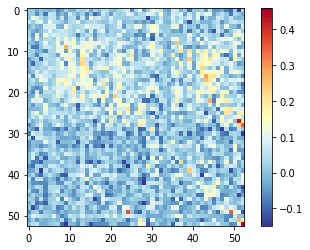

In [16]:
color_map = plt.imshow(MLP.model[0].layers.weight.detach().numpy())
color_map.set_cmap("RdYlBu_r")
plt.colorbar()
plt.show()

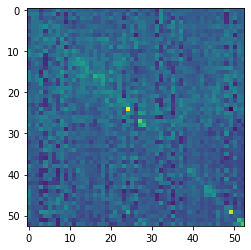

In [16]:
plt.imshow(MLP.model[0].layers.weight.detach().numpy())

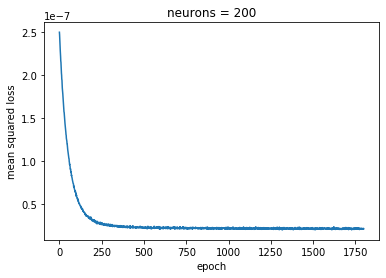

In [17]:
plt.plot(avg_train_losses[200:2000])
plt.ylabel('mean squared loss')
plt.xlabel('epoch')
plt.title('neurons = 200')
plt.show()

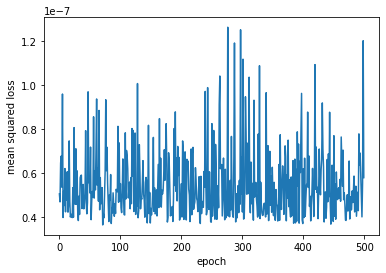

In [28]:
plt.plot(loss_valid[1000:3000:4])
plt.ylabel('mean squared loss')
plt.xlabel('epoch')
plt.show()

In [29]:
print(sum(time)/60)

7.212238250000544


In [62]:
#number = 200
yHatTest = MLP(xTest.float())
rmse_test = np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2)
print(rmse_test)
rmse_test1 = np.sqrt(np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2,0))
print(rmse_test1)
print(np.mean(rmse_test1[0:29]))
print(np.mean(rmse_test1[29:53]))

5.3012972114758244e-08
[0.00012895 0.00019371 0.00018044 0.00013267 0.00014376 0.00017097
 0.0002004  0.00022053 0.00022267 0.00019008 0.00022744 0.00020857
 0.0002003  0.00021942 0.00019532 0.0002062  0.00021237 0.0002197
 0.00020841 0.00023529 0.00024034 0.00026112 0.0002685  0.00035094
 0.0003401  0.0004112  0.00021022 0.00049725 0.00050476 0.00018401
 0.000193   0.00016853 0.00018268 0.00013303 0.00018718 0.00017048
 0.00016033 0.0001697  0.00022579 0.00023473 0.00018951 0.00019298
 0.00018273 0.00014456 0.00016622 0.00019351 0.00013443 0.00013211
 0.00015801 0.00014628 0.00017251 0.00028894 0.00033097]
0.0002414356637779123
0.00018509250879575364


In [63]:
np.save(saveFile+'rmse_test_last',rmse_test1)
np.save(saveFile+'yHatTest_last',yHatTest.detach().numpy())

In [64]:
model = Resnet(BasicBlock)
model.load_state_dict(torch.load(saveFile + 'Best'+'.ckpt'))
optimizer.load_state_dict(torch.load(saveFile+'Optim'+'Best'+'.ckpt'))
yHatTest = model(xTest.float())
rmse_test2 = np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2)
print(rmse_test2)
rmse_test3 = np.sqrt(np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2,0))
print(rmse_test3)
print(np.mean(rmse_test3[0:29]))
print(np.mean(rmse_test3[29:53]))

3.701617284644703e-08
[9.74125420e-05 7.82573727e-05 9.73345424e-05 1.04998926e-04
 1.22235106e-04 1.12786308e-04 1.27687526e-04 1.57112617e-04
 1.79454262e-04 1.55779475e-04 1.75697834e-04 1.80144755e-04
 1.77730551e-04 1.91990180e-04 1.68728821e-04 1.72858221e-04
 1.80818495e-04 1.87603780e-04 1.76266090e-04 1.95929815e-04
 2.00639413e-04 2.35354460e-04 2.17502205e-04 2.69328377e-04
 2.81408416e-04 3.07798202e-04 1.37661256e-04 3.94293813e-04
 4.17507143e-04 1.53830695e-04 1.63396532e-04 1.42243875e-04
 1.77020804e-04 1.25005359e-04 1.86146973e-04 1.59174226e-04
 1.50849124e-04 1.53563785e-04 2.08599064e-04 1.86470737e-04
 1.65925481e-04 1.70596094e-04 1.43326829e-04 1.44227079e-04
 1.31127046e-04 1.47054854e-04 1.20606515e-04 1.23753998e-04
 1.53780869e-04 1.49924165e-04 1.77735904e-04 2.88932539e-04
 3.24001295e-04]
0.00018973518983104646
0.00016863724349162133


In [65]:
np.save(saveFile+'rmse_test_best',rmse_test3)
np.save(saveFile+'yHatTest_best',yHatTest.detach().numpy())